==================================================================
### Code developed by: Vinicius Luiz Santos Silva

### Contact: v.santos-silva19@imperial.ac.uk / viluiz@gmail.com
==================================================================

In [1]:
# Python ≥3.5 is required
import sys
assert sys.version_info >= (3, 5)

# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"

# TensorFlow ≥2.0 is required
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import load_model
assert tf.__version__ >= "2.0"

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

# Common imports
import numpy as np
import os
import time
from collections import deque
import joblib
import shutil
import subprocess
import glob

# Python path for running in parallel (conda env py3ml)
pythonpath = '/home/viluiz/anaconda3/envs/py3ml/bin/python'
assert os.path.exists(pythonpath)

# Load and prepare data

In [2]:
# -----------------------------------------
# Load data and GAN model
# -----------------------------------------

# Mesh size
nl = 10
nc = 10

#Load PCA and Scaler
pca_compress = joblib.load("pca_compress_15.pkl") 
scaler = joblib.load("scaler.pkl")

# Train data
X_train_compressed = np.loadtxt('X_train_pca.csv', delimiter=',') 
X_train_1D = np.loadtxt('X_train_1D.csv', delimiter=',') 
times  = np.loadtxt('times.csv', delimiter=',') 
R0s_train  = np.loadtxt('R0s.csv', delimiter=',') 
with open('groups.txt') as f:
    groups = [g.strip() for g in f.readlines()]

# Test data
X_test_compressed = np.loadtxt('X_test_pca.csv', delimiter=',') 
X_test_1D = np.loadtxt('X_test_1D.csv', delimiter=',') 
R0s_test  = np.loadtxt('R0s_test.csv', delimiter=',') 

# Test uq data
X_testuq_compressed = np.loadtxt('X_testuq_pca.csv', delimiter=',') 
X_testuq_1D = np.loadtxt('X_testuq_1D.csv', delimiter=',') 
R0s_testuq  = np.loadtxt('R0s_testuq.csv', delimiter=',') 

# GAN model
#generator, discriminator = load_model('gan-tfex-DCGAN-5kernel.h5').layers
#latent_size = 100 # size of the latent space (input of the generator)

(38520, 10, 17)
(38520, 10, 17)
(192600, 10, 17)


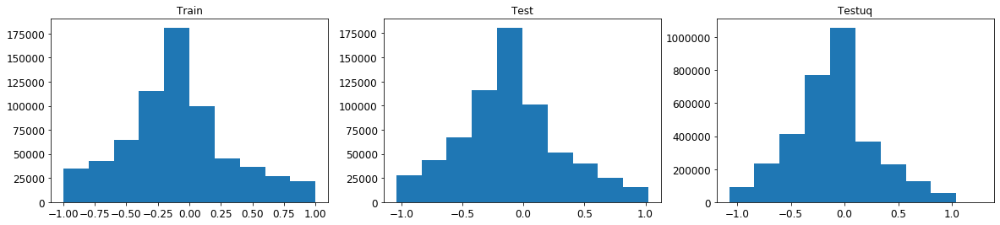

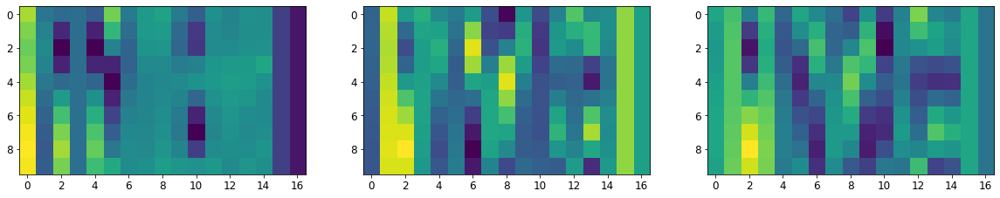

In [3]:
# -----------------------------------------
# Prepare data
# -----------------------------------------

pca_size = X_test_compressed.shape[1] # number of POD coeffients

X_train_R0s = R0s_train.repeat(len(times), axis=0) 
X_test_R0s = R0s_test.repeat(len(times), axis=0)
X_testuq_R0s = R0s_testuq.repeat(len(times), axis=0)

X_train_compressedplus = np.concatenate((X_train_compressed, X_train_R0s), axis=1) 
X_test_compressedplus = np.concatenate((X_test_compressed, X_test_R0s), axis=1) 
X_testuq_compressedplus = np.concatenate((X_testuq_compressed, X_testuq_R0s), axis=1) 
codings_size = X_test_compressedplus.shape[1] # number of POD coeffients + the number of model parameters

X_train_scaled = scaler.transform(X_train_compressedplus)
X_test_scaled = scaler.transform(X_test_compressedplus)
X_testuq_scaled = scaler.transform(X_testuq_compressedplus)

fig, ax = plt.subplots(1,3, figsize=[20,4])
ax[0].hist(X_train_scaled.flatten())
ax[0].set_title('Train')
ax[1].hist(X_test_scaled.flatten())
ax[1].set_title('Test')
ax[2].hist(X_testuq_scaled.flatten())
ax[2].set_title('Testuq')

# Concatenate successive time steps  
def concat_timesteps(X_train, ntimes, step, times):
    X_train_concat = []
    for j in range(len(X_train)//len(times)):
        for i in range(j*len(times), j*len(times)+(len(times)-ntimes*step)):
            X_train_concat.append(X_train[i:i+ntimes*step:step])
    return np.array(X_train_concat)

ntimes = 10 # Consecutive times for the GAN
step = 2 # step between times

X_train_concat = concat_timesteps(X_train_scaled, ntimes, step, times)
X_train_concat_flatten = X_train_concat.reshape(X_train_concat.shape[0], codings_size*ntimes )

X_test_concat = concat_timesteps(X_test_scaled, ntimes, step, times)
X_test_concat_flatten = X_test_concat.reshape(X_test_concat.shape[0], codings_size*ntimes )

X_testuq_concat = concat_timesteps(X_testuq_scaled, ntimes, step, times)
X_testuq_concat_flatten = X_testuq_concat.reshape(X_testuq_concat.shape[0], codings_size*ntimes )

fig, ax1 = plt.subplots(1,3, figsize=[20,4])
print(X_train_concat.shape)
ax1[0].imshow(X_train_concat[10000, :, :])
print(X_test_concat.shape)
ax1[1].imshow(X_test_concat[10000, :, :])
print(X_testuq_concat.shape)
ax1[2].imshow(X_testuq_concat[10000, :, :])
plt.show()

Text(0.5, 1.0, 'R0 Mobile')

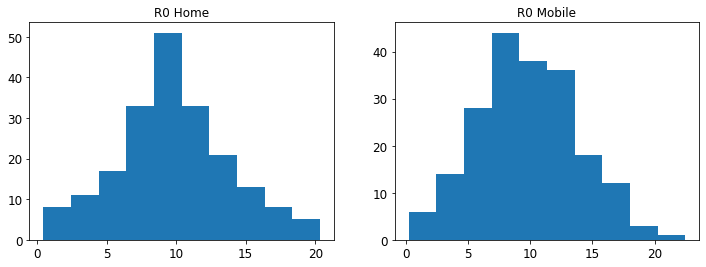

In [4]:
fig, ax = plt.subplots(1,2, figsize=[12,4])
ax[0].hist(R0s_testuq[:,0])
ax[0].set_title('R0 Home')
ax[1].hist(R0s_testuq[:,1])
ax[1].set_title('R0 Mobile')

## Generate observed 

X_obs.shape (259, 8, 10, 10)
R0s_obs [ 7.72820859 17.37615382]
obs_points.shape:  (140, 4)


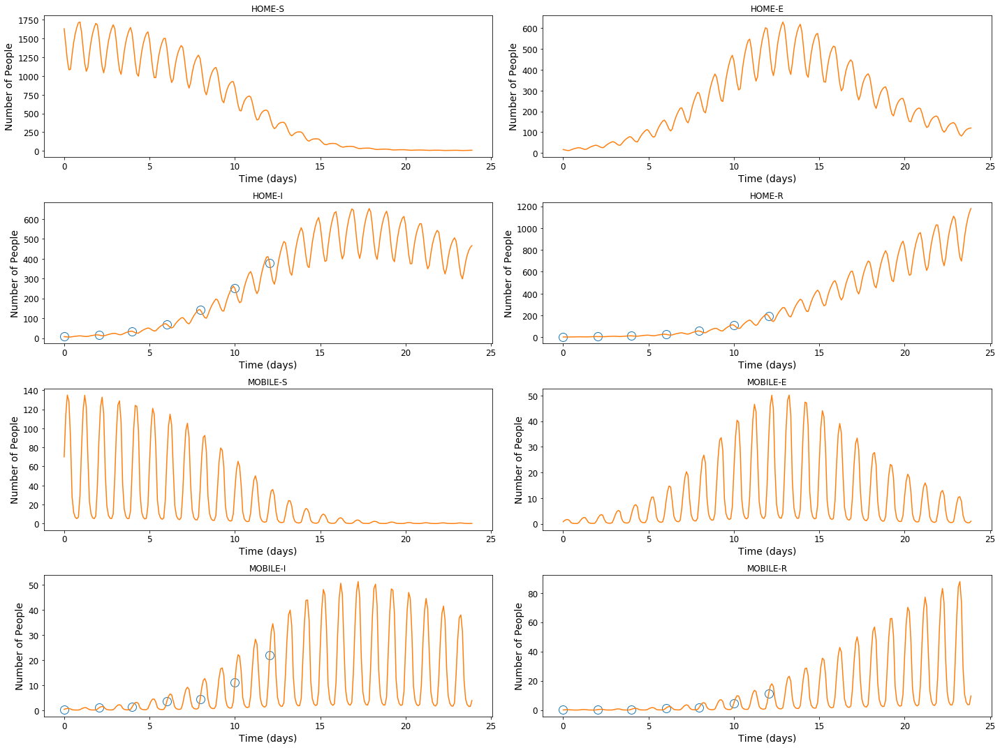

In [5]:
# -----------------------------------------
# Generate observed data
# -----------------------------------------

run_obs = 2 # from the test dataset
lag = 173 # starting point (in time steps)
length = 250 # length + (ntimes-1) -> len of X_obs (in forward steps = 2 time steps) 
seed = 0
noise = 0.00

# Times of X_obs to be considered for data assimilation
obs_times = list(map(int,map(round,np.arange(0,length+(ntimes-1)-120,21.6))))


# grid points: used to populate the obs_points
#[[group, line, column], 
# [group, line, column], 
# ...                 ]
grid_points = [[2,0,4],[6,0,4],[3,0,4],[7,0,4],
               [2,9,4],[6,9,4],[3,9,4],[7,9,4],
               [2,4,4],[6,4,4],[3,4,4],[7,4,4],
               [2,4,0],[6,4,0],[3,4,0],[7,4,0],
               [2,4,9],[6,4,9],[3,4,9],[7,4,9],
               #[0,0,4],[1,0,4],[2,0,4],[3,0,4],[4,0,4],[5,0,4],[6,0,4],[7,0,4],
               #[0,9,4],[1,9,4],[2,9,4],[3,9,4],[4,9,4],[5,9,4],[6,9,4],[7,9,4],
               #[0,4,4],[1,4,4],[2,4,4],[3,4,4],[4,4,4],[5,4,4],[6,4,4],[7,4,4],
               #[0,4,0],[1,4,0],[2,4,0],[3,4,0],[4,4,0],[5,4,0],[6,4,0],[7,4,0],
               #[0,4,9],[1,4,9],[2,4,9],[3,4,9],[4,4,9],[5,4,9],[6,4,9],[7,4,9],
               ]

def obs_data(run_obs, lag, length, seed, noise, obs_times, grid_points, verbose=0):

    nobs = len(times)*run_obs + lag

    # Get the observed data
    X_obs = X_test_1D[nobs:nobs+((ntimes-1)+length)*step:step,:].reshape(-1,len(groups),nl,nc)
    R0s_obs = R0s_test[run_obs]

    # Add noise
    np.random.seed(seed)
    X_obs = X_obs + np.random.standard_normal(X_obs.shape)*noise*X_obs

    # Print values
    if verbose>0: 
        print('X_obs.shape', X_obs.shape)
        print('R0s_obs', R0s_obs)

    # obs_points:
    #[[time, group, line, column], 
    # [time, group, line, column], 
    # ...                       ]
    obs_points = []
    for p in grid_points:
        for t in obs_times:
            obs_points.append([t]+p)
    obs_points = np.array(obs_points)
    if verbose>0:
        print('obs_points.shape: ', obs_points.shape)
    
    return X_obs, R0s_obs, obs_points

X_obs, R0s_obs, obs_points = obs_data(run_obs, lag, length, seed, noise, obs_times, grid_points, verbose=1)

fig, X_ax = plt.subplots(4,2, figsize=[20,15])
for i, group in enumerate(groups):
    if [i, 0, 4] in grid_points:
        X_ax.flatten()[i].plot(np.array(obs_times)*8000/86400, X_obs[obs_times][:, i, 0, 4], 'o', markevery=1, fillstyle='none', markersize = 12, label='Observed data')
    else:
        X_ax.flatten()[i].plot([],[])
    X_ax.flatten()[i].plot(np.array(range(len(X_obs)))*8000/86400, X_obs[:][:, i, 0, 4], '-', markevery=1, fillstyle='none', markersize = 12, label='Observed data')        
    X_ax.flatten()[i].set_title(group)
    X_ax.flatten()[i].set_xlabel('Time (days)')
    X_ax.flatten()[i].set_ylabel('Number of People')
plt.tight_layout()
plt.show()

# Run Markov chain Monte Carlo

In [6]:
nparalel = 40
samples = 120000
ini = 0
processes = []
dirnames = []
logfile = []
n_testuq = int(len(X_testuq_concat)/(len(times)- ntimes*step))

# Generate observed data 
X_obs, R0s_obs, obs_points = obs_data(run_obs, lag, length, 0, 0.00, obs_times, grid_points)

pyfile = 'predgan.py'
rundir = 'runmcmc_1/'

if os.path.exists(rundir):
    print('\n*** WARNING: Directory already exists: ./' + rundir)
    print('\n*** WARNING: All data assimilations will be considered finished!')
    print('\nContinuing execution!')
else:
    os.mkdir(rundir)
    
    j = 0
    for i in range(ini,samples):
        
        # Create folder and copy files
        dirnames.append( rundir+'mcmc'+str(i)+'/')
        if os.path.exists(dirnames[-1]):
            print('directory already exists: ' + os.path.abspath(dirnames[-1]))
            continue 
        #print('Creating folder '+dirnames[-1]+' and copying files... ', end='')
        os.mkdir(dirnames[-1])
        shutil.copy(pyfile, dirnames[-1])
        #print('Done!')         
        
        # Initial condition (run_ini = np.random.randint(0,n_testuq+1))
        run_ini = np.random.randint(0,n_testuq)
        n = (len(times)-ntimes*step)*run_ini + lag
        forward_steps = length
        initial_coding = X_testuq_concat[n]
        
        #Sampling the prior
        mean = 10.0; std = 4.0; cut_off = 0.2
        random_variables = np.random.normal(mean, std, 2)
        random_variables[random_variables<cut_off] = cut_off
        sample = scaler.transform([15*[0]+list(random_variables)])[0,-2:]
        initial_coding[:,-2:] = sample

        #save inputs
        input_data = (initial_coding, X_obs, obs_points,forward_steps) 
        joblib.dump(input_data, dirnames[-1]+'input_data.pkl')         

        # Check for finished jobs and write output to file
        while not len(processes) < nparalel:
            time.sleep(1)
            for i, p in enumerate(processes):
                if p.poll() != None:
                    j += 1
                    print('Run '+str(j)+': '+dirnames[i]+' finished! status:' + str(p.poll()))
                    processes.pop(i)
                    dirnames.pop(i)
                    logfile[i].close()
                    logfile.pop(i)
                    break
        # Run case 
        logfile.append(open(dirnames[-1] + 'run.log','w'))
        processes.append(subprocess.Popen([pythonpath, pyfile], 
                                          cwd=dirnames[-1], 
                                          stdout=logfile[-1], 
                                          stderr=logfile[-1],
                                          close_fds=True))
        print(dirnames[-1]+' running...', sample)       


    #Check for finished jobs and write output to file
    while len(processes) > 0:
        time.sleep(1)
        for i, p in enumerate(processes):
            if p.poll() != None:
                j += 1
                print('Run '+str(j)+': '+dirnames[i]+' finished! status:' + str(p.poll()))
                processes.pop(i)
                dirnames.pop(i)
                logfile[i].close()
                logfile.pop(i)
                break
    print('Finished!')     


*** WARNING: Directory already exists: ./runmcmc_1/

*** WARNING: All data assimilations will be considered finished!

Continuing execution!


# Read output files 

runmcmc_1/mcmc0:         runtime=804    iterations=0   loss=0.000395  R0s=[6.77809995 9.96220937]
runmcmc_1/mcmc1:         runtime=939    iterations=0   loss=0.0369    R0s=[ 9.27066337 12.47487771]
runmcmc_1/mcmc10:        runtime=699    iterations=0   loss=0.000774  R0s=[ 4.42322517 12.06279607]
runmcmc_1/mcmc100:       runtime=704    iterations=0   loss=0.00313   R0s=[14.45327362  8.09515065]
runmcmc_1/mcmc1000:      runtime=691    iterations=0   loss=0.00426   R0s=[18.78816962  5.29122281]
runmcmc_1/mcmc10000:     runtime=1061   iterations=0   loss=0.0084    R0s=[2.89928716 4.97457719]
runmcmc_1/mcmc100000:    runtime=1117   iterations=0   loss=0.00201   R0s=[ 8.6296735  10.97549307]
runmcmc_1/mcmc100001:    runtime=1293   iterations=0   loss=0.0839    R0s=[3.94888074 6.77829729]
runmcmc_1/mcmc100002:    runtime=1084   iterations=0   loss=0.00328   R0s=[ 7.15507871 16.45030731]
runmcmc_1/mcmc100003:    runtime=1233   iterations=0   loss=0.00154   R0s=[15.83388708 15.19867182]
runmcm

runmcmc_1/mcmc100137:    runtime=1438   iterations=0   loss=0.079     R0s=[12.469493 20.732369]
runmcmc_1/mcmc100138:    runtime=928    iterations=0   loss=0.114     R0s=[9.3273917  9.49435372]
runmcmc_1/mcmc100139:    runtime=1480   iterations=0   loss=0.147     R0s=[ 8.50591244 10.35022122]
runmcmc_1/mcmc10014:     runtime=946    iterations=0   loss=0.13      R0s=[4.1333357  0.60256065]
runmcmc_1/mcmc100140:    runtime=1236   iterations=0   loss=0.00131   R0s=[17.16586108  7.99798667]
runmcmc_1/mcmc100141:    runtime=1077   iterations=0   loss=0.00215   R0s=[ 9.88415949 11.18877553]
runmcmc_1/mcmc100142:    runtime=1405   iterations=0   loss=0.0716    R0s=[15.41943332 12.61719767]
runmcmc_1/mcmc100143:    runtime=1340   iterations=0   loss=0.0354    R0s=[12.59062967  6.55176127]
runmcmc_1/mcmc100144:    runtime=1314   iterations=0   loss=0.0214    R0s=[ 8.49205651 10.36296295]
runmcmc_1/mcmc100145:    runtime=1437   iterations=0   loss=0.0669    R0s=[5.28054477 4.12544   ]
runmcmc_1/

runmcmc_1/mcmc100268:    runtime=1096   iterations=0   loss=0.0548    R0s=[12.34710139  8.68112893]
runmcmc_1/mcmc100269:    runtime=1160   iterations=0   loss=0.0929    R0s=[ 9.79529367 10.74360714]
runmcmc_1/mcmc10027:     runtime=1075   iterations=0   loss=0.00138   R0s=[ 9.58527015 16.58889118]
runmcmc_1/mcmc100270:    runtime=1281   iterations=0   loss=0.00248   R0s=[16.0138404 12.7448015]
runmcmc_1/mcmc100271:    runtime=1205   iterations=0   loss=0.00269   R0s=[ 8.29110763 11.27272449]
runmcmc_1/mcmc100272:    runtime=1093   iterations=0   loss=0.0724    R0s=[12.74386266 16.11219107]
runmcmc_1/mcmc100273:    runtime=1265   iterations=0   loss=0.085     R0s=[15.54690383 14.75871375]
runmcmc_1/mcmc100274:    runtime=1232   iterations=0   loss=0.0293    R0s=[15.91466301 11.69743732]
runmcmc_1/mcmc100275:    runtime=1295   iterations=0   loss=0.00136   R0s=[12.22702082  0.38556477]
runmcmc_1/mcmc100276:    runtime=1020   iterations=0   loss=0.0343    R0s=[9.24017401 9.00881071]
runm

runmcmc_1/mcmc1004:      runtime=665    iterations=0   loss=0.0045    R0s=[14.81731683  8.92800092]
runmcmc_1/mcmc10040:     runtime=963    iterations=0   loss=0.00514   R0s=[10.93184484 10.78468959]
runmcmc_1/mcmc100400:    runtime=838    iterations=0   loss=0.136     R0s=[ 4.89977485 16.29520679]
runmcmc_1/mcmc100401:    runtime=989    iterations=0   loss=0.144     R0s=[ 7.42943188 12.14082379]
runmcmc_1/mcmc100402:    runtime=918    iterations=0   loss=0.141     R0s=[ 5.39782449 12.6945774 ]
runmcmc_1/mcmc100403:    runtime=1397   iterations=0   loss=0.0145    R0s=[13.2388365   4.42782334]
runmcmc_1/mcmc100404:    runtime=1303   iterations=0   loss=0.0238    R0s=[9.91834393 6.92030186]
runmcmc_1/mcmc100405:    runtime=951    iterations=0   loss=0.0126    R0s=[13.79669474 11.69959776]
runmcmc_1/mcmc100406:    runtime=1035   iterations=0   loss=0.0727    R0s=[11.55430086  8.96006169]
runmcmc_1/mcmc100407:    runtime=1093   iterations=0   loss=0.0417    R0s=[9.03291852 3.76714769]
runm

runmcmc_1/mcmc10055:     runtime=972    iterations=0   loss=0.0297    R0s=[20.03223956 10.44696821]
runmcmc_1/mcmc100550:    runtime=1254   iterations=0   loss=0.191     R0s=[12.78678751 16.04859625]
runmcmc_1/mcmc100551:    runtime=1039   iterations=0   loss=0.0286    R0s=[12.95792828 13.75824643]
runmcmc_1/mcmc100552:    runtime=1051   iterations=0   loss=0.00193   R0s=[15.14765624 13.8225076 ]
runmcmc_1/mcmc100553:    runtime=1267   iterations=0   loss=0.0813    R0s=[13.12622569  7.54576839]
runmcmc_1/mcmc100554:    runtime=1243   iterations=0   loss=0.136     R0s=[ 0.2        10.23200735]
runmcmc_1/mcmc100555:    runtime=1166   iterations=0   loss=0.0793    R0s=[9.93276183 0.2       ]
runmcmc_1/mcmc100556:    runtime=1039   iterations=0   loss=0.000897  R0s=[ 8.44849248 11.2121671 ]
runmcmc_1/mcmc100557:    runtime=989    iterations=0   loss=0.0458    R0s=[ 5.2361856  19.50907647]
runmcmc_1/mcmc100558:    runtime=1054   iterations=0   loss=0.0386    R0s=[ 6.73915604 10.12962835]
ru

runmcmc_1/mcmc100698:    runtime=1251   iterations=0   loss=0.0135    R0s=[12.08673246  2.74980198]
runmcmc_1/mcmc100699:    runtime=1226   iterations=0   loss=0.0274    R0s=[12.94915076 15.00475788]
runmcmc_1/mcmc1007:      runtime=727    iterations=0   loss=0.143     R0s=[7.99368967 7.56591358]
runmcmc_1/mcmc10070:     runtime=923    iterations=0   loss=0.045     R0s=[ 3.05365579 16.28875576]
runmcmc_1/mcmc100700:    runtime=1070   iterations=0   loss=0.325     R0s=[16.08427955 10.71812767]
runmcmc_1/mcmc100701:    runtime=1130   iterations=0   loss=0.019     R0s=[8.40335794 5.66146598]
runmcmc_1/mcmc100702:    runtime=1302   iterations=0   loss=0.0178    R0s=[10.39706671  4.68029549]
runmcmc_1/mcmc100703:    runtime=1180   iterations=0   loss=0.13      R0s=[ 8.51596491 10.79817002]
runmcmc_1/mcmc100704:    runtime=965    iterations=0   loss=0.054     R0s=[ 7.23509063 12.95754327]
runmcmc_1/mcmc100705:    runtime=993    iterations=0   loss=0.0105    R0s=[4.89918814 8.5044669 ]
runmcm

runmcmc_1/mcmc100812:    runtime=1288   iterations=0   loss=0.0334    R0s=[11.8798459  10.45142382]
runmcmc_1/mcmc100813:    runtime=1377   iterations=0   loss=0.146     R0s=[11.07352577 15.55296984]
runmcmc_1/mcmc100814:    runtime=1080   iterations=0   loss=0.461     R0s=[15.29538676  8.41396194]
runmcmc_1/mcmc100815:    runtime=1262   iterations=0   loss=0.122     R0s=[6.178365   5.63721343]
runmcmc_1/mcmc100816:    runtime=1404   iterations=0   loss=0.0889    R0s=[21.8861578  10.79322778]
runmcmc_1/mcmc100817:    runtime=1251   iterations=0   loss=0.157     R0s=[ 1.94070356 20.09383311]
runmcmc_1/mcmc100818:    runtime=933    iterations=0   loss=0.0378    R0s=[ 6.98938549 14.5245023 ]
runmcmc_1/mcmc100819:    runtime=919    iterations=0   loss=0.0868    R0s=[9.01526811 7.40550687]
runmcmc_1/mcmc10082:     runtime=918    iterations=0   loss=0.0161    R0s=[12.82040709 12.79912938]
runmcmc_1/mcmc100820:    runtime=1419   iterations=0   loss=0.112     R0s=[2.10993333 7.52605285]
runmcm

runmcmc_1/mcmc100916:    runtime=1055   iterations=0   loss=0.00492   R0s=[14.34272711 12.86774493]
runmcmc_1/mcmc100917:    runtime=968    iterations=0   loss=0.0667    R0s=[ 9.56306382 15.03864915]
runmcmc_1/mcmc100918:    runtime=1460   iterations=0   loss=0.0187    R0s=[10.98633115 10.25068998]
runmcmc_1/mcmc100919:    runtime=1027   iterations=0   loss=0.000219  R0s=[11.73529437  9.68138071]
runmcmc_1/mcmc10092:     runtime=878    iterations=0   loss=0.0252    R0s=[7.57144494 8.92896444]
runmcmc_1/mcmc100920:    runtime=1424   iterations=0   loss=0.000278  R0s=[10.63266119  8.78604636]
runmcmc_1/mcmc100921:    runtime=1464   iterations=0   loss=0.0993    R0s=[16.25601494  9.58582257]
runmcmc_1/mcmc100922:    runtime=1719   iterations=0   loss=0.148     R0s=[8.67325999 1.59753645]
runmcmc_1/mcmc100923:    runtime=1437   iterations=0   loss=0.000872  R0s=[9.28896348 7.78296877]
runmcmc_1/mcmc100924:    runtime=967    iterations=0   loss=0.0114    R0s=[11.53349057  8.81146264]
runmcm

runmcmc_1/mcmc101030:    runtime=1501   iterations=0   loss=0.0158    R0s=[11.46090784 20.26270403]
runmcmc_1/mcmc101031:    runtime=1410   iterations=0   loss=0.00435   R0s=[ 8.69548926 13.79783823]
runmcmc_1/mcmc101032:    runtime=1334   iterations=0   loss=0.00218   R0s=[ 9.94859441 14.47882979]
runmcmc_1/mcmc101033:    runtime=1430   iterations=0   loss=0.0294    R0s=[12.7533443  10.46504016]
runmcmc_1/mcmc101034:    runtime=1420   iterations=0   loss=0.00973   R0s=[13.18833824 10.44283899]
runmcmc_1/mcmc101035:    runtime=1332   iterations=0   loss=0.0504    R0s=[ 6.10125631 13.75227201]
runmcmc_1/mcmc101036:    runtime=1111   iterations=0   loss=0.144     R0s=[ 7.70642671 14.51023009]
runmcmc_1/mcmc101037:    runtime=1309   iterations=0   loss=0.0537    R0s=[12.43232362  7.05513242]
runmcmc_1/mcmc101038:    runtime=1418   iterations=0   loss=0.126     R0s=[10.76461246  9.91972382]
runmcmc_1/mcmc101039:    runtime=1354   iterations=0   loss=0.135     R0s=[3.02064167 8.93382678]
ru

runmcmc_1/mcmc101157:    runtime=1282   iterations=0   loss=0.024     R0s=[9.83952749 8.70374542]
runmcmc_1/mcmc101158:    runtime=1231   iterations=0   loss=0.0664    R0s=[9.40158341 5.44998581]
runmcmc_1/mcmc101159:    runtime=1381   iterations=0   loss=0.0831    R0s=[10.26998209  9.38121181]
runmcmc_1/mcmc10116:     runtime=928    iterations=0   loss=0.0119    R0s=[9.05939314 6.78255347]
runmcmc_1/mcmc101160:    runtime=1003   iterations=0   loss=0.00027   R0s=[9.12183299 6.70430992]
runmcmc_1/mcmc101161:    runtime=1270   iterations=0   loss=0.047     R0s=[11.46691319 15.73306417]
runmcmc_1/mcmc101162:    runtime=1430   iterations=0   loss=0.0577    R0s=[8.36404032 6.43552848]
runmcmc_1/mcmc101163:    runtime=1331   iterations=0   loss=0.00635   R0s=[14.65591983  9.47255309]
runmcmc_1/mcmc101164:    runtime=1134   iterations=0   loss=0.145     R0s=[6.2274348  4.08015126]
runmcmc_1/mcmc101165:    runtime=1141   iterations=0   loss=0.0954    R0s=[ 7.61570877 11.57174086]
runmcmc_1/mc

runmcmc_1/mcmc10127:     runtime=951    iterations=0   loss=0.0125    R0s=[ 2.01784183 13.05348587]
runmcmc_1/mcmc101270:    runtime=1011   iterations=0   loss=0.0815    R0s=[10.67567864  5.33504004]
runmcmc_1/mcmc101271:    runtime=1489   iterations=0   loss=0.00196   R0s=[10.38311362 10.80294286]
runmcmc_1/mcmc101272:    runtime=1203   iterations=0   loss=0.00772   R0s=[10.79222383  8.89964795]
runmcmc_1/mcmc101273:    runtime=1291   iterations=0   loss=0.0806    R0s=[ 8.75559212 15.50928715]
runmcmc_1/mcmc101274:    runtime=1347   iterations=0   loss=0.00201   R0s=[15.45954518  5.18098508]
runmcmc_1/mcmc101275:    runtime=1300   iterations=0   loss=0.0453    R0s=[2.35651281 8.92617301]
runmcmc_1/mcmc101276:    runtime=1134   iterations=0   loss=0.133     R0s=[6.84382048 8.90369389]
runmcmc_1/mcmc101277:    runtime=981    iterations=0   loss=0.0517    R0s=[10.24525112 13.73331872]
runmcmc_1/mcmc101278:    runtime=1328   iterations=0   loss=0.00337   R0s=[13.46472705  7.1449755 ]
runm

runmcmc_1/mcmc10137:     runtime=1039   iterations=0   loss=0.0141    R0s=[ 8.45955804 18.41672809]
runmcmc_1/mcmc101370:    runtime=965    iterations=0   loss=0.317     R0s=[13.98499519 11.7696592 ]
runmcmc_1/mcmc101371:    runtime=1332   iterations=0   loss=0.125     R0s=[10.1964957   7.25016006]
runmcmc_1/mcmc101372:    runtime=1148   iterations=0   loss=0.136     R0s=[6.0773206  6.39143891]
runmcmc_1/mcmc101373:    runtime=1524   iterations=0   loss=0.00482   R0s=[14.5185317   5.79805659]
runmcmc_1/mcmc101374:    runtime=1310   iterations=0   loss=0.101     R0s=[7.20209165 5.71456307]
runmcmc_1/mcmc101375:    runtime=1095   iterations=0   loss=0.0692    R0s=[12.97923977 13.07234933]
runmcmc_1/mcmc101376:    runtime=1253   iterations=0   loss=0.00775   R0s=[11.95099045 15.42314316]
runmcmc_1/mcmc101377:    runtime=1496   iterations=0   loss=0.00652   R0s=[ 5.05664833 16.87195391]
runmcmc_1/mcmc101378:    runtime=1083   iterations=0   loss=0.0838    R0s=[10.90934546 11.36018881]
runm

runmcmc_1/mcmc10149:     runtime=926    iterations=0   loss=0.0192    R0s=[14.03128694  3.43424752]
runmcmc_1/mcmc101490:    runtime=1256   iterations=0   loss=0.0487    R0s=[ 7.59900761 11.87868981]
runmcmc_1/mcmc101491:    runtime=1343   iterations=0   loss=0.00114   R0s=[14.07808597 12.27322336]
runmcmc_1/mcmc101492:    runtime=1519   iterations=0   loss=0.000814  R0s=[10.27114531 10.92571772]
runmcmc_1/mcmc101493:    runtime=981    iterations=0   loss=0.00753   R0s=[15.48265755 16.07136518]
runmcmc_1/mcmc101494:    runtime=1269   iterations=0   loss=0.000695  R0s=[6.32697193 8.34587   ]
runmcmc_1/mcmc101495:    runtime=1274   iterations=0   loss=0.144     R0s=[ 7.02995606 13.1241753 ]
runmcmc_1/mcmc101496:    runtime=989    iterations=0   loss=0.00102   R0s=[12.37034269 14.44411033]
runmcmc_1/mcmc101497:    runtime=1579   iterations=0   loss=0.0916    R0s=[ 8.47622347 18.24083623]
runmcmc_1/mcmc101498:    runtime=1211   iterations=0   loss=0.0448    R0s=[ 5.75946758 12.12815123]
ru

runmcmc_1/mcmc10162:     runtime=923    iterations=0   loss=0.00367   R0s=[ 8.96050716 10.64033799]
runmcmc_1/mcmc101620:    runtime=1012   iterations=0   loss=0.0154    R0s=[12.91248265 13.60397141]
runmcmc_1/mcmc101621:    runtime=977    iterations=0   loss=0.0663    R0s=[1.41914153 9.69892865]
runmcmc_1/mcmc101622:    runtime=1014   iterations=0   loss=0.00569   R0s=[7.09989902 4.93161821]
runmcmc_1/mcmc101623:    runtime=1073   iterations=0   loss=0.138     R0s=[8.68620228 7.2112692 ]
runmcmc_1/mcmc101624:    runtime=1116   iterations=0   loss=0.0172    R0s=[15.37251381 12.82599206]
runmcmc_1/mcmc101625:    runtime=951    iterations=0   loss=0.0223    R0s=[ 7.97107229 13.76595262]
runmcmc_1/mcmc101626:    runtime=1134   iterations=0   loss=0.0273    R0s=[14.02719594  7.59904264]
runmcmc_1/mcmc101627:    runtime=1004   iterations=0   loss=0.192     R0s=[11.04757603  4.24104558]
runmcmc_1/mcmc101628:    runtime=914    iterations=0   loss=0.0919    R0s=[10.01420496 13.36802134]
runmcm

runmcmc_1/mcmc101740:    runtime=1103   iterations=0   loss=0.024     R0s=[2.80435319 8.83216273]
runmcmc_1/mcmc101741:    runtime=977    iterations=0   loss=0.314     R0s=[16.48168356 13.19225254]
runmcmc_1/mcmc101742:    runtime=1047   iterations=0   loss=0.000979  R0s=[ 9.06014965 11.26740262]
runmcmc_1/mcmc101743:    runtime=1004   iterations=0   loss=0.00343   R0s=[15.94306109 11.6058076 ]
runmcmc_1/mcmc101744:    runtime=969    iterations=0   loss=0.0327    R0s=[16.55056489 12.90854211]
runmcmc_1/mcmc101745:    runtime=1101   iterations=0   loss=0.144     R0s=[ 4.31360523 13.80994055]
runmcmc_1/mcmc101746:    runtime=862    iterations=0   loss=0.137     R0s=[4.15290438 1.27672411]
runmcmc_1/mcmc101747:    runtime=908    iterations=0   loss=0.00112   R0s=[14.13088607  9.33879104]
runmcmc_1/mcmc101748:    runtime=1048   iterations=0   loss=0.0366    R0s=[ 6.40781829 11.97086489]
runmcmc_1/mcmc101749:    runtime=694    iterations=0   loss=0.141     R0s=[ 3.78214889 12.59161775]
runm

runmcmc_1/mcmc101869:    runtime=916    iterations=0   loss=0.0948    R0s=[9.27543944 8.80816112]
runmcmc_1/mcmc10187:     runtime=878    iterations=0   loss=0.0501    R0s=[10.50826355  1.60534643]
runmcmc_1/mcmc101870:    runtime=1023   iterations=0   loss=0.0693    R0s=[4.73773078 2.5699672 ]
runmcmc_1/mcmc101871:    runtime=1125   iterations=0   loss=0.104     R0s=[19.50911232 12.56581604]
runmcmc_1/mcmc101872:    runtime=928    iterations=0   loss=0.098     R0s=[4.18427573 9.28786558]
runmcmc_1/mcmc101873:    runtime=1083   iterations=0   loss=0.0179    R0s=[ 9.13473037 14.32760461]
runmcmc_1/mcmc101874:    runtime=1174   iterations=0   loss=0.0758    R0s=[2.58305293 2.416119  ]
runmcmc_1/mcmc101875:    runtime=1021   iterations=0   loss=0.0522    R0s=[ 3.33101499 14.53455711]
runmcmc_1/mcmc101876:    runtime=826    iterations=0   loss=0.0989    R0s=[8.60872272 7.62181335]
runmcmc_1/mcmc101877:    runtime=1190   iterations=0   loss=0.0246    R0s=[6.20014018 2.24648799]
runmcmc_1/mc

runmcmc_1/mcmc101998:    runtime=790    iterations=0   loss=0.0992    R0s=[9.30352507 7.62976064]
runmcmc_1/mcmc101999:    runtime=1080   iterations=0   loss=0.00264   R0s=[12.93873975  8.78690763]
runmcmc_1/mcmc102:       runtime=717    iterations=0   loss=0.143     R0s=[ 6.51927    12.38389958]
runmcmc_1/mcmc1020:      runtime=627    iterations=0   loss=0.117     R0s=[11.40546336  8.21145539]
runmcmc_1/mcmc10200:     runtime=821    iterations=0   loss=0.139     R0s=[5.72398102 7.64741398]
runmcmc_1/mcmc102000:    runtime=1100   iterations=0   loss=0.122     R0s=[12.1885701 12.4585579]
runmcmc_1/mcmc102001:    runtime=1019   iterations=0   loss=0.143     R0s=[ 6.04422848 11.58314948]
runmcmc_1/mcmc102002:    runtime=872    iterations=0   loss=0.00138   R0s=[5.13621902 6.8092909 ]
runmcmc_1/mcmc102003:    runtime=1108   iterations=0   loss=0.0229    R0s=[11.52128145  5.1181866 ]
runmcmc_1/mcmc102004:    runtime=1050   iterations=0   loss=0.0207    R0s=[11.08274331 11.24455146]
runmcmc_

runmcmc_1/mcmc102131:    runtime=1004   iterations=0   loss=0.000375  R0s=[10.75035744  5.46515423]
runmcmc_1/mcmc102132:    runtime=834    iterations=0   loss=0.0587    R0s=[8.22244947 8.40133086]
runmcmc_1/mcmc102133:    runtime=1022   iterations=0   loss=0.00166   R0s=[9.26544614 9.33965104]
runmcmc_1/mcmc102134:    runtime=1064   iterations=0   loss=0.0552    R0s=[7.2430931  8.88933567]
runmcmc_1/mcmc102135:    runtime=1088   iterations=0   loss=0.0339    R0s=[9.58704341 5.88808716]
runmcmc_1/mcmc102136:    runtime=867    iterations=0   loss=0.0196    R0s=[14.68032565 11.80061873]
runmcmc_1/mcmc102137:    runtime=1307   iterations=0   loss=0.00715   R0s=[ 2.61363957 18.31243824]
runmcmc_1/mcmc102138:    runtime=945    iterations=0   loss=0.139     R0s=[7.24165397 8.35398943]
runmcmc_1/mcmc102139:    runtime=1145   iterations=0   loss=0.14      R0s=[ 0.2        10.86604759]
runmcmc_1/mcmc10214:     runtime=828    iterations=0   loss=0.132     R0s=[5.07669362 7.68729647]
runmcmc_1/mc

runmcmc_1/mcmc10226:     runtime=812    iterations=0   loss=0.0928    R0s=[7.70575809 9.47140755]
runmcmc_1/mcmc102260:    runtime=979    iterations=0   loss=0.00098   R0s=[14.3127733  17.95400488]
runmcmc_1/mcmc102261:    runtime=1070   iterations=0   loss=0.042     R0s=[ 9.78108366 11.80359804]
runmcmc_1/mcmc102262:    runtime=1157   iterations=0   loss=0.0012    R0s=[3.55603813 6.47907686]
runmcmc_1/mcmc102263:    runtime=1128   iterations=0   loss=0.117     R0s=[17.67845664  7.62264594]
runmcmc_1/mcmc102264:    runtime=1033   iterations=0   loss=0.0447    R0s=[ 9.07916037 11.62648587]
runmcmc_1/mcmc102265:    runtime=1112   iterations=0   loss=0.00275   R0s=[9.76575466 9.74858604]
runmcmc_1/mcmc102266:    runtime=1015   iterations=0   loss=0.0209    R0s=[8.74846929 4.05443156]
runmcmc_1/mcmc102267:    runtime=1096   iterations=0   loss=0.00782   R0s=[12.67824424  8.94909759]
runmcmc_1/mcmc102268:    runtime=1070   iterations=0   loss=0.0206    R0s=[14.23007676 12.76239926]
runmcmc_

runmcmc_1/mcmc102397:    runtime=1199   iterations=0   loss=0.146     R0s=[ 4.11895497 14.62418016]
runmcmc_1/mcmc102398:    runtime=1074   iterations=0   loss=0.00666   R0s=[ 9.40580173 10.49723618]
runmcmc_1/mcmc102399:    runtime=1071   iterations=0   loss=0.00576   R0s=[14.38772456  2.47691472]
runmcmc_1/mcmc1024:      runtime=696    iterations=0   loss=0.00185   R0s=[8.7750194  6.73172351]
runmcmc_1/mcmc10240:     runtime=996    iterations=0   loss=0.00953   R0s=[18.03057785 15.43637159]
runmcmc_1/mcmc102400:    runtime=960    iterations=0   loss=0.000208  R0s=[11.10468475  8.39903092]
runmcmc_1/mcmc102401:    runtime=1081   iterations=0   loss=0.0555    R0s=[6.25860967 5.84924083]
runmcmc_1/mcmc102402:    runtime=1055   iterations=0   loss=0.0337    R0s=[ 8.45582748 13.21885405]
runmcmc_1/mcmc102403:    runtime=1175   iterations=0   loss=0.0585    R0s=[14.52751968  5.64234793]
runmcmc_1/mcmc102404:    runtime=1077   iterations=0   loss=0.0592    R0s=[10.37354777  6.44652352]
runm

runmcmc_1/mcmc10248:     runtime=1024   iterations=0   loss=0.142     R0s=[8.13530208 5.97583158]
runmcmc_1/mcmc102480:    runtime=1100   iterations=0   loss=0.000776  R0s=[8.22438961 8.5376372 ]
runmcmc_1/mcmc102481:    runtime=912    iterations=0   loss=0.0654    R0s=[11.14853724  7.74322258]
runmcmc_1/mcmc102482:    runtime=900    iterations=0   loss=0.0658    R0s=[ 7.82435558 13.27419933]
runmcmc_1/mcmc102483:    runtime=832    iterations=0   loss=0.00156   R0s=[13.89366657  7.29736784]
runmcmc_1/mcmc102484:    runtime=916    iterations=0   loss=0.0887    R0s=[ 5.17494248 12.44892385]
runmcmc_1/mcmc102485:    runtime=942    iterations=0   loss=0.00172   R0s=[12.70568834  1.64189407]
runmcmc_1/mcmc102486:    runtime=1067   iterations=0   loss=0.0411    R0s=[19.13284231  3.83059983]
runmcmc_1/mcmc102487:    runtime=1068   iterations=0   loss=0.0085    R0s=[10.37018388  6.28116276]
runmcmc_1/mcmc102488:    runtime=1160   iterations=0   loss=0.131     R0s=[9.12579306 6.043772  ]
runmcm

runmcmc_1/mcmc10261:     runtime=993    iterations=0   loss=0.0923    R0s=[12.96967162  5.82904864]
runmcmc_1/mcmc102610:    runtime=975    iterations=0   loss=0.00399   R0s=[11.34956874 10.09772559]
runmcmc_1/mcmc102611:    runtime=803    iterations=0   loss=0.0155    R0s=[10.71882368  0.2       ]
runmcmc_1/mcmc102612:    runtime=1307   iterations=0   loss=0.118     R0s=[11.59866119  9.31578542]
runmcmc_1/mcmc102613:    runtime=1026   iterations=0   loss=0.135     R0s=[12.38632909 14.95914979]
runmcmc_1/mcmc102614:    runtime=1123   iterations=0   loss=0.000324  R0s=[ 9.66867203 10.1187913 ]
runmcmc_1/mcmc102615:    runtime=823    iterations=0   loss=0.00974   R0s=[ 9.4408881  12.95926445]
runmcmc_1/mcmc102616:    runtime=1064   iterations=0   loss=0.119     R0s=[14.86731244  6.0411981 ]
runmcmc_1/mcmc102617:    runtime=1184   iterations=0   loss=0.00515   R0s=[11.65738222  5.68808058]
runmcmc_1/mcmc102618:    runtime=1145   iterations=0   loss=0.00221   R0s=[16.03173377 14.09640835]


runmcmc_1/mcmc10274:     runtime=1103   iterations=0   loss=0.154     R0s=[8.28866186 1.07123436]
runmcmc_1/mcmc102740:    runtime=779    iterations=0   loss=0.0518    R0s=[10.30429681  8.87988275]
runmcmc_1/mcmc102741:    runtime=840    iterations=0   loss=0.108     R0s=[1.63612207 9.36695367]
runmcmc_1/mcmc102742:    runtime=808    iterations=0   loss=0.0744    R0s=[ 8.61309253 14.10079182]
runmcmc_1/mcmc102743:    runtime=897    iterations=0   loss=0.0282    R0s=[11.60121416 11.9201011 ]
runmcmc_1/mcmc102744:    runtime=933    iterations=0   loss=0.11      R0s=[9.94260937 2.8602414 ]
runmcmc_1/mcmc102745:    runtime=889    iterations=0   loss=0.00262   R0s=[ 9.77531395 12.75583793]
runmcmc_1/mcmc102746:    runtime=850    iterations=0   loss=0.000219  R0s=[11.46721099  8.20761976]
runmcmc_1/mcmc102747:    runtime=910    iterations=0   loss=0.0173    R0s=[ 8.78599731 11.69545029]
runmcmc_1/mcmc102748:    runtime=1017   iterations=0   loss=0.14      R0s=[6.89539875 7.17325819]
runmcmc_

runmcmc_1/mcmc102884:    runtime=914    iterations=0   loss=0.0845    R0s=[11.67399094 12.06352125]
runmcmc_1/mcmc102885:    runtime=725    iterations=0   loss=0.0147    R0s=[11.02876125  6.43610828]
runmcmc_1/mcmc102886:    runtime=841    iterations=0   loss=0.117     R0s=[9.03446409 6.82878368]
runmcmc_1/mcmc102887:    runtime=937    iterations=0   loss=0.0235    R0s=[5.89169931 7.97129267]
runmcmc_1/mcmc102888:    runtime=1175   iterations=0   loss=0.0203    R0s=[18.4951636  7.6966596]
runmcmc_1/mcmc102889:    runtime=874    iterations=0   loss=0.00262   R0s=[13.97094999 10.51298115]
runmcmc_1/mcmc10289:     runtime=869    iterations=0   loss=0.0568    R0s=[13.45397958 14.44502913]
runmcmc_1/mcmc102890:    runtime=1117   iterations=0   loss=0.142     R0s=[ 8.97977213 10.67793345]
runmcmc_1/mcmc102891:    runtime=1212   iterations=0   loss=0.0105    R0s=[ 9.55046527 11.88082777]
runmcmc_1/mcmc102892:    runtime=761    iterations=0   loss=0.035     R0s=[ 6.28992903 13.3058118 ]
runmcm

runmcmc_1/mcmc102966:    runtime=1157   iterations=0   loss=0.00598   R0s=[8.51066519 4.50383333]
runmcmc_1/mcmc102967:    runtime=826    iterations=0   loss=0.0401    R0s=[10.70834863 14.73684401]
runmcmc_1/mcmc102968:    runtime=815    iterations=0   loss=0.13      R0s=[ 1.81868314 10.55552713]
runmcmc_1/mcmc102969:    runtime=849    iterations=0   loss=0.0968    R0s=[ 7.54634408 11.72432658]
runmcmc_1/mcmc10297:     runtime=979    iterations=0   loss=0.131     R0s=[13.58379267  8.64333742]
runmcmc_1/mcmc102970:    runtime=1008   iterations=0   loss=0.127     R0s=[9.36508068 4.21981307]
runmcmc_1/mcmc102971:    runtime=1013   iterations=0   loss=0.162     R0s=[18.44649919 13.650962  ]
runmcmc_1/mcmc102972:    runtime=919    iterations=0   loss=0.083     R0s=[14.70841673  9.00993805]
runmcmc_1/mcmc102973:    runtime=970    iterations=0   loss=0.00305   R0s=[15.5803517  10.45849015]
runmcmc_1/mcmc102974:    runtime=882    iterations=0   loss=0.00639   R0s=[ 9.0028019 13.642395 ]
runmcm

runmcmc_1/mcmc103089:    runtime=930    iterations=0   loss=0.0925    R0s=[ 1.34494115 16.7592058 ]
runmcmc_1/mcmc10309:     runtime=747    iterations=0   loss=0.143     R0s=[14.20096617 12.90006865]
runmcmc_1/mcmc103090:    runtime=888    iterations=0   loss=0.00124   R0s=[6.43377377 9.19737866]
runmcmc_1/mcmc103091:    runtime=1098   iterations=0   loss=0.0426    R0s=[ 8.49161426 15.43679154]
runmcmc_1/mcmc103092:    runtime=851    iterations=0   loss=0.103     R0s=[1.9123913  7.13921047]
runmcmc_1/mcmc103093:    runtime=843    iterations=0   loss=0.0314    R0s=[7.58412701 8.07422118]
runmcmc_1/mcmc103094:    runtime=906    iterations=0   loss=0.0331    R0s=[ 8.86066167 11.61440852]
runmcmc_1/mcmc103095:    runtime=854    iterations=0   loss=0.0829    R0s=[11.85339802  7.62168646]
runmcmc_1/mcmc103096:    runtime=1022   iterations=0   loss=0.00535   R0s=[20.6844205  11.48576835]
runmcmc_1/mcmc103097:    runtime=908    iterations=0   loss=0.0496    R0s=[1.96448218 7.00094378]
runmcmc_

runmcmc_1/mcmc103222:    runtime=917    iterations=0   loss=0.225     R0s=[19.44047735  5.95212616]
runmcmc_1/mcmc103223:    runtime=786    iterations=0   loss=0.00093   R0s=[ 6.10873292 10.07566071]
runmcmc_1/mcmc103224:    runtime=909    iterations=0   loss=0.0166    R0s=[11.0078074   7.35744437]
runmcmc_1/mcmc103225:    runtime=814    iterations=0   loss=0.0566    R0s=[ 6.56627784 12.53261051]
runmcmc_1/mcmc103226:    runtime=1134   iterations=0   loss=0.0882    R0s=[9.3596266  4.95984496]
runmcmc_1/mcmc103227:    runtime=1088   iterations=0   loss=0.0125    R0s=[13.9229155  16.13531996]
runmcmc_1/mcmc103228:    runtime=968    iterations=0   loss=0.309     R0s=[14.96513688  8.99797476]
runmcmc_1/mcmc103229:    runtime=941    iterations=0   loss=0.0738    R0s=[12.11927608 16.66053327]
runmcmc_1/mcmc10323:     runtime=766    iterations=0   loss=0.00419   R0s=[ 6.7867637  12.17796334]
runmcmc_1/mcmc103230:    runtime=992    iterations=0   loss=0.0332    R0s=[10.8926213  10.34237922]
ru

runmcmc_1/mcmc103301:    runtime=1095   iterations=0   loss=0.145     R0s=[18.998135   11.29876866]
runmcmc_1/mcmc103302:    runtime=986    iterations=0   loss=0.152     R0s=[7.55499515 8.47034446]
runmcmc_1/mcmc103303:    runtime=890    iterations=0   loss=0.00209   R0s=[15.01429568  9.11412357]
runmcmc_1/mcmc103304:    runtime=983    iterations=0   loss=0.181     R0s=[18.67405288 13.85027184]
runmcmc_1/mcmc103305:    runtime=1163   iterations=0   loss=0.00931   R0s=[16.5324907  10.23374756]
runmcmc_1/mcmc103306:    runtime=1005   iterations=0   loss=0.0139    R0s=[2.84031239 3.54157462]
runmcmc_1/mcmc103307:    runtime=889    iterations=0   loss=0.168     R0s=[ 7.69247839 12.65318463]
runmcmc_1/mcmc103308:    runtime=998    iterations=0   loss=0.149     R0s=[8.96584447 3.83034745]
runmcmc_1/mcmc103309:    runtime=910    iterations=0   loss=0.0329    R0s=[11.9354545   8.63665338]
runmcmc_1/mcmc10331:     runtime=925    iterations=0   loss=0.103     R0s=[0.64649653 2.11629653]
runmcmc_

runmcmc_1/mcmc103423:    runtime=918    iterations=0   loss=0.00756   R0s=[13.8098775  11.47357523]
runmcmc_1/mcmc103424:    runtime=886    iterations=0   loss=0.0449    R0s=[12.92441291 13.11219186]
runmcmc_1/mcmc103425:    runtime=913    iterations=0   loss=0.000966  R0s=[ 8.93974797 10.26480658]
runmcmc_1/mcmc103426:    runtime=988    iterations=0   loss=0.0156    R0s=[20.07851983 11.75872938]
runmcmc_1/mcmc103427:    runtime=1024   iterations=0   loss=0.0681    R0s=[ 9.50547678 12.58510238]
runmcmc_1/mcmc103428:    runtime=1168   iterations=0   loss=0.0032    R0s=[ 9.39971722 12.19505171]
runmcmc_1/mcmc103429:    runtime=980    iterations=0   loss=0.00185   R0s=[ 6.83365035 17.67978683]
runmcmc_1/mcmc10343:     runtime=893    iterations=0   loss=0.133     R0s=[16.4979041  12.31214994]
runmcmc_1/mcmc103430:    runtime=881    iterations=0   loss=0.0181    R0s=[14.49521726 12.02401694]
runmcmc_1/mcmc103431:    runtime=900    iterations=0   loss=0.0898    R0s=[ 7.76184998 10.93682065]


runmcmc_1/mcmc103573:    runtime=1112   iterations=0   loss=0.0056    R0s=[13.80485042 11.82126115]
runmcmc_1/mcmc103574:    runtime=911    iterations=0   loss=0.0399    R0s=[ 8.5320037  10.96779485]
runmcmc_1/mcmc103575:    runtime=806    iterations=0   loss=0.119     R0s=[ 3.81888066 10.64026623]
runmcmc_1/mcmc103576:    runtime=1294   iterations=0   loss=0.148     R0s=[ 0.94256136 13.31632259]
runmcmc_1/mcmc103577:    runtime=1066   iterations=0   loss=0.144     R0s=[7.10220711 7.31185972]
runmcmc_1/mcmc103578:    runtime=902    iterations=0   loss=0.00701   R0s=[11.91885259 15.63611891]
runmcmc_1/mcmc103579:    runtime=978    iterations=0   loss=0.0309    R0s=[3.62270148 8.7785086 ]
runmcmc_1/mcmc10358:     runtime=875    iterations=0   loss=0.119     R0s=[4.52344617 7.59177214]
runmcmc_1/mcmc103580:    runtime=931    iterations=0   loss=0.0148    R0s=[11.69052978 15.51848489]
runmcmc_1/mcmc103581:    runtime=893    iterations=0   loss=0.0395    R0s=[16.49058306  7.620882  ]
runmcm

runmcmc_1/mcmc103702:    runtime=919    iterations=0   loss=0.112     R0s=[18.23361137 13.0382696 ]
runmcmc_1/mcmc103703:    runtime=1005   iterations=0   loss=0.00378   R0s=[ 1.90668835 17.6178092 ]
runmcmc_1/mcmc103704:    runtime=911    iterations=0   loss=0.0247    R0s=[15.43209747  9.29652241]
runmcmc_1/mcmc103705:    runtime=890    iterations=0   loss=0.025     R0s=[7.66329539 7.84480004]
runmcmc_1/mcmc103706:    runtime=968    iterations=0   loss=0.129     R0s=[5.52546256 1.86934816]
runmcmc_1/mcmc103707:    runtime=955    iterations=0   loss=0.0482    R0s=[ 8.61595048 11.43331753]
runmcmc_1/mcmc103708:    runtime=1098   iterations=0   loss=0.086     R0s=[11.96505915  9.9632775 ]
runmcmc_1/mcmc103709:    runtime=1019   iterations=0   loss=0.0665    R0s=[20.09388654 13.60601463]
runmcmc_1/mcmc10371:     runtime=1015   iterations=0   loss=0.00578   R0s=[ 9.62381728 10.93588721]
runmcmc_1/mcmc103710:    runtime=974    iterations=0   loss=0.00097   R0s=[12.02211084  9.06809403]
runm

runmcmc_1/mcmc103778:    runtime=835    iterations=0   loss=0.101     R0s=[4.9924428  9.10248783]
runmcmc_1/mcmc103779:    runtime=1005   iterations=0   loss=0.144     R0s=[7.67058866 7.25613479]
runmcmc_1/mcmc10378:     runtime=1000   iterations=0   loss=0.00129   R0s=[9.90619912 4.33773239]
runmcmc_1/mcmc103780:    runtime=986    iterations=0   loss=0.0886    R0s=[ 9.79423363 14.26772137]
runmcmc_1/mcmc103781:    runtime=1027   iterations=0   loss=0.0949    R0s=[1.97871024 6.57644515]
runmcmc_1/mcmc103782:    runtime=941    iterations=0   loss=0.137     R0s=[6.33354148 9.26669722]
runmcmc_1/mcmc103783:    runtime=975    iterations=0   loss=0.0865    R0s=[10.53426341 12.02416779]
runmcmc_1/mcmc103784:    runtime=774    iterations=0   loss=0.0947    R0s=[0.2        8.74261382]
runmcmc_1/mcmc103785:    runtime=908    iterations=0   loss=0.112     R0s=[15.91772372  7.56664965]
runmcmc_1/mcmc103786:    runtime=1121   iterations=0   loss=0.0179    R0s=[11.54220462  2.91162866]
runmcmc_1/mc

runmcmc_1/mcmc103855:    runtime=884    iterations=0   loss=0.0281    R0s=[14.84519986 12.01604392]
runmcmc_1/mcmc103856:    runtime=1003   iterations=0   loss=0.127     R0s=[6.43332    9.24948451]
runmcmc_1/mcmc103857:    runtime=931    iterations=0   loss=0.0227    R0s=[ 6.92050335 16.37381065]
runmcmc_1/mcmc103858:    runtime=927    iterations=0   loss=0.0199    R0s=[7.20093357 8.86738884]
runmcmc_1/mcmc103859:    runtime=907    iterations=0   loss=0.000345  R0s=[8.21682706 9.36686087]
runmcmc_1/mcmc10386:     runtime=928    iterations=0   loss=0.172     R0s=[15.53813763 10.92874603]
runmcmc_1/mcmc103860:    runtime=1015   iterations=0   loss=0.000359  R0s=[7.77435878 3.78492414]
runmcmc_1/mcmc103861:    runtime=932    iterations=0   loss=0.0132    R0s=[7.1121232  7.04336254]
runmcmc_1/mcmc103862:    runtime=688    iterations=0   loss=0.0198    R0s=[4.52847673 4.54724064]
runmcmc_1/mcmc103863:    runtime=793    iterations=0   loss=0.037     R0s=[12.74018512 13.44279431]
runmcmc_1/mc

runmcmc_1/mcmc10400:     runtime=934    iterations=0   loss=0.0512    R0s=[ 9.13813469 10.60243987]
runmcmc_1/mcmc104000:    runtime=781    iterations=0   loss=0.00264   R0s=[ 5.46932083 10.15035787]
runmcmc_1/mcmc104001:    runtime=886    iterations=0   loss=0.00723   R0s=[9.63416398 9.34971822]
runmcmc_1/mcmc104002:    runtime=981    iterations=0   loss=0.0158    R0s=[ 9.88468553 10.55402115]
runmcmc_1/mcmc104003:    runtime=887    iterations=0   loss=0.14      R0s=[6.21340838 6.91582019]
runmcmc_1/mcmc104004:    runtime=1054   iterations=0   loss=0.144     R0s=[ 7.10192627 12.84281561]
runmcmc_1/mcmc104005:    runtime=949    iterations=0   loss=0.0239    R0s=[12.9192939   8.87650309]
runmcmc_1/mcmc104006:    runtime=914    iterations=0   loss=0.0172    R0s=[14.82187704 15.35865507]
runmcmc_1/mcmc104007:    runtime=883    iterations=0   loss=0.00049   R0s=[ 8.34165102 12.74427118]
runmcmc_1/mcmc104008:    runtime=756    iterations=0   loss=0.00704   R0s=[7.08603242 9.34163423]
runmcm

runmcmc_1/mcmc104124:    runtime=920    iterations=0   loss=0.0105    R0s=[12.72235373 10.45650714]
runmcmc_1/mcmc104125:    runtime=986    iterations=0   loss=0.026     R0s=[10.72492362  8.73146194]
runmcmc_1/mcmc104126:    runtime=824    iterations=0   loss=0.115     R0s=[5.921399   8.59104056]
runmcmc_1/mcmc104127:    runtime=838    iterations=0   loss=0.00193   R0s=[ 7.90943598 14.07623764]
runmcmc_1/mcmc104128:    runtime=896    iterations=0   loss=0.00516   R0s=[15.16888871 12.23193822]
runmcmc_1/mcmc104129:    runtime=939    iterations=0   loss=0.0127    R0s=[17.3052292  12.63827536]
runmcmc_1/mcmc10413:     runtime=913    iterations=0   loss=0.00683   R0s=[17.52211626 12.41882852]
runmcmc_1/mcmc104130:    runtime=923    iterations=0   loss=0.0321    R0s=[15.26102282 11.42043002]
runmcmc_1/mcmc104131:    runtime=854    iterations=0   loss=0.0341    R0s=[14.37023499  6.56648211]
runmcmc_1/mcmc104132:    runtime=903    iterations=0   loss=0.0159    R0s=[16.02163521 12.27245964]
ru

runmcmc_1/mcmc10427:     runtime=971    iterations=0   loss=0.00252   R0s=[10.45123881 11.58770686]
runmcmc_1/mcmc104270:    runtime=1008   iterations=0   loss=0.0288    R0s=[17.20383627  3.84165995]
runmcmc_1/mcmc104271:    runtime=945    iterations=0   loss=0.189     R0s=[12.40657927  4.59752307]
runmcmc_1/mcmc104272:    runtime=951    iterations=0   loss=0.0282    R0s=[11.41608585 10.78649687]
runmcmc_1/mcmc104273:    runtime=1129   iterations=0   loss=0.131     R0s=[ 0.2        18.99881085]
runmcmc_1/mcmc104274:    runtime=932    iterations=0   loss=0.00905   R0s=[8.64881822 6.52017376]
runmcmc_1/mcmc104275:    runtime=878    iterations=0   loss=0.00929   R0s=[7.68642705 8.83238851]
runmcmc_1/mcmc104276:    runtime=1037   iterations=0   loss=0.00429   R0s=[16.74878886  4.00005915]
runmcmc_1/mcmc104277:    runtime=958    iterations=0   loss=0.0437    R0s=[10.82448367 11.52037098]
runmcmc_1/mcmc104278:    runtime=998    iterations=0   loss=0.143     R0s=[7.56925959 7.66377137]
runmcm

runmcmc_1/mcmc104412:    runtime=916    iterations=0   loss=0.0882    R0s=[10.93939391 15.12138112]
runmcmc_1/mcmc104413:    runtime=923    iterations=0   loss=0.0332    R0s=[4.51567868 6.88763211]
runmcmc_1/mcmc104414:    runtime=888    iterations=0   loss=0.00355   R0s=[15.36399867  6.75877044]
runmcmc_1/mcmc104415:    runtime=849    iterations=0   loss=0.00253   R0s=[ 9.18362706 10.06843654]
runmcmc_1/mcmc104416:    runtime=763    iterations=0   loss=0.00506   R0s=[6.12044348 9.81394513]
runmcmc_1/mcmc104417:    runtime=1086   iterations=0   loss=0.139     R0s=[0.2 0.2]       
runmcmc_1/mcmc104418:    runtime=956    iterations=0   loss=0.00638   R0s=[13.06669379  7.60019278]
runmcmc_1/mcmc104419:    runtime=823    iterations=0   loss=0.0541    R0s=[ 7.19993649 11.32965551]
runmcmc_1/mcmc10442:     runtime=940    iterations=0   loss=0.143     R0s=[7.37728875 7.55933021]
runmcmc_1/mcmc104420:    runtime=815    iterations=0   loss=0.041     R0s=[11.94762478  8.15290681]
runmcmc_1/mcmc1

runmcmc_1/mcmc104550:    runtime=1144   iterations=0   loss=0.0206    R0s=[12.08512262 12.12256056]
runmcmc_1/mcmc104551:    runtime=1235   iterations=0   loss=0.0645    R0s=[17.31093141 14.47922253]
runmcmc_1/mcmc104552:    runtime=1193   iterations=0   loss=0.000417  R0s=[9.68647764 5.95356099]
runmcmc_1/mcmc104553:    runtime=1020   iterations=0   loss=0.0259    R0s=[10.58926504 10.50614041]
runmcmc_1/mcmc104554:    runtime=774    iterations=0   loss=0.00345   R0s=[11.83702127  7.65415393]
runmcmc_1/mcmc104555:    runtime=1101   iterations=0   loss=0.003     R0s=[13.48809741 14.58751234]
runmcmc_1/mcmc104556:    runtime=1148   iterations=0   loss=0.182     R0s=[15.85884888  7.12006326]
runmcmc_1/mcmc104557:    runtime=892    iterations=0   loss=0.0158    R0s=[0.2        2.20147721]
runmcmc_1/mcmc104558:    runtime=1027   iterations=0   loss=0.0202    R0s=[9.41012714 5.72510638]
runmcmc_1/mcmc104559:    runtime=788    iterations=0   loss=0.0593    R0s=[8.50290751 8.88821159]
runmcmc_

runmcmc_1/mcmc104684:    runtime=1004   iterations=0   loss=0.0433    R0s=[18.71511825  8.09289694]
runmcmc_1/mcmc104685:    runtime=1224   iterations=0   loss=0.00442   R0s=[ 8.3774451  17.48263913]
runmcmc_1/mcmc104686:    runtime=1243   iterations=0   loss=0.00632   R0s=[20.03993476  6.43034899]
runmcmc_1/mcmc104687:    runtime=948    iterations=0   loss=0.227     R0s=[11.61576848 14.59395276]
runmcmc_1/mcmc104688:    runtime=735    iterations=0   loss=0.0407    R0s=[ 4.61226892 11.93504381]
runmcmc_1/mcmc104689:    runtime=860    iterations=0   loss=0.00109   R0s=[ 7.68205323 15.03668808]
runmcmc_1/mcmc10469:     runtime=944    iterations=0   loss=0.0183    R0s=[11.43464568  4.3694008 ]
runmcmc_1/mcmc104690:    runtime=692    iterations=0   loss=0.00526   R0s=[7.99279669 9.26365335]
runmcmc_1/mcmc104691:    runtime=872    iterations=0   loss=0.000515  R0s=[ 7.31979938 13.83862235]
runmcmc_1/mcmc104692:    runtime=1000   iterations=0   loss=0.0864    R0s=[3.47599996 7.81736532]
runm

runmcmc_1/mcmc104821:    runtime=1053   iterations=0   loss=0.0195    R0s=[ 3.04149649 10.2674588 ]
runmcmc_1/mcmc104822:    runtime=1010   iterations=0   loss=0.053     R0s=[13.0440726   5.33849276]
runmcmc_1/mcmc104823:    runtime=819    iterations=0   loss=0.00239   R0s=[11.71039855 11.42487411]
runmcmc_1/mcmc104824:    runtime=868    iterations=0   loss=0.0389    R0s=[16.96719492 10.52397172]
runmcmc_1/mcmc104825:    runtime=997    iterations=0   loss=0.0811    R0s=[3.3221312  3.40284242]
runmcmc_1/mcmc104826:    runtime=912    iterations=0   loss=0.00432   R0s=[9.72438812 6.38619447]
runmcmc_1/mcmc104827:    runtime=840    iterations=0   loss=0.0867    R0s=[10.11330134 12.60041558]
runmcmc_1/mcmc104828:    runtime=884    iterations=0   loss=0.037     R0s=[ 9.24112041 13.15511085]
runmcmc_1/mcmc104829:    runtime=760    iterations=0   loss=0.108     R0s=[6.96249005 9.91373903]
runmcmc_1/mcmc10483:     runtime=767    iterations=0   loss=0.108     R0s=[0.2        7.28008049]
runmcmc_

runmcmc_1/mcmc10495:     runtime=762    iterations=0   loss=0.0593    R0s=[6.10716885 9.42554141]
runmcmc_1/mcmc104950:    runtime=852    iterations=0   loss=0.0445    R0s=[12.41333153  3.37468498]
runmcmc_1/mcmc104951:    runtime=948    iterations=0   loss=0.00538   R0s=[ 9.84465703 10.68179815]
runmcmc_1/mcmc104952:    runtime=1057   iterations=0   loss=0.0597    R0s=[12.52175075 13.53707507]
runmcmc_1/mcmc104953:    runtime=1005   iterations=0   loss=0.0305    R0s=[ 8.52521863 12.47828457]
runmcmc_1/mcmc104954:    runtime=938    iterations=0   loss=0.0493    R0s=[15.53025117 10.90314485]
runmcmc_1/mcmc104955:    runtime=877    iterations=0   loss=0.058     R0s=[15.73151893  8.76490429]
runmcmc_1/mcmc104956:    runtime=1096   iterations=0   loss=0.0376    R0s=[11.98885849  4.81537248]
runmcmc_1/mcmc104957:    runtime=897    iterations=0   loss=0.0688    R0s=[ 8.11680498 13.80170039]
runmcmc_1/mcmc104958:    runtime=902    iterations=0   loss=0.078     R0s=[ 9.09229503 11.25357202]
ru

runmcmc_1/mcmc105028:    runtime=908    iterations=0   loss=0.00113   R0s=[11.10952524  4.21005799]
runmcmc_1/mcmc105029:    runtime=874    iterations=0   loss=0.0112    R0s=[11.16968676  7.55378928]
runmcmc_1/mcmc10503:     runtime=953    iterations=0   loss=0.201     R0s=[ 5.91852301 16.35036253]
runmcmc_1/mcmc105030:    runtime=987    iterations=0   loss=0.0364    R0s=[15.3845219   1.89500625]
runmcmc_1/mcmc105031:    runtime=873    iterations=0   loss=0.000949  R0s=[ 7.48422071 13.51603363]
runmcmc_1/mcmc105032:    runtime=974    iterations=0   loss=0.0606    R0s=[ 7.39437497 14.143197  ]
runmcmc_1/mcmc105033:    runtime=1005   iterations=0   loss=0.00978   R0s=[13.67412251  6.17339783]
runmcmc_1/mcmc105034:    runtime=732    iterations=0   loss=0.0572    R0s=[7.54006209 9.11161997]
runmcmc_1/mcmc105035:    runtime=819    iterations=0   loss=0.036     R0s=[ 6.44782793 11.78032613]
runmcmc_1/mcmc105036:    runtime=1086   iterations=0   loss=0.0124    R0s=[10.54535823 14.99600501]
ru

runmcmc_1/mcmc10516:     runtime=906    iterations=0   loss=0.0592    R0s=[6.09574308 3.67257355]
runmcmc_1/mcmc105160:    runtime=883    iterations=0   loss=0.0127    R0s=[13.88127647  7.6259157 ]
runmcmc_1/mcmc105161:    runtime=922    iterations=0   loss=0.0253    R0s=[ 9.88125619 13.95536513]
runmcmc_1/mcmc105162:    runtime=914    iterations=0   loss=0.00345   R0s=[ 8.59837113 15.594883  ]
runmcmc_1/mcmc105163:    runtime=944    iterations=0   loss=0.0178    R0s=[13.80819392  7.07009528]
runmcmc_1/mcmc105164:    runtime=934    iterations=0   loss=0.0033    R0s=[ 3.3460044  15.71715002]
runmcmc_1/mcmc105165:    runtime=701    iterations=0   loss=0.132     R0s=[ 2.50699913 10.64366677]
runmcmc_1/mcmc105166:    runtime=1000   iterations=0   loss=0.0647    R0s=[16.18263231  6.33515338]
runmcmc_1/mcmc105167:    runtime=714    iterations=0   loss=0.0371    R0s=[ 5.72414468 17.67473401]
runmcmc_1/mcmc105168:    runtime=910    iterations=0   loss=0.00383   R0s=[15.39698114  9.44546764]
ru

runmcmc_1/mcmc105293:    runtime=829    iterations=0   loss=0.116     R0s=[0.2        2.86474744]
runmcmc_1/mcmc105294:    runtime=1051   iterations=0   loss=0.144     R0s=[3.60709256 8.52407775]
runmcmc_1/mcmc105295:    runtime=897    iterations=0   loss=0.000306  R0s=[5.42268802 7.16239383]
runmcmc_1/mcmc105296:    runtime=1008   iterations=0   loss=0.088     R0s=[8.96524451 4.95818771]
runmcmc_1/mcmc105297:    runtime=891    iterations=0   loss=0.0739    R0s=[17.80924374 12.4390739 ]
runmcmc_1/mcmc105298:    runtime=898    iterations=0   loss=0.0979    R0s=[11.90186925 17.4816823 ]
runmcmc_1/mcmc105299:    runtime=880    iterations=0   loss=0.0367    R0s=[ 5.17730177 10.4617719 ]
runmcmc_1/mcmc1053:      runtime=771    iterations=0   loss=0.153     R0s=[7.90887825 8.00938903]
runmcmc_1/mcmc10530:     runtime=1042   iterations=0   loss=0.0141    R0s=[9.764863   2.53813532]
runmcmc_1/mcmc105300:    runtime=880    iterations=0   loss=0.000335  R0s=[6.68891331 8.80216023]
runmcmc_1/mcmc

runmcmc_1/mcmc105377:    runtime=977    iterations=0   loss=0.189     R0s=[17.61366988 12.6905966 ]
runmcmc_1/mcmc105378:    runtime=1018   iterations=0   loss=0.121     R0s=[9.11695445 5.47884093]
runmcmc_1/mcmc105379:    runtime=950    iterations=0   loss=0.0588    R0s=[6.15922507 8.84193587]
runmcmc_1/mcmc10538:     runtime=1022   iterations=0   loss=0.0286    R0s=[16.13002226  3.03515212]
runmcmc_1/mcmc105380:    runtime=901    iterations=0   loss=0.0184    R0s=[13.25104244 11.64302575]
runmcmc_1/mcmc105381:    runtime=863    iterations=0   loss=0.11      R0s=[ 8.38092547 12.44926601]
runmcmc_1/mcmc105382:    runtime=932    iterations=0   loss=0.00658   R0s=[16.05891797 10.09582327]
runmcmc_1/mcmc105383:    runtime=886    iterations=0   loss=0.0114    R0s=[13.90139935 15.48834958]
runmcmc_1/mcmc105384:    runtime=1025   iterations=0   loss=0.0939    R0s=[18.16941154 14.14512815]
runmcmc_1/mcmc105385:    runtime=897    iterations=0   loss=0.000775  R0s=[ 7.93315408 14.11445265]
runm

runmcmc_1/mcmc10551:     runtime=997    iterations=0   loss=0.00642   R0s=[ 8.15386841 17.53876492]
runmcmc_1/mcmc105510:    runtime=1190   iterations=0   loss=0.0083    R0s=[11.71230925 13.59726751]
runmcmc_1/mcmc105511:    runtime=820    iterations=0   loss=0.0472    R0s=[13.02854707  1.47048081]
runmcmc_1/mcmc105512:    runtime=1313   iterations=0   loss=0.00486   R0s=[ 3.70914621 17.69133161]
runmcmc_1/mcmc105513:    runtime=846    iterations=0   loss=0.000243  R0s=[10.28108594  7.32253351]
runmcmc_1/mcmc105514:    runtime=821    iterations=0   loss=0.104     R0s=[ 5.34641374 13.05293759]
runmcmc_1/mcmc105515:    runtime=1000   iterations=0   loss=0.0885    R0s=[18.78912633  8.28613314]
runmcmc_1/mcmc105516:    runtime=919    iterations=0   loss=0.135     R0s=[13.69345814  7.42320047]
runmcmc_1/mcmc105517:    runtime=885    iterations=0   loss=0.0189    R0s=[12.67832445 12.23844184]
runmcmc_1/mcmc105518:    runtime=770    iterations=0   loss=0.101     R0s=[6.4702078  9.73018602]
ru

runmcmc_1/mcmc105649:    runtime=784    iterations=0   loss=0.0141    R0s=[11.98979182  7.85369255]
runmcmc_1/mcmc10565:     runtime=940    iterations=0   loss=0.0652    R0s=[14.04564307 15.84855863]
runmcmc_1/mcmc105650:    runtime=1137   iterations=0   loss=0.144     R0s=[ 1.06015398 12.89101365]
runmcmc_1/mcmc105651:    runtime=1083   iterations=0   loss=0.063     R0s=[ 2.03562132 19.69585154]
runmcmc_1/mcmc105652:    runtime=955    iterations=0   loss=0.00297   R0s=[15.98909732  3.4438165 ]
runmcmc_1/mcmc105653:    runtime=1043   iterations=0   loss=0.00667   R0s=[19.33788381 11.06814685]
runmcmc_1/mcmc105654:    runtime=813    iterations=0   loss=0.0395    R0s=[16.69095351 15.37751909]
runmcmc_1/mcmc105655:    runtime=963    iterations=0   loss=0.13      R0s=[12.22347167 14.25980239]
runmcmc_1/mcmc105656:    runtime=997    iterations=0   loss=0.0038    R0s=[ 8.80558704 13.56717765]
runmcmc_1/mcmc105657:    runtime=953    iterations=0   loss=0.216     R0s=[ 3.7375821  13.77802753]


runmcmc_1/mcmc105771:    runtime=945    iterations=0   loss=0.0856    R0s=[ 3.17497186 17.25323222]
runmcmc_1/mcmc105772:    runtime=889    iterations=0   loss=0.005     R0s=[5.13068017 7.54486118]
runmcmc_1/mcmc105773:    runtime=919    iterations=0   loss=0.0872    R0s=[ 9.21458213 13.02981861]
runmcmc_1/mcmc105774:    runtime=906    iterations=0   loss=0.0292    R0s=[13.15089176 11.99826847]
runmcmc_1/mcmc105775:    runtime=865    iterations=0   loss=0.00738   R0s=[15.05988027  7.6158976 ]
runmcmc_1/mcmc105776:    runtime=749    iterations=0   loss=0.104     R0s=[ 2.89731102 11.92543366]
runmcmc_1/mcmc105777:    runtime=920    iterations=0   loss=0.0075    R0s=[8.63620797 9.58510629]
runmcmc_1/mcmc105778:    runtime=896    iterations=0   loss=0.0539    R0s=[7.54482221 8.69673591]
runmcmc_1/mcmc105779:    runtime=814    iterations=0   loss=0.0199    R0s=[ 7.08174347 11.73325365]
runmcmc_1/mcmc10578:     runtime=1002   iterations=0   loss=0.0812    R0s=[3.04259183 7.8502872 ]
runmcmc_

runmcmc_1/mcmc10590:     runtime=984    iterations=0   loss=0.155     R0s=[13.87306746 16.95434242]
runmcmc_1/mcmc105900:    runtime=1057   iterations=0   loss=0.0365    R0s=[7.38663677 8.89084694]
runmcmc_1/mcmc105901:    runtime=1027   iterations=0   loss=0.104     R0s=[13.21114967  6.530745  ]
runmcmc_1/mcmc105902:    runtime=890    iterations=0   loss=0.0214    R0s=[ 8.30710271 14.2721427 ]
runmcmc_1/mcmc105903:    runtime=985    iterations=0   loss=0.00223   R0s=[17.75149467 20.47350282]
runmcmc_1/mcmc105904:    runtime=884    iterations=0   loss=0.0243    R0s=[ 7.07020972 11.58029397]
runmcmc_1/mcmc105905:    runtime=823    iterations=0   loss=0.141     R0s=[ 4.68728875 12.55341812]
runmcmc_1/mcmc105906:    runtime=773    iterations=0   loss=0.0347    R0s=[ 5.75124171 12.84878123]
runmcmc_1/mcmc105907:    runtime=841    iterations=0   loss=0.0268    R0s=[ 5.66806122 15.52806557]
runmcmc_1/mcmc105908:    runtime=1017   iterations=0   loss=0.0682    R0s=[10.67370172 15.50691465]
ru

runmcmc_1/mcmc106042:    runtime=1117   iterations=0   loss=0.00284   R0s=[8.13961291 8.2713001 ]
runmcmc_1/mcmc106043:    runtime=986    iterations=0   loss=0.0558    R0s=[13.49225643  5.35367722]
runmcmc_1/mcmc106044:    runtime=852    iterations=0   loss=0.000298  R0s=[10.66490685  6.94270123]
runmcmc_1/mcmc106045:    runtime=1050   iterations=0   loss=0.0158    R0s=[6.86555055 6.05643489]
runmcmc_1/mcmc106046:    runtime=919    iterations=0   loss=0.00662   R0s=[16.97486001  9.29959535]
runmcmc_1/mcmc106047:    runtime=927    iterations=0   loss=0.115     R0s=[ 3.8181878 13.6163826]
runmcmc_1/mcmc106048:    runtime=991    iterations=0   loss=0.00303   R0s=[11.19906484  9.39998259]
runmcmc_1/mcmc106049:    runtime=934    iterations=0   loss=0.046     R0s=[10.95523535 10.0408082 ]
runmcmc_1/mcmc10605:     runtime=1185   iterations=0   loss=0.0375    R0s=[5.42391431 4.06128269]
runmcmc_1/mcmc106050:    runtime=959    iterations=0   loss=0.026     R0s=[12.72971491 12.01789389]
runmcmc_

runmcmc_1/mcmc106192:    runtime=940    iterations=0   loss=0.0464    R0s=[7.36976129 8.03939268]
runmcmc_1/mcmc106193:    runtime=956    iterations=0   loss=0.0216    R0s=[16.04339308 14.50317636]
runmcmc_1/mcmc106194:    runtime=876    iterations=0   loss=0.0475    R0s=[12.34991897  4.46486115]
runmcmc_1/mcmc106195:    runtime=966    iterations=0   loss=0.0147    R0s=[11.80550415 13.57805266]
runmcmc_1/mcmc106196:    runtime=937    iterations=0   loss=0.00146   R0s=[7.77390787 7.11387462]
runmcmc_1/mcmc106197:    runtime=991    iterations=0   loss=0.00584   R0s=[2.65221104 8.09357719]
runmcmc_1/mcmc106198:    runtime=826    iterations=0   loss=0.00381   R0s=[16.86711337 11.311919  ]
runmcmc_1/mcmc106199:    runtime=727    iterations=0   loss=0.0772    R0s=[6.48828131 9.97033319]
runmcmc_1/mcmc1062:      runtime=645    iterations=0   loss=0.00943   R0s=[7.34087151 8.86494006]
runmcmc_1/mcmc10620:     runtime=768    iterations=0   loss=0.0208    R0s=[ 7.26765193 11.6738792 ]
runmcmc_1/

runmcmc_1/mcmc106346:    runtime=1130   iterations=0   loss=0.142     R0s=[ 2.80572519 13.58973434]
runmcmc_1/mcmc106347:    runtime=902    iterations=0   loss=0.0021    R0s=[9.64781291 8.39986717]
runmcmc_1/mcmc106348:    runtime=1004   iterations=0   loss=0.00355   R0s=[15.20463577  9.87068714]
runmcmc_1/mcmc106349:    runtime=1014   iterations=0   loss=0.134     R0s=[10.4039533  11.70507541]
runmcmc_1/mcmc10635:     runtime=1062   iterations=0   loss=0.218     R0s=[12.6727981   9.20937273]
runmcmc_1/mcmc106350:    runtime=934    iterations=0   loss=0.0103    R0s=[12.29308065  4.33022405]
runmcmc_1/mcmc106351:    runtime=993    iterations=0   loss=0.133     R0s=[ 0.2        10.67556174]
runmcmc_1/mcmc106352:    runtime=1071   iterations=0   loss=0.134     R0s=[ 8.81934639 13.54436818]
runmcmc_1/mcmc106353:    runtime=941    iterations=0   loss=0.128     R0s=[10.87604088 14.77574154]
runmcmc_1/mcmc106354:    runtime=901    iterations=0   loss=0.011     R0s=[13.04668359 16.58494522]
ru

runmcmc_1/mcmc106429:    runtime=1152   iterations=0   loss=0.000568  R0s=[10.33982405  6.36662878]
runmcmc_1/mcmc10643:     runtime=962    iterations=0   loss=0.0578    R0s=[10.17684094 14.46888652]
runmcmc_1/mcmc106430:    runtime=945    iterations=0   loss=0.258     R0s=[10.94747718 13.55544019]
runmcmc_1/mcmc106431:    runtime=862    iterations=0   loss=0.117     R0s=[8.73309943 5.55807651]
runmcmc_1/mcmc106432:    runtime=865    iterations=0   loss=0.139     R0s=[8.92280082 9.63356675]
runmcmc_1/mcmc106433:    runtime=948    iterations=0   loss=0.00143   R0s=[13.54379732  8.54232549]
runmcmc_1/mcmc106434:    runtime=936    iterations=0   loss=0.0025    R0s=[7.02354535 4.53438954]
runmcmc_1/mcmc106435:    runtime=1001   iterations=0   loss=0.00131   R0s=[16.78817856 12.4867606 ]
runmcmc_1/mcmc106436:    runtime=977    iterations=0   loss=0.0115    R0s=[10.21056523 13.73579856]
runmcmc_1/mcmc106437:    runtime=1012   iterations=0   loss=0.0604    R0s=[7.99125053 5.34442919]
runmcmc_

runmcmc_1/mcmc10657:     runtime=943    iterations=0   loss=0.177     R0s=[ 9.93504079 12.11769401]
runmcmc_1/mcmc106570:    runtime=920    iterations=0   loss=0.00161   R0s=[10.26943962  8.04156764]
runmcmc_1/mcmc106571:    runtime=922    iterations=0   loss=0.0117    R0s=[14.74082267  9.96488589]
runmcmc_1/mcmc106572:    runtime=1216   iterations=0   loss=0.00472   R0s=[ 7.44594631 16.08418383]
runmcmc_1/mcmc106573:    runtime=1187   iterations=0   loss=0.048     R0s=[17.12747586 14.56552952]
runmcmc_1/mcmc106574:    runtime=1061   iterations=0   loss=0.0241    R0s=[7.84162036 7.50618047]
runmcmc_1/mcmc106575:    runtime=980    iterations=0   loss=0.0836    R0s=[ 4.98970837 11.06901643]
runmcmc_1/mcmc106576:    runtime=1012   iterations=0   loss=0.0382    R0s=[9.48305542 3.17079979]
runmcmc_1/mcmc106577:    runtime=912    iterations=0   loss=0.17      R0s=[ 2.20270876 13.24030489]
runmcmc_1/mcmc106578:    runtime=835    iterations=0   loss=0.0535    R0s=[11.97427461 12.34776752]
runm

runmcmc_1/mcmc106651:    runtime=949    iterations=0   loss=0.00811   R0s=[13.98570974 15.74046215]
runmcmc_1/mcmc106652:    runtime=941    iterations=0   loss=0.0397    R0s=[9.33837136 2.51095311]
runmcmc_1/mcmc106653:    runtime=836    iterations=0   loss=0.0166    R0s=[ 6.439824   11.67514117]
runmcmc_1/mcmc106654:    runtime=911    iterations=0   loss=0.00136   R0s=[5.4818412  8.83759776]
runmcmc_1/mcmc106655:    runtime=972    iterations=0   loss=0.00931   R0s=[13.62049574 11.56110628]
runmcmc_1/mcmc106656:    runtime=994    iterations=0   loss=0.155     R0s=[15.10743992 10.36135463]
runmcmc_1/mcmc106657:    runtime=1014   iterations=0   loss=0.0259    R0s=[12.60821674 15.95420338]
runmcmc_1/mcmc106658:    runtime=762    iterations=0   loss=0.0111    R0s=[ 6.20212228 20.09335204]
runmcmc_1/mcmc106659:    runtime=889    iterations=0   loss=0.0227    R0s=[13.67556566 13.26409667]
runmcmc_1/mcmc10666:     runtime=963    iterations=0   loss=0.148     R0s=[4.18846354 5.69570785]
runmcm

runmcmc_1/mcmc106733:    runtime=926    iterations=0   loss=0.122     R0s=[ 7.70991814 13.69346867]
runmcmc_1/mcmc106734:    runtime=989    iterations=0   loss=0.0721    R0s=[14.27823154  9.33958441]
runmcmc_1/mcmc106735:    runtime=964    iterations=0   loss=0.129     R0s=[7.222006   5.36562457]
runmcmc_1/mcmc106736:    runtime=1033   iterations=0   loss=0.00286   R0s=[18.41919255 12.89157364]
runmcmc_1/mcmc106737:    runtime=1040   iterations=0   loss=0.105     R0s=[17.25333228  7.7647241 ]
runmcmc_1/mcmc106738:    runtime=1029   iterations=0   loss=0.155     R0s=[7.25286671 3.80291145]
runmcmc_1/mcmc106739:    runtime=794    iterations=0   loss=0.0678    R0s=[ 7.01175998 11.7952861 ]
runmcmc_1/mcmc10674:     runtime=901    iterations=0   loss=0.148     R0s=[10.42016833  8.03788776]
runmcmc_1/mcmc106740:    runtime=889    iterations=0   loss=0.137     R0s=[8.75497528 7.0637313 ]
runmcmc_1/mcmc106741:    runtime=1105   iterations=0   loss=0.0711    R0s=[13.97491527 13.03943432]
runmcm

runmcmc_1/mcmc106810:    runtime=900    iterations=0   loss=0.000965  R0s=[13.5959196  10.73094461]
runmcmc_1/mcmc106811:    runtime=1226   iterations=0   loss=0.0071    R0s=[14.43787018  5.28485476]
runmcmc_1/mcmc106812:    runtime=972    iterations=0   loss=0.0434    R0s=[8.70030502 6.94344625]
runmcmc_1/mcmc106813:    runtime=1022   iterations=0   loss=0.0148    R0s=[8.95707877 5.82728886]
runmcmc_1/mcmc106814:    runtime=978    iterations=0   loss=0.0385    R0s=[11.12277487 10.0487372 ]
runmcmc_1/mcmc106815:    runtime=1037   iterations=0   loss=0.133     R0s=[14.33568837 21.24241948]
runmcmc_1/mcmc106816:    runtime=1163   iterations=0   loss=0.129     R0s=[10.29205532  5.8994348 ]
runmcmc_1/mcmc106817:    runtime=820    iterations=0   loss=0.122     R0s=[ 9.06592247 10.90277414]
runmcmc_1/mcmc106818:    runtime=1177   iterations=0   loss=0.00244   R0s=[11.41762503  5.29471889]
runmcmc_1/mcmc106819:    runtime=948    iterations=0   loss=0.0156    R0s=[8.46131405 7.65246812]
runmcm

runmcmc_1/mcmc106892:    runtime=899    iterations=0   loss=0.0873    R0s=[ 7.69322471 10.64845028]
runmcmc_1/mcmc106893:    runtime=1067   iterations=0   loss=0.0244    R0s=[12.25015756  9.93066612]
runmcmc_1/mcmc106894:    runtime=860    iterations=0   loss=0.00976   R0s=[5.47484356 8.27671225]
runmcmc_1/mcmc106895:    runtime=986    iterations=0   loss=0.000897  R0s=[10.70360924 12.12160989]
runmcmc_1/mcmc106896:    runtime=1013   iterations=0   loss=0.00912   R0s=[10.27742199  8.54969112]
runmcmc_1/mcmc106897:    runtime=1000   iterations=0   loss=0.00701   R0s=[8.71552949 7.64098094]
runmcmc_1/mcmc106898:    runtime=899    iterations=0   loss=0.00118   R0s=[11.88060725 13.18829314]
runmcmc_1/mcmc106899:    runtime=1049   iterations=0   loss=0.00558   R0s=[14.18184638 14.60294287]
runmcmc_1/mcmc1069:      runtime=514    iterations=0   loss=0.0892    R0s=[5.49286293 4.91219957]
runmcmc_1/mcmc10690:     runtime=839    iterations=0   loss=0.00362   R0s=[9.25667052 8.28332011]
runmcmc_

runmcmc_1/mcmc106973:    runtime=866    iterations=0   loss=0.145     R0s=[11.95079236 13.84223452]
runmcmc_1/mcmc106974:    runtime=784    iterations=0   loss=0.118     R0s=[7.1803816  9.90537565]
runmcmc_1/mcmc106975:    runtime=910    iterations=0   loss=0.00998   R0s=[16.27232672 15.50491751]
runmcmc_1/mcmc106976:    runtime=959    iterations=0   loss=0.0459    R0s=[15.34918491 13.03603954]
runmcmc_1/mcmc106977:    runtime=823    iterations=0   loss=0.0655    R0s=[5.8495517  8.08842223]
runmcmc_1/mcmc106978:    runtime=993    iterations=0   loss=0.00543   R0s=[12.49845602  9.42627901]
runmcmc_1/mcmc106979:    runtime=1007   iterations=0   loss=0.00594   R0s=[ 4.12759826 18.11609045]
runmcmc_1/mcmc10698:     runtime=1005   iterations=0   loss=0.00576   R0s=[13.49600436 10.41704877]
runmcmc_1/mcmc106980:    runtime=1047   iterations=0   loss=0.0314    R0s=[12.13139756 13.86919152]
runmcmc_1/mcmc106981:    runtime=919    iterations=0   loss=0.138     R0s=[6.93922481 7.87277597]
runmcm

runmcmc_1/mcmc107059:    runtime=908    iterations=0   loss=0.0965    R0s=[ 7.80092321 11.54790535]
runmcmc_1/mcmc10706:     runtime=754    iterations=0   loss=0.00313   R0s=[ 7.58455077 11.16256402]
runmcmc_1/mcmc107060:    runtime=920    iterations=0   loss=0.00339   R0s=[14.02809942 10.6075757 ]
runmcmc_1/mcmc107061:    runtime=914    iterations=0   loss=0.164     R0s=[11.80171567  4.37999129]
runmcmc_1/mcmc107062:    runtime=1144   iterations=0   loss=0.00215   R0s=[7.21165088 5.94450661]
runmcmc_1/mcmc107063:    runtime=866    iterations=0   loss=0.0926    R0s=[17.19058646  9.29855362]
runmcmc_1/mcmc107064:    runtime=837    iterations=0   loss=0.114     R0s=[8.77464919 8.56818767]
runmcmc_1/mcmc107065:    runtime=1002   iterations=0   loss=0.283     R0s=[16.71026953 10.6411261 ]
runmcmc_1/mcmc107066:    runtime=966    iterations=0   loss=0.145     R0s=[11.32195654 13.0505992 ]
runmcmc_1/mcmc107067:    runtime=921    iterations=0   loss=0.0588    R0s=[15.05434006  4.46434481]
runm

runmcmc_1/mcmc107143:    runtime=866    iterations=0   loss=0.0682    R0s=[10.98645817  3.94542788]
runmcmc_1/mcmc107144:    runtime=918    iterations=0   loss=0.0257    R0s=[ 9.25602685 13.16420367]
runmcmc_1/mcmc107145:    runtime=917    iterations=0   loss=0.00745   R0s=[14.02520058 13.2401174 ]
runmcmc_1/mcmc107146:    runtime=842    iterations=0   loss=0.116     R0s=[ 1.32129508 10.13812186]
runmcmc_1/mcmc107147:    runtime=965    iterations=0   loss=0.0644    R0s=[19.38692691  5.68159606]
runmcmc_1/mcmc107148:    runtime=1076   iterations=0   loss=0.0469    R0s=[15.56780806  5.71059129]
runmcmc_1/mcmc107149:    runtime=801    iterations=0   loss=0.00952   R0s=[ 5.22920086 11.17741453]
runmcmc_1/mcmc10715:     runtime=895    iterations=0   loss=0.00202   R0s=[8.38406145 9.45377821]
runmcmc_1/mcmc107150:    runtime=982    iterations=0   loss=0.00926   R0s=[13.34876819  3.28989208]
runmcmc_1/mcmc107151:    runtime=916    iterations=0   loss=0.117     R0s=[6.53515404 5.92159606]
runm

runmcmc_1/mcmc107227:    runtime=961    iterations=0   loss=0.0719    R0s=[21.61431772 10.70780466]
runmcmc_1/mcmc107228:    runtime=904    iterations=0   loss=0.132     R0s=[6.39937983 7.15931561]
runmcmc_1/mcmc107229:    runtime=995    iterations=0   loss=0.142     R0s=[6.13768189 6.85060243]
runmcmc_1/mcmc10723:     runtime=987    iterations=0   loss=0.168     R0s=[ 8.1417904  14.89543517]
runmcmc_1/mcmc107230:    runtime=980    iterations=0   loss=0.136     R0s=[6.70395739 3.7906079 ]
runmcmc_1/mcmc107231:    runtime=827    iterations=0   loss=0.122     R0s=[1.38781097 9.84516328]
runmcmc_1/mcmc107232:    runtime=815    iterations=0   loss=0.00578   R0s=[10.66945587  6.23615718]
runmcmc_1/mcmc107233:    runtime=903    iterations=0   loss=0.00918   R0s=[5.67059481 7.40812812]
runmcmc_1/mcmc107234:    runtime=837    iterations=0   loss=0.000616  R0s=[9.32077321 8.01700954]
runmcmc_1/mcmc107235:    runtime=867    iterations=0   loss=0.0575    R0s=[ 7.93502808 10.79020248]
runmcmc_1/mc

runmcmc_1/mcmc10731:     runtime=880    iterations=0   loss=0.00488   R0s=[8.94030087 7.25208841]
runmcmc_1/mcmc107310:    runtime=925    iterations=0   loss=0.000507  R0s=[8.04927635 6.80758405]
runmcmc_1/mcmc107311:    runtime=831    iterations=0   loss=0.00667   R0s=[ 7.00958188 10.33195745]
runmcmc_1/mcmc107312:    runtime=897    iterations=0   loss=0.0349    R0s=[12.10555185 12.88917102]
runmcmc_1/mcmc107313:    runtime=983    iterations=0   loss=0.00532   R0s=[8.06584621 5.50621693]
runmcmc_1/mcmc107314:    runtime=982    iterations=0   loss=0.00166   R0s=[10.04383873 12.03255085]
runmcmc_1/mcmc107315:    runtime=994    iterations=0   loss=0.00387   R0s=[11.4059761   3.88968688]
runmcmc_1/mcmc107316:    runtime=827    iterations=0   loss=0.00032   R0s=[ 7.80800799 11.55473039]
runmcmc_1/mcmc107317:    runtime=882    iterations=0   loss=0.00863   R0s=[ 8.39978206 10.81596096]
runmcmc_1/mcmc107318:    runtime=915    iterations=0   loss=0.00566   R0s=[15.58501035  3.10267527]
runmcm

runmcmc_1/mcmc107393:    runtime=863    iterations=0   loss=0.0706    R0s=[13.09668312 13.09422726]
runmcmc_1/mcmc107394:    runtime=895    iterations=0   loss=0.000335  R0s=[7.6276791  8.92064609]
runmcmc_1/mcmc107395:    runtime=863    iterations=0   loss=0.0474    R0s=[ 7.35168325 11.5038182 ]
runmcmc_1/mcmc107396:    runtime=896    iterations=0   loss=0.125     R0s=[8.40368243 9.08956173]
runmcmc_1/mcmc107397:    runtime=957    iterations=0   loss=0.143     R0s=[ 2.71287698 14.65768996]
runmcmc_1/mcmc107398:    runtime=884    iterations=0   loss=0.00288   R0s=[ 9.67565466 12.50910141]
runmcmc_1/mcmc107399:    runtime=869    iterations=0   loss=0.0276    R0s=[17.88122181 10.57805845]
runmcmc_1/mcmc1074:      runtime=687    iterations=0   loss=0.0421    R0s=[ 9.24688361 12.43141936]
runmcmc_1/mcmc10740:     runtime=1276   iterations=0   loss=0.00207   R0s=[11.72591596 18.43726473]
runmcmc_1/mcmc107400:    runtime=910    iterations=0   loss=0.00911   R0s=[7.52861022 7.61749519]
runmcm

runmcmc_1/mcmc107536:    runtime=819    iterations=0   loss=0.0996    R0s=[ 5.77973054 12.92782063]
runmcmc_1/mcmc107537:    runtime=926    iterations=0   loss=0.00227   R0s=[11.28482713  9.10740468]
runmcmc_1/mcmc107538:    runtime=852    iterations=0   loss=0.00254   R0s=[16.23986788  9.50807543]
runmcmc_1/mcmc107539:    runtime=880    iterations=0   loss=0.225     R0s=[12.80870042  8.25333078]
runmcmc_1/mcmc10754:     runtime=1074   iterations=0   loss=0.0161    R0s=[4.93907638 6.83735866]
runmcmc_1/mcmc107540:    runtime=920    iterations=0   loss=0.000719  R0s=[10.35662099  7.81549752]
runmcmc_1/mcmc107541:    runtime=975    iterations=0   loss=0.204     R0s=[17.8841926   3.75251904]
runmcmc_1/mcmc107542:    runtime=804    iterations=0   loss=0.0539    R0s=[ 6.93394204 12.36205012]
runmcmc_1/mcmc107543:    runtime=961    iterations=0   loss=0.00601   R0s=[10.64521597 12.19273282]
runmcmc_1/mcmc107544:    runtime=927    iterations=0   loss=0.184     R0s=[17.65279576  7.37506918]
ru

runmcmc_1/mcmc107619:    runtime=853    iterations=0   loss=0.0668    R0s=[ 5.33375614 10.08789404]
runmcmc_1/mcmc10762:     runtime=910    iterations=0   loss=0.119     R0s=[4.5300456  7.37442618]
runmcmc_1/mcmc107620:    runtime=945    iterations=0   loss=0.29      R0s=[12.40107525  8.32630645]
runmcmc_1/mcmc107621:    runtime=1023   iterations=0   loss=0.000648  R0s=[12.15860709  6.22772245]
runmcmc_1/mcmc107622:    runtime=859    iterations=0   loss=0.0891    R0s=[15.38844054  7.2687011 ]
runmcmc_1/mcmc107623:    runtime=889    iterations=0   loss=0.112     R0s=[ 0.35528591 10.65268347]
runmcmc_1/mcmc107624:    runtime=990    iterations=0   loss=0.0137    R0s=[4.04252617 8.78998498]
runmcmc_1/mcmc107625:    runtime=883    iterations=0   loss=0.0219    R0s=[ 9.73319146 15.45022179]
runmcmc_1/mcmc107626:    runtime=921    iterations=0   loss=0.151     R0s=[18.03311979 12.78938713]
runmcmc_1/mcmc107627:    runtime=956    iterations=0   loss=0.0152    R0s=[11.8028634 12.8768015]
runmcm

runmcmc_1/mcmc107699:    runtime=878    iterations=0   loss=0.00572   R0s=[12.74049513  8.37063429]
runmcmc_1/mcmc1077:      runtime=665    iterations=0   loss=0.134     R0s=[7.52651756 5.34157184]
runmcmc_1/mcmc10770:     runtime=1104   iterations=0   loss=0.129     R0s=[9.78737724 5.91826966]
runmcmc_1/mcmc107700:    runtime=806    iterations=0   loss=0.081     R0s=[6.93294059 2.65427108]
runmcmc_1/mcmc107701:    runtime=934    iterations=0   loss=0.089     R0s=[10.86427077 11.84229196]
runmcmc_1/mcmc107702:    runtime=870    iterations=0   loss=0.00917   R0s=[11.43239038  6.84671213]
runmcmc_1/mcmc107703:    runtime=818    iterations=0   loss=0.00404   R0s=[ 7.11365912 12.70084159]
runmcmc_1/mcmc107704:    runtime=878    iterations=0   loss=0.0296    R0s=[12.11845516  4.88282791]
runmcmc_1/mcmc107705:    runtime=1035   iterations=0   loss=0.00058   R0s=[ 8.39781103 19.10803078]
runmcmc_1/mcmc107706:    runtime=1097   iterations=0   loss=0.139     R0s=[6.01862738 5.80809637]
runmcmc_

runmcmc_1/mcmc107779:    runtime=993    iterations=0   loss=0.00895   R0s=[11.64205239  5.71901796]
runmcmc_1/mcmc10778:     runtime=1071   iterations=0   loss=0.0101    R0s=[3.61348755 7.20795675]
runmcmc_1/mcmc107780:    runtime=1001   iterations=0   loss=0.0682    R0s=[11.6263897   5.65203799]
runmcmc_1/mcmc107781:    runtime=1032   iterations=0   loss=0.109     R0s=[4.37425208 3.00320721]
runmcmc_1/mcmc107782:    runtime=996    iterations=0   loss=0.153     R0s=[7.94235478 8.36837408]
runmcmc_1/mcmc107783:    runtime=1032   iterations=0   loss=0.0767    R0s=[13.10416137  4.19036226]
runmcmc_1/mcmc107784:    runtime=834    iterations=0   loss=0.13      R0s=[2.35166938 8.73028487]
runmcmc_1/mcmc107785:    runtime=1050   iterations=0   loss=0.00122   R0s=[10.26444985 11.58611423]
runmcmc_1/mcmc107786:    runtime=838    iterations=0   loss=0.116     R0s=[ 6.3128469  11.66570476]
runmcmc_1/mcmc107787:    runtime=1048   iterations=0   loss=0.0652    R0s=[12.00331152  9.62419644]
runmcmc_

runmcmc_1/mcmc10786:     runtime=842    iterations=0   loss=0.143     R0s=[ 4.41505022 11.16528512]
runmcmc_1/mcmc107860:    runtime=880    iterations=0   loss=0.0106    R0s=[12.13769537  8.29986675]
runmcmc_1/mcmc107861:    runtime=963    iterations=0   loss=0.143     R0s=[10.83758887  9.93045798]
runmcmc_1/mcmc107862:    runtime=946    iterations=0   loss=0.0156    R0s=[9.36059954 2.47116306]
runmcmc_1/mcmc107863:    runtime=687    iterations=0   loss=0.0972    R0s=[ 3.09185439 11.59008098]
runmcmc_1/mcmc107864:    runtime=817    iterations=0   loss=0.0726    R0s=[9.94722903 1.03031218]
runmcmc_1/mcmc107865:    runtime=964    iterations=0   loss=0.144     R0s=[ 2.32664236 15.30419994]
runmcmc_1/mcmc107866:    runtime=770    iterations=0   loss=0.0207    R0s=[10.61036016  8.16986688]
runmcmc_1/mcmc107867:    runtime=984    iterations=0   loss=0.00233   R0s=[ 8.94308811 11.28572974]
runmcmc_1/mcmc107868:    runtime=974    iterations=0   loss=0.00117   R0s=[13.97028162  9.89639393]
runm

runmcmc_1/mcmc107942:    runtime=968    iterations=0   loss=0.065     R0s=[13.70140534  4.35008727]
runmcmc_1/mcmc107943:    runtime=1002   iterations=0   loss=0.00788   R0s=[ 9.63746371 12.06477235]
runmcmc_1/mcmc107944:    runtime=902    iterations=0   loss=0.000237  R0s=[11.32208268  6.20744199]
runmcmc_1/mcmc107945:    runtime=962    iterations=0   loss=0.022     R0s=[13.48189795 10.61608819]
runmcmc_1/mcmc107946:    runtime=904    iterations=0   loss=0.096     R0s=[9.93213826 7.70299615]
runmcmc_1/mcmc107947:    runtime=887    iterations=0   loss=0.0224    R0s=[16.74579368 14.13414702]
runmcmc_1/mcmc107948:    runtime=950    iterations=0   loss=0.137     R0s=[6.02159974 7.26394265]
runmcmc_1/mcmc107949:    runtime=964    iterations=0   loss=0.165     R0s=[10.17004068 13.71620947]
runmcmc_1/mcmc10795:     runtime=1086   iterations=0   loss=0.0283    R0s=[6.49451986 8.5078858 ]
runmcmc_1/mcmc107950:    runtime=1000   iterations=0   loss=0.027     R0s=[4.92397724 3.84831229]
runmcmc_

runmcmc_1/mcmc108025:    runtime=913    iterations=0   loss=0.00701   R0s=[14.82376705  8.37469496]
runmcmc_1/mcmc108026:    runtime=831    iterations=0   loss=0.0191    R0s=[ 6.89574043 10.18321781]
runmcmc_1/mcmc108027:    runtime=897    iterations=0   loss=0.0508    R0s=[14.86906369  4.74172994]
runmcmc_1/mcmc108028:    runtime=1057   iterations=0   loss=0.000574  R0s=[ 7.49658219 15.93726714]
runmcmc_1/mcmc108029:    runtime=951    iterations=0   loss=0.149     R0s=[10.08201486 11.88490612]
runmcmc_1/mcmc10803:     runtime=1038   iterations=0   loss=0.017     R0s=[20.00570453  7.50773253]
runmcmc_1/mcmc108030:    runtime=863    iterations=0   loss=0.00498   R0s=[ 9.15079461 10.32810752]
runmcmc_1/mcmc108031:    runtime=730    iterations=0   loss=0.0068    R0s=[6.22905078 8.13089554]
runmcmc_1/mcmc108032:    runtime=948    iterations=0   loss=0.116     R0s=[8.55984192 8.45703897]
runmcmc_1/mcmc108033:    runtime=818    iterations=0   loss=0.00512   R0s=[10.40422889 15.17870752]
runm

runmcmc_1/mcmc108100:    runtime=937    iterations=0   loss=0.0122    R0s=[12.48151995  8.97770376]
runmcmc_1/mcmc108101:    runtime=964    iterations=0   loss=0.0777    R0s=[3.96534512 5.645461  ]
runmcmc_1/mcmc108102:    runtime=887    iterations=0   loss=0.000764  R0s=[10.99700693 16.15922846]
runmcmc_1/mcmc108103:    runtime=945    iterations=0   loss=0.0199    R0s=[8.73161699 9.79126653]
runmcmc_1/mcmc108104:    runtime=951    iterations=0   loss=0.198     R0s=[16.39661362 14.94606244]
runmcmc_1/mcmc108105:    runtime=837    iterations=0   loss=0.034     R0s=[ 8.00994021 11.4787649 ]
runmcmc_1/mcmc108106:    runtime=758    iterations=0   loss=0.142     R0s=[12.15271853 13.39508574]
runmcmc_1/mcmc108107:    runtime=944    iterations=0   loss=0.00271   R0s=[10.45837441  8.32614654]
runmcmc_1/mcmc108108:    runtime=837    iterations=0   loss=0.0264    R0s=[11.89378268  8.44654308]
runmcmc_1/mcmc108109:    runtime=919    iterations=0   loss=0.01      R0s=[6.69819766 6.32401931]
runmcm

runmcmc_1/mcmc108248:    runtime=839    iterations=0   loss=0.29      R0s=[8.39225865 9.81695765]
runmcmc_1/mcmc108249:    runtime=946    iterations=0   loss=0.0017    R0s=[12.55457058  9.1404841 ]
runmcmc_1/mcmc10825:     runtime=840    iterations=0   loss=0.0163    R0s=[ 6.12338637 13.2937621 ]
runmcmc_1/mcmc108250:    runtime=852    iterations=0   loss=0.0769    R0s=[13.24813268  6.62169848]
runmcmc_1/mcmc108251:    runtime=1087   iterations=0   loss=0.000866  R0s=[12.13734889 14.43723061]
runmcmc_1/mcmc108252:    runtime=1227   iterations=0   loss=0.065     R0s=[9.87781107 6.19170908]
runmcmc_1/mcmc108253:    runtime=852    iterations=0   loss=0.00122   R0s=[8.63742054 9.7979115 ]
runmcmc_1/mcmc108254:    runtime=892    iterations=0   loss=0.0159    R0s=[13.75185449 16.34930005]
runmcmc_1/mcmc108255:    runtime=1001   iterations=0   loss=0.00479   R0s=[18.21795003  7.3371863 ]
runmcmc_1/mcmc108256:    runtime=881    iterations=0   loss=0.0289    R0s=[14.59358339  7.88132547]
runmcm

runmcmc_1/mcmc108330:    runtime=872    iterations=0   loss=0.258     R0s=[9.66269425 8.63445342]
runmcmc_1/mcmc108331:    runtime=927    iterations=0   loss=0.0129    R0s=[10.56341368 17.07690738]
runmcmc_1/mcmc108332:    runtime=909    iterations=0   loss=0.00106   R0s=[14.51869317 11.15005737]
runmcmc_1/mcmc108333:    runtime=1237   iterations=0   loss=0.143     R0s=[7.08759453 6.08744368]
runmcmc_1/mcmc108334:    runtime=850    iterations=0   loss=0.108     R0s=[9.02068631 8.63957849]
runmcmc_1/mcmc108335:    runtime=843    iterations=0   loss=0.0569    R0s=[16.41177988 11.83296806]
runmcmc_1/mcmc108336:    runtime=1034   iterations=0   loss=0.0375    R0s=[10.46418983  3.30504421]
runmcmc_1/mcmc108337:    runtime=967    iterations=0   loss=0.00678   R0s=[ 2.56747857 14.8763556 ]
runmcmc_1/mcmc108338:    runtime=889    iterations=0   loss=0.0268    R0s=[ 8.010727   10.87593564]
runmcmc_1/mcmc108339:    runtime=1207   iterations=0   loss=0.101     R0s=[ 8.50221024 11.92189926]
runmcm

runmcmc_1/mcmc108417:    runtime=925    iterations=0   loss=0.292     R0s=[16.92038584 14.53855538]
runmcmc_1/mcmc108418:    runtime=886    iterations=0   loss=0.0206    R0s=[13.47573041 12.11238337]
runmcmc_1/mcmc108419:    runtime=886    iterations=0   loss=0.00508   R0s=[11.64338541 12.30133563]
runmcmc_1/mcmc10842:     runtime=1067   iterations=0   loss=0.0399    R0s=[12.16129214  5.44132324]
runmcmc_1/mcmc108420:    runtime=939    iterations=0   loss=0.0144    R0s=[13.01239249 14.14308357]
runmcmc_1/mcmc108421:    runtime=1011   iterations=0   loss=0.048     R0s=[ 9.09575374 12.0424006 ]
runmcmc_1/mcmc108422:    runtime=847    iterations=0   loss=0.071     R0s=[ 6.24395235 13.07413673]
runmcmc_1/mcmc108423:    runtime=1048   iterations=0   loss=0.143     R0s=[6.66968738 7.17406031]
runmcmc_1/mcmc108424:    runtime=995    iterations=0   loss=0.00344   R0s=[ 9.74840479 10.58702662]
runmcmc_1/mcmc108425:    runtime=920    iterations=0   loss=0.000485  R0s=[8.26886004 8.22840674]
runm

runmcmc_1/mcmc108506:    runtime=831    iterations=0   loss=0.00216   R0s=[12.28082679  2.68784165]
runmcmc_1/mcmc108507:    runtime=925    iterations=0   loss=0.0447    R0s=[5.48023349 5.30551122]
runmcmc_1/mcmc108508:    runtime=961    iterations=0   loss=0.0157    R0s=[16.89393527  3.46275244]
runmcmc_1/mcmc108509:    runtime=988    iterations=0   loss=0.14      R0s=[ 1.77941869 12.96985891]
runmcmc_1/mcmc10851:     runtime=1003   iterations=0   loss=0.134     R0s=[15.13476204  7.78180017]
runmcmc_1/mcmc108510:    runtime=1018   iterations=0   loss=0.0542    R0s=[12.53625371  9.68587742]
runmcmc_1/mcmc108511:    runtime=1006   iterations=0   loss=0.00398   R0s=[12.40465707  8.95249096]
runmcmc_1/mcmc108512:    runtime=960    iterations=0   loss=0.0769    R0s=[ 9.77019252 10.50358555]
runmcmc_1/mcmc108513:    runtime=932    iterations=0   loss=0.00183   R0s=[14.86923425 17.40784241]
runmcmc_1/mcmc108514:    runtime=832    iterations=0   loss=0.0154    R0s=[ 6.30859913 12.80631454]
ru

runmcmc_1/mcmc108589:    runtime=985    iterations=0   loss=0.0044    R0s=[10.12343363  5.26649549]
runmcmc_1/mcmc10859:     runtime=941    iterations=0   loss=0.147     R0s=[ 7.53170737 13.49497673]
runmcmc_1/mcmc108590:    runtime=1000   iterations=0   loss=0.336     R0s=[17.28318912  1.17558912]
runmcmc_1/mcmc108591:    runtime=930    iterations=0   loss=0.000614  R0s=[ 8.2737924  15.93559922]
runmcmc_1/mcmc108592:    runtime=921    iterations=0   loss=0.000242  R0s=[11.66367339 10.09237268]
runmcmc_1/mcmc108593:    runtime=896    iterations=0   loss=0.102     R0s=[10.92333057  9.28815348]
runmcmc_1/mcmc108594:    runtime=879    iterations=0   loss=0.0313    R0s=[7.00246639 5.97182336]
runmcmc_1/mcmc108595:    runtime=995    iterations=0   loss=0.0403    R0s=[11.05646118 19.00714106]
runmcmc_1/mcmc108596:    runtime=1048   iterations=0   loss=0.015     R0s=[14.84732236 14.96625014]
runmcmc_1/mcmc108597:    runtime=945    iterations=0   loss=0.0311    R0s=[5.81802976 9.43225748]
runm

runmcmc_1/mcmc108676:    runtime=1020   iterations=0   loss=0.103     R0s=[3.359442   8.48977246]
runmcmc_1/mcmc108677:    runtime=933    iterations=0   loss=0.00235   R0s=[9.54599288 8.39810204]
runmcmc_1/mcmc108678:    runtime=1002   iterations=0   loss=0.143     R0s=[10.40525721 11.27489507]
runmcmc_1/mcmc108679:    runtime=990    iterations=0   loss=0.142     R0s=[ 3.58876663 12.4661754 ]
runmcmc_1/mcmc10868:     runtime=890    iterations=0   loss=0.0105    R0s=[11.0750547   9.81256571]
runmcmc_1/mcmc108680:    runtime=934    iterations=0   loss=0.0272    R0s=[ 8.13640844 16.42170204]
runmcmc_1/mcmc108681:    runtime=947    iterations=0   loss=0.0251    R0s=[10.9980021  11.20173847]
runmcmc_1/mcmc108682:    runtime=971    iterations=0   loss=0.145     R0s=[7.52324297 7.54572506]
runmcmc_1/mcmc108683:    runtime=943    iterations=0   loss=0.183     R0s=[ 8.84947074 11.80756967]
runmcmc_1/mcmc108684:    runtime=852    iterations=0   loss=0.000464  R0s=[11.47103127  7.08724078]
runmcm

runmcmc_1/mcmc108760:    runtime=1057   iterations=0   loss=0.132     R0s=[9.33759432 6.24816462]
runmcmc_1/mcmc108761:    runtime=1103   iterations=0   loss=0.0449    R0s=[ 7.19887142 13.82515776]
runmcmc_1/mcmc108762:    runtime=1219   iterations=0   loss=0.0144    R0s=[11.7135763  11.72771473]
runmcmc_1/mcmc108763:    runtime=910    iterations=0   loss=0.0101    R0s=[10.80877525  5.07539345]
runmcmc_1/mcmc108764:    runtime=1319   iterations=0   loss=0.091     R0s=[7.08783497 1.11126365]
runmcmc_1/mcmc108765:    runtime=942    iterations=0   loss=0.00794   R0s=[ 7.47534008 13.85368082]
runmcmc_1/mcmc108766:    runtime=1352   iterations=0   loss=0.0538    R0s=[10.21440742 10.99481861]
runmcmc_1/mcmc108767:    runtime=920    iterations=0   loss=0.251     R0s=[12.9417785   7.86165367]
runmcmc_1/mcmc108768:    runtime=1243   iterations=0   loss=0.0262    R0s=[11.52685668  9.45652596]
runmcmc_1/mcmc108769:    runtime=1512   iterations=0   loss=0.145     R0s=[ 0.32814719 13.82840443]
runm

runmcmc_1/mcmc108847:    runtime=978    iterations=0   loss=0.0402    R0s=[9.92878231 4.33808884]
runmcmc_1/mcmc108848:    runtime=1012   iterations=0   loss=0.0397    R0s=[9.14259843 3.79664237]
runmcmc_1/mcmc108849:    runtime=887    iterations=0   loss=0.0171    R0s=[5.40039341 4.63132597]
runmcmc_1/mcmc10885:     runtime=947    iterations=0   loss=0.0252    R0s=[10.59209628  9.51105815]
runmcmc_1/mcmc108850:    runtime=929    iterations=0   loss=0.000435  R0s=[10.59863346 11.74408436]
runmcmc_1/mcmc108851:    runtime=1113   iterations=0   loss=0.00109   R0s=[13.28626602  7.67490752]
runmcmc_1/mcmc108852:    runtime=971    iterations=0   loss=0.296     R0s=[15.21633512 10.02902796]
runmcmc_1/mcmc108853:    runtime=1256   iterations=0   loss=0.11      R0s=[9.22503554 4.02598774]
runmcmc_1/mcmc108854:    runtime=976    iterations=0   loss=0.0869    R0s=[ 9.67134656 11.51732104]
runmcmc_1/mcmc108855:    runtime=929    iterations=0   loss=0.0112    R0s=[13.03939611  3.74342479]
runmcmc_

runmcmc_1/mcmc108929:    runtime=960    iterations=0   loss=0.0546    R0s=[14.56859417  9.11379724]
runmcmc_1/mcmc10893:     runtime=1079   iterations=0   loss=0.092     R0s=[14.06225519  4.74843393]
runmcmc_1/mcmc108930:    runtime=915    iterations=0   loss=0.00192   R0s=[12.1602608   6.55249801]
runmcmc_1/mcmc108931:    runtime=835    iterations=0   loss=0.114     R0s=[0.2        4.93562213]
runmcmc_1/mcmc108932:    runtime=928    iterations=0   loss=0.0229    R0s=[ 3.99212621 16.37127178]
runmcmc_1/mcmc108933:    runtime=913    iterations=0   loss=0.0187    R0s=[10.35675149  8.94293741]
runmcmc_1/mcmc108934:    runtime=979    iterations=0   loss=0.132     R0s=[ 9.66377157 14.7862987 ]
runmcmc_1/mcmc108935:    runtime=846    iterations=0   loss=0.0208    R0s=[ 6.42491335 10.69557975]
runmcmc_1/mcmc108936:    runtime=1064   iterations=0   loss=0.0177    R0s=[16.06888294  0.32725525]
runmcmc_1/mcmc108937:    runtime=942    iterations=0   loss=0.0763    R0s=[11.14280046  4.98854835]
ru

runmcmc_1/mcmc109011:    runtime=873    iterations=0   loss=0.012     R0s=[ 9.1725115  10.31015111]
runmcmc_1/mcmc109012:    runtime=822    iterations=0   loss=0.0187    R0s=[10.64502865  6.73839011]
runmcmc_1/mcmc109013:    runtime=991    iterations=0   loss=0.00466   R0s=[12.1032664  8.8482333]
runmcmc_1/mcmc109014:    runtime=932    iterations=0   loss=0.146     R0s=[ 7.92271481 10.37620487]
runmcmc_1/mcmc109015:    runtime=943    iterations=0   loss=0.0589    R0s=[16.01495053 10.51098129]
runmcmc_1/mcmc109016:    runtime=910    iterations=0   loss=0.00352   R0s=[6.21140669 8.92259813]
runmcmc_1/mcmc109017:    runtime=838    iterations=0   loss=0.0129    R0s=[ 6.71965979 14.08742358]
runmcmc_1/mcmc109018:    runtime=917    iterations=0   loss=0.07      R0s=[15.52630873 24.85619161]
runmcmc_1/mcmc109019:    runtime=1145   iterations=0   loss=0.00811   R0s=[11.05028694  9.60641644]
runmcmc_1/mcmc10902:     runtime=998    iterations=0   loss=0.0446    R0s=[12.66966469 11.5624974 ]
runm

runmcmc_1/mcmc10910:     runtime=840    iterations=0   loss=0.00203   R0s=[17.17906359  8.02257134]
runmcmc_1/mcmc109100:    runtime=1215   iterations=0   loss=0.0354    R0s=[13.32757    6.0679081]
runmcmc_1/mcmc109101:    runtime=828    iterations=0   loss=0.0167    R0s=[ 7.52208093 12.73916123]
runmcmc_1/mcmc109102:    runtime=887    iterations=0   loss=0.0245    R0s=[14.18403552 12.69610793]
runmcmc_1/mcmc109103:    runtime=831    iterations=0   loss=0.00897   R0s=[12.05415022  8.10075696]
runmcmc_1/mcmc109104:    runtime=910    iterations=0   loss=0.129     R0s=[ 5.58858722 16.08738609]
runmcmc_1/mcmc109105:    runtime=1003   iterations=0   loss=0.00377   R0s=[6.12707338 2.20748314]
runmcmc_1/mcmc109106:    runtime=984    iterations=0   loss=0.0234    R0s=[10.24167858 11.41152389]
runmcmc_1/mcmc109107:    runtime=964    iterations=0   loss=0.00591   R0s=[7.72344533 5.62880012]
runmcmc_1/mcmc109108:    runtime=945    iterations=0   loss=0.00579   R0s=[11.91654511  3.99513099]
runmcm

runmcmc_1/mcmc109182:    runtime=903    iterations=0   loss=0.0051    R0s=[16.57233696  9.84879973]
runmcmc_1/mcmc109183:    runtime=980    iterations=0   loss=0.052     R0s=[3.99044146 9.85931444]
runmcmc_1/mcmc109184:    runtime=1001   iterations=0   loss=0.139     R0s=[8.05053109 3.54751116]
runmcmc_1/mcmc109185:    runtime=907    iterations=0   loss=0.0215    R0s=[13.13568274 15.05934403]
runmcmc_1/mcmc109186:    runtime=1018   iterations=0   loss=0.0194    R0s=[10.12986239  2.60554811]
runmcmc_1/mcmc109187:    runtime=1072   iterations=0   loss=0.000497  R0s=[ 9.77618702 11.26317301]
runmcmc_1/mcmc109188:    runtime=1021   iterations=0   loss=0.0182    R0s=[8.45238997 6.03621656]
runmcmc_1/mcmc109189:    runtime=953    iterations=0   loss=0.0182    R0s=[14.33282651  9.61365737]
runmcmc_1/mcmc10919:     runtime=945    iterations=0   loss=0.00132   R0s=[13.31203729  9.22493588]
runmcmc_1/mcmc109190:    runtime=910    iterations=0   loss=0.02      R0s=[11.28885234 11.09487644]
runmcm

runmcmc_1/mcmc109269:    runtime=1006   iterations=0   loss=0.056     R0s=[9.27680544 3.79894777]
runmcmc_1/mcmc10927:     runtime=1111   iterations=0   loss=0.145     R0s=[6.05074386 3.55303754]
runmcmc_1/mcmc109270:    runtime=981    iterations=0   loss=0.0897    R0s=[ 4.38746112 15.59587116]
runmcmc_1/mcmc109271:    runtime=1092   iterations=0   loss=0.0727    R0s=[ 9.26606413 16.54848863]
runmcmc_1/mcmc109272:    runtime=1151   iterations=0   loss=0.00105   R0s=[10.67964675 11.0450433 ]
runmcmc_1/mcmc109273:    runtime=969    iterations=0   loss=0.115     R0s=[5.52455279 8.16633514]
runmcmc_1/mcmc109274:    runtime=888    iterations=0   loss=0.0924    R0s=[10.97302721 13.65098793]
runmcmc_1/mcmc109275:    runtime=912    iterations=0   loss=0.108     R0s=[14.341347    8.76703622]
runmcmc_1/mcmc109276:    runtime=901    iterations=0   loss=0.0184    R0s=[10.17590691  8.53166952]
runmcmc_1/mcmc109277:    runtime=1155   iterations=0   loss=0.0483    R0s=[12.05143764 12.55182279]
runmcm

runmcmc_1/mcmc109356:    runtime=876    iterations=0   loss=0.00295   R0s=[7.84752299 8.22575794]
runmcmc_1/mcmc109357:    runtime=917    iterations=0   loss=0.00895   R0s=[ 9.59754433 10.74915805]
runmcmc_1/mcmc109358:    runtime=965    iterations=0   loss=0.0806    R0s=[7.9761198 9.1110477]
runmcmc_1/mcmc109359:    runtime=1004   iterations=0   loss=0.0822    R0s=[18.98742717 11.82702863]
runmcmc_1/mcmc10936:     runtime=1020   iterations=0   loss=0.00338   R0s=[13.90393275  9.64446759]
runmcmc_1/mcmc109360:    runtime=1016   iterations=0   loss=0.0248    R0s=[10.43623376  9.4304547 ]
runmcmc_1/mcmc109361:    runtime=942    iterations=0   loss=0.0423    R0s=[11.63196396 10.39687003]
runmcmc_1/mcmc109362:    runtime=1032   iterations=0   loss=0.0384    R0s=[12.74483093 19.75688666]
runmcmc_1/mcmc109363:    runtime=1183   iterations=0   loss=0.00192   R0s=[ 8.16379698 17.37072852]
runmcmc_1/mcmc109364:    runtime=1007   iterations=0   loss=0.0917    R0s=[6.10492021 5.80585284]
runmcmc_

runmcmc_1/mcmc109439:    runtime=966    iterations=0   loss=0.112     R0s=[4.53398046 7.72733945]
runmcmc_1/mcmc10944:     runtime=1260   iterations=0   loss=0.147     R0s=[13.59916795  5.87961347]
runmcmc_1/mcmc109440:    runtime=980    iterations=0   loss=0.0106    R0s=[11.84356793 13.7889674 ]
runmcmc_1/mcmc109441:    runtime=878    iterations=0   loss=0.00123   R0s=[10.25515909  7.32414395]
runmcmc_1/mcmc109442:    runtime=892    iterations=0   loss=0.000267  R0s=[9.57747298 8.88035016]
runmcmc_1/mcmc109443:    runtime=833    iterations=0   loss=0.104     R0s=[ 5.93705788 11.48780929]
runmcmc_1/mcmc109444:    runtime=1065   iterations=0   loss=0.00395   R0s=[ 8.68155639 10.718653  ]
runmcmc_1/mcmc109445:    runtime=1148   iterations=0   loss=0.0463    R0s=[18.23696702  1.57443279]
runmcmc_1/mcmc109446:    runtime=1205   iterations=0   loss=0.000663  R0s=[ 8.15239573 18.05329028]
runmcmc_1/mcmc109447:    runtime=1021   iterations=0   loss=0.0319    R0s=[14.11973342  6.05023857]
runm

runmcmc_1/mcmc109524:    runtime=972    iterations=0   loss=0.0141    R0s=[3.3774148 2.4570964]
runmcmc_1/mcmc109525:    runtime=934    iterations=0   loss=0.243     R0s=[13.51320323 11.53089855]
runmcmc_1/mcmc109526:    runtime=929    iterations=0   loss=0.000312  R0s=[9.09900491 7.59579516]
runmcmc_1/mcmc109527:    runtime=1129   iterations=0   loss=0.143     R0s=[ 6.83151427 12.03586903]
runmcmc_1/mcmc109528:    runtime=997    iterations=0   loss=0.146     R0s=[7.4001484  2.89363553]
runmcmc_1/mcmc109529:    runtime=960    iterations=0   loss=0.000288  R0s=[8.48275923 5.96342266]
runmcmc_1/mcmc10953:     runtime=1083   iterations=0   loss=0.000496  R0s=[8.29737081 5.7834735 ]
runmcmc_1/mcmc109530:    runtime=928    iterations=0   loss=0.000475  R0s=[11.18709761 10.7735172 ]
runmcmc_1/mcmc109531:    runtime=1035   iterations=0   loss=0.000768  R0s=[ 9.62448188 12.47334987]
runmcmc_1/mcmc109532:    runtime=1002   iterations=0   loss=0.0488    R0s=[10.40970605  3.46063637]
runmcmc_1/mc

runmcmc_1/mcmc109606:    runtime=900    iterations=0   loss=0.0141    R0s=[ 9.44392572 16.38962895]
runmcmc_1/mcmc109607:    runtime=910    iterations=0   loss=0.00758   R0s=[ 7.84143671 15.03141346]
runmcmc_1/mcmc109608:    runtime=944    iterations=0   loss=0.0876    R0s=[6.8164874  5.64773988]
runmcmc_1/mcmc109609:    runtime=613    iterations=0   loss=0.00607   R0s=[4.23811761 5.01206921]
runmcmc_1/mcmc10961:     runtime=1219   iterations=0   loss=0.00284   R0s=[ 7.79134924 16.46736684]
runmcmc_1/mcmc109610:    runtime=900    iterations=0   loss=0.0249    R0s=[16.13765327  2.70968604]
runmcmc_1/mcmc109611:    runtime=867    iterations=0   loss=0.0625    R0s=[10.07956117 14.74478031]
runmcmc_1/mcmc109612:    runtime=944    iterations=0   loss=0.108     R0s=[6.93179661 6.16156671]
runmcmc_1/mcmc109613:    runtime=974    iterations=0   loss=0.00747   R0s=[15.10298243 12.9896482 ]
runmcmc_1/mcmc109614:    runtime=973    iterations=0   loss=0.0262    R0s=[11.5574332   9.56394747]
runmcm

runmcmc_1/mcmc109691:    runtime=913    iterations=0   loss=0.0122    R0s=[6.63535524 8.76414664]
runmcmc_1/mcmc109692:    runtime=848    iterations=0   loss=0.0238    R0s=[ 8.31619568 10.6159466 ]
runmcmc_1/mcmc109693:    runtime=1023   iterations=0   loss=0.065     R0s=[11.05643844 14.88290234]
runmcmc_1/mcmc109694:    runtime=1127   iterations=0   loss=0.000428  R0s=[9.96646074 9.133619  ]
runmcmc_1/mcmc109695:    runtime=987    iterations=0   loss=0.0906    R0s=[10.36231343  7.8917716 ]
runmcmc_1/mcmc109696:    runtime=918    iterations=0   loss=0.084     R0s=[12.2453302   4.11547591]
runmcmc_1/mcmc109697:    runtime=862    iterations=0   loss=0.079     R0s=[10.57013565  0.65052713]
runmcmc_1/mcmc109698:    runtime=970    iterations=0   loss=0.0209    R0s=[11.65638753  4.46293018]
runmcmc_1/mcmc109699:    runtime=892    iterations=0   loss=0.0252    R0s=[10.81477466  5.25747503]
runmcmc_1/mcmc1097:      runtime=619    iterations=0   loss=0.0272    R0s=[12.41753922  6.61903274]
runm

runmcmc_1/mcmc10978:     runtime=1313   iterations=0   loss=0.00686   R0s=[7.42399847 3.8663482 ]
runmcmc_1/mcmc109780:    runtime=1080   iterations=0   loss=0.145     R0s=[ 0.2        11.66014608]
runmcmc_1/mcmc109781:    runtime=862    iterations=0   loss=0.0405    R0s=[ 8.15245222 11.8269978 ]
runmcmc_1/mcmc109782:    runtime=883    iterations=0   loss=0.0337    R0s=[11.52872233 13.55697606]
runmcmc_1/mcmc109783:    runtime=951    iterations=0   loss=0.00154   R0s=[17.7564595   6.25647829]
runmcmc_1/mcmc109784:    runtime=1009   iterations=0   loss=0.000379  R0s=[11.75930881  9.07594503]
runmcmc_1/mcmc109785:    runtime=952    iterations=0   loss=0.0582    R0s=[14.14583659  9.03058554]
runmcmc_1/mcmc109786:    runtime=894    iterations=0   loss=0.0173    R0s=[7.2532406  9.67603778]
runmcmc_1/mcmc109787:    runtime=1034   iterations=0   loss=0.00266   R0s=[10.34430535  9.78237107]
runmcmc_1/mcmc109788:    runtime=931    iterations=0   loss=0.00439   R0s=[13.60038234 12.61118356]
runm

runmcmc_1/mcmc109861:    runtime=944    iterations=0   loss=0.0191    R0s=[11.856512   12.84655765]
runmcmc_1/mcmc109862:    runtime=855    iterations=0   loss=0.0225    R0s=[10.17172826  9.47925668]
runmcmc_1/mcmc109863:    runtime=1114   iterations=0   loss=0.142     R0s=[1.08025761 5.18014672]
runmcmc_1/mcmc109864:    runtime=1023   iterations=0   loss=0.079     R0s=[13.06205305  6.03861023]
runmcmc_1/mcmc109865:    runtime=852    iterations=0   loss=0.0281    R0s=[10.90981641  4.02040305]
runmcmc_1/mcmc109866:    runtime=1027   iterations=0   loss=0.0305    R0s=[11.45801898  5.4764689 ]
runmcmc_1/mcmc109867:    runtime=869    iterations=0   loss=0.0332    R0s=[12.10765926 17.03266877]
runmcmc_1/mcmc109868:    runtime=1114   iterations=0   loss=0.00994   R0s=[11.46311974  5.73817604]
runmcmc_1/mcmc109869:    runtime=753    iterations=0   loss=0.0645    R0s=[0.82659535 8.36373514]
runmcmc_1/mcmc10987:     runtime=1230   iterations=0   loss=0.143     R0s=[ 5.61967915 12.03002548]
runm

runmcmc_1/mcmc109951:    runtime=837    iterations=0   loss=0.0263    R0s=[ 7.05839431 10.84787591]
runmcmc_1/mcmc109952:    runtime=921    iterations=0   loss=0.00245   R0s=[7.12592106 7.09200526]
runmcmc_1/mcmc109953:    runtime=902    iterations=0   loss=0.036     R0s=[6.46088534 7.91284745]
runmcmc_1/mcmc109954:    runtime=874    iterations=0   loss=0.0739    R0s=[12.96206798 13.54251235]
runmcmc_1/mcmc109955:    runtime=980    iterations=0   loss=0.00468   R0s=[10.61360098  8.9340114 ]
runmcmc_1/mcmc109956:    runtime=907    iterations=0   loss=0.143     R0s=[ 4.74851363 11.09993676]
runmcmc_1/mcmc109957:    runtime=1067   iterations=0   loss=0.155     R0s=[17.18220893  7.28425128]
runmcmc_1/mcmc109958:    runtime=1057   iterations=0   loss=0.0883    R0s=[14.54449209  4.68309268]
runmcmc_1/mcmc109959:    runtime=1043   iterations=0   loss=0.000315  R0s=[9.89668594 9.89855529]
runmcmc_1/mcmc10996:     runtime=1345   iterations=0   loss=0.142     R0s=[ 6.01304097 10.47208661]
runmcm

runmcmc_1/mcmc110031:    runtime=881    iterations=0   loss=0.101     R0s=[16.50503665 10.43931917]
runmcmc_1/mcmc110032:    runtime=928    iterations=0   loss=0.00204   R0s=[17.80700642 10.08874433]
runmcmc_1/mcmc110033:    runtime=848    iterations=0   loss=0.00131   R0s=[14.16481099  6.80548356]
runmcmc_1/mcmc110034:    runtime=1073   iterations=0   loss=0.00173   R0s=[12.28819944  8.51093338]
runmcmc_1/mcmc110035:    runtime=955    iterations=0   loss=0.018     R0s=[8.50672348 5.50331422]
runmcmc_1/mcmc110036:    runtime=897    iterations=0   loss=0.124     R0s=[10.05877015  8.7005776 ]
runmcmc_1/mcmc110037:    runtime=1065   iterations=0   loss=0.0009    R0s=[ 9.64371564 11.19461784]
runmcmc_1/mcmc110038:    runtime=865    iterations=0   loss=0.0787    R0s=[9.44683693 8.44030055]
runmcmc_1/mcmc110039:    runtime=837    iterations=0   loss=0.017     R0s=[10.31087939  1.64839819]
runmcmc_1/mcmc11004:     runtime=1332   iterations=0   loss=0.0116    R0s=[12.00811013 10.2305881 ]
runm

runmcmc_1/mcmc11011:     runtime=1121   iterations=0   loss=0.151     R0s=[ 8.08816725 12.70908399]
runmcmc_1/mcmc110110:    runtime=909    iterations=0   loss=0.0819    R0s=[3.71989138 3.27911766]
runmcmc_1/mcmc110111:    runtime=1016   iterations=0   loss=0.148     R0s=[ 9.75139427 12.18911455]
runmcmc_1/mcmc110112:    runtime=836    iterations=0   loss=0.0083    R0s=[ 3.37857264 12.35614912]
runmcmc_1/mcmc110113:    runtime=988    iterations=0   loss=0.0419    R0s=[10.42826268  6.44566003]
runmcmc_1/mcmc110114:    runtime=1185   iterations=0   loss=0.0612    R0s=[10.28046111  9.68918518]
runmcmc_1/mcmc110115:    runtime=1102   iterations=0   loss=0.0258    R0s=[4.99594959 9.10227224]
runmcmc_1/mcmc110116:    runtime=905    iterations=0   loss=0.00912   R0s=[10.53852355  5.84620468]
runmcmc_1/mcmc110117:    runtime=850    iterations=0   loss=0.00713   R0s=[8.56049764 9.31554116]
runmcmc_1/mcmc110118:    runtime=880    iterations=0   loss=0.011     R0s=[ 9.52007325 13.89589521]
runmcm

runmcmc_1/mcmc110193:    runtime=840    iterations=0   loss=0.000486  R0s=[11.40193026  7.75132764]
runmcmc_1/mcmc110194:    runtime=874    iterations=0   loss=0.00643   R0s=[15.87936493 14.29600674]
runmcmc_1/mcmc110195:    runtime=904    iterations=0   loss=0.00297   R0s=[16.28292059  7.75349073]
runmcmc_1/mcmc110196:    runtime=814    iterations=0   loss=0.00149   R0s=[8.91702778 9.54199516]
runmcmc_1/mcmc110197:    runtime=949    iterations=0   loss=0.128     R0s=[10.17202928 11.70508476]
runmcmc_1/mcmc110198:    runtime=903    iterations=0   loss=0.0422    R0s=[ 7.59434736 14.19305614]
runmcmc_1/mcmc110199:    runtime=1191   iterations=0   loss=0.00745   R0s=[11.09967696 12.80244792]
runmcmc_1/mcmc1102:      runtime=685    iterations=0   loss=0.141     R0s=[ 7.69225789 10.31333944]
runmcmc_1/mcmc11020:     runtime=967    iterations=0   loss=0.00595   R0s=[10.64395758  9.00796108]
runmcmc_1/mcmc110200:    runtime=1141   iterations=0   loss=0.000975  R0s=[11.34108606 12.81712538]
ru

runmcmc_1/mcmc110278:    runtime=921    iterations=0   loss=0.0767    R0s=[15.39551061  7.4587731 ]
runmcmc_1/mcmc110279:    runtime=840    iterations=0   loss=0.0214    R0s=[ 7.6567618  11.13467428]
runmcmc_1/mcmc11028:     runtime=1114   iterations=0   loss=0.0105    R0s=[7.70000976 9.59260249]
runmcmc_1/mcmc110280:    runtime=888    iterations=0   loss=0.0123    R0s=[14.12049895 11.18984666]
runmcmc_1/mcmc110281:    runtime=1152   iterations=0   loss=0.00309   R0s=[14.2944526   3.89195155]
runmcmc_1/mcmc110282:    runtime=1006   iterations=0   loss=0.00877   R0s=[11.94003374  9.48666761]
runmcmc_1/mcmc110283:    runtime=1024   iterations=0   loss=0.018     R0s=[7.75424982 4.59674795]
runmcmc_1/mcmc110284:    runtime=982    iterations=0   loss=0.0158    R0s=[13.93407186  4.20635341]
runmcmc_1/mcmc110285:    runtime=982    iterations=0   loss=0.013     R0s=[15.45329594  4.70169984]
runmcmc_1/mcmc110286:    runtime=883    iterations=0   loss=0.00132   R0s=[10.73813112  8.87087169]
runm

runmcmc_1/mcmc110363:    runtime=788    iterations=0   loss=0.069     R0s=[ 9.4919496 13.6174004]
runmcmc_1/mcmc110364:    runtime=916    iterations=0   loss=0.0735    R0s=[14.02144431 11.986247  ]
runmcmc_1/mcmc110365:    runtime=817    iterations=0   loss=0.0482    R0s=[ 8.72220352 13.74566432]
runmcmc_1/mcmc110366:    runtime=756    iterations=0   loss=0.000422  R0s=[ 7.35805555 11.1348642 ]
runmcmc_1/mcmc110367:    runtime=928    iterations=0   loss=0.00427   R0s=[8.94469155 7.13351234]
runmcmc_1/mcmc110368:    runtime=761    iterations=0   loss=0.0228    R0s=[ 6.07773129 19.61805055]
runmcmc_1/mcmc110369:    runtime=826    iterations=0   loss=0.0237    R0s=[ 5.80093939 12.85238105]
runmcmc_1/mcmc11037:     runtime=1230   iterations=0   loss=0.000808  R0s=[12.65433087 21.59090889]
runmcmc_1/mcmc110370:    runtime=859    iterations=0   loss=0.000499  R0s=[10.70601889  6.39965936]
runmcmc_1/mcmc110371:    runtime=847    iterations=0   loss=0.0221    R0s=[13.71973413 12.59344303]
runm

runmcmc_1/mcmc110446:    runtime=982    iterations=0   loss=0.00159   R0s=[12.92387448  4.0582664 ]
runmcmc_1/mcmc110447:    runtime=905    iterations=0   loss=0.0379    R0s=[14.8642799   6.86610079]
runmcmc_1/mcmc110448:    runtime=898    iterations=0   loss=0.133     R0s=[ 8.2572526  11.97548671]
runmcmc_1/mcmc110449:    runtime=1031   iterations=0   loss=0.042     R0s=[12.37297172  9.57381771]
runmcmc_1/mcmc11045:     runtime=949    iterations=0   loss=0.0267    R0s=[13.11780955 11.80077767]
runmcmc_1/mcmc110450:    runtime=799    iterations=0   loss=0.137     R0s=[ 6.36521431 11.98001359]
runmcmc_1/mcmc110451:    runtime=793    iterations=0   loss=0.0316    R0s=[ 6.28965253 19.88528764]
runmcmc_1/mcmc110452:    runtime=872    iterations=0   loss=0.0833    R0s=[12.32928537  6.16318353]
runmcmc_1/mcmc110453:    runtime=942    iterations=0   loss=0.0469    R0s=[13.61128674 14.43217213]
runmcmc_1/mcmc110454:    runtime=856    iterations=0   loss=0.00164   R0s=[ 8.7625919  10.56292499]


runmcmc_1/mcmc110530:    runtime=844    iterations=0   loss=0.00541   R0s=[ 7.06682274 13.78658618]
runmcmc_1/mcmc110531:    runtime=849    iterations=0   loss=0.075     R0s=[ 9.42852318 15.32872147]
runmcmc_1/mcmc110532:    runtime=1109   iterations=0   loss=0.00168   R0s=[10.43776192 11.19282232]
runmcmc_1/mcmc110533:    runtime=879    iterations=0   loss=0.0295    R0s=[ 4.17948188 10.64537779]
runmcmc_1/mcmc110534:    runtime=895    iterations=0   loss=0.0643    R0s=[16.97832403 19.05994368]
runmcmc_1/mcmc110535:    runtime=1266   iterations=0   loss=0.0299    R0s=[13.81726283 19.21149563]
runmcmc_1/mcmc110536:    runtime=800    iterations=0   loss=0.00143   R0s=[17.55974624 17.32881871]
runmcmc_1/mcmc110537:    runtime=842    iterations=0   loss=0.114     R0s=[1.4380118  8.75459998]
runmcmc_1/mcmc110538:    runtime=969    iterations=0   loss=0.0312    R0s=[14.35850777  3.29370612]
runmcmc_1/mcmc110539:    runtime=984    iterations=0   loss=0.0164    R0s=[ 8.71048924 11.84335112]
ru

runmcmc_1/mcmc110615:    runtime=919    iterations=0   loss=0.118     R0s=[ 5.37822174 15.91117711]
runmcmc_1/mcmc110616:    runtime=847    iterations=0   loss=0.025     R0s=[ 5.32755985 14.50054409]
runmcmc_1/mcmc110617:    runtime=856    iterations=0   loss=0.118     R0s=[4.46072335 7.76996747]
runmcmc_1/mcmc110618:    runtime=932    iterations=0   loss=0.0025    R0s=[16.64582276 15.57259647]
runmcmc_1/mcmc110619:    runtime=968    iterations=0   loss=0.0128    R0s=[10.30515322 12.0558253 ]
runmcmc_1/mcmc11062:     runtime=1311   iterations=0   loss=0.0181    R0s=[14.04159054 13.61725398]
runmcmc_1/mcmc110620:    runtime=951    iterations=0   loss=0.0238    R0s=[14.99546782 13.46991203]
runmcmc_1/mcmc110621:    runtime=1022   iterations=0   loss=0.104     R0s=[12.34621044  8.9674569 ]
runmcmc_1/mcmc110622:    runtime=884    iterations=0   loss=0.14      R0s=[8.29655342 5.53753749]
runmcmc_1/mcmc110623:    runtime=925    iterations=0   loss=0.124     R0s=[12.76673512  8.05737226]
runm

runmcmc_1/mcmc1107:      runtime=783    iterations=0   loss=0.055     R0s=[14.81403603 11.65470028]
runmcmc_1/mcmc11070:     runtime=1341   iterations=0   loss=0.105     R0s=[12.47592972 17.08039171]
runmcmc_1/mcmc110700:    runtime=1108   iterations=0   loss=0.121     R0s=[10.41980652 10.15136027]
runmcmc_1/mcmc110701:    runtime=1076   iterations=0   loss=0.0544    R0s=[17.03011031  9.17379692]
runmcmc_1/mcmc110702:    runtime=974    iterations=0   loss=0.000723  R0s=[10.86398045  8.37656232]
runmcmc_1/mcmc110703:    runtime=894    iterations=0   loss=0.019     R0s=[13.56505959 15.58233985]
runmcmc_1/mcmc110704:    runtime=917    iterations=0   loss=0.0354    R0s=[ 8.65934199 11.55898186]
runmcmc_1/mcmc110705:    runtime=880    iterations=0   loss=0.0116    R0s=[ 8.62791115 10.7934609 ]
runmcmc_1/mcmc110706:    runtime=1085   iterations=0   loss=0.104     R0s=[7.00883634 6.23557549]
runmcmc_1/mcmc110707:    runtime=880    iterations=0   loss=0.00677   R0s=[15.94411542  6.95703407]
ru

runmcmc_1/mcmc110784:    runtime=1121   iterations=0   loss=0.0381    R0s=[13.08375006  6.9455956 ]
runmcmc_1/mcmc110785:    runtime=902    iterations=0   loss=0.17      R0s=[14.67610856 10.58258073]
runmcmc_1/mcmc110786:    runtime=1133   iterations=0   loss=0.168     R0s=[14.70243181 12.79142637]
runmcmc_1/mcmc110787:    runtime=1317   iterations=0   loss=0.0826    R0s=[7.27862295 0.99389782]
runmcmc_1/mcmc110788:    runtime=684    iterations=0   loss=0.136     R0s=[ 9.49260741 13.72708681]
runmcmc_1/mcmc110789:    runtime=862    iterations=0   loss=0.0763    R0s=[10.63446835 18.02518107]
runmcmc_1/mcmc11079:     runtime=1197   iterations=0   loss=0.00109   R0s=[7.02849879 8.69598282]
runmcmc_1/mcmc110790:    runtime=978    iterations=0   loss=0.000476  R0s=[9.84763992 7.57098163]
runmcmc_1/mcmc110791:    runtime=1046   iterations=0   loss=0.102     R0s=[3.0041846  7.14881315]
runmcmc_1/mcmc110792:    runtime=873    iterations=0   loss=0.121     R0s=[8.87738443 9.43471085]
runmcmc_1/

runmcmc_1/mcmc110862:    runtime=1230   iterations=0   loss=0.0302    R0s=[11.13133531 12.38467855]
runmcmc_1/mcmc110863:    runtime=897    iterations=0   loss=0.031     R0s=[10.93506334 15.4036274 ]
runmcmc_1/mcmc110864:    runtime=1165   iterations=0   loss=0.00269   R0s=[13.78300763 11.22113543]
runmcmc_1/mcmc110865:    runtime=1094   iterations=0   loss=0.142     R0s=[ 3.92598394 11.92327715]
runmcmc_1/mcmc110866:    runtime=879    iterations=0   loss=0.000686  R0s=[ 8.78726664 12.98754989]
runmcmc_1/mcmc110867:    runtime=1008   iterations=0   loss=0.14      R0s=[2.9513707  9.37607261]
runmcmc_1/mcmc110868:    runtime=672    iterations=0   loss=0.0134    R0s=[ 4.53812447 17.75172214]
runmcmc_1/mcmc110869:    runtime=977    iterations=0   loss=0.157     R0s=[14.3604011  15.23320666]
runmcmc_1/mcmc11087:     runtime=1397   iterations=0   loss=0.0364    R0s=[3.53325543 5.72271064]
runmcmc_1/mcmc110870:    runtime=766    iterations=0   loss=0.0012    R0s=[7.54296036 9.32388207]
runmcm

runmcmc_1/mcmc11095:     runtime=1279   iterations=0   loss=0.00714   R0s=[7.88892291 8.14401984]
runmcmc_1/mcmc110950:    runtime=1359   iterations=0   loss=0.000637  R0s=[8.66191867 5.24626526]
runmcmc_1/mcmc110951:    runtime=1249   iterations=0   loss=0.00966   R0s=[9.92611305 8.53427688]
runmcmc_1/mcmc110952:    runtime=1064   iterations=0   loss=0.146     R0s=[7.90683502 4.38066878]
runmcmc_1/mcmc110953:    runtime=951    iterations=0   loss=0.202     R0s=[12.93414796 14.10075284]
runmcmc_1/mcmc110954:    runtime=1163   iterations=0   loss=0.116     R0s=[10.30616213  7.63668637]
runmcmc_1/mcmc110955:    runtime=1207   iterations=0   loss=0.0343    R0s=[10.00537187  7.45945311]
runmcmc_1/mcmc110956:    runtime=1042   iterations=0   loss=0.011     R0s=[11.07443349 22.11820678]
runmcmc_1/mcmc110957:    runtime=1052   iterations=0   loss=0.0172    R0s=[ 6.94143626 11.00499165]
runmcmc_1/mcmc110958:    runtime=924    iterations=0   loss=0.000602  R0s=[11.93655154 10.6024472 ]
runmcmc_

runmcmc_1/mcmc111031:    runtime=870    iterations=0   loss=0.142     R0s=[ 4.39574405 10.94330349]
runmcmc_1/mcmc111032:    runtime=892    iterations=0   loss=0.00112   R0s=[17.37389936 12.75532523]
runmcmc_1/mcmc111033:    runtime=849    iterations=0   loss=0.0174    R0s=[ 9.70163456 13.74172914]
runmcmc_1/mcmc111034:    runtime=1207   iterations=0   loss=0.0015    R0s=[16.9022395   8.87509696]
runmcmc_1/mcmc111035:    runtime=992    iterations=0   loss=0.00982   R0s=[14.3936746   9.02482397]
runmcmc_1/mcmc111036:    runtime=1218   iterations=0   loss=0.0255    R0s=[ 7.13500199 14.93985052]
runmcmc_1/mcmc111037:    runtime=984    iterations=0   loss=0.0162    R0s=[9.73579311 5.52774236]
runmcmc_1/mcmc111038:    runtime=1262   iterations=0   loss=0.00422   R0s=[10.59320561  5.22697253]
runmcmc_1/mcmc111039:    runtime=1310   iterations=0   loss=0.0938    R0s=[8.3966754  5.26952419]
runmcmc_1/mcmc11104:     runtime=1205   iterations=0   loss=0.00145   R0s=[17.51744125  9.19253915]
runm

runmcmc_1/mcmc111115:    runtime=722    iterations=0   loss=0.00057   R0s=[6.90205945 9.81421499]
runmcmc_1/mcmc111116:    runtime=1272   iterations=0   loss=0.0427    R0s=[9.5247026  7.36456276]
runmcmc_1/mcmc111117:    runtime=873    iterations=0   loss=0.14      R0s=[ 4.38383975 12.32693445]
runmcmc_1/mcmc111118:    runtime=899    iterations=0   loss=0.0197    R0s=[14.30769255 13.13589185]
runmcmc_1/mcmc111119:    runtime=846    iterations=0   loss=0.141     R0s=[ 5.92437555 12.61873164]
runmcmc_1/mcmc11112:     runtime=1047   iterations=0   loss=0.0458    R0s=[11.86676529  9.02576129]
runmcmc_1/mcmc111120:    runtime=1232   iterations=0   loss=0.149     R0s=[13.27788879 16.78169501]
runmcmc_1/mcmc111121:    runtime=969    iterations=0   loss=0.0133    R0s=[13.75203569 15.5379531 ]
runmcmc_1/mcmc111122:    runtime=1141   iterations=0   loss=0.00225   R0s=[14.05649934  7.65110605]
runmcmc_1/mcmc111123:    runtime=1277   iterations=0   loss=0.0348    R0s=[ 9.6809481  11.42586828]
runm

runmcmc_1/mcmc111198:    runtime=927    iterations=0   loss=0.0378    R0s=[12.41389613  9.34635754]
runmcmc_1/mcmc111199:    runtime=1106   iterations=0   loss=0.0638    R0s=[5.21291257 7.41264291]
runmcmc_1/mcmc1112:      runtime=642    iterations=0   loss=0.0696    R0s=[13.68036745 13.25300888]
runmcmc_1/mcmc11120:     runtime=922    iterations=0   loss=0.111     R0s=[10.05178097 12.84849133]
runmcmc_1/mcmc111200:    runtime=711    iterations=0   loss=0.14      R0s=[ 2.58517244 12.29714031]
runmcmc_1/mcmc111201:    runtime=851    iterations=0   loss=0.00606   R0s=[13.38419477  7.09110431]
runmcmc_1/mcmc111202:    runtime=1028   iterations=0   loss=0.00916   R0s=[10.20241199  5.7534523 ]
runmcmc_1/mcmc111203:    runtime=823    iterations=0   loss=0.0538    R0s=[12.25205387  6.43379485]
runmcmc_1/mcmc111204:    runtime=885    iterations=0   loss=0.203     R0s=[11.58128293 14.44424473]
runmcmc_1/mcmc111205:    runtime=1118   iterations=0   loss=0.000665  R0s=[10.43419188  7.83058365]
ru

runmcmc_1/mcmc111279:    runtime=930    iterations=0   loss=0.0703    R0s=[8.90945903 6.06983747]
runmcmc_1/mcmc11128:     runtime=1378   iterations=0   loss=0.122     R0s=[12.61461274  4.66378714]
runmcmc_1/mcmc111280:    runtime=1302   iterations=0   loss=0.0266    R0s=[10.17603111 10.82593217]
runmcmc_1/mcmc111281:    runtime=957    iterations=0   loss=0.00163   R0s=[ 8.31617883 17.71603279]
runmcmc_1/mcmc111282:    runtime=999    iterations=0   loss=0.207     R0s=[10.56153601  4.73796981]
runmcmc_1/mcmc111283:    runtime=936    iterations=0   loss=0.0786    R0s=[13.11856747  6.18148389]
runmcmc_1/mcmc111284:    runtime=1053   iterations=0   loss=0.000813  R0s=[10.7942807  17.34547236]
runmcmc_1/mcmc111285:    runtime=1134   iterations=0   loss=0.00487   R0s=[10.15643602  2.27198641]
runmcmc_1/mcmc111286:    runtime=1124   iterations=0   loss=0.154     R0s=[7.84623031 8.08105385]
runmcmc_1/mcmc111287:    runtime=938    iterations=0   loss=0.0162    R0s=[11.6706382  13.48413859]
runm

runmcmc_1/mcmc111360:    runtime=1329   iterations=0   loss=0.0432    R0s=[4.11507388 3.40617919]
runmcmc_1/mcmc111361:    runtime=920    iterations=0   loss=0.0682    R0s=[2.12280189 6.2452677 ]
runmcmc_1/mcmc111362:    runtime=1334   iterations=0   loss=0.00475   R0s=[9.13497888 9.70238138]
runmcmc_1/mcmc111363:    runtime=1420   iterations=0   loss=0.0143    R0s=[17.4684183   0.83217252]
runmcmc_1/mcmc111364:    runtime=988    iterations=0   loss=0.0314    R0s=[11.73585902 11.60732294]
runmcmc_1/mcmc111365:    runtime=1387   iterations=0   loss=0.00919   R0s=[10.23825122  7.18540179]
runmcmc_1/mcmc111366:    runtime=841    iterations=0   loss=0.00438   R0s=[ 7.43699417 10.73607105]
runmcmc_1/mcmc111367:    runtime=1237   iterations=0   loss=0.000431  R0s=[9.19767078 8.63964919]
runmcmc_1/mcmc111368:    runtime=1371   iterations=0   loss=0.13      R0s=[13.72142988  8.90115522]
runmcmc_1/mcmc111369:    runtime=1400   iterations=0   loss=0.011     R0s=[13.27101174 11.24322496]
runmcmc_

runmcmc_1/mcmc111441:    runtime=1268   iterations=0   loss=0.146     R0s=[ 8.92203879 14.31572114]
runmcmc_1/mcmc111442:    runtime=1396   iterations=0   loss=0.0178    R0s=[ 9.68862528 10.0535297 ]
runmcmc_1/mcmc111443:    runtime=1225   iterations=0   loss=0.138     R0s=[7.79299337 7.97158992]
runmcmc_1/mcmc111444:    runtime=1077   iterations=0   loss=0.00059   R0s=[10.06758451  9.16171807]
runmcmc_1/mcmc111445:    runtime=1293   iterations=0   loss=0.0765    R0s=[ 6.99426638 13.96911192]
runmcmc_1/mcmc111446:    runtime=1232   iterations=0   loss=0.00156   R0s=[16.19568454  8.425392  ]
runmcmc_1/mcmc111447:    runtime=1343   iterations=0   loss=0.00543   R0s=[10.89249668  9.76763919]
runmcmc_1/mcmc111448:    runtime=1264   iterations=0   loss=0.0471    R0s=[ 9.06272932 14.90534389]
runmcmc_1/mcmc111449:    runtime=970    iterations=0   loss=0.0523    R0s=[12.68279185  9.3965778 ]
runmcmc_1/mcmc11145:     runtime=1395   iterations=0   loss=0.0766    R0s=[13.66645674  3.52111863]
ru

runmcmc_1/mcmc11152:     runtime=1246   iterations=0   loss=0.00456   R0s=[10.93305749  7.20604483]
runmcmc_1/mcmc111520:    runtime=1008   iterations=0   loss=0.136     R0s=[14.14491107  9.26427483]
runmcmc_1/mcmc111521:    runtime=1320   iterations=0   loss=0.0238    R0s=[ 3.43149424 10.07671647]
runmcmc_1/mcmc111522:    runtime=891    iterations=0   loss=0.0105    R0s=[14.53932958  8.26428587]
runmcmc_1/mcmc111523:    runtime=1142   iterations=0   loss=0.00444   R0s=[12.11015116  7.45639862]
runmcmc_1/mcmc111524:    runtime=1216   iterations=0   loss=0.00303   R0s=[ 7.80590307 12.5663486 ]
runmcmc_1/mcmc111525:    runtime=1362   iterations=0   loss=0.0503    R0s=[11.40185596 10.8928652 ]
runmcmc_1/mcmc111526:    runtime=1379   iterations=0   loss=0.03      R0s=[10.94675735 11.66513103]
runmcmc_1/mcmc111527:    runtime=1284   iterations=0   loss=0.000264  R0s=[8.91836085 6.5994533 ]
runmcmc_1/mcmc111528:    runtime=1347   iterations=0   loss=0.00161   R0s=[11.76724397  9.85815231]
ru

runmcmc_1/mcmc11160:     runtime=1362   iterations=0   loss=0.0498    R0s=[13.20206299 11.68810546]
runmcmc_1/mcmc111600:    runtime=1354   iterations=0   loss=0.0987    R0s=[ 7.9522056  12.71905868]
runmcmc_1/mcmc111601:    runtime=1096   iterations=0   loss=0.089     R0s=[6.30737348 9.84060121]
runmcmc_1/mcmc111602:    runtime=1295   iterations=0   loss=0.0986    R0s=[12.28237174  7.10451423]
runmcmc_1/mcmc111603:    runtime=996    iterations=0   loss=0.00316   R0s=[9.5844516  8.87905746]
runmcmc_1/mcmc111604:    runtime=1314   iterations=0   loss=0.0221    R0s=[12.99892559  3.61713835]
runmcmc_1/mcmc111605:    runtime=1398   iterations=0   loss=0.00146   R0s=[14.48786429 10.46174254]
runmcmc_1/mcmc111606:    runtime=1054   iterations=0   loss=0.00485   R0s=[18.63087227  7.44731904]
runmcmc_1/mcmc111607:    runtime=1383   iterations=0   loss=0.418     R0s=[11.48307314  4.29664937]
runmcmc_1/mcmc111608:    runtime=1241   iterations=0   loss=0.138     R0s=[9.16107776 7.77586157]
runmcm

runmcmc_1/mcmc111680:    runtime=1023   iterations=0   loss=0.00961   R0s=[8.24968588 7.42908813]
runmcmc_1/mcmc111681:    runtime=1068   iterations=0   loss=0.104     R0s=[17.21180809 20.98214876]
runmcmc_1/mcmc111682:    runtime=893    iterations=0   loss=0.00145   R0s=[13.83475043  7.65756247]
runmcmc_1/mcmc111683:    runtime=978    iterations=0   loss=0.0356    R0s=[ 8.82064762 12.91901717]
runmcmc_1/mcmc111684:    runtime=1137   iterations=0   loss=0.0414    R0s=[ 6.46862226 13.7597509 ]
runmcmc_1/mcmc111685:    runtime=902    iterations=0   loss=0.0535    R0s=[ 6.42113628 14.93694781]
runmcmc_1/mcmc111686:    runtime=1307   iterations=0   loss=0.134     R0s=[4.14281099 5.99375741]
runmcmc_1/mcmc111687:    runtime=1277   iterations=0   loss=0.0687    R0s=[11.27510991 15.10588822]
runmcmc_1/mcmc111688:    runtime=1019   iterations=0   loss=0.0311    R0s=[ 8.31890238 12.47181973]
runmcmc_1/mcmc111689:    runtime=1240   iterations=0   loss=0.15      R0s=[10.99988311  3.74329711]
runm

runmcmc_1/mcmc111767:    runtime=1014   iterations=0   loss=0.000223  R0s=[6.18713072 8.12856101]
runmcmc_1/mcmc111768:    runtime=839    iterations=0   loss=0.0446    R0s=[8.3777523  9.40561578]
runmcmc_1/mcmc111769:    runtime=1250   iterations=0   loss=0.135     R0s=[14.09377197  9.43850139]
runmcmc_1/mcmc11177:     runtime=1260   iterations=0   loss=0.0619    R0s=[13.25106665 12.98097058]
runmcmc_1/mcmc111770:    runtime=949    iterations=0   loss=0.142     R0s=[ 5.69088557 10.6672361 ]
runmcmc_1/mcmc111771:    runtime=916    iterations=0   loss=0.0103    R0s=[10.31823121 13.20597638]
runmcmc_1/mcmc111772:    runtime=1173   iterations=0   loss=0.00883   R0s=[10.22809907  9.12063978]
runmcmc_1/mcmc111773:    runtime=1121   iterations=0   loss=0.0677    R0s=[9.10245359 8.10329245]
runmcmc_1/mcmc111774:    runtime=1156   iterations=0   loss=0.0433    R0s=[13.45373977  3.86113973]
runmcmc_1/mcmc111775:    runtime=1001   iterations=0   loss=0.00248   R0s=[ 5.9475292  21.15014629]
runmcm

runmcmc_1/mcmc111889:    runtime=933    iterations=0   loss=0.00888   R0s=[18.68660964 13.28965684]
runmcmc_1/mcmc11189:     runtime=1311   iterations=0   loss=0.00847   R0s=[17.50668899 16.62316892]
runmcmc_1/mcmc111890:    runtime=961    iterations=0   loss=0.0652    R0s=[7.61125539 6.81778583]
runmcmc_1/mcmc111891:    runtime=1152   iterations=0   loss=0.0748    R0s=[9.23004706 1.15133538]
runmcmc_1/mcmc111892:    runtime=1049   iterations=0   loss=0.249     R0s=[15.75739066 11.75090911]
runmcmc_1/mcmc111893:    runtime=902    iterations=0   loss=0.137     R0s=[5.60469015 6.51315019]
runmcmc_1/mcmc111894:    runtime=596    iterations=0   loss=0.0408    R0s=[ 4.40261812 18.48131037]
runmcmc_1/mcmc111895:    runtime=925    iterations=0   loss=0.0653    R0s=[ 8.166452   14.29394639]
runmcmc_1/mcmc111896:    runtime=1045   iterations=0   loss=0.0296    R0s=[16.28151583  4.59604673]
runmcmc_1/mcmc111897:    runtime=954    iterations=0   loss=0.0231    R0s=[ 9.86272671 21.73824954]
runmcm

runmcmc_1/mcmc112006:    runtime=672    iterations=0   loss=0.0232    R0s=[6.5319331  7.69184409]
runmcmc_1/mcmc112007:    runtime=984    iterations=0   loss=0.132     R0s=[18.62324041  8.9645302 ]
runmcmc_1/mcmc112008:    runtime=911    iterations=0   loss=0.00559   R0s=[13.95505782  8.4371973 ]
runmcmc_1/mcmc112009:    runtime=940    iterations=0   loss=0.0317    R0s=[12.2947144  13.11031351]
runmcmc_1/mcmc11201:     runtime=1116   iterations=0   loss=0.1       R0s=[4.6206894  5.90382741]
runmcmc_1/mcmc112010:    runtime=907    iterations=0   loss=0.0182    R0s=[15.07007808 15.14615565]
runmcmc_1/mcmc112011:    runtime=985    iterations=0   loss=0.0157    R0s=[ 9.84550524 10.60966961]
runmcmc_1/mcmc112012:    runtime=830    iterations=0   loss=0.101     R0s=[5.77665015 8.44370193]
runmcmc_1/mcmc112013:    runtime=899    iterations=0   loss=0.00114   R0s=[ 8.54150997 16.58896625]
runmcmc_1/mcmc112014:    runtime=814    iterations=0   loss=0.128     R0s=[6.67443052 8.43167689]
runmcmc_

runmcmc_1/mcmc112156:    runtime=805    iterations=0   loss=0.146     R0s=[10.9255394   6.15944515]
runmcmc_1/mcmc112157:    runtime=960    iterations=0   loss=0.00217   R0s=[14.88671221 17.15556942]
runmcmc_1/mcmc112158:    runtime=868    iterations=0   loss=0.0246    R0s=[6.91035185 4.38168354]
runmcmc_1/mcmc112159:    runtime=1019   iterations=0   loss=0.0635    R0s=[12.41466244  8.99762151]
runmcmc_1/mcmc11216:     runtime=1403   iterations=0   loss=0.00115   R0s=[8.26874869 8.7986783 ]
runmcmc_1/mcmc112160:    runtime=990    iterations=0   loss=0.00518   R0s=[ 8.30471109 19.25796275]
runmcmc_1/mcmc112161:    runtime=805    iterations=0   loss=0.139     R0s=[6.31058007 7.50457744]
runmcmc_1/mcmc112162:    runtime=840    iterations=0   loss=0.000572  R0s=[ 7.93747167 12.40084091]
runmcmc_1/mcmc112163:    runtime=920    iterations=0   loss=0.0147    R0s=[8.14208122 9.15256312]
runmcmc_1/mcmc112164:    runtime=1028   iterations=0   loss=0.00706   R0s=[19.79360244 12.2182388 ]
runmcmc_

runmcmc_1/mcmc11224:     runtime=1499   iterations=0   loss=0.0127    R0s=[18.95309433  4.88184838]
runmcmc_1/mcmc112240:    runtime=788    iterations=0   loss=0.126     R0s=[10.57141228  7.86430041]
runmcmc_1/mcmc112241:    runtime=859    iterations=0   loss=0.0752    R0s=[11.78761889 15.76779612]
runmcmc_1/mcmc112242:    runtime=1261   iterations=0   loss=0.148     R0s=[11.87576666 12.24982747]
runmcmc_1/mcmc112243:    runtime=1012   iterations=0   loss=0.00858   R0s=[10.35998043 19.95445603]
runmcmc_1/mcmc112244:    runtime=1190   iterations=0   loss=0.232     R0s=[12.88238476  8.29736896]
runmcmc_1/mcmc112245:    runtime=995    iterations=0   loss=0.00291   R0s=[16.23058467 10.21773967]
runmcmc_1/mcmc112246:    runtime=1196   iterations=0   loss=0.0135    R0s=[10.1167842  15.97161151]
runmcmc_1/mcmc112247:    runtime=914    iterations=0   loss=0.00509   R0s=[13.8404115  12.42239511]
runmcmc_1/mcmc112248:    runtime=1102   iterations=0   loss=0.018     R0s=[ 7.94422152 11.37860973]


runmcmc_1/mcmc112320:    runtime=895    iterations=0   loss=0.146     R0s=[ 3.26030638 14.43204997]
runmcmc_1/mcmc112321:    runtime=1267   iterations=0   loss=0.0204    R0s=[11.69462299  4.47169448]
runmcmc_1/mcmc112322:    runtime=823    iterations=0   loss=0.0434    R0s=[ 7.83312873 12.34564779]
runmcmc_1/mcmc112323:    runtime=1089   iterations=0   loss=0.0121    R0s=[12.5211862  11.44709943]
runmcmc_1/mcmc112324:    runtime=895    iterations=0   loss=0.108     R0s=[9.87264981 9.4523128 ]
runmcmc_1/mcmc112325:    runtime=1166   iterations=0   loss=0.0311    R0s=[ 7.71612364 10.51828414]
runmcmc_1/mcmc112326:    runtime=1139   iterations=0   loss=0.00346   R0s=[11.12797774  7.48828028]
runmcmc_1/mcmc112327:    runtime=1048   iterations=0   loss=0.025     R0s=[ 6.89117708 12.45045815]
runmcmc_1/mcmc112328:    runtime=758    iterations=0   loss=0.14      R0s=[ 2.32362421 12.60941166]
runmcmc_1/mcmc112329:    runtime=971    iterations=0   loss=0.0259    R0s=[10.13559415  5.67318324]
ru

runmcmc_1/mcmc112407:    runtime=1445   iterations=0   loss=0.0206    R0s=[13.11903192  4.90021107]
runmcmc_1/mcmc112408:    runtime=1375   iterations=0   loss=0.0103    R0s=[9.55479736 9.86378573]
runmcmc_1/mcmc112409:    runtime=1240   iterations=0   loss=0.00532   R0s=[ 8.56000618 12.9567713 ]
runmcmc_1/mcmc11241:     runtime=1426   iterations=0   loss=0.142     R0s=[ 0.2        10.71154717]
runmcmc_1/mcmc112410:    runtime=1039   iterations=0   loss=0.0405    R0s=[ 4.87119012 11.77113864]
runmcmc_1/mcmc112411:    runtime=1429   iterations=0   loss=0.134     R0s=[7.86830295 5.01846906]
runmcmc_1/mcmc112412:    runtime=1217   iterations=0   loss=0.00344   R0s=[ 8.49050304 10.33741096]
runmcmc_1/mcmc112413:    runtime=1141   iterations=0   loss=0.00151   R0s=[13.27059932  0.2       ]
runmcmc_1/mcmc112414:    runtime=1247   iterations=0   loss=0.062     R0s=[12.57675097 11.53469754]
runmcmc_1/mcmc112415:    runtime=1333   iterations=0   loss=0.0909    R0s=[12.11939897 14.77506442]
runm

runmcmc_1/mcmc112488:    runtime=1150   iterations=0   loss=0.0113    R0s=[ 5.96820437 13.04465845]
runmcmc_1/mcmc112489:    runtime=1023   iterations=0   loss=0.00272   R0s=[18.88783079  8.62635965]
runmcmc_1/mcmc11249:     runtime=1520   iterations=0   loss=0.0022    R0s=[3.36627189 7.26473647]
runmcmc_1/mcmc112490:    runtime=1429   iterations=0   loss=0.14      R0s=[ 2.39618531 12.16321299]
runmcmc_1/mcmc112491:    runtime=1337   iterations=0   loss=0.00288   R0s=[10.27853766  5.34818203]
runmcmc_1/mcmc112492:    runtime=1249   iterations=0   loss=0.0768    R0s=[ 7.95141472 14.6928965 ]
runmcmc_1/mcmc112493:    runtime=1326   iterations=0   loss=0.0126    R0s=[7.46922162 3.44456597]
runmcmc_1/mcmc112494:    runtime=1337   iterations=0   loss=0.000557  R0s=[9.67452394 7.02498135]
runmcmc_1/mcmc112495:    runtime=1289   iterations=0   loss=0.00477   R0s=[11.31110097 16.84324077]
runmcmc_1/mcmc112496:    runtime=1082   iterations=0   loss=0.00911   R0s=[ 9.61144782 10.52335315]
runmcm

runmcmc_1/mcmc112572:    runtime=918    iterations=0   loss=0.0243    R0s=[11.89611438 12.23410099]
runmcmc_1/mcmc112573:    runtime=959    iterations=0   loss=0.0197    R0s=[ 8.78345202 11.6696093 ]
runmcmc_1/mcmc112574:    runtime=830    iterations=0   loss=0.138     R0s=[7.49670236 9.43387684]
runmcmc_1/mcmc112575:    runtime=759    iterations=0   loss=0.00881   R0s=[ 1.58873191 10.32820849]
runmcmc_1/mcmc112576:    runtime=943    iterations=0   loss=0.00922   R0s=[20.90341567  4.30318026]
runmcmc_1/mcmc112577:    runtime=832    iterations=0   loss=0.0879    R0s=[16.3908666   6.88349546]
runmcmc_1/mcmc112578:    runtime=945    iterations=0   loss=0.0406    R0s=[7.16150725 7.7149462 ]
runmcmc_1/mcmc112579:    runtime=839    iterations=0   loss=0.0901    R0s=[ 5.06827924 10.79431522]
runmcmc_1/mcmc11258:     runtime=1408   iterations=0   loss=0.0158    R0s=[8.92008288 6.32350942]
runmcmc_1/mcmc112580:    runtime=1082   iterations=0   loss=0.00617   R0s=[7.91520379 8.14079166]
runmcmc_

runmcmc_1/mcmc112654:    runtime=969    iterations=0   loss=0.0269    R0s=[11.62288866 10.75056372]
runmcmc_1/mcmc112655:    runtime=937    iterations=0   loss=0.0667    R0s=[10.05004222 15.42094005]
runmcmc_1/mcmc112656:    runtime=932    iterations=0   loss=0.03      R0s=[4.14791301 3.66331792]
runmcmc_1/mcmc112657:    runtime=995    iterations=0   loss=0.036     R0s=[14.5100726   8.86366172]
runmcmc_1/mcmc112658:    runtime=945    iterations=0   loss=0.0153    R0s=[ 3.52847011 10.26073986]
runmcmc_1/mcmc112659:    runtime=971    iterations=0   loss=0.0184    R0s=[6.11289635 0.50591857]
runmcmc_1/mcmc11266:     runtime=1430   iterations=0   loss=0.0749    R0s=[13.59564426 12.94333959]
runmcmc_1/mcmc112660:    runtime=915    iterations=0   loss=0.00625   R0s=[10.99408834 15.99960668]
runmcmc_1/mcmc112661:    runtime=986    iterations=0   loss=0.00307   R0s=[8.50130258 5.82346319]
runmcmc_1/mcmc112662:    runtime=964    iterations=0   loss=0.123     R0s=[ 5.06519725 14.09555664]
runmcm

runmcmc_1/mcmc112737:    runtime=985    iterations=0   loss=0.0608    R0s=[17.04962345  7.02744588]
runmcmc_1/mcmc112738:    runtime=926    iterations=0   loss=0.00344   R0s=[10.67843863 14.11129602]
runmcmc_1/mcmc112739:    runtime=1074   iterations=0   loss=0.0557    R0s=[13.9885844  18.65902212]
runmcmc_1/mcmc11274:     runtime=1414   iterations=0   loss=0.16      R0s=[13.90345666 11.57631781]
runmcmc_1/mcmc112740:    runtime=981    iterations=0   loss=0.0483    R0s=[12.06439367 10.71132963]
runmcmc_1/mcmc112741:    runtime=954    iterations=0   loss=0.0452    R0s=[1.89118888 4.91111685]
runmcmc_1/mcmc112742:    runtime=782    iterations=0   loss=0.0152    R0s=[ 6.103226   12.97483647]
runmcmc_1/mcmc112743:    runtime=1105   iterations=0   loss=0.149     R0s=[5.9700976  5.70011599]
runmcmc_1/mcmc112744:    runtime=837    iterations=0   loss=0.137     R0s=[9.40204633 8.32598738]
runmcmc_1/mcmc112745:    runtime=975    iterations=0   loss=0.00737   R0s=[9.78734337 5.2413011 ]
runmcmc_

runmcmc_1/mcmc112824:    runtime=858    iterations=0   loss=0.124     R0s=[ 7.11406615 10.42485326]
runmcmc_1/mcmc112825:    runtime=791    iterations=0   loss=0.00639   R0s=[ 9.54659577 21.1721961 ]
runmcmc_1/mcmc112826:    runtime=942    iterations=0   loss=0.0595    R0s=[9.49507625 8.34133852]
runmcmc_1/mcmc112827:    runtime=852    iterations=0   loss=0.0349    R0s=[ 7.02925044 11.44361074]
runmcmc_1/mcmc112828:    runtime=810    iterations=0   loss=0.0957    R0s=[0.2        6.09412094]
runmcmc_1/mcmc112829:    runtime=943    iterations=0   loss=0.0371    R0s=[ 3.27474536 12.4529794 ]
runmcmc_1/mcmc11283:     runtime=1391   iterations=0   loss=0.0604    R0s=[15.74249939  2.08223295]
runmcmc_1/mcmc112830:    runtime=1024   iterations=0   loss=0.0208    R0s=[11.92105744  4.62970382]
runmcmc_1/mcmc112831:    runtime=1092   iterations=0   loss=0.0133    R0s=[ 8.74105022 18.88191115]
runmcmc_1/mcmc112832:    runtime=912    iterations=0   loss=0.0748    R0s=[3.07953457 9.37041216]
runmcm

runmcmc_1/mcmc112904:    runtime=937    iterations=0   loss=0.051     R0s=[12.36677077  5.72199805]
runmcmc_1/mcmc112905:    runtime=955    iterations=0   loss=0.0131    R0s=[ 8.61243064 10.02910876]
runmcmc_1/mcmc112906:    runtime=926    iterations=0   loss=0.143     R0s=[ 5.19675669 10.65199458]
runmcmc_1/mcmc112907:    runtime=1012   iterations=0   loss=0.0301    R0s=[ 3.86522204 16.49079654]
runmcmc_1/mcmc112908:    runtime=886    iterations=0   loss=0.00159   R0s=[9.84317651 8.59030414]
runmcmc_1/mcmc112909:    runtime=967    iterations=0   loss=0.00283   R0s=[ 8.70623322 14.98725104]
runmcmc_1/mcmc11291:     runtime=1404   iterations=0   loss=0.117     R0s=[11.437871   14.40593984]
runmcmc_1/mcmc112910:    runtime=951    iterations=0   loss=0.000682  R0s=[11.19417276 11.90588433]
runmcmc_1/mcmc112911:    runtime=865    iterations=0   loss=0.43      R0s=[11.78578724  7.28120877]
runmcmc_1/mcmc112912:    runtime=944    iterations=0   loss=0.121     R0s=[5.76920365 6.5823256 ]
runm

runmcmc_1/mcmc112992:    runtime=967    iterations=0   loss=0.00176   R0s=[ 7.62801783 16.21789921]
runmcmc_1/mcmc112993:    runtime=907    iterations=0   loss=0.0151    R0s=[ 9.2366542  11.06535038]
runmcmc_1/mcmc112994:    runtime=940    iterations=0   loss=0.0144    R0s=[13.073098   11.16590242]
runmcmc_1/mcmc112995:    runtime=1045   iterations=0   loss=0.0108    R0s=[9.86851807 9.58830677]
runmcmc_1/mcmc112996:    runtime=1018   iterations=0   loss=0.0209    R0s=[9.37898548 4.1748888 ]
runmcmc_1/mcmc112997:    runtime=967    iterations=0   loss=0.213     R0s=[13.28101792  9.75644146]
runmcmc_1/mcmc112998:    runtime=903    iterations=0   loss=0.115     R0s=[ 8.09558555 13.21733749]
runmcmc_1/mcmc112999:    runtime=1080   iterations=0   loss=0.0157    R0s=[13.36896623 19.44487614]
runmcmc_1/mcmc113:       runtime=683    iterations=0   loss=0.00322   R0s=[ 9.5787288  17.36637369]
runmcmc_1/mcmc1130:      runtime=643    iterations=0   loss=0.00494   R0s=[12.38393716  7.71044478]
runm

runmcmc_1/mcmc113071:    runtime=1036   iterations=0   loss=0.124     R0s=[14.64964515  9.46813787]
runmcmc_1/mcmc113072:    runtime=913    iterations=0   loss=0.00282   R0s=[16.00804694  7.70535036]
runmcmc_1/mcmc113073:    runtime=1007   iterations=0   loss=0.144     R0s=[ 3.90639223 15.19497392]
runmcmc_1/mcmc113074:    runtime=584    iterations=0   loss=0.353     R0s=[4.49826826 4.78398554]
runmcmc_1/mcmc113075:    runtime=1026   iterations=0   loss=0.0467    R0s=[10.88517612 11.6409462 ]
runmcmc_1/mcmc113076:    runtime=1186   iterations=0   loss=0.116     R0s=[11.20866934  8.85477949]
runmcmc_1/mcmc113077:    runtime=954    iterations=0   loss=0.0101    R0s=[9.42927579 9.05740026]
runmcmc_1/mcmc113078:    runtime=882    iterations=0   loss=0.248     R0s=[10.221656   12.79836907]
runmcmc_1/mcmc113079:    runtime=991    iterations=0   loss=0.0237    R0s=[11.28295121  6.8242023 ]
runmcmc_1/mcmc11308:     runtime=1446   iterations=0   loss=0.11      R0s=[18.25552654  8.42260354]
runm

runmcmc_1/mcmc113155:    runtime=799    iterations=0   loss=0.0225    R0s=[ 7.30619254 10.12089884]
runmcmc_1/mcmc113156:    runtime=844    iterations=0   loss=0.448     R0s=[8.2271686  6.55300857]
runmcmc_1/mcmc113157:    runtime=906    iterations=0   loss=0.000504  R0s=[10.07805253  7.64712193]
runmcmc_1/mcmc113158:    runtime=935    iterations=0   loss=0.0155    R0s=[11.38335609  3.46023883]
runmcmc_1/mcmc113159:    runtime=873    iterations=0   loss=0.143     R0s=[ 6.91980967 14.30297969]
runmcmc_1/mcmc11316:     runtime=1406   iterations=0   loss=0.0335    R0s=[10.4199716   8.74903271]
runmcmc_1/mcmc113160:    runtime=934    iterations=0   loss=0.0828    R0s=[13.67234927  8.14224314]
runmcmc_1/mcmc113161:    runtime=938    iterations=0   loss=0.00499   R0s=[ 9.40808784 14.15622474]
runmcmc_1/mcmc113162:    runtime=981    iterations=0   loss=0.000828  R0s=[9.48308021 6.01884173]
runmcmc_1/mcmc113163:    runtime=769    iterations=0   loss=0.108     R0s=[5.19227453 2.45701815]
runmcm

runmcmc_1/mcmc113238:    runtime=924    iterations=0   loss=0.144     R0s=[ 6.70766989 10.79853991]
runmcmc_1/mcmc113239:    runtime=900    iterations=0   loss=0.12      R0s=[ 6.39426077 11.0176875 ]
runmcmc_1/mcmc11324:     runtime=1298   iterations=0   loss=0.159     R0s=[ 8.01401171 11.50241195]
runmcmc_1/mcmc113240:    runtime=756    iterations=0   loss=0.0126    R0s=[5.77414868 6.7444284 ]
runmcmc_1/mcmc113241:    runtime=1010   iterations=0   loss=0.092     R0s=[4.17458458 0.2       ]
runmcmc_1/mcmc113242:    runtime=957    iterations=0   loss=0.00195   R0s=[15.64464522  4.97171614]
runmcmc_1/mcmc113243:    runtime=975    iterations=0   loss=0.00607   R0s=[10.62113391 11.40365338]
runmcmc_1/mcmc113244:    runtime=813    iterations=0   loss=0.0432    R0s=[12.1916685   2.48589955]
runmcmc_1/mcmc113245:    runtime=931    iterations=0   loss=0.027     R0s=[12.20004579 12.97613109]
runmcmc_1/mcmc113246:    runtime=927    iterations=0   loss=0.115     R0s=[13.11241513  6.43855117]
runm

runmcmc_1/mcmc11332:     runtime=1190   iterations=0   loss=0.0475    R0s=[ 7.28350524 14.45570652]
runmcmc_1/mcmc113320:    runtime=1003   iterations=0   loss=0.122     R0s=[ 9.95516324 11.672932  ]
runmcmc_1/mcmc113321:    runtime=945    iterations=0   loss=0.00118   R0s=[12.71648779 13.66695705]
runmcmc_1/mcmc113322:    runtime=983    iterations=0   loss=0.00077   R0s=[10.28916255  8.07522235]
runmcmc_1/mcmc113323:    runtime=959    iterations=0   loss=0.0143    R0s=[8.59484515 8.12480749]
runmcmc_1/mcmc113324:    runtime=1096   iterations=0   loss=0.136     R0s=[ 0.2        11.01049427]
runmcmc_1/mcmc113325:    runtime=860    iterations=0   loss=0.14      R0s=[ 5.16831354 10.18540838]
runmcmc_1/mcmc113326:    runtime=922    iterations=0   loss=0.133     R0s=[ 5.67468294 10.19950148]
runmcmc_1/mcmc113327:    runtime=1087   iterations=0   loss=0.0272    R0s=[10.04530782  3.32170439]
runmcmc_1/mcmc113328:    runtime=839    iterations=0   loss=0.0783    R0s=[12.13259904 13.36716597]
ru

runmcmc_1/mcmc113407:    runtime=900    iterations=0   loss=0.00257   R0s=[13.96176586 10.68959008]
runmcmc_1/mcmc113408:    runtime=889    iterations=0   loss=0.0446    R0s=[12.88136916 12.84233385]
runmcmc_1/mcmc113409:    runtime=902    iterations=0   loss=0.141     R0s=[ 4.66468729 11.91068688]
runmcmc_1/mcmc11341:     runtime=1173   iterations=0   loss=0.00075   R0s=[10.82827592 12.95529251]
runmcmc_1/mcmc113410:    runtime=963    iterations=0   loss=0.0121    R0s=[9.9351709  6.04245666]
runmcmc_1/mcmc113411:    runtime=908    iterations=0   loss=0.0929    R0s=[6.47109884 4.52026518]
runmcmc_1/mcmc113412:    runtime=811    iterations=0   loss=0.0126    R0s=[ 6.00873491 14.88347705]
runmcmc_1/mcmc113413:    runtime=925    iterations=0   loss=0.00103   R0s=[9.24113728 8.46806969]
runmcmc_1/mcmc113414:    runtime=968    iterations=0   loss=0.135     R0s=[10.67022853  7.94807049]
runmcmc_1/mcmc113415:    runtime=844    iterations=0   loss=0.00178   R0s=[15.11949273  8.43872809]
runmcm

runmcmc_1/mcmc113489:    runtime=936    iterations=0   loss=0.0415    R0s=[15.12768598 13.76623995]
runmcmc_1/mcmc11349:     runtime=1412   iterations=0   loss=0.00769   R0s=[10.62800355  4.20263772]
runmcmc_1/mcmc113490:    runtime=953    iterations=0   loss=0.011     R0s=[15.51218768  7.56999039]
runmcmc_1/mcmc113491:    runtime=843    iterations=0   loss=0.00441   R0s=[12.36099729  6.97428818]
runmcmc_1/mcmc113492:    runtime=1033   iterations=0   loss=0.138     R0s=[ 3.66356836 10.95338419]
runmcmc_1/mcmc113493:    runtime=955    iterations=0   loss=0.0106    R0s=[6.46552871 8.84470372]
runmcmc_1/mcmc113494:    runtime=1011   iterations=0   loss=0.0998    R0s=[ 9.25454967 10.61680994]
runmcmc_1/mcmc113495:    runtime=949    iterations=0   loss=0.143     R0s=[ 4.87965039 12.85136823]
runmcmc_1/mcmc113496:    runtime=911    iterations=0   loss=0.0661    R0s=[ 9.42723885 12.05330367]
runmcmc_1/mcmc113497:    runtime=943    iterations=0   loss=0.00112   R0s=[15.93786631  7.66264225]
ru

runmcmc_1/mcmc113569:    runtime=988    iterations=0   loss=0.0717    R0s=[3.71710375 6.66201123]
runmcmc_1/mcmc11357:     runtime=1132   iterations=0   loss=0.146     R0s=[7.19685197 3.92274234]
runmcmc_1/mcmc113570:    runtime=810    iterations=0   loss=0.137     R0s=[4.98086368 7.25459175]
runmcmc_1/mcmc113571:    runtime=924    iterations=0   loss=0.0128    R0s=[12.29009678 10.5530534 ]
runmcmc_1/mcmc113572:    runtime=655    iterations=0   loss=0.0119    R0s=[ 4.54560152 17.30945535]
runmcmc_1/mcmc113573:    runtime=1016   iterations=0   loss=0.0496    R0s=[10.78385525 18.52658637]
runmcmc_1/mcmc113574:    runtime=861    iterations=0   loss=0.00173   R0s=[8.6350735  9.71435575]
runmcmc_1/mcmc113575:    runtime=913    iterations=0   loss=0.00124   R0s=[16.14836947 11.26516194]
runmcmc_1/mcmc113576:    runtime=798    iterations=0   loss=0.135     R0s=[7.20560862 8.45971871]
runmcmc_1/mcmc113577:    runtime=884    iterations=0   loss=0.055     R0s=[5.3745829  8.08681199]
runmcmc_1/mc

runmcmc_1/mcmc11365:     runtime=1393   iterations=0   loss=0.144     R0s=[ 4.04028346 13.18244222]
runmcmc_1/mcmc113650:    runtime=999    iterations=0   loss=0.00295   R0s=[17.28976367 16.10204894]
runmcmc_1/mcmc113651:    runtime=972    iterations=0   loss=0.13      R0s=[9.63129802 6.62258316]
runmcmc_1/mcmc113652:    runtime=970    iterations=0   loss=0.0349    R0s=[ 6.84115479 17.05006619]
runmcmc_1/mcmc113653:    runtime=839    iterations=0   loss=0.0634    R0s=[8.22707009 8.93894018]
runmcmc_1/mcmc113654:    runtime=954    iterations=0   loss=0.0492    R0s=[11.99797049  8.14940115]
runmcmc_1/mcmc113655:    runtime=1091   iterations=0   loss=0.00437   R0s=[19.14205933 14.86913516]
runmcmc_1/mcmc113656:    runtime=897    iterations=0   loss=0.0429    R0s=[14.21673715 13.42877434]
runmcmc_1/mcmc113657:    runtime=1088   iterations=0   loss=0.0259    R0s=[12.98105888 18.61777195]
runmcmc_1/mcmc113658:    runtime=781    iterations=0   loss=0.126     R0s=[ 7.67400998 13.84913963]
runm

runmcmc_1/mcmc113739:    runtime=993    iterations=0   loss=0.00332   R0s=[14.10444593  8.76533939]
runmcmc_1/mcmc11374:     runtime=1195   iterations=0   loss=0.0195    R0s=[6.070463   5.49133652]
runmcmc_1/mcmc113740:    runtime=762    iterations=0   loss=0.045     R0s=[ 5.28421048 12.31976401]
runmcmc_1/mcmc113741:    runtime=1051   iterations=0   loss=0.146     R0s=[ 9.13629235 13.07144887]
runmcmc_1/mcmc113742:    runtime=1221   iterations=0   loss=0.0297    R0s=[10.41080025 10.65685863]
runmcmc_1/mcmc113743:    runtime=946    iterations=0   loss=0.14      R0s=[15.10273169 13.63395785]
runmcmc_1/mcmc113744:    runtime=974    iterations=0   loss=0.255     R0s=[17.30571344 12.23588074]
runmcmc_1/mcmc113745:    runtime=799    iterations=0   loss=0.126     R0s=[ 7.14678644 10.24459823]
runmcmc_1/mcmc113746:    runtime=859    iterations=0   loss=0.0307    R0s=[6.43617325 4.85669331]
runmcmc_1/mcmc113747:    runtime=852    iterations=0   loss=0.0802    R0s=[12.14336717  6.57926573]
runm

runmcmc_1/mcmc11382:     runtime=1181   iterations=0   loss=0.00363   R0s=[6.69826293 2.61386827]
runmcmc_1/mcmc113820:    runtime=836    iterations=0   loss=0.105     R0s=[ 8.09320174 12.29926839]
runmcmc_1/mcmc113821:    runtime=1026   iterations=0   loss=0.0857    R0s=[ 8.1992254  14.83422295]
runmcmc_1/mcmc113822:    runtime=875    iterations=0   loss=0.0771    R0s=[11.86852779 12.12613067]
runmcmc_1/mcmc113823:    runtime=1114   iterations=0   loss=0.143     R0s=[ 5.85066474 10.87360785]
runmcmc_1/mcmc113824:    runtime=852    iterations=0   loss=0.00107   R0s=[12.20837444  7.68620769]
runmcmc_1/mcmc113825:    runtime=770    iterations=0   loss=0.125     R0s=[ 6.97012372 10.30070597]
runmcmc_1/mcmc113826:    runtime=1002   iterations=0   loss=0.175     R0s=[16.93484702  6.82000664]
runmcmc_1/mcmc113827:    runtime=902    iterations=0   loss=0.0333    R0s=[8.53525026 7.68428514]
runmcmc_1/mcmc113828:    runtime=863    iterations=0   loss=0.0768    R0s=[10.28205166 12.65010148]
runm

runmcmc_1/mcmc113904:    runtime=902    iterations=0   loss=0.134     R0s=[9.9531004  8.68459642]
runmcmc_1/mcmc113905:    runtime=1022   iterations=0   loss=0.063     R0s=[ 5.22595183 11.59844992]
runmcmc_1/mcmc113906:    runtime=977    iterations=0   loss=0.0236    R0s=[15.83214193  7.32920141]
runmcmc_1/mcmc113907:    runtime=867    iterations=0   loss=0.0308    R0s=[11.4568374  15.33454344]
runmcmc_1/mcmc113908:    runtime=865    iterations=0   loss=0.0339    R0s=[19.43627278  1.87023694]
runmcmc_1/mcmc113909:    runtime=1032   iterations=0   loss=0.00941   R0s=[11.10234335  9.29282668]
runmcmc_1/mcmc11391:     runtime=1322   iterations=0   loss=0.111     R0s=[1.61563437 2.70392305]
runmcmc_1/mcmc113910:    runtime=982    iterations=0   loss=0.142     R0s=[8.24465364 5.89087974]
runmcmc_1/mcmc113911:    runtime=1166   iterations=0   loss=0.139     R0s=[6.82502748 5.24169433]
runmcmc_1/mcmc113912:    runtime=1017   iterations=0   loss=0.0191    R0s=[ 3.70729397 10.79801755]
runmcmc_

runmcmc_1/mcmc113980:    runtime=890    iterations=0   loss=0.0885    R0s=[ 5.66879936 10.08220007]
runmcmc_1/mcmc113981:    runtime=974    iterations=0   loss=0.124     R0s=[10.13225936 14.11152947]
runmcmc_1/mcmc113982:    runtime=970    iterations=0   loss=0.145     R0s=[ 3.07630958 13.84143608]
runmcmc_1/mcmc113983:    runtime=908    iterations=0   loss=0.0125    R0s=[12.1244393  0.2      ]
runmcmc_1/mcmc113984:    runtime=1157   iterations=0   loss=0.0764    R0s=[6.75813391 0.2       ]
runmcmc_1/mcmc113985:    runtime=772    iterations=0   loss=0.109     R0s=[0.2        9.64068318]
runmcmc_1/mcmc113986:    runtime=982    iterations=0   loss=0.137     R0s=[6.79783168 5.21538384]
runmcmc_1/mcmc113987:    runtime=1027   iterations=0   loss=0.0242    R0s=[8.84472273 2.46551266]
runmcmc_1/mcmc113988:    runtime=999    iterations=0   loss=0.0143    R0s=[ 8.32053656 16.04066436]
runmcmc_1/mcmc113989:    runtime=980    iterations=0   loss=0.0114    R0s=[12.39164787 16.46267677]
runmcmc_1/

runmcmc_1/mcmc114062:    runtime=1303   iterations=0   loss=0.076     R0s=[17.43975834  4.82018111]
runmcmc_1/mcmc114063:    runtime=1061   iterations=0   loss=0.00813   R0s=[12.48239231  5.18895373]
runmcmc_1/mcmc114064:    runtime=975    iterations=0   loss=0.095     R0s=[9.81571183 5.10368183]
runmcmc_1/mcmc114065:    runtime=1147   iterations=0   loss=0.0311    R0s=[9.64454395 9.01847842]
runmcmc_1/mcmc114066:    runtime=1087   iterations=0   loss=0.00353   R0s=[10.30045705  6.66532015]
runmcmc_1/mcmc114067:    runtime=1269   iterations=0   loss=0.0225    R0s=[7.7577207 4.7880248]
runmcmc_1/mcmc114068:    runtime=855    iterations=0   loss=0.0283    R0s=[ 7.52503954 13.99710307]
runmcmc_1/mcmc114069:    runtime=900    iterations=0   loss=0.0936    R0s=[13.40642065  2.14143988]
runmcmc_1/mcmc11407:     runtime=1340   iterations=0   loss=0.0832    R0s=[4.3549681  9.51480529]
runmcmc_1/mcmc114070:    runtime=911    iterations=0   loss=0.0862    R0s=[6.29847021 9.8233018 ]
runmcmc_1/mc

runmcmc_1/mcmc114147:    runtime=843    iterations=0   loss=0.0211    R0s=[13.24485806 10.91270264]
runmcmc_1/mcmc114148:    runtime=1157   iterations=0   loss=0.164     R0s=[15.84524817 11.70432164]
runmcmc_1/mcmc114149:    runtime=976    iterations=0   loss=0.0599    R0s=[10.91240411 12.76648166]
runmcmc_1/mcmc11415:     runtime=1335   iterations=0   loss=0.148     R0s=[ 7.56683709 14.2479235 ]
runmcmc_1/mcmc114150:    runtime=859    iterations=0   loss=0.00892   R0s=[16.90244711 18.9810347 ]
runmcmc_1/mcmc114151:    runtime=1172   iterations=0   loss=0.141     R0s=[14.63240548  2.33870176]
runmcmc_1/mcmc114152:    runtime=1165   iterations=0   loss=0.0209    R0s=[10.87350538  4.57710459]
runmcmc_1/mcmc114153:    runtime=961    iterations=0   loss=0.00728   R0s=[18.35105268 15.37540297]
runmcmc_1/mcmc114154:    runtime=1008   iterations=0   loss=0.0906    R0s=[14.9211881  7.6995424]
runmcmc_1/mcmc114155:    runtime=996    iterations=0   loss=0.0755    R0s=[14.65702615 10.35835979]
ru

runmcmc_1/mcmc11423:     runtime=1177   iterations=0   loss=0.15      R0s=[ 8.32804409 11.66715753]
runmcmc_1/mcmc114230:    runtime=859    iterations=0   loss=0.0227    R0s=[11.76296189 10.88135838]
runmcmc_1/mcmc114231:    runtime=897    iterations=0   loss=0.0497    R0s=[ 8.36591337 11.92616195]
runmcmc_1/mcmc114232:    runtime=940    iterations=0   loss=0.111     R0s=[ 4.12109865 12.83053447]
runmcmc_1/mcmc114233:    runtime=1023   iterations=0   loss=0.000217  R0s=[10.90125125  8.08656631]
runmcmc_1/mcmc114234:    runtime=1093   iterations=0   loss=0.0217    R0s=[ 7.5212248  12.68817974]
runmcmc_1/mcmc114235:    runtime=968    iterations=0   loss=0.144     R0s=[ 7.51960846 11.35830339]
runmcmc_1/mcmc114236:    runtime=897    iterations=0   loss=0.000316  R0s=[10.86309693  8.68392453]
runmcmc_1/mcmc114237:    runtime=934    iterations=0   loss=0.111     R0s=[ 3.1250913  12.52341845]
runmcmc_1/mcmc114238:    runtime=948    iterations=0   loss=0.0509    R0s=[ 8.18014436 12.51387345]


runmcmc_1/mcmc114314:    runtime=1118   iterations=0   loss=0.118     R0s=[17.50972859 11.83977536]
runmcmc_1/mcmc114315:    runtime=979    iterations=0   loss=0.162     R0s=[14.49730371 14.25179885]
runmcmc_1/mcmc114316:    runtime=812    iterations=0   loss=0.101     R0s=[0.2      7.728749]
runmcmc_1/mcmc114317:    runtime=948    iterations=0   loss=0.0042    R0s=[11.32064726  0.2       ]
runmcmc_1/mcmc114318:    runtime=908    iterations=0   loss=0.284     R0s=[12.73025873  7.21681075]
runmcmc_1/mcmc114319:    runtime=1061   iterations=0   loss=0.0174    R0s=[16.69098751 19.37518038]
runmcmc_1/mcmc11432:     runtime=1365   iterations=0   loss=0.017     R0s=[13.42059421 12.01332188]
runmcmc_1/mcmc114320:    runtime=899    iterations=0   loss=0.0249    R0s=[10.22445631  9.24985229]
runmcmc_1/mcmc114321:    runtime=1086   iterations=0   loss=0.00529   R0s=[12.34480653  8.37087889]
runmcmc_1/mcmc114322:    runtime=847    iterations=0   loss=0.00618   R0s=[ 7.70334607 12.19078483]
runmcm

runmcmc_1/mcmc114390:    runtime=1085   iterations=0   loss=0.026     R0s=[ 9.76436795 18.03515976]
runmcmc_1/mcmc114391:    runtime=1039   iterations=0   loss=0.0364    R0s=[13.04435348 11.79101085]
runmcmc_1/mcmc114392:    runtime=1033   iterations=0   loss=0.00632   R0s=[8.05240647 9.52993376]
runmcmc_1/mcmc114393:    runtime=973    iterations=0   loss=0.0307    R0s=[11.60884812 10.33945318]
runmcmc_1/mcmc114394:    runtime=1277   iterations=0   loss=0.00761   R0s=[ 8.45357515 17.62464236]
runmcmc_1/mcmc114395:    runtime=1227   iterations=0   loss=0.00693   R0s=[ 9.19117232 12.54638555]
runmcmc_1/mcmc114396:    runtime=905    iterations=0   loss=0.0388    R0s=[3.38605509 9.45887297]
runmcmc_1/mcmc114397:    runtime=1035   iterations=0   loss=0.081     R0s=[13.65630151  7.32770079]
runmcmc_1/mcmc114398:    runtime=1081   iterations=0   loss=0.0233    R0s=[8.20481788 4.92897125]
runmcmc_1/mcmc114399:    runtime=935    iterations=0   loss=0.000248  R0s=[11.06961812  8.12185039]
runmcm

runmcmc_1/mcmc114479:    runtime=1292   iterations=0   loss=0.0129    R0s=[13.29947332 14.4767213 ]
runmcmc_1/mcmc11448:     runtime=1416   iterations=0   loss=0.0906    R0s=[8.24580544 5.37173638]
runmcmc_1/mcmc114480:    runtime=1004   iterations=0   loss=0.159     R0s=[ 6.99310823 13.17947552]
runmcmc_1/mcmc114481:    runtime=1001   iterations=0   loss=0.026     R0s=[ 9.89817664 14.59884138]
runmcmc_1/mcmc114482:    runtime=991    iterations=0   loss=0.00255   R0s=[9.70622383 8.51748145]
runmcmc_1/mcmc114483:    runtime=1148   iterations=0   loss=0.00462   R0s=[7.8659776  9.12637418]
runmcmc_1/mcmc114484:    runtime=1104   iterations=0   loss=0.00421   R0s=[12.11498207 11.13046933]
runmcmc_1/mcmc114485:    runtime=975    iterations=0   loss=0.14      R0s=[12.96716035  2.85764322]
runmcmc_1/mcmc114486:    runtime=1158   iterations=0   loss=0.00682   R0s=[12.93907137  8.2517399 ]
runmcmc_1/mcmc114487:    runtime=994    iterations=0   loss=0.000388  R0s=[11.19704088  9.63564949]
runmcm

runmcmc_1/mcmc114556:    runtime=863    iterations=0   loss=0.0161    R0s=[15.50012249  7.94574615]
runmcmc_1/mcmc114557:    runtime=1352   iterations=0   loss=0.0174    R0s=[9.37752204 4.1901229 ]
runmcmc_1/mcmc114558:    runtime=1173   iterations=0   loss=0.00244   R0s=[8.9337122  8.93038448]
runmcmc_1/mcmc114559:    runtime=954    iterations=0   loss=0.00303   R0s=[8.84619115 9.85991073]
runmcmc_1/mcmc11456:     runtime=1240   iterations=0   loss=0.14      R0s=[ 3.3743637  11.23782519]
runmcmc_1/mcmc114560:    runtime=1047   iterations=0   loss=0.145     R0s=[ 4.11615203 11.33903627]
runmcmc_1/mcmc114561:    runtime=988    iterations=0   loss=0.00691   R0s=[13.78330008 12.3336849 ]
runmcmc_1/mcmc114562:    runtime=838    iterations=0   loss=0.0978    R0s=[ 0.2       10.5495743]
runmcmc_1/mcmc114563:    runtime=919    iterations=0   loss=0.0542    R0s=[13.77568744 11.81680736]
runmcmc_1/mcmc114564:    runtime=1266   iterations=0   loss=0.0317    R0s=[10.86176376  5.51287985]
runmcmc_

runmcmc_1/mcmc114631:    runtime=958    iterations=0   loss=0.00165   R0s=[13.16397717 12.53553377]
runmcmc_1/mcmc114632:    runtime=1235   iterations=0   loss=0.0147    R0s=[10.75146922 11.46184099]
runmcmc_1/mcmc114633:    runtime=1020   iterations=0   loss=0.0244    R0s=[15.76920932 12.59992758]
runmcmc_1/mcmc114634:    runtime=866    iterations=0   loss=0.0639    R0s=[13.43195571  7.18061395]
runmcmc_1/mcmc114635:    runtime=1032   iterations=0   loss=0.0015    R0s=[13.55454405 13.46207228]
runmcmc_1/mcmc114636:    runtime=1105   iterations=0   loss=0.0143    R0s=[10.56763585 11.98301411]
runmcmc_1/mcmc114637:    runtime=1059   iterations=0   loss=0.139     R0s=[9.49173068 9.21992338]
runmcmc_1/mcmc114638:    runtime=995    iterations=0   loss=0.0434    R0s=[10.83681987  1.74593858]
runmcmc_1/mcmc114639:    runtime=1121   iterations=0   loss=0.0186    R0s=[ 7.93555187 11.25351355]
runmcmc_1/mcmc11464:     runtime=1047   iterations=0   loss=0.145     R0s=[ 6.07971056 13.95958185]
ru

runmcmc_1/mcmc114713:    runtime=889    iterations=0   loss=0.145     R0s=[17.8264963  13.46206335]
runmcmc_1/mcmc114714:    runtime=1138   iterations=0   loss=0.0223    R0s=[ 9.78854274 14.36543126]
runmcmc_1/mcmc114715:    runtime=791    iterations=0   loss=0.0246    R0s=[ 7.45922964 10.44779435]
runmcmc_1/mcmc114716:    runtime=1132   iterations=0   loss=0.00188   R0s=[11.03289044  8.42713358]
runmcmc_1/mcmc114717:    runtime=884    iterations=0   loss=0.0242    R0s=[11.90659646  5.9957293 ]
runmcmc_1/mcmc114718:    runtime=860    iterations=0   loss=0.0254    R0s=[13.01428847 14.96449054]
runmcmc_1/mcmc114719:    runtime=1007   iterations=0   loss=0.115     R0s=[7.52059503 5.30784173]
runmcmc_1/mcmc11472:     runtime=1238   iterations=0   loss=0.09      R0s=[15.73477625  8.88963202]
runmcmc_1/mcmc114720:    runtime=1113   iterations=0   loss=0.00148   R0s=[6.72070935 4.83249375]
runmcmc_1/mcmc114721:    runtime=1111   iterations=0   loss=0.00495   R0s=[12.50585208  9.99288605]
runm

runmcmc_1/mcmc114857:    runtime=968    iterations=0   loss=0.0299    R0s=[ 8.03131939 10.98569534]
runmcmc_1/mcmc114858:    runtime=950    iterations=0   loss=0.0844    R0s=[16.79163741 15.47095816]
runmcmc_1/mcmc114859:    runtime=1020   iterations=0   loss=0.000296  R0s=[6.98337076 9.75112906]
runmcmc_1/mcmc11486:     runtime=790    iterations=0   loss=0.0241    R0s=[12.41024354 24.04273545]
runmcmc_1/mcmc114860:    runtime=1069   iterations=0   loss=0.0019    R0s=[14.53003587  3.47809102]
runmcmc_1/mcmc114861:    runtime=1096   iterations=0   loss=0.0533    R0s=[9.44625971 8.87478076]
runmcmc_1/mcmc114862:    runtime=1006   iterations=0   loss=0.00177   R0s=[15.35715938  8.27322324]
runmcmc_1/mcmc114863:    runtime=1291   iterations=0   loss=0.00424   R0s=[9.96014398 5.52316854]
runmcmc_1/mcmc114864:    runtime=1185   iterations=0   loss=0.131     R0s=[10.60967919 14.51934226]
runmcmc_1/mcmc114865:    runtime=758    iterations=0   loss=0.104     R0s=[6.76446586 9.55631284]
runmcmc_

runmcmc_1/mcmc11494:     runtime=1150   iterations=0   loss=0.00966   R0s=[8.60087955 4.44105348]
runmcmc_1/mcmc114940:    runtime=1046   iterations=0   loss=0.00851   R0s=[4.47261781 9.34864043]
runmcmc_1/mcmc114941:    runtime=996    iterations=0   loss=0.00216   R0s=[ 4.73698511 13.04661941]
runmcmc_1/mcmc114942:    runtime=1157   iterations=0   loss=0.0453    R0s=[12.87936782 12.90578139]
runmcmc_1/mcmc114943:    runtime=1226   iterations=0   loss=0.0525    R0s=[10.87484817  3.51968561]
runmcmc_1/mcmc114944:    runtime=1058   iterations=0   loss=0.203     R0s=[18.36197907  3.9150885 ]
runmcmc_1/mcmc114945:    runtime=1043   iterations=0   loss=0.00633   R0s=[13.03237092 14.79502932]
runmcmc_1/mcmc114946:    runtime=1315   iterations=0   loss=0.0153    R0s=[3.63381868 4.96085099]
runmcmc_1/mcmc114947:    runtime=1165   iterations=0   loss=0.00308   R0s=[14.15899043  8.561309  ]
runmcmc_1/mcmc114948:    runtime=1135   iterations=0   loss=0.0987    R0s=[ 8.36663602 10.86488569]
runmcm

runmcmc_1/mcmc115013:    runtime=848    iterations=0   loss=0.0773    R0s=[9.64150838 0.8353623 ]
runmcmc_1/mcmc115014:    runtime=787    iterations=0   loss=0.0471    R0s=[11.66925467  6.3995844 ]
runmcmc_1/mcmc115015:    runtime=1185   iterations=0   loss=0.0198    R0s=[8.65829821 7.36666876]
runmcmc_1/mcmc115016:    runtime=959    iterations=0   loss=0.157     R0s=[ 7.00785139 16.23706812]
runmcmc_1/mcmc115017:    runtime=993    iterations=0   loss=0.00412   R0s=[10.63408299 14.8763337 ]
runmcmc_1/mcmc115018:    runtime=1075   iterations=0   loss=0.123     R0s=[12.76042024  4.87225158]
runmcmc_1/mcmc115019:    runtime=876    iterations=0   loss=0.00257   R0s=[ 8.56431121 10.04761711]
runmcmc_1/mcmc11502:     runtime=1340   iterations=0   loss=0.0283    R0s=[5.02934879 9.62786238]
runmcmc_1/mcmc115020:    runtime=1079   iterations=0   loss=0.00189   R0s=[8.85455416 8.57721689]
runmcmc_1/mcmc115021:    runtime=950    iterations=0   loss=0.041     R0s=[4.85760491 7.81978958]
runmcmc_1/

runmcmc_1/mcmc115149:    runtime=1005   iterations=0   loss=0.098     R0s=[ 6.77398761 16.28891461]
runmcmc_1/mcmc11515:     runtime=1027   iterations=0   loss=0.00867   R0s=[10.81554654  8.89278417]
runmcmc_1/mcmc115150:    runtime=864    iterations=0   loss=0.0814    R0s=[6.5755972  9.91757832]
runmcmc_1/mcmc115151:    runtime=865    iterations=0   loss=0.11      R0s=[10.54241412  8.31303646]
runmcmc_1/mcmc115152:    runtime=1045   iterations=0   loss=0.0142    R0s=[9.8179958  6.81431892]
runmcmc_1/mcmc115153:    runtime=889    iterations=0   loss=0.111     R0s=[10.62682583 13.36188361]
runmcmc_1/mcmc115154:    runtime=968    iterations=0   loss=0.043     R0s=[ 8.79948078 14.20432438]
runmcmc_1/mcmc115155:    runtime=1160   iterations=0   loss=0.0347    R0s=[13.87744775  9.91045892]
runmcmc_1/mcmc115156:    runtime=1032   iterations=0   loss=0.112     R0s=[ 8.67900589 16.9214577 ]
runmcmc_1/mcmc115157:    runtime=1034   iterations=0   loss=0.14      R0s=[3.64871942 5.74769157]
runmcm

runmcmc_1/mcmc11528:     runtime=1309   iterations=0   loss=0.00123   R0s=[11.26716899 11.50333988]
runmcmc_1/mcmc115280:    runtime=1069   iterations=0   loss=0.0546    R0s=[19.66041336 12.94336678]
runmcmc_1/mcmc115281:    runtime=1009   iterations=0   loss=0.207     R0s=[12.63778263  7.8479068 ]
runmcmc_1/mcmc115282:    runtime=1078   iterations=0   loss=0.00256   R0s=[15.76267165  6.76369804]
runmcmc_1/mcmc115283:    runtime=998    iterations=0   loss=0.067     R0s=[17.42091263 10.69093458]
runmcmc_1/mcmc115284:    runtime=896    iterations=0   loss=0.00248   R0s=[14.86948608  0.40794068]
runmcmc_1/mcmc115285:    runtime=1205   iterations=0   loss=0.149     R0s=[13.80776808 14.32326213]
runmcmc_1/mcmc115286:    runtime=848    iterations=0   loss=0.0326    R0s=[8.16385656 9.74206958]
runmcmc_1/mcmc115287:    runtime=968    iterations=0   loss=0.147     R0s=[ 6.16463257 10.66410488]
runmcmc_1/mcmc115288:    runtime=1097   iterations=0   loss=0.00487   R0s=[2.03331189 6.3032641 ]
runm

runmcmc_1/mcmc115440:    runtime=1142   iterations=0   loss=0.0939    R0s=[9.48239308 7.55373507]
runmcmc_1/mcmc115441:    runtime=944    iterations=0   loss=0.00269   R0s=[7.62064162 7.00298981]
runmcmc_1/mcmc115442:    runtime=1128   iterations=0   loss=0.12      R0s=[1.95849101 5.46084632]
runmcmc_1/mcmc115443:    runtime=1186   iterations=0   loss=0.308     R0s=[15.35484662 11.03024999]
runmcmc_1/mcmc115444:    runtime=949    iterations=0   loss=0.131     R0s=[10.80503982  9.44515742]
runmcmc_1/mcmc115445:    runtime=809    iterations=0   loss=0.143     R0s=[ 7.34873752 10.88221964]
runmcmc_1/mcmc115446:    runtime=900    iterations=0   loss=0.0317    R0s=[15.19014485 12.91973828]
runmcmc_1/mcmc115447:    runtime=1053   iterations=0   loss=0.141     R0s=[13.10006177 15.08243724]
runmcmc_1/mcmc115448:    runtime=992    iterations=0   loss=0.00612   R0s=[14.08592743  9.33597522]
runmcmc_1/mcmc115449:    runtime=1185   iterations=0   loss=0.235     R0s=[11.5161769  14.88192766]
runmcm

runmcmc_1/mcmc115520:    runtime=1065   iterations=0   loss=0.048     R0s=[9.77603124 5.03095933]
runmcmc_1/mcmc115521:    runtime=1093   iterations=0   loss=0.0215    R0s=[18.76520123  9.3456919 ]
runmcmc_1/mcmc115522:    runtime=1072   iterations=0   loss=0.0923    R0s=[14.40256168  8.19679161]
runmcmc_1/mcmc115523:    runtime=1018   iterations=0   loss=0.147     R0s=[ 9.75531953 13.71114827]
runmcmc_1/mcmc115524:    runtime=970    iterations=0   loss=0.151     R0s=[14.43147892 13.76217998]
runmcmc_1/mcmc115525:    runtime=1087   iterations=0   loss=0.00184   R0s=[12.8832383   4.40725898]
runmcmc_1/mcmc115526:    runtime=1030   iterations=0   loss=0.00934   R0s=[ 7.70920174 16.50625639]
runmcmc_1/mcmc115527:    runtime=954    iterations=0   loss=0.0884    R0s=[ 7.1631012  10.54563553]
runmcmc_1/mcmc115528:    runtime=1209   iterations=0   loss=0.000274  R0s=[10.87241588 10.5205114 ]
runmcmc_1/mcmc115529:    runtime=1022   iterations=0   loss=0.00729   R0s=[14.68830024  6.04208524]
ru

runmcmc_1/mcmc115605:    runtime=1041   iterations=0   loss=0.104     R0s=[11.91991177 11.20890638]
runmcmc_1/mcmc115606:    runtime=830    iterations=0   loss=0.135     R0s=[1.84921845 9.32450498]
runmcmc_1/mcmc115607:    runtime=1002   iterations=0   loss=0.00929   R0s=[17.17924952 16.34247553]
runmcmc_1/mcmc115608:    runtime=913    iterations=0   loss=0.000444  R0s=[6.09513039 8.69938322]
runmcmc_1/mcmc115609:    runtime=1170   iterations=0   loss=0.0518    R0s=[16.18033982  0.2       ]
runmcmc_1/mcmc11561:     runtime=1315   iterations=0   loss=0.133     R0s=[ 2.43071934 13.37962648]
runmcmc_1/mcmc115610:    runtime=744    iterations=0   loss=0.0902    R0s=[7.42188264 1.28118521]
runmcmc_1/mcmc115611:    runtime=1184   iterations=0   loss=0.091     R0s=[11.80384887 10.44596348]
runmcmc_1/mcmc115612:    runtime=1093   iterations=0   loss=0.0404    R0s=[7.98158089 9.10993398]
runmcmc_1/mcmc115613:    runtime=1117   iterations=0   loss=0.00469   R0s=[10.28700253  7.79789765]
runmcmc_

runmcmc_1/mcmc11569:     runtime=1274   iterations=0   loss=0.1       R0s=[9.88891441 8.61016015]
runmcmc_1/mcmc115690:    runtime=1022   iterations=0   loss=0.0203    R0s=[ 5.56575399 16.38959691]
runmcmc_1/mcmc115691:    runtime=1172   iterations=0   loss=0.0142    R0s=[11.90864312 11.91632864]
runmcmc_1/mcmc115692:    runtime=868    iterations=0   loss=0.0108    R0s=[8.06384635 9.65352714]
runmcmc_1/mcmc115693:    runtime=969    iterations=0   loss=0.131     R0s=[7.46739481 5.86961924]
runmcmc_1/mcmc115694:    runtime=1004   iterations=0   loss=0.0107    R0s=[12.55580825 13.7382689 ]
runmcmc_1/mcmc115695:    runtime=1066   iterations=0   loss=0.192     R0s=[14.0767642  7.9085189]
runmcmc_1/mcmc115696:    runtime=969    iterations=0   loss=0.00166   R0s=[12.6444405  0.2      ]
runmcmc_1/mcmc115697:    runtime=802    iterations=0   loss=0.00236   R0s=[ 8.25567743 10.17010075]
runmcmc_1/mcmc115698:    runtime=1195   iterations=0   loss=0.022     R0s=[14.1364464  10.87327179]
runmcmc_1/

runmcmc_1/mcmc115769:    runtime=1175   iterations=0   loss=0.00239   R0s=[12.56916956 16.19779342]
runmcmc_1/mcmc11577:     runtime=1359   iterations=0   loss=0.0863    R0s=[13.42485743  7.40437136]
runmcmc_1/mcmc115770:    runtime=1095   iterations=0   loss=0.00138   R0s=[ 7.8427214  12.18102597]
runmcmc_1/mcmc115771:    runtime=1009   iterations=0   loss=0.0149    R0s=[10.04312488 13.74120709]
runmcmc_1/mcmc115772:    runtime=1313   iterations=0   loss=0.0394    R0s=[11.64788501  5.34266   ]
runmcmc_1/mcmc115773:    runtime=1042   iterations=0   loss=0.00507   R0s=[ 7.94096965 11.5794141 ]
runmcmc_1/mcmc115774:    runtime=897    iterations=0   loss=0.13      R0s=[ 9.54760725 12.82715178]
runmcmc_1/mcmc115775:    runtime=1068   iterations=0   loss=0.00472   R0s=[ 7.00612347 13.8491868 ]
runmcmc_1/mcmc115776:    runtime=908    iterations=0   loss=0.053     R0s=[15.39236151  6.8909087 ]
runmcmc_1/mcmc115777:    runtime=986    iterations=0   loss=0.0207    R0s=[ 6.63254226 14.98814618]


runmcmc_1/mcmc115849:    runtime=942    iterations=0   loss=0.147     R0s=[13.93597376 10.68745917]
runmcmc_1/mcmc11585:     runtime=1453   iterations=0   loss=0.17      R0s=[13.09482521  0.94295824]
runmcmc_1/mcmc115850:    runtime=1119   iterations=0   loss=0.132     R0s=[ 3.06096668 10.75637433]
runmcmc_1/mcmc115851:    runtime=1196   iterations=0   loss=0.0144    R0s=[10.29863603 13.41001008]
runmcmc_1/mcmc115852:    runtime=1157   iterations=0   loss=0.0446    R0s=[17.14552474  9.95698223]
runmcmc_1/mcmc115853:    runtime=1015   iterations=0   loss=0.0248    R0s=[9.97635856 8.28222833]
runmcmc_1/mcmc115854:    runtime=1252   iterations=0   loss=0.0024    R0s=[13.10313571 15.60368384]
runmcmc_1/mcmc115855:    runtime=887    iterations=0   loss=0.00975   R0s=[13.90929155  7.40143896]
runmcmc_1/mcmc115856:    runtime=1282   iterations=0   loss=0.0228    R0s=[ 9.44454899 10.39513749]
runmcmc_1/mcmc115857:    runtime=929    iterations=0   loss=0.00257   R0s=[11.68603174 11.67080098]
ru

runmcmc_1/mcmc11593:     runtime=1482   iterations=0   loss=0.214     R0s=[8.64047267 3.00694667]
runmcmc_1/mcmc115930:    runtime=1109   iterations=0   loss=0.153     R0s=[ 7.98946125 18.84986271]
runmcmc_1/mcmc115931:    runtime=1194   iterations=0   loss=0.107     R0s=[7.13668631 5.37937564]
runmcmc_1/mcmc115932:    runtime=927    iterations=0   loss=0.0843    R0s=[ 6.57067157 12.54519234]
runmcmc_1/mcmc115933:    runtime=1260   iterations=0   loss=0.143     R0s=[ 5.66700501 15.34820765]
runmcmc_1/mcmc115934:    runtime=1193   iterations=0   loss=0.0648    R0s=[14.15940628  8.7980663 ]
runmcmc_1/mcmc115935:    runtime=1047   iterations=0   loss=0.142     R0s=[ 6.11390218 11.04243428]
runmcmc_1/mcmc115936:    runtime=1009   iterations=0   loss=0.139     R0s=[11.87107736  8.65125977]
runmcmc_1/mcmc115937:    runtime=1144   iterations=0   loss=0.0681    R0s=[12.89556056  7.88524415]
runmcmc_1/mcmc115938:    runtime=1108   iterations=0   loss=0.144     R0s=[7.02088047 8.07976941]
runmcm

runmcmc_1/mcmc116011:    runtime=941    iterations=0   loss=0.0405    R0s=[13.66939185 12.40514644]
runmcmc_1/mcmc116012:    runtime=1055   iterations=0   loss=0.00314   R0s=[4.49157964 8.27672948]
runmcmc_1/mcmc116013:    runtime=1022   iterations=0   loss=0.139     R0s=[7.16356087 8.24781944]
runmcmc_1/mcmc116014:    runtime=1127   iterations=0   loss=0.00445   R0s=[ 9.39027874 16.68431535]
runmcmc_1/mcmc116015:    runtime=783    iterations=0   loss=0.0179    R0s=[6.23229694 7.51903462]
runmcmc_1/mcmc116016:    runtime=913    iterations=0   loss=0.0979    R0s=[ 0.2       10.4155748]
runmcmc_1/mcmc116017:    runtime=948    iterations=0   loss=0.0691    R0s=[10.35109743  8.39867565]
runmcmc_1/mcmc116018:    runtime=1103   iterations=0   loss=0.0117    R0s=[ 3.54362755 14.67775588]
runmcmc_1/mcmc116019:    runtime=992    iterations=0   loss=0.00106   R0s=[15.10731053 12.15266486]
runmcmc_1/mcmc11602:     runtime=921    iterations=0   loss=0.138     R0s=[ 5.7303932  15.66307766]
runmcmc_

runmcmc_1/mcmc116099:    runtime=1130   iterations=0   loss=0.0353    R0s=[12.84493604 10.71514174]
runmcmc_1/mcmc1161:      runtime=651    iterations=0   loss=0.00129   R0s=[15.54668377  7.3555725 ]
runmcmc_1/mcmc11610:     runtime=1009   iterations=0   loss=0.0132    R0s=[10.23503125 10.0016323 ]
runmcmc_1/mcmc116100:    runtime=950    iterations=0   loss=0.0429    R0s=[14.58764676  8.81574686]
runmcmc_1/mcmc116101:    runtime=1010   iterations=0   loss=0.00193   R0s=[ 1.77785428 17.87939566]
runmcmc_1/mcmc116102:    runtime=1021   iterations=0   loss=0.142     R0s=[ 8.82623947 10.82620893]
runmcmc_1/mcmc116103:    runtime=993    iterations=0   loss=0.0985    R0s=[9.98210825 5.27476753]
runmcmc_1/mcmc116104:    runtime=976    iterations=0   loss=0.00127   R0s=[17.05117307 11.93970265]
runmcmc_1/mcmc116105:    runtime=1288   iterations=0   loss=0.0138    R0s=[9.39687763 5.80303483]
runmcmc_1/mcmc116106:    runtime=1110   iterations=0   loss=0.0314    R0s=[13.73226176 16.14332977]
runm

runmcmc_1/mcmc116186:    runtime=1003   iterations=0   loss=0.05      R0s=[8.85218536 9.57125658]
runmcmc_1/mcmc116187:    runtime=1197   iterations=0   loss=0.0253    R0s=[10.08529338  8.66669631]
runmcmc_1/mcmc116188:    runtime=968    iterations=0   loss=0.109     R0s=[6.35564327 7.79175878]
runmcmc_1/mcmc116189:    runtime=1303   iterations=0   loss=0.0172    R0s=[ 8.74901567 18.21237474]
runmcmc_1/mcmc11619:     runtime=1059   iterations=0   loss=0.00997   R0s=[11.98270013 12.51879523]
runmcmc_1/mcmc116190:    runtime=1135   iterations=0   loss=0.00195   R0s=[14.5621637  13.10994185]
runmcmc_1/mcmc116191:    runtime=1128   iterations=0   loss=0.148     R0s=[ 9.52726307 12.61956725]
runmcmc_1/mcmc116192:    runtime=1146   iterations=0   loss=0.000648  R0s=[11.88983036  5.60648173]
runmcmc_1/mcmc116193:    runtime=992    iterations=0   loss=0.143     R0s=[20.0844297   3.97495916]
runmcmc_1/mcmc116194:    runtime=1060   iterations=0   loss=0.0191    R0s=[14.81380886  5.05150838]
runm

runmcmc_1/mcmc116269:    runtime=808    iterations=0   loss=0.0824    R0s=[11.06656598 15.0311978 ]
runmcmc_1/mcmc11627:     runtime=1378   iterations=0   loss=0.0292    R0s=[10.99431224 11.96833111]
runmcmc_1/mcmc116270:    runtime=1078   iterations=0   loss=0.131     R0s=[10.18221414 19.77607685]
runmcmc_1/mcmc116271:    runtime=817    iterations=0   loss=0.0405    R0s=[ 6.4217701  11.35813517]
runmcmc_1/mcmc116272:    runtime=1237   iterations=0   loss=0.012     R0s=[19.85278666  7.19283116]
runmcmc_1/mcmc116273:    runtime=1217   iterations=0   loss=0.0552    R0s=[ 9.45495014 17.04105236]
runmcmc_1/mcmc116274:    runtime=1188   iterations=0   loss=0.00808   R0s=[11.51560226 10.86200135]
runmcmc_1/mcmc116275:    runtime=1314   iterations=0   loss=0.0118    R0s=[10.69079571  9.45741498]
runmcmc_1/mcmc116276:    runtime=920    iterations=0   loss=0.137     R0s=[7.87213747 6.55307645]
runmcmc_1/mcmc116277:    runtime=1276   iterations=0   loss=0.0771    R0s=[3.47764367 8.45885026]
runm

runmcmc_1/mcmc116355:    runtime=1068   iterations=0   loss=0.00821   R0s=[10.41916995  7.79049774]
runmcmc_1/mcmc116356:    runtime=876    iterations=0   loss=0.00316   R0s=[ 7.1205393 13.3054588]
runmcmc_1/mcmc116357:    runtime=984    iterations=0   loss=0.00118   R0s=[12.98882261  7.76643968]
runmcmc_1/mcmc116358:    runtime=1033   iterations=0   loss=0.0488    R0s=[14.57788043  9.09338582]
runmcmc_1/mcmc116359:    runtime=1108   iterations=0   loss=0.0852    R0s=[16.07533368  6.53871112]
runmcmc_1/mcmc11636:     runtime=1394   iterations=0   loss=0.0028    R0s=[17.73851926  4.39797735]
runmcmc_1/mcmc116360:    runtime=1256   iterations=0   loss=0.138     R0s=[ 0.2        11.25961499]
runmcmc_1/mcmc116361:    runtime=1263   iterations=0   loss=0.14      R0s=[0.2        9.24208832]
runmcmc_1/mcmc116362:    runtime=1401   iterations=0   loss=0.143     R0s=[6.59977498 5.06468082]
runmcmc_1/mcmc116363:    runtime=1264   iterations=0   loss=0.132     R0s=[5.74627803 6.65749291]
runmcmc_

runmcmc_1/mcmc116434:    runtime=1090   iterations=0   loss=0.0698    R0s=[3.39595121 8.63509331]
runmcmc_1/mcmc116435:    runtime=1144   iterations=0   loss=0.0427    R0s=[10.5246059  13.04882156]
runmcmc_1/mcmc116436:    runtime=1249   iterations=0   loss=0.0071    R0s=[14.23542633 10.67580414]
runmcmc_1/mcmc116437:    runtime=1040   iterations=0   loss=0.0529    R0s=[14.97938953 10.05241413]
runmcmc_1/mcmc116438:    runtime=901    iterations=0   loss=0.133     R0s=[ 4.3723614  10.22537336]
runmcmc_1/mcmc116439:    runtime=1230   iterations=0   loss=0.0208    R0s=[20.89911218  7.69635625]
runmcmc_1/mcmc11644:     runtime=1285   iterations=0   loss=0.00171   R0s=[10.76507132 10.22287416]
runmcmc_1/mcmc116440:    runtime=826    iterations=0   loss=0.124     R0s=[ 2.68101485 10.35259872]
runmcmc_1/mcmc116441:    runtime=1078   iterations=0   loss=0.00882   R0s=[11.1134203   9.65424701]
runmcmc_1/mcmc116442:    runtime=1182   iterations=0   loss=0.00581   R0s=[ 9.94967762 16.10222281]
ru

runmcmc_1/mcmc11652:     runtime=974    iterations=0   loss=0.0026    R0s=[5.45518229 8.07965131]
runmcmc_1/mcmc116520:    runtime=876    iterations=0   loss=0.0105    R0s=[11.45219895  1.87163893]
runmcmc_1/mcmc116521:    runtime=1040   iterations=0   loss=0.154     R0s=[5.78446677 4.06611925]
runmcmc_1/mcmc116522:    runtime=979    iterations=0   loss=0.0043    R0s=[16.36000903  8.37640974]
runmcmc_1/mcmc116523:    runtime=994    iterations=0   loss=0.0471    R0s=[14.40870001  9.17446481]
runmcmc_1/mcmc116524:    runtime=1125   iterations=0   loss=0.132     R0s=[9.83387196 7.64653318]
runmcmc_1/mcmc116525:    runtime=1273   iterations=0   loss=0.0214    R0s=[11.89838172 10.34133647]
runmcmc_1/mcmc116526:    runtime=1251   iterations=0   loss=0.00162   R0s=[12.10988748  9.72838931]
runmcmc_1/mcmc116527:    runtime=1143   iterations=0   loss=0.00157   R0s=[8.7090041  9.82070039]
runmcmc_1/mcmc116528:    runtime=1314   iterations=0   loss=0.011     R0s=[7.67945607 5.17177047]
runmcmc_1/

runmcmc_1/mcmc1166:      runtime=650    iterations=0   loss=0.0299    R0s=[ 7.77330471 12.60080704]
runmcmc_1/mcmc11660:     runtime=1147   iterations=0   loss=0.151     R0s=[7.16162565 6.83494017]
runmcmc_1/mcmc116600:    runtime=936    iterations=0   loss=0.00124   R0s=[ 6.14188381 10.2854874 ]
runmcmc_1/mcmc116601:    runtime=1062   iterations=0   loss=0.144     R0s=[ 5.25418036 10.95595311]
runmcmc_1/mcmc116602:    runtime=1295   iterations=0   loss=0.00155   R0s=[10.16725841  3.65423612]
runmcmc_1/mcmc116603:    runtime=1095   iterations=0   loss=0.267     R0s=[14.65785753 14.06377552]
runmcmc_1/mcmc116604:    runtime=1001   iterations=0   loss=0.0773    R0s=[2.56964039 7.43901974]
runmcmc_1/mcmc116605:    runtime=1200   iterations=0   loss=0.0152    R0s=[13.62930748 11.64559079]
runmcmc_1/mcmc116606:    runtime=994    iterations=0   loss=0.074     R0s=[11.42829059  6.5197042 ]
runmcmc_1/mcmc116607:    runtime=1233   iterations=0   loss=0.00505   R0s=[ 1.98585197 17.29297619]
runm

runmcmc_1/mcmc11668:     runtime=988    iterations=0   loss=0.143     R0s=[ 2.87036702 10.54390506]
runmcmc_1/mcmc116680:    runtime=1059   iterations=0   loss=0.00602   R0s=[7.73965525 6.68245439]
runmcmc_1/mcmc116681:    runtime=1091   iterations=0   loss=0.261     R0s=[13.50753168 11.27115288]
runmcmc_1/mcmc116682:    runtime=1014   iterations=0   loss=0.0254    R0s=[14.54601895 15.02034576]
runmcmc_1/mcmc116683:    runtime=1039   iterations=0   loss=0.00474   R0s=[15.22852444 10.30341609]
runmcmc_1/mcmc116684:    runtime=1246   iterations=0   loss=0.0608    R0s=[12.74773023  6.03037904]
runmcmc_1/mcmc116685:    runtime=1089   iterations=0   loss=0.0474    R0s=[8.84506665 3.76445662]
runmcmc_1/mcmc116686:    runtime=844    iterations=0   loss=0.061     R0s=[ 7.75313715 16.58149409]
runmcmc_1/mcmc116687:    runtime=997    iterations=0   loss=0.00504   R0s=[ 9.86745175 13.30216069]
runmcmc_1/mcmc116688:    runtime=1138   iterations=0   loss=0.0257    R0s=[14.03827176  5.50619939]
runm

runmcmc_1/mcmc11676:     runtime=955    iterations=0   loss=0.0693    R0s=[ 8.0327062  10.86790698]
runmcmc_1/mcmc116760:    runtime=1094   iterations=0   loss=0.19      R0s=[11.43066641  9.10211361]
runmcmc_1/mcmc116761:    runtime=1154   iterations=0   loss=0.0344    R0s=[12.71660487  3.56644243]
runmcmc_1/mcmc116762:    runtime=1283   iterations=0   loss=0.124     R0s=[1.76876617 5.26229707]
runmcmc_1/mcmc116763:    runtime=1021   iterations=0   loss=0.0181    R0s=[ 6.07050071 11.28139517]
runmcmc_1/mcmc116764:    runtime=1061   iterations=0   loss=0.0128    R0s=[9.73664516 7.53634378]
runmcmc_1/mcmc116765:    runtime=1025   iterations=0   loss=0.0942    R0s=[11.72553017 11.89441942]
runmcmc_1/mcmc116766:    runtime=1125   iterations=0   loss=0.139     R0s=[10.99473192  7.36908886]
runmcmc_1/mcmc116767:    runtime=1228   iterations=0   loss=0.00577   R0s=[11.94187186 15.61229685]
runmcmc_1/mcmc116768:    runtime=1026   iterations=0   loss=0.0304    R0s=[11.51905768 14.13792757]
runm

runmcmc_1/mcmc116914:    runtime=1023   iterations=0   loss=0.0657    R0s=[16.74218196 13.78309547]
runmcmc_1/mcmc116915:    runtime=1068   iterations=0   loss=0.0745    R0s=[10.65386529  1.14373256]
runmcmc_1/mcmc116916:    runtime=962    iterations=0   loss=0.116     R0s=[1.16111706 8.29937565]
runmcmc_1/mcmc116917:    runtime=955    iterations=0   loss=0.00707   R0s=[13.88673771  0.79317794]
runmcmc_1/mcmc116918:    runtime=1082   iterations=0   loss=0.0667    R0s=[17.00142403 10.0861582 ]
runmcmc_1/mcmc116919:    runtime=1053   iterations=0   loss=0.0236    R0s=[ 1.79526385 16.71336144]
runmcmc_1/mcmc11692:     runtime=911    iterations=0   loss=0.131     R0s=[ 5.38927567 10.42263422]
runmcmc_1/mcmc116920:    runtime=935    iterations=0   loss=0.0258    R0s=[12.3308886   5.21802976]
runmcmc_1/mcmc116921:    runtime=833    iterations=0   loss=0.0996    R0s=[12.35395795 11.37186167]
runmcmc_1/mcmc116922:    runtime=1060   iterations=0   loss=0.0915    R0s=[18.44374048 12.76276314]
ru

runmcmc_1/mcmc116993:    runtime=1022   iterations=0   loss=0.0424    R0s=[ 7.89718996 14.31848653]
runmcmc_1/mcmc116994:    runtime=1195   iterations=0   loss=0.0208    R0s=[15.22311861 11.84076995]
runmcmc_1/mcmc116995:    runtime=1246   iterations=0   loss=0.235     R0s=[16.01246151 10.29561809]
runmcmc_1/mcmc116996:    runtime=979    iterations=0   loss=0.0222    R0s=[8.46992388 9.39009102]
runmcmc_1/mcmc116997:    runtime=979    iterations=0   loss=0.00115   R0s=[13.00387643  7.69919294]
runmcmc_1/mcmc116998:    runtime=980    iterations=0   loss=0.00733   R0s=[11.33563013  7.86000086]
runmcmc_1/mcmc116999:    runtime=917    iterations=0   loss=0.000732  R0s=[ 7.98082052 16.62965271]
runmcmc_1/mcmc117:       runtime=785    iterations=0   loss=0.145     R0s=[5.98775908 3.53640221]
runmcmc_1/mcmc1170:      runtime=717    iterations=0   loss=0.00293   R0s=[10.27513995 12.36056024]
runmcmc_1/mcmc11700:     runtime=1317   iterations=0   loss=0.0333    R0s=[11.07702841 11.92389674]
runm

runmcmc_1/mcmc117118:    runtime=1132   iterations=0   loss=0.00228   R0s=[9.88658138 6.29473685]
runmcmc_1/mcmc117119:    runtime=1088   iterations=0   loss=0.0601    R0s=[15.56750731  3.38978354]
runmcmc_1/mcmc11712:     runtime=1007   iterations=0   loss=0.133     R0s=[11.20947124 17.88479477]
runmcmc_1/mcmc117120:    runtime=1096   iterations=0   loss=0.0023    R0s=[10.14611741 13.06225894]
runmcmc_1/mcmc117121:    runtime=1102   iterations=0   loss=0.133     R0s=[9.52518666 8.0315652 ]
runmcmc_1/mcmc117122:    runtime=1058   iterations=0   loss=0.00224   R0s=[18.75493526 13.14270421]
runmcmc_1/mcmc117123:    runtime=961    iterations=0   loss=0.00369   R0s=[10.52983588  4.84902029]
runmcmc_1/mcmc117124:    runtime=1097   iterations=0   loss=0.181     R0s=[ 7.67998682 14.1304529 ]
runmcmc_1/mcmc117125:    runtime=1205   iterations=0   loss=0.00748   R0s=[9.7315055  9.25530886]
runmcmc_1/mcmc117126:    runtime=1193   iterations=0   loss=0.0284    R0s=[ 3.55692004 10.23154306]
runmcm

runmcmc_1/mcmc117250:    runtime=1216   iterations=0   loss=0.0533    R0s=[3.02437872 8.76530402]
runmcmc_1/mcmc117251:    runtime=985    iterations=0   loss=0.0641    R0s=[ 7.94482968 13.92641794]
runmcmc_1/mcmc117252:    runtime=1240   iterations=0   loss=0.0022    R0s=[11.80853603 16.7597745 ]
runmcmc_1/mcmc117253:    runtime=1131   iterations=0   loss=0.0384    R0s=[11.03614361  3.52522033]
runmcmc_1/mcmc117254:    runtime=1068   iterations=0   loss=0.142     R0s=[6.43518357 7.37866701]
runmcmc_1/mcmc117255:    runtime=1105   iterations=0   loss=0.000218  R0s=[8.84424842 8.25556159]
runmcmc_1/mcmc117256:    runtime=1033   iterations=0   loss=0.0156    R0s=[11.78455244  6.91984483]
runmcmc_1/mcmc117257:    runtime=1012   iterations=0   loss=0.00231   R0s=[13.40234427  7.44064023]
runmcmc_1/mcmc117258:    runtime=1120   iterations=0   loss=0.143     R0s=[10.36891201  8.07086581]
runmcmc_1/mcmc117259:    runtime=1199   iterations=0   loss=0.00119   R0s=[13.23151889 17.06108924]
runmcm

runmcmc_1/mcmc117399:    runtime=1036   iterations=0   loss=0.116     R0s=[ 9.69150872 15.46660889]
runmcmc_1/mcmc1174:      runtime=631    iterations=0   loss=0.00747   R0s=[ 9.47349187 13.39199698]
runmcmc_1/mcmc11740:     runtime=1424   iterations=0   loss=0.018     R0s=[8.35841896 5.43056629]
runmcmc_1/mcmc117400:    runtime=1261   iterations=0   loss=0.111     R0s=[14.80631083  4.24719441]
runmcmc_1/mcmc117401:    runtime=943    iterations=0   loss=0.136     R0s=[8.82826357 6.71730166]
runmcmc_1/mcmc117402:    runtime=869    iterations=0   loss=0.00382   R0s=[12.75455359  7.71671275]
runmcmc_1/mcmc117403:    runtime=946    iterations=0   loss=0.00554   R0s=[ 7.43040259 15.91737217]
runmcmc_1/mcmc117404:    runtime=936    iterations=0   loss=0.000904  R0s=[ 7.71989662 21.33254251]
runmcmc_1/mcmc117405:    runtime=969    iterations=0   loss=0.0741    R0s=[1.23390119 3.63435139]
runmcmc_1/mcmc117406:    runtime=924    iterations=0   loss=0.0177    R0s=[ 8.81833402 14.25129527]
runmcm

runmcmc_1/mcmc11748:     runtime=1220   iterations=0   loss=0.111     R0s=[6.32333659 0.2       ]
runmcmc_1/mcmc117480:    runtime=1110   iterations=0   loss=0.000466  R0s=[ 9.65616519 10.50980868]
runmcmc_1/mcmc117481:    runtime=1142   iterations=0   loss=0.121     R0s=[10.31401408  6.40401719]
runmcmc_1/mcmc117482:    runtime=1019   iterations=0   loss=0.000715  R0s=[11.75505977 11.33884223]
runmcmc_1/mcmc117483:    runtime=857    iterations=0   loss=0.143     R0s=[11.27592852 17.09684518]
runmcmc_1/mcmc117484:    runtime=1192   iterations=0   loss=0.033     R0s=[14.46086642 12.15208012]
runmcmc_1/mcmc117485:    runtime=1051   iterations=0   loss=0.0292    R0s=[10.93898996 16.25657855]
runmcmc_1/mcmc117486:    runtime=972    iterations=0   loss=0.0384    R0s=[ 7.84921826 10.90636473]
runmcmc_1/mcmc117487:    runtime=1010   iterations=0   loss=0.103     R0s=[ 8.05431771 11.54893819]
runmcmc_1/mcmc117488:    runtime=1198   iterations=0   loss=0.0353    R0s=[13.18062114 12.25398998]
ru

runmcmc_1/mcmc117562:    runtime=1039   iterations=0   loss=0.0947    R0s=[10.58038232 13.47915807]
runmcmc_1/mcmc117563:    runtime=1038   iterations=0   loss=0.00715   R0s=[8.39774789 6.62139521]
runmcmc_1/mcmc117564:    runtime=878    iterations=0   loss=0.000852  R0s=[ 7.23884939 11.64891512]
runmcmc_1/mcmc117565:    runtime=773    iterations=0   loss=0.143     R0s=[13.19926807 12.46734134]
runmcmc_1/mcmc117566:    runtime=1343   iterations=0   loss=0.0536    R0s=[16.01401923  4.35422074]
runmcmc_1/mcmc117567:    runtime=868    iterations=0   loss=0.139     R0s=[ 9.14291542 14.35613619]
runmcmc_1/mcmc117568:    runtime=1497   iterations=0   loss=0.00568   R0s=[4.00114244 5.06720187]
runmcmc_1/mcmc117569:    runtime=1352   iterations=0   loss=0.0384    R0s=[15.80738605  1.3716046 ]
runmcmc_1/mcmc11757:     runtime=992    iterations=0   loss=0.021     R0s=[5.90093608 8.44049536]
runmcmc_1/mcmc117570:    runtime=1164   iterations=0   loss=0.0333    R0s=[9.36386716 3.49733388]
runmcmc_

runmcmc_1/mcmc117650:    runtime=1364   iterations=0   loss=0.0452    R0s=[14.1818012  19.46579863]
runmcmc_1/mcmc117651:    runtime=1171   iterations=0   loss=0.0883    R0s=[16.82369657 14.14172412]
runmcmc_1/mcmc117652:    runtime=1074   iterations=0   loss=0.11      R0s=[10.6067597   6.45436375]
runmcmc_1/mcmc117653:    runtime=1084   iterations=0   loss=0.00389   R0s=[7.94904192 0.2       ]
runmcmc_1/mcmc117654:    runtime=1165   iterations=0   loss=0.0182    R0s=[13.45881828 15.02521868]
runmcmc_1/mcmc117655:    runtime=1245   iterations=0   loss=0.00222   R0s=[ 9.94751307 10.34648874]
runmcmc_1/mcmc117656:    runtime=1088   iterations=0   loss=0.0323    R0s=[20.5415334  12.53747527]
runmcmc_1/mcmc117657:    runtime=1127   iterations=0   loss=0.0965    R0s=[13.06403937 10.38623541]
runmcmc_1/mcmc117658:    runtime=1320   iterations=0   loss=0.00129   R0s=[10.5210908   6.28824061]
runmcmc_1/mcmc117659:    runtime=1252   iterations=0   loss=0.0353    R0s=[15.0845057   5.46358997]
ru

runmcmc_1/mcmc117731:    runtime=974    iterations=0   loss=0.139     R0s=[14.32811105 10.6140373 ]
runmcmc_1/mcmc117732:    runtime=1135   iterations=0   loss=0.157     R0s=[11.83752616  3.19538621]
runmcmc_1/mcmc117733:    runtime=1042   iterations=0   loss=0.0422    R0s=[13.06970332 12.38025196]
runmcmc_1/mcmc117734:    runtime=1024   iterations=0   loss=0.00833   R0s=[ 7.31328041 11.08493844]
runmcmc_1/mcmc117735:    runtime=995    iterations=0   loss=0.032     R0s=[16.44845221 17.05795432]
runmcmc_1/mcmc117736:    runtime=1246   iterations=0   loss=0.0658    R0s=[5.30836116 3.21597587]
runmcmc_1/mcmc117737:    runtime=1187   iterations=0   loss=0.00113   R0s=[13.63744927 17.09623065]
runmcmc_1/mcmc117738:    runtime=943    iterations=0   loss=0.0441    R0s=[14.97821902  7.33785724]
runmcmc_1/mcmc117739:    runtime=1086   iterations=0   loss=0.0915    R0s=[10.98516919  4.79686227]
runmcmc_1/mcmc11774:     runtime=875    iterations=0   loss=0.0343    R0s=[5.5289246  7.74592219]
runm

runmcmc_1/mcmc11781:     runtime=913    iterations=0   loss=0.0936    R0s=[10.37338842  5.27413488]
runmcmc_1/mcmc117810:    runtime=1202   iterations=0   loss=0.0304    R0s=[15.46422643  5.3885153 ]
runmcmc_1/mcmc117811:    runtime=820    iterations=0   loss=0.139     R0s=[7.59372008 9.46388231]
runmcmc_1/mcmc117812:    runtime=1136   iterations=0   loss=0.0343    R0s=[ 8.21990001 16.06188744]
runmcmc_1/mcmc117813:    runtime=960    iterations=0   loss=0.0847    R0s=[11.70418478 11.53233848]
runmcmc_1/mcmc117814:    runtime=1315   iterations=0   loss=0.168     R0s=[12.51720141 12.18796169]
runmcmc_1/mcmc117815:    runtime=923    iterations=0   loss=0.0577    R0s=[ 5.06492669 11.18155543]
runmcmc_1/mcmc117816:    runtime=1053   iterations=0   loss=0.000312  R0s=[10.6041586 11.6238914]
runmcmc_1/mcmc117817:    runtime=1146   iterations=0   loss=0.0367    R0s=[19.80114126 14.0485552 ]
runmcmc_1/mcmc117818:    runtime=1250   iterations=0   loss=0.0988    R0s=[12.5350718   9.95927619]
runm

runmcmc_1/mcmc117888:    runtime=829    iterations=0   loss=0.0882    R0s=[ 5.7766505  19.04133675]
runmcmc_1/mcmc117889:    runtime=1009   iterations=0   loss=0.134     R0s=[4.6867645  2.65291604]
runmcmc_1/mcmc11789:     runtime=1249   iterations=0   loss=0.0142    R0s=[15.19106678 15.94434101]
runmcmc_1/mcmc117890:    runtime=989    iterations=0   loss=0.00257   R0s=[ 9.87757177 12.95310117]
runmcmc_1/mcmc117891:    runtime=1060   iterations=0   loss=0.0139    R0s=[4.27850635 8.84587355]
runmcmc_1/mcmc117892:    runtime=1211   iterations=0   loss=0.0735    R0s=[10.00574485 14.5029364 ]
runmcmc_1/mcmc117893:    runtime=909    iterations=0   loss=0.0886    R0s=[9.45067752 9.0501236 ]
runmcmc_1/mcmc117894:    runtime=995    iterations=0   loss=0.00602   R0s=[9.85479176 9.45148142]
runmcmc_1/mcmc117895:    runtime=971    iterations=0   loss=0.00313   R0s=[10.99334184  8.62415707]
runmcmc_1/mcmc117896:    runtime=1200   iterations=0   loss=0.0855    R0s=[19.6653703   6.13781759]
runmcmc_

runmcmc_1/mcmc11803:     runtime=1041   iterations=0   loss=0.00289   R0s=[16.55884551  6.93602013]
runmcmc_1/mcmc118030:    runtime=992    iterations=0   loss=0.0168    R0s=[12.09577438 11.95560281]
runmcmc_1/mcmc118031:    runtime=1039   iterations=0   loss=0.0679    R0s=[3.42592385 9.02509251]
runmcmc_1/mcmc118032:    runtime=901    iterations=0   loss=0.0152    R0s=[14.28560754  3.74622118]
runmcmc_1/mcmc118033:    runtime=1045   iterations=0   loss=0.0138    R0s=[8.1257334  5.99065726]
runmcmc_1/mcmc118034:    runtime=960    iterations=0   loss=0.00966   R0s=[16.0314322  13.64000171]
runmcmc_1/mcmc118035:    runtime=930    iterations=0   loss=0.00344   R0s=[ 9.27987708 13.5278635 ]
runmcmc_1/mcmc118036:    runtime=1043   iterations=0   loss=0.000422  R0s=[7.54889807 7.48568848]
runmcmc_1/mcmc118037:    runtime=1036   iterations=0   loss=0.106     R0s=[18.3215158  11.77088957]
runmcmc_1/mcmc118038:    runtime=898    iterations=0   loss=0.00598   R0s=[ 8.45548752 11.49923427]
runmcm

runmcmc_1/mcmc118169:    runtime=928    iterations=0   loss=0.0755    R0s=[ 9.7036682 14.61106  ]
runmcmc_1/mcmc11817:     runtime=1172   iterations=0   loss=0.0172    R0s=[17.79944442  9.3416366 ]
runmcmc_1/mcmc118170:    runtime=857    iterations=0   loss=0.208     R0s=[13.33261293  6.60410063]
runmcmc_1/mcmc118171:    runtime=1024   iterations=0   loss=0.118     R0s=[ 0.2        11.15628299]
runmcmc_1/mcmc118172:    runtime=1023   iterations=0   loss=0.0883    R0s=[11.8924996   9.66160236]
runmcmc_1/mcmc118173:    runtime=938    iterations=0   loss=0.0757    R0s=[ 5.67233381 11.95017786]
runmcmc_1/mcmc118174:    runtime=1160   iterations=0   loss=0.152     R0s=[11.09471946 13.43451356]
runmcmc_1/mcmc118175:    runtime=806    iterations=0   loss=0.000599  R0s=[6.77718283 9.43883367]
runmcmc_1/mcmc118176:    runtime=926    iterations=0   loss=0.00945   R0s=[11.06438326  8.27865828]
runmcmc_1/mcmc118177:    runtime=1154   iterations=0   loss=0.0861    R0s=[ 9.73443145 10.55186587]
runm

runmcmc_1/mcmc118243:    runtime=1217   iterations=0   loss=0.0019    R0s=[10.45005886  9.10705772]
runmcmc_1/mcmc118244:    runtime=1017   iterations=0   loss=0.00494   R0s=[13.48229036 10.35969628]
runmcmc_1/mcmc118245:    runtime=879    iterations=0   loss=0.0105    R0s=[ 8.79960467 13.89442021]
runmcmc_1/mcmc118246:    runtime=1032   iterations=0   loss=0.0362    R0s=[12.9122553  10.44236024]
runmcmc_1/mcmc118247:    runtime=1010   iterations=0   loss=0.0147    R0s=[12.41008288  4.20923789]
runmcmc_1/mcmc118248:    runtime=1012   iterations=0   loss=0.00548   R0s=[ 7.77439035 13.3000914 ]
runmcmc_1/mcmc118249:    runtime=834    iterations=0   loss=0.00518   R0s=[6.89858282 9.50048449]
runmcmc_1/mcmc11825:     runtime=998    iterations=0   loss=0.145     R0s=[ 6.55459384 13.70316706]
runmcmc_1/mcmc118250:    runtime=889    iterations=0   loss=0.0635    R0s=[ 6.17643562 15.60538856]
runmcmc_1/mcmc118251:    runtime=1099   iterations=0   loss=0.0709    R0s=[12.64690456 16.21970327]
ru

runmcmc_1/mcmc118386:    runtime=1315   iterations=0   loss=0.000701  R0s=[4.0209574  4.58075983]
runmcmc_1/mcmc118387:    runtime=1150   iterations=0   loss=0.0501    R0s=[15.14002692  6.34400019]
runmcmc_1/mcmc118388:    runtime=1180   iterations=0   loss=0.00639   R0s=[8.47707664 5.28269635]
runmcmc_1/mcmc118389:    runtime=1221   iterations=0   loss=0.00824   R0s=[12.30070908 10.34107795]
runmcmc_1/mcmc11839:     runtime=1236   iterations=0   loss=0.116     R0s=[ 8.46971657 12.00287523]
runmcmc_1/mcmc118390:    runtime=1257   iterations=0   loss=0.0324    R0s=[ 8.4311095  11.84708074]
runmcmc_1/mcmc118391:    runtime=1001   iterations=0   loss=0.00739   R0s=[12.1553735  12.69586622]
runmcmc_1/mcmc118392:    runtime=1018   iterations=0   loss=0.14      R0s=[9.10046276 9.21822539]
runmcmc_1/mcmc118393:    runtime=1242   iterations=0   loss=0.0779    R0s=[16.27751937 14.13578611]
runmcmc_1/mcmc118394:    runtime=1285   iterations=0   loss=0.00301   R0s=[8.73932073 4.68941918]
runmcmc_

runmcmc_1/mcmc118463:    runtime=1070   iterations=0   loss=0.144     R0s=[ 6.91341992 12.25304951]
runmcmc_1/mcmc118464:    runtime=1123   iterations=0   loss=0.0759    R0s=[10.51733872  5.30334604]
runmcmc_1/mcmc118465:    runtime=970    iterations=0   loss=0.129     R0s=[6.25906665 9.87446357]
runmcmc_1/mcmc118466:    runtime=866    iterations=0   loss=0.141     R0s=[ 9.42221884 10.93875705]
runmcmc_1/mcmc118467:    runtime=952    iterations=0   loss=0.00127   R0s=[5.62816949 8.07720432]
runmcmc_1/mcmc118468:    runtime=1030   iterations=0   loss=0.0637    R0s=[ 6.38478142 10.83053981]
runmcmc_1/mcmc118469:    runtime=1151   iterations=0   loss=0.0508    R0s=[9.462251   6.20191389]
runmcmc_1/mcmc11847:     runtime=1064   iterations=0   loss=0.0476    R0s=[11.52732086  9.38139263]
runmcmc_1/mcmc118470:    runtime=1199   iterations=0   loss=0.0021    R0s=[17.94196628 11.5000089 ]
runmcmc_1/mcmc118471:    runtime=956    iterations=0   loss=0.00889   R0s=[11.13867639  8.20964011]
runmcm

runmcmc_1/mcmc11879:     runtime=1116   iterations=0   loss=0.142     R0s=[7.48874078 5.92282052]
runmcmc_1/mcmc1188:      runtime=737    iterations=0   loss=0.0735    R0s=[ 8.94273399 10.85006819]
runmcmc_1/mcmc11880:     runtime=1111   iterations=0   loss=0.129     R0s=[13.94474217  0.2       ]
runmcmc_1/mcmc11881:     runtime=885    iterations=0   loss=0.00172   R0s=[18.1347355  17.80023344]
runmcmc_1/mcmc11882:     runtime=1250   iterations=0   loss=0.0299    R0s=[14.49738177  9.65766652]
runmcmc_1/mcmc11883:     runtime=1188   iterations=0   loss=0.0515    R0s=[12.46486509  6.26396082]
runmcmc_1/mcmc11884:     runtime=1022   iterations=0   loss=0.105     R0s=[ 9.64439101 11.69441196]
runmcmc_1/mcmc11885:     runtime=961    iterations=0   loss=0.0284    R0s=[7.79559204 7.90556411]
runmcmc_1/mcmc11886:     runtime=1004   iterations=0   loss=0.016     R0s=[12.97421188 14.00838606]
runmcmc_1/mcmc11887:     runtime=874    iterations=0   loss=0.0597    R0s=[ 7.14596372 12.72980492]
runm

runmcmc_1/mcmc11983:     runtime=784    iterations=0   loss=0.134     R0s=[15.18433047 10.17731528]
runmcmc_1/mcmc11984:     runtime=909    iterations=0   loss=0.0355    R0s=[10.13396853 10.70533693]
runmcmc_1/mcmc11985:     runtime=847    iterations=0   loss=0.118     R0s=[ 9.75823886 10.65512854]
runmcmc_1/mcmc11986:     runtime=888    iterations=0   loss=0.118     R0s=[13.09059402  8.04810231]
runmcmc_1/mcmc11987:     runtime=934    iterations=0   loss=0.00442   R0s=[16.57765154  0.2       ]
runmcmc_1/mcmc11988:     runtime=773    iterations=0   loss=0.0404    R0s=[ 7.31682468 10.41941542]
runmcmc_1/mcmc11989:     runtime=816    iterations=0   loss=0.000205  R0s=[11.04501313  7.20698928]
runmcmc_1/mcmc1199:      runtime=737    iterations=0   loss=0.00139   R0s=[9.97327467 9.78343282]
runmcmc_1/mcmc11990:     runtime=830    iterations=0   loss=0.0854    R0s=[4.15671547 7.87329767]
runmcmc_1/mcmc11991:     runtime=884    iterations=0   loss=0.00903   R0s=[10.75069012 11.20997543]
runm

runmcmc_1/mcmc1209:      runtime=635    iterations=0   loss=0.00123   R0s=[10.50429264 16.2603341 ]
runmcmc_1/mcmc12090/output_data.pkl or run.log not found!
runmcmc_1/mcmc12091/output_data.pkl or run.log not found!
runmcmc_1/mcmc12092/output_data.pkl or run.log not found!
runmcmc_1/mcmc12093/output_data.pkl or run.log not found!
runmcmc_1/mcmc12094/output_data.pkl or run.log not found!
runmcmc_1/mcmc12095/output_data.pkl or run.log not found!
runmcmc_1/mcmc12096/output_data.pkl or run.log not found!
runmcmc_1/mcmc12097/output_data.pkl or run.log not found!
runmcmc_1/mcmc12098/output_data.pkl or run.log not found!
runmcmc_1/mcmc12099/output_data.pkl or run.log not found!
runmcmc_1/mcmc121:       runtime=640    iterations=0   loss=0.143     R0s=[ 3.40873685 10.11305044]
runmcmc_1/mcmc1210:      runtime=768    iterations=0   loss=0.143     R0s=[ 9.44749525 10.28612504]
runmcmc_1/mcmc12100/output_data.pkl or run.log not found!
runmcmc_1/mcmc12101/output_data.pkl or run.log not found!
runm

runmcmc_1/mcmc12520/output_data.pkl or run.log not found!
runmcmc_1/mcmc12521/output_data.pkl or run.log not found!
runmcmc_1/mcmc12522/output_data.pkl or run.log not found!
runmcmc_1/mcmc12523/output_data.pkl or run.log not found!
runmcmc_1/mcmc12524/output_data.pkl or run.log not found!
runmcmc_1/mcmc12525/output_data.pkl or run.log not found!
runmcmc_1/mcmc12526/output_data.pkl or run.log not found!
runmcmc_1/mcmc12527/output_data.pkl or run.log not found!
runmcmc_1/mcmc12528/output_data.pkl or run.log not found!
runmcmc_1/mcmc12529/output_data.pkl or run.log not found!
runmcmc_1/mcmc1253:      runtime=652    iterations=0   loss=0.103     R0s=[10.43159526 12.77555186]
runmcmc_1/mcmc12530/output_data.pkl or run.log not found!
runmcmc_1/mcmc12531/output_data.pkl or run.log not found!
runmcmc_1/mcmc12532/output_data.pkl or run.log not found!
runmcmc_1/mcmc12533/output_data.pkl or run.log not found!
runmcmc_1/mcmc12534/output_data.pkl or run.log not found!
runmcmc_1/mcmc12535/output_dat

runmcmc_1/mcmc12643:     runtime=904    iterations=0   loss=0.0246    R0s=[13.50368582 15.97221429]
runmcmc_1/mcmc12644:     runtime=750    iterations=0   loss=0.000592  R0s=[8.08563926 9.43024611]
runmcmc_1/mcmc12645:     runtime=924    iterations=0   loss=0.00992   R0s=[13.94900418 10.99606028]
runmcmc_1/mcmc12646:     runtime=913    iterations=0   loss=0.0769    R0s=[11.5099225  12.47482023]
runmcmc_1/mcmc12647:     runtime=1192   iterations=0   loss=0.167     R0s=[12.50736253  8.67761815]
runmcmc_1/mcmc12648:     runtime=967    iterations=0   loss=0.000541  R0s=[9.41326549 9.09950231]
runmcmc_1/mcmc12649:     runtime=855    iterations=0   loss=0.14      R0s=[3.3687097  3.56185597]
runmcmc_1/mcmc1265:      runtime=697    iterations=0   loss=0.0808    R0s=[ 7.42739525 12.0595522 ]
runmcmc_1/mcmc12650:     runtime=917    iterations=0   loss=0.0169    R0s=[8.09839968 6.63760938]
runmcmc_1/mcmc12651:     runtime=1037   iterations=0   loss=0.00247   R0s=[15.49823299  8.77282607]
runmcmc_

runmcmc_1/mcmc12752:     runtime=860    iterations=0   loss=0.0854    R0s=[5.45993043 7.26061309]
runmcmc_1/mcmc12753:     runtime=1082   iterations=0   loss=0.0941    R0s=[ 0.73701377 12.50458803]
runmcmc_1/mcmc12754:     runtime=878    iterations=0   loss=0.0677    R0s=[ 4.17241566 15.10442749]
runmcmc_1/mcmc12755:     runtime=863    iterations=0   loss=0.0209    R0s=[ 7.58219609 15.68253794]
runmcmc_1/mcmc12756:     runtime=769    iterations=0   loss=0.0988    R0s=[ 5.13917828 10.81954745]
runmcmc_1/mcmc12757:     runtime=1037   iterations=0   loss=0.00252   R0s=[15.92907937  0.77998263]
runmcmc_1/mcmc12758:     runtime=932    iterations=0   loss=0.00637   R0s=[14.65388825  8.03174615]
runmcmc_1/mcmc12759:     runtime=920    iterations=0   loss=0.0369    R0s=[10.54676176 12.36026178]
runmcmc_1/mcmc1276:      runtime=760    iterations=0   loss=0.0577    R0s=[9.02367313 4.3116692 ]
runmcmc_1/mcmc12760:     runtime=964    iterations=0   loss=0.00032   R0s=[10.68937436 11.60250951]
runm

runmcmc_1/mcmc12860:     runtime=871    iterations=0   loss=0.0547    R0s=[ 6.48625904 11.18741715]
runmcmc_1/mcmc12861:     runtime=878    iterations=0   loss=0.084     R0s=[9.93865518 0.2       ]
runmcmc_1/mcmc12862:     runtime=999    iterations=0   loss=0.00545   R0s=[14.97565423 19.06321152]
runmcmc_1/mcmc12863:     runtime=914    iterations=0   loss=0.0864    R0s=[16.58314063  8.15685231]
runmcmc_1/mcmc12864:     runtime=884    iterations=0   loss=0.00442   R0s=[14.55840154 18.2942501 ]
runmcmc_1/mcmc12865:     runtime=1029   iterations=0   loss=0.101     R0s=[9.34673273 3.43813773]
runmcmc_1/mcmc12866:     runtime=879    iterations=0   loss=0.0938    R0s=[9.52434901 7.6499621 ]
runmcmc_1/mcmc12867:     runtime=839    iterations=0   loss=0.0675    R0s=[5.66787783 9.75850856]
runmcmc_1/mcmc12868:     runtime=943    iterations=0   loss=0.00851   R0s=[11.41825985 12.52929699]
runmcmc_1/mcmc12869:     runtime=992    iterations=0   loss=0.0101    R0s=[8.76700077 7.33252986]
runmcmc_1/

runmcmc_1/mcmc12968:     runtime=870    iterations=0   loss=0.115     R0s=[ 0.2        11.04078249]
runmcmc_1/mcmc12969:     runtime=896    iterations=0   loss=0.000892  R0s=[7.7657747 8.0331827]
runmcmc_1/mcmc1297:      runtime=630    iterations=0   loss=0.0725    R0s=[ 5.26385489 10.96902083]
runmcmc_1/mcmc12970:     runtime=1009   iterations=0   loss=0.000358  R0s=[9.79316138 9.89645243]
runmcmc_1/mcmc12971:     runtime=889    iterations=0   loss=0.0041    R0s=[9.45055649 8.62573521]
runmcmc_1/mcmc12972:     runtime=838    iterations=0   loss=0.131     R0s=[4.52309344 7.25832328]
runmcmc_1/mcmc12973:     runtime=865    iterations=0   loss=0.117     R0s=[1.5592568  2.36047997]
runmcmc_1/mcmc12974:     runtime=961    iterations=0   loss=0.16      R0s=[13.06013147 10.70748045]
runmcmc_1/mcmc12975:     runtime=956    iterations=0   loss=0.0708    R0s=[11.70292686 13.69003315]
runmcmc_1/mcmc12976:     runtime=894    iterations=0   loss=0.00263   R0s=[ 8.70087339 14.97428485]
runmcmc_1/mc

runmcmc_1/mcmc13076:     runtime=940    iterations=0   loss=0.144     R0s=[13.53676118 11.28449114]
runmcmc_1/mcmc13077:     runtime=983    iterations=0   loss=0.0383    R0s=[18.30642863  7.36920194]
runmcmc_1/mcmc13078:     runtime=847    iterations=0   loss=0.0933    R0s=[ 5.66473716 10.71839631]
runmcmc_1/mcmc13079:     runtime=837    iterations=0   loss=0.0671    R0s=[9.46772945 7.19309142]
runmcmc_1/mcmc1308:      runtime=634    iterations=0   loss=0.0867    R0s=[ 5.81735466 14.11530327]
runmcmc_1/mcmc13080:     runtime=1007   iterations=0   loss=0.0284    R0s=[10.35036597  5.50961251]
runmcmc_1/mcmc13081:     runtime=915    iterations=0   loss=0.143     R0s=[8.5230591  9.75985268]
runmcmc_1/mcmc13082:     runtime=936    iterations=0   loss=0.0293    R0s=[12.81342309 14.24227664]
runmcmc_1/mcmc13083:     runtime=792    iterations=0   loss=0.000376  R0s=[8.59391077 9.91989385]
runmcmc_1/mcmc13084:     runtime=1004   iterations=0   loss=0.0857    R0s=[8.66544731 5.19729221]
runmcmc_

runmcmc_1/mcmc13183:     runtime=1062   iterations=0   loss=0.132     R0s=[0.2        0.90763619]
runmcmc_1/mcmc13184:     runtime=887    iterations=0   loss=0.121     R0s=[6.25439395 7.42484004]
runmcmc_1/mcmc13185:     runtime=880    iterations=0   loss=0.13      R0s=[ 5.18816754 13.38871277]
runmcmc_1/mcmc13186:     runtime=949    iterations=0   loss=0.127     R0s=[1.69951072 9.28026533]
runmcmc_1/mcmc13187:     runtime=977    iterations=0   loss=0.00345   R0s=[7.62479159 3.90899845]
runmcmc_1/mcmc13188:     runtime=845    iterations=0   loss=0.0344    R0s=[ 7.36394043 12.26094723]
runmcmc_1/mcmc13189:     runtime=945    iterations=0   loss=0.0149    R0s=[11.02351844 13.26567394]
runmcmc_1/mcmc1319:      runtime=752    iterations=0   loss=0.0115    R0s=[13.566887   15.12148453]
runmcmc_1/mcmc13190:     runtime=877    iterations=0   loss=0.000648  R0s=[11.7021824  13.07942596]
runmcmc_1/mcmc13191:     runtime=908    iterations=0   loss=0.0957    R0s=[0.36905098 6.40755162]
runmcmc_1/

runmcmc_1/mcmc1328:      runtime=674    iterations=0   loss=0.00516   R0s=[10.7068295  14.45588999]
runmcmc_1/mcmc13280:     runtime=794    iterations=0   loss=0.0268    R0s=[ 6.85267842 11.63006432]
runmcmc_1/mcmc13281:     runtime=914    iterations=0   loss=0.00092   R0s=[9.91358323 7.53780764]
runmcmc_1/mcmc13282:     runtime=919    iterations=0   loss=0.142     R0s=[ 5.96724239 10.70848298]
runmcmc_1/mcmc13283:     runtime=1055   iterations=0   loss=0.00167   R0s=[12.19019195  9.26948477]
runmcmc_1/mcmc13284:     runtime=936    iterations=0   loss=0.0206    R0s=[11.09403606 11.42868023]
runmcmc_1/mcmc13285:     runtime=934    iterations=0   loss=0.015     R0s=[11.01374039  5.69094837]
runmcmc_1/mcmc13286:     runtime=923    iterations=0   loss=0.00288   R0s=[13.72981841 12.86067705]
runmcmc_1/mcmc13287:     runtime=821    iterations=0   loss=0.0444    R0s=[12.14565324  6.29696881]
runmcmc_1/mcmc13288:     runtime=854    iterations=0   loss=0.103     R0s=[13.53048762  7.62304314]
ru

runmcmc_1/mcmc13388:     runtime=968    iterations=0   loss=0.0183    R0s=[11.55453393 13.79513881]
runmcmc_1/mcmc13389:     runtime=1015   iterations=0   loss=0.00159   R0s=[8.52263583 7.79512761]
runmcmc_1/mcmc1339:      runtime=754    iterations=0   loss=0.00378   R0s=[ 4.40179403 15.94054385]
runmcmc_1/mcmc13390:     runtime=773    iterations=0   loss=0.0139    R0s=[ 7.1078363  11.40493355]
runmcmc_1/mcmc13391:     runtime=984    iterations=0   loss=0.126     R0s=[11.24244699  8.81178386]
runmcmc_1/mcmc13392:     runtime=916    iterations=0   loss=0.143     R0s=[6.84612387 5.47614775]
runmcmc_1/mcmc13393:     runtime=1059   iterations=0   loss=0.0365    R0s=[ 8.79615732 16.49658818]
runmcmc_1/mcmc13394:     runtime=1102   iterations=0   loss=0.127     R0s=[ 1.10465813 14.25576767]
runmcmc_1/mcmc13395:     runtime=925    iterations=0   loss=0.00427   R0s=[14.01385997  9.46993205]
runmcmc_1/mcmc13396:     runtime=791    iterations=0   loss=0.132     R0s=[2.28131771 8.65498791]
runmcm

runmcmc_1/mcmc13496:     runtime=927    iterations=0   loss=0.0114    R0s=[ 9.77940304 10.2459757 ]
runmcmc_1/mcmc13497:     runtime=1121   iterations=0   loss=0.00153   R0s=[ 9.49543406 19.18117584]
runmcmc_1/mcmc13498:     runtime=826    iterations=0   loss=0.00358   R0s=[12.45923045  0.2       ]
runmcmc_1/mcmc13499:     runtime=1006   iterations=0   loss=0.00902   R0s=[3.71497764 6.59822723]
runmcmc_1/mcmc135:       runtime=576    iterations=0   loss=0.118     R0s=[ 7.95411701 12.66100807]
runmcmc_1/mcmc1350:      runtime=721    iterations=0   loss=0.126     R0s=[11.24244699  8.81178386]
runmcmc_1/mcmc13500:     runtime=873    iterations=0   loss=0.123     R0s=[13.80359718  9.68186855]
runmcmc_1/mcmc13501:     runtime=946    iterations=0   loss=0.00325   R0s=[11.73727439  9.37882646]
runmcmc_1/mcmc13502:     runtime=1097   iterations=0   loss=0.041     R0s=[7.89030124 0.2       ]
runmcmc_1/mcmc13503:     runtime=997    iterations=0   loss=0.000403  R0s=[10.13858944  9.76459481]
runm

runmcmc_1/mcmc13585:     runtime=919    iterations=0   loss=0.017     R0s=[22.51371151  8.06236463]
runmcmc_1/mcmc13586:     runtime=1030   iterations=0   loss=0.139     R0s=[13.55220912  9.35266133]
runmcmc_1/mcmc13587:     runtime=953    iterations=0   loss=0.114     R0s=[0.2        5.65361855]
runmcmc_1/mcmc13588:     runtime=1043   iterations=0   loss=0.192     R0s=[13.13242718  8.30553267]
runmcmc_1/mcmc13589:     runtime=1006   iterations=0   loss=0.0703    R0s=[8.18481803 3.79969883]
runmcmc_1/mcmc1359:      runtime=681    iterations=0   loss=0.00986   R0s=[14.6042811  12.39271252]
runmcmc_1/mcmc13590:     runtime=913    iterations=0   loss=0.0583    R0s=[11.93353299 10.55763523]
runmcmc_1/mcmc13591:     runtime=832    iterations=0   loss=0.108     R0s=[ 6.74076277 11.68893452]
runmcmc_1/mcmc13592:     runtime=1109   iterations=0   loss=0.147     R0s=[7.35357887 3.16526388]
runmcmc_1/mcmc13593:     runtime=956    iterations=0   loss=0.0728    R0s=[12.11887123 14.73451229]
runmcm

runmcmc_1/mcmc13683:     runtime=978    iterations=0   loss=0.00031   R0s=[10.20457069  9.81055149]
runmcmc_1/mcmc13684:     runtime=879    iterations=0   loss=0.148     R0s=[13.92730841 13.57300824]
runmcmc_1/mcmc13685:     runtime=733    iterations=0   loss=0.0558    R0s=[7.56880691 8.77964437]
runmcmc_1/mcmc13686:     runtime=899    iterations=0   loss=0.00888   R0s=[15.50515947  9.44824854]
runmcmc_1/mcmc13687:     runtime=1301   iterations=0   loss=0.146     R0s=[ 0.35704431 16.63904553]
runmcmc_1/mcmc13688:     runtime=876    iterations=0   loss=0.139     R0s=[7.37627827 5.75045869]
runmcmc_1/mcmc13689:     runtime=945    iterations=0   loss=0.314     R0s=[10.27340847 10.61547011]
runmcmc_1/mcmc1369:      runtime=717    iterations=0   loss=0.0766    R0s=[16.58081188  8.71960327]
runmcmc_1/mcmc13690:     runtime=815    iterations=0   loss=0.00804   R0s=[ 7.15657431 11.99395498]
runmcmc_1/mcmc13691:     runtime=896    iterations=0   loss=0.113     R0s=[ 9.79399372 14.09685302]
runm

runmcmc_1/mcmc13767:     runtime=957    iterations=0   loss=0.00364   R0s=[13.43544585 12.11041018]
runmcmc_1/mcmc13768:     runtime=948    iterations=0   loss=0.005     R0s=[17.71319812 17.65398922]
runmcmc_1/mcmc13769:     runtime=915    iterations=0   loss=0.268     R0s=[13.14209079  7.40397991]
runmcmc_1/mcmc1377:      runtime=717    iterations=0   loss=0.0288    R0s=[10.52474409  4.20021764]
runmcmc_1/mcmc13770:     runtime=959    iterations=0   loss=0.00372   R0s=[14.86007865  2.24629723]
runmcmc_1/mcmc13771:     runtime=1125   iterations=0   loss=0.042     R0s=[18.72898376  7.9617062 ]
runmcmc_1/mcmc13772:     runtime=958    iterations=0   loss=0.00505   R0s=[8.72947951 8.97447493]
runmcmc_1/mcmc13773:     runtime=926    iterations=0   loss=0.00232   R0s=[10.22205854 15.71464711]
runmcmc_1/mcmc13774:     runtime=887    iterations=0   loss=0.00185   R0s=[17.25703691  8.09813901]
runmcmc_1/mcmc13775:     runtime=846    iterations=0   loss=0.00765   R0s=[ 6.31393864 16.83642749]
ru

runmcmc_1/mcmc13845:     runtime=920    iterations=0   loss=0.14      R0s=[2.87572096 3.24237505]
runmcmc_1/mcmc13846:     runtime=913    iterations=0   loss=0.0275    R0s=[3.51309466 9.68319825]
runmcmc_1/mcmc13847:     runtime=951    iterations=0   loss=0.439     R0s=[16.19659045 12.25775156]
runmcmc_1/mcmc13848:     runtime=904    iterations=0   loss=0.00648   R0s=[9.19243588 8.46468188]
runmcmc_1/mcmc13849:     runtime=914    iterations=0   loss=0.0651    R0s=[ 7.21404851 14.57530299]
runmcmc_1/mcmc1385:      runtime=653    iterations=0   loss=0.0307    R0s=[11.84775769 12.62458637]
runmcmc_1/mcmc13850:     runtime=718    iterations=0   loss=0.000283  R0s=[7.48282463 9.94194895]
runmcmc_1/mcmc13851:     runtime=1024   iterations=0   loss=0.0295    R0s=[9.60345971 3.19121223]
runmcmc_1/mcmc13852:     runtime=959    iterations=0   loss=0.0385    R0s=[18.083315    5.87206392]
runmcmc_1/mcmc13853:     runtime=986    iterations=0   loss=0.0327    R0s=[12.18289196 18.89620244]
runmcmc_1/

runmcmc_1/mcmc13924:     runtime=1161   iterations=0   loss=0.0648    R0s=[9.15225752 9.64786678]
runmcmc_1/mcmc13925:     runtime=955    iterations=0   loss=0.0176    R0s=[15.61704312 13.00431072]
runmcmc_1/mcmc13926:     runtime=1201   iterations=0   loss=0.143     R0s=[7.68248824 7.34682891]
runmcmc_1/mcmc13927:     runtime=938    iterations=0   loss=0.0839    R0s=[15.14864917  9.92016856]
runmcmc_1/mcmc13928:     runtime=1145   iterations=0   loss=0.0183    R0s=[12.39446193 12.21057602]
runmcmc_1/mcmc13929:     runtime=891    iterations=0   loss=0.000556  R0s=[11.15984464 11.19333606]
runmcmc_1/mcmc1393:      runtime=732    iterations=0   loss=0.0049    R0s=[13.83705894  4.11089106]
runmcmc_1/mcmc13930:     runtime=1043   iterations=0   loss=0.00109   R0s=[12.33221198 11.13763939]
runmcmc_1/mcmc13931:     runtime=843    iterations=0   loss=0.101     R0s=[ 7.24135231 14.96403756]
runmcmc_1/mcmc13932:     runtime=865    iterations=0   loss=0.0271    R0s=[14.23179642  6.92256007]
runm

runmcmc_1/mcmc14014:     runtime=816    iterations=0   loss=0.0079    R0s=[10.85439632  8.35959964]
runmcmc_1/mcmc14015:     runtime=1027   iterations=0   loss=0.00686   R0s=[5.62729314 8.07910413]
runmcmc_1/mcmc14016:     runtime=868    iterations=0   loss=0.0573    R0s=[ 8.57392652 13.78612732]
runmcmc_1/mcmc14017:     runtime=1112   iterations=0   loss=0.074     R0s=[ 8.92833943 11.64651776]
runmcmc_1/mcmc14018:     runtime=930    iterations=0   loss=0.00145   R0s=[ 8.13675012 16.06747396]
runmcmc_1/mcmc14019:     runtime=925    iterations=0   loss=0.00264   R0s=[17.07022358 13.38469979]
runmcmc_1/mcmc1402:      runtime=625    iterations=0   loss=0.0104    R0s=[10.59040254  6.24558333]
runmcmc_1/mcmc14020:     runtime=1036   iterations=0   loss=0.0624    R0s=[ 7.67887118 14.20982124]
runmcmc_1/mcmc14021:     runtime=920    iterations=0   loss=0.0594    R0s=[12.21912964  2.81643595]
runmcmc_1/mcmc14022:     runtime=973    iterations=0   loss=0.14      R0s=[6.60095454 5.69763115]
runm

runmcmc_1/mcmc14100:     runtime=1022   iterations=0   loss=0.000698  R0s=[10.20458176  6.07627608]
runmcmc_1/mcmc14101:     runtime=837    iterations=0   loss=0.002     R0s=[ 7.30448337 13.91828412]
runmcmc_1/mcmc14102:     runtime=826    iterations=0   loss=0.14      R0s=[8.18981336 7.7020184 ]
runmcmc_1/mcmc14103:     runtime=1104   iterations=0   loss=0.0852    R0s=[2.54469624 6.02935631]
runmcmc_1/mcmc14104:     runtime=923    iterations=0   loss=0.0387    R0s=[ 7.55050058 13.31148922]
runmcmc_1/mcmc14105:     runtime=792    iterations=0   loss=0.122     R0s=[4.98267371 6.19609416]
runmcmc_1/mcmc14106:     runtime=1030   iterations=0   loss=0.049     R0s=[12.27237446  8.71345453]
runmcmc_1/mcmc14107:     runtime=977    iterations=0   loss=0.0887    R0s=[8.62488813 4.99679547]
runmcmc_1/mcmc14108:     runtime=951    iterations=0   loss=0.0016    R0s=[2.89164862 9.74773584]
runmcmc_1/mcmc14109:     runtime=988    iterations=0   loss=0.0155    R0s=[12.94960015  9.19789197]
runmcmc_1/

runmcmc_1/mcmc14187:     runtime=775    iterations=0   loss=0.0903    R0s=[5.74926757 5.94138922]
runmcmc_1/mcmc14188:     runtime=915    iterations=0   loss=0.00532   R0s=[7.06579528 4.60202121]
runmcmc_1/mcmc14189:     runtime=963    iterations=0   loss=0.122     R0s=[15.73612447  8.25857502]
runmcmc_1/mcmc1419:      runtime=630    iterations=0   loss=0.0717    R0s=[5.02548733 7.38156321]
runmcmc_1/mcmc14190:     runtime=907    iterations=0   loss=0.00522   R0s=[10.70758059 14.39818189]
runmcmc_1/mcmc14191:     runtime=958    iterations=0   loss=0.0667    R0s=[12.68573974 11.00529455]
runmcmc_1/mcmc14192:     runtime=1006   iterations=0   loss=0.0405    R0s=[ 9.31947207 12.06272079]
runmcmc_1/mcmc14193:     runtime=1009   iterations=0   loss=0.231     R0s=[18.87136222  9.17819416]
runmcmc_1/mcmc14194:     runtime=912    iterations=0   loss=0.097     R0s=[10.50071445 14.89266006]
runmcmc_1/mcmc14195:     runtime=950    iterations=0   loss=0.134     R0s=[11.49266442  7.43106538]
runmcm

runmcmc_1/mcmc1429:      runtime=715    iterations=0   loss=0.0184    R0s=[15.94979454 11.47271752]
runmcmc_1/mcmc14290:     runtime=969    iterations=0   loss=0.0207    R0s=[13.5163922  12.54969554]
runmcmc_1/mcmc14291:     runtime=946    iterations=0   loss=0.0653    R0s=[ 9.56280486 15.6140111 ]
runmcmc_1/mcmc14292:     runtime=1007   iterations=0   loss=0.139     R0s=[6.56910379 5.82368972]
runmcmc_1/mcmc14293:     runtime=930    iterations=0   loss=0.0311    R0s=[15.0903647   6.95047835]
runmcmc_1/mcmc14294:     runtime=1097   iterations=0   loss=0.142     R0s=[5.87968484 6.45685546]
runmcmc_1/mcmc14295:     runtime=984    iterations=0   loss=0.102     R0s=[ 9.30201528 11.65080644]
runmcmc_1/mcmc14296:     runtime=890    iterations=0   loss=0.0109    R0s=[ 8.25870675 11.13369851]
runmcmc_1/mcmc14297:     runtime=921    iterations=0   loss=0.0972    R0s=[ 9.15366376 12.2040682 ]
runmcmc_1/mcmc14298:     runtime=1014   iterations=0   loss=0.216     R0s=[10.70767361 12.46364125]
runm

runmcmc_1/mcmc14376:     runtime=971    iterations=0   loss=0.0969    R0s=[12.57564754 14.13691375]
runmcmc_1/mcmc14377:     runtime=880    iterations=0   loss=0.121     R0s=[ 3.94617754 15.80520036]
runmcmc_1/mcmc14378:     runtime=1007   iterations=0   loss=0.00307   R0s=[13.25089634  4.11261631]
runmcmc_1/mcmc14379:     runtime=937    iterations=0   loss=0.0994    R0s=[ 7.72592965 12.28217457]
runmcmc_1/mcmc1438:      runtime=669    iterations=0   loss=0.145     R0s=[ 9.03852541 15.12705778]
runmcmc_1/mcmc14380:     runtime=937    iterations=0   loss=0.0437    R0s=[10.8095385  13.47205599]
runmcmc_1/mcmc14381:     runtime=824    iterations=0   loss=0.00551   R0s=[7.24326835 9.60269633]
runmcmc_1/mcmc14382:     runtime=1089   iterations=0   loss=0.147     R0s=[5.67251906 6.11301008]
runmcmc_1/mcmc14383:     runtime=682    iterations=0   loss=0.00922   R0s=[5.01768224 5.7005914 ]
runmcmc_1/mcmc14384:     runtime=928    iterations=0   loss=0.00898   R0s=[ 8.56463778 11.43260996]
runmcm

runmcmc_1/mcmc14468:     runtime=907    iterations=0   loss=0.0126    R0s=[8.12509236 7.05955615]
runmcmc_1/mcmc14469:     runtime=849    iterations=0   loss=0.127     R0s=[7.09300677 5.42100873]
runmcmc_1/mcmc1447:      runtime=731    iterations=0   loss=0.122     R0s=[ 8.73220451 11.66991616]
runmcmc_1/mcmc14470:     runtime=836    iterations=0   loss=0.0378    R0s=[ 7.03853186 14.21139766]
runmcmc_1/mcmc14471:     runtime=852    iterations=0   loss=0.119     R0s=[8.14564498 8.80441396]
runmcmc_1/mcmc14472:     runtime=926    iterations=0   loss=0.219     R0s=[14.815446   14.81520552]
runmcmc_1/mcmc14473:     runtime=937    iterations=0   loss=0.0293    R0s=[ 7.14035056 15.23442112]
runmcmc_1/mcmc14474:     runtime=881    iterations=0   loss=0.0746    R0s=[14.98298244  5.23870549]
runmcmc_1/mcmc14475:     runtime=871    iterations=0   loss=0.00482   R0s=[17.59560433 10.78456839]
runmcmc_1/mcmc14476:     runtime=875    iterations=0   loss=0.0403    R0s=[ 7.44007621 14.45143072]
runmcm

runmcmc_1/mcmc14551:     runtime=966    iterations=0   loss=0.126     R0s=[9.43204178 7.44735497]
runmcmc_1/mcmc14552:     runtime=941    iterations=0   loss=0.0156    R0s=[14.56098154  7.20889857]
runmcmc_1/mcmc14553:     runtime=895    iterations=0   loss=0.00746   R0s=[6.60521234 7.24420588]
runmcmc_1/mcmc14554:     runtime=935    iterations=0   loss=0.00192   R0s=[14.84474482 14.0741141 ]
runmcmc_1/mcmc14555:     runtime=899    iterations=0   loss=0.0653    R0s=[ 9.84796191 14.87819255]
runmcmc_1/mcmc14556:     runtime=890    iterations=0   loss=0.14      R0s=[ 4.59936707 11.54479571]
runmcmc_1/mcmc14557:     runtime=1030   iterations=0   loss=0.0674    R0s=[9.4684939 0.2      ]
runmcmc_1/mcmc14558:     runtime=956    iterations=0   loss=0.05      R0s=[5.1241543  9.57522722]
runmcmc_1/mcmc14559:     runtime=737    iterations=0   loss=0.102     R0s=[0.2        9.63045181]
runmcmc_1/mcmc1456:      runtime=797    iterations=0   loss=0.00153   R0s=[ 9.49543406 19.18117584]
runmcmc_1/mc

runmcmc_1/mcmc1464:      runtime=700    iterations=0   loss=0.000245  R0s=[10.69179169  9.8444599 ]
runmcmc_1/mcmc14640:     runtime=922    iterations=0   loss=0.004     R0s=[ 6.11152179 14.11806433]
runmcmc_1/mcmc14641:     runtime=797    iterations=0   loss=0.0374    R0s=[ 9.4530236  13.06492863]
runmcmc_1/mcmc14642:     runtime=939    iterations=0   loss=0.0216    R0s=[12.10000419 11.97302263]
runmcmc_1/mcmc14643:     runtime=873    iterations=0   loss=0.00669   R0s=[ 9.0174468  14.15874969]
runmcmc_1/mcmc14644:     runtime=933    iterations=0   loss=0.00302   R0s=[9.10315812 6.67521274]
runmcmc_1/mcmc14645:     runtime=1057   iterations=0   loss=0.0489    R0s=[12.29522951  9.18211395]
runmcmc_1/mcmc14646:     runtime=898    iterations=0   loss=0.00285   R0s=[11.32024258  8.97768107]
runmcmc_1/mcmc14647:     runtime=1054   iterations=0   loss=0.0195    R0s=[10.12477226 12.10330351]
runmcmc_1/mcmc14648:     runtime=917    iterations=0   loss=0.0122    R0s=[13.61813624 12.5929364 ]
ru

runmcmc_1/mcmc14728:     runtime=833    iterations=0   loss=0.0786    R0s=[7.0044767  8.58279037]
runmcmc_1/mcmc14729:     runtime=1004   iterations=0   loss=0.0125    R0s=[10.75808725 11.42838566]
runmcmc_1/mcmc1473:      runtime=716    iterations=0   loss=0.0187    R0s=[14.82765531 10.43073051]
runmcmc_1/mcmc14730:     runtime=966    iterations=0   loss=0.00766   R0s=[14.90987328  5.15317736]
runmcmc_1/mcmc14731:     runtime=885    iterations=0   loss=0.104     R0s=[ 7.19013492 11.12733649]
runmcmc_1/mcmc14732:     runtime=982    iterations=0   loss=0.00375   R0s=[ 8.49206669 11.29310289]
runmcmc_1/mcmc14733:     runtime=854    iterations=0   loss=0.124     R0s=[6.67657133 8.68886073]
runmcmc_1/mcmc14734:     runtime=881    iterations=0   loss=0.00974   R0s=[ 9.51095219 14.08390954]
runmcmc_1/mcmc14735:     runtime=874    iterations=0   loss=0.0014    R0s=[12.43210018  4.88411135]
runmcmc_1/mcmc14736:     runtime=817    iterations=0   loss=0.131     R0s=[ 1.53791436 10.57739573]
runm

runmcmc_1/mcmc14808:     runtime=978    iterations=0   loss=0.145     R0s=[11.36958897 12.99408829]
runmcmc_1/mcmc14809:     runtime=923    iterations=0   loss=0.0242    R0s=[21.57587756  9.52249289]
runmcmc_1/mcmc1481:      runtime=771    iterations=0   loss=0.138     R0s=[6.22410196 5.51139123]
runmcmc_1/mcmc14810:     runtime=980    iterations=0   loss=0.00979   R0s=[11.67572929  8.95550486]
runmcmc_1/mcmc14811:     runtime=766    iterations=0   loss=0.107     R0s=[7.25732941 9.50219318]
runmcmc_1/mcmc14812:     runtime=880    iterations=0   loss=0.104     R0s=[ 7.93935743 14.2781305 ]
runmcmc_1/mcmc14813:     runtime=825    iterations=0   loss=0.0479    R0s=[12.1703983  10.75590724]
runmcmc_1/mcmc14814:     runtime=965    iterations=0   loss=0.068     R0s=[9.24346566 9.02160324]
runmcmc_1/mcmc14815:     runtime=1015   iterations=0   loss=0.00123   R0s=[ 9.15005424 13.54062857]
runmcmc_1/mcmc14816:     runtime=1001   iterations=0   loss=0.114     R0s=[1.22001402 5.44883473]
runmcmc_

runmcmc_1/mcmc14895:     runtime=966    iterations=0   loss=0.0182    R0s=[11.68737978  2.65135119]
runmcmc_1/mcmc14896:     runtime=844    iterations=0   loss=0.0342    R0s=[ 7.77736216 11.66966804]
runmcmc_1/mcmc14897:     runtime=1041   iterations=0   loss=0.0034    R0s=[16.17020592  4.54663228]
runmcmc_1/mcmc14898:     runtime=995    iterations=0   loss=0.00911   R0s=[9.83940206 6.08875001]
runmcmc_1/mcmc14899:     runtime=933    iterations=0   loss=0.00151   R0s=[13.89501296  6.57694118]
runmcmc_1/mcmc149:       runtime=781    iterations=0   loss=0.15      R0s=[6.09359514 5.95503248]
runmcmc_1/mcmc1490:      runtime=622    iterations=0   loss=0.000343  R0s=[ 7.40972145 12.53257312]
runmcmc_1/mcmc14900:     runtime=972    iterations=0   loss=0.00187   R0s=[11.55243535  5.79199233]
runmcmc_1/mcmc14901:     runtime=949    iterations=0   loss=0.0745    R0s=[15.82835221 12.82977941]
runmcmc_1/mcmc14902:     runtime=996    iterations=0   loss=0.0274    R0s=[11.00305879 10.3880454 ]
runm

runmcmc_1/mcmc14975:     runtime=871    iterations=0   loss=0.00225   R0s=[14.06837945  7.6117582 ]
runmcmc_1/mcmc14976:     runtime=844    iterations=0   loss=0.00181   R0s=[ 9.36764575 13.07120539]
runmcmc_1/mcmc14977:     runtime=928    iterations=0   loss=0.0169    R0s=[18.04570832 10.50854087]
runmcmc_1/mcmc14978:     runtime=948    iterations=0   loss=0.103     R0s=[6.71763945 1.74529874]
runmcmc_1/mcmc14979:     runtime=980    iterations=0   loss=0.00741   R0s=[12.40520405  8.44903069]
runmcmc_1/mcmc1498:      runtime=768    iterations=0   loss=0.0747    R0s=[ 4.04124287 16.0409099 ]
runmcmc_1/mcmc14980:     runtime=980    iterations=0   loss=0.00438   R0s=[9.62675841 6.76663927]
runmcmc_1/mcmc14981:     runtime=884    iterations=0   loss=0.137     R0s=[10.47164738 12.37409943]
runmcmc_1/mcmc14982:     runtime=962    iterations=0   loss=0.229     R0s=[12.76548414 12.09605473]
runmcmc_1/mcmc14983:     runtime=864    iterations=0   loss=0.142     R0s=[7.94949915 9.97446196]
runmcm

runmcmc_1/mcmc15064:     runtime=989    iterations=0   loss=0.0023    R0s=[7.05980289 7.20772846]
runmcmc_1/mcmc15065:     runtime=918    iterations=0   loss=0.0613    R0s=[ 6.24979083 14.47510901]
runmcmc_1/mcmc15066:     runtime=917    iterations=0   loss=0.00195   R0s=[15.81911383  6.89259348]
runmcmc_1/mcmc15067:     runtime=909    iterations=0   loss=0.00307   R0s=[16.50185168 11.82921119]
runmcmc_1/mcmc15068:     runtime=785    iterations=0   loss=0.00115   R0s=[7.54131589 9.45809106]
runmcmc_1/mcmc15069:     runtime=944    iterations=0   loss=0.162     R0s=[13.09643907  7.8411897 ]
runmcmc_1/mcmc1507:      runtime=757    iterations=0   loss=0.0377    R0s=[ 8.88613659 12.51073754]
runmcmc_1/mcmc15070:     runtime=960    iterations=0   loss=0.00719   R0s=[4.78283485 9.41163112]
runmcmc_1/mcmc15071:     runtime=867    iterations=0   loss=0.093     R0s=[ 6.11364269 13.98240631]
runmcmc_1/mcmc15072:     runtime=781    iterations=0   loss=0.128     R0s=[1.6101282  9.54245454]
runmcmc_

runmcmc_1/mcmc15159:     runtime=855    iterations=0   loss=0.00522   R0s=[ 7.58304019 12.11476518]
runmcmc_1/mcmc1516:      runtime=708    iterations=0   loss=0.0225    R0s=[14.13141023 10.35893019]
runmcmc_1/mcmc15160:     runtime=929    iterations=0   loss=0.107     R0s=[ 8.59739815 11.95142578]
runmcmc_1/mcmc15161:     runtime=889    iterations=0   loss=0.0156    R0s=[ 6.449748  13.4542289]
runmcmc_1/mcmc15162:     runtime=940    iterations=0   loss=0.00891   R0s=[16.49809048 16.24674882]
runmcmc_1/mcmc15163:     runtime=980    iterations=0   loss=0.0538    R0s=[11.15772018 10.64104592]
runmcmc_1/mcmc15164:     runtime=966    iterations=0   loss=0.0424    R0s=[8.88594872 6.94100535]
runmcmc_1/mcmc15165:     runtime=845    iterations=0   loss=0.000981  R0s=[ 7.2806125  11.84149075]
runmcmc_1/mcmc15166:     runtime=911    iterations=0   loss=0.0268    R0s=[15.25361008  7.44825311]
runmcmc_1/mcmc15167:     runtime=981    iterations=0   loss=0.00396   R0s=[13.72384501  4.58695556]
runm

runmcmc_1/mcmc15253:     runtime=1027   iterations=0   loss=0.00186   R0s=[9.48408176 9.6283017 ]
runmcmc_1/mcmc15254:     runtime=1007   iterations=0   loss=0.00673   R0s=[5.57335545 1.16260667]
runmcmc_1/mcmc15255:     runtime=1069   iterations=0   loss=0.00367   R0s=[ 2.81455932 18.23747273]
runmcmc_1/mcmc15256:     runtime=905    iterations=0   loss=0.0152    R0s=[12.83557945 12.50727365]
runmcmc_1/mcmc15257:     runtime=905    iterations=0   loss=0.00672   R0s=[15.15145763 12.34726546]
runmcmc_1/mcmc15258:     runtime=966    iterations=0   loss=0.061     R0s=[14.18146571 13.20948003]
runmcmc_1/mcmc15259:     runtime=848    iterations=0   loss=0.00251   R0s=[7.82012588 9.29184849]
runmcmc_1/mcmc1526:      runtime=650    iterations=0   loss=0.141     R0s=[ 5.18392381 13.02988813]
runmcmc_1/mcmc15260:     runtime=943    iterations=0   loss=0.0856    R0s=[11.51816625  8.48578686]
runmcmc_1/mcmc15261:     runtime=911    iterations=0   loss=0.000967  R0s=[ 9.28249197 16.72569622]
runmcm

runmcmc_1/mcmc15350:     runtime=934    iterations=0   loss=0.137     R0s=[11.27264448  7.40215206]
runmcmc_1/mcmc15351:     runtime=924    iterations=0   loss=0.00785   R0s=[15.57550591  4.36713261]
runmcmc_1/mcmc15352:     runtime=764    iterations=0   loss=0.00428   R0s=[11.71082989  1.99066631]
runmcmc_1/mcmc15353:     runtime=911    iterations=0   loss=0.0238    R0s=[10.30843269 12.83754583]
runmcmc_1/mcmc15354:     runtime=976    iterations=0   loss=0.155     R0s=[16.34402729 11.41285961]
runmcmc_1/mcmc15355:     runtime=896    iterations=0   loss=0.0986    R0s=[ 9.75404662 14.66008449]
runmcmc_1/mcmc15356:     runtime=765    iterations=0   loss=0.0503    R0s=[6.1103555  9.44385507]
runmcmc_1/mcmc15357:     runtime=927    iterations=0   loss=0.00145   R0s=[ 8.86145633 11.52358089]
runmcmc_1/mcmc15358:     runtime=959    iterations=0   loss=0.0388    R0s=[2.77452269 9.08178426]
runmcmc_1/mcmc15359:     runtime=820    iterations=0   loss=0.014     R0s=[13.8633073   1.77646192]
runm

runmcmc_1/mcmc15456:     runtime=1142   iterations=0   loss=0.114     R0s=[ 1.13700376 12.06963001]
runmcmc_1/mcmc15457:     runtime=979    iterations=0   loss=0.111     R0s=[16.91115476  8.54096271]
runmcmc_1/mcmc15458:     runtime=1000   iterations=0   loss=0.133     R0s=[10.91314517  8.16052551]
runmcmc_1/mcmc15459:     runtime=1084   iterations=0   loss=0.101     R0s=[9.46855938 7.87542745]
runmcmc_1/mcmc1546:      runtime=635    iterations=0   loss=0.114     R0s=[0.2        5.65361855]
runmcmc_1/mcmc15460:     runtime=1159   iterations=0   loss=0.00356   R0s=[10.06661136  5.47327564]
runmcmc_1/mcmc15461:     runtime=1098   iterations=0   loss=0.000783  R0s=[9.20036028 7.72121556]
runmcmc_1/mcmc15462:     runtime=942    iterations=0   loss=0.127     R0s=[2.17788702 8.95070806]
runmcmc_1/mcmc15463:     runtime=1042   iterations=0   loss=0.094     R0s=[ 4.36554763 14.04031848]
runmcmc_1/mcmc15464:     runtime=919    iterations=0   loss=0.0242    R0s=[ 5.69048509 12.16189482]
runmcmc_

runmcmc_1/mcmc15555:     runtime=1007   iterations=0   loss=0.0297    R0s=[8.23468703 7.0884366 ]
runmcmc_1/mcmc15556:     runtime=899    iterations=0   loss=0.112     R0s=[11.9971751  13.19887382]
runmcmc_1/mcmc15557:     runtime=1029   iterations=0   loss=0.107     R0s=[10.41493994 12.48565317]
runmcmc_1/mcmc15558:     runtime=1000   iterations=0   loss=0.337     R0s=[16.25996242 16.75716768]
runmcmc_1/mcmc15559:     runtime=1023   iterations=0   loss=0.0243    R0s=[7.44684668 9.40231339]
runmcmc_1/mcmc1556:      runtime=674    iterations=0   loss=0.013     R0s=[9.4217096  9.96273659]
runmcmc_1/mcmc15560:     runtime=1072   iterations=0   loss=0.00037   R0s=[9.89977173 7.02049199]
runmcmc_1/mcmc15561:     runtime=934    iterations=0   loss=0.00948   R0s=[13.32290876 14.33478089]
runmcmc_1/mcmc15562:     runtime=835    iterations=0   loss=0.096     R0s=[6.71353225 9.73693632]
runmcmc_1/mcmc15563:     runtime=877    iterations=0   loss=0.13      R0s=[ 4.25061347 12.58128312]
runmcmc_1/

runmcmc_1/mcmc15646:     runtime=996    iterations=0   loss=0.0761    R0s=[15.64956098  5.70551358]
runmcmc_1/mcmc15647:     runtime=930    iterations=0   loss=0.00515   R0s=[12.76277255 10.8031479 ]
runmcmc_1/mcmc15648:     runtime=891    iterations=0   loss=0.144     R0s=[ 5.87014625 11.22140698]
runmcmc_1/mcmc15649:     runtime=967    iterations=0   loss=0.153     R0s=[6.88279111 6.39797822]
runmcmc_1/mcmc1565:      runtime=683    iterations=0   loss=0.0333    R0s=[12.89465204 12.6586233 ]
runmcmc_1/mcmc15650:     runtime=974    iterations=0   loss=0.128     R0s=[11.41845678  7.31021406]
runmcmc_1/mcmc15651:     runtime=1000   iterations=0   loss=0.0948    R0s=[11.21921953 12.18356091]
runmcmc_1/mcmc15652:     runtime=822    iterations=0   loss=0.000236  R0s=[10.90927172  7.97753052]
runmcmc_1/mcmc15653:     runtime=999    iterations=0   loss=0.00233   R0s=[10.39995529 10.70777516]
runmcmc_1/mcmc15654:     runtime=1030   iterations=0   loss=0.151     R0s=[10.27532109 12.22626306]
ru

runmcmc_1/mcmc15732:     runtime=942    iterations=0   loss=0.15      R0s=[10.51764312 16.56655653]
runmcmc_1/mcmc15733:     runtime=954    iterations=0   loss=0.0056    R0s=[15.03324912  9.4279596 ]
runmcmc_1/mcmc15734:     runtime=937    iterations=0   loss=0.0258    R0s=[11.42024463 10.03219767]
runmcmc_1/mcmc15735:     runtime=1229   iterations=0   loss=0.0147    R0s=[19.30294884 16.38459624]
runmcmc_1/mcmc15736:     runtime=892    iterations=0   loss=0.11      R0s=[6.80766584 5.92437287]
runmcmc_1/mcmc15737:     runtime=927    iterations=0   loss=0.14      R0s=[ 4.01696852 14.15686522]
runmcmc_1/mcmc15738:     runtime=891    iterations=0   loss=0.0696    R0s=[15.0301706  14.89039879]
runmcmc_1/mcmc15739:     runtime=1000   iterations=0   loss=0.0846    R0s=[11.61094969 13.12485584]
runmcmc_1/mcmc1574:      runtime=697    iterations=0   loss=0.0583    R0s=[ 8.19744903 16.45669206]
runmcmc_1/mcmc15740:     runtime=824    iterations=0   loss=0.0896    R0s=[5.38439069 8.58511276]
runm

runmcmc_1/mcmc15824:     runtime=901    iterations=0   loss=0.0132    R0s=[14.40409066 15.73688714]
runmcmc_1/mcmc15825:     runtime=1274   iterations=0   loss=0.13      R0s=[ 0.2        14.80379588]
runmcmc_1/mcmc15826:     runtime=842    iterations=0   loss=0.0629    R0s=[ 6.05905365 11.35763238]
runmcmc_1/mcmc15827:     runtime=630    iterations=0   loss=0.0393    R0s=[ 4.84072714 17.22408658]
runmcmc_1/mcmc15828:     runtime=973    iterations=0   loss=0.227     R0s=[12.89412744  1.12307658]
runmcmc_1/mcmc15829:     runtime=967    iterations=0   loss=0.00157   R0s=[8.63572167 9.26890649]
runmcmc_1/mcmc1583:      runtime=742    iterations=0   loss=0.0143    R0s=[18.64420287  6.17596234]
runmcmc_1/mcmc15830:     runtime=905    iterations=0   loss=0.0414    R0s=[11.84481983 11.47979864]
runmcmc_1/mcmc15831:     runtime=1088   iterations=0   loss=0.107     R0s=[6.8051569  1.17992356]
runmcmc_1/mcmc15832:     runtime=1066   iterations=0   loss=0.0251    R0s=[ 9.76725425 18.14273454]
runm

runmcmc_1/mcmc15918:     runtime=850    iterations=0   loss=0.00517   R0s=[13.55841864  8.82964177]
runmcmc_1/mcmc15919:     runtime=907    iterations=0   loss=0.0523    R0s=[16.32803661 16.15094046]
runmcmc_1/mcmc1592:      runtime=743    iterations=0   loss=0.00137   R0s=[9.59963789 6.99053946]
runmcmc_1/mcmc15920:     runtime=1002   iterations=0   loss=0.00689   R0s=[15.86114467  5.77905267]
runmcmc_1/mcmc15921:     runtime=965    iterations=0   loss=0.143     R0s=[ 2.74750935 14.33611121]
runmcmc_1/mcmc15922:     runtime=908    iterations=0   loss=0.017     R0s=[13.53913872  9.62282774]
runmcmc_1/mcmc15923:     runtime=864    iterations=0   loss=0.0383    R0s=[ 7.80573257 11.26642432]
runmcmc_1/mcmc15924:     runtime=952    iterations=0   loss=0.00649   R0s=[6.05895014 2.10546023]
runmcmc_1/mcmc15925:     runtime=1086   iterations=0   loss=0.00352   R0s=[11.1028724  10.28320685]
runmcmc_1/mcmc15926:     runtime=967    iterations=0   loss=0.0716    R0s=[16.4271361   6.13368388]
runm

runmcmc_1/mcmc16024:     runtime=941    iterations=0   loss=0.102     R0s=[ 9.17246306 10.24476618]
runmcmc_1/mcmc16025:     runtime=915    iterations=0   loss=0.144     R0s=[ 6.5137322  11.33896698]
runmcmc_1/mcmc16026:     runtime=1019   iterations=0   loss=0.0146    R0s=[ 8.87181109 19.44780745]
runmcmc_1/mcmc16027:     runtime=734    iterations=0   loss=0.0224    R0s=[7.48222525 9.58685112]
runmcmc_1/mcmc16028:     runtime=1225   iterations=0   loss=0.123     R0s=[10.14986981 11.5028072 ]
runmcmc_1/mcmc16029:     runtime=984    iterations=0   loss=0.00425   R0s=[ 9.93917577 12.64458664]
runmcmc_1/mcmc1603:      runtime=686    iterations=0   loss=0.0637    R0s=[15.73540157 16.3976087 ]
runmcmc_1/mcmc16030:     runtime=918    iterations=0   loss=0.0288    R0s=[12.69768205  6.99034723]
runmcmc_1/mcmc16031:     runtime=801    iterations=0   loss=0.00192   R0s=[14.97891547 16.84841522]
runmcmc_1/mcmc16032:     runtime=983    iterations=0   loss=0.0629    R0s=[13.6820304  12.55030852]
ru

runmcmc_1/mcmc16104:     runtime=1147   iterations=0   loss=0.0335    R0s=[14.58139814  6.93778061]
runmcmc_1/mcmc16105:     runtime=1150   iterations=0   loss=0.00861   R0s=[10.02091362  8.10472765]
runmcmc_1/mcmc16106:     runtime=1056   iterations=0   loss=0.0366    R0s=[11.68371251 16.21543638]
runmcmc_1/mcmc16107:     runtime=1115   iterations=0   loss=0.025     R0s=[15.48840528  1.92632309]
runmcmc_1/mcmc16108:     runtime=1156   iterations=0   loss=0.0024    R0s=[4.92177946 5.49328088]
runmcmc_1/mcmc16109:     runtime=1032   iterations=0   loss=0.00139   R0s=[10.62362203 17.52330945]
runmcmc_1/mcmc1611:      runtime=613    iterations=0   loss=0.00409   R0s=[10.7147806   7.79316774]
runmcmc_1/mcmc16110:     runtime=1094   iterations=0   loss=0.0279    R0s=[ 9.24813582 10.95737184]
runmcmc_1/mcmc16111:     runtime=933    iterations=0   loss=0.00101   R0s=[ 5.19070097 11.32482913]
runmcmc_1/mcmc16112:     runtime=1186   iterations=0   loss=0.0101    R0s=[14.49168659  4.38447358]
ru

runmcmc_1/mcmc16196:     runtime=1212   iterations=0   loss=0.145     R0s=[ 5.11158078 12.77749914]
runmcmc_1/mcmc16197:     runtime=1221   iterations=0   loss=0.00228   R0s=[10.46173333 16.68675226]
runmcmc_1/mcmc16198:     runtime=1303   iterations=0   loss=0.063     R0s=[13.93603941  9.78946365]
runmcmc_1/mcmc16199:     runtime=1406   iterations=0   loss=0.146     R0s=[8.11341523 2.94909016]
runmcmc_1/mcmc162:       runtime=701    iterations=0   loss=0.258     R0s=[15.34239669 10.07819408]
runmcmc_1/mcmc1620:      runtime=676    iterations=0   loss=0.0292    R0s=[14.04122366  7.79373804]
runmcmc_1/mcmc16200:     runtime=1329   iterations=0   loss=0.00265   R0s=[11.05727299  9.91844757]
runmcmc_1/mcmc16201:     runtime=966    iterations=0   loss=0.0259    R0s=[ 3.83994702 11.11265052]
runmcmc_1/mcmc16202:     runtime=1355   iterations=0   loss=0.0346    R0s=[ 9.06176111 11.81074626]
runmcmc_1/mcmc16203:     runtime=1329   iterations=0   loss=0.0349    R0s=[ 9.68302117 12.53804949]
ru

runmcmc_1/mcmc16284:     runtime=784    iterations=0   loss=0.00227   R0s=[12.37578282  0.37848226]
runmcmc_1/mcmc16285:     runtime=856    iterations=0   loss=0.0287    R0s=[ 9.08062167 11.85247208]
runmcmc_1/mcmc16286:     runtime=991    iterations=0   loss=0.00555   R0s=[18.69949807 17.6451453 ]
runmcmc_1/mcmc16287:     runtime=909    iterations=0   loss=0.0305    R0s=[11.64962891 14.23412582]
runmcmc_1/mcmc16288:     runtime=1006   iterations=0   loss=0.0125    R0s=[19.98570546  9.23254331]
runmcmc_1/mcmc16289:     runtime=908    iterations=0   loss=0.0465    R0s=[10.36806615 12.97577144]
runmcmc_1/mcmc1629:      runtime=562    iterations=0   loss=0.142     R0s=[13.47331801 12.42680022]
runmcmc_1/mcmc16290:     runtime=791    iterations=0   loss=0.0289    R0s=[ 6.03041568 12.47265152]
runmcmc_1/mcmc16291:     runtime=894    iterations=0   loss=0.151     R0s=[15.88220414 13.63339251]
runmcmc_1/mcmc16292:     runtime=917    iterations=0   loss=0.00501   R0s=[12.11641844  7.4157374 ]


runmcmc_1/mcmc16396:     runtime=1301   iterations=0   loss=0.136     R0s=[9.20250224 2.72154944]
runmcmc_1/mcmc16397:     runtime=780    iterations=0   loss=0.142     R0s=[ 2.07647437 11.68003187]
runmcmc_1/mcmc16398:     runtime=877    iterations=0   loss=0.0376    R0s=[12.64814429  0.2       ]
runmcmc_1/mcmc16399:     runtime=1039   iterations=0   loss=0.145     R0s=[ 4.82205374 12.83539484]
runmcmc_1/mcmc164:       runtime=665    iterations=0   loss=0.0028    R0s=[13.64457407  7.54779207]
runmcmc_1/mcmc1640:      runtime=667    iterations=0   loss=0.0646    R0s=[15.80840947  6.22705726]
runmcmc_1/mcmc16400:     runtime=1078   iterations=0   loss=0.0692    R0s=[10.71526919  7.25596984]
runmcmc_1/mcmc16401:     runtime=877    iterations=0   loss=0.00334   R0s=[ 8.44308859 12.80131812]
runmcmc_1/mcmc16402:     runtime=955    iterations=0   loss=0.0439    R0s=[5.15267029 4.1515841 ]
runmcmc_1/mcmc16403:     runtime=1245   iterations=0   loss=0.00139   R0s=[11.17667541  5.90097243]
runm

runmcmc_1/mcmc16474:     runtime=1024   iterations=0   loss=0.141     R0s=[8.84132435 4.60489003]
runmcmc_1/mcmc16475:     runtime=940    iterations=0   loss=0.0416    R0s=[12.54246959  5.41570007]
runmcmc_1/mcmc16476:     runtime=879    iterations=0   loss=0.0858    R0s=[10.60001351  0.67272747]
runmcmc_1/mcmc16477:     runtime=968    iterations=0   loss=0.0983    R0s=[17.86187913 14.35296945]
runmcmc_1/mcmc16478:     runtime=991    iterations=0   loss=0.0971    R0s=[11.50802727  9.43057739]
runmcmc_1/mcmc16479:     runtime=895    iterations=0   loss=0.0747    R0s=[12.52289075  9.84066304]
runmcmc_1/mcmc1648:      runtime=748    iterations=0   loss=0.314     R0s=[10.27340847 10.61547011]
runmcmc_1/mcmc16480:     runtime=931    iterations=0   loss=0.181     R0s=[9.42274697 5.87593824]
runmcmc_1/mcmc16481:     runtime=683    iterations=0   loss=0.00461   R0s=[ 7.82960573 21.391331  ]
runmcmc_1/mcmc16482:     runtime=1216   iterations=0   loss=0.0347    R0s=[ 4.63802288 16.42407957]
runm

runmcmc_1/mcmc16559:     runtime=853    iterations=0   loss=0.0375    R0s=[ 5.07965707 15.50731191]
runmcmc_1/mcmc1656:      runtime=797    iterations=0   loss=0.176     R0s=[12.28525176 10.49403629]
runmcmc_1/mcmc16560:     runtime=982    iterations=0   loss=0.0289    R0s=[11.7309119   4.57844354]
runmcmc_1/mcmc16561:     runtime=1231   iterations=0   loss=0.0119    R0s=[6.22749291 4.58351411]
runmcmc_1/mcmc16562:     runtime=842    iterations=0   loss=0.103     R0s=[12.74162721  9.80934996]
runmcmc_1/mcmc16563:     runtime=1000   iterations=0   loss=0.222     R0s=[13.63425314  5.44426737]
runmcmc_1/mcmc16564:     runtime=815    iterations=0   loss=0.0981    R0s=[ 7.29271334 10.36866635]
runmcmc_1/mcmc16565:     runtime=1217   iterations=0   loss=0.0132    R0s=[ 8.86849057 11.00575165]
runmcmc_1/mcmc16566:     runtime=1165   iterations=0   loss=0.0772    R0s=[ 6.36409355 10.83702723]
runmcmc_1/mcmc16567:     runtime=894    iterations=0   loss=0.00476   R0s=[13.1297666  11.40414024]
ru

runmcmc_1/mcmc16660:     runtime=932    iterations=0   loss=0.00985   R0s=[7.74005449 2.83482465]
runmcmc_1/mcmc16661:     runtime=894    iterations=0   loss=0.075     R0s=[12.65415794  8.08966553]
runmcmc_1/mcmc16662:     runtime=887    iterations=0   loss=0.000475  R0s=[10.90969079  8.9632221 ]
runmcmc_1/mcmc16663:     runtime=709    iterations=0   loss=0.0813    R0s=[5.93582033 2.93155929]
runmcmc_1/mcmc16664:     runtime=922    iterations=0   loss=0.0196    R0s=[15.21134891 14.26544943]
runmcmc_1/mcmc16665:     runtime=919    iterations=0   loss=0.0656    R0s=[ 8.23163523 12.11248936]
runmcmc_1/mcmc16666:     runtime=979    iterations=0   loss=0.000262  R0s=[10.69323167  6.68326684]
runmcmc_1/mcmc16667:     runtime=1291   iterations=0   loss=0.142     R0s=[7.17406261 6.07284243]
runmcmc_1/mcmc16668:     runtime=1067   iterations=0   loss=0.196     R0s=[9.04148256 6.21052872]
runmcmc_1/mcmc16669:     runtime=950    iterations=0   loss=0.000256  R0s=[8.97563186 7.87759474]
runmcmc_1/

runmcmc_1/mcmc16742:     runtime=864    iterations=0   loss=0.0798    R0s=[ 7.1733652  13.30483039]
runmcmc_1/mcmc16743:     runtime=716    iterations=0   loss=0.0665    R0s=[7.01221035 9.29674987]
runmcmc_1/mcmc16744:     runtime=933    iterations=0   loss=0.0471    R0s=[11.36894708  8.37077304]
runmcmc_1/mcmc16745:     runtime=776    iterations=0   loss=0.0218    R0s=[8.18962447 8.52347038]
runmcmc_1/mcmc16746:     runtime=962    iterations=0   loss=0.151     R0s=[17.08051994  1.70631245]
runmcmc_1/mcmc16747:     runtime=1022   iterations=0   loss=0.00941   R0s=[ 4.08768804 20.31458672]
runmcmc_1/mcmc16748:     runtime=935    iterations=0   loss=0.146     R0s=[ 6.09284268 12.21175733]
runmcmc_1/mcmc16749:     runtime=958    iterations=0   loss=0.0422    R0s=[11.17734633 13.48793383]
runmcmc_1/mcmc1675:      runtime=688    iterations=0   loss=0.147     R0s=[ 6.42857131 10.93506635]
runmcmc_1/mcmc16750:     runtime=835    iterations=0   loss=0.000242  R0s=[11.04682058  7.12509015]
runm

runmcmc_1/mcmc16854:     runtime=1001   iterations=0   loss=0.00312   R0s=[ 9.31793039 10.92037477]
runmcmc_1/mcmc16855:     runtime=812    iterations=0   loss=0.0424    R0s=[11.58102908  7.38032276]
runmcmc_1/mcmc16856:     runtime=810    iterations=0   loss=0.0354    R0s=[ 7.82687704 11.20742947]
runmcmc_1/mcmc16857:     runtime=1000   iterations=0   loss=0.0089    R0s=[11.16131516 17.28722566]
runmcmc_1/mcmc16858:     runtime=1064   iterations=0   loss=0.0522    R0s=[ 3.74690201 21.94060966]
runmcmc_1/mcmc16859:     runtime=1039   iterations=0   loss=0.00755   R0s=[7.61165298 5.98851451]
runmcmc_1/mcmc1686:      runtime=782    iterations=0   loss=0.00546   R0s=[ 8.64736246 17.75641883]
runmcmc_1/mcmc16860:     runtime=827    iterations=0   loss=0.0694    R0s=[4.42807527 9.72381205]
runmcmc_1/mcmc16861:     runtime=831    iterations=0   loss=0.142     R0s=[ 2.38249963 12.09319689]
runmcmc_1/mcmc16862:     runtime=1054   iterations=0   loss=0.102     R0s=[2.39769121 7.56675801]
runmcm

runmcmc_1/mcmc16941:     runtime=947    iterations=0   loss=0.138     R0s=[3.09039998 8.96934688]
runmcmc_1/mcmc16942:     runtime=1078   iterations=0   loss=0.0351    R0s=[8.03781407 5.00801651]
runmcmc_1/mcmc16943:     runtime=870    iterations=0   loss=0.0116    R0s=[13.63717486 15.11982427]
runmcmc_1/mcmc16944:     runtime=950    iterations=0   loss=0.0539    R0s=[14.47633579 19.99256598]
runmcmc_1/mcmc16945:     runtime=1126   iterations=0   loss=0.136     R0s=[10.7290768  10.17953337]
runmcmc_1/mcmc16946:     runtime=989    iterations=0   loss=0.0437    R0s=[ 8.28311364 16.79727947]
runmcmc_1/mcmc16947:     runtime=919    iterations=0   loss=0.011     R0s=[5.5801498 8.2414018]
runmcmc_1/mcmc16948:     runtime=990    iterations=0   loss=0.0791    R0s=[14.17393121  6.81460203]
runmcmc_1/mcmc16949:     runtime=1007   iterations=0   loss=0.0106    R0s=[ 8.23874554 15.38727867]
runmcmc_1/mcmc1695:      runtime=688    iterations=0   loss=0.0717    R0s=[3.89233774 9.56271938]
runmcmc_1/

runmcmc_1/mcmc17024:     runtime=912    iterations=0   loss=0.0549    R0s=[ 7.52079995 11.56899346]
runmcmc_1/mcmc17025:     runtime=791    iterations=0   loss=0.137     R0s=[5.98152096 7.52595471]
runmcmc_1/mcmc17026:     runtime=922    iterations=0   loss=0.0895    R0s=[13.98599412  9.03071682]
runmcmc_1/mcmc17027:     runtime=855    iterations=0   loss=0.0219    R0s=[6.73394643 6.08477617]
runmcmc_1/mcmc17028:     runtime=1018   iterations=0   loss=0.0176    R0s=[10.01840735 10.51507488]
runmcmc_1/mcmc17029:     runtime=961    iterations=0   loss=0.00174   R0s=[ 6.15243805 14.20930711]
runmcmc_1/mcmc1703:      runtime=601    iterations=0   loss=0.0412    R0s=[10.70378007  8.56257397]
runmcmc_1/mcmc17030:     runtime=1012   iterations=0   loss=0.000814  R0s=[12.40955139  8.9644593 ]
runmcmc_1/mcmc17031:     runtime=1062   iterations=0   loss=0.00661   R0s=[14.00699846  8.82645701]
runmcmc_1/mcmc17032:     runtime=1050   iterations=0   loss=0.136     R0s=[9.18430038 9.80669085]
runmcm

runmcmc_1/mcmc17114:     runtime=966    iterations=0   loss=0.018     R0s=[13.8150545   9.30647966]
runmcmc_1/mcmc17115:     runtime=1029   iterations=0   loss=0.11      R0s=[2.12664075 5.39320679]
runmcmc_1/mcmc17116:     runtime=1059   iterations=0   loss=0.0523    R0s=[11.84707421 11.03114756]
runmcmc_1/mcmc17117:     runtime=1105   iterations=0   loss=0.0585    R0s=[10.44090829  8.86786661]
runmcmc_1/mcmc17118:     runtime=1030   iterations=0   loss=0.0031    R0s=[10.83926599 16.23904277]
runmcmc_1/mcmc17119:     runtime=1019   iterations=0   loss=0.138     R0s=[ 6.50401004 11.12133056]
runmcmc_1/mcmc1712:      runtime=711    iterations=0   loss=0.0566    R0s=[9.71729728 7.75142976]
runmcmc_1/mcmc17120:     runtime=817    iterations=0   loss=0.00573   R0s=[6.37045384 6.97000566]
runmcmc_1/mcmc17121:     runtime=1054   iterations=0   loss=0.136     R0s=[9.58443823 9.35778047]
runmcmc_1/mcmc17122:     runtime=772    iterations=0   loss=0.0211    R0s=[ 5.88491455 13.36322296]
runmcmc_

runmcmc_1/mcmc1722:      runtime=693    iterations=0   loss=0.0674    R0s=[10.57504387 13.73256817]
runmcmc_1/mcmc17220:     runtime=812    iterations=0   loss=0.0693    R0s=[11.63857791  5.93958559]
runmcmc_1/mcmc17221:     runtime=952    iterations=0   loss=0.0096    R0s=[8.39845986 8.91087942]
runmcmc_1/mcmc17222:     runtime=870    iterations=0   loss=0.018     R0s=[13.30467828  2.08903719]
runmcmc_1/mcmc17223:     runtime=936    iterations=0   loss=0.0608    R0s=[9.29309473 6.55062358]
runmcmc_1/mcmc17224:     runtime=814    iterations=0   loss=0.0354    R0s=[11.32699169  7.35075546]
runmcmc_1/mcmc17225:     runtime=977    iterations=0   loss=0.00104   R0s=[13.83917821 10.02138325]
runmcmc_1/mcmc17226:     runtime=975    iterations=0   loss=0.00411   R0s=[8.90450765 6.41579593]
runmcmc_1/mcmc17227:     runtime=892    iterations=0   loss=0.0333    R0s=[7.48382915 8.0103998 ]
runmcmc_1/mcmc17228:     runtime=929    iterations=0   loss=0.0953    R0s=[11.26402668  6.68705828]
runmcmc_

runmcmc_1/mcmc17298:     runtime=1096   iterations=0   loss=0.00485   R0s=[12.33937536 10.43149791]
runmcmc_1/mcmc17299:     runtime=909    iterations=0   loss=0.0232    R0s=[ 9.04238134 14.14272301]
runmcmc_1/mcmc173:       runtime=723    iterations=0   loss=0.0881    R0s=[11.08586148  5.9903318 ]
runmcmc_1/mcmc1730:      runtime=741    iterations=0   loss=0.042     R0s=[18.72898376  7.9617062 ]
runmcmc_1/mcmc17300:     runtime=853    iterations=0   loss=0.0487    R0s=[11.8217857   5.94621411]
runmcmc_1/mcmc17301:     runtime=989    iterations=0   loss=0.121     R0s=[ 9.59442375 12.16835214]
runmcmc_1/mcmc17302:     runtime=989    iterations=0   loss=0.142     R0s=[8.86544048 9.69180246]
runmcmc_1/mcmc17303:     runtime=982    iterations=0   loss=0.135     R0s=[6.08759513 6.79668898]
runmcmc_1/mcmc17304:     runtime=832    iterations=0   loss=0.146     R0s=[12.87925125  7.1975371 ]
runmcmc_1/mcmc17305:     runtime=868    iterations=0   loss=0.00187   R0s=[11.74051451  5.98522497]
runm

runmcmc_1/mcmc17387:     runtime=825    iterations=0   loss=0.143     R0s=[ 5.01814881 12.63361525]
runmcmc_1/mcmc17388:     runtime=772    iterations=0   loss=0.00796   R0s=[1.3835325  9.78978522]
runmcmc_1/mcmc17389:     runtime=966    iterations=0   loss=0.0452    R0s=[4.81739969 1.63672716]
runmcmc_1/mcmc1739:      runtime=733    iterations=0   loss=0.115     R0s=[3.7032667  6.15475321]
runmcmc_1/mcmc17390:     runtime=1012   iterations=0   loss=0.148     R0s=[17.2375563   4.56983966]
runmcmc_1/mcmc17391:     runtime=936    iterations=0   loss=0.14      R0s=[ 4.41447617 11.20873813]
runmcmc_1/mcmc17392:     runtime=963    iterations=0   loss=0.00578   R0s=[ 9.9712683  12.55215052]
runmcmc_1/mcmc17393:     runtime=834    iterations=0   loss=0.0573    R0s=[ 6.40976313 11.97933625]
runmcmc_1/mcmc17394:     runtime=968    iterations=0   loss=0.0822    R0s=[10.02366647  3.64881018]
runmcmc_1/mcmc17395:     runtime=1118   iterations=0   loss=0.00971   R0s=[15.74081797 11.45424578]
runmcm

runmcmc_1/mcmc17500:     runtime=1123   iterations=0   loss=0.000706  R0s=[8.05271156 3.11756517]
runmcmc_1/mcmc17501:     runtime=913    iterations=0   loss=0.00996   R0s=[12.65812456 11.0783029 ]
runmcmc_1/mcmc17502:     runtime=903    iterations=0   loss=0.135     R0s=[4.01643839 7.02348923]
runmcmc_1/mcmc17503:     runtime=922    iterations=0   loss=0.0363    R0s=[7.96578583 9.06617551]
runmcmc_1/mcmc17504:     runtime=695    iterations=0   loss=0.281     R0s=[5.51202404 9.64721775]
runmcmc_1/mcmc17505:     runtime=890    iterations=0   loss=0.0444    R0s=[13.2074172  11.69731092]
runmcmc_1/mcmc17506:     runtime=876    iterations=0   loss=0.0022    R0s=[12.63287832 16.29354746]
runmcmc_1/mcmc17507:     runtime=829    iterations=0   loss=0.00593   R0s=[ 7.94948915 15.32699747]
runmcmc_1/mcmc17508:     runtime=794    iterations=0   loss=0.0333    R0s=[11.74712175  7.28168195]
runmcmc_1/mcmc17509:     runtime=973    iterations=0   loss=0.0941    R0s=[3.56319474 8.80296121]
runmcmc_1/

runmcmc_1/mcmc17579:     runtime=898    iterations=0   loss=0.00228   R0s=[14.81639169  5.82770499]
runmcmc_1/mcmc1758:      runtime=751    iterations=0   loss=0.0596    R0s=[19.07255098  6.08335146]
runmcmc_1/mcmc17580:     runtime=961    iterations=0   loss=0.00908   R0s=[ 8.12011181 17.03488911]
runmcmc_1/mcmc17581:     runtime=1011   iterations=0   loss=0.149     R0s=[11.77493247 17.30219645]
runmcmc_1/mcmc17582:     runtime=968    iterations=0   loss=0.0766    R0s=[3.31676757 9.13014642]
runmcmc_1/mcmc17583:     runtime=820    iterations=0   loss=0.136     R0s=[7.06116818 9.42331794]
runmcmc_1/mcmc17584:     runtime=886    iterations=0   loss=0.00357   R0s=[ 7.66043719 12.34722601]
runmcmc_1/mcmc17585:     runtime=898    iterations=0   loss=0.00456   R0s=[10.03754904 13.04612684]
runmcmc_1/mcmc17586:     runtime=854    iterations=0   loss=0.00134   R0s=[ 8.04632198 11.99173689]
runmcmc_1/mcmc17587:     runtime=960    iterations=0   loss=0.0119    R0s=[14.12225087  5.15063287]
runm

runmcmc_1/mcmc17655:     runtime=1132   iterations=0   loss=0.0278    R0s=[13.77958747  8.65536006]
runmcmc_1/mcmc17656:     runtime=857    iterations=0   loss=0.00435   R0s=[ 7.49610044 14.61816268]
runmcmc_1/mcmc17657:     runtime=890    iterations=0   loss=0.185     R0s=[16.94567551  9.77785877]
runmcmc_1/mcmc17658:     runtime=1070   iterations=0   loss=0.00414   R0s=[ 9.8089737  14.79515972]
runmcmc_1/mcmc17659:     runtime=831    iterations=0   loss=0.00247   R0s=[8.56345413 9.64425539]
runmcmc_1/mcmc1766:      runtime=671    iterations=0   loss=0.0194    R0s=[11.4492842   3.02589822]
runmcmc_1/mcmc17660:     runtime=949    iterations=0   loss=0.00188   R0s=[11.9003629   9.89248882]
runmcmc_1/mcmc17661:     runtime=1188   iterations=0   loss=0.0615    R0s=[10.76715341 12.19298512]
runmcmc_1/mcmc17662:     runtime=885    iterations=0   loss=0.0413    R0s=[8.64880041 8.8481465 ]
runmcmc_1/mcmc17663:     runtime=907    iterations=0   loss=0.0777    R0s=[12.48693382 10.00563375]
runm

runmcmc_1/mcmc17745:     runtime=1034   iterations=0   loss=0.0323    R0s=[14.67390697  4.98835107]
runmcmc_1/mcmc17746:     runtime=968    iterations=0   loss=0.116     R0s=[ 9.9774126  11.98057936]
runmcmc_1/mcmc17747:     runtime=1007   iterations=0   loss=0.00151   R0s=[15.18264702  7.83745773]
runmcmc_1/mcmc17748:     runtime=908    iterations=0   loss=0.00955   R0s=[ 8.01387323 13.38654452]
runmcmc_1/mcmc17749:     runtime=1008   iterations=0   loss=0.15      R0s=[10.50227006 14.06777648]
runmcmc_1/mcmc1775:      runtime=834    iterations=0   loss=0.15      R0s=[ 9.36329997 12.40986481]
runmcmc_1/mcmc17750:     runtime=982    iterations=0   loss=0.00119   R0s=[11.22209637  6.74915724]
runmcmc_1/mcmc17751:     runtime=929    iterations=0   loss=0.00263   R0s=[18.56981655  6.96727703]
runmcmc_1/mcmc17752:     runtime=1025   iterations=0   loss=0.0173    R0s=[10.89085772  5.97672973]
runmcmc_1/mcmc17753:     runtime=1164   iterations=0   loss=0.0959    R0s=[3.47424044 6.41201521]
ru

runmcmc_1/mcmc17827:     runtime=989    iterations=0   loss=0.000365  R0s=[9.93211693 8.19497297]
runmcmc_1/mcmc17828:     runtime=1179   iterations=0   loss=0.0179    R0s=[10.1760727   9.41642944]
runmcmc_1/mcmc17829:     runtime=908    iterations=0   loss=0.00118   R0s=[10.58869136 20.44390909]
runmcmc_1/mcmc1783:      runtime=703    iterations=0   loss=0.000229  R0s=[10.21100168  8.53185122]
runmcmc_1/mcmc17830:     runtime=994    iterations=0   loss=0.0034    R0s=[9.59741053 5.94183318]
runmcmc_1/mcmc17831:     runtime=921    iterations=0   loss=0.0055    R0s=[14.76103547 15.04038342]
runmcmc_1/mcmc17832:     runtime=959    iterations=0   loss=0.00236   R0s=[14.40740345 11.20822448]
runmcmc_1/mcmc17833:     runtime=825    iterations=0   loss=0.0615    R0s=[ 6.18184333 16.45582869]
runmcmc_1/mcmc17834:     runtime=752    iterations=0   loss=0.011     R0s=[5.34201385 5.73092065]
runmcmc_1/mcmc17835:     runtime=919    iterations=0   loss=0.0242    R0s=[11.50073282  7.01218439]
runmcm

runmcmc_1/mcmc17913:     runtime=985    iterations=0   loss=0.0127    R0s=[11.97324291 11.96712567]
runmcmc_1/mcmc17914:     runtime=860    iterations=0   loss=0.00504   R0s=[ 5.90575884 16.28542122]
runmcmc_1/mcmc17915:     runtime=1103   iterations=0   loss=0.185     R0s=[11.53282147 15.73374196]
runmcmc_1/mcmc17916:     runtime=866    iterations=0   loss=0.0306    R0s=[7.89643354 2.1083561 ]
runmcmc_1/mcmc17917:     runtime=921    iterations=0   loss=0.00175   R0s=[4.46381374 8.65798361]
runmcmc_1/mcmc17918:     runtime=980    iterations=0   loss=0.00106   R0s=[16.62590988  6.44328295]
runmcmc_1/mcmc17919:     runtime=1085   iterations=0   loss=0.0141    R0s=[ 8.45955804 18.41672809]
runmcmc_1/mcmc1792:      runtime=713    iterations=0   loss=0.0114    R0s=[13.06437555 15.34445232]
runmcmc_1/mcmc17920:     runtime=968    iterations=0   loss=0.00124   R0s=[14.92183083 10.62046132]
runmcmc_1/mcmc17921:     runtime=997    iterations=0   loss=0.00247   R0s=[14.839015    4.66795682]
runm

runmcmc_1/mcmc17998:     runtime=929    iterations=0   loss=0.0153    R0s=[ 8.91892275 12.2677181 ]
runmcmc_1/mcmc17999:     runtime=976    iterations=0   loss=0.00824   R0s=[9.18451321 8.01804824]
runmcmc_1/mcmc18:        runtime=979    iterations=0   loss=0.00216   R0s=[ 4.36956377 16.24505555]
runmcmc_1/mcmc180:       runtime=641    iterations=0   loss=0.14      R0s=[ 4.93556295 10.49584332]
runmcmc_1/mcmc1800:      runtime=718    iterations=0   loss=0.0633    R0s=[11.32099031  3.20856542]
runmcmc_1/mcmc18000:     runtime=1015   iterations=0   loss=0.148     R0s=[10.09655775 12.32609599]
runmcmc_1/mcmc18001:     runtime=940    iterations=0   loss=0.045     R0s=[8.56765258 6.70837505]
runmcmc_1/mcmc18002:     runtime=1013   iterations=0   loss=0.0486    R0s=[12.51416752 10.65364046]
runmcmc_1/mcmc18003:     runtime=774    iterations=0   loss=0.00415   R0s=[7.75773412 9.26649064]
runmcmc_1/mcmc18004:     runtime=954    iterations=0   loss=0.172     R0s=[14.98621614 12.88832422]
runmcm

runmcmc_1/mcmc18083:     runtime=970    iterations=0   loss=0.136     R0s=[ 2.7596438  11.88380154]
runmcmc_1/mcmc18084:     runtime=943    iterations=0   loss=0.00327   R0s=[17.82641701 14.16572833]
runmcmc_1/mcmc18085:     runtime=897    iterations=0   loss=0.00127   R0s=[13.49546898 13.12265211]
runmcmc_1/mcmc18086:     runtime=961    iterations=0   loss=0.05      R0s=[14.27433783  4.48580107]
runmcmc_1/mcmc18087:     runtime=903    iterations=0   loss=0.166     R0s=[10.7394575  5.3106408]
runmcmc_1/mcmc18088:     runtime=967    iterations=0   loss=0.00195   R0s=[ 9.8074125  10.50917109]
runmcmc_1/mcmc18089:     runtime=871    iterations=0   loss=0.0126    R0s=[11.38469742  7.77666676]
runmcmc_1/mcmc1809:      runtime=546    iterations=0   loss=0.000283  R0s=[7.48282463 9.94194895]
runmcmc_1/mcmc18090:     runtime=919    iterations=0   loss=0.0161    R0s=[8.55998242 6.71229279]
runmcmc_1/mcmc18091:     runtime=766    iterations=0   loss=0.143     R0s=[14.20096617 12.90006865]
runmcm

runmcmc_1/mcmc18163:     runtime=966    iterations=0   loss=0.095     R0s=[5.62308981 0.2       ]
runmcmc_1/mcmc18164:     runtime=822    iterations=0   loss=0.134     R0s=[1.63876929 8.05991818]
runmcmc_1/mcmc18165:     runtime=1105   iterations=0   loss=0.00694   R0s=[6.87975812 6.84876286]
runmcmc_1/mcmc18166:     runtime=1054   iterations=0   loss=0.00828   R0s=[18.53872622 10.07283528]
runmcmc_1/mcmc18167:     runtime=766    iterations=0   loss=0.138     R0s=[5.90003596 8.16243515]
runmcmc_1/mcmc18168:     runtime=878    iterations=0   loss=0.172     R0s=[15.53813763 10.92874603]
runmcmc_1/mcmc18169:     runtime=853    iterations=0   loss=0.122     R0s=[12.4417068   8.11096029]
runmcmc_1/mcmc1817:      runtime=756    iterations=0   loss=0.132     R0s=[2.4427717  5.67256031]
runmcmc_1/mcmc18170:     runtime=798    iterations=0   loss=0.0967    R0s=[14.95982622  8.82935101]
runmcmc_1/mcmc18171:     runtime=1089   iterations=0   loss=0.0559    R0s=[13.70447419 10.0321964 ]
runmcmc_1/

runmcmc_1/mcmc18241:     runtime=898    iterations=0   loss=0.0334    R0s=[8.55166628 6.08640695]
runmcmc_1/mcmc18242:     runtime=858    iterations=0   loss=0.00295   R0s=[16.92641988 17.91561643]
runmcmc_1/mcmc18243:     runtime=1002   iterations=0   loss=0.153     R0s=[17.22763946  9.03079894]
runmcmc_1/mcmc18244:     runtime=919    iterations=0   loss=0.00474   R0s=[ 9.23703487 15.02335658]
runmcmc_1/mcmc18245:     runtime=892    iterations=0   loss=0.0505    R0s=[12.27920974  6.70638244]
runmcmc_1/mcmc18246:     runtime=972    iterations=0   loss=0.00744   R0s=[9.71583173 8.15159142]
runmcmc_1/mcmc18247:     runtime=890    iterations=0   loss=0.02      R0s=[7.0092034  4.10847441]
runmcmc_1/mcmc18248:     runtime=962    iterations=0   loss=0.0106    R0s=[9.3967758 9.0296372]
runmcmc_1/mcmc18249:     runtime=827    iterations=0   loss=0.135     R0s=[9.10147509 9.0066315 ]
runmcmc_1/mcmc1825:      runtime=626    iterations=0   loss=0.0539    R0s=[10.98074753  7.11894671]
runmcmc_1/mc

runmcmc_1/mcmc18329:     runtime=1054   iterations=0   loss=0.00727   R0s=[ 2.20850817 20.64920868]
runmcmc_1/mcmc1833:      runtime=646    iterations=0   loss=0.179     R0s=[12.0070182   7.79994857]
runmcmc_1/mcmc18330:     runtime=842    iterations=0   loss=0.138     R0s=[7.20997824 8.62008263]
runmcmc_1/mcmc18331:     runtime=1095   iterations=0   loss=0.146     R0s=[7.64183253 3.57735497]
runmcmc_1/mcmc18332:     runtime=930    iterations=0   loss=0.0107    R0s=[11.79183372 12.49097584]
runmcmc_1/mcmc18333:     runtime=1056   iterations=0   loss=0.00642   R0s=[ 8.15386841 17.53876492]
runmcmc_1/mcmc18334:     runtime=895    iterations=0   loss=0.0613    R0s=[12.7883568 16.7967192]
runmcmc_1/mcmc18335:     runtime=922    iterations=0   loss=0.0442    R0s=[10.1281915   8.47909409]
runmcmc_1/mcmc18336:     runtime=1022   iterations=0   loss=0.134     R0s=[10.42954035  9.20616563]
runmcmc_1/mcmc18337:     runtime=894    iterations=0   loss=0.0908    R0s=[11.91975822  7.2394719 ]
runmcm

runmcmc_1/mcmc18411:     runtime=944    iterations=0   loss=0.0277    R0s=[20.28949083  6.01906928]
runmcmc_1/mcmc18412:     runtime=745    iterations=0   loss=0.0702    R0s=[6.53144987 9.78425546]
runmcmc_1/mcmc18413:     runtime=1037   iterations=0   loss=0.042     R0s=[8.82795793 9.6211082 ]
runmcmc_1/mcmc18414:     runtime=926    iterations=0   loss=0.0064    R0s=[21.63405544 11.27273136]
runmcmc_1/mcmc18415:     runtime=910    iterations=0   loss=0.00521   R0s=[13.44865367 11.04147568]
runmcmc_1/mcmc18416:     runtime=894    iterations=0   loss=0.000426  R0s=[7.34748386 8.440368  ]
runmcmc_1/mcmc18417:     runtime=1018   iterations=0   loss=0.218     R0s=[12.6727981   9.20937273]
runmcmc_1/mcmc18418:     runtime=754    iterations=0   loss=0.0549    R0s=[5.18211976 6.64540458]
runmcmc_1/mcmc18419:     runtime=1024   iterations=0   loss=0.0551    R0s=[10.76110142 12.0643569 ]
runmcmc_1/mcmc1842:      runtime=602    iterations=0   loss=0.0345    R0s=[6.66661087 3.35413404]
runmcmc_1/

runmcmc_1/mcmc18492:     runtime=884    iterations=0   loss=0.000289  R0s=[8.08248204 7.11523792]
runmcmc_1/mcmc18493:     runtime=874    iterations=0   loss=0.0186    R0s=[ 7.01954111 16.07935695]
runmcmc_1/mcmc18494:     runtime=949    iterations=0   loss=0.0364    R0s=[7.13461382 2.71094544]
runmcmc_1/mcmc18495:     runtime=1196   iterations=0   loss=0.0358    R0s=[ 8.92400092 19.46539748]
runmcmc_1/mcmc18496:     runtime=955    iterations=0   loss=0.00499   R0s=[9.64764059 8.69160522]
runmcmc_1/mcmc18497:     runtime=857    iterations=0   loss=0.00202   R0s=[8.38406145 9.45377821]
runmcmc_1/mcmc18498:     runtime=871    iterations=0   loss=0.0105    R0s=[6.53283677 5.0528727 ]
runmcmc_1/mcmc18499:     runtime=955    iterations=0   loss=0.0039    R0s=[8.26363952 6.90138019]
runmcmc_1/mcmc185:       runtime=684    iterations=0   loss=0.00545   R0s=[10.57120215 13.16233262]
runmcmc_1/mcmc1850:      runtime=716    iterations=0   loss=0.142     R0s=[ 4.84375642 14.55279522]
runmcmc_1/mc

runmcmc_1/mcmc18582:     runtime=1066   iterations=0   loss=0.031     R0s=[10.11644714 18.59814728]
runmcmc_1/mcmc18583:     runtime=923    iterations=0   loss=0.0843    R0s=[15.66663397 13.7133984 ]
runmcmc_1/mcmc18584:     runtime=959    iterations=0   loss=0.0354    R0s=[12.90043577 10.06440701]
runmcmc_1/mcmc18585:     runtime=1173   iterations=0   loss=0.017     R0s=[20.00570453  7.50773253]
runmcmc_1/mcmc18586:     runtime=978    iterations=0   loss=0.145     R0s=[13.11750675  7.16089427]
runmcmc_1/mcmc18587:     runtime=984    iterations=0   loss=0.00493   R0s=[10.92508761  9.08936344]
runmcmc_1/mcmc18588:     runtime=952    iterations=0   loss=0.124     R0s=[ 8.07534453 10.7841706 ]
runmcmc_1/mcmc18589:     runtime=802    iterations=0   loss=0.00585   R0s=[ 5.6023611  11.03593934]
runmcmc_1/mcmc1859:      runtime=766    iterations=0   loss=0.00307   R0s=[14.59129332  9.99381275]
runmcmc_1/mcmc18590:     runtime=829    iterations=0   loss=0.0185    R0s=[10.65573612  7.90672797]


runmcmc_1/mcmc18668:     runtime=892    iterations=0   loss=0.117     R0s=[ 7.33110939 11.31776138]
runmcmc_1/mcmc18669:     runtime=1057   iterations=0   loss=0.00339   R0s=[10.00942288  9.97228265]
runmcmc_1/mcmc1867:      runtime=656    iterations=0   loss=0.051     R0s=[ 9.56286417 13.06070192]
runmcmc_1/mcmc18670:     runtime=1229   iterations=0   loss=0.09      R0s=[6.45227744 0.2       ]
runmcmc_1/mcmc18671:     runtime=914    iterations=0   loss=0.0202    R0s=[15.07675988 10.87948707]
runmcmc_1/mcmc18672:     runtime=906    iterations=0   loss=0.077     R0s=[11.22764311 11.7078322 ]
runmcmc_1/mcmc18673:     runtime=990    iterations=0   loss=0.0394    R0s=[10.55004849 10.44273523]
runmcmc_1/mcmc18674:     runtime=928    iterations=0   loss=0.0637    R0s=[16.60092462 10.80752624]
runmcmc_1/mcmc18675:     runtime=1044   iterations=0   loss=0.092     R0s=[14.06225519  4.74843393]
runmcmc_1/mcmc18676:     runtime=820    iterations=0   loss=0.0758    R0s=[13.72283594  6.20942749]
ru

runmcmc_1/mcmc18753:     runtime=930    iterations=0   loss=0.06      R0s=[ 9.00308711 10.29231635]
runmcmc_1/mcmc18754:     runtime=1002   iterations=0   loss=0.00794   R0s=[11.46341947  4.74675622]
runmcmc_1/mcmc18755:     runtime=1033   iterations=0   loss=0.142     R0s=[7.60305888 6.47206393]
runmcmc_1/mcmc18756:     runtime=1027   iterations=0   loss=0.014     R0s=[17.57290649 12.21059874]
runmcmc_1/mcmc18757:     runtime=967    iterations=0   loss=0.14      R0s=[ 4.03117153 12.78337094]
runmcmc_1/mcmc18758:     runtime=976    iterations=0   loss=0.0138    R0s=[14.08114476  5.14471586]
runmcmc_1/mcmc18759:     runtime=929    iterations=0   loss=0.144     R0s=[7.72445774 7.62987834]
runmcmc_1/mcmc1876:      runtime=683    iterations=0   loss=0.00046   R0s=[6.42564706 9.00448394]
runmcmc_1/mcmc18760:     runtime=935    iterations=0   loss=0.00686   R0s=[7.42399847 3.8663482 ]
runmcmc_1/mcmc18761:     runtime=895    iterations=0   loss=0.123     R0s=[ 2.77222948 13.72150253]
runmcmc_

runmcmc_1/mcmc1884:      runtime=773    iterations=0   loss=0.0176    R0s=[15.61704312 13.00431072]
runmcmc_1/mcmc18840:     runtime=988    iterations=0   loss=0.00236   R0s=[6.54217859 4.67962988]
runmcmc_1/mcmc18841:     runtime=892    iterations=0   loss=0.142     R0s=[ 6.73445777 11.83760543]
runmcmc_1/mcmc18842:     runtime=968    iterations=0   loss=0.0441    R0s=[ 6.67867736 12.93940578]
runmcmc_1/mcmc18843:     runtime=755    iterations=0   loss=0.131     R0s=[6.14458884 8.36221474]
runmcmc_1/mcmc18844:     runtime=891    iterations=0   loss=0.0181    R0s=[14.04159054 13.61725398]
runmcmc_1/mcmc18845:     runtime=994    iterations=0   loss=0.146     R0s=[9.76173727 6.86146704]
runmcmc_1/mcmc18846:     runtime=956    iterations=0   loss=0.23      R0s=[11.1920569  20.43744423]
runmcmc_1/mcmc18847:     runtime=1142   iterations=0   loss=0.054     R0s=[ 9.14167784 15.03096392]
runmcmc_1/mcmc18848:     runtime=903    iterations=0   loss=0.104     R0s=[ 5.88398229 11.24898902]
runmcm

runmcmc_1/mcmc18922:     runtime=938    iterations=0   loss=0.00821   R0s=[ 6.66949225 13.99005186]
runmcmc_1/mcmc18923:     runtime=993    iterations=0   loss=0.00604   R0s=[14.76486169 14.71203284]
runmcmc_1/mcmc18924:     runtime=965    iterations=0   loss=0.134     R0s=[ 5.38283955 12.45217209]
runmcmc_1/mcmc18925:     runtime=989    iterations=0   loss=0.000852  R0s=[11.73746043 10.63377711]
runmcmc_1/mcmc18926:     runtime=1113   iterations=0   loss=0.0053    R0s=[15.15917233  7.55894646]
runmcmc_1/mcmc18927:     runtime=1171   iterations=0   loss=0.0766    R0s=[13.66645674  3.52111863]
runmcmc_1/mcmc18928:     runtime=1008   iterations=0   loss=0.0517    R0s=[14.68234221  9.78384566]
runmcmc_1/mcmc18929:     runtime=1161   iterations=0   loss=0.0317    R0s=[8.32652056 3.23118172]
runmcmc_1/mcmc1893:      runtime=566    iterations=0   loss=0.00121   R0s=[5.87192074 5.03372526]
runmcmc_1/mcmc18930:     runtime=921    iterations=0   loss=0.00322   R0s=[6.28163354 3.17037481]
runmcm

runmcmc_1/mcmc19009:     runtime=715    iterations=0   loss=0.13      R0s=[6.62386788 8.08787835]
runmcmc_1/mcmc1901:      runtime=726    iterations=0   loss=0.00488   R0s=[4.54936342 2.87194374]
runmcmc_1/mcmc19010:     runtime=1202   iterations=0   loss=0.154     R0s=[8.20798188 6.73057616]
runmcmc_1/mcmc19011:     runtime=1089   iterations=0   loss=0.0397    R0s=[3.55324057 9.99306527]
runmcmc_1/mcmc19012:     runtime=759    iterations=0   loss=0.0971    R0s=[9.57616531 8.34672602]
runmcmc_1/mcmc19013:     runtime=1133   iterations=0   loss=0.0421    R0s=[ 9.7050806  17.14365764]
runmcmc_1/mcmc19014:     runtime=1078   iterations=0   loss=0.145     R0s=[ 6.6153231 15.6425294]
runmcmc_1/mcmc19015:     runtime=1011   iterations=0   loss=0.000915  R0s=[15.97008298 11.65798633]
runmcmc_1/mcmc19016:     runtime=1111   iterations=0   loss=0.0182    R0s=[12.28043249 13.43009398]
runmcmc_1/mcmc19017:     runtime=1237   iterations=0   loss=0.158     R0s=[15.87944884 13.27507856]
runmcmc_1/mc

runmcmc_1/mcmc1911:      runtime=718    iterations=0   loss=0.0768    R0s=[11.33133501 12.82037547]
runmcmc_1/mcmc19110:     runtime=865    iterations=0   loss=0.00195   R0s=[8.28370074 8.22529168]
runmcmc_1/mcmc19111:     runtime=1048   iterations=0   loss=0.164     R0s=[13.72425222 13.27763555]
runmcmc_1/mcmc19112:     runtime=708    iterations=0   loss=0.105     R0s=[ 4.81916326 11.23661678]
runmcmc_1/mcmc19113:     runtime=940    iterations=0   loss=0.00108   R0s=[ 7.74980955 16.75659847]
runmcmc_1/mcmc19114:     runtime=872    iterations=0   loss=0.0475    R0s=[ 7.28350524 14.45570652]
runmcmc_1/mcmc19115:     runtime=985    iterations=0   loss=0.138     R0s=[5.33966239 9.63787346]
runmcmc_1/mcmc19116:     runtime=915    iterations=0   loss=0.00187   R0s=[ 8.62244432 10.43743129]
runmcmc_1/mcmc19117:     runtime=940    iterations=0   loss=0.00378   R0s=[ 9.25177127 17.39609426]
runmcmc_1/mcmc19118:     runtime=942    iterations=0   loss=0.0452    R0s=[0.2        3.50303136]
runmcm

runmcmc_1/mcmc19195:     runtime=1058   iterations=0   loss=0.00349   R0s=[17.60988328 11.30209701]
runmcmc_1/mcmc19196:     runtime=1160   iterations=0   loss=0.1       R0s=[14.95370555 11.41394089]
runmcmc_1/mcmc19197:     runtime=1002   iterations=0   loss=0.148     R0s=[ 7.56683709 14.2479235 ]
runmcmc_1/mcmc19198:     runtime=1327   iterations=0   loss=0.0508    R0s=[10.45100029 11.01895738]
runmcmc_1/mcmc19199:     runtime=1108   iterations=0   loss=0.0353    R0s=[14.56009042  5.29154112]
runmcmc_1/mcmc192:       runtime=656    iterations=0   loss=0.0038    R0s=[14.48351904 15.61019959]
runmcmc_1/mcmc1920:      runtime=705    iterations=0   loss=0.00888   R0s=[14.20743703 13.87135194]
runmcmc_1/mcmc19200:     runtime=1071   iterations=0   loss=0.0206    R0s=[3.33614966 9.8172    ]
runmcmc_1/mcmc19201:     runtime=1373   iterations=0   loss=0.00575   R0s=[14.68229578  5.02255248]
runmcmc_1/mcmc19202:     runtime=1037   iterations=0   loss=0.0612    R0s=[15.53145949 13.13775424]
ru

runmcmc_1/mcmc19276:     runtime=1659   iterations=0   loss=0.00966   R0s=[8.60087955 4.44105348]
runmcmc_1/mcmc19277:     runtime=1548   iterations=0   loss=0.0247    R0s=[10.08642957  9.73930312]
runmcmc_1/mcmc19278:     runtime=952    iterations=0   loss=0.1       R0s=[ 4.09883224 10.9902476 ]
runmcmc_1/mcmc19279:     runtime=1470   iterations=0   loss=0.0204    R0s=[ 8.41268317 11.40601169]
runmcmc_1/mcmc1928:      runtime=702    iterations=0   loss=0.000481  R0s=[10.77300133  9.5975585 ]
runmcmc_1/mcmc19280:     runtime=1298   iterations=0   loss=0.0123    R0s=[13.08029279 15.77889013]
runmcmc_1/mcmc19281:     runtime=1254   iterations=0   loss=0.0592    R0s=[ 8.43087736 11.40193355]
runmcmc_1/mcmc19282:     runtime=1099   iterations=0   loss=0.125     R0s=[ 5.372183   19.35003979]
runmcmc_1/mcmc19283:     runtime=1271   iterations=0   loss=0.0616    R0s=[ 9.84336024 12.87999285]
runmcmc_1/mcmc19284:     runtime=1247   iterations=0   loss=0.0283    R0s=[5.02934879 9.62786238]
runm

runmcmc_1/mcmc19363:     runtime=1333   iterations=0   loss=0.0674    R0s=[12.41066936 19.3311513 ]
runmcmc_1/mcmc19364:     runtime=955    iterations=0   loss=0.211     R0s=[11.76940544  0.2       ]
runmcmc_1/mcmc19365:     runtime=1089   iterations=0   loss=0.0298    R0s=[10.7411126   8.61805566]
runmcmc_1/mcmc19366:     runtime=1158   iterations=0   loss=0.139     R0s=[5.49541865 7.31977812]
runmcmc_1/mcmc19367:     runtime=1359   iterations=0   loss=0.17      R0s=[13.09482521  0.94295824]
runmcmc_1/mcmc19368:     runtime=1394   iterations=0   loss=0.105     R0s=[11.66012461 11.19869045]
runmcmc_1/mcmc19369:     runtime=1259   iterations=0   loss=0.027     R0s=[11.68633558 14.04268715]
runmcmc_1/mcmc1937:      runtime=512    iterations=0   loss=0.0714    R0s=[ 4.15303041 11.89558561]
runmcmc_1/mcmc19370:     runtime=1333   iterations=0   loss=0.00378   R0s=[14.53765596  4.60844931]
runmcmc_1/mcmc19371:     runtime=1283   iterations=0   loss=0.151     R0s=[10.40566983 13.66413121]
ru

runmcmc_1/mcmc1945:      runtime=699    iterations=0   loss=0.000389  R0s=[8.36482078 7.43935539]
runmcmc_1/mcmc19450:     runtime=1640   iterations=0   loss=0.143     R0s=[ 2.87036702 10.54390506]
runmcmc_1/mcmc19451:     runtime=1875   iterations=0   loss=0.144     R0s=[ 0.2        10.85656415]
runmcmc_1/mcmc19452:     runtime=1729   iterations=0   loss=0.00118   R0s=[16.68714214 14.82055267]
runmcmc_1/mcmc19453:     runtime=1412   iterations=0   loss=0.0905    R0s=[ 5.57706826 10.94717606]
runmcmc_1/mcmc19454:     runtime=1777   iterations=0   loss=0.0163    R0s=[ 6.9456045  16.51870334]
runmcmc_1/mcmc19455:     runtime=1806   iterations=0   loss=0.0918    R0s=[8.08201418 5.23909107]
runmcmc_1/mcmc19456:     runtime=1921   iterations=0   loss=0.0495    R0s=[14.50289284 19.62462878]
runmcmc_1/mcmc19457:     runtime=1712   iterations=0   loss=0.0338    R0s=[14.95551222 10.49969306]
runmcmc_1/mcmc19458:     runtime=1649   iterations=0   loss=0.0693    R0s=[ 8.0327062  10.86790698]
runm

runmcmc_1/mcmc19531:     runtime=1651   iterations=0   loss=0.196     R0s=[13.04287514  9.68563974]
runmcmc_1/mcmc19532:     runtime=1587   iterations=0   loss=0.0402    R0s=[13.82379913  8.89965319]
runmcmc_1/mcmc19533:     runtime=1526   iterations=0   loss=0.00259   R0s=[12.29601919  5.95756376]
runmcmc_1/mcmc19534:     runtime=1515   iterations=0   loss=0.00293   R0s=[9.27538717 8.39244347]
runmcmc_1/mcmc19535:     runtime=1498   iterations=0   loss=0.00243   R0s=[15.36862232  5.21495318]
runmcmc_1/mcmc19536:     runtime=1459   iterations=0   loss=0.0862    R0s=[15.61738591 15.24904628]
runmcmc_1/mcmc19537:     runtime=1375   iterations=0   loss=0.00369   R0s=[ 7.02301726 12.6259714 ]
runmcmc_1/mcmc19538:     runtime=1309   iterations=0   loss=0.0951    R0s=[8.29412839 8.18993293]
runmcmc_1/mcmc19539:     runtime=1395   iterations=0   loss=0.021     R0s=[5.90093608 8.44049536]
runmcmc_1/mcmc1954:      runtime=682    iterations=0   loss=0.0608    R0s=[13.66102484 10.40068257]
runmcm

runmcmc_1/mcmc19616:     runtime=943    iterations=0   loss=0.00222   R0s=[12.03715087 12.68490248]
runmcmc_1/mcmc19617:     runtime=791    iterations=0   loss=0.00159   R0s=[6.01649611 9.34223033]
runmcmc_1/mcmc19618:     runtime=990    iterations=0   loss=0.0171    R0s=[12.95033319  7.93408627]
runmcmc_1/mcmc19619:     runtime=1055   iterations=0   loss=0.12      R0s=[11.24683465  9.57422443]
runmcmc_1/mcmc1962:      runtime=754    iterations=0   loss=0.0149    R0s=[12.3424941  10.05720047]
runmcmc_1/mcmc19620:     runtime=1029   iterations=0   loss=0.00603   R0s=[14.60094492  1.1932763 ]
runmcmc_1/mcmc19621:     runtime=1145   iterations=0   loss=0.116     R0s=[ 8.46971657 12.00287523]
runmcmc_1/mcmc19622:     runtime=986    iterations=0   loss=0.0421    R0s=[14.04802779 16.38629495]
runmcmc_1/mcmc19623:     runtime=789    iterations=0   loss=0.141     R0s=[ 9.12763566 15.41189637]
runmcmc_1/mcmc19624:     runtime=1107   iterations=0   loss=0.0182    R0s=[9.01138278 6.91338144]
runm

runmcmc_1/mcmc19693:     runtime=1004   iterations=0   loss=0.00285   R0s=[8.41483125 8.57042235]
runmcmc_1/mcmc19694:     runtime=1051   iterations=0   loss=0.156     R0s=[16.04930954 11.98578941]
runmcmc_1/mcmc19695:     runtime=1011   iterations=0   loss=0.00116   R0s=[12.0593441   3.44313843]
runmcmc_1/mcmc19696:     runtime=928    iterations=0   loss=0.124     R0s=[7.43325948 8.92450784]
runmcmc_1/mcmc19697:     runtime=1196   iterations=0   loss=0.143     R0s=[0.2        2.97631126]
runmcmc_1/mcmc19698:     runtime=1036   iterations=0   loss=0.0052    R0s=[16.81707447 11.62851002]
runmcmc_1/mcmc19699:     runtime=981    iterations=0   loss=0.000415  R0s=[10.49981239  8.02576696]
runmcmc_1/mcmc197:       runtime=713    iterations=0   loss=0.176     R0s=[17.77320962 11.43962856]
runmcmc_1/mcmc1970:      runtime=680    iterations=0   loss=0.0567    R0s=[ 5.89129441 13.95484568]
runmcmc_1/mcmc19700:     runtime=1007   iterations=0   loss=0.132     R0s=[0.2        7.42299538]
runmcmc_

runmcmc_1/mcmc19776:     runtime=1091   iterations=0   loss=0.139     R0s=[ 4.61986945 12.46391727]
runmcmc_1/mcmc19777:     runtime=1011   iterations=0   loss=0.0291    R0s=[ 8.80816422 16.44555106]
runmcmc_1/mcmc19778:     runtime=914    iterations=0   loss=0.146     R0s=[ 5.12982814 14.83653851]
runmcmc_1/mcmc19779:     runtime=997    iterations=0   loss=0.000738  R0s=[12.22406254  9.22564146]
runmcmc_1/mcmc1978:      runtime=676    iterations=0   loss=0.00264   R0s=[17.07022358 13.38469979]
runmcmc_1/mcmc19780:     runtime=1086   iterations=0   loss=0.0207    R0s=[11.33440007 10.91137287]
runmcmc_1/mcmc19781:     runtime=1209   iterations=0   loss=0.00739   R0s=[5.4737239  4.90436177]
runmcmc_1/mcmc19782:     runtime=1085   iterations=0   loss=0.158     R0s=[13.28612541 15.51501466]
runmcmc_1/mcmc19783:     runtime=1080   iterations=0   loss=0.000818  R0s=[6.34747733 7.17013914]
runmcmc_1/mcmc19784:     runtime=1131   iterations=0   loss=0.00662   R0s=[12.87467493 11.04207408]
runm

runmcmc_1/mcmc19861:     runtime=1108   iterations=0   loss=0.00452   R0s=[10.2755339  10.15656879]
runmcmc_1/mcmc19862:     runtime=910    iterations=0   loss=0.0205    R0s=[4.58714992 2.42013935]
runmcmc_1/mcmc19863:     runtime=1018   iterations=0   loss=0.0381    R0s=[10.33441467 12.97409155]
runmcmc_1/mcmc19864:     runtime=1252   iterations=0   loss=0.146     R0s=[ 0.2        11.48539289]
runmcmc_1/mcmc19865:     runtime=1095   iterations=0   loss=0.0101    R0s=[15.20999902 13.59595492]
runmcmc_1/mcmc19866:     runtime=976    iterations=0   loss=0.0515    R0s=[11.13552434 20.40516956]
runmcmc_1/mcmc19867:     runtime=931    iterations=0   loss=0.0567    R0s=[6.32603491 5.46678479]
runmcmc_1/mcmc19868:     runtime=921    iterations=0   loss=0.000711  R0s=[ 6.73578918 10.11151891]
runmcmc_1/mcmc19869:     runtime=1009   iterations=0   loss=0.0028    R0s=[7.58671272 9.28579551]
runmcmc_1/mcmc1987:      runtime=659    iterations=0   loss=0.0831    R0s=[ 4.35195857 15.1795554 ]
runmcm

runmcmc_1/mcmc1995:      runtime=732    iterations=0   loss=0.00468   R0s=[11.71682399  5.36708796]
runmcmc_1/mcmc19950:     runtime=1039   iterations=0   loss=0.18      R0s=[10.36780113 13.77622754]
runmcmc_1/mcmc19951:     runtime=1175   iterations=0   loss=0.000207  R0s=[10.74994767  9.64412744]
runmcmc_1/mcmc19952:     runtime=1198   iterations=0   loss=0.128     R0s=[ 0.2        18.66143888]
runmcmc_1/mcmc19953:     runtime=1095   iterations=0   loss=0.145     R0s=[ 4.37575234 14.95908453]
runmcmc_1/mcmc19954:     runtime=1148   iterations=0   loss=0.0652    R0s=[11.57478636  7.72436444]
runmcmc_1/mcmc19955:     runtime=974    iterations=0   loss=0.113     R0s=[1.04219209 4.29288318]
runmcmc_1/mcmc19956:     runtime=1112   iterations=0   loss=0.0135    R0s=[ 9.67325125 11.07606943]
runmcmc_1/mcmc19957:     runtime=887    iterations=0   loss=0.0995    R0s=[ 4.43374084 12.63430891]
runmcmc_1/mcmc19958:     runtime=974    iterations=0   loss=0.00292   R0s=[10.5420188  10.55666294]
ru

runmcmc_1/mcmc20026:     runtime=1305   iterations=0   loss=0.0416    R0s=[9.37744888 7.60384198]
runmcmc_1/mcmc20027:     runtime=1097   iterations=0   loss=0.0237    R0s=[10.89138659 11.22282624]
runmcmc_1/mcmc20028:     runtime=778    iterations=0   loss=0.0263    R0s=[ 5.28955415 17.37037007]
runmcmc_1/mcmc20029:     runtime=1365   iterations=0   loss=0.216     R0s=[10.16975539  3.57368213]
runmcmc_1/mcmc2003:      runtime=588    iterations=0   loss=0.134     R0s=[5.81503381 7.75881127]
runmcmc_1/mcmc20030:     runtime=984    iterations=0   loss=0.0923    R0s=[9.73407443 8.47529109]
runmcmc_1/mcmc20031:     runtime=1154   iterations=0   loss=0.00352   R0s=[11.23510379 10.4276819 ]
runmcmc_1/mcmc20032:     runtime=1260   iterations=0   loss=0.0201    R0s=[13.62617656  4.42450111]
runmcmc_1/mcmc20033:     runtime=1109   iterations=0   loss=0.134     R0s=[3.71859644 7.01446716]
runmcmc_1/mcmc20034:     runtime=991    iterations=0   loss=0.0722    R0s=[8.70374889 6.68432939]
runmcmc_1/

runmcmc_1/mcmc20114:     runtime=1273   iterations=0   loss=0.0384    R0s=[4.15330529 8.87108377]
runmcmc_1/mcmc20115:     runtime=1073   iterations=0   loss=0.00265   R0s=[10.25896101  6.67266266]
runmcmc_1/mcmc20116:     runtime=1100   iterations=0   loss=0.0334    R0s=[19.9753927  4.6351339]
runmcmc_1/mcmc20117:     runtime=1068   iterations=0   loss=0.00586   R0s=[11.41631887  9.57412327]
runmcmc_1/mcmc20118:     runtime=1121   iterations=0   loss=0.197     R0s=[13.12073197 13.92161221]
runmcmc_1/mcmc20119:     runtime=1156   iterations=0   loss=0.00468   R0s=[18.48200021 11.14182737]
runmcmc_1/mcmc2012:      runtime=723    iterations=0   loss=0.0468    R0s=[11.70923544  5.76537229]
runmcmc_1/mcmc20120:     runtime=1029   iterations=0   loss=0.00411   R0s=[10.84526898  8.5200342 ]
runmcmc_1/mcmc20121:     runtime=1152   iterations=0   loss=0.000406  R0s=[7.80829408 8.57112358]
runmcmc_1/mcmc20122:     runtime=1087   iterations=0   loss=0.00202   R0s=[8.7862876  9.12469246]
runmcmc_

runmcmc_1/mcmc20191:     runtime=1037   iterations=0   loss=0.0424    R0s=[12.84917881 15.17654066]
runmcmc_1/mcmc20192:     runtime=942    iterations=0   loss=0.0223    R0s=[ 6.24235454 12.69190402]
runmcmc_1/mcmc20193:     runtime=1163   iterations=0   loss=0.0178    R0s=[9.1280343  5.02394959]
runmcmc_1/mcmc20194:     runtime=1209   iterations=0   loss=0.098     R0s=[3.36025522 7.1237483 ]
runmcmc_1/mcmc20195:     runtime=815    iterations=0   loss=0.0204    R0s=[ 4.59098441 22.25962766]
runmcmc_1/mcmc20196:     runtime=1181   iterations=0   loss=0.131     R0s=[ 3.89988263 12.31399368]
runmcmc_1/mcmc20197:     runtime=1044   iterations=0   loss=0.00278   R0s=[ 8.92909496 15.28377278]
runmcmc_1/mcmc20198:     runtime=928    iterations=0   loss=0.0174    R0s=[ 6.10339117 11.45645003]
runmcmc_1/mcmc20199:     runtime=918    iterations=0   loss=0.0156    R0s=[12.10366071 12.44389777]
runmcmc_1/mcmc202:       runtime=777    iterations=0   loss=0.0398    R0s=[6.18000781 3.40805191]
runmcm

runmcmc_1/mcmc20281:     runtime=1274   iterations=0   loss=0.144     R0s=[ 9.401329   11.91266669]
runmcmc_1/mcmc20282:     runtime=1121   iterations=0   loss=0.158     R0s=[15.35361339 14.75847624]
runmcmc_1/mcmc20283:     runtime=728    iterations=0   loss=0.0152    R0s=[ 4.46303614 13.46491242]
runmcmc_1/mcmc20284:     runtime=1200   iterations=0   loss=0.0183    R0s=[ 9.28144451 13.60740156]
runmcmc_1/mcmc20285:     runtime=1107   iterations=0   loss=0.0609    R0s=[10.66213439 13.71979639]
runmcmc_1/mcmc20286:     runtime=1178   iterations=0   loss=0.0102    R0s=[ 1.11843751 17.62158178]
runmcmc_1/mcmc20287:     runtime=842    iterations=0   loss=0.11      R0s=[11.11104911  0.2       ]
runmcmc_1/mcmc20288:     runtime=1153   iterations=0   loss=0.126     R0s=[2.93844688 2.75727828]
runmcmc_1/mcmc20289:     runtime=897    iterations=0   loss=0.00707   R0s=[ 6.38082969 10.11478427]
runmcmc_1/mcmc2029:      runtime=685    iterations=0   loss=0.00418   R0s=[13.95456356 15.74642753]
ru

runmcmc_1/mcmc20369:     runtime=1673   iterations=0   loss=0.256     R0s=[11.28435134 15.11164701]
runmcmc_1/mcmc2037:      runtime=649    iterations=0   loss=0.177     R0s=[0.58768986 7.53778351]
runmcmc_1/mcmc20370:     runtime=1712   iterations=0   loss=0.00944   R0s=[11.48142839 12.32548481]
runmcmc_1/mcmc20371:     runtime=1627   iterations=0   loss=0.126     R0s=[ 9.92242768 12.65085281]
runmcmc_1/mcmc20372:     runtime=1848   iterations=0   loss=0.0144    R0s=[16.59615122  4.99127446]
runmcmc_1/mcmc20373:     runtime=1667   iterations=0   loss=0.0488    R0s=[ 3.58806455 14.90995848]
runmcmc_1/mcmc20374:     runtime=1535   iterations=0   loss=0.027     R0s=[ 6.67936643 19.17891873]
runmcmc_1/mcmc20375:     runtime=1653   iterations=0   loss=0.0876    R0s=[14.97115322 11.69809312]
runmcmc_1/mcmc20376:     runtime=1453   iterations=0   loss=0.13      R0s=[ 4.49005658 10.21417469]
runmcmc_1/mcmc20377:     runtime=1486   iterations=0   loss=0.000754  R0s=[ 7.85822344 14.72006905]
ru

runmcmc_1/mcmc20459:     runtime=1051   iterations=0   loss=0.0295    R0s=[9.41598602 1.73754719]
runmcmc_1/mcmc2046:      runtime=589    iterations=0   loss=0.136     R0s=[7.28040741 8.8994293 ]
runmcmc_1/mcmc20460:     runtime=1165   iterations=0   loss=0.0627    R0s=[ 0.2        13.01615242]
runmcmc_1/mcmc20461:     runtime=877    iterations=0   loss=0.000749  R0s=[ 6.7598329  22.20519977]
runmcmc_1/mcmc20462:     runtime=1059   iterations=0   loss=0.00508   R0s=[10.44457985 10.19544932]
runmcmc_1/mcmc20463:     runtime=1180   iterations=0   loss=0.00546   R0s=[14.10209298 10.38392088]
runmcmc_1/mcmc20464:     runtime=1062   iterations=0   loss=0.00132   R0s=[12.8225112 16.9305162]
runmcmc_1/mcmc20465:     runtime=1142   iterations=0   loss=0.0896    R0s=[12.33410873 16.18286702]
runmcmc_1/mcmc20466:     runtime=949    iterations=0   loss=0.00605   R0s=[14.09548575  6.8284772 ]
runmcmc_1/mcmc20467:     runtime=1027   iterations=0   loss=0.0147    R0s=[12.55346565  3.93658944]
runmcm

runmcmc_1/mcmc20540:     runtime=1075   iterations=0   loss=0.000773  R0s=[ 6.46860695 14.3335492 ]
runmcmc_1/mcmc20541:     runtime=1036   iterations=0   loss=0.138     R0s=[15.47879054 14.14903891]
runmcmc_1/mcmc20542:     runtime=1030   iterations=0   loss=0.00537   R0s=[ 5.98319024 15.08989664]
runmcmc_1/mcmc20543:     runtime=1074   iterations=0   loss=0.0301    R0s=[13.65742071  6.15951334]
runmcmc_1/mcmc20544:     runtime=1023   iterations=0   loss=0.0162    R0s=[14.65241226  2.06954461]
runmcmc_1/mcmc20545:     runtime=1239   iterations=0   loss=0.105     R0s=[7.69824021 2.19164373]
runmcmc_1/mcmc20546:     runtime=1266   iterations=0   loss=0.00453   R0s=[5.30371943 2.80916265]
runmcmc_1/mcmc20547:     runtime=1151   iterations=0   loss=0.0374    R0s=[12.30708768 10.41127683]
runmcmc_1/mcmc20548:     runtime=1163   iterations=0   loss=0.0143    R0s=[12.91959684 14.53544394]
runmcmc_1/mcmc20549:     runtime=1018   iterations=0   loss=0.031     R0s=[10.78680829  5.64059386]
runm

runmcmc_1/mcmc20626:     runtime=1182   iterations=0   loss=0.0191    R0s=[8.40490811 6.45133036]
runmcmc_1/mcmc20627:     runtime=974    iterations=0   loss=0.0707    R0s=[ 7.24471877 10.33895832]
runmcmc_1/mcmc20628:     runtime=1082   iterations=0   loss=0.25      R0s=[12.50349491  7.40040304]
runmcmc_1/mcmc20629:     runtime=1120   iterations=0   loss=0.00414   R0s=[10.03459026 11.23488761]
runmcmc_1/mcmc2063:      runtime=656    iterations=0   loss=0.0387    R0s=[ 7.55050058 13.31148922]
runmcmc_1/mcmc20630:     runtime=1348   iterations=0   loss=0.0469    R0s=[12.52883034  9.86859584]
runmcmc_1/mcmc20631:     runtime=1362   iterations=0   loss=0.0168    R0s=[ 5.46180225 16.5210387 ]
runmcmc_1/mcmc20632:     runtime=859    iterations=0   loss=0.0956    R0s=[0.8227851  6.40884371]
runmcmc_1/mcmc20633:     runtime=1083   iterations=0   loss=0.0181    R0s=[13.25547336 16.2272776 ]
runmcmc_1/mcmc20634:     runtime=1120   iterations=0   loss=0.0933    R0s=[0.57365032 0.98809898]
runmcm

runmcmc_1/mcmc20710:     runtime=1147   iterations=0   loss=0.000513  R0s=[ 7.48643295 16.31548113]
runmcmc_1/mcmc20711:     runtime=918    iterations=0   loss=0.0948    R0s=[6.17762938 8.99583956]
runmcmc_1/mcmc20712:     runtime=1160   iterations=0   loss=0.0932    R0s=[12.44772734 15.90441633]
runmcmc_1/mcmc20713:     runtime=1086   iterations=0   loss=0.0178    R0s=[ 7.10088488 12.91610432]
runmcmc_1/mcmc20714:     runtime=1127   iterations=0   loss=0.00375   R0s=[ 8.53863361 12.33383511]
runmcmc_1/mcmc20715:     runtime=981    iterations=0   loss=0.0615    R0s=[ 7.60816924 11.13051426]
runmcmc_1/mcmc20716:     runtime=1200   iterations=0   loss=0.0012    R0s=[15.27275971 10.74332294]
runmcmc_1/mcmc20717:     runtime=1128   iterations=0   loss=0.00352   R0s=[6.27710541 1.10820218]
runmcmc_1/mcmc20718:     runtime=1166   iterations=0   loss=0.0161    R0s=[9.74697179 2.1607258 ]
runmcmc_1/mcmc20719:     runtime=1231   iterations=0   loss=0.042     R0s=[10.15977505 11.8606214 ]
runmcm

runmcmc_1/mcmc20796:     runtime=1109   iterations=0   loss=0.0147    R0s=[12.31529594 10.68928499]
runmcmc_1/mcmc20797:     runtime=1215   iterations=0   loss=0.0712    R0s=[10.07719879  1.12029956]
runmcmc_1/mcmc20798:     runtime=1164   iterations=0   loss=0.00449   R0s=[10.90098509  8.61210581]
runmcmc_1/mcmc20799:     runtime=1234   iterations=0   loss=0.136     R0s=[12.05562966  8.67873899]
runmcmc_1/mcmc208:       runtime=746    iterations=0   loss=0.106     R0s=[10.14952481 10.24996357]
runmcmc_1/mcmc2080:      runtime=685    iterations=0   loss=0.0189    R0s=[4.39974552 8.86601045]
runmcmc_1/mcmc20800:     runtime=898    iterations=0   loss=0.00382   R0s=[7.95099603 8.81191124]
runmcmc_1/mcmc20801:     runtime=1121   iterations=0   loss=0.0397    R0s=[9.55112024 2.62493353]
runmcmc_1/mcmc20802:     runtime=1414   iterations=0   loss=0.171     R0s=[14.0170827   8.26753435]
runmcmc_1/mcmc20803:     runtime=1033   iterations=0   loss=0.00376   R0s=[17.27504953 12.24077496]
runmcm

runmcmc_1/mcmc20889:     runtime=827    iterations=0   loss=0.11      R0s=[6.11045443 9.31248117]
runmcmc_1/mcmc2089:      runtime=753    iterations=0   loss=0.00567   R0s=[11.29093226  9.74180348]
runmcmc_1/mcmc20890:     runtime=1063   iterations=0   loss=0.00124   R0s=[12.35653326  9.97620186]
runmcmc_1/mcmc20891:     runtime=1018   iterations=0   loss=0.00308   R0s=[14.96731855  9.17351958]
runmcmc_1/mcmc20892:     runtime=1152   iterations=0   loss=0.0407    R0s=[13.61170662  7.83326889]
runmcmc_1/mcmc20893:     runtime=1143   iterations=0   loss=0.0618    R0s=[11.36008766 11.60549998]
runmcmc_1/mcmc20894:     runtime=1174   iterations=0   loss=0.0518    R0s=[ 9.5828434  12.62507721]
runmcmc_1/mcmc20895:     runtime=1127   iterations=0   loss=0.0765    R0s=[8.04254747 5.27961949]
runmcmc_1/mcmc20896:     runtime=785    iterations=0   loss=0.00487   R0s=[18.83644068 27.14124748]
runmcmc_1/mcmc20897:     runtime=909    iterations=0   loss=0.0378    R0s=[ 5.71679138 13.89083936]
runm

runmcmc_1/mcmc20976:     runtime=1271   iterations=0   loss=0.0106    R0s=[17.12981424  3.55501935]
runmcmc_1/mcmc20977:     runtime=1006   iterations=0   loss=0.00926   R0s=[5.53125964 6.83281529]
runmcmc_1/mcmc20978:     runtime=1257   iterations=0   loss=0.00911   R0s=[ 0.2        12.63562195]
runmcmc_1/mcmc20979:     runtime=1171   iterations=0   loss=0.108     R0s=[11.05643731  7.20209284]
runmcmc_1/mcmc2098:      runtime=626    iterations=0   loss=0.0012    R0s=[10.71439606  7.91872398]
runmcmc_1/mcmc20980:     runtime=1210   iterations=0   loss=0.359     R0s=[ 9.58348239 16.04498283]
runmcmc_1/mcmc20981:     runtime=1224   iterations=0   loss=0.0885    R0s=[12.11654389 13.39563616]
runmcmc_1/mcmc20982:     runtime=1098   iterations=0   loss=0.139     R0s=[3.96509126 5.01408414]
runmcmc_1/mcmc20983:     runtime=910    iterations=0   loss=0.0629    R0s=[11.36596625  1.43645298]
runmcmc_1/mcmc20984:     runtime=1131   iterations=0   loss=0.0507    R0s=[6.25093648 9.30591494]
runmcm

runmcmc_1/mcmc21066:     runtime=840    iterations=0   loss=0.0382    R0s=[6.06955049 9.53962646]
runmcmc_1/mcmc21067:     runtime=1283   iterations=0   loss=0.00268   R0s=[17.10427334 10.92605365]
runmcmc_1/mcmc21068:     runtime=1263   iterations=0   loss=0.123     R0s=[13.20332197 11.4922536 ]
runmcmc_1/mcmc21069:     runtime=1361   iterations=0   loss=0.152     R0s=[17.41694474 11.24387623]
runmcmc_1/mcmc2107:      runtime=690    iterations=0   loss=0.0751    R0s=[11.74030929  7.76053342]
runmcmc_1/mcmc21070:     runtime=1001   iterations=0   loss=0.135     R0s=[15.28803656 12.68604631]
runmcmc_1/mcmc21071:     runtime=978    iterations=0   loss=0.165     R0s=[ 8.07176734 14.56040249]
runmcmc_1/mcmc21072:     runtime=982    iterations=0   loss=0.117     R0s=[2.09988582 8.77353246]
runmcmc_1/mcmc21073:     runtime=1135   iterations=0   loss=0.0622    R0s=[11.82230292  9.27040428]
runmcmc_1/mcmc21074:     runtime=1474   iterations=0   loss=0.136     R0s=[8.66126251 2.7324103 ]
runmcm

runmcmc_1/mcmc21160:     runtime=996    iterations=0   loss=0.13      R0s=[ 7.2473983  10.42791452]
runmcmc_1/mcmc21161:     runtime=1036   iterations=0   loss=0.00669   R0s=[5.47456051 7.52483129]
runmcmc_1/mcmc21162:     runtime=1029   iterations=0   loss=0.0209    R0s=[ 6.5916314  10.35777155]
runmcmc_1/mcmc21163:     runtime=1183   iterations=0   loss=0.143     R0s=[ 6.62567763 13.08695293]
runmcmc_1/mcmc21164:     runtime=962    iterations=0   loss=0.000428  R0s=[11.59136261  6.3578241 ]
runmcmc_1/mcmc21165:     runtime=1063   iterations=0   loss=0.146     R0s=[ 6.58233802 10.97171007]
runmcmc_1/mcmc21166:     runtime=950    iterations=0   loss=0.0345    R0s=[ 7.04774934 13.85905383]
runmcmc_1/mcmc21167:     runtime=1205   iterations=0   loss=0.0228    R0s=[7.88159544 8.22922949]
runmcmc_1/mcmc21168:     runtime=1234   iterations=0   loss=0.146     R0s=[8.13164494 3.76737252]
runmcmc_1/mcmc21169:     runtime=1130   iterations=0   loss=0.00479   R0s=[17.3393773   6.95692196]
runmcm

runmcmc_1/mcmc21248:     runtime=1092   iterations=0   loss=0.0396    R0s=[10.55502844 11.78436043]
runmcmc_1/mcmc21249:     runtime=1119   iterations=0   loss=0.0547    R0s=[21.26879436 16.03603308]
runmcmc_1/mcmc2125:      runtime=705    iterations=0   loss=0.00271   R0s=[10.87678701  9.97152582]
runmcmc_1/mcmc21250:     runtime=1379   iterations=0   loss=0.0363    R0s=[13.67087192  4.92602758]
runmcmc_1/mcmc21251:     runtime=1269   iterations=0   loss=0.0287    R0s=[10.75421235  2.05298257]
runmcmc_1/mcmc21252:     runtime=1385   iterations=0   loss=0.0446    R0s=[17.85657792 13.02848263]
runmcmc_1/mcmc21253:     runtime=1025   iterations=0   loss=0.0307    R0s=[11.3764846  10.06469895]
runmcmc_1/mcmc21254:     runtime=1109   iterations=0   loss=0.00132   R0s=[ 8.94116396 15.50989377]
runmcmc_1/mcmc21255:     runtime=1420   iterations=0   loss=0.142     R0s=[ 6.55014161 10.68715214]
runmcmc_1/mcmc21256:     runtime=1147   iterations=0   loss=0.029     R0s=[9.53242587 4.25827711]
ru

runmcmc_1/mcmc21336:     runtime=1080   iterations=0   loss=0.0193    R0s=[10.45907103 13.15745175]
runmcmc_1/mcmc21337:     runtime=1221   iterations=0   loss=0.0329    R0s=[2.73835983 6.5111242 ]
runmcmc_1/mcmc21338:     runtime=1208   iterations=0   loss=0.00891   R0s=[11.99181053  7.99971669]
runmcmc_1/mcmc21339:     runtime=960    iterations=0   loss=0.0277    R0s=[ 6.14778564 13.58678315]
runmcmc_1/mcmc2134:      runtime=732    iterations=0   loss=0.00304   R0s=[12.25216329 19.72997186]
runmcmc_1/mcmc21340:     runtime=1219   iterations=0   loss=0.00151   R0s=[15.9657949  10.63376297]
runmcmc_1/mcmc21341:     runtime=1489   iterations=0   loss=0.00191   R0s=[ 3.36479979 16.85129652]
runmcmc_1/mcmc21342:     runtime=1384   iterations=0   loss=0.000892  R0s=[12.3606999  10.23480988]
runmcmc_1/mcmc21343:     runtime=1234   iterations=0   loss=0.109     R0s=[ 0.2        13.84842806]
runmcmc_1/mcmc21344:     runtime=1289   iterations=0   loss=0.0567    R0s=[ 8.44719259 12.20788197]
ru

runmcmc_1/mcmc21420:     runtime=1340   iterations=0   loss=0.00265   R0s=[ 8.47256926 11.35746738]
runmcmc_1/mcmc21421:     runtime=958    iterations=0   loss=0.143     R0s=[ 2.41407363 11.8572042 ]
runmcmc_1/mcmc21422:     runtime=1412   iterations=0   loss=0.291     R0s=[15.32069172  4.78980373]
runmcmc_1/mcmc21423:     runtime=1491   iterations=0   loss=0.00034   R0s=[ 9.68858575 11.21639832]
runmcmc_1/mcmc21424:     runtime=1023   iterations=0   loss=0.0198    R0s=[12.37503545  1.8293604 ]
runmcmc_1/mcmc21425:     runtime=1492   iterations=0   loss=0.0798    R0s=[2.39536199 5.34168731]
runmcmc_1/mcmc21426:     runtime=1073   iterations=0   loss=0.00243   R0s=[8.86115029 9.96275959]
runmcmc_1/mcmc21427:     runtime=863    iterations=0   loss=0.0985    R0s=[7.34713463 9.83978964]
runmcmc_1/mcmc21428:     runtime=1462   iterations=0   loss=0.144     R0s=[ 2.33387407 14.29359761]
runmcmc_1/mcmc21429:     runtime=1330   iterations=0   loss=0.0105    R0s=[11.86990894 11.83129326]
runmcm

runmcmc_1/mcmc21500:     runtime=1005   iterations=0   loss=0.139     R0s=[5.7607185  9.51807504]
runmcmc_1/mcmc21501:     runtime=1193   iterations=0   loss=0.0119    R0s=[5.39413648 8.03645907]
runmcmc_1/mcmc21502:     runtime=811    iterations=0   loss=0.138     R0s=[2.65910095 9.83242066]
runmcmc_1/mcmc21503:     runtime=1132   iterations=0   loss=0.108     R0s=[9.8596135  9.14858286]
runmcmc_1/mcmc21504:     runtime=1274   iterations=0   loss=0.0376    R0s=[12.24547015 13.82839922]
runmcmc_1/mcmc21505:     runtime=1131   iterations=0   loss=0.143     R0s=[5.90525293 7.36337121]
runmcmc_1/mcmc21506:     runtime=1258   iterations=0   loss=0.138     R0s=[12.47717133 15.53502512]
runmcmc_1/mcmc21507:     runtime=1172   iterations=0   loss=0.0214    R0s=[19.16501899  8.59413213]
runmcmc_1/mcmc21508:     runtime=1134   iterations=0   loss=0.0216    R0s=[11.68051516 11.38421094]
runmcmc_1/mcmc21509:     runtime=1018   iterations=0   loss=0.0734    R0s=[11.69790445  7.90394122]
runmcmc_1/

runmcmc_1/mcmc21578:     runtime=1134   iterations=0   loss=0.00313   R0s=[16.74445996  5.41515965]
runmcmc_1/mcmc21579:     runtime=1336   iterations=0   loss=0.00742   R0s=[7.29440648 7.41167195]
runmcmc_1/mcmc2158:      runtime=714    iterations=0   loss=0.00187   R0s=[ 7.99883021 14.63199373]
runmcmc_1/mcmc21580:     runtime=1060   iterations=0   loss=0.184     R0s=[ 8.87560993 11.06355483]
runmcmc_1/mcmc21581:     runtime=1307   iterations=0   loss=0.000266  R0s=[8.80734798 6.02645553]
runmcmc_1/mcmc21582:     runtime=933    iterations=0   loss=0.132     R0s=[2.78662813 9.69168238]
runmcmc_1/mcmc21583:     runtime=1130   iterations=0   loss=0.122     R0s=[ 1.27717504 11.65732101]
runmcmc_1/mcmc21584:     runtime=1017   iterations=0   loss=0.0938    R0s=[10.66161011 13.20710191]
runmcmc_1/mcmc21585:     runtime=1254   iterations=0   loss=0.0393    R0s=[11.27866755 12.13612125]
runmcmc_1/mcmc21586:     runtime=1120   iterations=0   loss=0.047     R0s=[12.16065875  8.05307075]
runmcm

runmcmc_1/mcmc21664:     runtime=1070   iterations=0   loss=0.0208    R0s=[10.73487891  4.28841643]
runmcmc_1/mcmc21665:     runtime=1031   iterations=0   loss=0.0378    R0s=[14.755549   12.87800948]
runmcmc_1/mcmc21666:     runtime=1267   iterations=0   loss=0.314     R0s=[16.74056806 11.31227249]
runmcmc_1/mcmc21667:     runtime=1120   iterations=0   loss=0.143     R0s=[ 2.78347985 12.72516308]
runmcmc_1/mcmc21668:     runtime=1341   iterations=0   loss=0.0236    R0s=[ 7.01661158 13.17027685]
runmcmc_1/mcmc21669:     runtime=1386   iterations=0   loss=0.0913    R0s=[9.47392119 5.09098333]
runmcmc_1/mcmc2167:      runtime=728    iterations=0   loss=0.0449    R0s=[11.14017865 13.66133491]
runmcmc_1/mcmc21670:     runtime=1052   iterations=0   loss=0.0797    R0s=[ 9.12003959 15.32805512]
runmcmc_1/mcmc21671:     runtime=1266   iterations=0   loss=0.0089    R0s=[5.92556151 8.27172793]
runmcmc_1/mcmc21672:     runtime=1457   iterations=0   loss=0.0024    R0s=[9.10464164 8.14816305]
runmcm

runmcmc_1/mcmc21742:     runtime=951    iterations=0   loss=0.00932   R0s=[ 7.48452442 11.52364632]
runmcmc_1/mcmc21743:     runtime=974    iterations=0   loss=0.0991    R0s=[16.54691577 10.28393014]
runmcmc_1/mcmc21744:     runtime=1012   iterations=0   loss=0.0867    R0s=[ 6.80777141 15.33283129]
runmcmc_1/mcmc21745:     runtime=1368   iterations=0   loss=0.0536    R0s=[14.34715522 13.62283956]
runmcmc_1/mcmc21746:     runtime=1004   iterations=0   loss=0.0823    R0s=[12.7441841   6.81849089]
runmcmc_1/mcmc21747:     runtime=1133   iterations=0   loss=0.0218    R0s=[0.2        6.97046891]
runmcmc_1/mcmc21748:     runtime=1444   iterations=0   loss=0.000885  R0s=[ 9.60266888 19.94986312]
runmcmc_1/mcmc21749:     runtime=1173   iterations=0   loss=0.151     R0s=[6.69283664 6.615186  ]
runmcmc_1/mcmc2175:      runtime=690    iterations=0   loss=0.00137   R0s=[13.33552655 16.26820509]
runmcmc_1/mcmc21750:     runtime=937    iterations=0   loss=0.0367    R0s=[6.45877761 8.12706409]
runmcm

runmcmc_1/mcmc21824:     runtime=1269   iterations=0   loss=0.146     R0s=[ 2.90004109 13.85693519]
runmcmc_1/mcmc21825:     runtime=1275   iterations=0   loss=0.155     R0s=[15.80696621  9.96567421]
runmcmc_1/mcmc21826:     runtime=982    iterations=0   loss=0.114     R0s=[8.76646343 7.85513974]
runmcmc_1/mcmc21827:     runtime=1239   iterations=0   loss=0.0339    R0s=[ 3.97986339 15.1312967 ]
runmcmc_1/mcmc21828:     runtime=1176   iterations=0   loss=0.0869    R0s=[11.1444947  12.11855705]
runmcmc_1/mcmc21829:     runtime=1053   iterations=0   loss=0.0813    R0s=[13.46090421  3.40589905]
runmcmc_1/mcmc2183:      runtime=771    iterations=0   loss=0.0817    R0s=[2.64348521 8.44603757]
runmcmc_1/mcmc21830:     runtime=1157   iterations=0   loss=0.19      R0s=[11.64181183  4.29671643]
runmcmc_1/mcmc21831:     runtime=956    iterations=0   loss=0.129     R0s=[11.23406256 11.43681731]
runmcmc_1/mcmc21832:     runtime=1302   iterations=0   loss=0.1       R0s=[12.63169593 10.23342882]
runm

runmcmc_1/mcmc21908:     runtime=1164   iterations=0   loss=0.0435    R0s=[12.7247681  15.40778455]
runmcmc_1/mcmc21909:     runtime=1312   iterations=0   loss=0.00316   R0s=[8.15181781 8.3380686 ]
runmcmc_1/mcmc2191:      runtime=565    iterations=0   loss=0.0232    R0s=[ 6.13160689 12.76183454]
runmcmc_1/mcmc21910:     runtime=1173   iterations=0   loss=0.0309    R0s=[ 8.67873428 11.7263819 ]
runmcmc_1/mcmc21911:     runtime=1314   iterations=0   loss=0.0205    R0s=[4.35997206 8.30369192]
runmcmc_1/mcmc21912:     runtime=1067   iterations=0   loss=0.000938  R0s=[12.55204665 13.62297971]
runmcmc_1/mcmc21913:     runtime=1244   iterations=0   loss=0.146     R0s=[4.04063331 8.191651  ]
runmcmc_1/mcmc21914:     runtime=1422   iterations=0   loss=0.149     R0s=[ 1.60089425 13.77392526]
runmcmc_1/mcmc21915:     runtime=900    iterations=0   loss=0.138     R0s=[ 2.9078875  10.03075664]
runmcmc_1/mcmc21916:     runtime=1192   iterations=0   loss=0.151     R0s=[10.98089092 14.05015175]
runmcm

runmcmc_1/mcmc21993:     runtime=1145   iterations=0   loss=0.0255    R0s=[15.3461079  13.01206231]
runmcmc_1/mcmc21994:     runtime=1259   iterations=0   loss=0.153     R0s=[12.96881659  6.63180922]
runmcmc_1/mcmc21995:     runtime=1236   iterations=0   loss=0.151     R0s=[13.17571834 10.15456774]
runmcmc_1/mcmc21996:     runtime=1173   iterations=0   loss=0.033     R0s=[10.12104704  3.59592623]
runmcmc_1/mcmc21997:     runtime=1206   iterations=0   loss=0.000939  R0s=[ 6.11368157 17.5270484 ]
runmcmc_1/mcmc21998:     runtime=1179   iterations=0   loss=0.00193   R0s=[10.60988383  9.84386621]
runmcmc_1/mcmc21999:     runtime=1118   iterations=0   loss=0.00432   R0s=[ 7.75719543 15.69831438]
runmcmc_1/mcmc22:        runtime=989    iterations=0   loss=0.0189    R0s=[ 9.68809309 12.47047087]
runmcmc_1/mcmc220:       runtime=624    iterations=0   loss=0.051     R0s=[10.03295724 14.71285614]
runmcmc_1/mcmc2200:      runtime=694    iterations=0   loss=0.00298   R0s=[11.21170326  9.01608861]


runmcmc_1/mcmc22087:     runtime=1159   iterations=0   loss=0.00769   R0s=[8.12958161 5.93210932]
runmcmc_1/mcmc22088:     runtime=1199   iterations=0   loss=0.0439    R0s=[11.63360621 10.98297402]
runmcmc_1/mcmc22089:     runtime=977    iterations=0   loss=0.0487    R0s=[ 2.04697718 11.20355323]
runmcmc_1/mcmc2209:      runtime=679    iterations=0   loss=0.0093    R0s=[11.04794879  9.4831478 ]
runmcmc_1/mcmc22090:     runtime=948    iterations=0   loss=0.00316   R0s=[11.69727948  7.28487751]
runmcmc_1/mcmc22091:     runtime=1089   iterations=0   loss=0.00234   R0s=[ 9.25881668 15.24502403]
runmcmc_1/mcmc22092:     runtime=1090   iterations=0   loss=0.00462   R0s=[13.74333152 11.66362924]
runmcmc_1/mcmc22093:     runtime=1224   iterations=0   loss=0.0103    R0s=[11.36269298 13.4222382 ]
runmcmc_1/mcmc22094:     runtime=1182   iterations=0   loss=0.145     R0s=[ 6.22392808 11.80418707]
runmcmc_1/mcmc22095:     runtime=1080   iterations=0   loss=0.0304    R0s=[11.33610027  7.75102251]
ru

runmcmc_1/mcmc22184:     runtime=1005   iterations=0   loss=0.105     R0s=[9.59972582 6.6644843 ]
runmcmc_1/mcmc22185:     runtime=1118   iterations=0   loss=0.0692    R0s=[12.35543921  0.90251397]
runmcmc_1/mcmc22186:     runtime=1329   iterations=0   loss=0.115     R0s=[8.0202513  5.47350964]
runmcmc_1/mcmc22187:     runtime=1042   iterations=0   loss=0.104     R0s=[11.06617286  7.63215815]
runmcmc_1/mcmc22188:     runtime=1157   iterations=0   loss=0.00614   R0s=[10.19748394 10.16713517]
runmcmc_1/mcmc22189:     runtime=1658   iterations=0   loss=0.0131    R0s=[9.68009726 3.16664911]
runmcmc_1/mcmc2219:      runtime=722    iterations=0   loss=0.04      R0s=[11.14182782 12.65383162]
runmcmc_1/mcmc22190:     runtime=1472   iterations=0   loss=0.00932   R0s=[ 7.53772638 18.23780539]
runmcmc_1/mcmc22191:     runtime=1405   iterations=0   loss=0.00933   R0s=[ 8.69017713 16.64779032]
runmcmc_1/mcmc22192:     runtime=1351   iterations=0   loss=0.194     R0s=[8.39453778 3.02621918]
runmcmc_

runmcmc_1/mcmc22290:     runtime=889    iterations=0   loss=0.0742    R0s=[ 5.22114232 10.03615733]
runmcmc_1/mcmc22291:     runtime=1272   iterations=0   loss=0.00243   R0s=[ 7.71601518 11.91718891]
runmcmc_1/mcmc22292:     runtime=1113   iterations=0   loss=0.0684    R0s=[ 9.19623439 16.88359317]
runmcmc_1/mcmc22293:     runtime=1062   iterations=0   loss=0.109     R0s=[ 7.58856264 10.12826799]
runmcmc_1/mcmc22294:     runtime=1270   iterations=0   loss=0.00929   R0s=[14.08725201 19.34223968]
runmcmc_1/mcmc22295:     runtime=1118   iterations=0   loss=0.00563   R0s=[10.3982021   8.81531858]
runmcmc_1/mcmc22296:     runtime=1278   iterations=0   loss=0.037     R0s=[10.00431898  3.76799989]
runmcmc_1/mcmc22297:     runtime=1171   iterations=0   loss=0.0264    R0s=[5.22255923 9.74209325]
runmcmc_1/mcmc22298:     runtime=1075   iterations=0   loss=0.00115   R0s=[12.11336924  7.75134018]
runmcmc_1/mcmc22299:     runtime=1035   iterations=0   loss=0.000665  R0s=[ 7.39003748 13.6806744 ]
ru

runmcmc_1/mcmc22396:     runtime=1039   iterations=0   loss=0.111     R0s=[ 4.22584084 11.53966497]
runmcmc_1/mcmc22397:     runtime=1113   iterations=0   loss=0.132     R0s=[6.05117712 9.96663451]
runmcmc_1/mcmc22398:     runtime=1475   iterations=0   loss=0.155     R0s=[ 9.09404729 12.15722198]
runmcmc_1/mcmc22399:     runtime=1250   iterations=0   loss=0.000845  R0s=[3.81732505 7.23801423]
runmcmc_1/mcmc224:       runtime=719    iterations=0   loss=0.0841    R0s=[11.82645951 19.12181828]
runmcmc_1/mcmc2240:      runtime=713    iterations=0   loss=0.00612   R0s=[ 9.17319113 10.80472981]
runmcmc_1/mcmc22400:     runtime=1116   iterations=0   loss=0.0164    R0s=[13.74517745 13.605049  ]
runmcmc_1/mcmc22401:     runtime=1125   iterations=0   loss=0.115     R0s=[5.69616081 8.93471749]
runmcmc_1/mcmc22402:     runtime=1347   iterations=0   loss=0.0325    R0s=[8.1906453  7.56689992]
runmcmc_1/mcmc22403:     runtime=1133   iterations=0   loss=0.000628  R0s=[4.73320357 9.52036775]
runmcmc_1/

runmcmc_1/mcmc22502:     runtime=1451   iterations=0   loss=0.147     R0s=[11.77550916 15.42477044]
runmcmc_1/mcmc22503:     runtime=1216   iterations=0   loss=0.0416    R0s=[15.57591425  5.6287504 ]
runmcmc_1/mcmc22504:     runtime=1114   iterations=0   loss=0.0123    R0s=[14.46893622 13.53719428]
runmcmc_1/mcmc22505:     runtime=1158   iterations=0   loss=0.0023    R0s=[ 6.86779807 12.72388049]
runmcmc_1/mcmc22506:     runtime=1230   iterations=0   loss=0.0265    R0s=[14.729258   12.48372442]
runmcmc_1/mcmc22507:     runtime=1112   iterations=0   loss=0.0121    R0s=[12.02552652 14.33819094]
runmcmc_1/mcmc22508:     runtime=1022   iterations=0   loss=0.00133   R0s=[12.27176743 11.33102957]
runmcmc_1/mcmc22509:     runtime=1225   iterations=0   loss=0.0275    R0s=[ 3.68362076 16.64323855]
runmcmc_1/mcmc2251:      runtime=744    iterations=0   loss=0.139     R0s=[6.56910379 5.82368972]
runmcmc_1/mcmc22510:     runtime=1054   iterations=0   loss=0.00368   R0s=[15.02583682  3.98828335]
ru

runmcmc_1/mcmc22608:     runtime=1103   iterations=0   loss=0.0185    R0s=[10.27905856 12.86414704]
runmcmc_1/mcmc22609:     runtime=1248   iterations=0   loss=0.0965    R0s=[ 7.74508276 10.72056391]
runmcmc_1/mcmc2261:      runtime=725    iterations=0   loss=0.0233    R0s=[10.28442696 16.17709559]
runmcmc_1/mcmc22610:     runtime=1264   iterations=0   loss=0.0205    R0s=[12.41989898  7.82545074]
runmcmc_1/mcmc22611:     runtime=1060   iterations=0   loss=0.00547   R0s=[11.31294434 11.65452371]
runmcmc_1/mcmc22612:     runtime=1034   iterations=0   loss=0.00118   R0s=[12.76222968 12.76771573]
runmcmc_1/mcmc22613:     runtime=1044   iterations=0   loss=0.00407   R0s=[11.8096323  16.65638506]
runmcmc_1/mcmc22614:     runtime=1152   iterations=0   loss=0.0403    R0s=[13.98286467 14.95418302]
runmcmc_1/mcmc22615:     runtime=1124   iterations=0   loss=0.0567    R0s=[11.91795811 15.19841837]
runmcmc_1/mcmc22616:     runtime=1229   iterations=0   loss=0.00155   R0s=[ 9.08326365 11.80820924]


runmcmc_1/mcmc22713:     runtime=1285   iterations=0   loss=0.116     R0s=[ 7.98753876 12.97487858]
runmcmc_1/mcmc22714:     runtime=1132   iterations=0   loss=0.034     R0s=[14.17454108  9.75243715]
runmcmc_1/mcmc22715:     runtime=1278   iterations=0   loss=0.0182    R0s=[9.25038185 4.5619249 ]
runmcmc_1/mcmc22716:     runtime=862    iterations=0   loss=0.00354   R0s=[ 4.37459473 12.56562397]
runmcmc_1/mcmc22717:     runtime=1196   iterations=0   loss=0.00716   R0s=[10.38556857 12.03609601]
runmcmc_1/mcmc22718:     runtime=975    iterations=0   loss=0.0894    R0s=[8.866062   8.31007954]
runmcmc_1/mcmc22719:     runtime=1197   iterations=0   loss=0.0243    R0s=[16.25615451  7.51145013]
runmcmc_1/mcmc2272:      runtime=725    iterations=0   loss=0.124     R0s=[8.93453006 0.2       ]
runmcmc_1/mcmc22720:     runtime=1234   iterations=0   loss=0.00244   R0s=[16.29769207 16.26980558]
runmcmc_1/mcmc22721:     runtime=1098   iterations=0   loss=0.000575  R0s=[9.45825556 8.83797292]
runmcmc_

runmcmc_1/mcmc22820:     runtime=1177   iterations=0   loss=0.183     R0s=[ 9.28058651 12.06199913]
runmcmc_1/mcmc22821:     runtime=873    iterations=0   loss=0.119     R0s=[ 3.30535458 11.7045344 ]
runmcmc_1/mcmc22822:     runtime=1087   iterations=0   loss=0.0526    R0s=[ 8.37136295 11.48363879]
runmcmc_1/mcmc22823:     runtime=1315   iterations=0   loss=0.0513    R0s=[10.01394387 10.67789338]
runmcmc_1/mcmc22824:     runtime=1149   iterations=0   loss=0.142     R0s=[ 7.19718793 11.52823065]
runmcmc_1/mcmc22825:     runtime=1527   iterations=0   loss=0.117     R0s=[19.38310531 11.65758236]
runmcmc_1/mcmc22826:     runtime=1218   iterations=0   loss=0.119     R0s=[ 9.86282778 11.52977106]
runmcmc_1/mcmc22827:     runtime=1601   iterations=0   loss=0.151     R0s=[7.11591824 6.52425187]
runmcmc_1/mcmc22828:     runtime=1255   iterations=0   loss=0.0884    R0s=[8.44837099 5.8141032 ]
runmcmc_1/mcmc22829:     runtime=1041   iterations=0   loss=0.00035   R0s=[11.60379298  8.3631333 ]
runm

runmcmc_1/mcmc22929:     runtime=1181   iterations=0   loss=0.013     R0s=[14.15887686  2.152887  ]
runmcmc_1/mcmc2293:      runtime=607    iterations=0   loss=0.00383   R0s=[5.79237201 9.95544101]
runmcmc_1/mcmc22930:     runtime=1047   iterations=0   loss=0.13      R0s=[13.63480239 11.37894165]
runmcmc_1/mcmc22931:     runtime=1264   iterations=0   loss=0.0503    R0s=[ 8.63855695 12.85479823]
runmcmc_1/mcmc22932:     runtime=891    iterations=0   loss=0.0667    R0s=[7.02250101 9.81846465]
runmcmc_1/mcmc22933:     runtime=1161   iterations=0   loss=0.059     R0s=[18.61826595  3.56036625]
runmcmc_1/mcmc22934:     runtime=1088   iterations=0   loss=0.0273    R0s=[ 5.72565405 12.27784629]
runmcmc_1/mcmc22935:     runtime=951    iterations=0   loss=0.0181    R0s=[7.73207812 9.68773825]
runmcmc_1/mcmc22936:     runtime=1017   iterations=0   loss=0.000211  R0s=[10.95264863  8.26104202]
runmcmc_1/mcmc22937:     runtime=1229   iterations=0   loss=0.0429    R0s=[ 6.65746496 17.62883374]
runmcm

runmcmc_1/mcmc23029:     runtime=1072   iterations=0   loss=0.11      R0s=[ 9.43896831 12.68646736]
runmcmc_1/mcmc2303:      runtime=655    iterations=0   loss=0.0604    R0s=[16.01673365  9.02571503]
runmcmc_1/mcmc23030:     runtime=1181   iterations=0   loss=0.139     R0s=[ 8.55521446 12.51050262]
runmcmc_1/mcmc23031:     runtime=1178   iterations=0   loss=0.146     R0s=[ 7.92913101 10.32213314]
runmcmc_1/mcmc23032:     runtime=1361   iterations=0   loss=0.0962    R0s=[16.78577673  5.54377779]
runmcmc_1/mcmc23033:     runtime=1165   iterations=0   loss=0.134     R0s=[10.82179834  8.94574073]
runmcmc_1/mcmc23034:     runtime=1198   iterations=0   loss=0.00545   R0s=[12.25963152  8.46652814]
runmcmc_1/mcmc23035:     runtime=1177   iterations=0   loss=0.0081    R0s=[8.79052639 7.28241299]
runmcmc_1/mcmc23036:     runtime=1140   iterations=0   loss=0.0411    R0s=[ 7.20100773 12.9622648 ]
runmcmc_1/mcmc23037:     runtime=1352   iterations=0   loss=0.0249    R0s=[11.13123463 10.60378676]
ru

runmcmc_1/mcmc23123:     runtime=1344   iterations=0   loss=0.00564   R0s=[8.06722995 5.21485642]
runmcmc_1/mcmc23124:     runtime=1202   iterations=0   loss=0.145     R0s=[ 5.90953744 12.19006552]
runmcmc_1/mcmc23125:     runtime=1158   iterations=0   loss=0.0156    R0s=[13.02630981 15.58226224]
runmcmc_1/mcmc23126:     runtime=1128   iterations=0   loss=0.14      R0s=[ 5.44882245 12.47859217]
runmcmc_1/mcmc23127:     runtime=1057   iterations=0   loss=0.05      R0s=[7.48342624 9.86503809]
runmcmc_1/mcmc23128:     runtime=1124   iterations=0   loss=0.103     R0s=[4.20923236 3.21012638]
runmcmc_1/mcmc23129:     runtime=1355   iterations=0   loss=0.102     R0s=[10.01324339 11.25841093]
runmcmc_1/mcmc2313:      runtime=726    iterations=0   loss=0.0736    R0s=[ 8.07180499 12.28212866]
runmcmc_1/mcmc23130:     runtime=1165   iterations=0   loss=0.0024    R0s=[8.56211755 9.94535323]
runmcmc_1/mcmc23131:     runtime=1240   iterations=0   loss=0.0116    R0s=[14.11672599 12.21654875]
runmcmc_

runmcmc_1/mcmc23217:     runtime=1145   iterations=0   loss=0.0987    R0s=[5.42738505 9.71045963]
runmcmc_1/mcmc23218:     runtime=1183   iterations=0   loss=0.00525   R0s=[13.37120963  8.1722932 ]
runmcmc_1/mcmc23219:     runtime=1135   iterations=0   loss=0.000281  R0s=[5.85538205 8.18383659]
runmcmc_1/mcmc2322:      runtime=709    iterations=0   loss=0.000754  R0s=[8.83286478 7.06585871]
runmcmc_1/mcmc23220:     runtime=1147   iterations=0   loss=0.0445    R0s=[14.50381799  8.77880309]
runmcmc_1/mcmc23221:     runtime=1156   iterations=0   loss=0.00143   R0s=[13.19390153 11.8518666 ]
runmcmc_1/mcmc23222:     runtime=1279   iterations=0   loss=0.00386   R0s=[8.58036776 9.07624177]
runmcmc_1/mcmc23223:     runtime=1238   iterations=0   loss=0.0393    R0s=[8.56823826 0.33814166]
runmcmc_1/mcmc23224:     runtime=1282   iterations=0   loss=0.0701    R0s=[17.07475615  5.19700078]
runmcmc_1/mcmc23225:     runtime=1141   iterations=0   loss=0.0263    R0s=[11.85570603  3.64414073]
runmcmc_1/

runmcmc_1/mcmc23323:     runtime=1100   iterations=0   loss=0.0311    R0s=[10.9931058   7.66484421]
runmcmc_1/mcmc23324:     runtime=1196   iterations=0   loss=0.0375    R0s=[9.13010457 8.76331068]
runmcmc_1/mcmc23325:     runtime=1263   iterations=0   loss=0.135     R0s=[ 1.97191562 14.46642399]
runmcmc_1/mcmc23326:     runtime=1132   iterations=0   loss=0.00568   R0s=[14.06130728 12.31762767]
runmcmc_1/mcmc23327:     runtime=1269   iterations=0   loss=0.194     R0s=[13.83747466  4.47190712]
runmcmc_1/mcmc23328:     runtime=1172   iterations=0   loss=0.146     R0s=[ 7.52712207 11.69294113]
runmcmc_1/mcmc23329:     runtime=1218   iterations=0   loss=0.0336    R0s=[ 6.46084698 11.9518962 ]
runmcmc_1/mcmc2333:      runtime=744    iterations=0   loss=0.0137    R0s=[8.19557251 4.64783905]
runmcmc_1/mcmc23330:     runtime=1174   iterations=0   loss=0.0219    R0s=[15.76377146 15.16985591]
runmcmc_1/mcmc23331:     runtime=1180   iterations=0   loss=0.000776  R0s=[10.88613393 19.87539961]
runm

runmcmc_1/mcmc23428:     runtime=1232   iterations=0   loss=0.114     R0s=[9.2334102  8.57890919]
runmcmc_1/mcmc23429:     runtime=1059   iterations=0   loss=0.103     R0s=[ 1.1788589 10.7233683]
runmcmc_1/mcmc2343:      runtime=683    iterations=0   loss=0.00898   R0s=[ 8.56463778 11.43260996]
runmcmc_1/mcmc23430:     runtime=1178   iterations=0   loss=0.129     R0s=[ 5.55900813 11.86978929]
runmcmc_1/mcmc23431:     runtime=1323   iterations=0   loss=0.000609  R0s=[ 7.79286473 17.53113315]
runmcmc_1/mcmc23432:     runtime=1143   iterations=0   loss=0.0439    R0s=[13.0690264  13.40404591]
runmcmc_1/mcmc23433:     runtime=973    iterations=0   loss=0.131     R0s=[5.70488494 7.77633371]
runmcmc_1/mcmc23434:     runtime=1078   iterations=0   loss=0.082     R0s=[14.38507443 13.05657985]
runmcmc_1/mcmc23435:     runtime=1211   iterations=0   loss=0.165     R0s=[ 8.96660729 11.08210722]
runmcmc_1/mcmc23436:     runtime=1229   iterations=0   loss=0.0421    R0s=[17.19934531  3.44085857]
runmcm

runmcmc_1/mcmc23514:     runtime=1296   iterations=0   loss=0.146     R0s=[7.59553971 7.10462574]
runmcmc_1/mcmc23515:     runtime=1160   iterations=0   loss=0.0801    R0s=[ 6.25332032 15.12678477]
runmcmc_1/mcmc23516:     runtime=1095   iterations=0   loss=0.00125   R0s=[10.84457894  8.27268361]
runmcmc_1/mcmc23517:     runtime=1224   iterations=0   loss=0.036     R0s=[ 4.84956678 14.66387462]
runmcmc_1/mcmc23518:     runtime=1239   iterations=0   loss=0.00309   R0s=[ 9.92358746 13.92464618]
runmcmc_1/mcmc23519:     runtime=1080   iterations=0   loss=0.0801    R0s=[ 8.80295111 14.94493548]
runmcmc_1/mcmc2352:      runtime=682    iterations=0   loss=0.00455   R0s=[12.66749971 10.73560807]
runmcmc_1/mcmc23520:     runtime=1450   iterations=0   loss=0.0531    R0s=[ 8.22740492 11.3611996 ]
runmcmc_1/mcmc23521:     runtime=1160   iterations=0   loss=0.0532    R0s=[11.85615064 12.64735941]
runmcmc_1/mcmc23522:     runtime=1194   iterations=0   loss=0.0232    R0s=[14.74284447  5.23883776]
ru

runmcmc_1/mcmc23595:     runtime=1169   iterations=0   loss=0.064     R0s=[4.11787924 9.9462503 ]
runmcmc_1/mcmc23596:     runtime=1207   iterations=0   loss=0.0102    R0s=[13.58452657 13.8092025 ]
runmcmc_1/mcmc23597:     runtime=1168   iterations=0   loss=0.00116   R0s=[ 8.07164615 11.74374774]
runmcmc_1/mcmc23598:     runtime=1145   iterations=0   loss=0.0165    R0s=[15.92906554 14.30015221]
runmcmc_1/mcmc23599:     runtime=1405   iterations=0   loss=0.0911    R0s=[13.9663019   5.55894365]
runmcmc_1/mcmc236:       runtime=780    iterations=0   loss=0.00213   R0s=[6.41883124 3.20657959]
runmcmc_1/mcmc2360:      runtime=682    iterations=0   loss=0.022     R0s=[14.17464607  2.83326966]
runmcmc_1/mcmc23600:     runtime=1318   iterations=0   loss=0.00746   R0s=[11.07729632 12.54482404]
runmcmc_1/mcmc23601:     runtime=1372   iterations=0   loss=0.0817    R0s=[12.34294215  8.98465811]
runmcmc_1/mcmc23602:     runtime=1213   iterations=0   loss=0.00704   R0s=[11.72944734  4.95802687]
runm

runmcmc_1/mcmc23671:     runtime=1226   iterations=0   loss=0.0433    R0s=[ 9.85389834 18.09863532]
runmcmc_1/mcmc23672:     runtime=1019   iterations=0   loss=0.0804    R0s=[ 5.22989208 11.5400558 ]
runmcmc_1/mcmc23673:     runtime=1263   iterations=0   loss=0.0726    R0s=[ 8.27847436 14.13675633]
runmcmc_1/mcmc23674:     runtime=1089   iterations=0   loss=0.135     R0s=[ 4.70559896 10.54406274]
runmcmc_1/mcmc23675:     runtime=1286   iterations=0   loss=0.124     R0s=[11.032254   12.93865646]
runmcmc_1/mcmc23676:     runtime=1105   iterations=0   loss=0.0637    R0s=[5.64007907 9.81330568]
runmcmc_1/mcmc23677:     runtime=1130   iterations=0   loss=0.0124    R0s=[16.51896537  8.5037736 ]
runmcmc_1/mcmc23678:     runtime=1270   iterations=0   loss=0.00311   R0s=[ 9.22058556 13.6978144 ]
runmcmc_1/mcmc23679:     runtime=1215   iterations=0   loss=0.0951    R0s=[5.76422357 2.87667438]
runmcmc_1/mcmc2368:      runtime=690    iterations=0   loss=0.0178    R0s=[ 8.21349597 14.72163782]
runm

runmcmc_1/mcmc23752:     runtime=1161   iterations=0   loss=0.031     R0s=[15.63059682  9.39348769]
runmcmc_1/mcmc23753:     runtime=1421   iterations=0   loss=0.00923   R0s=[10.93405262 10.03290855]
runmcmc_1/mcmc23754:     runtime=1212   iterations=0   loss=0.000709  R0s=[11.17267313 10.5928153 ]
runmcmc_1/mcmc23755:     runtime=1177   iterations=0   loss=0.0383    R0s=[ 7.48796676 10.79277669]
runmcmc_1/mcmc23756:     runtime=1365   iterations=0   loss=0.0254    R0s=[12.24423373 19.19890732]
runmcmc_1/mcmc23757:     runtime=1184   iterations=0   loss=0.103     R0s=[ 7.37834936 16.3114298 ]
runmcmc_1/mcmc23758:     runtime=1067   iterations=0   loss=0.00408   R0s=[10.45529011  8.59567337]
runmcmc_1/mcmc23759:     runtime=1151   iterations=0   loss=0.125     R0s=[8.78714488 5.53485981]
runmcmc_1/mcmc2376:      runtime=615    iterations=0   loss=0.0873    R0s=[ 8.16775313 14.42169825]
runmcmc_1/mcmc23760:     runtime=1174   iterations=0   loss=0.0141    R0s=[17.05976587 16.01688384]
ru

runmcmc_1/mcmc2384:      runtime=677    iterations=0   loss=0.0932    R0s=[3.93307757 8.63864866]
runmcmc_1/mcmc23840:     runtime=1204   iterations=0   loss=0.00816   R0s=[15.4609936  14.87995327]
runmcmc_1/mcmc23841:     runtime=1352   iterations=0   loss=0.0875    R0s=[2.79936341 9.48021023]
runmcmc_1/mcmc23842:     runtime=1179   iterations=0   loss=0.00688   R0s=[12.22948607 14.65261973]
runmcmc_1/mcmc23843:     runtime=1127   iterations=0   loss=0.13      R0s=[ 6.04050262 16.02741933]
runmcmc_1/mcmc23844:     runtime=1269   iterations=0   loss=0.0231    R0s=[9.06027967 6.18486072]
runmcmc_1/mcmc23845:     runtime=1274   iterations=0   loss=0.00154   R0s=[14.10032254 10.82616208]
runmcmc_1/mcmc23846:     runtime=1356   iterations=0   loss=0.0162    R0s=[16.76145205  5.03512106]
runmcmc_1/mcmc23847:     runtime=1442   iterations=0   loss=0.104     R0s=[2.9317148  5.85051129]
runmcmc_1/mcmc23848:     runtime=1054   iterations=0   loss=0.113     R0s=[12.35905507  7.13846948]
runmcmc_

runmcmc_1/mcmc23914:     runtime=1287   iterations=0   loss=0.0352    R0s=[11.68279308 12.90403192]
runmcmc_1/mcmc23915:     runtime=1203   iterations=0   loss=0.143     R0s=[ 6.57217584 13.24615835]
runmcmc_1/mcmc23916:     runtime=1282   iterations=0   loss=0.00123   R0s=[9.12733062 6.92761157]
runmcmc_1/mcmc23917:     runtime=1343   iterations=0   loss=0.00069   R0s=[10.56118801  5.29924425]
runmcmc_1/mcmc23918:     runtime=1135   iterations=0   loss=0.0697    R0s=[ 7.65146813 11.07872532]
runmcmc_1/mcmc23919:     runtime=1134   iterations=0   loss=0.00593   R0s=[ 8.00328593 14.8068243 ]
runmcmc_1/mcmc2392:      runtime=695    iterations=0   loss=0.155     R0s=[ 7.9725376  12.93989518]
runmcmc_1/mcmc23920:     runtime=1120   iterations=0   loss=0.0066    R0s=[14.12534461  8.01520877]
runmcmc_1/mcmc23921:     runtime=1229   iterations=0   loss=0.0294    R0s=[9.90783471 9.42362386]
runmcmc_1/mcmc23922:     runtime=993    iterations=0   loss=0.0116    R0s=[12.45377655  1.36183546]
runm

runmcmc_1/mcmc23999:     runtime=1250   iterations=0   loss=0.0365    R0s=[12.39321865 10.03899359]
runmcmc_1/mcmc24:        runtime=890    iterations=0   loss=0.025     R0s=[13.3405828  10.35903333]
runmcmc_1/mcmc240:       runtime=667    iterations=0   loss=0.0035    R0s=[ 7.90521623 12.38968244]
runmcmc_1/mcmc2400:      runtime=676    iterations=0   loss=0.0141    R0s=[ 9.36047323 13.45024789]
runmcmc_1/mcmc24000:     runtime=1222   iterations=0   loss=0.00262   R0s=[9.07791733 7.30882888]
runmcmc_1/mcmc24001:     runtime=1268   iterations=0   loss=0.00332   R0s=[10.67517647  9.60009592]
runmcmc_1/mcmc24002:     runtime=1193   iterations=0   loss=0.0514    R0s=[15.21784078 13.669459  ]
runmcmc_1/mcmc24003:     runtime=982    iterations=0   loss=0.271     R0s=[8.1257498  9.04322546]
runmcmc_1/mcmc24004:     runtime=1202   iterations=0   loss=0.139     R0s=[5.08111728 7.18952439]
runmcmc_1/mcmc24005:     runtime=926    iterations=0   loss=0.138     R0s=[ 7.37140891 14.14986294]
runmcm

runmcmc_1/mcmc24094:     runtime=995    iterations=0   loss=0.0696    R0s=[ 6.96167398 10.02135659]
runmcmc_1/mcmc24095:     runtime=1191   iterations=0   loss=0.00123   R0s=[13.03300193 14.04202213]
runmcmc_1/mcmc24096:     runtime=991    iterations=0   loss=0.112     R0s=[ 4.14722362 12.31286594]
runmcmc_1/mcmc24097:     runtime=1326   iterations=0   loss=0.0896    R0s=[13.01984033  5.61494851]
runmcmc_1/mcmc24098:     runtime=1648   iterations=0   loss=0.0532    R0s=[9.34440227 5.66075113]
runmcmc_1/mcmc24099:     runtime=1294   iterations=0   loss=0.0091    R0s=[9.78325943 6.35157698]
runmcmc_1/mcmc241:       runtime=745    iterations=0   loss=0.00753   R0s=[10.96211296 10.31238682]
runmcmc_1/mcmc2410:      runtime=776    iterations=0   loss=0.000266  R0s=[9.95531526 9.77821896]
runmcmc_1/mcmc24100:     runtime=1108   iterations=0   loss=0.0016    R0s=[15.99557004  8.50150929]
runmcmc_1/mcmc24101:     runtime=1095   iterations=0   loss=0.065     R0s=[ 7.34290691 12.99318999]
runmcm

runmcmc_1/mcmc24193:     runtime=866    iterations=0   loss=0.0295    R0s=[6.20246887 2.37838369]
runmcmc_1/mcmc24194:     runtime=782    iterations=0   loss=0.0179    R0s=[ 9.26883639 23.99920509]
runmcmc_1/mcmc24195:     runtime=1241   iterations=0   loss=0.0134    R0s=[ 8.96690478 16.39768308]
runmcmc_1/mcmc24196:     runtime=1235   iterations=0   loss=0.0258    R0s=[6.67216558 9.20605405]
runmcmc_1/mcmc24197:     runtime=1279   iterations=0   loss=0.00262   R0s=[12.27059146 15.03950516]
runmcmc_1/mcmc24198:     runtime=1450   iterations=0   loss=0.00178   R0s=[16.47620843 16.73867239]
runmcmc_1/mcmc24199:     runtime=1480   iterations=0   loss=0.000797  R0s=[4.88036407 7.43335854]
runmcmc_1/mcmc242:       runtime=610    iterations=0   loss=0.0583    R0s=[13.23171561 13.14260551]
runmcmc_1/mcmc2420:      runtime=703    iterations=0   loss=0.0461    R0s=[16.15255762 13.11187889]
runmcmc_1/mcmc24200:     runtime=1252   iterations=0   loss=0.0833    R0s=[19.15081497  9.65277245]
runmcm

runmcmc_1/mcmc24292:     runtime=1178   iterations=0   loss=0.0642    R0s=[14.92963187  7.07220411]
runmcmc_1/mcmc24293:     runtime=1307   iterations=0   loss=0.081     R0s=[18.80303319 10.09365319]
runmcmc_1/mcmc24294:     runtime=1239   iterations=0   loss=0.000252  R0s=[9.87203221 6.94294545]
runmcmc_1/mcmc24295:     runtime=1198   iterations=0   loss=0.00801   R0s=[ 8.75586775 11.23204491]
runmcmc_1/mcmc24296:     runtime=1362   iterations=0   loss=0.145     R0s=[7.65234848 4.73499937]
runmcmc_1/mcmc24297:     runtime=1079   iterations=0   loss=0.000333  R0s=[7.88498127 9.38950236]
runmcmc_1/mcmc24298:     runtime=1249   iterations=0   loss=0.00568   R0s=[14.56422768 14.07546196]
runmcmc_1/mcmc24299:     runtime=1185   iterations=0   loss=0.0233    R0s=[9.68455812 8.53649957]
runmcmc_1/mcmc243:       runtime=836    iterations=0   loss=0.111     R0s=[9.29510435 5.99900212]
runmcmc_1/mcmc2430:      runtime=629    iterations=0   loss=0.119     R0s=[8.14564498 8.80441396]
runmcmc_1/mc

runmcmc_1/mcmc24390:     runtime=1060   iterations=0   loss=0.0409    R0s=[5.50578551 8.596465  ]
runmcmc_1/mcmc24391:     runtime=1283   iterations=0   loss=0.00317   R0s=[12.55626809  9.63869332]
runmcmc_1/mcmc24392:     runtime=1366   iterations=0   loss=0.221     R0s=[19.6717595 10.8408552]
runmcmc_1/mcmc24393:     runtime=1190   iterations=0   loss=0.0867    R0s=[16.00487295 10.23116297]
runmcmc_1/mcmc24394:     runtime=1218   iterations=0   loss=0.00511   R0s=[ 1.15381055 11.39804724]
runmcmc_1/mcmc24395:     runtime=969    iterations=0   loss=0.0908    R0s=[ 7.72687771 11.97583316]
runmcmc_1/mcmc24396:     runtime=1409   iterations=0   loss=0.0229    R0s=[ 7.19728347 16.62865522]
runmcmc_1/mcmc24397:     runtime=1383   iterations=0   loss=0.0444    R0s=[14.8595781   7.82033018]
runmcmc_1/mcmc24398:     runtime=984    iterations=0   loss=0.127     R0s=[ 7.51726091 15.08919575]
runmcmc_1/mcmc24399:     runtime=1226   iterations=0   loss=0.0167    R0s=[12.61032191  8.75454595]
runm

runmcmc_1/mcmc24489:     runtime=1283   iterations=0   loss=0.142     R0s=[6.30966087 7.57639008]
runmcmc_1/mcmc2449:      runtime=754    iterations=0   loss=0.0139    R0s=[9.84451889 7.35154973]
runmcmc_1/mcmc24490:     runtime=1122   iterations=0   loss=0.0602    R0s=[15.39101357  6.92520468]
runmcmc_1/mcmc24491:     runtime=1251   iterations=0   loss=0.143     R0s=[ 6.70238749 12.22964613]
runmcmc_1/mcmc24492:     runtime=1312   iterations=0   loss=0.105     R0s=[10.00496099  9.54983756]
runmcmc_1/mcmc24493:     runtime=1229   iterations=0   loss=0.00798   R0s=[ 8.87281513 11.18519008]
runmcmc_1/mcmc24494:     runtime=1320   iterations=0   loss=0.0696    R0s=[ 6.33806638 10.34357019]
runmcmc_1/mcmc24495:     runtime=1036   iterations=0   loss=0.00165   R0s=[11.56530673  8.65286867]
runmcmc_1/mcmc24496:     runtime=1574   iterations=0   loss=0.0244    R0s=[3.92747462 5.62511524]
runmcmc_1/mcmc24497:     runtime=1528   iterations=0   loss=0.12      R0s=[ 9.46956231 10.53872157]
runmcm

runmcmc_1/mcmc24590:     runtime=1051   iterations=0   loss=0.102     R0s=[8.01425098 9.91945331]
runmcmc_1/mcmc24591:     runtime=1143   iterations=0   loss=0.106     R0s=[ 5.83768901 14.07205159]
runmcmc_1/mcmc24592:     runtime=1039   iterations=0   loss=0.0076    R0s=[ 6.15614258 12.76320643]
runmcmc_1/mcmc24593:     runtime=1126   iterations=0   loss=0.0587    R0s=[9.27486852 8.68134816]
runmcmc_1/mcmc24594:     runtime=1071   iterations=0   loss=0.00361   R0s=[ 7.85595573 10.21401102]
runmcmc_1/mcmc24595:     runtime=1309   iterations=0   loss=0.0403    R0s=[ 3.3649155  17.39372983]
runmcmc_1/mcmc24596:     runtime=1138   iterations=0   loss=0.0692    R0s=[ 5.95815322 10.77079598]
runmcmc_1/mcmc24597:     runtime=1512   iterations=0   loss=0.00189   R0s=[4.18607431 5.5649171 ]
runmcmc_1/mcmc24598:     runtime=1268   iterations=0   loss=0.0203    R0s=[13.59095925 12.11577939]
runmcmc_1/mcmc24599:     runtime=1389   iterations=0   loss=0.153     R0s=[11.51511236 14.74639984]
runmcm

runmcmc_1/mcmc24693:     runtime=1213   iterations=0   loss=0.069     R0s=[ 8.98929002 14.54695233]
runmcmc_1/mcmc24694:     runtime=1146   iterations=0   loss=0.0355    R0s=[5.91119847 8.91319872]
runmcmc_1/mcmc24695:     runtime=1284   iterations=0   loss=0.0262    R0s=[2.66817128 9.76070918]
runmcmc_1/mcmc24696:     runtime=1174   iterations=0   loss=0.0241    R0s=[10.73940614  2.29055669]
runmcmc_1/mcmc24697:     runtime=1190   iterations=0   loss=0.0207    R0s=[12.16871776 13.26939738]
runmcmc_1/mcmc24698:     runtime=1442   iterations=0   loss=0.0448    R0s=[10.37231172  6.0711862 ]
runmcmc_1/mcmc24699:     runtime=1143   iterations=0   loss=0.0082    R0s=[12.40474715 11.27487323]
runmcmc_1/mcmc247:       runtime=694    iterations=0   loss=0.00431   R0s=[8.06783967 8.49233063]
runmcmc_1/mcmc2470:      runtime=668    iterations=0   loss=0.199     R0s=[ 8.04209251 13.12802263]
runmcmc_1/mcmc24700:     runtime=1244   iterations=0   loss=0.013     R0s=[11.97042691  5.0121774 ]
runmcm

runmcmc_1/mcmc24796:     runtime=1163   iterations=0   loss=0.0177    R0s=[15.03481844 16.46906408]
runmcmc_1/mcmc24797:     runtime=1341   iterations=0   loss=0.073     R0s=[3.30773359 4.3099574 ]
runmcmc_1/mcmc24798:     runtime=1219   iterations=0   loss=0.0679    R0s=[ 9.20653179 16.84498849]
runmcmc_1/mcmc24799:     runtime=1259   iterations=0   loss=0.0115    R0s=[16.87108369 15.33184253]
runmcmc_1/mcmc248:       runtime=632    iterations=0   loss=0.000683  R0s=[11.45339991  8.84235175]
runmcmc_1/mcmc2480:      runtime=660    iterations=0   loss=0.007     R0s=[12.24972142 11.50422844]
runmcmc_1/mcmc24800:     runtime=1191   iterations=0   loss=0.0016    R0s=[ 8.4748518  10.95559784]
runmcmc_1/mcmc24801:     runtime=1196   iterations=0   loss=0.0607    R0s=[12.86402345 14.85726266]
runmcmc_1/mcmc24802:     runtime=1110   iterations=0   loss=0.0095    R0s=[ 7.67179186 13.10760835]
runmcmc_1/mcmc24803:     runtime=1268   iterations=0   loss=0.026     R0s=[10.06995757 11.03564286]
ru

runmcmc_1/mcmc24896:     runtime=1174   iterations=0   loss=0.00856   R0s=[14.16247007  6.20783261]
runmcmc_1/mcmc24897:     runtime=1256   iterations=0   loss=0.0876    R0s=[14.50306318  8.65160755]
runmcmc_1/mcmc24898:     runtime=1315   iterations=0   loss=0.0396    R0s=[3.91623828 6.05206641]
runmcmc_1/mcmc24899:     runtime=1359   iterations=0   loss=0.00289   R0s=[17.29970837  3.41021601]
runmcmc_1/mcmc249:       runtime=678    iterations=0   loss=0.0722    R0s=[5.58565095 9.53910247]
runmcmc_1/mcmc2490:      runtime=801    iterations=0   loss=0.00213   R0s=[10.09029057 11.49887776]
runmcmc_1/mcmc24900:     runtime=1281   iterations=0   loss=0.015     R0s=[4.27272356 9.10193467]
runmcmc_1/mcmc24901:     runtime=1287   iterations=0   loss=0.043     R0s=[ 9.6445923  10.91962894]
runmcmc_1/mcmc24902:     runtime=977    iterations=0   loss=0.073     R0s=[6.27366049 1.53653443]
runmcmc_1/mcmc24903:     runtime=1191   iterations=0   loss=0.0443    R0s=[ 7.6898807  12.59042271]
runmcmc_

runmcmc_1/mcmc24972:     runtime=1194   iterations=0   loss=0.0392    R0s=[ 7.91956987 12.86944918]
runmcmc_1/mcmc24973:     runtime=1478   iterations=0   loss=0.0326    R0s=[18.6544327  18.06760488]
runmcmc_1/mcmc24974:     runtime=1217   iterations=0   loss=0.0598    R0s=[ 8.36186469 12.25886482]
runmcmc_1/mcmc24975:     runtime=1109   iterations=0   loss=0.111     R0s=[ 6.01533555 11.62150328]
runmcmc_1/mcmc24976:     runtime=1125   iterations=0   loss=0.0629    R0s=[ 6.65091181 11.62547551]
runmcmc_1/mcmc24977:     runtime=1324   iterations=0   loss=0.173     R0s=[10.62827302 12.87209781]
runmcmc_1/mcmc24978:     runtime=1482   iterations=0   loss=0.0344    R0s=[12.4926264   5.74517383]
runmcmc_1/mcmc24979:     runtime=1310   iterations=0   loss=0.146     R0s=[ 2.84775055 13.54712199]
runmcmc_1/mcmc2498:      runtime=622    iterations=0   loss=0.079     R0s=[ 8.62434527 15.33631118]
runmcmc_1/mcmc24980:     runtime=1100   iterations=0   loss=0.000883  R0s=[12.70576772 11.70116146]


runmcmc_1/mcmc25072:     runtime=1321   iterations=0   loss=0.0213    R0s=[15.20917483  5.83504104]
runmcmc_1/mcmc25073:     runtime=1203   iterations=0   loss=0.00508   R0s=[ 8.84064652 13.91792115]
runmcmc_1/mcmc25074:     runtime=1331   iterations=0   loss=0.142     R0s=[ 5.44728454 13.46509761]
runmcmc_1/mcmc25075:     runtime=1381   iterations=0   loss=0.0172    R0s=[13.52737726 19.922321  ]
runmcmc_1/mcmc25076:     runtime=988    iterations=0   loss=0.13      R0s=[ 6.94198584 14.37297786]
runmcmc_1/mcmc25077:     runtime=1370   iterations=0   loss=0.0111    R0s=[17.1585334   3.32307437]
runmcmc_1/mcmc25078:     runtime=1317   iterations=0   loss=0.00771   R0s=[14.06328014  9.88192114]
runmcmc_1/mcmc25079:     runtime=1149   iterations=0   loss=0.13      R0s=[6.47068705 6.10378511]
runmcmc_1/mcmc2508:      runtime=697    iterations=0   loss=0.0022    R0s=[12.76042346  8.23696009]
runmcmc_1/mcmc25080:     runtime=1135   iterations=0   loss=0.0639    R0s=[ 3.70156606 10.63733368]
ru

runmcmc_1/mcmc25171:     runtime=1372   iterations=0   loss=0.000368  R0s=[10.42969572  7.8044476 ]
runmcmc_1/mcmc25172:     runtime=1241   iterations=0   loss=0.043     R0s=[13.66067621 13.72944516]
runmcmc_1/mcmc25173:     runtime=1161   iterations=0   loss=0.146     R0s=[ 6.23353571 11.9496573 ]
runmcmc_1/mcmc25174:     runtime=1197   iterations=0   loss=0.051     R0s=[9.89641123 9.58989801]
runmcmc_1/mcmc25175:     runtime=1317   iterations=0   loss=0.154     R0s=[ 8.25301055 18.95696331]
runmcmc_1/mcmc25176:     runtime=1072   iterations=0   loss=0.00669   R0s=[ 6.65729282 20.21940356]
runmcmc_1/mcmc25177:     runtime=1324   iterations=0   loss=0.00364   R0s=[7.88544499 6.45203535]
runmcmc_1/mcmc25178:     runtime=1101   iterations=0   loss=0.00514   R0s=[ 8.28974653 10.25696045]
runmcmc_1/mcmc25179:     runtime=1052   iterations=0   loss=0.115     R0s=[ 7.88465787 12.50008482]
runmcmc_1/mcmc2518:      runtime=542    iterations=0   loss=0.102     R0s=[0.2        9.63045181]
runmcm

runmcmc_1/mcmc25270:     runtime=1212   iterations=0   loss=0.00327   R0s=[10.31627567 14.1541118 ]
runmcmc_1/mcmc25271:     runtime=1357   iterations=0   loss=0.134     R0s=[6.72699794 6.69638737]
runmcmc_1/mcmc25272:     runtime=1086   iterations=0   loss=0.00695   R0s=[10.51531079  7.92138363]
runmcmc_1/mcmc25273:     runtime=1153   iterations=0   loss=0.0315    R0s=[16.78363539  9.04224454]
runmcmc_1/mcmc25274:     runtime=1425   iterations=0   loss=0.141     R0s=[5.3748629 5.9991212]
runmcmc_1/mcmc25275:     runtime=1272   iterations=0   loss=0.0161    R0s=[ 8.96502182 13.13188359]
runmcmc_1/mcmc25276:     runtime=1278   iterations=0   loss=0.0437    R0s=[11.94864978 14.44021627]
runmcmc_1/mcmc25277:     runtime=1166   iterations=0   loss=0.00188   R0s=[12.10445662 12.71986848]
runmcmc_1/mcmc25278:     runtime=1088   iterations=0   loss=0.114     R0s=[6.67753037 8.46957966]
runmcmc_1/mcmc25279:     runtime=1149   iterations=0   loss=0.121     R0s=[ 5.52014691 13.73837769]
runmcmc_

runmcmc_1/mcmc2537:      runtime=706    iterations=0   loss=0.00289   R0s=[10.76443684 10.13866273]
runmcmc_1/mcmc25370:     runtime=897    iterations=0   loss=0.00225   R0s=[ 3.61046166 11.77404657]
runmcmc_1/mcmc25371:     runtime=1206   iterations=0   loss=0.00131   R0s=[10.35075123 16.79235633]
runmcmc_1/mcmc25372:     runtime=1275   iterations=0   loss=0.0743    R0s=[0.54647529 6.4672451 ]
runmcmc_1/mcmc25373:     runtime=1362   iterations=0   loss=0.00153   R0s=[ 7.60322566 18.20081216]
runmcmc_1/mcmc25374:     runtime=1043   iterations=0   loss=0.136     R0s=[6.52420279 8.58949229]
runmcmc_1/mcmc25375:     runtime=1190   iterations=0   loss=0.0522    R0s=[10.34273863 12.57406303]
runmcmc_1/mcmc25376:     runtime=1506   iterations=0   loss=0.0937    R0s=[2.95555628 7.53886619]
runmcmc_1/mcmc25377:     runtime=1328   iterations=0   loss=0.0956    R0s=[9.29424386 6.2357146 ]
runmcmc_1/mcmc25378:     runtime=1146   iterations=0   loss=0.0262    R0s=[10.69576667  6.97177548]
runmcmc_

runmcmc_1/mcmc25470:     runtime=1342   iterations=0   loss=0.158     R0s=[12.91016947 14.6303123 ]
runmcmc_1/mcmc25471:     runtime=1330   iterations=0   loss=0.142     R0s=[ 6.55778896 12.22806774]
runmcmc_1/mcmc25472:     runtime=1197   iterations=0   loss=0.00246   R0s=[8.48705924 8.70193721]
runmcmc_1/mcmc25473:     runtime=1336   iterations=0   loss=0.13      R0s=[ 7.69767742 15.72344608]
runmcmc_1/mcmc25474:     runtime=842    iterations=0   loss=0.029     R0s=[ 4.08075469 11.49014908]
runmcmc_1/mcmc25475:     runtime=1242   iterations=0   loss=0.00265   R0s=[15.88491343  5.18847161]
runmcmc_1/mcmc25476:     runtime=1389   iterations=0   loss=0.00232   R0s=[12.00613263  4.90747207]
runmcmc_1/mcmc25477:     runtime=1079   iterations=0   loss=0.165     R0s=[13.86017413 12.37606613]
runmcmc_1/mcmc25478:     runtime=1273   iterations=0   loss=0.00146   R0s=[12.19477546  9.41031865]
runmcmc_1/mcmc25479:     runtime=1253   iterations=0   loss=0.00679   R0s=[13.99279389  9.01979984]
ru

runmcmc_1/mcmc25574:     runtime=1263   iterations=0   loss=0.0854    R0s=[12.86486976 12.72411849]
runmcmc_1/mcmc25575:     runtime=1116   iterations=0   loss=0.0103    R0s=[ 9.80083933 14.54825581]
runmcmc_1/mcmc25576:     runtime=1262   iterations=0   loss=0.0401    R0s=[15.37671529  8.83608334]
runmcmc_1/mcmc25577:     runtime=1221   iterations=0   loss=0.149     R0s=[14.57623113 12.81770077]
runmcmc_1/mcmc25578:     runtime=1091   iterations=0   loss=0.0319    R0s=[ 7.55924917 13.56332577]
runmcmc_1/mcmc25579:     runtime=1203   iterations=0   loss=0.000571  R0s=[9.21310889 6.15181761]
runmcmc_1/mcmc2558:      runtime=579    iterations=0   loss=0.000283  R0s=[ 6.2751647  19.59183393]
runmcmc_1/mcmc25580:     runtime=1036   iterations=0   loss=0.119     R0s=[12.45884833 11.71443351]
runmcmc_1/mcmc25581:     runtime=1257   iterations=0   loss=0.0657    R0s=[12.77383512 11.46347172]
runmcmc_1/mcmc25582:     runtime=1302   iterations=0   loss=0.00788   R0s=[4.38186938 0.2       ]
runm

runmcmc_1/mcmc25675:     runtime=1491   iterations=0   loss=0.0112    R0s=[11.32220677  7.76862648]
runmcmc_1/mcmc25676:     runtime=1498   iterations=0   loss=0.0253    R0s=[10.12757322 18.02659603]
runmcmc_1/mcmc25677:     runtime=1202   iterations=0   loss=0.0332    R0s=[6.70057201 8.03175524]
runmcmc_1/mcmc25678:     runtime=1244   iterations=0   loss=0.0309    R0s=[11.68243274  1.66549605]
runmcmc_1/mcmc25679:     runtime=1478   iterations=0   loss=0.0347    R0s=[14.0685254   7.96149865]
runmcmc_1/mcmc2568:      runtime=719    iterations=0   loss=0.00864   R0s=[10.49963948  4.56589233]
runmcmc_1/mcmc25680:     runtime=1570   iterations=0   loss=0.0176    R0s=[11.59462801 13.26676817]
runmcmc_1/mcmc25681:     runtime=1552   iterations=0   loss=0.00323   R0s=[14.13624615 14.73545573]
runmcmc_1/mcmc25682:     runtime=1470   iterations=0   loss=0.000231  R0s=[11.18318578 10.62205074]
runmcmc_1/mcmc25683:     runtime=1461   iterations=0   loss=0.0735    R0s=[ 8.58728669 12.43140383]
ru

runmcmc_1/mcmc25774:     runtime=1461   iterations=0   loss=0.123     R0s=[5.94189955 6.98301815]
runmcmc_1/mcmc25775:     runtime=1346   iterations=0   loss=0.113     R0s=[ 7.36876935 10.90729922]
runmcmc_1/mcmc25776:     runtime=1555   iterations=0   loss=0.000911  R0s=[ 8.62914954 11.39270945]
runmcmc_1/mcmc25777:     runtime=1670   iterations=0   loss=0.15      R0s=[ 7.97756439 12.11564044]
runmcmc_1/mcmc25778:     runtime=1513   iterations=0   loss=0.104     R0s=[12.13404632 16.35513943]
runmcmc_1/mcmc25779:     runtime=1306   iterations=0   loss=0.136     R0s=[2.3876268  8.86223025]
runmcmc_1/mcmc2578:      runtime=708    iterations=0   loss=0.03      R0s=[9.11151482 6.971279  ]
runmcmc_1/mcmc25780:     runtime=1494   iterations=0   loss=0.0288    R0s=[9.15913945 9.38586478]
runmcmc_1/mcmc25781:     runtime=1356   iterations=0   loss=0.015     R0s=[ 7.78880764 10.67700962]
runmcmc_1/mcmc25782:     runtime=1569   iterations=0   loss=0.00454   R0s=[ 1.60952547 12.8600263 ]
runmcmc_

runmcmc_1/mcmc25872:     runtime=1208   iterations=0   loss=0.000261  R0s=[6.82563389 9.07312962]
runmcmc_1/mcmc25873:     runtime=1273   iterations=0   loss=0.0541    R0s=[ 9.71046724 13.46368229]
runmcmc_1/mcmc25874:     runtime=1228   iterations=0   loss=0.185     R0s=[13.36734343  7.66477545]
runmcmc_1/mcmc25875:     runtime=1060   iterations=0   loss=0.0524    R0s=[11.84919811  7.33406896]
runmcmc_1/mcmc25876:     runtime=857    iterations=0   loss=0.0321    R0s=[ 3.47570517 11.37420316]
runmcmc_1/mcmc25877:     runtime=1065   iterations=0   loss=0.0106    R0s=[11.5220381   6.88298769]
runmcmc_1/mcmc25878:     runtime=1195   iterations=0   loss=0.0392    R0s=[14.0577709   7.96513823]
runmcmc_1/mcmc25879:     runtime=1110   iterations=0   loss=0.121     R0s=[ 8.29882515 10.7795747 ]
runmcmc_1/mcmc2588:      runtime=777    iterations=0   loss=0.147     R0s=[22.42735646  1.31264534]
runmcmc_1/mcmc25880:     runtime=1213   iterations=0   loss=0.147     R0s=[ 6.04242863 14.09593939]
ru

runmcmc_1/mcmc25973:     runtime=1205   iterations=0   loss=0.0235    R0s=[ 8.13943852 16.47887536]
runmcmc_1/mcmc25974:     runtime=1263   iterations=0   loss=0.0722    R0s=[10.01171956 11.95748378]
runmcmc_1/mcmc25975:     runtime=1260   iterations=0   loss=0.00792   R0s=[13.70099137 12.72932988]
runmcmc_1/mcmc25976:     runtime=1282   iterations=0   loss=0.0148    R0s=[14.83690845  4.02290579]
runmcmc_1/mcmc25977:     runtime=1269   iterations=0   loss=0.0851    R0s=[14.38193524  6.19479338]
runmcmc_1/mcmc25978:     runtime=1129   iterations=0   loss=0.000541  R0s=[12.13348563  6.89113642]
runmcmc_1/mcmc25979:     runtime=1163   iterations=0   loss=0.00119   R0s=[14.06420619  7.36298326]
runmcmc_1/mcmc2598:      runtime=595    iterations=0   loss=0.0826    R0s=[ 5.4254208  10.54124354]
runmcmc_1/mcmc25980:     runtime=1181   iterations=0   loss=0.079     R0s=[ 7.05040476 13.31671851]
runmcmc_1/mcmc25981:     runtime=1292   iterations=0   loss=0.136     R0s=[10.84517883  6.75710387]


runmcmc_1/mcmc26071:     runtime=1354   iterations=0   loss=0.192     R0s=[17.89721278 15.17005123]
runmcmc_1/mcmc26072:     runtime=1265   iterations=0   loss=0.0152    R0s=[10.46892514 12.65639796]
runmcmc_1/mcmc26073:     runtime=1383   iterations=0   loss=0.14      R0s=[2.91658426 6.15490674]
runmcmc_1/mcmc26074:     runtime=1145   iterations=0   loss=0.00638   R0s=[11.6738313   1.22363167]
runmcmc_1/mcmc26075:     runtime=1445   iterations=0   loss=0.138     R0s=[0.95347807 2.77576334]
runmcmc_1/mcmc26076:     runtime=1069   iterations=0   loss=0.123     R0s=[7.43807184 8.63723867]
runmcmc_1/mcmc26077:     runtime=1201   iterations=0   loss=0.00421   R0s=[8.38846005 8.64158543]
runmcmc_1/mcmc26078:     runtime=1215   iterations=0   loss=0.223     R0s=[12.93534342  7.93678668]
runmcmc_1/mcmc26079:     runtime=937    iterations=0   loss=0.000872  R0s=[6.43699165 8.31716792]
runmcmc_1/mcmc2608:      runtime=684    iterations=0   loss=0.0919    R0s=[ 8.11254373 15.05679762]
runmcmc_1/

runmcmc_1/mcmc26167:     runtime=1411   iterations=0   loss=0.0879    R0s=[3.40880728 7.79852361]
runmcmc_1/mcmc26168:     runtime=1197   iterations=0   loss=0.00279   R0s=[14.51323835  6.69555817]
runmcmc_1/mcmc26169:     runtime=1322   iterations=0   loss=0.0897    R0s=[ 9.51697759 12.3238352 ]
runmcmc_1/mcmc2617:      runtime=716    iterations=0   loss=0.157     R0s=[11.72971215  3.60147568]
runmcmc_1/mcmc26170:     runtime=1077   iterations=0   loss=0.0635    R0s=[ 6.33788874 13.51700483]
runmcmc_1/mcmc26171:     runtime=1187   iterations=0   loss=0.00427   R0s=[10.35235568 15.99708152]
runmcmc_1/mcmc26172:     runtime=1173   iterations=0   loss=0.0595    R0s=[17.16953124 13.03981416]
runmcmc_1/mcmc26173:     runtime=1282   iterations=0   loss=0.0325    R0s=[9.3981188  7.76876838]
runmcmc_1/mcmc26174:     runtime=1328   iterations=0   loss=0.00906   R0s=[18.90734458  5.86302983]
runmcmc_1/mcmc26175:     runtime=1331   iterations=0   loss=0.109     R0s=[11.77871022 10.79994454]
runm

runmcmc_1/mcmc26272:     runtime=1120   iterations=0   loss=0.017     R0s=[3.23586117 8.6994859 ]
runmcmc_1/mcmc26273:     runtime=1022   iterations=0   loss=0.00144   R0s=[ 7.10205426 12.11964238]
runmcmc_1/mcmc26274:     runtime=1226   iterations=0   loss=0.0934    R0s=[18.07760955  8.73050288]
runmcmc_1/mcmc26275:     runtime=1127   iterations=0   loss=0.0104    R0s=[ 9.83404815 16.05224952]
runmcmc_1/mcmc26276:     runtime=1322   iterations=0   loss=0.0617    R0s=[12.41406883  8.96625435]
runmcmc_1/mcmc26277:     runtime=1188   iterations=0   loss=0.0113    R0s=[13.65461701 12.76976347]
runmcmc_1/mcmc26278:     runtime=1189   iterations=0   loss=0.00216   R0s=[14.49293854  1.81395487]
runmcmc_1/mcmc26279:     runtime=1235   iterations=0   loss=0.00193   R0s=[9.0270361  7.94885331]
runmcmc_1/mcmc2628:      runtime=748    iterations=0   loss=0.0893    R0s=[18.3460348   7.09721675]
runmcmc_1/mcmc26280:     runtime=961    iterations=0   loss=0.12      R0s=[ 4.16780516 12.29561084]
runm

runmcmc_1/mcmc26381:     runtime=1048   iterations=0   loss=0.0494    R0s=[5.79061518 8.80023855]
runmcmc_1/mcmc26382:     runtime=1354   iterations=0   loss=0.0502    R0s=[16.55172048  5.67223972]
runmcmc_1/mcmc26383:     runtime=1164   iterations=0   loss=0.0766    R0s=[13.16507911  6.82110415]
runmcmc_1/mcmc26384:     runtime=1009   iterations=0   loss=0.132     R0s=[ 2.77670111 10.93247957]
runmcmc_1/mcmc26385:     runtime=1631   iterations=0   loss=0.15      R0s=[6.43862314 6.09939383]
runmcmc_1/mcmc26386:     runtime=1420   iterations=0   loss=0.126     R0s=[8.27087182 8.23897463]
runmcmc_1/mcmc26387:     runtime=1199   iterations=0   loss=0.0286    R0s=[14.52952939 12.27726204]
runmcmc_1/mcmc26388:     runtime=968    iterations=0   loss=0.0106    R0s=[ 4.96541688 11.11666184]
runmcmc_1/mcmc26389:     runtime=1071   iterations=0   loss=0.0264    R0s=[ 6.62356173 11.1852404 ]
runmcmc_1/mcmc2639:      runtime=710    iterations=0   loss=0.0282    R0s=[13.19106072  8.0992392 ]
runmcm

runmcmc_1/mcmc26491:     runtime=1116   iterations=0   loss=0.196     R0s=[16.48513182  8.5721021 ]
runmcmc_1/mcmc26492:     runtime=1146   iterations=0   loss=0.0463    R0s=[ 7.77127789 12.84610363]
runmcmc_1/mcmc26493:     runtime=1211   iterations=0   loss=0.0314    R0s=[13.46072558  7.38377314]
runmcmc_1/mcmc26494:     runtime=1159   iterations=0   loss=0.0716    R0s=[13.36437189  9.32835957]
runmcmc_1/mcmc26495:     runtime=1358   iterations=0   loss=0.0147    R0s=[9.33809188 7.47921312]
runmcmc_1/mcmc26496:     runtime=1209   iterations=0   loss=0.178     R0s=[14.41571566 10.28399084]
runmcmc_1/mcmc26497:     runtime=1239   iterations=0   loss=0.128     R0s=[ 8.90471931 10.61625327]
runmcmc_1/mcmc26498:     runtime=1145   iterations=0   loss=0.00594   R0s=[12.10126836  2.43118434]
runmcmc_1/mcmc26499:     runtime=1319   iterations=0   loss=0.138     R0s=[7.7466758  3.72388983]
runmcmc_1/mcmc265:       runtime=633    iterations=0   loss=0.28      R0s=[11.61181476  6.2070363 ]
runm

runmcmc_1/mcmc26599:     runtime=1323   iterations=0   loss=0.00045   R0s=[11.93266105  9.62352412]
runmcmc_1/mcmc266:       runtime=684    iterations=0   loss=0.0172    R0s=[7.62982991 7.3572142 ]
runmcmc_1/mcmc2660:      runtime=691    iterations=0   loss=0.0747    R0s=[10.91588353 14.86241002]
runmcmc_1/mcmc26600:     runtime=1326   iterations=0   loss=0.167     R0s=[9.29745546 4.93576962]
runmcmc_1/mcmc26601:     runtime=1279   iterations=0   loss=0.13      R0s=[ 9.94007267 18.66500588]
runmcmc_1/mcmc26602:     runtime=1334   iterations=0   loss=0.0017    R0s=[10.5400862  10.25091859]
runmcmc_1/mcmc26603:     runtime=1231   iterations=0   loss=0.124     R0s=[10.12568084 12.12394072]
runmcmc_1/mcmc26604:     runtime=1203   iterations=0   loss=0.00768   R0s=[13.1961329  10.74572156]
runmcmc_1/mcmc26605:     runtime=1075   iterations=0   loss=0.141     R0s=[ 8.04267387 10.44226195]
runmcmc_1/mcmc26606:     runtime=1231   iterations=0   loss=0.0294    R0s=[11.04720724  9.12958347]
runm

runmcmc_1/mcmc26699:     runtime=1217   iterations=0   loss=0.0043    R0s=[7.16237364 6.38602259]
runmcmc_1/mcmc267:       runtime=706    iterations=0   loss=0.139     R0s=[10.96209675  7.57562604]
runmcmc_1/mcmc2670:      runtime=702    iterations=0   loss=0.0839    R0s=[11.20850496  5.21517173]
runmcmc_1/mcmc26700:     runtime=1140   iterations=0   loss=0.0133    R0s=[16.35651638  9.39819535]
runmcmc_1/mcmc26701:     runtime=1082   iterations=0   loss=0.0306    R0s=[ 5.44642179 11.17343422]
runmcmc_1/mcmc26702:     runtime=1200   iterations=0   loss=0.0675    R0s=[16.64313591  2.69550633]
runmcmc_1/mcmc26703:     runtime=1424   iterations=0   loss=0.159     R0s=[15.16849826 13.06825705]
runmcmc_1/mcmc26704:     runtime=1216   iterations=0   loss=0.115     R0s=[14.10808526 11.13195187]
runmcmc_1/mcmc26705:     runtime=1232   iterations=0   loss=0.0883    R0s=[13.94780073 14.76093259]
runmcmc_1/mcmc26706:     runtime=1016   iterations=0   loss=0.0239    R0s=[7.73470191 9.92073575]
runm

runmcmc_1/mcmc26812:     runtime=1122   iterations=0   loss=0.00213   R0s=[5.51527081 8.18756   ]
runmcmc_1/mcmc26813:     runtime=1149   iterations=0   loss=0.00226   R0s=[ 5.80303901 15.72548428]
runmcmc_1/mcmc26814:     runtime=1105   iterations=0   loss=0.0432    R0s=[11.4313363  18.15270567]
runmcmc_1/mcmc26815:     runtime=1170   iterations=0   loss=0.0252    R0s=[14.80534181 12.01755348]
runmcmc_1/mcmc26816:     runtime=1198   iterations=0   loss=0.00713   R0s=[ 8.03361089 14.943106  ]
runmcmc_1/mcmc26817:     runtime=1068   iterations=0   loss=0.00381   R0s=[6.24011919 5.34303185]
runmcmc_1/mcmc26818:     runtime=1216   iterations=0   loss=0.128     R0s=[10.10345523  8.5203089 ]
runmcmc_1/mcmc26819:     runtime=1157   iterations=0   loss=0.112     R0s=[10.74866544  9.01293752]
runmcmc_1/mcmc2682:      runtime=618    iterations=0   loss=0.000362  R0s=[10.5868542   7.73889535]
runmcmc_1/mcmc26820:     runtime=1295   iterations=0   loss=0.00363   R0s=[11.35112901 13.58503959]
runm

runmcmc_1/mcmc26919:     runtime=1161   iterations=0   loss=0.0682    R0s=[8.4158597  8.18281123]
runmcmc_1/mcmc2692:      runtime=654    iterations=0   loss=0.124     R0s=[6.67657133 8.68886073]
runmcmc_1/mcmc26920:     runtime=1308   iterations=0   loss=0.12      R0s=[16.0692616   9.08731374]
runmcmc_1/mcmc26921:     runtime=1315   iterations=0   loss=0.0175    R0s=[18.69839076  7.67639934]
runmcmc_1/mcmc26922:     runtime=1492   iterations=0   loss=0.0346    R0s=[7.03567484 7.29555   ]
runmcmc_1/mcmc26923:     runtime=1345   iterations=0   loss=0.146     R0s=[7.22148307 3.62871298]
runmcmc_1/mcmc26924:     runtime=1213   iterations=0   loss=0.1       R0s=[ 8.85476773 11.82149549]
runmcmc_1/mcmc26925:     runtime=1093   iterations=0   loss=0.0396    R0s=[ 7.37944552 15.34303397]
runmcmc_1/mcmc26926:     runtime=1354   iterations=0   loss=0.00128   R0s=[ 7.27080006 16.15322796]
runmcmc_1/mcmc26927:     runtime=1119   iterations=0   loss=0.27      R0s=[15.365724   12.30580785]
runmcmc_

runmcmc_1/mcmc27020:     runtime=1273   iterations=0   loss=0.00189   R0s=[14.59075062  6.86126681]
runmcmc_1/mcmc27021:     runtime=1276   iterations=0   loss=0.00479   R0s=[11.00838566 10.21537645]
runmcmc_1/mcmc27022:     runtime=906    iterations=0   loss=0.137     R0s=[ 9.88577414 14.22369553]
runmcmc_1/mcmc27023:     runtime=1280   iterations=0   loss=0.002     R0s=[4.64449921 9.4206903 ]
runmcmc_1/mcmc27024:     runtime=1288   iterations=0   loss=0.116     R0s=[13.44593911 10.36851592]
runmcmc_1/mcmc27025:     runtime=1047   iterations=0   loss=0.1       R0s=[ 7.96649908 12.93091783]
runmcmc_1/mcmc27026:     runtime=1266   iterations=0   loss=0.156     R0s=[14.25262531  9.74922185]
runmcmc_1/mcmc27027:     runtime=1077   iterations=0   loss=0.139     R0s=[7.75723575 6.69083479]
runmcmc_1/mcmc27028:     runtime=1164   iterations=0   loss=0.000323  R0s=[ 7.70786519 14.88487168]
runmcmc_1/mcmc27029:     runtime=1056   iterations=0   loss=0.0242    R0s=[10.59198561  7.09021336]
runm

runmcmc_1/mcmc27133:     runtime=1197   iterations=0   loss=0.083     R0s=[6.35945558 9.57184843]
runmcmc_1/mcmc27134:     runtime=1139   iterations=0   loss=0.0184    R0s=[12.81404301  8.34652041]
runmcmc_1/mcmc27135:     runtime=1106   iterations=0   loss=0.00493   R0s=[12.3974448   3.85792383]
runmcmc_1/mcmc27136:     runtime=1151   iterations=0   loss=0.00289   R0s=[15.03798692  6.73712221]
runmcmc_1/mcmc27137:     runtime=1323   iterations=0   loss=0.0112    R0s=[14.39963338 19.64242869]
runmcmc_1/mcmc27138:     runtime=1491   iterations=0   loss=0.00162   R0s=[5.95382905 3.45709946]
runmcmc_1/mcmc27139:     runtime=1102   iterations=0   loss=0.0708    R0s=[11.97539689  7.12398202]
runmcmc_1/mcmc2714:      runtime=693    iterations=0   loss=0.0157    R0s=[11.15066638  9.71055138]
runmcmc_1/mcmc27140:     runtime=1281   iterations=0   loss=0.141     R0s=[ 4.15441101 11.29762691]
runmcmc_1/mcmc27141:     runtime=805    iterations=0   loss=0.0773    R0s=[5.07020736 4.20430438]
runmcm

runmcmc_1/mcmc27236:     runtime=1199   iterations=0   loss=0.063     R0s=[ 8.59442064 11.61019261]
runmcmc_1/mcmc27237:     runtime=1182   iterations=0   loss=0.154     R0s=[14.41832999 14.48386657]
runmcmc_1/mcmc27238:     runtime=1096   iterations=0   loss=0.000294  R0s=[10.79022961  8.28016392]
runmcmc_1/mcmc27239:     runtime=1173   iterations=0   loss=0.0015    R0s=[ 7.88051843 12.15221694]
runmcmc_1/mcmc2724:      runtime=715    iterations=0   loss=0.0185    R0s=[11.67097431  4.20071618]
runmcmc_1/mcmc27240:     runtime=1215   iterations=0   loss=0.127     R0s=[15.50689023 16.35589953]
runmcmc_1/mcmc27241:     runtime=1223   iterations=0   loss=0.0129    R0s=[12.35351136 13.88168869]
runmcmc_1/mcmc27242:     runtime=1151   iterations=0   loss=0.12      R0s=[0.2        3.94910402]
runmcmc_1/mcmc27243:     runtime=1176   iterations=0   loss=0.031     R0s=[17.54238477 12.89714732]
runmcmc_1/mcmc27244:     runtime=1253   iterations=0   loss=0.0273    R0s=[13.32638493 14.48373996]
ru

runmcmc_1/mcmc27342:     runtime=1270   iterations=0   loss=0.119     R0s=[2.79876573 0.2       ]
runmcmc_1/mcmc27343:     runtime=1176   iterations=0   loss=0.000918  R0s=[12.15982892  4.27396636]
runmcmc_1/mcmc27344:     runtime=1275   iterations=0   loss=0.0255    R0s=[4.845589   9.35005321]
runmcmc_1/mcmc27345:     runtime=1079   iterations=0   loss=0.00787   R0s=[7.62210181 9.29209554]
runmcmc_1/mcmc27346:     runtime=1222   iterations=0   loss=0.00269   R0s=[5.56133775 9.34919521]
runmcmc_1/mcmc27347:     runtime=1171   iterations=0   loss=0.0432    R0s=[13.76925087  9.62615577]
runmcmc_1/mcmc27348:     runtime=1110   iterations=0   loss=0.107     R0s=[8.23011172 8.78300111]
runmcmc_1/mcmc27349:     runtime=1246   iterations=0   loss=0.0926    R0s=[ 8.40065604 12.98519778]
runmcmc_1/mcmc2735:      runtime=701    iterations=0   loss=0.0227    R0s=[11.64137953 14.52122476]
runmcmc_1/mcmc27350:     runtime=1172   iterations=0   loss=0.00421   R0s=[7.86206472 8.60235802]
runmcmc_1/mc

runmcmc_1/mcmc27443:     runtime=1322   iterations=0   loss=0.00168   R0s=[13.04245251  3.89568587]
runmcmc_1/mcmc27444:     runtime=1178   iterations=0   loss=0.0226    R0s=[16.07778258 12.77946271]
runmcmc_1/mcmc27445:     runtime=1383   iterations=0   loss=0.0422    R0s=[13.50219863 11.60715387]
runmcmc_1/mcmc27446:     runtime=1235   iterations=0   loss=0.143     R0s=[ 7.91065129 12.47318034]
runmcmc_1/mcmc27447:     runtime=1360   iterations=0   loss=0.0884    R0s=[ 1.65003431 18.03276656]
runmcmc_1/mcmc27448:     runtime=1399   iterations=0   loss=0.0369    R0s=[ 1.4095947  17.73070267]
runmcmc_1/mcmc27449:     runtime=1357   iterations=0   loss=0.0481    R0s=[6.72932055 0.2       ]
runmcmc_1/mcmc2745:      runtime=822    iterations=0   loss=0.151     R0s=[ 0.79240659 13.70164103]
runmcmc_1/mcmc27450:     runtime=1195   iterations=0   loss=0.00488   R0s=[16.59854482 11.44969317]
runmcmc_1/mcmc27451:     runtime=1215   iterations=0   loss=0.000382  R0s=[10.94408375 11.2882468 ]
ru

runmcmc_1/mcmc27544:     runtime=1279   iterations=0   loss=0.14      R0s=[2.52653068 4.73610761]
runmcmc_1/mcmc27545:     runtime=911    iterations=0   loss=0.00995   R0s=[ 7.81197121 22.1921264 ]
runmcmc_1/mcmc27546:     runtime=1219   iterations=0   loss=0.143     R0s=[ 5.60818699 10.74452544]
runmcmc_1/mcmc27547:     runtime=1166   iterations=0   loss=0.105     R0s=[9.5848448  6.74888254]
runmcmc_1/mcmc27548:     runtime=1227   iterations=0   loss=0.0367    R0s=[13.91873454  7.15753368]
runmcmc_1/mcmc27549:     runtime=1169   iterations=0   loss=0.184     R0s=[14.83968608  4.625317  ]
runmcmc_1/mcmc2755:      runtime=712    iterations=0   loss=0.000827  R0s=[12.42879431  9.17916802]
runmcmc_1/mcmc27550:     runtime=1189   iterations=0   loss=0.0678    R0s=[13.53996162 13.97637552]
runmcmc_1/mcmc27551:     runtime=1261   iterations=0   loss=0.0981    R0s=[11.89900674  9.92610854]
runmcmc_1/mcmc27552:     runtime=1187   iterations=0   loss=0.00971   R0s=[17.2629943  11.19205235]
runm

runmcmc_1/mcmc27652:     runtime=1201   iterations=0   loss=0.00723   R0s=[12.74667328  8.57784717]
runmcmc_1/mcmc27653:     runtime=1328   iterations=0   loss=0.161     R0s=[ 9.43326549 15.05249025]
runmcmc_1/mcmc27654:     runtime=1072   iterations=0   loss=0.00966   R0s=[ 6.9651407  13.21735952]
runmcmc_1/mcmc27655:     runtime=1311   iterations=0   loss=0.0436    R0s=[3.37901954 8.84366345]
runmcmc_1/mcmc27656:     runtime=1263   iterations=0   loss=0.000294  R0s=[11.81280615  9.4743723 ]
runmcmc_1/mcmc27657:     runtime=1264   iterations=0   loss=0.0159    R0s=[10.74519019 18.0319963 ]
runmcmc_1/mcmc27658:     runtime=1301   iterations=0   loss=0.0883    R0s=[ 8.55409845 12.44886098]
runmcmc_1/mcmc27659:     runtime=1117   iterations=0   loss=0.00803   R0s=[10.73415864  8.60467593]
runmcmc_1/mcmc2766:      runtime=697    iterations=0   loss=0.00337   R0s=[9.65529688 7.79806946]
runmcmc_1/mcmc27660:     runtime=1211   iterations=0   loss=0.051     R0s=[ 7.64220371 15.41289843]
runm

runmcmc_1/mcmc27766:     runtime=1258   iterations=0   loss=0.000283  R0s=[9.00063596 8.0838223 ]
runmcmc_1/mcmc27767:     runtime=1208   iterations=0   loss=0.0245    R0s=[15.32885829 13.79727097]
runmcmc_1/mcmc27768:     runtime=1180   iterations=0   loss=0.171     R0s=[ 8.28155357 14.68277994]
runmcmc_1/mcmc27769:     runtime=1183   iterations=0   loss=0.0306    R0s=[12.77454962  9.37711328]
runmcmc_1/mcmc2777:      runtime=716    iterations=0   loss=0.00168   R0s=[9.00001526 8.13040832]
runmcmc_1/mcmc27770:     runtime=1221   iterations=0   loss=0.124     R0s=[9.96647009 7.08147352]
runmcmc_1/mcmc27771:     runtime=1188   iterations=0   loss=0.0619    R0s=[15.33876595  6.71757144]
runmcmc_1/mcmc27772:     runtime=1224   iterations=0   loss=0.149     R0s=[13.66864288  4.42878029]
runmcmc_1/mcmc27773:     runtime=1460   iterations=0   loss=0.001     R0s=[8.7679157  9.44858325]
runmcmc_1/mcmc27774:     runtime=1375   iterations=0   loss=0.0206    R0s=[ 7.35933106 12.66145899]
runmcmc_

runmcmc_1/mcmc27864:     runtime=1172   iterations=0   loss=0.141     R0s=[ 3.51132353 12.72469479]
runmcmc_1/mcmc27865:     runtime=982    iterations=0   loss=0.00165   R0s=[12.3418764   7.56730898]
runmcmc_1/mcmc27866:     runtime=1193   iterations=0   loss=0.00757   R0s=[16.39455577 17.30216704]
runmcmc_1/mcmc27867:     runtime=1468   iterations=0   loss=0.0226    R0s=[15.40757839 12.29207618]
runmcmc_1/mcmc27868:     runtime=1132   iterations=0   loss=0.00136   R0s=[ 7.82055097 12.87283452]
runmcmc_1/mcmc27869:     runtime=1121   iterations=0   loss=0.0203    R0s=[7.43307294 6.71267736]
runmcmc_1/mcmc2787:      runtime=744    iterations=0   loss=0.143     R0s=[7.29192772 7.25399155]
runmcmc_1/mcmc27870:     runtime=1321   iterations=0   loss=0.0878    R0s=[2.59511298 9.16200388]
runmcmc_1/mcmc27871:     runtime=1213   iterations=0   loss=0.0165    R0s=[8.07781819 9.11953589]
runmcmc_1/mcmc27872:     runtime=1206   iterations=0   loss=0.134     R0s=[ 4.03561874 12.82892684]
runmcmc_

runmcmc_1/mcmc27964:     runtime=1497   iterations=0   loss=0.0446    R0s=[11.70605059  3.72801398]
runmcmc_1/mcmc27965:     runtime=1105   iterations=0   loss=0.0409    R0s=[8.02764589 7.8117894 ]
runmcmc_1/mcmc27966:     runtime=1224   iterations=0   loss=0.317     R0s=[ 8.62296069 16.32428893]
runmcmc_1/mcmc27967:     runtime=1229   iterations=0   loss=0.0776    R0s=[8.83549608 3.28776102]
runmcmc_1/mcmc27968:     runtime=1115   iterations=0   loss=0.12      R0s=[ 8.18206347 10.88283858]
runmcmc_1/mcmc27969:     runtime=1473   iterations=0   loss=0.0791    R0s=[9.95589598 8.51411612]
runmcmc_1/mcmc2797:      runtime=700    iterations=0   loss=0.154     R0s=[6.89227222 3.21133959]
runmcmc_1/mcmc27970:     runtime=1351   iterations=0   loss=0.0686    R0s=[ 6.40556161 10.26447777]
runmcmc_1/mcmc27971:     runtime=1261   iterations=0   loss=0.04      R0s=[11.68407935 14.98972144]
runmcmc_1/mcmc27972:     runtime=1049   iterations=0   loss=0.0703    R0s=[ 5.28488483 11.02531579]
runmcmc_

runmcmc_1/mcmc28065:     runtime=1277   iterations=0   loss=0.075     R0s=[11.01878107 10.84922273]
runmcmc_1/mcmc28066:     runtime=1228   iterations=0   loss=0.0016    R0s=[ 8.65064945 11.19396891]
runmcmc_1/mcmc28067:     runtime=1101   iterations=0   loss=0.0326    R0s=[12.20521367  7.59279917]
runmcmc_1/mcmc28068:     runtime=1185   iterations=0   loss=0.139     R0s=[ 6.42482719 10.14725655]
runmcmc_1/mcmc28069:     runtime=1161   iterations=0   loss=0.258     R0s=[16.00788327  9.29996715]
runmcmc_1/mcmc2807:      runtime=763    iterations=0   loss=0.122     R0s=[ 0.2        12.41392761]
runmcmc_1/mcmc28070:     runtime=1326   iterations=0   loss=0.0763    R0s=[12.56354455 13.36678377]
runmcmc_1/mcmc28071:     runtime=1199   iterations=0   loss=0.0892    R0s=[12.61050512 13.31185703]
runmcmc_1/mcmc28072:     runtime=1261   iterations=0   loss=0.18      R0s=[11.5067104  14.05334231]
runmcmc_1/mcmc28073:     runtime=1268   iterations=0   loss=0.0499    R0s=[11.84782869 13.3458685 ]


runmcmc_1/mcmc28168:     runtime=1303   iterations=0   loss=0.147     R0s=[ 8.23878871 11.50353125]
runmcmc_1/mcmc28169:     runtime=1313   iterations=0   loss=0.00636   R0s=[16.9103363   4.75955819]
runmcmc_1/mcmc2817:      runtime=694    iterations=0   loss=0.147     R0s=[ 1.43171313 16.50902511]
runmcmc_1/mcmc28170:     runtime=1378   iterations=0   loss=0.138     R0s=[11.80749277  9.58196831]
runmcmc_1/mcmc28171:     runtime=1494   iterations=0   loss=0.124     R0s=[11.25814558  6.20214684]
runmcmc_1/mcmc28172:     runtime=1044   iterations=0   loss=0.123     R0s=[0.63476331 8.69704522]
runmcmc_1/mcmc28173:     runtime=1027   iterations=0   loss=0.135     R0s=[ 1.28386    10.46077914]
runmcmc_1/mcmc28174:     runtime=1305   iterations=0   loss=0.0995    R0s=[ 7.51529199 18.31723402]
runmcmc_1/mcmc28175:     runtime=1278   iterations=0   loss=0.04      R0s=[11.53133351  5.2351005 ]
runmcmc_1/mcmc28176:     runtime=1280   iterations=0   loss=0.118     R0s=[5.8230201  8.60264827]
runm

runmcmc_1/mcmc28273:     runtime=985    iterations=0   loss=0.00156   R0s=[ 6.26667738 13.484244  ]
runmcmc_1/mcmc28274:     runtime=1130   iterations=0   loss=0.0932    R0s=[10.56399999 14.05240149]
runmcmc_1/mcmc28275:     runtime=1072   iterations=0   loss=0.121     R0s=[0.2        4.43728528]
runmcmc_1/mcmc28276:     runtime=1308   iterations=0   loss=0.00168   R0s=[ 9.45819991 11.58093692]
runmcmc_1/mcmc28277:     runtime=1193   iterations=0   loss=0.00814   R0s=[7.98815727 6.25632328]
runmcmc_1/mcmc28278:     runtime=1343   iterations=0   loss=0.0043    R0s=[13.17077276  9.1103439 ]
runmcmc_1/mcmc28279:     runtime=1232   iterations=0   loss=0.0189    R0s=[15.12089995 10.01561439]
runmcmc_1/mcmc2828:      runtime=616    iterations=0   loss=0.112     R0s=[ 6.88850357 10.26867789]
runmcmc_1/mcmc28280:     runtime=1263   iterations=0   loss=0.00932   R0s=[11.89497028 10.49877616]
runmcmc_1/mcmc28281:     runtime=1260   iterations=0   loss=0.00168   R0s=[ 8.69551009 16.11320244]
runm

runmcmc_1/mcmc2838:      runtime=718    iterations=0   loss=0.00134   R0s=[ 9.41083705 10.08855027]
runmcmc_1/mcmc28380:     runtime=1505   iterations=0   loss=0.000431  R0s=[8.92882268 6.71560202]
runmcmc_1/mcmc28381:     runtime=1277   iterations=0   loss=0.0117    R0s=[15.82698191  5.76487998]
runmcmc_1/mcmc28382:     runtime=1117   iterations=0   loss=0.0158    R0s=[ 7.72039464 15.20297208]
runmcmc_1/mcmc28383:     runtime=1206   iterations=0   loss=0.0232    R0s=[ 9.76577512 18.10770391]
runmcmc_1/mcmc28384:     runtime=1204   iterations=0   loss=0.136     R0s=[5.75423971 2.38362678]
runmcmc_1/mcmc28385:     runtime=1175   iterations=0   loss=0.119     R0s=[14.83776878  7.56656307]
runmcmc_1/mcmc28386:     runtime=1521   iterations=0   loss=0.0257    R0s=[ 8.93356461 12.10180091]
runmcmc_1/mcmc28387:     runtime=935    iterations=0   loss=0.00965   R0s=[6.92278346 8.5926786 ]
runmcmc_1/mcmc28388:     runtime=1093   iterations=0   loss=0.00866   R0s=[10.47775207  7.5480828 ]
runmcm

runmcmc_1/mcmc28487:     runtime=1145   iterations=0   loss=0.162     R0s=[13.62469301 12.68607825]
runmcmc_1/mcmc28488:     runtime=1508   iterations=0   loss=0.102     R0s=[13.38030218 10.47485785]
runmcmc_1/mcmc28489:     runtime=1438   iterations=0   loss=0.0489    R0s=[ 9.51470213 14.17878945]
runmcmc_1/mcmc2849:      runtime=664    iterations=0   loss=0.000426  R0s=[10.78008519  8.20545412]
runmcmc_1/mcmc28490:     runtime=1474   iterations=0   loss=0.0332    R0s=[13.2540168  18.36345481]
runmcmc_1/mcmc28491:     runtime=1392   iterations=0   loss=0.0423    R0s=[5.5765256  7.69162069]
runmcmc_1/mcmc28492:     runtime=1163   iterations=0   loss=0.00318   R0s=[7.57806177 7.05590119]
runmcmc_1/mcmc28493:     runtime=1254   iterations=0   loss=0.137     R0s=[ 5.31017304 13.42320126]
runmcmc_1/mcmc28494:     runtime=1058   iterations=0   loss=0.0356    R0s=[12.98751107  7.74829943]
runmcmc_1/mcmc28495:     runtime=1134   iterations=0   loss=0.14      R0s=[3.243982   5.80116178]
runmcm

runmcmc_1/mcmc28593:     runtime=1408   iterations=0   loss=0.0273    R0s=[10.95478793  1.81768766]
runmcmc_1/mcmc28594:     runtime=1289   iterations=0   loss=0.00671   R0s=[12.74145982  5.31030971]
runmcmc_1/mcmc28595:     runtime=1344   iterations=0   loss=0.0487    R0s=[13.88634776 11.42732731]
runmcmc_1/mcmc28596:     runtime=1152   iterations=0   loss=0.000808  R0s=[9.38183489 6.42978372]
runmcmc_1/mcmc28597:     runtime=1090   iterations=0   loss=0.112     R0s=[13.18813538  9.41332032]
runmcmc_1/mcmc28598:     runtime=1138   iterations=0   loss=0.00489   R0s=[9.01209149 9.89796041]
runmcmc_1/mcmc28599:     runtime=893    iterations=0   loss=0.00934   R0s=[ 6.98723357 13.4959362 ]
runmcmc_1/mcmc286:       runtime=715    iterations=0   loss=0.00249   R0s=[11.32055665 10.90086442]
runmcmc_1/mcmc2860:      runtime=696    iterations=0   loss=0.0745    R0s=[15.82835221 12.82977941]
runmcmc_1/mcmc28600:     runtime=1213   iterations=0   loss=0.00551   R0s=[11.03742061  4.12071149]
runm

runmcmc_1/mcmc28698:     runtime=1413   iterations=0   loss=0.0938    R0s=[2.41831844 6.1990239 ]
runmcmc_1/mcmc28699:     runtime=1311   iterations=0   loss=0.00585   R0s=[ 2.30541473 13.83267481]
runmcmc_1/mcmc287:       runtime=797    iterations=0   loss=0.139     R0s=[7.71274023 3.45935099]
runmcmc_1/mcmc2870:      runtime=697    iterations=0   loss=0.00394   R0s=[10.23077741 14.79378457]
runmcmc_1/mcmc28700:     runtime=1088   iterations=0   loss=0.034     R0s=[12.6152572  12.89790337]
runmcmc_1/mcmc28701:     runtime=1468   iterations=0   loss=0.128     R0s=[6.47784239 8.27481945]
runmcmc_1/mcmc28702:     runtime=1147   iterations=0   loss=0.00379   R0s=[ 8.66514198 10.63633221]
runmcmc_1/mcmc28703:     runtime=1167   iterations=0   loss=0.00574   R0s=[11.48151706  9.71478696]
runmcmc_1/mcmc28704:     runtime=1198   iterations=0   loss=0.0376    R0s=[ 9.38197042 10.51899176]
runmcmc_1/mcmc28705:     runtime=1224   iterations=0   loss=0.0473    R0s=[5.01543353 6.30656115]
runmcmc_

runmcmc_1/mcmc28805:     runtime=1442   iterations=0   loss=0.0496    R0s=[10.7518391   8.91737236]
runmcmc_1/mcmc28806:     runtime=1147   iterations=0   loss=0.22      R0s=[13.64044296 12.81973373]
runmcmc_1/mcmc28807:     runtime=1101   iterations=0   loss=0.00132   R0s=[13.13724447  8.82301726]
runmcmc_1/mcmc28808:     runtime=1295   iterations=0   loss=0.0653    R0s=[11.86812737  2.8250516 ]
runmcmc_1/mcmc28809:     runtime=1127   iterations=0   loss=0.0505    R0s=[13.67446286 10.83869093]
runmcmc_1/mcmc2881:      runtime=698    iterations=0   loss=0.0114    R0s=[16.42809191 15.18855955]
runmcmc_1/mcmc28810:     runtime=1806   iterations=0   loss=0.129     R0s=[ 1.2551057  13.39236238]
runmcmc_1/mcmc28811:     runtime=1043   iterations=0   loss=0.00199   R0s=[7.31836137 8.22365547]
runmcmc_1/mcmc28812:     runtime=1150   iterations=0   loss=0.032     R0s=[12.25496196 10.60175726]
runmcmc_1/mcmc28813:     runtime=1212   iterations=0   loss=0.0333    R0s=[10.14322994 19.41469928]
ru

runmcmc_1/mcmc28905:     runtime=1120   iterations=0   loss=0.118     R0s=[13.80777296 18.16747393]
runmcmc_1/mcmc28906:     runtime=1493   iterations=0   loss=0.107     R0s=[12.90446906 12.30378742]
runmcmc_1/mcmc28907:     runtime=1554   iterations=0   loss=0.152     R0s=[7.39930748 8.0373602 ]
runmcmc_1/mcmc28908:     runtime=1424   iterations=0   loss=0.0667    R0s=[9.94711052 8.94130386]
runmcmc_1/mcmc28909:     runtime=1331   iterations=0   loss=0.00869   R0s=[3.62931629 5.37328056]
runmcmc_1/mcmc2891:      runtime=794    iterations=0   loss=0.143     R0s=[7.0040813  7.22947837]
runmcmc_1/mcmc28910:     runtime=1583   iterations=0   loss=0.153     R0s=[16.90753107  2.99781162]
runmcmc_1/mcmc28911:     runtime=1606   iterations=0   loss=0.0965    R0s=[12.39125316 10.59917526]
runmcmc_1/mcmc28912:     runtime=1075   iterations=0   loss=0.0128    R0s=[23.07053527  9.01839134]
runmcmc_1/mcmc28913:     runtime=1423   iterations=0   loss=0.00392   R0s=[13.66499087  9.21634998]
runmcmc_

runmcmc_1/mcmc29007:     runtime=1169   iterations=0   loss=0.139     R0s=[6.06161114 7.18163861]
runmcmc_1/mcmc29008:     runtime=1166   iterations=0   loss=0.00692   R0s=[12.122055    6.23600929]
runmcmc_1/mcmc29009:     runtime=1239   iterations=0   loss=0.216     R0s=[12.09422246 14.00978317]
runmcmc_1/mcmc2901:      runtime=636    iterations=0   loss=0.0975    R0s=[ 6.65712896 10.23200224]
runmcmc_1/mcmc29010:     runtime=1223   iterations=0   loss=0.000976  R0s=[6.28862622 4.45954886]
runmcmc_1/mcmc29011:     runtime=1233   iterations=0   loss=0.239     R0s=[13.92715248  7.7030461 ]
runmcmc_1/mcmc29012:     runtime=1354   iterations=0   loss=0.0446    R0s=[11.44930507  8.82039215]
runmcmc_1/mcmc29013:     runtime=1117   iterations=0   loss=0.0605    R0s=[8.75863211 8.36777586]
runmcmc_1/mcmc29014:     runtime=1367   iterations=0   loss=0.0258    R0s=[12.8346925   5.00838333]
runmcmc_1/mcmc29015:     runtime=1154   iterations=0   loss=0.0202    R0s=[11.57516807  9.05401289]
runmcm

runmcmc_1/mcmc29110:     runtime=1250   iterations=0   loss=0.0565    R0s=[10.90485948 15.02032134]
runmcmc_1/mcmc29111:     runtime=1198   iterations=0   loss=0.144     R0s=[ 7.1844314  11.29893103]
runmcmc_1/mcmc29112:     runtime=1102   iterations=0   loss=0.127     R0s=[13.28603623  6.41598482]
runmcmc_1/mcmc29113:     runtime=1110   iterations=0   loss=0.00289   R0s=[17.39593631 10.85499457]
runmcmc_1/mcmc29114:     runtime=1129   iterations=0   loss=0.0575    R0s=[ 9.14798419 16.29170133]
runmcmc_1/mcmc29115:     runtime=1236   iterations=0   loss=0.131     R0s=[10.32493644  6.20744875]
runmcmc_1/mcmc29116:     runtime=1227   iterations=0   loss=0.0875    R0s=[4.35883486 6.58377092]
runmcmc_1/mcmc29117:     runtime=1077   iterations=0   loss=0.053     R0s=[10.31770297  8.61624003]
runmcmc_1/mcmc29118:     runtime=1059   iterations=0   loss=0.14      R0s=[ 6.01007254 12.7884214 ]
runmcmc_1/mcmc29119:     runtime=1189   iterations=0   loss=0.00605   R0s=[8.68098485 6.20944203]
runm

runmcmc_1/mcmc29211:     runtime=1353   iterations=0   loss=0.0362    R0s=[6.99817161 7.96760319]
runmcmc_1/mcmc29212:     runtime=1176   iterations=0   loss=0.00326   R0s=[10.29061601 11.5139149 ]
runmcmc_1/mcmc29213:     runtime=1326   iterations=0   loss=0.0171    R0s=[ 5.44466567 13.23993446]
runmcmc_1/mcmc29214:     runtime=1189   iterations=0   loss=0.00122   R0s=[13.73708604 12.20186649]
runmcmc_1/mcmc29215:     runtime=1549   iterations=0   loss=0.0474    R0s=[ 3.11323418 17.00446876]
runmcmc_1/mcmc29216:     runtime=1557   iterations=0   loss=0.0403    R0s=[12.64848626 14.00040587]
runmcmc_1/mcmc29217:     runtime=1586   iterations=0   loss=0.0207    R0s=[8.09871665 3.95066172]
runmcmc_1/mcmc29218:     runtime=1468   iterations=0   loss=0.0221    R0s=[8.17088272 9.1858995 ]
runmcmc_1/mcmc29219:     runtime=1146   iterations=0   loss=0.179     R0s=[13.5208624  10.49619515]
runmcmc_1/mcmc2922:      runtime=676    iterations=0   loss=0.00129   R0s=[14.22290801  8.44263115]
runmcm

runmcmc_1/mcmc29313:     runtime=1117   iterations=0   loss=0.00265   R0s=[17.89043018  8.07832237]
runmcmc_1/mcmc29314:     runtime=1760   iterations=0   loss=0.146     R0s=[3.93719585 7.58403017]
runmcmc_1/mcmc29315:     runtime=1141   iterations=0   loss=0.00156   R0s=[13.28280516 14.47817428]
runmcmc_1/mcmc29316:     runtime=1233   iterations=0   loss=0.113     R0s=[9.50383182 6.7354963 ]
runmcmc_1/mcmc29317:     runtime=1208   iterations=0   loss=0.00354   R0s=[7.57740808 8.42462171]
runmcmc_1/mcmc29318:     runtime=1564   iterations=0   loss=0.0227    R0s=[5.55266352 2.61016707]
runmcmc_1/mcmc29319:     runtime=1174   iterations=0   loss=0.145     R0s=[ 2.14795641 15.94076254]
runmcmc_1/mcmc2932:      runtime=669    iterations=0   loss=0.00111   R0s=[13.68628885  6.65479063]
runmcmc_1/mcmc29320:     runtime=1292   iterations=0   loss=0.00153   R0s=[9.54772554 8.71142492]
runmcmc_1/mcmc29321:     runtime=1258   iterations=0   loss=0.0374    R0s=[ 7.18390025 16.95760401]
runmcmc_1/

runmcmc_1/mcmc29414:     runtime=1355   iterations=0   loss=0.0942    R0s=[0.64508186 4.00373753]
runmcmc_1/mcmc29415:     runtime=1180   iterations=0   loss=0.0874    R0s=[12.1127699   8.90363492]
runmcmc_1/mcmc29416:     runtime=1102   iterations=0   loss=0.0531    R0s=[ 4.29463827 11.89299836]
runmcmc_1/mcmc29417:     runtime=1465   iterations=0   loss=0.00717   R0s=[13.56121054 16.23821165]
runmcmc_1/mcmc29418:     runtime=1239   iterations=0   loss=0.118     R0s=[3.37091075 6.2764474 ]
runmcmc_1/mcmc29419:     runtime=1465   iterations=0   loss=0.0456    R0s=[4.21700678 9.67617529]
runmcmc_1/mcmc2942:      runtime=642    iterations=0   loss=0.142     R0s=[7.94949915 9.97446196]
runmcmc_1/mcmc29420:     runtime=1333   iterations=0   loss=0.0923    R0s=[12.2292862 10.4977665]
runmcmc_1/mcmc29421:     runtime=1552   iterations=0   loss=0.0488    R0s=[13.47112358 11.63386049]
runmcmc_1/mcmc29422:     runtime=833    iterations=0   loss=0.1       R0s=[0.66001718 7.4274336 ]
runmcmc_1/mc

runmcmc_1/mcmc29511:     runtime=1221   iterations=0   loss=0.00583   R0s=[11.37100435 12.62091434]
runmcmc_1/mcmc29512:     runtime=1309   iterations=0   loss=0.00631   R0s=[19.42762651  5.41848405]
runmcmc_1/mcmc29513:     runtime=1182   iterations=0   loss=0.0656    R0s=[23.17941399 14.12262593]
runmcmc_1/mcmc29514:     runtime=1185   iterations=0   loss=0.00209   R0s=[11.10055437 10.68467141]
runmcmc_1/mcmc29515:     runtime=890    iterations=0   loss=0.0543    R0s=[7.63689124 9.52072584]
runmcmc_1/mcmc29516:     runtime=1174   iterations=0   loss=0.00729   R0s=[15.25050643 11.55025771]
runmcmc_1/mcmc29517:     runtime=1106   iterations=0   loss=0.00373   R0s=[4.51211149 6.73271219]
runmcmc_1/mcmc29518:     runtime=1326   iterations=0   loss=0.15      R0s=[12.22751249  9.95225958]
runmcmc_1/mcmc29519:     runtime=1022   iterations=0   loss=0.00209   R0s=[ 3.97050772 12.35357704]
runmcmc_1/mcmc2952:      runtime=712    iterations=0   loss=0.0667    R0s=[15.60042502  8.06328505]
runm

runmcmc_1/mcmc29620:     runtime=1331   iterations=0   loss=0.144     R0s=[ 5.95961138 11.03134475]
runmcmc_1/mcmc29621:     runtime=1162   iterations=0   loss=0.0478    R0s=[ 7.79261912 12.0934504 ]
runmcmc_1/mcmc29622:     runtime=1476   iterations=0   loss=0.0133    R0s=[13.43069231  9.34768471]
runmcmc_1/mcmc29623:     runtime=1483   iterations=0   loss=0.145     R0s=[ 8.61284391 10.13858588]
runmcmc_1/mcmc29624:     runtime=1343   iterations=0   loss=0.000827  R0s=[14.80181518  6.11622716]
runmcmc_1/mcmc29625:     runtime=1517   iterations=0   loss=0.127     R0s=[ 1.28033722 12.72710226]
runmcmc_1/mcmc29626:     runtime=1242   iterations=0   loss=0.143     R0s=[ 4.61469745 13.50758623]
runmcmc_1/mcmc29627:     runtime=1257   iterations=0   loss=0.0903    R0s=[10.29898833  4.44348442]
runmcmc_1/mcmc29628:     runtime=1098   iterations=0   loss=0.0807    R0s=[6.62260429 8.84133292]
runmcmc_1/mcmc29629:     runtime=1113   iterations=0   loss=0.142     R0s=[6.48553273 7.68268394]
runm

runmcmc_1/mcmc29724:     runtime=876    iterations=0   loss=0.143     R0s=[ 9.18542054 12.90271277]
runmcmc_1/mcmc29725:     runtime=1290   iterations=0   loss=0.00788   R0s=[12.83457893  9.00112316]
runmcmc_1/mcmc29726:     runtime=1204   iterations=0   loss=0.142     R0s=[ 5.45267556 11.03579408]
runmcmc_1/mcmc29727:     runtime=1111   iterations=0   loss=0.000352  R0s=[8.93685585 9.99458767]
runmcmc_1/mcmc29728:     runtime=1022   iterations=0   loss=0.00382   R0s=[11.26141189  6.96512084]
runmcmc_1/mcmc29729:     runtime=1285   iterations=0   loss=0.0327    R0s=[10.79647267 11.2548443 ]
runmcmc_1/mcmc2973:      runtime=558    iterations=0   loss=0.112     R0s=[ 5.00431012 12.25116193]
runmcmc_1/mcmc29730:     runtime=1124   iterations=0   loss=0.111     R0s=[10.38090771  9.24918049]
runmcmc_1/mcmc29731:     runtime=1182   iterations=0   loss=0.0539    R0s=[16.86158074  9.58333761]
runmcmc_1/mcmc29732:     runtime=1131   iterations=0   loss=0.0604    R0s=[13.45848434  9.3360716 ]
ru

runmcmc_1/mcmc2983:      runtime=705    iterations=0   loss=0.144     R0s=[ 5.04693971 14.66129678]
runmcmc_1/mcmc29830:     runtime=851    iterations=0   loss=0.00327   R0s=[7.56656534 9.82208363]
runmcmc_1/mcmc29831:     runtime=1423   iterations=0   loss=0.0961    R0s=[ 7.55035203 12.51565691]
runmcmc_1/mcmc29832:     runtime=1110   iterations=0   loss=0.174     R0s=[16.45727653 13.8244161 ]
runmcmc_1/mcmc29833:     runtime=990    iterations=0   loss=0.0361    R0s=[12.88318846  6.94676819]
runmcmc_1/mcmc29834:     runtime=1168   iterations=0   loss=0.205     R0s=[9.09279114 3.2654162 ]
runmcmc_1/mcmc29835:     runtime=1549   iterations=0   loss=0.0371    R0s=[8.19968931 0.2       ]
runmcmc_1/mcmc29836:     runtime=1112   iterations=0   loss=0.00274   R0s=[11.94731645  4.6743502 ]
runmcmc_1/mcmc29837:     runtime=1052   iterations=0   loss=0.137     R0s=[ 3.86688054 10.38273661]
runmcmc_1/mcmc29838:     runtime=904    iterations=0   loss=0.00752   R0s=[4.74027504 9.82959804]
runmcmc_

runmcmc_1/mcmc29932:     runtime=966    iterations=0   loss=0.122     R0s=[ 4.57503325 15.51935543]
runmcmc_1/mcmc29933:     runtime=946    iterations=0   loss=0.141     R0s=[13.6305685  11.96704893]
runmcmc_1/mcmc29934:     runtime=1097   iterations=0   loss=0.00201   R0s=[13.41273099  9.20913853]
runmcmc_1/mcmc29935:     runtime=1252   iterations=0   loss=0.132     R0s=[2.37225386 5.17139841]
runmcmc_1/mcmc29936:     runtime=1108   iterations=0   loss=0.0104    R0s=[10.53979157  4.2760673 ]
runmcmc_1/mcmc29937:     runtime=1082   iterations=0   loss=0.0711    R0s=[21.58341314  3.25859452]
runmcmc_1/mcmc29938:     runtime=1182   iterations=0   loss=0.044     R0s=[10.1927334  10.63373547]
runmcmc_1/mcmc29939:     runtime=1116   iterations=0   loss=0.00301   R0s=[7.13245446 6.84092204]
runmcmc_1/mcmc2994:      runtime=634    iterations=0   loss=0.0918    R0s=[12.0520169  7.8359653]
runmcmc_1/mcmc29940:     runtime=1406   iterations=0   loss=0.122     R0s=[7.17301104 5.76329429]
runmcmc_

runmcmc_1/mcmc30033:     runtime=1168   iterations=0   loss=0.0582    R0s=[13.21064065 10.09134103]
runmcmc_1/mcmc30034:     runtime=1402   iterations=0   loss=0.139     R0s=[11.90635046 10.35702394]
runmcmc_1/mcmc30035:     runtime=1096   iterations=0   loss=0.00643   R0s=[13.22841735  8.47024609]
runmcmc_1/mcmc30036:     runtime=1286   iterations=0   loss=0.00121   R0s=[10.16744574  9.8342688 ]
runmcmc_1/mcmc30037:     runtime=1213   iterations=0   loss=0.0908    R0s=[13.38741536  6.75728508]
runmcmc_1/mcmc30038:     runtime=1239   iterations=0   loss=0.0102    R0s=[ 9.31450051 13.14533295]
runmcmc_1/mcmc30039:     runtime=1395   iterations=0   loss=0.23      R0s=[13.41302104  5.55340284]
runmcmc_1/mcmc3004:      runtime=802    iterations=0   loss=0.148     R0s=[ 9.45187904 12.28569243]
runmcmc_1/mcmc30040:     runtime=1291   iterations=0   loss=0.00184   R0s=[4.01619628 6.02962229]
runmcmc_1/mcmc30041:     runtime=1253   iterations=0   loss=0.144     R0s=[7.6457183  7.39696356]
runm

runmcmc_1/mcmc30133:     runtime=1618   iterations=0   loss=0.146     R0s=[8.29414176 3.25321127]
runmcmc_1/mcmc30134:     runtime=1558   iterations=0   loss=0.0974    R0s=[3.3153354  7.15141794]
runmcmc_1/mcmc30135:     runtime=1445   iterations=0   loss=0.133     R0s=[13.58198465  8.71818643]
runmcmc_1/mcmc30136:     runtime=1397   iterations=0   loss=0.00315   R0s=[ 9.80662522 13.58460571]
runmcmc_1/mcmc30137:     runtime=1078   iterations=0   loss=0.0209    R0s=[11.63688227 15.10039581]
runmcmc_1/mcmc30138:     runtime=1431   iterations=0   loss=0.0176    R0s=[9.92030591 6.37337446]
runmcmc_1/mcmc30139:     runtime=1312   iterations=0   loss=0.00213   R0s=[14.43472952  0.4536912 ]
runmcmc_1/mcmc3014:      runtime=596    iterations=0   loss=0.0123    R0s=[ 7.15506309 10.81121888]
runmcmc_1/mcmc30140:     runtime=1067   iterations=0   loss=0.0125    R0s=[11.15964024 11.19940252]
runmcmc_1/mcmc30141:     runtime=987    iterations=0   loss=0.00809   R0s=[16.84504123 10.28661192]
runmcm

runmcmc_1/mcmc30234:     runtime=1096   iterations=0   loss=0.002     R0s=[9.03938175 8.88818009]
runmcmc_1/mcmc30235:     runtime=1024   iterations=0   loss=0.0478    R0s=[12.46636125 13.85625896]
runmcmc_1/mcmc30236:     runtime=924    iterations=0   loss=0.0281    R0s=[6.68766353 8.3962245 ]
runmcmc_1/mcmc30237:     runtime=1082   iterations=0   loss=0.000777  R0s=[6.11295373 9.87991414]
runmcmc_1/mcmc30238:     runtime=1050   iterations=0   loss=0.0764    R0s=[9.5577303  8.81365118]
runmcmc_1/mcmc30239:     runtime=1211   iterations=0   loss=0.00775   R0s=[8.93669486 6.80746554]
runmcmc_1/mcmc3024:      runtime=668    iterations=0   loss=0.0613    R0s=[ 6.24979083 14.47510901]
runmcmc_1/mcmc30240:     runtime=1426   iterations=0   loss=0.000413  R0s=[ 6.86829366 16.60711775]
runmcmc_1/mcmc30241:     runtime=1139   iterations=0   loss=0.0952    R0s=[13.7578465   9.25481865]
runmcmc_1/mcmc30242:     runtime=1449   iterations=0   loss=0.016     R0s=[12.14088436 15.46232692]
runmcmc_1/

runmcmc_1/mcmc30335:     runtime=1094   iterations=0   loss=0.00222   R0s=[ 5.95920987 14.01633063]
runmcmc_1/mcmc30336:     runtime=1463   iterations=0   loss=0.00149   R0s=[15.38736534  6.23492415]
runmcmc_1/mcmc30337:     runtime=1150   iterations=0   loss=0.00456   R0s=[10.00299258 10.86333902]
runmcmc_1/mcmc30338:     runtime=1217   iterations=0   loss=0.099     R0s=[13.36601089  5.00748433]
runmcmc_1/mcmc30339:     runtime=1511   iterations=0   loss=0.141     R0s=[3.85236617 5.033936  ]
runmcmc_1/mcmc3034:      runtime=525    iterations=0   loss=0.00176   R0s=[12.188927   23.14155374]
runmcmc_1/mcmc30340:     runtime=1136   iterations=0   loss=0.00777   R0s=[11.46733542 12.86094603]
runmcmc_1/mcmc30341:     runtime=949    iterations=0   loss=0.135     R0s=[7.66795071 9.81237251]
runmcmc_1/mcmc30342:     runtime=1247   iterations=0   loss=0.00473   R0s=[13.33293724  4.28872468]
runmcmc_1/mcmc30343:     runtime=1114   iterations=0   loss=0.00268   R0s=[8.8765227  7.87435861]
runmcm

runmcmc_1/mcmc30435:     runtime=1180   iterations=0   loss=0.00641   R0s=[ 7.69126275 20.57159607]
runmcmc_1/mcmc30436:     runtime=1573   iterations=0   loss=0.149     R0s=[ 5.76331326 16.2333593 ]
runmcmc_1/mcmc30437:     runtime=1457   iterations=0   loss=0.00794   R0s=[9.82869291 1.77409919]
runmcmc_1/mcmc30438:     runtime=1166   iterations=0   loss=0.0276    R0s=[14.42833899 10.61855336]
runmcmc_1/mcmc30439:     runtime=1244   iterations=0   loss=0.0988    R0s=[12.22074413 10.67192786]
runmcmc_1/mcmc3044:      runtime=724    iterations=0   loss=0.0122    R0s=[11.39332533  4.11956481]
runmcmc_1/mcmc30440:     runtime=1109   iterations=0   loss=0.00131   R0s=[10.47386474 16.13312172]
runmcmc_1/mcmc30441:     runtime=1049   iterations=0   loss=0.0027    R0s=[11.82458923 16.18284119]
runmcmc_1/mcmc30442:     runtime=1143   iterations=0   loss=0.144     R0s=[ 3.38930248 14.2579404 ]
runmcmc_1/mcmc30443:     runtime=1204   iterations=0   loss=0.175     R0s=[10.29949891 11.4408684 ]
ru

runmcmc_1/mcmc30534:     runtime=1303   iterations=0   loss=0.00252   R0s=[7.4042867  8.69181408]
runmcmc_1/mcmc30535:     runtime=1182   iterations=0   loss=0.0697    R0s=[16.9845901  12.15320485]
runmcmc_1/mcmc30536:     runtime=1123   iterations=0   loss=0.0791    R0s=[12.66836312  8.23010184]
runmcmc_1/mcmc30537:     runtime=1152   iterations=0   loss=0.00112   R0s=[11.42273338 10.08008566]
runmcmc_1/mcmc30538:     runtime=1024   iterations=0   loss=0.0117    R0s=[ 6.69262602 12.04611192]
runmcmc_1/mcmc30539:     runtime=1198   iterations=0   loss=0.00262   R0s=[ 8.2482438  13.12271822]
runmcmc_1/mcmc3054:      runtime=610    iterations=0   loss=0.021     R0s=[6.74142463 2.73045865]
runmcmc_1/mcmc30540:     runtime=1223   iterations=0   loss=0.00124   R0s=[16.52574379  7.829437  ]
runmcmc_1/mcmc30541:     runtime=1170   iterations=0   loss=0.0153    R0s=[ 4.14008646 14.88158799]
runmcmc_1/mcmc30542:     runtime=1340   iterations=0   loss=0.035     R0s=[15.65867292 19.58369901]
runm

runmcmc_1/mcmc30634:     runtime=1566   iterations=0   loss=0.043     R0s=[16.1853495   4.90867261]
runmcmc_1/mcmc30635:     runtime=1290   iterations=0   loss=0.131     R0s=[1.60234642 8.77135409]
runmcmc_1/mcmc30636:     runtime=1195   iterations=0   loss=0.141     R0s=[ 2.26497397 12.7635482 ]
runmcmc_1/mcmc30637:     runtime=1101   iterations=0   loss=0.101     R0s=[14.90508369 16.23731013]
runmcmc_1/mcmc30638:     runtime=1426   iterations=0   loss=0.24      R0s=[13.34524866 11.46584491]
runmcmc_1/mcmc30639:     runtime=1473   iterations=0   loss=0.00448   R0s=[16.17469946 13.44180517]
runmcmc_1/mcmc3064:      runtime=627    iterations=0   loss=0.139     R0s=[6.68937652 8.58659519]
runmcmc_1/mcmc30640:     runtime=1135   iterations=0   loss=0.145     R0s=[8.43432196 9.13526471]
runmcmc_1/mcmc30641:     runtime=1166   iterations=0   loss=0.0111    R0s=[4.02065796 8.45532545]
runmcmc_1/mcmc30642:     runtime=1310   iterations=0   loss=0.00882   R0s=[11.75164629  2.67624684]
runmcmc_

runmcmc_1/mcmc30738:     runtime=1057   iterations=0   loss=0.142     R0s=[5.21781498 9.83572404]
runmcmc_1/mcmc30739:     runtime=1593   iterations=0   loss=0.0349    R0s=[11.54505774 14.19945629]
runmcmc_1/mcmc3074:      runtime=723    iterations=0   loss=0.00132   R0s=[14.37894147  6.13293024]
runmcmc_1/mcmc30740:     runtime=1146   iterations=0   loss=0.144     R0s=[ 3.07030399 14.15279549]
runmcmc_1/mcmc30741:     runtime=1182   iterations=0   loss=0.00117   R0s=[10.22296541  4.90257259]
runmcmc_1/mcmc30742:     runtime=1100   iterations=0   loss=0.0412    R0s=[19.51415827  2.39989092]
runmcmc_1/mcmc30743:     runtime=1286   iterations=0   loss=0.0803    R0s=[ 6.56854002 14.38418573]
runmcmc_1/mcmc30744:     runtime=1442   iterations=0   loss=0.231     R0s=[15.39597527 14.03908848]
runmcmc_1/mcmc30745:     runtime=1537   iterations=0   loss=0.0011    R0s=[6.30079838 9.27772527]
runmcmc_1/mcmc30746:     runtime=1420   iterations=0   loss=0.0753    R0s=[13.12730061  6.97030329]
runm

runmcmc_1/mcmc30842:     runtime=1525   iterations=0   loss=0.0528    R0s=[11.75437421  9.98097305]
runmcmc_1/mcmc30843:     runtime=1379   iterations=0   loss=0.00457   R0s=[8.90765511 9.02997829]
runmcmc_1/mcmc30844:     runtime=1165   iterations=0   loss=0.053     R0s=[ 8.03918439 11.62181559]
runmcmc_1/mcmc30845:     runtime=1225   iterations=0   loss=0.0497    R0s=[9.83563192 4.33565574]
runmcmc_1/mcmc30846:     runtime=1408   iterations=0   loss=0.0213    R0s=[ 6.92565955 14.86349436]
runmcmc_1/mcmc30847:     runtime=1201   iterations=0   loss=0.018     R0s=[10.26832267  7.27555038]
runmcmc_1/mcmc30848:     runtime=1133   iterations=0   loss=0.00594   R0s=[ 8.6601255  10.91975282]
runmcmc_1/mcmc30849:     runtime=1300   iterations=0   loss=0.0124    R0s=[11.00692039  9.34925101]
runmcmc_1/mcmc3085:      runtime=761    iterations=0   loss=0.0225    R0s=[15.90866591  6.11973051]
runmcmc_1/mcmc30850:     runtime=1189   iterations=0   loss=0.0233    R0s=[11.22700041 12.05612616]
runm

runmcmc_1/mcmc30945:     runtime=1677   iterations=0   loss=0.103     R0s=[ 3.85634632 13.37601191]
runmcmc_1/mcmc30946:     runtime=942    iterations=0   loss=0.0103    R0s=[5.32026268 7.37229008]
runmcmc_1/mcmc30947:     runtime=1146   iterations=0   loss=0.033     R0s=[10.60445859 10.84872251]
runmcmc_1/mcmc30948:     runtime=1275   iterations=0   loss=0.053     R0s=[12.89294678 11.73834977]
runmcmc_1/mcmc30949:     runtime=1293   iterations=0   loss=0.0859    R0s=[7.28802198 8.82559923]
runmcmc_1/mcmc3095:      runtime=718    iterations=0   loss=0.0121    R0s=[ 9.41077679 10.65819674]
runmcmc_1/mcmc30950:     runtime=1022   iterations=0   loss=0.137     R0s=[ 0.75116007 10.00674356]
runmcmc_1/mcmc30951:     runtime=1352   iterations=0   loss=0.0576    R0s=[ 5.43322068 15.3088815 ]
runmcmc_1/mcmc30952:     runtime=1534   iterations=0   loss=0.0249    R0s=[9.2530972  9.96910386]
runmcmc_1/mcmc30953:     runtime=1714   iterations=0   loss=0.0456    R0s=[12.23570365  9.64985091]
runmcm

runmcmc_1/mcmc31046:     runtime=1402   iterations=0   loss=0.179     R0s=[10.21757921 12.04239783]
runmcmc_1/mcmc31047:     runtime=1103   iterations=0   loss=0.144     R0s=[ 4.70109849 11.14067787]
runmcmc_1/mcmc31048:     runtime=1311   iterations=0   loss=0.102     R0s=[2.08284264 6.34982388]
runmcmc_1/mcmc31049:     runtime=1078   iterations=0   loss=0.0159    R0s=[ 4.4893224  10.95182705]
runmcmc_1/mcmc3105:      runtime=700    iterations=0   loss=0.0888    R0s=[ 7.00577815 14.77728895]
runmcmc_1/mcmc31050:     runtime=1101   iterations=0   loss=0.45      R0s=[10.47413799  8.9429595 ]
runmcmc_1/mcmc31051:     runtime=1223   iterations=0   loss=0.0222    R0s=[ 2.90119269 16.7363005 ]
runmcmc_1/mcmc31052:     runtime=1024   iterations=0   loss=0.047     R0s=[7.45624426 8.63902837]
runmcmc_1/mcmc31053:     runtime=1363   iterations=0   loss=0.114     R0s=[6.48043579 1.92106338]
runmcmc_1/mcmc31054:     runtime=1209   iterations=0   loss=0.0491    R0s=[10.86221757 14.20402305]
runmcm

runmcmc_1/mcmc31146:     runtime=1574   iterations=0   loss=0.144     R0s=[ 9.79901551 10.83963167]
runmcmc_1/mcmc31147:     runtime=1095   iterations=0   loss=0.00149   R0s=[14.29269559  9.76194701]
runmcmc_1/mcmc31148:     runtime=1455   iterations=0   loss=0.0377    R0s=[8.8480338 0.2      ]
runmcmc_1/mcmc31149:     runtime=1159   iterations=0   loss=0.000713  R0s=[8.50932868 8.20892144]
runmcmc_1/mcmc3115:      runtime=661    iterations=0   loss=0.00452   R0s=[11.80666613  8.74912406]
runmcmc_1/mcmc31150:     runtime=1480   iterations=0   loss=0.00843   R0s=[14.21345891 15.44405028]
runmcmc_1/mcmc31151:     runtime=1277   iterations=0   loss=0.00442   R0s=[7.44783478 9.3202644 ]
runmcmc_1/mcmc31152:     runtime=1629   iterations=0   loss=0.000543  R0s=[11.7701763   5.47503109]
runmcmc_1/mcmc31153:     runtime=1565   iterations=0   loss=0.00199   R0s=[15.10114387 18.3254081 ]
runmcmc_1/mcmc31154:     runtime=1369   iterations=0   loss=0.0579    R0s=[ 6.02841619 15.31204064]
runmcmc_

runmcmc_1/mcmc31247:     runtime=1219   iterations=0   loss=0.00277   R0s=[10.80731355 14.48537655]
runmcmc_1/mcmc31248:     runtime=1059   iterations=0   loss=0.136     R0s=[ 5.60906151 14.60225976]
runmcmc_1/mcmc31249:     runtime=1189   iterations=0   loss=0.143     R0s=[ 5.72149149 14.95204834]
runmcmc_1/mcmc3125:      runtime=692    iterations=0   loss=0.0268    R0s=[15.25361008  7.44825311]
runmcmc_1/mcmc31250:     runtime=1429   iterations=0   loss=0.0161    R0s=[16.86348631  3.3619159 ]
runmcmc_1/mcmc31251:     runtime=1346   iterations=0   loss=0.137     R0s=[7.62497894 9.48264625]
runmcmc_1/mcmc31252:     runtime=1202   iterations=0   loss=0.0817    R0s=[10.60934665 12.17337125]
runmcmc_1/mcmc31253:     runtime=1429   iterations=0   loss=0.117     R0s=[15.2196001   6.36796399]
runmcmc_1/mcmc31254:     runtime=1151   iterations=0   loss=0.00727   R0s=[11.15702068  9.15620249]
runmcmc_1/mcmc31255:     runtime=1030   iterations=0   loss=0.00425   R0s=[5.3121911  5.45392264]
runm

runmcmc_1/mcmc31344:     runtime=1157   iterations=0   loss=0.0229    R0s=[5.7362819 8.3876696]
runmcmc_1/mcmc31345:     runtime=1167   iterations=0   loss=0.00339   R0s=[8.13971565 8.54650633]
runmcmc_1/mcmc31346:     runtime=1336   iterations=0   loss=0.0242    R0s=[8.88515921 3.09924066]
runmcmc_1/mcmc31347:     runtime=1320   iterations=0   loss=0.0435    R0s=[9.76845676 3.36226302]
runmcmc_1/mcmc31348:     runtime=1258   iterations=0   loss=0.0922    R0s=[6.31965954 4.35155494]
runmcmc_1/mcmc31349:     runtime=1215   iterations=0   loss=0.0544    R0s=[6.62068371 5.4564133 ]
runmcmc_1/mcmc3135:      runtime=701    iterations=0   loss=0.00508   R0s=[8.31359885 7.5381061 ]
runmcmc_1/mcmc31350:     runtime=1251   iterations=0   loss=0.0173    R0s=[20.58688182  9.12574863]
runmcmc_1/mcmc31351:     runtime=950    iterations=0   loss=0.0464    R0s=[ 5.80452787 17.39894734]
runmcmc_1/mcmc31352:     runtime=1051   iterations=0   loss=0.000602  R0s=[ 6.51242124 10.05638909]
runmcmc_1/mcmc31

runmcmc_1/mcmc31441:     runtime=1272   iterations=0   loss=0.000657  R0s=[ 7.70622112 10.29045166]
runmcmc_1/mcmc31442:     runtime=1281   iterations=0   loss=0.0152    R0s=[11.90411968 10.40778733]
runmcmc_1/mcmc31443:     runtime=1453   iterations=0   loss=0.000418  R0s=[ 8.02855967 13.54157522]
runmcmc_1/mcmc31444:     runtime=1565   iterations=0   loss=0.146     R0s=[ 1.7115258  13.74547181]
runmcmc_1/mcmc31445:     runtime=913    iterations=0   loss=0.00174   R0s=[8.03400279 9.46850258]
runmcmc_1/mcmc31446:     runtime=1566   iterations=0   loss=0.0813    R0s=[9.12842172 4.75511822]
runmcmc_1/mcmc31447:     runtime=1138   iterations=0   loss=0.0354    R0s=[11.95399033 11.39749242]
runmcmc_1/mcmc31448:     runtime=1068   iterations=0   loss=0.023     R0s=[6.6218454  8.05728513]
runmcmc_1/mcmc31449:     runtime=1063   iterations=0   loss=0.00428   R0s=[8.69781346 8.77886163]
runmcmc_1/mcmc3145:      runtime=609    iterations=0   loss=0.0865    R0s=[ 9.02268317 12.87339531]
runmcmc_

runmcmc_1/mcmc31542:     runtime=1180   iterations=0   loss=0.0146    R0s=[11.74963039 11.150413  ]
runmcmc_1/mcmc31543:     runtime=1058   iterations=0   loss=0.000242  R0s=[11.99436548  7.36733971]
runmcmc_1/mcmc31544:     runtime=1274   iterations=0   loss=0.254     R0s=[11.87388703 11.50662445]
runmcmc_1/mcmc31545:     runtime=1272   iterations=0   loss=0.0948    R0s=[12.16979027 12.73137432]
runmcmc_1/mcmc31546:     runtime=1227   iterations=0   loss=0.00743   R0s=[9.36257562 6.70708014]
runmcmc_1/mcmc31547:     runtime=1115   iterations=0   loss=0.0458    R0s=[6.86152537 3.81237938]
runmcmc_1/mcmc31548:     runtime=1073   iterations=0   loss=0.0806    R0s=[6.31087127 9.93772985]
runmcmc_1/mcmc31549:     runtime=1241   iterations=0   loss=0.0375    R0s=[15.21000917 10.01184357]
runmcmc_1/mcmc3155:      runtime=761    iterations=0   loss=0.145     R0s=[7.14867918 4.86935849]
runmcmc_1/mcmc31550:     runtime=1134   iterations=0   loss=0.00536   R0s=[7.00689319 9.06114716]
runmcmc_1/

runmcmc_1/mcmc31646:     runtime=1203   iterations=0   loss=0.0594    R0s=[15.36915476 15.90797991]
runmcmc_1/mcmc31647:     runtime=1111   iterations=0   loss=0.0114    R0s=[12.01293772  4.67073413]
runmcmc_1/mcmc31648:     runtime=1043   iterations=0   loss=0.0922    R0s=[ 5.3910014  11.70775267]
runmcmc_1/mcmc31649:     runtime=1179   iterations=0   loss=0.0182    R0s=[13.20948047  6.41535016]
runmcmc_1/mcmc3165:      runtime=619    iterations=0   loss=0.136     R0s=[9.54783109 7.30202954]
runmcmc_1/mcmc31650:     runtime=1109   iterations=0   loss=0.0131    R0s=[6.50489593 9.89883977]
runmcmc_1/mcmc31651:     runtime=1275   iterations=0   loss=0.0252    R0s=[10.25772109  5.10692805]
runmcmc_1/mcmc31652:     runtime=1170   iterations=0   loss=0.0414    R0s=[ 8.65798726 10.85517645]
runmcmc_1/mcmc31653:     runtime=1244   iterations=0   loss=0.000539  R0s=[10.07140577  7.40891782]
runmcmc_1/mcmc31654:     runtime=1243   iterations=0   loss=0.162     R0s=[ 7.4580775  16.43956447]
runm

runmcmc_1/mcmc31749:     runtime=1150   iterations=0   loss=0.132     R0s=[10.32984999 10.62082088]
runmcmc_1/mcmc3175:      runtime=684    iterations=0   loss=0.143     R0s=[ 4.08439345 10.48078544]
runmcmc_1/mcmc31750:     runtime=1165   iterations=0   loss=0.0695    R0s=[13.6951293   8.96687708]
runmcmc_1/mcmc31751:     runtime=1181   iterations=0   loss=0.0732    R0s=[ 8.72807343 12.03904894]
runmcmc_1/mcmc31752:     runtime=1210   iterations=0   loss=0.00441   R0s=[10.66265048  6.07500263]
runmcmc_1/mcmc31753:     runtime=1357   iterations=0   loss=0.0228    R0s=[7.87840718 6.55513958]
runmcmc_1/mcmc31754:     runtime=1417   iterations=0   loss=0.142     R0s=[7.31667638 7.49570238]
runmcmc_1/mcmc31755:     runtime=1286   iterations=0   loss=0.0146    R0s=[ 3.99039895 20.93472494]
runmcmc_1/mcmc31756:     runtime=1120   iterations=0   loss=0.0627    R0s=[ 9.81370968 13.58872205]
runmcmc_1/mcmc31757:     runtime=1172   iterations=0   loss=0.15      R0s=[ 7.31410419 14.37348364]
runm

runmcmc_1/mcmc31849:     runtime=1449   iterations=0   loss=0.00874   R0s=[13.88144453  7.98012746]
runmcmc_1/mcmc3185:      runtime=725    iterations=0   loss=0.0426    R0s=[15.2868533   8.51135471]
runmcmc_1/mcmc31850:     runtime=1066   iterations=0   loss=0.0105    R0s=[8.6195749  6.76825334]
runmcmc_1/mcmc31851:     runtime=1678   iterations=0   loss=0.145     R0s=[6.29664922 7.33009619]
runmcmc_1/mcmc31852:     runtime=1178   iterations=0   loss=0.0177    R0s=[9.55816648 9.71359338]
runmcmc_1/mcmc31853:     runtime=853    iterations=0   loss=0.0174    R0s=[11.44637085  1.86475837]
runmcmc_1/mcmc31854:     runtime=1129   iterations=0   loss=0.0528    R0s=[14.03505733  6.32616203]
runmcmc_1/mcmc31855:     runtime=1165   iterations=0   loss=0.131     R0s=[ 2.31898184 13.46161689]
runmcmc_1/mcmc31856:     runtime=1457   iterations=0   loss=0.0544    R0s=[14.67103849  8.23778856]
runmcmc_1/mcmc31857:     runtime=1115   iterations=0   loss=0.141     R0s=[ 7.03916406 10.85072961]
runmcm

runmcmc_1/mcmc31948:     runtime=1214   iterations=0   loss=0.00251   R0s=[10.34833661 14.06001381]
runmcmc_1/mcmc31949:     runtime=1306   iterations=0   loss=0.00023   R0s=[9.83647467 8.37045684]
runmcmc_1/mcmc3195:      runtime=646    iterations=0   loss=0.000891  R0s=[ 7.76800583 12.08023177]
runmcmc_1/mcmc31950:     runtime=934    iterations=0   loss=0.135     R0s=[16.23527727 11.70496669]
runmcmc_1/mcmc31951:     runtime=1297   iterations=0   loss=0.364     R0s=[17.40211483  0.2       ]
runmcmc_1/mcmc31952:     runtime=1303   iterations=0   loss=0.266     R0s=[15.69394568  7.4011592 ]
runmcmc_1/mcmc31953:     runtime=992    iterations=0   loss=0.0458    R0s=[ 4.90909936 11.81218445]
runmcmc_1/mcmc31954:     runtime=1408   iterations=0   loss=0.00307   R0s=[ 9.95354296 10.98000755]
runmcmc_1/mcmc31955:     runtime=1135   iterations=0   loss=0.00686   R0s=[14.11539952 13.64064394]
runmcmc_1/mcmc31956:     runtime=997    iterations=0   loss=0.0713    R0s=[5.04961733 7.51207132]
runm

runmcmc_1/mcmc32049:     runtime=1698   iterations=0   loss=0.00321   R0s=[7.42569708 1.65076853]
runmcmc_1/mcmc3205:      runtime=638    iterations=0   loss=0.0262    R0s=[ 6.19207718 16.74065186]
runmcmc_1/mcmc32050:     runtime=1049   iterations=0   loss=0.0316    R0s=[12.31290347 14.66487816]
runmcmc_1/mcmc32051:     runtime=1432   iterations=0   loss=0.0825    R0s=[9.35391333 5.48997756]
runmcmc_1/mcmc32052:     runtime=1351   iterations=0   loss=0.141     R0s=[ 3.7057009  10.62571381]
runmcmc_1/mcmc32053:     runtime=1045   iterations=0   loss=0.0919    R0s=[ 2.67791331 17.23058215]
runmcmc_1/mcmc32054:     runtime=1511   iterations=0   loss=0.00643   R0s=[18.13571081 16.98706852]
runmcmc_1/mcmc32055:     runtime=970    iterations=0   loss=0.0734    R0s=[12.77936076  8.42574657]
runmcmc_1/mcmc32056:     runtime=1507   iterations=0   loss=0.0362    R0s=[11.96379247 13.43696631]
runmcmc_1/mcmc32057:     runtime=1015   iterations=0   loss=0.000463  R0s=[ 7.40378151 11.26734892]
runm

runmcmc_1/mcmc32151:     runtime=1081   iterations=0   loss=0.0344    R0s=[ 3.11329915 17.21724482]
runmcmc_1/mcmc32152:     runtime=1516   iterations=0   loss=0.107     R0s=[13.53885859  6.08172324]
runmcmc_1/mcmc32153:     runtime=1041   iterations=0   loss=0.0058    R0s=[12.48886931 17.69036415]
runmcmc_1/mcmc32154:     runtime=983    iterations=0   loss=0.019     R0s=[ 8.12635212 13.55303869]
runmcmc_1/mcmc32155:     runtime=1347   iterations=0   loss=0.0505    R0s=[15.70733706  8.23446043]
runmcmc_1/mcmc32156:     runtime=1022   iterations=0   loss=0.00505   R0s=[6.62390573 8.59292471]
runmcmc_1/mcmc32157:     runtime=1459   iterations=0   loss=0.00381   R0s=[ 8.63458004 14.66394814]
runmcmc_1/mcmc32158:     runtime=1011   iterations=0   loss=0.0354    R0s=[ 9.71774354 13.46006767]
runmcmc_1/mcmc32159:     runtime=1453   iterations=0   loss=0.0326    R0s=[16.25773871 16.14224416]
runmcmc_1/mcmc3216:      runtime=704    iterations=0   loss=0.00672   R0s=[15.15145763 12.34726546]
ru

runmcmc_1/mcmc32249:     runtime=1126   iterations=0   loss=0.0597    R0s=[ 9.77870922 10.67676845]
runmcmc_1/mcmc3225:      runtime=681    iterations=0   loss=0.00039   R0s=[8.15962784 7.35243749]
runmcmc_1/mcmc32250:     runtime=1286   iterations=0   loss=0.144     R0s=[13.08991157  5.31205934]
runmcmc_1/mcmc32251:     runtime=1487   iterations=0   loss=0.149     R0s=[14.90627382 12.28141183]
runmcmc_1/mcmc32252:     runtime=1476   iterations=0   loss=0.149     R0s=[ 7.66873876 13.12221335]
runmcmc_1/mcmc32253:     runtime=1548   iterations=0   loss=0.00101   R0s=[ 9.53119016 10.68807415]
runmcmc_1/mcmc32254:     runtime=1147   iterations=0   loss=0.00112   R0s=[11.21117353  5.89254142]
runmcmc_1/mcmc32255:     runtime=1386   iterations=0   loss=0.00185   R0s=[ 9.17745435 10.82165417]
runmcmc_1/mcmc32256:     runtime=1016   iterations=0   loss=0.115     R0s=[7.10176166 7.85636171]
runmcmc_1/mcmc32257:     runtime=1392   iterations=0   loss=0.161     R0s=[ 7.05904657 15.16092217]
runm

runmcmc_1/mcmc3235:      runtime=740    iterations=0   loss=0.0951    R0s=[11.26340151 11.65122127]
runmcmc_1/mcmc32350:     runtime=1181   iterations=0   loss=0.0154    R0s=[12.11216236 10.94864425]
runmcmc_1/mcmc32351:     runtime=1075   iterations=0   loss=0.0345    R0s=[11.06194747  8.15853652]
runmcmc_1/mcmc32352:     runtime=1332   iterations=0   loss=0.15      R0s=[17.64671892 12.56841534]
runmcmc_1/mcmc32353:     runtime=1185   iterations=0   loss=0.171     R0s=[20.30963839  4.73417569]
runmcmc_1/mcmc32354:     runtime=1151   iterations=0   loss=0.00414   R0s=[12.5300119  11.54468208]
runmcmc_1/mcmc32355:     runtime=1133   iterations=0   loss=0.011     R0s=[11.3498148  15.81468954]
runmcmc_1/mcmc32356:     runtime=1238   iterations=0   loss=0.00209   R0s=[7.3253332  8.93361762]
runmcmc_1/mcmc32357:     runtime=1216   iterations=0   loss=0.138     R0s=[11.40347296 11.00869047]
runmcmc_1/mcmc32358:     runtime=1395   iterations=0   loss=0.0451    R0s=[11.6512989   3.70440763]
ru

runmcmc_1/mcmc32449:     runtime=1540   iterations=0   loss=0.00141   R0s=[9.00283547 8.15511985]
runmcmc_1/mcmc3245:      runtime=727    iterations=0   loss=0.00918   R0s=[15.14978031 18.61656645]
runmcmc_1/mcmc32450:     runtime=1420   iterations=0   loss=0.000908  R0s=[5.19587197 7.42064927]
runmcmc_1/mcmc32451:     runtime=1259   iterations=0   loss=0.00166   R0s=[ 7.15097637 10.41860096]
runmcmc_1/mcmc32452:     runtime=1745   iterations=0   loss=0.0616    R0s=[8.19359668 0.60267051]
runmcmc_1/mcmc32453:     runtime=1042   iterations=0   loss=0.132     R0s=[ 4.10963361 12.91533942]
runmcmc_1/mcmc32454:     runtime=862    iterations=0   loss=0.0555    R0s=[ 4.98449332 11.60890869]
runmcmc_1/mcmc32455:     runtime=941    iterations=0   loss=0.135     R0s=[6.22880121 9.31471437]
runmcmc_1/mcmc32456:     runtime=1040   iterations=0   loss=0.0122    R0s=[15.69422419  9.74363316]
runmcmc_1/mcmc32457:     runtime=893    iterations=0   loss=0.0364    R0s=[11.46945493  8.47915243]
runmcmc_

runmcmc_1/mcmc3255:      runtime=612    iterations=0   loss=0.122     R0s=[ 7.40756593 10.06582319]
runmcmc_1/mcmc32550:     runtime=1172   iterations=0   loss=0.137     R0s=[9.10754798 2.46822399]
runmcmc_1/mcmc32551:     runtime=982    iterations=0   loss=0.00179   R0s=[10.46654855  7.23672029]
runmcmc_1/mcmc32552:     runtime=1224   iterations=0   loss=0.144     R0s=[7.08803472 6.75963512]
runmcmc_1/mcmc32553:     runtime=1180   iterations=0   loss=0.129     R0s=[11.02780214 10.84647015]
runmcmc_1/mcmc32554:     runtime=1203   iterations=0   loss=0.000995  R0s=[16.52180045  7.54206743]
runmcmc_1/mcmc32555:     runtime=1007   iterations=0   loss=0.0163    R0s=[11.55732926  6.45623774]
runmcmc_1/mcmc32556:     runtime=1087   iterations=0   loss=0.0079    R0s=[8.47937655 8.9278869 ]
runmcmc_1/mcmc32557:     runtime=1153   iterations=0   loss=0.0107    R0s=[12.73868456 17.43642249]
runmcmc_1/mcmc32558:     runtime=1337   iterations=0   loss=0.0846    R0s=[18.12893109 10.79390293]
runmcm

runmcmc_1/mcmc32652:     runtime=1010   iterations=0   loss=0.0246    R0s=[8.99047056 8.16439791]
runmcmc_1/mcmc32653:     runtime=1509   iterations=0   loss=0.0558    R0s=[4.34990158 9.79303254]
runmcmc_1/mcmc32654:     runtime=1173   iterations=0   loss=0.104     R0s=[2.85066442 6.66389854]
runmcmc_1/mcmc32655:     runtime=944    iterations=0   loss=0.0044    R0s=[ 9.60480808 14.07970352]
runmcmc_1/mcmc32656:     runtime=908    iterations=0   loss=0.0178    R0s=[ 6.31052182 11.49578238]
runmcmc_1/mcmc32657:     runtime=1196   iterations=0   loss=0.0199    R0s=[7.64877991 9.32128104]
runmcmc_1/mcmc32658:     runtime=959    iterations=0   loss=0.0938    R0s=[8.94839037 8.10600049]
runmcmc_1/mcmc32659:     runtime=791    iterations=0   loss=0.000908  R0s=[ 4.0378193 11.4651459]
runmcmc_1/mcmc3266:      runtime=744    iterations=0   loss=0.145     R0s=[ 3.91500009 14.1047197 ]
runmcmc_1/mcmc32660:     runtime=1547   iterations=0   loss=0.0629    R0s=[ 5.09912604 17.07151301]
runmcmc_1/mc

runmcmc_1/mcmc32755:     runtime=1150   iterations=0   loss=0.00181   R0s=[5.93606158 5.17052569]
runmcmc_1/mcmc32756:     runtime=1296   iterations=0   loss=0.0764    R0s=[20.40093384  3.28775604]
runmcmc_1/mcmc32757:     runtime=1326   iterations=0   loss=0.0202    R0s=[ 9.96445779 11.16939493]
runmcmc_1/mcmc32758:     runtime=1265   iterations=0   loss=0.0334    R0s=[10.79353064  5.9019089 ]
runmcmc_1/mcmc32759:     runtime=1092   iterations=0   loss=0.0249    R0s=[12.26923972 11.78059294]
runmcmc_1/mcmc3276:      runtime=668    iterations=0   loss=0.19      R0s=[10.6982915 14.170707 ]
runmcmc_1/mcmc32760:     runtime=1208   iterations=0   loss=0.0316    R0s=[13.26562716  7.04072678]
runmcmc_1/mcmc32761:     runtime=1119   iterations=0   loss=0.092     R0s=[10.56415792  0.2       ]
runmcmc_1/mcmc32762:     runtime=1210   iterations=0   loss=0.0524    R0s=[10.3196711  14.58046124]
runmcmc_1/mcmc32763:     runtime=971    iterations=0   loss=0.00295   R0s=[4.56959334 6.91014814]
runmcm

runmcmc_1/mcmc32855:     runtime=1014   iterations=0   loss=0.0885    R0s=[ 8.73607119 12.84516961]
runmcmc_1/mcmc32856:     runtime=1521   iterations=0   loss=0.138     R0s=[6.38265674 9.98527268]
runmcmc_1/mcmc32857:     runtime=1456   iterations=0   loss=0.0502    R0s=[15.6254655   7.63770397]
runmcmc_1/mcmc32858:     runtime=1093   iterations=0   loss=0.0428    R0s=[18.74096876 10.65801336]
runmcmc_1/mcmc32859:     runtime=955    iterations=0   loss=0.0965    R0s=[11.77747147 16.12406975]
runmcmc_1/mcmc3286:      runtime=784    iterations=0   loss=0.1       R0s=[ 4.37378728 18.03998911]
runmcmc_1/mcmc32860:     runtime=1423   iterations=0   loss=0.0085    R0s=[13.54690572  7.18464263]
runmcmc_1/mcmc32861:     runtime=1594   iterations=0   loss=0.101     R0s=[3.06650655 8.27951602]
runmcmc_1/mcmc32862:     runtime=1137   iterations=0   loss=0.000617  R0s=[11.32543879  8.01082375]
runmcmc_1/mcmc32863:     runtime=1599   iterations=0   loss=0.0876    R0s=[20.1310324  11.60361066]
runm

runmcmc_1/mcmc32957:     runtime=986    iterations=0   loss=0.0239    R0s=[12.50210251 15.39542058]
runmcmc_1/mcmc32958:     runtime=1073   iterations=0   loss=0.0213    R0s=[9.6612902  9.80582324]
runmcmc_1/mcmc32959:     runtime=1173   iterations=0   loss=0.138     R0s=[6.81014375 2.92094249]
runmcmc_1/mcmc3296:      runtime=665    iterations=0   loss=0.0326    R0s=[11.27005215 15.91785263]
runmcmc_1/mcmc32960:     runtime=871    iterations=0   loss=0.00234   R0s=[8.07784052 9.81302166]
runmcmc_1/mcmc32961:     runtime=1597   iterations=0   loss=0.014     R0s=[ 9.48012654 11.84110685]
runmcmc_1/mcmc32962:     runtime=1082   iterations=0   loss=0.000554  R0s=[12.33121198  8.60637373]
runmcmc_1/mcmc32963:     runtime=1025   iterations=0   loss=0.143     R0s=[ 7.74315632 10.26775038]
runmcmc_1/mcmc32964:     runtime=1217   iterations=0   loss=0.06      R0s=[16.99680831  6.30233096]
runmcmc_1/mcmc32965:     runtime=1030   iterations=0   loss=0.00412   R0s=[16.86830848 14.72230662]
runmcm

runmcmc_1/mcmc33057:     runtime=962    iterations=0   loss=0.022     R0s=[ 4.57827677 10.86830566]
runmcmc_1/mcmc33058:     runtime=1227   iterations=0   loss=0.00417   R0s=[9.38436154 8.30414258]
runmcmc_1/mcmc33059:     runtime=1217   iterations=0   loss=0.0161    R0s=[ 8.25217371 11.61865554]
runmcmc_1/mcmc3306:      runtime=644    iterations=0   loss=0.0255    R0s=[ 6.04981293 14.9110847 ]
runmcmc_1/mcmc33060:     runtime=1251   iterations=0   loss=0.00539   R0s=[ 9.08340887 12.91894452]
runmcmc_1/mcmc33061:     runtime=1120   iterations=0   loss=0.0657    R0s=[12.79687986  7.94282572]
runmcmc_1/mcmc33062:     runtime=1129   iterations=0   loss=0.0355    R0s=[10.19981532  9.91023106]
runmcmc_1/mcmc33063:     runtime=1100   iterations=0   loss=0.0956    R0s=[6.54319423 5.26053623]
runmcmc_1/mcmc33064:     runtime=1254   iterations=0   loss=0.147     R0s=[10.16593434 13.14282189]
runmcmc_1/mcmc33065:     runtime=1063   iterations=0   loss=0.0113    R0s=[12.39556107  7.10880952]
runm

runmcmc_1/mcmc33157:     runtime=1066   iterations=0   loss=0.0218    R0s=[ 9.57938383 14.44665274]
runmcmc_1/mcmc33158:     runtime=1146   iterations=0   loss=0.0808    R0s=[8.80535288 9.01782425]
runmcmc_1/mcmc33159:     runtime=1164   iterations=0   loss=0.000501  R0s=[9.49390936 9.86751608]
runmcmc_1/mcmc3316:      runtime=688    iterations=0   loss=0.00145   R0s=[ 8.86145633 11.52358089]
runmcmc_1/mcmc33160:     runtime=1279   iterations=0   loss=0.0133    R0s=[ 6.8576635  16.56732273]
runmcmc_1/mcmc33161:     runtime=1153   iterations=0   loss=0.000227  R0s=[9.94012113 7.87301556]
runmcmc_1/mcmc33162:     runtime=1103   iterations=0   loss=0.00746   R0s=[16.9491574  10.10020167]
runmcmc_1/mcmc33163:     runtime=1039   iterations=0   loss=0.0445    R0s=[ 6.8496687  12.08784062]
runmcmc_1/mcmc33164:     runtime=989    iterations=0   loss=0.0146    R0s=[12.25066732  1.35369375]
runmcmc_1/mcmc33165:     runtime=1397   iterations=0   loss=0.0585    R0s=[2.794762   3.18946312]
runmcmc_

runmcmc_1/mcmc33257:     runtime=1368   iterations=0   loss=0.132     R0s=[7.90105976 5.39680344]
runmcmc_1/mcmc33258:     runtime=1142   iterations=0   loss=0.00637   R0s=[16.57761592 11.75315384]
runmcmc_1/mcmc33259:     runtime=946    iterations=0   loss=0.135     R0s=[7.23147242 9.47439634]
runmcmc_1/mcmc3326:      runtime=635    iterations=0   loss=0.00043   R0s=[ 7.74419857 12.86233999]
runmcmc_1/mcmc33260:     runtime=1232   iterations=0   loss=0.000791  R0s=[8.27170191 6.25558267]
runmcmc_1/mcmc33261:     runtime=1325   iterations=0   loss=0.0973    R0s=[10.22590526 11.60592747]
runmcmc_1/mcmc33262:     runtime=1171   iterations=0   loss=0.14      R0s=[5.71010511 6.95181371]
runmcmc_1/mcmc33263:     runtime=1259   iterations=0   loss=0.0507    R0s=[11.79509114  6.94166733]
runmcmc_1/mcmc33264:     runtime=1389   iterations=0   loss=0.0823    R0s=[ 7.82983234 13.0423709 ]
runmcmc_1/mcmc33265:     runtime=1257   iterations=0   loss=0.0777    R0s=[12.00984005  7.18495169]
runmcmc_

runmcmc_1/mcmc33360:     runtime=1412   iterations=0   loss=0.0183    R0s=[ 9.67580937 11.26683152]
runmcmc_1/mcmc33361:     runtime=1109   iterations=0   loss=0.129     R0s=[ 8.90206189 12.2716638 ]
runmcmc_1/mcmc33362:     runtime=1513   iterations=0   loss=0.00144   R0s=[11.43567265  9.57147699]
runmcmc_1/mcmc33363:     runtime=1270   iterations=0   loss=0.00253   R0s=[ 9.22056657 13.4839366 ]
runmcmc_1/mcmc33364:     runtime=1398   iterations=0   loss=0.00805   R0s=[ 9.57517359 10.61901449]
runmcmc_1/mcmc33365:     runtime=1463   iterations=0   loss=0.00156   R0s=[14.54601492  6.00827308]
runmcmc_1/mcmc33366:     runtime=1029   iterations=0   loss=0.00077   R0s=[9.19294078 7.93386258]
runmcmc_1/mcmc33367:     runtime=1318   iterations=0   loss=0.141     R0s=[ 5.45096503 12.64032379]
runmcmc_1/mcmc33368:     runtime=1052   iterations=0   loss=0.0231    R0s=[10.80425422 14.05810326]
runmcmc_1/mcmc33369:     runtime=1041   iterations=0   loss=0.107     R0s=[10.8227503  13.04209705]
ru

runmcmc_1/mcmc33465:     runtime=1139   iterations=0   loss=0.153     R0s=[7.10326483 6.30667407]
runmcmc_1/mcmc33466:     runtime=1079   iterations=0   loss=0.0299    R0s=[12.30652319 16.59231798]
runmcmc_1/mcmc33467:     runtime=1398   iterations=0   loss=0.165     R0s=[15.12505632  8.92899649]
runmcmc_1/mcmc33468:     runtime=1200   iterations=0   loss=0.00404   R0s=[2.66513021 6.73687559]
runmcmc_1/mcmc33469:     runtime=1121   iterations=0   loss=0.146     R0s=[ 4.63583174 13.72254112]
runmcmc_1/mcmc3347:      runtime=745    iterations=0   loss=0.0855    R0s=[9.87512215 8.33921392]
runmcmc_1/mcmc33470:     runtime=1382   iterations=0   loss=0.174     R0s=[8.77475313 7.76063282]
runmcmc_1/mcmc33471:     runtime=1117   iterations=0   loss=0.00795   R0s=[ 7.08950054 16.79291255]
runmcmc_1/mcmc33472:     runtime=1088   iterations=0   loss=0.000284  R0s=[11.96543482  9.10537814]
runmcmc_1/mcmc33473:     runtime=1119   iterations=0   loss=0.0152    R0s=[10.72722153 11.88624138]
runmcmc_

runmcmc_1/mcmc33567:     runtime=1119   iterations=0   loss=0.0356    R0s=[9.81641287 8.40651312]
runmcmc_1/mcmc33568:     runtime=1080   iterations=0   loss=0.00567   R0s=[15.90494634  3.46533759]
runmcmc_1/mcmc33569:     runtime=1243   iterations=0   loss=0.128     R0s=[ 4.68899499 13.30469455]
runmcmc_1/mcmc3357:      runtime=683    iterations=0   loss=0.00825   R0s=[13.20126362  7.33215841]
runmcmc_1/mcmc33570:     runtime=1035   iterations=0   loss=0.0832    R0s=[11.68886658 15.02538886]
runmcmc_1/mcmc33571:     runtime=1404   iterations=0   loss=0.164     R0s=[13.91273185  5.73835468]
runmcmc_1/mcmc33572:     runtime=1230   iterations=0   loss=0.14      R0s=[ 7.84928106 10.93960847]
runmcmc_1/mcmc33573:     runtime=1250   iterations=0   loss=0.000378  R0s=[10.36922411 10.02285431]
runmcmc_1/mcmc33574:     runtime=1303   iterations=0   loss=0.00377   R0s=[ 9.71230555 14.33573245]
runmcmc_1/mcmc33575:     runtime=1104   iterations=0   loss=0.014     R0s=[10.25260341  4.88360747]
ru

runmcmc_1/mcmc33669:     runtime=1317   iterations=0   loss=0.214     R0s=[11.82444447 14.82580824]
runmcmc_1/mcmc3367:      runtime=671    iterations=0   loss=0.00193   R0s=[13.14861984 10.54085817]
runmcmc_1/mcmc33670:     runtime=1487   iterations=0   loss=0.0378    R0s=[9.40631769 3.49264851]
runmcmc_1/mcmc33671:     runtime=1153   iterations=0   loss=0.0632    R0s=[13.79285492 10.16426686]
runmcmc_1/mcmc33672:     runtime=1051   iterations=0   loss=0.00184   R0s=[9.79880862 7.16958635]
runmcmc_1/mcmc33673:     runtime=1339   iterations=0   loss=0.0271    R0s=[6.8808713  0.95778189]
runmcmc_1/mcmc33674:     runtime=1026   iterations=0   loss=0.00228   R0s=[ 7.82934352 16.8464617 ]
runmcmc_1/mcmc33675:     runtime=1060   iterations=0   loss=0.114     R0s=[4.95371704 8.5109402 ]
runmcmc_1/mcmc33676:     runtime=1058   iterations=0   loss=0.0567    R0s=[ 6.32044875 10.2465744 ]
runmcmc_1/mcmc33677:     runtime=1129   iterations=0   loss=0.000902  R0s=[10.3011908   8.44224455]
runmcmc_

runmcmc_1/mcmc33773:     runtime=1348   iterations=0   loss=0.0288    R0s=[13.62154762  8.4918079 ]
runmcmc_1/mcmc33774:     runtime=1127   iterations=0   loss=0.00223   R0s=[ 6.48592999 13.73191522]
runmcmc_1/mcmc33775:     runtime=1248   iterations=0   loss=0.00124   R0s=[17.39729147  9.44469205]
runmcmc_1/mcmc33776:     runtime=1227   iterations=0   loss=0.00202   R0s=[13.60361046  7.50143273]
runmcmc_1/mcmc33777:     runtime=1330   iterations=0   loss=0.0133    R0s=[ 6.99962166 16.46413123]
runmcmc_1/mcmc33778:     runtime=1305   iterations=0   loss=0.0121    R0s=[8.84101281 9.89001587]
runmcmc_1/mcmc33779:     runtime=1303   iterations=0   loss=0.000689  R0s=[ 9.33109123 17.27742817]
runmcmc_1/mcmc3378:      runtime=612    iterations=0   loss=0.00276   R0s=[11.65840327  6.57189437]
runmcmc_1/mcmc33780:     runtime=1327   iterations=0   loss=0.121     R0s=[ 8.36938003 12.17897245]
runmcmc_1/mcmc33781:     runtime=1379   iterations=0   loss=0.00426   R0s=[10.84745802 16.59082765]
ru

runmcmc_1/mcmc33873:     runtime=1234   iterations=0   loss=0.0978    R0s=[1.86662361 1.98021881]
runmcmc_1/mcmc33874:     runtime=977    iterations=0   loss=0.0108    R0s=[11.78640724 12.26774532]
runmcmc_1/mcmc33875:     runtime=1198   iterations=0   loss=0.0221    R0s=[9.66643916 0.2       ]
runmcmc_1/mcmc33876:     runtime=1050   iterations=0   loss=0.0458    R0s=[ 7.25026893 10.55068497]
runmcmc_1/mcmc33877:     runtime=1053   iterations=0   loss=0.0419    R0s=[ 6.00344529 12.43247263]
runmcmc_1/mcmc33878:     runtime=1084   iterations=0   loss=0.0154    R0s=[15.38735126  7.6844841 ]
runmcmc_1/mcmc33879:     runtime=1130   iterations=0   loss=0.0244    R0s=[ 8.77839013 16.18462648]
runmcmc_1/mcmc3388:      runtime=506    iterations=0   loss=0.00545   R0s=[4.53261926 5.65122867]
runmcmc_1/mcmc33880:     runtime=1181   iterations=0   loss=0.0796    R0s=[8.17967707 4.28771139]
runmcmc_1/mcmc33881:     runtime=1172   iterations=0   loss=0.0759    R0s=[ 8.97430463 10.23254075]
runmcmc_

runmcmc_1/mcmc33974:     runtime=1086   iterations=0   loss=0.0559    R0s=[13.72013348 14.67522171]
runmcmc_1/mcmc33975:     runtime=1150   iterations=0   loss=0.192     R0s=[15.03627809  7.50753973]
runmcmc_1/mcmc33976:     runtime=1023   iterations=0   loss=0.0115    R0s=[6.23077344 5.49622279]
runmcmc_1/mcmc33977:     runtime=1112   iterations=0   loss=0.152     R0s=[13.19796009 10.31020371]
runmcmc_1/mcmc33978:     runtime=1024   iterations=0   loss=0.00139   R0s=[12.60993322 12.55006856]
runmcmc_1/mcmc33979:     runtime=1246   iterations=0   loss=0.000541  R0s=[10.46237016  7.31423356]
runmcmc_1/mcmc3398:      runtime=683    iterations=0   loss=0.0278    R0s=[12.19699106 17.63141281]
runmcmc_1/mcmc33980:     runtime=1029   iterations=0   loss=0.0158    R0s=[12.89024441 16.20182751]
runmcmc_1/mcmc33981:     runtime=1185   iterations=0   loss=0.232     R0s=[14.0156477  9.1549464]
runmcmc_1/mcmc33982:     runtime=1008   iterations=0   loss=0.0967    R0s=[12.45672833  8.52113292]
runm

runmcmc_1/mcmc34069:     runtime=1203   iterations=0   loss=0.0103    R0s=[8.10264603 7.70395251]
runmcmc_1/mcmc3407:      runtime=698    iterations=0   loss=0.0153    R0s=[10.33109231  8.40923749]
runmcmc_1/mcmc34070:     runtime=1147   iterations=0   loss=0.145     R0s=[ 6.44809165 14.05315334]
runmcmc_1/mcmc34071:     runtime=1151   iterations=0   loss=0.0213    R0s=[21.61116746 14.6309883 ]
runmcmc_1/mcmc34072:     runtime=1243   iterations=0   loss=0.0442    R0s=[9.89962857 3.13610855]
runmcmc_1/mcmc34073:     runtime=1255   iterations=0   loss=0.0343    R0s=[4.81163248 8.43726344]
runmcmc_1/mcmc34074:     runtime=1171   iterations=0   loss=0.0148    R0s=[7.80151882 6.90160468]
runmcmc_1/mcmc34075:     runtime=1224   iterations=0   loss=0.141     R0s=[ 3.4326201  13.10556717]
runmcmc_1/mcmc34076:     runtime=1089   iterations=0   loss=0.329     R0s=[15.68047952 16.15118966]
runmcmc_1/mcmc34077:     runtime=1133   iterations=0   loss=0.00126   R0s=[11.87160808 10.36845079]
runmcmc_

runmcmc_1/mcmc34168:     runtime=1355   iterations=0   loss=0.00184   R0s=[13.47073684  5.06393754]
runmcmc_1/mcmc34169:     runtime=1189   iterations=0   loss=0.00598   R0s=[6.0068867  4.78977743]
runmcmc_1/mcmc3417:      runtime=657    iterations=0   loss=0.133     R0s=[10.91314517  8.16052551]
runmcmc_1/mcmc34170:     runtime=1156   iterations=0   loss=0.11      R0s=[ 9.48783057 15.6816131 ]
runmcmc_1/mcmc34171:     runtime=1189   iterations=0   loss=0.0651    R0s=[10.25001831  6.72464949]
runmcmc_1/mcmc34172:     runtime=984    iterations=0   loss=0.0131    R0s=[12.32133147  7.33504686]
runmcmc_1/mcmc34173:     runtime=856    iterations=0   loss=0.00928   R0s=[ 7.90979915 20.94905067]
runmcmc_1/mcmc34174:     runtime=1251   iterations=0   loss=0.0531    R0s=[12.18642824 12.53725263]
runmcmc_1/mcmc34175:     runtime=1008   iterations=0   loss=0.0687    R0s=[5.06388427 7.97729311]
runmcmc_1/mcmc34176:     runtime=1131   iterations=0   loss=0.0106    R0s=[ 8.52403591 11.17080181]
runm

runmcmc_1/mcmc34269:     runtime=980    iterations=0   loss=0.059     R0s=[ 5.19032183 12.59913366]
runmcmc_1/mcmc3427:      runtime=640    iterations=0   loss=0.136     R0s=[5.20193181 6.99316382]
runmcmc_1/mcmc34270:     runtime=1248   iterations=0   loss=0.144     R0s=[6.5257237  4.19506927]
runmcmc_1/mcmc34271:     runtime=1137   iterations=0   loss=0.00596   R0s=[9.06693877 9.4910229 ]
runmcmc_1/mcmc34272:     runtime=841    iterations=0   loss=0.00466   R0s=[4.733023   5.48077423]
runmcmc_1/mcmc34273:     runtime=1084   iterations=0   loss=0.00411   R0s=[10.69719081 12.65569427]
runmcmc_1/mcmc34274:     runtime=1212   iterations=0   loss=0.0316    R0s=[12.25840749  9.83532821]
runmcmc_1/mcmc34275:     runtime=1170   iterations=0   loss=0.0789    R0s=[ 8.58129119 12.05411189]
runmcmc_1/mcmc34276:     runtime=1322   iterations=0   loss=0.00511   R0s=[11.35773285  4.35801309]
runmcmc_1/mcmc34277:     runtime=1026   iterations=0   loss=0.0687    R0s=[ 8.24857962 10.8111571 ]
runmcmc_

runmcmc_1/mcmc34370:     runtime=1096   iterations=0   loss=0.303     R0s=[ 7.78087068 14.2344733 ]
runmcmc_1/mcmc34371:     runtime=1312   iterations=0   loss=0.00543   R0s=[11.54555582  5.26388007]
runmcmc_1/mcmc34372:     runtime=1062   iterations=0   loss=0.0954    R0s=[17.22158379  9.37411787]
runmcmc_1/mcmc34373:     runtime=1248   iterations=0   loss=0.00845   R0s=[3.34675929 4.33027409]
runmcmc_1/mcmc34374:     runtime=1218   iterations=0   loss=0.00776   R0s=[7.97123399 7.51646042]
runmcmc_1/mcmc34375:     runtime=1160   iterations=0   loss=0.00286   R0s=[14.96160074  3.32274385]
runmcmc_1/mcmc34376:     runtime=913    iterations=0   loss=0.0395    R0s=[4.75985265 5.59583013]
runmcmc_1/mcmc34377:     runtime=873    iterations=0   loss=0.0131    R0s=[11.53634759  1.54427384]
runmcmc_1/mcmc34378:     runtime=1219   iterations=0   loss=0.0868    R0s=[2.88992633 8.99934565]
runmcmc_1/mcmc34379:     runtime=925    iterations=0   loss=0.0062    R0s=[5.49003092 4.69555203]
runmcmc_1/

runmcmc_1/mcmc34470:     runtime=1245   iterations=0   loss=0.216     R0s=[12.40942929  7.29204678]
runmcmc_1/mcmc34471:     runtime=1132   iterations=0   loss=0.2       R0s=[12.69479     2.54822562]
runmcmc_1/mcmc34472:     runtime=1200   iterations=0   loss=0.00437   R0s=[12.34808445 12.55357351]
runmcmc_1/mcmc34473:     runtime=1501   iterations=0   loss=0.154     R0s=[7.63102923 8.32260427]
runmcmc_1/mcmc34474:     runtime=1103   iterations=0   loss=0.0837    R0s=[13.96911178  8.04273581]
runmcmc_1/mcmc34475:     runtime=1248   iterations=0   loss=0.148     R0s=[10.06765887 12.93706908]
runmcmc_1/mcmc34476:     runtime=1217   iterations=0   loss=0.0388    R0s=[ 9.27052493 11.14759865]
runmcmc_1/mcmc34477:     runtime=1108   iterations=0   loss=0.096     R0s=[18.13178887 10.02106771]
runmcmc_1/mcmc34478:     runtime=1124   iterations=0   loss=0.122     R0s=[10.1259934  13.38875578]
runmcmc_1/mcmc34479:     runtime=1187   iterations=0   loss=0.0984    R0s=[ 8.31668599 11.61912786]
ru

runmcmc_1/mcmc34570:     runtime=1116   iterations=0   loss=0.0875    R0s=[10.34987689  0.2       ]
runmcmc_1/mcmc34571:     runtime=1018   iterations=0   loss=0.0618    R0s=[ 7.27661698 10.17481775]
runmcmc_1/mcmc34572:     runtime=1215   iterations=0   loss=0.0111    R0s=[14.04254209  4.04903682]
runmcmc_1/mcmc34573:     runtime=1198   iterations=0   loss=0.0683    R0s=[8.20441282 6.63260569]
runmcmc_1/mcmc34574:     runtime=1199   iterations=0   loss=0.0421    R0s=[18.76203449  7.74386897]
runmcmc_1/mcmc34575:     runtime=1113   iterations=0   loss=0.00194   R0s=[ 8.97860578 10.4835916 ]
runmcmc_1/mcmc34576:     runtime=1131   iterations=0   loss=0.137     R0s=[7.85410701 8.94899978]
runmcmc_1/mcmc34577:     runtime=1113   iterations=0   loss=0.0401    R0s=[7.60508805 5.71952714]
runmcmc_1/mcmc34578:     runtime=1054   iterations=0   loss=0.0105    R0s=[11.79192551  6.74285019]
runmcmc_1/mcmc34579:     runtime=1225   iterations=0   loss=0.00134   R0s=[ 9.17631501 11.251112  ]
runmcm

runmcmc_1/mcmc34672:     runtime=1006   iterations=0   loss=0.00117   R0s=[13.00103945  0.2       ]
runmcmc_1/mcmc34673:     runtime=984    iterations=0   loss=0.00527   R0s=[11.80064425  8.36397728]
runmcmc_1/mcmc34674:     runtime=1163   iterations=0   loss=0.0437    R0s=[15.43308793 11.06691801]
runmcmc_1/mcmc34675:     runtime=1032   iterations=0   loss=0.0233    R0s=[6.83197522 8.29538405]
runmcmc_1/mcmc34676:     runtime=1040   iterations=0   loss=0.0404    R0s=[12.63103088  0.77091795]
runmcmc_1/mcmc34677:     runtime=1294   iterations=0   loss=0.141     R0s=[6.68209691 6.25004591]
runmcmc_1/mcmc34678:     runtime=991    iterations=0   loss=0.000319  R0s=[ 7.09141149 12.16693427]
runmcmc_1/mcmc34679:     runtime=1135   iterations=0   loss=0.00105   R0s=[ 8.47521891 16.63126123]
runmcmc_1/mcmc3468:      runtime=700    iterations=0   loss=0.0863    R0s=[ 8.76098092 11.22752933]
runmcmc_1/mcmc34680:     runtime=1118   iterations=0   loss=0.00519   R0s=[15.3880553  10.73230818]
runm

runmcmc_1/mcmc34769:     runtime=1205   iterations=0   loss=0.0373    R0s=[4.58039813 8.18407112]
runmcmc_1/mcmc3477:      runtime=672    iterations=0   loss=0.00176   R0s=[15.36326058  9.67538584]
runmcmc_1/mcmc34770:     runtime=1199   iterations=0   loss=0.0401    R0s=[13.13451998 10.85925865]
runmcmc_1/mcmc34771:     runtime=979    iterations=0   loss=0.00546   R0s=[14.30681564  0.48718325]
runmcmc_1/mcmc34772:     runtime=1020   iterations=0   loss=0.000672  R0s=[5.78546342 9.85168412]
runmcmc_1/mcmc34773:     runtime=1406   iterations=0   loss=0.0111    R0s=[ 8.25774528 17.60568425]
runmcmc_1/mcmc34774:     runtime=1009   iterations=0   loss=0.0349    R0s=[ 7.30368824 11.53709   ]
runmcmc_1/mcmc34775:     runtime=1067   iterations=0   loss=0.0028    R0s=[ 8.57434226 13.27098626]
runmcmc_1/mcmc34776:     runtime=1147   iterations=0   loss=0.00206   R0s=[12.95762181 13.03740196]
runmcmc_1/mcmc34777:     runtime=1077   iterations=0   loss=0.146     R0s=[ 5.27327354 10.71734112]
runm

runmcmc_1/mcmc34867:     runtime=1117   iterations=0   loss=0.135     R0s=[11.39468449  7.41066013]
runmcmc_1/mcmc34868:     runtime=1473   iterations=0   loss=0.0572    R0s=[14.02190417  6.30074133]
runmcmc_1/mcmc34869:     runtime=1212   iterations=0   loss=0.113     R0s=[7.97039358 4.84815578]
runmcmc_1/mcmc3487:      runtime=755    iterations=0   loss=0.107     R0s=[13.28848263 18.59232447]
runmcmc_1/mcmc34870:     runtime=1241   iterations=0   loss=0.201     R0s=[16.30243155  6.67967206]
runmcmc_1/mcmc34871:     runtime=1071   iterations=0   loss=0.0774    R0s=[10.17290934  6.9714222 ]
runmcmc_1/mcmc34872:     runtime=1205   iterations=0   loss=0.135     R0s=[1.49148632 7.40234581]
runmcmc_1/mcmc34873:     runtime=1209   iterations=0   loss=0.129     R0s=[17.30537688 14.42241472]
runmcmc_1/mcmc34874:     runtime=1256   iterations=0   loss=0.061     R0s=[8.41516605 5.56266992]
runmcmc_1/mcmc34875:     runtime=1178   iterations=0   loss=0.0196    R0s=[15.32128653 13.72919618]
runmcm

runmcmc_1/mcmc34962:     runtime=1265   iterations=0   loss=0.14      R0s=[ 6.0119467  10.29229803]
runmcmc_1/mcmc34963:     runtime=895    iterations=0   loss=0.0253    R0s=[6.52174015 8.4390155 ]
runmcmc_1/mcmc34964:     runtime=1192   iterations=0   loss=0.0474    R0s=[12.77042234  9.01667504]
runmcmc_1/mcmc34965:     runtime=1213   iterations=0   loss=0.0108    R0s=[ 9.63256707 17.38833839]
runmcmc_1/mcmc34966:     runtime=1223   iterations=0   loss=0.0108    R0s=[16.85905906  6.63175127]
runmcmc_1/mcmc34967:     runtime=1244   iterations=0   loss=0.127     R0s=[ 3.42766243 13.86831169]
runmcmc_1/mcmc34968:     runtime=1299   iterations=0   loss=0.173     R0s=[8.54587739 4.59454712]
runmcmc_1/mcmc34969:     runtime=1328   iterations=0   loss=0.0195    R0s=[9.33360687 5.41661936]
runmcmc_1/mcmc3497:      runtime=791    iterations=0   loss=0.144     R0s=[8.75223381 3.14983543]
runmcmc_1/mcmc34970:     runtime=1168   iterations=0   loss=0.0964    R0s=[ 7.7669934  12.20363204]
runmcmc_

runmcmc_1/mcmc35055:     runtime=1259   iterations=0   loss=0.00498   R0s=[ 9.98174454 11.82386768]
runmcmc_1/mcmc35056:     runtime=1098   iterations=0   loss=0.0954    R0s=[9.16944416 8.62982433]
runmcmc_1/mcmc35057:     runtime=1397   iterations=0   loss=0.134     R0s=[18.95207377 13.31711533]
runmcmc_1/mcmc35058:     runtime=1288   iterations=0   loss=0.00055   R0s=[ 8.2301574  17.18176343]
runmcmc_1/mcmc35059:     runtime=1227   iterations=0   loss=0.0103    R0s=[7.78480393 5.20397354]
runmcmc_1/mcmc3506:      runtime=643    iterations=0   loss=0.0519    R0s=[ 6.87677926 13.85318725]
runmcmc_1/mcmc35060:     runtime=1559   iterations=0   loss=0.0388    R0s=[8.74611433 3.37507843]
runmcmc_1/mcmc35061:     runtime=1013   iterations=0   loss=0.0248    R0s=[ 6.2896372  13.16659091]
runmcmc_1/mcmc35062:     runtime=1168   iterations=0   loss=0.142     R0s=[6.14518544 7.17457199]
runmcmc_1/mcmc35063:     runtime=1173   iterations=0   loss=0.00313   R0s=[ 8.98954749 11.27295553]
runmcmc_

runmcmc_1/mcmc35158:     runtime=1249   iterations=0   loss=0.0773    R0s=[10.95580644 10.89782357]
runmcmc_1/mcmc35159:     runtime=1230   iterations=0   loss=0.0245    R0s=[20.88010619 18.44788846]
runmcmc_1/mcmc3516:      runtime=750    iterations=0   loss=0.107     R0s=[10.41493994 12.48565317]
runmcmc_1/mcmc35160:     runtime=1074   iterations=0   loss=0.0981    R0s=[ 9.13344708 14.06945262]
runmcmc_1/mcmc35161:     runtime=1059   iterations=0   loss=0.0664    R0s=[ 9.33602104 13.93270546]
runmcmc_1/mcmc35162:     runtime=1180   iterations=0   loss=0.00431   R0s=[4.12044026 8.77181122]
runmcmc_1/mcmc35163:     runtime=1153   iterations=0   loss=0.0455    R0s=[16.19957373 10.50481491]
runmcmc_1/mcmc35164:     runtime=1191   iterations=0   loss=0.141     R0s=[ 4.52857651 10.68349164]
runmcmc_1/mcmc35165:     runtime=1193   iterations=0   loss=0.0447    R0s=[6.57225323 4.75794774]
runmcmc_1/mcmc35166:     runtime=1228   iterations=0   loss=0.144     R0s=[ 5.56703226 10.91958561]
runm

runmcmc_1/mcmc35263:     runtime=1123   iterations=0   loss=0.0319    R0s=[11.84931714  7.29121286]
runmcmc_1/mcmc35264:     runtime=1219   iterations=0   loss=0.0224    R0s=[11.35596068 11.24981546]
runmcmc_1/mcmc35265:     runtime=1236   iterations=0   loss=0.187     R0s=[15.43875495  9.1644082 ]
runmcmc_1/mcmc35266:     runtime=1300   iterations=0   loss=0.147     R0s=[ 7.00984929 15.96380894]
runmcmc_1/mcmc35267:     runtime=1187   iterations=0   loss=0.0165    R0s=[11.49884118 14.56856748]
runmcmc_1/mcmc35268:     runtime=1309   iterations=0   loss=0.0807    R0s=[3.12059009 7.80804871]
runmcmc_1/mcmc35269:     runtime=1278   iterations=0   loss=0.00894   R0s=[16.52705072  9.51669599]
runmcmc_1/mcmc3527:      runtime=794    iterations=0   loss=0.027     R0s=[9.86675542 6.05349726]
runmcmc_1/mcmc35270:     runtime=1279   iterations=0   loss=0.0131    R0s=[13.70532481  3.51423461]
runmcmc_1/mcmc35271:     runtime=1046   iterations=0   loss=0.0367    R0s=[6.47030657 9.66464016]
runmcm

runmcmc_1/mcmc35364:     runtime=1190   iterations=0   loss=0.0132    R0s=[14.52590039 10.4927914 ]
runmcmc_1/mcmc35365:     runtime=1236   iterations=0   loss=0.0184    R0s=[10.73731618 12.25958226]
runmcmc_1/mcmc35366:     runtime=1211   iterations=0   loss=0.0522    R0s=[ 5.13358092 16.56581089]
runmcmc_1/mcmc35367:     runtime=1393   iterations=0   loss=0.11      R0s=[2.28435239 3.00135438]
runmcmc_1/mcmc35368:     runtime=995    iterations=0   loss=0.0202    R0s=[7.98308356 9.58480511]
runmcmc_1/mcmc35369:     runtime=1336   iterations=0   loss=0.00285   R0s=[5.74903391 2.61626495]
runmcmc_1/mcmc3537:      runtime=683    iterations=0   loss=0.00429   R0s=[11.41214726 11.51737951]
runmcmc_1/mcmc35370:     runtime=1286   iterations=0   loss=0.00218   R0s=[9.65833475 9.80411529]
runmcmc_1/mcmc35371:     runtime=1360   iterations=0   loss=0.000379  R0s=[9.64764044 6.48262295]
runmcmc_1/mcmc35372:     runtime=1194   iterations=0   loss=0.017     R0s=[17.87733112 10.69882345]
runmcmc_1/

runmcmc_1/mcmc35462:     runtime=1322   iterations=0   loss=0.00802   R0s=[11.23616401  5.47978155]
runmcmc_1/mcmc35463:     runtime=1128   iterations=0   loss=0.0166    R0s=[ 3.17459621 10.62544198]
runmcmc_1/mcmc35464:     runtime=1182   iterations=0   loss=0.00365   R0s=[9.30007415 8.21015854]
runmcmc_1/mcmc35465:     runtime=1204   iterations=0   loss=0.143     R0s=[ 5.87033274 10.68222761]
runmcmc_1/mcmc35466:     runtime=1254   iterations=0   loss=0.0043    R0s=[9.17064707 9.51822617]
runmcmc_1/mcmc35467:     runtime=1278   iterations=0   loss=0.118     R0s=[ 9.58255914 10.1156439 ]
runmcmc_1/mcmc35468:     runtime=1075   iterations=0   loss=0.122     R0s=[0.48720027 4.88584856]
runmcmc_1/mcmc35469:     runtime=1184   iterations=0   loss=0.0186    R0s=[14.7800807  15.38382659]
runmcmc_1/mcmc3547:      runtime=672    iterations=0   loss=0.00327   R0s=[ 5.30521568 15.01495583]
runmcmc_1/mcmc35470:     runtime=1278   iterations=0   loss=0.0227    R0s=[10.19238713 10.37790145]
runmcm

runmcmc_1/mcmc35562:     runtime=1032   iterations=0   loss=0.0331    R0s=[11.74244971  8.45198052]
runmcmc_1/mcmc35563:     runtime=1170   iterations=0   loss=0.00149   R0s=[15.13481747  8.14597023]
runmcmc_1/mcmc35564:     runtime=1221   iterations=0   loss=0.056     R0s=[9.92664667 6.81944253]
runmcmc_1/mcmc35565:     runtime=1268   iterations=0   loss=0.00885   R0s=[ 8.35778446 10.97167859]
runmcmc_1/mcmc35566:     runtime=1267   iterations=0   loss=0.0179    R0s=[11.38076583 10.38166047]
runmcmc_1/mcmc35567:     runtime=1131   iterations=0   loss=0.201     R0s=[10.22439714 15.12442692]
runmcmc_1/mcmc35568:     runtime=1144   iterations=0   loss=0.137     R0s=[11.12954074 12.03406088]
runmcmc_1/mcmc35569:     runtime=1198   iterations=0   loss=0.00136   R0s=[11.05079312 10.29020723]
runmcmc_1/mcmc3557:      runtime=640    iterations=0   loss=0.0039    R0s=[16.06982929  8.25494661]
runmcmc_1/mcmc35570:     runtime=1272   iterations=0   loss=0.0249    R0s=[ 9.96367535 10.94390951]
ru

runmcmc_1/mcmc35662:     runtime=1387   iterations=0   loss=0.0364    R0s=[15.15022233  6.49450243]
runmcmc_1/mcmc35663:     runtime=1318   iterations=0   loss=0.0623    R0s=[11.95940532 10.60269837]
runmcmc_1/mcmc35664:     runtime=1352   iterations=0   loss=0.00313   R0s=[4.11246597 7.87753504]
runmcmc_1/mcmc35665:     runtime=1241   iterations=0   loss=0.139     R0s=[4.67336051 6.75318048]
runmcmc_1/mcmc35666:     runtime=1208   iterations=0   loss=0.0013    R0s=[17.63887797 14.77465663]
runmcmc_1/mcmc35667:     runtime=1385   iterations=0   loss=0.0227    R0s=[13.19020599  2.78522586]
runmcmc_1/mcmc35668:     runtime=1305   iterations=0   loss=0.0444    R0s=[13.80703917 11.79909982]
runmcmc_1/mcmc35669:     runtime=1327   iterations=0   loss=0.0487    R0s=[14.15347273  5.98222044]
runmcmc_1/mcmc3567:      runtime=704    iterations=0   loss=0.0108    R0s=[17.50275661 15.19846158]
runmcmc_1/mcmc35670:     runtime=1287   iterations=0   loss=0.0305    R0s=[15.08913451 11.29735394]
runm

runmcmc_1/mcmc35762:     runtime=1276   iterations=0   loss=0.00332   R0s=[10.24910301 14.07819762]
runmcmc_1/mcmc35763:     runtime=1206   iterations=0   loss=0.132     R0s=[5.44655371 6.91604892]
runmcmc_1/mcmc35764:     runtime=1150   iterations=0   loss=0.04      R0s=[17.4308868  17.58187807]
runmcmc_1/mcmc35765:     runtime=1220   iterations=0   loss=0.0106    R0s=[11.90012438 10.55982777]
runmcmc_1/mcmc35766:     runtime=1198   iterations=0   loss=0.0381    R0s=[11.97368218 14.92428582]
runmcmc_1/mcmc35767:     runtime=1175   iterations=0   loss=0.00723   R0s=[16.35338635 10.83314162]
runmcmc_1/mcmc35768:     runtime=1096   iterations=0   loss=0.133     R0s=[11.79511655 10.80784939]
runmcmc_1/mcmc35769:     runtime=1221   iterations=0   loss=0.302     R0s=[14.76674544  6.58277508]
runmcmc_1/mcmc3577:      runtime=728    iterations=0   loss=0.0988    R0s=[10.90296411  4.9320272 ]
runmcmc_1/mcmc35770:     runtime=1235   iterations=0   loss=0.12      R0s=[ 2.28176734 11.69463948]
ru

runmcmc_1/mcmc35858:     runtime=1272   iterations=0   loss=0.0201    R0s=[11.51695634  9.14363727]
runmcmc_1/mcmc35859:     runtime=1223   iterations=0   loss=0.412     R0s=[14.25056078 13.68268358]
runmcmc_1/mcmc3586:      runtime=703    iterations=0   loss=0.111     R0s=[11.20483829  9.11256961]
runmcmc_1/mcmc35860:     runtime=1253   iterations=0   loss=0.00085   R0s=[11.93899347  9.62969104]
runmcmc_1/mcmc35861:     runtime=782    iterations=0   loss=0.0336    R0s=[ 4.70532387 20.28398857]
runmcmc_1/mcmc35862:     runtime=1020   iterations=0   loss=0.000693  R0s=[11.95246149  7.35090905]
runmcmc_1/mcmc35863:     runtime=1318   iterations=0   loss=0.011     R0s=[2.68238309 5.55354796]
runmcmc_1/mcmc35864:     runtime=1083   iterations=0   loss=0.000338  R0s=[10.51270441  7.89776719]
runmcmc_1/mcmc35865:     runtime=1354   iterations=0   loss=0.0011    R0s=[12.84381773 14.65334043]
runmcmc_1/mcmc35866:     runtime=1281   iterations=0   loss=0.14      R0s=[6.13545234 6.49016108]
runm

runmcmc_1/mcmc35950:     runtime=1159   iterations=0   loss=0.0172    R0s=[6.18546541 3.33965089]
runmcmc_1/mcmc35951:     runtime=1203   iterations=0   loss=0.0371    R0s=[7.70239332 9.94079947]
runmcmc_1/mcmc35952:     runtime=1318   iterations=0   loss=0.0488    R0s=[7.79437338 7.16182986]
runmcmc_1/mcmc35953:     runtime=1046   iterations=0   loss=0.107     R0s=[13.76709674  7.09086586]
runmcmc_1/mcmc35954:     runtime=1130   iterations=0   loss=0.00083   R0s=[ 7.56154352 18.69629978]
runmcmc_1/mcmc35955:     runtime=1032   iterations=0   loss=0.016     R0s=[11.17006608  8.90184406]
runmcmc_1/mcmc35956:     runtime=1028   iterations=0   loss=0.0256    R0s=[15.73275634  8.66840971]
runmcmc_1/mcmc35957:     runtime=1069   iterations=0   loss=0.0489    R0s=[10.17975743 12.01024133]
runmcmc_1/mcmc35958:     runtime=1072   iterations=0   loss=0.079     R0s=[10.3181559  19.49423604]
runmcmc_1/mcmc35959:     runtime=1497   iterations=0   loss=0.00421   R0s=[9.7480113  9.80618365]
runmcmc_

runmcmc_1/mcmc36051:     runtime=1173   iterations=0   loss=0.00559   R0s=[9.45645027 8.77109118]
runmcmc_1/mcmc36052:     runtime=1006   iterations=0   loss=0.14      R0s=[11.2213992   7.85601408]
runmcmc_1/mcmc36053:     runtime=1302   iterations=0   loss=0.0178    R0s=[ 1.43470062 15.82789527]
runmcmc_1/mcmc36054:     runtime=1239   iterations=0   loss=0.104     R0s=[4.96445443 3.0126714 ]
runmcmc_1/mcmc36055:     runtime=1299   iterations=0   loss=0.101     R0s=[18.4366456 11.7261629]
runmcmc_1/mcmc36056:     runtime=1190   iterations=0   loss=0.0587    R0s=[12.4248276  16.93337171]
runmcmc_1/mcmc36057:     runtime=1009   iterations=0   loss=0.117     R0s=[ 4.8357298  12.53273964]
runmcmc_1/mcmc36058:     runtime=1173   iterations=0   loss=0.0388    R0s=[14.47132354  9.51680691]
runmcmc_1/mcmc36059:     runtime=1272   iterations=0   loss=0.0516    R0s=[ 2.48422768 10.09352893]
runmcmc_1/mcmc3606:      runtime=670    iterations=0   loss=0.00515   R0s=[12.76277255 10.8031479 ]
runmcm

runmcmc_1/mcmc3614:      runtime=699    iterations=0   loss=0.143     R0s=[10.56439935  8.76096122]
runmcmc_1/mcmc36140:     runtime=1231   iterations=0   loss=0.0734    R0s=[ 9.02543325 10.30994717]
runmcmc_1/mcmc36141:     runtime=1038   iterations=0   loss=0.062     R0s=[16.12212866 12.28602397]
runmcmc_1/mcmc36142:     runtime=1224   iterations=0   loss=0.0844    R0s=[3.61358138 8.6988588 ]
runmcmc_1/mcmc36143:     runtime=1229   iterations=0   loss=0.00441   R0s=[ 0.2        17.28383887]
runmcmc_1/mcmc36144:     runtime=1120   iterations=0   loss=0.00446   R0s=[5.86681046 4.57402386]
runmcmc_1/mcmc36145:     runtime=1276   iterations=0   loss=0.14      R0s=[ 5.99996888 10.3110676 ]
runmcmc_1/mcmc36146:     runtime=1211   iterations=0   loss=0.000986  R0s=[5.38865615 7.78810262]
runmcmc_1/mcmc36147:     runtime=1201   iterations=0   loss=0.0109    R0s=[ 9.35897944 10.54870982]
runmcmc_1/mcmc36148:     runtime=1138   iterations=0   loss=0.126     R0s=[ 8.77405509 12.21361284]
runmcm

runmcmc_1/mcmc36238:     runtime=993    iterations=0   loss=0.00193   R0s=[11.3128576   8.44519348]
runmcmc_1/mcmc36239:     runtime=1073   iterations=0   loss=0.0398    R0s=[12.55822416  7.2398933 ]
runmcmc_1/mcmc3624:      runtime=590    iterations=0   loss=0.0218    R0s=[10.80177966  6.5682976 ]
runmcmc_1/mcmc36240:     runtime=1301   iterations=0   loss=0.0612    R0s=[6.55776353 5.96884535]
runmcmc_1/mcmc36241:     runtime=1138   iterations=0   loss=0.148     R0s=[ 7.34032151 17.11765659]
runmcmc_1/mcmc36242:     runtime=1326   iterations=0   loss=0.0578    R0s=[18.92248594  8.10623584]
runmcmc_1/mcmc36243:     runtime=1347   iterations=0   loss=0.0066    R0s=[10.88385749  9.55851071]
runmcmc_1/mcmc36244:     runtime=1348   iterations=0   loss=0.224     R0s=[12.72706558 10.37510551]
runmcmc_1/mcmc36245:     runtime=958    iterations=0   loss=0.0624    R0s=[0.78959787 8.93717991]
runmcmc_1/mcmc36246:     runtime=1010   iterations=0   loss=0.0285    R0s=[ 7.87883736 11.73673558]
runm

runmcmc_1/mcmc36319:     runtime=1086   iterations=0   loss=0.00155   R0s=[12.39144938 15.58835171]
runmcmc_1/mcmc3632:      runtime=717    iterations=0   loss=0.146     R0s=[ 6.18106071 12.33512934]
runmcmc_1/mcmc36320:     runtime=1029   iterations=0   loss=0.142     R0s=[6.17622588 7.23710658]
runmcmc_1/mcmc36321:     runtime=1130   iterations=0   loss=0.00106   R0s=[3.95177912 9.80413478]
runmcmc_1/mcmc36322:     runtime=1035   iterations=0   loss=0.00175   R0s=[ 8.32372184 16.44176789]
runmcmc_1/mcmc36323:     runtime=1414   iterations=0   loss=0.0963    R0s=[ 9.89167603 11.91797931]
runmcmc_1/mcmc36324:     runtime=1378   iterations=0   loss=0.0124    R0s=[16.54361317 19.4273894 ]
runmcmc_1/mcmc36325:     runtime=1104   iterations=0   loss=0.0228    R0s=[12.22978968 11.50700824]
runmcmc_1/mcmc36326:     runtime=1277   iterations=0   loss=0.0204    R0s=[16.68145818 13.42799106]
runmcmc_1/mcmc36327:     runtime=1374   iterations=0   loss=0.00208   R0s=[12.89779805 11.15528031]
runm

runmcmc_1/mcmc36409:     runtime=1049   iterations=0   loss=0.00497   R0s=[17.18057417 14.71978548]
runmcmc_1/mcmc3641:      runtime=601    iterations=0   loss=0.000478  R0s=[10.64762392  7.92713546]
runmcmc_1/mcmc36410:     runtime=1107   iterations=0   loss=0.152     R0s=[6.55828478 6.15253005]
runmcmc_1/mcmc36411:     runtime=780    iterations=0   loss=0.119     R0s=[ 3.85723037 11.85790552]
runmcmc_1/mcmc36412:     runtime=1270   iterations=0   loss=0.107     R0s=[8.63273758 9.03840689]
runmcmc_1/mcmc36413:     runtime=1244   iterations=0   loss=0.116     R0s=[14.30235725  6.43829661]
runmcmc_1/mcmc36414:     runtime=1432   iterations=0   loss=0.000934  R0s=[11.68870665 12.34652418]
runmcmc_1/mcmc36415:     runtime=1429   iterations=0   loss=0.00676   R0s=[10.0353303  10.52033577]
runmcmc_1/mcmc36416:     runtime=1472   iterations=0   loss=0.0849    R0s=[ 9.74645549 13.90715532]
runmcmc_1/mcmc36417:     runtime=1040   iterations=0   loss=0.0357    R0s=[11.78350219 13.53450335]
runm

runmcmc_1/mcmc36495:     runtime=1181   iterations=0   loss=0.00741   R0s=[9.81276236 5.38147999]
runmcmc_1/mcmc36496:     runtime=946    iterations=0   loss=0.0244    R0s=[12.43032154  6.49658711]
runmcmc_1/mcmc36497:     runtime=1490   iterations=0   loss=0.109     R0s=[6.28664747 4.06350146]
runmcmc_1/mcmc36498:     runtime=1159   iterations=0   loss=0.0574    R0s=[12.06879309  7.26100083]
runmcmc_1/mcmc36499:     runtime=950    iterations=0   loss=0.0807    R0s=[ 5.44188532 10.65102416]
runmcmc_1/mcmc365:       runtime=707    iterations=0   loss=0.0136    R0s=[12.36310876 12.24010831]
runmcmc_1/mcmc3650:      runtime=696    iterations=0   loss=0.131     R0s=[ 2.67636859 13.6748666 ]
runmcmc_1/mcmc36500:     runtime=1258   iterations=0   loss=0.114     R0s=[10.9908483   8.28269741]
runmcmc_1/mcmc36501:     runtime=1435   iterations=0   loss=0.0835    R0s=[4.62689104 0.96784519]
runmcmc_1/mcmc36502:     runtime=1192   iterations=0   loss=0.153     R0s=[8.05175804 8.61821124]
runmcmc_

runmcmc_1/mcmc36580:     runtime=1365   iterations=0   loss=0.14      R0s=[1.26456258 1.98395341]
runmcmc_1/mcmc36581:     runtime=1056   iterations=0   loss=0.0764    R0s=[ 6.45791895 10.46672904]
runmcmc_1/mcmc36582:     runtime=1411   iterations=0   loss=0.0145    R0s=[13.7214399   3.78524304]
runmcmc_1/mcmc36583:     runtime=1084   iterations=0   loss=0.0229    R0s=[ 5.34545288 14.24788654]
runmcmc_1/mcmc36584:     runtime=1106   iterations=0   loss=0.1       R0s=[10.90567406  8.66808373]
runmcmc_1/mcmc36585:     runtime=1193   iterations=0   loss=0.00818   R0s=[11.79697185 14.48863423]
runmcmc_1/mcmc36586:     runtime=1120   iterations=0   loss=0.0392    R0s=[9.04488208 6.99849357]
runmcmc_1/mcmc36587:     runtime=1231   iterations=0   loss=0.0623    R0s=[12.01675706  5.61622377]
runmcmc_1/mcmc36588:     runtime=1066   iterations=0   loss=0.0342    R0s=[12.44588574  3.48273744]
runmcmc_1/mcmc36589:     runtime=1167   iterations=0   loss=0.0587    R0s=[14.40416698  9.58392563]
runm

runmcmc_1/mcmc36663:     runtime=970    iterations=0   loss=0.0633    R0s=[ 5.08394028 12.48806121]
runmcmc_1/mcmc36664:     runtime=1241   iterations=0   loss=0.0114    R0s=[10.40512738 12.1326641 ]
runmcmc_1/mcmc36665:     runtime=1193   iterations=0   loss=0.137     R0s=[5.19847909 6.72246563]
runmcmc_1/mcmc36666:     runtime=1374   iterations=0   loss=0.15      R0s=[5.98979503 5.88043509]
runmcmc_1/mcmc36667:     runtime=1039   iterations=0   loss=0.00318   R0s=[6.38809002 5.0632758 ]
runmcmc_1/mcmc36668:     runtime=1265   iterations=0   loss=0.0275    R0s=[14.52417292 16.27970815]
runmcmc_1/mcmc36669:     runtime=1178   iterations=0   loss=0.0761    R0s=[10.06477738  9.68445005]
runmcmc_1/mcmc3667:      runtime=702    iterations=0   loss=0.0947    R0s=[11.15772589 10.36055297]
runmcmc_1/mcmc36670:     runtime=1401   iterations=0   loss=0.137     R0s=[ 5.46306971 13.77112434]
runmcmc_1/mcmc36671:     runtime=1118   iterations=0   loss=0.0216    R0s=[7.00872969 8.93075024]
runmcmc_

runmcmc_1/mcmc36759:     runtime=1488   iterations=0   loss=0.0237    R0s=[ 4.18597279 14.96933567]
runmcmc_1/mcmc3676:      runtime=703    iterations=0   loss=0.115     R0s=[16.63517352  3.29610199]
runmcmc_1/mcmc36760:     runtime=1090   iterations=0   loss=0.00502   R0s=[10.83108518  7.30283639]
runmcmc_1/mcmc36761:     runtime=1216   iterations=0   loss=0.00196   R0s=[11.74319828  8.40095734]
runmcmc_1/mcmc36762:     runtime=914    iterations=0   loss=0.0859    R0s=[ 5.87684539 10.43631287]
runmcmc_1/mcmc36763:     runtime=1520   iterations=0   loss=0.0472    R0s=[9.35822297 3.95385754]
runmcmc_1/mcmc36764:     runtime=1503   iterations=0   loss=0.00291   R0s=[ 7.97523072 17.58763432]
runmcmc_1/mcmc36765:     runtime=1279   iterations=0   loss=0.00669   R0s=[12.88820088 13.46330809]
runmcmc_1/mcmc36766:     runtime=1364   iterations=0   loss=0.151     R0s=[ 7.57159936 15.74360443]
runmcmc_1/mcmc36767:     runtime=1438   iterations=0   loss=0.0771    R0s=[10.28499012 14.47337531]
ru

runmcmc_1/mcmc36860:     runtime=1092   iterations=0   loss=0.136     R0s=[11.0476779   6.78410217]
runmcmc_1/mcmc36861:     runtime=1138   iterations=0   loss=0.00536   R0s=[ 7.38590013 18.65970732]
runmcmc_1/mcmc36862:     runtime=1371   iterations=0   loss=0.202     R0s=[16.07240325  8.21303546]
runmcmc_1/mcmc36863:     runtime=1329   iterations=0   loss=0.0215    R0s=[7.80713399 2.40583311]
runmcmc_1/mcmc36864:     runtime=1287   iterations=0   loss=0.15      R0s=[ 0.2        13.16548215]
runmcmc_1/mcmc36865:     runtime=1462   iterations=0   loss=0.145     R0s=[8.44482137 9.12777111]
runmcmc_1/mcmc36866:     runtime=1528   iterations=0   loss=0.0216    R0s=[20.16502274 10.57793073]
runmcmc_1/mcmc36867:     runtime=1304   iterations=0   loss=0.0438    R0s=[ 6.86012464 12.53843967]
runmcmc_1/mcmc36868:     runtime=1363   iterations=0   loss=0.00129   R0s=[ 8.90539228 11.32924034]
runmcmc_1/mcmc36869:     runtime=1441   iterations=0   loss=0.0138    R0s=[13.09971243  4.3681802 ]
runm

runmcmc_1/mcmc36964:     runtime=1092   iterations=0   loss=0.00241   R0s=[11.94710627 13.43440371]
runmcmc_1/mcmc36965:     runtime=1068   iterations=0   loss=0.0522    R0s=[ 7.56629448 11.794089  ]
runmcmc_1/mcmc36966:     runtime=1214   iterations=0   loss=0.121     R0s=[0.74691418 9.33013472]
runmcmc_1/mcmc36967:     runtime=1359   iterations=0   loss=0.106     R0s=[3.889622   0.53008317]
runmcmc_1/mcmc36968:     runtime=1003   iterations=0   loss=0.00607   R0s=[7.47918972 9.36215264]
runmcmc_1/mcmc36969:     runtime=1046   iterations=0   loss=0.0182    R0s=[11.5481579   8.44760516]
runmcmc_1/mcmc3697:      runtime=685    iterations=0   loss=0.0696    R0s=[15.0301706  14.89039879]
runmcmc_1/mcmc36970:     runtime=1028   iterations=0   loss=0.000549  R0s=[ 9.09506142 13.16483891]
runmcmc_1/mcmc36971:     runtime=1088   iterations=0   loss=0.118     R0s=[9.01674531 6.79723981]
runmcmc_1/mcmc36972:     runtime=1116   iterations=0   loss=0.0152    R0s=[14.35323903 18.13541469]
runmcmc_

runmcmc_1/mcmc37049:     runtime=1392   iterations=0   loss=0.234     R0s=[14.19033262 12.49956765]
runmcmc_1/mcmc3705:      runtime=720    iterations=0   loss=0.0182    R0s=[13.45921247 12.10371568]
runmcmc_1/mcmc37050:     runtime=1396   iterations=0   loss=0.00137   R0s=[ 7.85663727 12.32443303]
runmcmc_1/mcmc37051:     runtime=1087   iterations=0   loss=0.0733    R0s=[9.7196115  6.18517227]
runmcmc_1/mcmc37052:     runtime=1088   iterations=0   loss=0.00835   R0s=[14.25596097  4.84643466]
runmcmc_1/mcmc37053:     runtime=1776   iterations=0   loss=0.142     R0s=[8.81943032 6.19356288]
runmcmc_1/mcmc37054:     runtime=1481   iterations=0   loss=0.0179    R0s=[11.34212659 12.65804621]
runmcmc_1/mcmc37055:     runtime=1550   iterations=0   loss=0.0422    R0s=[10.18903403 10.84331272]
runmcmc_1/mcmc37056:     runtime=1123   iterations=0   loss=0.0479    R0s=[9.95926559 4.34399617]
runmcmc_1/mcmc37057:     runtime=1007   iterations=0   loss=0.0609    R0s=[11.62606499 18.18796511]
runmcm

runmcmc_1/mcmc37141:     runtime=1415   iterations=0   loss=0.0423    R0s=[13.235685  11.9379267]
runmcmc_1/mcmc37142:     runtime=1305   iterations=0   loss=0.0166    R0s=[ 8.56771408 15.31247533]
runmcmc_1/mcmc37143:     runtime=957    iterations=0   loss=0.0696    R0s=[6.45010223 7.96587354]
runmcmc_1/mcmc37144:     runtime=1132   iterations=0   loss=0.12      R0s=[11.42656064  9.32945892]
runmcmc_1/mcmc37145:     runtime=1013   iterations=0   loss=0.000925  R0s=[11.53763155 12.38848845]
runmcmc_1/mcmc37146:     runtime=1384   iterations=0   loss=0.001     R0s=[13.68438254 10.85775387]
runmcmc_1/mcmc37147:     runtime=1004   iterations=0   loss=0.0202    R0s=[12.83684073 11.60018332]
runmcmc_1/mcmc37148:     runtime=1510   iterations=0   loss=0.204     R0s=[10.84680677  5.23643504]
runmcmc_1/mcmc37149:     runtime=1073   iterations=0   loss=0.0312    R0s=[10.83312131 10.43258909]
runmcmc_1/mcmc3715:      runtime=734    iterations=0   loss=0.211     R0s=[13.37442532 16.00550633]
runm

runmcmc_1/mcmc37235:     runtime=1429   iterations=0   loss=0.152     R0s=[14.05340697 14.14096559]
runmcmc_1/mcmc37236:     runtime=1376   iterations=0   loss=0.0189    R0s=[10.93471719 12.34378798]
runmcmc_1/mcmc37237:     runtime=1089   iterations=0   loss=0.107     R0s=[9.7012189 7.0994705]
runmcmc_1/mcmc37238:     runtime=1168   iterations=0   loss=0.127     R0s=[14.69279839  5.56242816]
runmcmc_1/mcmc37239:     runtime=1050   iterations=0   loss=0.00511   R0s=[9.01589157 9.93680028]
runmcmc_1/mcmc3724:      runtime=562    iterations=0   loss=0.0811    R0s=[6.51647615 8.00028436]
runmcmc_1/mcmc37240:     runtime=1086   iterations=0   loss=0.115     R0s=[11.35174458  8.53601495]
runmcmc_1/mcmc37241:     runtime=1081   iterations=0   loss=0.0232    R0s=[13.51663227 11.57848372]
runmcmc_1/mcmc37242:     runtime=1080   iterations=0   loss=0.116     R0s=[14.34144212 10.91843496]
runmcmc_1/mcmc37243:     runtime=1500   iterations=0   loss=0.0204    R0s=[ 9.66124259 11.01104937]
runmcmc_

runmcmc_1/mcmc3732:      runtime=694    iterations=0   loss=0.0486    R0s=[12.99762905 11.13248835]
runmcmc_1/mcmc37320:     runtime=1175   iterations=0   loss=0.0299    R0s=[11.28710743 13.1815203 ]
runmcmc_1/mcmc37321:     runtime=1127   iterations=0   loss=0.126     R0s=[ 9.83488652 10.72749039]
runmcmc_1/mcmc37322:     runtime=886    iterations=0   loss=0.122     R0s=[ 7.4088477  14.40677029]
runmcmc_1/mcmc37323:     runtime=844    iterations=0   loss=0.0539    R0s=[ 6.25455812 13.99436218]
runmcmc_1/mcmc37324:     runtime=1187   iterations=0   loss=0.000542  R0s=[11.56371389  4.40307962]
runmcmc_1/mcmc37325:     runtime=922    iterations=0   loss=0.113     R0s=[13.20810728 13.79754485]
runmcmc_1/mcmc37326:     runtime=1084   iterations=0   loss=0.435     R0s=[13.22932528  6.41447282]
runmcmc_1/mcmc37327:     runtime=951    iterations=0   loss=0.0124    R0s=[9.25771819 9.35016539]
runmcmc_1/mcmc37328:     runtime=912    iterations=0   loss=0.001     R0s=[ 8.46297777 11.56379078]
ru

runmcmc_1/mcmc37400:     runtime=967    iterations=0   loss=0.094     R0s=[ 9.38188351 12.6280226 ]
runmcmc_1/mcmc37401:     runtime=944    iterations=0   loss=0.00669   R0s=[14.18687782  2.98925233]
runmcmc_1/mcmc37402:     runtime=859    iterations=0   loss=0.000213  R0s=[ 9.02266403 10.12575358]
runmcmc_1/mcmc37403:     runtime=927    iterations=0   loss=0.1       R0s=[ 9.30190343 12.80658931]
runmcmc_1/mcmc37404:     runtime=915    iterations=0   loss=0.00871   R0s=[ 8.66630279 10.36885801]
runmcmc_1/mcmc37405:     runtime=930    iterations=0   loss=0.00155   R0s=[11.96368375 10.80282158]
runmcmc_1/mcmc37406:     runtime=870    iterations=0   loss=0.104     R0s=[ 6.7740427  16.71480741]
runmcmc_1/mcmc37407:     runtime=1000   iterations=0   loss=0.00687   R0s=[ 8.7975451  17.43544866]
runmcmc_1/mcmc37408:     runtime=893    iterations=0   loss=0.0598    R0s=[15.43549081  7.93326494]
runmcmc_1/mcmc37409:     runtime=951    iterations=0   loss=0.0298    R0s=[ 7.3388536  19.32573654]


runmcmc_1/mcmc37479:     runtime=904    iterations=0   loss=0.0128    R0s=[10.06425502 15.24644318]
runmcmc_1/mcmc3748:      runtime=667    iterations=0   loss=0.0172    R0s=[6.75087307 8.75851025]
runmcmc_1/mcmc37480:     runtime=1157   iterations=0   loss=0.0358    R0s=[12.91704243 10.33317062]
runmcmc_1/mcmc37481:     runtime=861    iterations=0   loss=0.0809    R0s=[7.03343847 4.15293492]
runmcmc_1/mcmc37482:     runtime=1133   iterations=0   loss=0.0936    R0s=[9.26678348 0.95955894]
runmcmc_1/mcmc37483:     runtime=1410   iterations=0   loss=0.141     R0s=[ 1.08698863 12.85376084]
runmcmc_1/mcmc37484:     runtime=1131   iterations=0   loss=0.143     R0s=[12.1073825   9.36670948]
runmcmc_1/mcmc37485:     runtime=886    iterations=0   loss=0.0861    R0s=[11.88399092  8.77140922]
runmcmc_1/mcmc37486:     runtime=970    iterations=0   loss=0.14      R0s=[2.31784294 6.99187476]
runmcmc_1/mcmc37487:     runtime=884    iterations=0   loss=0.0393    R0s=[15.83918982  7.89660455]
runmcmc_

runmcmc_1/mcmc37556:     runtime=889    iterations=0   loss=0.0451    R0s=[9.93290263 1.34310547]
runmcmc_1/mcmc37557:     runtime=886    iterations=0   loss=0.00146   R0s=[14.81842982 15.62569349]
runmcmc_1/mcmc37558:     runtime=886    iterations=0   loss=0.083     R0s=[ 7.89513544 12.54980194]
runmcmc_1/mcmc37559:     runtime=879    iterations=0   loss=0.00175   R0s=[7.38290705 8.26077947]
runmcmc_1/mcmc3756:      runtime=678    iterations=0   loss=0.00731   R0s=[13.31728138 11.46497296]
runmcmc_1/mcmc37560:     runtime=1123   iterations=0   loss=0.0274    R0s=[14.78945869 13.5742108 ]
runmcmc_1/mcmc37561:     runtime=968    iterations=0   loss=0.00959   R0s=[16.11801197  6.98762484]
runmcmc_1/mcmc37562:     runtime=1212   iterations=0   loss=0.00529   R0s=[5.15632834 9.46152822]
runmcmc_1/mcmc37563:     runtime=947    iterations=0   loss=0.0393    R0s=[3.89084723 7.07191522]
runmcmc_1/mcmc37564:     runtime=965    iterations=0   loss=0.081     R0s=[9.22652388 4.74730058]
runmcmc_1/

runmcmc_1/mcmc37669:     runtime=991    iterations=0   loss=0.0926    R0s=[16.93887695 16.47413069]
runmcmc_1/mcmc3767:      runtime=772    iterations=0   loss=0.143     R0s=[ 8.87685196 10.15188681]
runmcmc_1/mcmc37670:     runtime=881    iterations=0   loss=0.00191   R0s=[ 5.80130673 15.99160439]
runmcmc_1/mcmc37671:     runtime=935    iterations=0   loss=0.142     R0s=[ 5.51815014 11.0037582 ]
runmcmc_1/mcmc37672:     runtime=800    iterations=0   loss=0.0432    R0s=[6.56284524 8.33599349]
runmcmc_1/mcmc37673:     runtime=712    iterations=0   loss=0.126     R0s=[ 5.25597002 18.37796323]
runmcmc_1/mcmc37674:     runtime=1044   iterations=0   loss=0.25      R0s=[13.2610269   8.14095563]
runmcmc_1/mcmc37675:     runtime=877    iterations=0   loss=0.0189    R0s=[14.19130554 14.99417186]
runmcmc_1/mcmc37676:     runtime=726    iterations=0   loss=0.128     R0s=[11.22324674  0.2       ]
runmcmc_1/mcmc37677:     runtime=1108   iterations=0   loss=0.0209    R0s=[12.56347574 11.90455707]
ru

runmcmc_1/mcmc37760:     runtime=1036   iterations=0   loss=0.0158    R0s=[15.35869997  2.31063886]
runmcmc_1/mcmc37761:     runtime=969    iterations=0   loss=0.011     R0s=[16.49979675  9.71188537]
runmcmc_1/mcmc37762:     runtime=974    iterations=0   loss=0.148     R0s=[10.90615669 16.34881219]
runmcmc_1/mcmc37763:     runtime=897    iterations=0   loss=0.00379   R0s=[15.80763411  9.38593349]
runmcmc_1/mcmc37764:     runtime=907    iterations=0   loss=0.0141    R0s=[11.24617976 10.70769961]
runmcmc_1/mcmc37765:     runtime=838    iterations=0   loss=0.0664    R0s=[13.43425408 12.11317654]
runmcmc_1/mcmc37766:     runtime=1037   iterations=0   loss=0.00367   R0s=[13.74232885  7.83116252]
runmcmc_1/mcmc37767:     runtime=1042   iterations=0   loss=0.0707    R0s=[ 3.87286305 16.41346008]
runmcmc_1/mcmc37768:     runtime=954    iterations=0   loss=0.0322    R0s=[11.35838203  3.18331357]
runmcmc_1/mcmc37769:     runtime=1024   iterations=0   loss=0.000235  R0s=[10.42928395  7.65819587]


runmcmc_1/mcmc37855:     runtime=1009   iterations=0   loss=0.077     R0s=[6.52071744 4.96235444]
runmcmc_1/mcmc37856:     runtime=1139   iterations=0   loss=0.0446    R0s=[ 2.39968288 20.03917353]
runmcmc_1/mcmc37857:     runtime=820    iterations=0   loss=0.00114   R0s=[11.2418802   6.37977196]
runmcmc_1/mcmc37858:     runtime=975    iterations=0   loss=0.0514    R0s=[13.84093633  8.33831168]
runmcmc_1/mcmc37859:     runtime=1023   iterations=0   loss=0.0562    R0s=[ 9.14119392 11.66498173]
runmcmc_1/mcmc3786:      runtime=478    iterations=0   loss=0.0393    R0s=[ 4.84072714 17.22408658]
runmcmc_1/mcmc37860:     runtime=1044   iterations=0   loss=0.121     R0s=[11.20415895 14.56733423]
runmcmc_1/mcmc37861:     runtime=893    iterations=0   loss=0.0449    R0s=[5.10773407 5.88296479]
runmcmc_1/mcmc37862:     runtime=1199   iterations=0   loss=0.0764    R0s=[10.7564658  11.11641929]
runmcmc_1/mcmc37863:     runtime=991    iterations=0   loss=0.0487    R0s=[11.00653014  4.68451575]
runm

runmcmc_1/mcmc37944:     runtime=1047   iterations=0   loss=0.00132   R0s=[13.46421862  5.40467453]
runmcmc_1/mcmc37945:     runtime=865    iterations=0   loss=0.00481   R0s=[ 6.94816584 14.25205005]
runmcmc_1/mcmc37946:     runtime=1012   iterations=0   loss=0.137     R0s=[11.1215625  10.20629985]
runmcmc_1/mcmc37947:     runtime=807    iterations=0   loss=0.0296    R0s=[ 6.90113913 13.90110303]
runmcmc_1/mcmc37948:     runtime=1156   iterations=0   loss=0.149     R0s=[ 0.21859324 15.50936283]
runmcmc_1/mcmc37949:     runtime=969    iterations=0   loss=0.0667    R0s=[10.44253295  5.08436522]
runmcmc_1/mcmc3795:      runtime=671    iterations=0   loss=0.149     R0s=[ 4.70273347 16.66681194]
runmcmc_1/mcmc37950:     runtime=1041   iterations=0   loss=0.042     R0s=[3.93303373 7.28107022]
runmcmc_1/mcmc37951:     runtime=960    iterations=0   loss=0.128     R0s=[13.69559097  3.27187831]
runmcmc_1/mcmc37952:     runtime=825    iterations=0   loss=0.116     R0s=[22.8793202  11.92772865]
ru

runmcmc_1/mcmc38033:     runtime=917    iterations=0   loss=0.024     R0s=[10.3492646  15.23626306]
runmcmc_1/mcmc38034:     runtime=928    iterations=0   loss=0.00399   R0s=[ 7.81467602 16.36471752]
runmcmc_1/mcmc38035:     runtime=964    iterations=0   loss=0.0107    R0s=[14.82143976  5.68695009]
runmcmc_1/mcmc38036:     runtime=908    iterations=0   loss=0.0361    R0s=[ 8.29634905 10.61941758]
runmcmc_1/mcmc38037:     runtime=827    iterations=0   loss=0.0809    R0s=[10.24927149 13.06095186]
runmcmc_1/mcmc38038:     runtime=961    iterations=0   loss=0.00868   R0s=[11.72987697 11.96072154]
runmcmc_1/mcmc38039:     runtime=955    iterations=0   loss=0.166     R0s=[13.89793484 12.62179331]
runmcmc_1/mcmc3804:      runtime=722    iterations=0   loss=0.121     R0s=[10.54895149 10.53832677]
runmcmc_1/mcmc38040:     runtime=1094   iterations=0   loss=0.131     R0s=[ 1.91297139 12.27108097]
runmcmc_1/mcmc38041:     runtime=960    iterations=0   loss=0.143     R0s=[ 1.86338063 14.29645139]


runmcmc_1/mcmc38120:     runtime=1038   iterations=0   loss=0.139     R0s=[ 4.21765569 12.58888185]
runmcmc_1/mcmc38121:     runtime=1040   iterations=0   loss=0.11      R0s=[ 5.00722846 13.62317907]
runmcmc_1/mcmc38122:     runtime=892    iterations=0   loss=0.00529   R0s=[12.64948571 11.2645141 ]
runmcmc_1/mcmc38123:     runtime=1053   iterations=0   loss=0.023     R0s=[14.85795896 13.61186438]
runmcmc_1/mcmc38124:     runtime=836    iterations=0   loss=0.138     R0s=[7.73842681 8.70582524]
runmcmc_1/mcmc38125:     runtime=900    iterations=0   loss=0.123     R0s=[12.63360498  2.6305867 ]
runmcmc_1/mcmc38126:     runtime=992    iterations=0   loss=0.0656    R0s=[ 8.98021088 13.3188729 ]
runmcmc_1/mcmc38127:     runtime=897    iterations=0   loss=0.027     R0s=[ 9.95331285 12.65422984]
runmcmc_1/mcmc38128:     runtime=950    iterations=0   loss=0.14      R0s=[ 4.6041194  13.68393472]
runmcmc_1/mcmc38129:     runtime=929    iterations=0   loss=0.0481    R0s=[ 0.2        15.28584779]
ru

runmcmc_1/mcmc3820:      runtime=652    iterations=0   loss=0.0609    R0s=[ 8.89653299 13.7251156 ]
runmcmc_1/mcmc38200:     runtime=1033   iterations=0   loss=0.0401    R0s=[12.54119611 10.60291607]
runmcmc_1/mcmc38201:     runtime=934    iterations=0   loss=0.0465    R0s=[ 9.6887029  12.96564404]
runmcmc_1/mcmc38202:     runtime=958    iterations=0   loss=0.038     R0s=[15.38711969  5.12463458]
runmcmc_1/mcmc38203:     runtime=1026   iterations=0   loss=0.00909   R0s=[9.86801616 6.26266489]
runmcmc_1/mcmc38204:     runtime=1054   iterations=0   loss=0.0546    R0s=[8.88850353 4.16509058]
runmcmc_1/mcmc38205:     runtime=1075   iterations=0   loss=0.0462    R0s=[13.69104856  8.73502467]
runmcmc_1/mcmc38206:     runtime=942    iterations=0   loss=0.0127    R0s=[11.63794536 11.9212964 ]
runmcmc_1/mcmc38207:     runtime=1118   iterations=0   loss=0.031     R0s=[13.46843951 10.68549406]
runmcmc_1/mcmc38208:     runtime=1068   iterations=0   loss=0.192     R0s=[ 9.37389033 11.76763402]
runm

runmcmc_1/mcmc38289:     runtime=948    iterations=0   loss=0.00227   R0s=[12.14099198 14.20891862]
runmcmc_1/mcmc3829:      runtime=750    iterations=0   loss=0.0595    R0s=[16.96825533  7.23978734]
runmcmc_1/mcmc38290:     runtime=957    iterations=0   loss=0.0227    R0s=[11.71535497  8.45857873]
runmcmc_1/mcmc38291:     runtime=1194   iterations=0   loss=0.0688    R0s=[11.9510188   9.24988996]
runmcmc_1/mcmc38292:     runtime=916    iterations=0   loss=0.00123   R0s=[16.98052935 11.44277959]
runmcmc_1/mcmc38293:     runtime=923    iterations=0   loss=0.00526   R0s=[19.61216269  5.30273077]
runmcmc_1/mcmc38294:     runtime=1023   iterations=0   loss=0.145     R0s=[ 9.68316292 10.52870803]
runmcmc_1/mcmc38295:     runtime=883    iterations=0   loss=0.0974    R0s=[ 7.60734788 12.68496486]
runmcmc_1/mcmc38296:     runtime=928    iterations=0   loss=0.0408    R0s=[12.93079467  8.27546621]
runmcmc_1/mcmc38297:     runtime=846    iterations=0   loss=0.0867    R0s=[14.57420743  8.86957444]


runmcmc_1/mcmc38400:     runtime=965    iterations=0   loss=0.0322    R0s=[14.19611338  9.49956594]
runmcmc_1/mcmc38401:     runtime=965    iterations=0   loss=0.0309    R0s=[17.20110843 14.25474353]
runmcmc_1/mcmc38402:     runtime=931    iterations=0   loss=0.00483   R0s=[ 9.91106138 13.76571147]
runmcmc_1/mcmc38403:     runtime=931    iterations=0   loss=0.131     R0s=[7.25726301 9.22629379]
runmcmc_1/mcmc38404:     runtime=826    iterations=0   loss=0.0179    R0s=[13.57277229 12.34097735]
runmcmc_1/mcmc38405:     runtime=1019   iterations=0   loss=0.0386    R0s=[7.96576908 6.468163  ]
runmcmc_1/mcmc38406:     runtime=923    iterations=0   loss=0.00247   R0s=[ 7.14222155 13.58313037]
runmcmc_1/mcmc38407:     runtime=1008   iterations=0   loss=0.00212   R0s=[14.40412448  9.0363437 ]
runmcmc_1/mcmc38408:     runtime=1049   iterations=0   loss=0.0436    R0s=[20.80274671 10.67300669]
runmcmc_1/mcmc38409:     runtime=1004   iterations=0   loss=0.00145   R0s=[14.20164032 12.97019763]
runm

runmcmc_1/mcmc38499:     runtime=913    iterations=0   loss=0.0209    R0s=[4.24093959 9.56313839]
runmcmc_1/mcmc385:       runtime=749    iterations=0   loss=0.0474    R0s=[10.52115471 12.49142664]
runmcmc_1/mcmc3850:      runtime=755    iterations=0   loss=0.232     R0s=[10.29859597 11.83301923]
runmcmc_1/mcmc38500:     runtime=1016   iterations=0   loss=0.131     R0s=[8.23641889 2.6761828 ]
runmcmc_1/mcmc38501:     runtime=710    iterations=0   loss=0.00409   R0s=[7.87960205 9.88841273]
runmcmc_1/mcmc38502:     runtime=927    iterations=0   loss=0.000934  R0s=[11.54280412 15.69637124]
runmcmc_1/mcmc38503:     runtime=834    iterations=0   loss=0.119     R0s=[5.38215842 6.16924821]
runmcmc_1/mcmc38504:     runtime=1090   iterations=0   loss=0.0196    R0s=[7.29720641 3.29043042]
runmcmc_1/mcmc38505:     runtime=840    iterations=0   loss=0.000301  R0s=[11.41934134  9.60810167]
runmcmc_1/mcmc38506:     runtime=1012   iterations=0   loss=0.146     R0s=[11.90381685 15.17388678]
runmcmc_1/

runmcmc_1/mcmc38587:     runtime=844    iterations=0   loss=0.0937    R0s=[8.59467634 8.65324327]
runmcmc_1/mcmc38588:     runtime=1016   iterations=0   loss=0.176     R0s=[9.55125881 4.11185274]
runmcmc_1/mcmc38589:     runtime=921    iterations=0   loss=0.00379   R0s=[11.59643454  7.65903912]
runmcmc_1/mcmc3859:      runtime=815    iterations=0   loss=0.148     R0s=[4.48795894 5.80687951]
runmcmc_1/mcmc38590:     runtime=758    iterations=0   loss=0.0937    R0s=[6.7607588 9.6989701]
runmcmc_1/mcmc38591:     runtime=738    iterations=0   loss=0.0105    R0s=[ 6.63720889 10.44779771]
runmcmc_1/mcmc38592:     runtime=940    iterations=0   loss=0.103     R0s=[ 7.81683404 12.04368894]
runmcmc_1/mcmc38593:     runtime=860    iterations=0   loss=0.00646   R0s=[ 6.82491979 12.99814304]
runmcmc_1/mcmc38594:     runtime=914    iterations=0   loss=0.2       R0s=[6.6211604  6.61483193]
runmcmc_1/mcmc38595:     runtime=947    iterations=0   loss=0.0638    R0s=[10.7911464  11.49125136]
runmcmc_1/mc

runmcmc_1/mcmc38666:     runtime=1016   iterations=0   loss=0.0241    R0s=[11.03582207 15.59450942]
runmcmc_1/mcmc38667:     runtime=981    iterations=0   loss=0.0297    R0s=[ 2.8850381  10.36398059]
runmcmc_1/mcmc38668:     runtime=964    iterations=0   loss=0.172     R0s=[14.1266787  10.98829268]
runmcmc_1/mcmc38669:     runtime=857    iterations=0   loss=0.00599   R0s=[11.59693699  2.40509205]
runmcmc_1/mcmc3867:      runtime=666    iterations=0   loss=0.0333    R0s=[14.37299645 15.50505083]
runmcmc_1/mcmc38670:     runtime=1133   iterations=0   loss=0.00472   R0s=[12.52329331  9.45675977]
runmcmc_1/mcmc38671:     runtime=757    iterations=0   loss=0.134     R0s=[ 4.44291996 11.88456487]
runmcmc_1/mcmc38672:     runtime=812    iterations=0   loss=0.134     R0s=[ 2.04014366 10.55623506]
runmcmc_1/mcmc38673:     runtime=1036   iterations=0   loss=0.0425    R0s=[10.35674457  4.20086523]
runmcmc_1/mcmc38674:     runtime=1066   iterations=0   loss=0.0116    R0s=[9.58271966 9.25446731]
ru

runmcmc_1/mcmc38742:     runtime=935    iterations=0   loss=0.00388   R0s=[19.44029851 12.86142937]
runmcmc_1/mcmc38743:     runtime=1033   iterations=0   loss=0.000648  R0s=[ 9.64157265 10.62964179]
runmcmc_1/mcmc38744:     runtime=958    iterations=0   loss=0.0454    R0s=[15.07032922 14.27084466]
runmcmc_1/mcmc38745:     runtime=1084   iterations=0   loss=0.0619    R0s=[15.59276843  7.73531606]
runmcmc_1/mcmc38746:     runtime=739    iterations=0   loss=0.00134   R0s=[15.38766523  0.2       ]
runmcmc_1/mcmc38747:     runtime=790    iterations=0   loss=0.0414    R0s=[2.63544579 9.91984944]
runmcmc_1/mcmc38748:     runtime=770    iterations=0   loss=0.117     R0s=[4.94772432 8.03913577]
runmcmc_1/mcmc38749:     runtime=759    iterations=0   loss=0.0449    R0s=[6.42096675 8.14832834]
runmcmc_1/mcmc3875:      runtime=719    iterations=0   loss=0.0277    R0s=[9.65498264 9.50340113]
runmcmc_1/mcmc38750:     runtime=1102   iterations=0   loss=0.105     R0s=[12.3857215  19.97902526]
runmcmc_

runmcmc_1/mcmc38823:     runtime=1101   iterations=0   loss=0.00339   R0s=[11.36382297  1.0796459 ]
runmcmc_1/mcmc38824:     runtime=793    iterations=0   loss=0.00301   R0s=[7.07789652 9.56459302]
runmcmc_1/mcmc38825:     runtime=1185   iterations=0   loss=0.00895   R0s=[13.08172843  4.5813963 ]
runmcmc_1/mcmc38826:     runtime=923    iterations=0   loss=0.00558   R0s=[4.79140187 8.92715095]
runmcmc_1/mcmc38827:     runtime=903    iterations=0   loss=0.000408  R0s=[6.00066967 8.53782696]
runmcmc_1/mcmc38828:     runtime=960    iterations=0   loss=0.146     R0s=[ 4.16441017 14.41534594]
runmcmc_1/mcmc38829:     runtime=938    iterations=0   loss=0.141     R0s=[ 6.3994116  10.24868468]
runmcmc_1/mcmc3883:      runtime=716    iterations=0   loss=0.00649   R0s=[6.05895014 2.10546023]
runmcmc_1/mcmc38830:     runtime=1027   iterations=0   loss=0.145     R0s=[3.76778022 8.27682185]
runmcmc_1/mcmc38831:     runtime=1211   iterations=0   loss=0.0011    R0s=[9.72538112 8.29740406]
runmcmc_1/mc

runmcmc_1/mcmc38910:     runtime=1043   iterations=0   loss=0.0215    R0s=[10.75815153 12.35106256]
runmcmc_1/mcmc38911:     runtime=921    iterations=0   loss=0.0103    R0s=[10.22948012  4.31947811]
runmcmc_1/mcmc38912:     runtime=1010   iterations=0   loss=0.0094    R0s=[14.65970686  9.56811273]
runmcmc_1/mcmc38913:     runtime=1160   iterations=0   loss=0.0696    R0s=[7.90058937 5.72320428]
runmcmc_1/mcmc38914:     runtime=978    iterations=0   loss=0.141     R0s=[10.87337533  6.77873544]
runmcmc_1/mcmc38915:     runtime=979    iterations=0   loss=0.107     R0s=[3.92070034 6.57143015]
runmcmc_1/mcmc38916:     runtime=1045   iterations=0   loss=0.000877  R0s=[10.09210504 19.00489299]
runmcmc_1/mcmc38917:     runtime=1070   iterations=0   loss=0.104     R0s=[19.70164221 13.48883103]
runmcmc_1/mcmc38918:     runtime=808    iterations=0   loss=0.102     R0s=[10.56411616  6.67340999]
runmcmc_1/mcmc38919:     runtime=816    iterations=0   loss=0.0831    R0s=[ 7.59685315 10.87423218]
runm

runmcmc_1/mcmc38995:     runtime=894    iterations=0   loss=0.132     R0s=[2.70949595 9.04914705]
runmcmc_1/mcmc38996:     runtime=958    iterations=0   loss=0.0445    R0s=[11.90961309 10.07814867]
runmcmc_1/mcmc38997:     runtime=855    iterations=0   loss=0.000398  R0s=[11.39306225  7.09456988]
runmcmc_1/mcmc38998:     runtime=1014   iterations=0   loss=0.044     R0s=[10.11905927  7.91973106]
runmcmc_1/mcmc38999:     runtime=1008   iterations=0   loss=0.0113    R0s=[9.17268361 5.09924897]
runmcmc_1/mcmc39:        runtime=900    iterations=0   loss=0.00589   R0s=[10.21551298 12.74701539]
runmcmc_1/mcmc390:       runtime=747    iterations=0   loss=0.0106    R0s=[ 8.75527738 17.55011892]
runmcmc_1/mcmc3900:      runtime=744    iterations=0   loss=0.198     R0s=[13.80321914  7.50375459]
runmcmc_1/mcmc39000:     runtime=981    iterations=0   loss=0.143     R0s=[ 3.91741938 13.23390872]
runmcmc_1/mcmc39001:     runtime=806    iterations=0   loss=0.118     R0s=[4.86879136 8.34558418]
runmcm

runmcmc_1/mcmc39111:     runtime=1155   iterations=0   loss=0.000639  R0s=[ 8.878343   16.60810959]
runmcmc_1/mcmc39112:     runtime=1096   iterations=0   loss=0.149     R0s=[ 8.51698006 12.39659775]
runmcmc_1/mcmc39113:     runtime=975    iterations=0   loss=0.0182    R0s=[16.55293361 12.53513946]
runmcmc_1/mcmc39114:     runtime=797    iterations=0   loss=0.0949    R0s=[ 8.52442515 10.17632991]
runmcmc_1/mcmc39115:     runtime=797    iterations=0   loss=0.00435   R0s=[6.57094835 3.3100424 ]
runmcmc_1/mcmc39116:     runtime=881    iterations=0   loss=0.0677    R0s=[12.15232441 11.77308213]
runmcmc_1/mcmc39117:     runtime=1035   iterations=0   loss=0.0398    R0s=[10.1423597  11.72918953]
runmcmc_1/mcmc39118:     runtime=859    iterations=0   loss=0.0155    R0s=[16.05130005 15.09909105]
runmcmc_1/mcmc39119:     runtime=911    iterations=0   loss=0.101     R0s=[0.2        8.86022121]
runmcmc_1/mcmc3912:      runtime=677    iterations=0   loss=0.0026    R0s=[14.93279018 13.0146161 ]
runm

runmcmc_1/mcmc39192:     runtime=850    iterations=0   loss=0.0148    R0s=[12.38380078 11.36374157]
runmcmc_1/mcmc39193:     runtime=1140   iterations=0   loss=0.143     R0s=[ 3.83132809 13.46012875]
runmcmc_1/mcmc39194:     runtime=1063   iterations=0   loss=0.0155    R0s=[6.52212799 8.71761409]
runmcmc_1/mcmc39195:     runtime=867    iterations=0   loss=0.146     R0s=[ 6.63259398 11.6036293 ]
runmcmc_1/mcmc39196:     runtime=892    iterations=0   loss=0.0207    R0s=[14.41231835 11.66761621]
runmcmc_1/mcmc39197:     runtime=1101   iterations=0   loss=0.00531   R0s=[10.91749886 12.51485639]
runmcmc_1/mcmc39198:     runtime=763    iterations=0   loss=0.00178   R0s=[8.10698133 9.3041088 ]
runmcmc_1/mcmc39199:     runtime=988    iterations=0   loss=0.0436    R0s=[ 9.0835603  11.57710243]
runmcmc_1/mcmc392:       runtime=716    iterations=0   loss=0.000831  R0s=[10.61869155 16.4880352 ]
runmcmc_1/mcmc3920:      runtime=761    iterations=0   loss=0.000548  R0s=[9.82950137 9.83775412]
runmcm

runmcmc_1/mcmc39273:     runtime=961    iterations=0   loss=0.000727  R0s=[11.56872551  7.96665377]
runmcmc_1/mcmc39274:     runtime=951    iterations=0   loss=0.0511    R0s=[12.53253051  7.49984269]
runmcmc_1/mcmc39275:     runtime=974    iterations=0   loss=0.0677    R0s=[15.68844207  8.53800033]
runmcmc_1/mcmc39276:     runtime=923    iterations=0   loss=0.00346   R0s=[5.00304321 9.74365769]
runmcmc_1/mcmc39277:     runtime=933    iterations=0   loss=0.00653   R0s=[15.78794667 10.6456953 ]
runmcmc_1/mcmc39278:     runtime=857    iterations=0   loss=0.141     R0s=[3.63344821 9.27370554]
runmcmc_1/mcmc39279:     runtime=1026   iterations=0   loss=0.00978   R0s=[10.31426172  9.58276326]
runmcmc_1/mcmc3928:      runtime=710    iterations=0   loss=0.138     R0s=[16.14895534  7.43658795]
runmcmc_1/mcmc39280:     runtime=926    iterations=0   loss=0.00435   R0s=[15.12200015  7.21475298]
runmcmc_1/mcmc39281:     runtime=1055   iterations=0   loss=0.0771    R0s=[7.75881293 3.37666974]
runmcm

runmcmc_1/mcmc39348:     runtime=812    iterations=0   loss=0.0752    R0s=[14.49749625 10.90580404]
runmcmc_1/mcmc39349:     runtime=1075   iterations=0   loss=0.172     R0s=[16.70331434  3.84614427]
runmcmc_1/mcmc3935:      runtime=577    iterations=0   loss=0.141     R0s=[ 3.60677234 11.46504413]
runmcmc_1/mcmc39350:     runtime=846    iterations=0   loss=0.00454   R0s=[7.35497725 7.86756973]
runmcmc_1/mcmc39351:     runtime=824    iterations=0   loss=0.0165    R0s=[12.21754872  4.96838948]
runmcmc_1/mcmc39352:     runtime=922    iterations=0   loss=0.00801   R0s=[13.8368629   6.76239173]
runmcmc_1/mcmc39353:     runtime=965    iterations=0   loss=0.0129    R0s=[15.7828263  10.92412964]
runmcmc_1/mcmc39354:     runtime=891    iterations=0   loss=0.0446    R0s=[11.00935774  5.6769133 ]
runmcmc_1/mcmc39355:     runtime=910    iterations=0   loss=0.00761   R0s=[13.16628922 12.56394749]
runmcmc_1/mcmc39356:     runtime=1063   iterations=0   loss=0.0256    R0s=[14.78414897  5.42997636]
ru

runmcmc_1/mcmc39453:     runtime=1009   iterations=0   loss=0.182     R0s=[6.90969744 3.22874575]
runmcmc_1/mcmc39454:     runtime=892    iterations=0   loss=0.148     R0s=[13.74175825 13.36715   ]
runmcmc_1/mcmc39455:     runtime=1003   iterations=0   loss=0.00968   R0s=[13.28719104  6.47753201]
runmcmc_1/mcmc39456:     runtime=943    iterations=0   loss=0.107     R0s=[14.94301952  4.15308229]
runmcmc_1/mcmc39457:     runtime=948    iterations=0   loss=0.0758    R0s=[11.65200701  8.45529257]
runmcmc_1/mcmc39458:     runtime=1060   iterations=0   loss=0.011     R0s=[19.17715539 19.72409995]
runmcmc_1/mcmc39459:     runtime=861    iterations=0   loss=0.11      R0s=[4.97760171 8.73006688]
runmcmc_1/mcmc3946:      runtime=687    iterations=0   loss=0.0406    R0s=[4.01355849 4.01316262]
runmcmc_1/mcmc39460:     runtime=831    iterations=0   loss=0.023     R0s=[ 9.08299693 13.40464155]
runmcmc_1/mcmc39461:     runtime=859    iterations=0   loss=0.0416    R0s=[ 8.31965371 10.78811681]
runmcm

runmcmc_1/mcmc39535:     runtime=924    iterations=0   loss=0.00434   R0s=[13.63732281 15.68436735]
runmcmc_1/mcmc39536:     runtime=840    iterations=0   loss=0.00433   R0s=[ 7.32782806 13.88431868]
runmcmc_1/mcmc39537:     runtime=869    iterations=0   loss=0.00768   R0s=[12.07865142  2.6398339 ]
runmcmc_1/mcmc39538:     runtime=930    iterations=0   loss=0.00605   R0s=[14.78551244 11.69544154]
runmcmc_1/mcmc39539:     runtime=873    iterations=0   loss=0.0113    R0s=[ 8.92836041 10.92798361]
runmcmc_1/mcmc3954:      runtime=578    iterations=0   loss=0.0825    R0s=[6.09790404 5.40114137]
runmcmc_1/mcmc39540:     runtime=1042   iterations=0   loss=0.149     R0s=[10.84137089 12.62218231]
runmcmc_1/mcmc39541:     runtime=1169   iterations=0   loss=0.00337   R0s=[12.51770564  8.95770476]
runmcmc_1/mcmc39542:     runtime=863    iterations=0   loss=0.00199   R0s=[ 8.72776664 20.27101486]
runmcmc_1/mcmc39543:     runtime=992    iterations=0   loss=0.000825  R0s=[ 9.0386059  11.50423347]
ru

runmcmc_1/mcmc39615:     runtime=1004   iterations=0   loss=0.0147    R0s=[ 8.39775008 10.44692378]
runmcmc_1/mcmc39616:     runtime=913    iterations=0   loss=0.0205    R0s=[12.63229333 12.09854144]
runmcmc_1/mcmc39617:     runtime=1145   iterations=0   loss=0.00992   R0s=[10.30774669 10.1442097 ]
runmcmc_1/mcmc39618:     runtime=928    iterations=0   loss=0.0143    R0s=[18.69780805  3.02939995]
runmcmc_1/mcmc39619:     runtime=1047   iterations=0   loss=0.151     R0s=[18.76069691 10.92342332]
runmcmc_1/mcmc3962:      runtime=713    iterations=0   loss=0.0751    R0s=[ 9.37891229 10.67673548]
runmcmc_1/mcmc39620:     runtime=894    iterations=0   loss=0.00337   R0s=[4.85311554 9.86146679]
runmcmc_1/mcmc39621:     runtime=895    iterations=0   loss=0.0443    R0s=[12.58730963 14.81548943]
runmcmc_1/mcmc39622:     runtime=1068   iterations=0   loss=0.00102   R0s=[ 8.75580518 12.26068309]
runmcmc_1/mcmc39623:     runtime=1010   iterations=0   loss=0.156     R0s=[14.02026946 11.18481473]
ru

runmcmc_1/mcmc39694:     runtime=1004   iterations=0   loss=0.141     R0s=[ 2.56324425 12.84173662]
runmcmc_1/mcmc39695:     runtime=1153   iterations=0   loss=0.00822   R0s=[9.08487224 7.49854178]
runmcmc_1/mcmc39696:     runtime=946    iterations=0   loss=0.207     R0s=[12.86542645 11.27624204]
runmcmc_1/mcmc39697:     runtime=884    iterations=0   loss=0.0315    R0s=[12.00693     6.77850797]
runmcmc_1/mcmc39698:     runtime=1029   iterations=0   loss=0.0895    R0s=[ 9.79726423 11.82950158]
runmcmc_1/mcmc39699:     runtime=919    iterations=0   loss=0.0265    R0s=[11.6812373  13.06507471]
runmcmc_1/mcmc397:       runtime=681    iterations=0   loss=0.0322    R0s=[15.25173162 11.16605223]
runmcmc_1/mcmc3970:      runtime=694    iterations=0   loss=0.0237    R0s=[10.23781771 17.24070911]
runmcmc_1/mcmc39700:     runtime=873    iterations=0   loss=0.0134    R0s=[ 8.10107414 13.51140202]
runmcmc_1/mcmc39701:     runtime=1069   iterations=0   loss=0.00667   R0s=[9.7176444  9.17887814]
runm

runmcmc_1/mcmc39779:     runtime=1177   iterations=0   loss=0.000399  R0s=[10.10345676  6.84840103]
runmcmc_1/mcmc3978:      runtime=661    iterations=0   loss=0.00519   R0s=[8.91306525 9.02637136]
runmcmc_1/mcmc39780:     runtime=844    iterations=0   loss=0.0236    R0s=[5.94260307 6.88983202]
runmcmc_1/mcmc39781:     runtime=952    iterations=0   loss=0.0519    R0s=[10.79585009 10.43985285]
runmcmc_1/mcmc39782:     runtime=883    iterations=0   loss=0.145     R0s=[12.77625035 14.97291309]
runmcmc_1/mcmc39783:     runtime=1009   iterations=0   loss=0.0419    R0s=[15.58335567  8.18554584]
runmcmc_1/mcmc39784:     runtime=742    iterations=0   loss=0.101     R0s=[ 7.79883998 10.6066303 ]
runmcmc_1/mcmc39785:     runtime=751    iterations=0   loss=0.018     R0s=[ 9.08528893 21.79235099]
runmcmc_1/mcmc39786:     runtime=1074   iterations=0   loss=0.145     R0s=[ 0.2        11.74688307]
runmcmc_1/mcmc39787:     runtime=1171   iterations=0   loss=0.057     R0s=[11.31217098 12.16225998]
runm

runmcmc_1/mcmc39862:     runtime=946    iterations=0   loss=0.0017    R0s=[8.85364403 9.41046663]
runmcmc_1/mcmc39863:     runtime=1073   iterations=0   loss=0.00888   R0s=[13.69132587 16.5429539 ]
runmcmc_1/mcmc39864:     runtime=877    iterations=0   loss=0.0727    R0s=[ 6.37260587 11.10124493]
runmcmc_1/mcmc39865:     runtime=959    iterations=0   loss=0.122     R0s=[7.27798237 8.67201222]
runmcmc_1/mcmc39866:     runtime=920    iterations=0   loss=0.00151   R0s=[16.02774342  6.43149318]
runmcmc_1/mcmc39867:     runtime=911    iterations=0   loss=0.00901   R0s=[13.05157783 16.46252445]
runmcmc_1/mcmc39868:     runtime=981    iterations=0   loss=0.0182    R0s=[9.08841747 5.56666522]
runmcmc_1/mcmc39869:     runtime=1001   iterations=0   loss=0.139     R0s=[ 6.05523782 10.26683984]
runmcmc_1/mcmc3987:      runtime=784    iterations=0   loss=0.123     R0s=[10.14986981 11.5028072 ]
runmcmc_1/mcmc39870:     runtime=947    iterations=0   loss=0.00214   R0s=[8.00065364 8.60233471]
runmcmc_

runmcmc_1/mcmc39939:     runtime=928    iterations=0   loss=0.151     R0s=[18.20423807  9.51340442]
runmcmc_1/mcmc3994:      runtime=677    iterations=0   loss=0.0215    R0s=[13.94990301 10.91423344]
runmcmc_1/mcmc39940:     runtime=935    iterations=0   loss=0.00568   R0s=[11.2713315   9.86695455]
runmcmc_1/mcmc39941:     runtime=939    iterations=0   loss=0.0553    R0s=[15.62037896 10.46760097]
runmcmc_1/mcmc39942:     runtime=1176   iterations=0   loss=0.00359   R0s=[14.60631497 20.77108593]
runmcmc_1/mcmc39943:     runtime=887    iterations=0   loss=0.00798   R0s=[10.89563569  8.83486075]
runmcmc_1/mcmc39944:     runtime=894    iterations=0   loss=0.000383  R0s=[9.78884752 8.3958839 ]
runmcmc_1/mcmc39945:     runtime=1184   iterations=0   loss=0.0162    R0s=[11.19749671 10.59501725]
runmcmc_1/mcmc39946:     runtime=895    iterations=0   loss=0.0327    R0s=[12.77302305 11.70963211]
runmcmc_1/mcmc39947:     runtime=968    iterations=0   loss=0.0397    R0s=[18.47734624  8.03097156]
ru

runmcmc_1/mcmc40051:     runtime=1048   iterations=0   loss=0.0816    R0s=[6.35714067 6.17074185]
runmcmc_1/mcmc40052:     runtime=970    iterations=0   loss=0.0752    R0s=[7.85645841 8.53718001]
runmcmc_1/mcmc40053:     runtime=670    iterations=0   loss=0.000399  R0s=[ 4.24615822 17.67104396]
runmcmc_1/mcmc40054:     runtime=1025   iterations=0   loss=0.000271  R0s=[ 9.89717355 10.96463121]
runmcmc_1/mcmc40055:     runtime=909    iterations=0   loss=0.104     R0s=[5.20574928 6.42995657]
runmcmc_1/mcmc40056:     runtime=1213   iterations=0   loss=0.00406   R0s=[14.1064617   8.10464625]
runmcmc_1/mcmc40057:     runtime=1080   iterations=0   loss=0.00316   R0s=[13.86401348 10.42513692]
runmcmc_1/mcmc40058:     runtime=1108   iterations=0   loss=0.00193   R0s=[ 6.77539593 12.67434388]
runmcmc_1/mcmc40059:     runtime=1018   iterations=0   loss=0.0562    R0s=[ 8.78868627 12.1678723 ]
runmcmc_1/mcmc4006:      runtime=630    iterations=0   loss=0.000854  R0s=[11.32568269  6.80502443]
runmcm

runmcmc_1/mcmc40137:     runtime=878    iterations=0   loss=0.0796    R0s=[ 9.17046726 12.45270321]
runmcmc_1/mcmc40138:     runtime=835    iterations=0   loss=0.0119    R0s=[17.3966254  10.76978484]
runmcmc_1/mcmc40139:     runtime=1032   iterations=0   loss=0.0101    R0s=[13.23277288  5.14650084]
runmcmc_1/mcmc4014:      runtime=706    iterations=0   loss=0.00125   R0s=[7.00430787 7.7613087 ]
runmcmc_1/mcmc40140:     runtime=1262   iterations=0   loss=0.0282    R0s=[10.94083188 10.29615751]
runmcmc_1/mcmc40141:     runtime=976    iterations=0   loss=0.00113   R0s=[12.67151836 16.41401587]
runmcmc_1/mcmc40142:     runtime=1023   iterations=0   loss=0.0782    R0s=[ 6.75087885 12.79126336]
runmcmc_1/mcmc40143:     runtime=952    iterations=0   loss=0.0124    R0s=[13.35465163 12.17233908]
runmcmc_1/mcmc40144:     runtime=883    iterations=0   loss=0.00188   R0s=[14.64404263  7.94873721]
runmcmc_1/mcmc40145:     runtime=870    iterations=0   loss=0.00752   R0s=[7.78451455 7.03232327]
runm

runmcmc_1/mcmc4022:      runtime=689    iterations=0   loss=0.15      R0s=[13.44776644 10.86142253]
runmcmc_1/mcmc40220:     runtime=972    iterations=0   loss=0.00171   R0s=[10.20928575  4.85763402]
runmcmc_1/mcmc40221:     runtime=912    iterations=0   loss=0.133     R0s=[14.79739214  9.3773807 ]
runmcmc_1/mcmc40222:     runtime=1126   iterations=0   loss=0.00447   R0s=[11.97158396 16.48660985]
runmcmc_1/mcmc40223:     runtime=1065   iterations=0   loss=0.0804    R0s=[ 6.8122129  14.83720374]
runmcmc_1/mcmc40224:     runtime=1034   iterations=0   loss=0.0791    R0s=[19.25939345 11.38114924]
runmcmc_1/mcmc40225:     runtime=976    iterations=0   loss=0.0267    R0s=[ 5.64414708 10.26652054]
runmcmc_1/mcmc40226:     runtime=1093   iterations=0   loss=0.0361    R0s=[7.13222572 3.68655574]
runmcmc_1/mcmc40227:     runtime=842    iterations=0   loss=0.0246    R0s=[ 6.21524302 12.89558927]
runmcmc_1/mcmc40228:     runtime=1121   iterations=0   loss=0.00146   R0s=[15.0791579  11.22704866]
ru

runmcmc_1/mcmc4033:      runtime=792    iterations=0   loss=0.000963  R0s=[5.78858809 9.85488361]
runmcmc_1/mcmc40330:     runtime=861    iterations=0   loss=0.188     R0s=[ 8.72850112 11.22878898]
runmcmc_1/mcmc40331:     runtime=903    iterations=0   loss=0.0796    R0s=[1.30022688 5.63059307]
runmcmc_1/mcmc40332:     runtime=1130   iterations=0   loss=0.121     R0s=[12.23855775 10.28237905]
runmcmc_1/mcmc40333:     runtime=1021   iterations=0   loss=0.00511   R0s=[10.7663425  10.01333059]
runmcmc_1/mcmc40334:     runtime=1209   iterations=0   loss=0.0594    R0s=[12.56519162  9.73446301]
runmcmc_1/mcmc40335:     runtime=955    iterations=0   loss=0.038     R0s=[ 9.58539609 12.54319935]
runmcmc_1/mcmc40336:     runtime=848    iterations=0   loss=0.0652    R0s=[5.79481187 9.73196796]
runmcmc_1/mcmc40337:     runtime=1010   iterations=0   loss=0.0226    R0s=[13.31077677  5.4901007 ]
runmcmc_1/mcmc40338:     runtime=935    iterations=0   loss=0.137     R0s=[7.16679305 5.14889878]
runmcmc_

runmcmc_1/mcmc40406:     runtime=1107   iterations=0   loss=0.0909    R0s=[7.20561014 5.48098671]
runmcmc_1/mcmc40407:     runtime=1172   iterations=0   loss=0.0208    R0s=[17.00988797 10.28849198]
runmcmc_1/mcmc40408:     runtime=963    iterations=0   loss=0.0799    R0s=[11.40760025  4.61927864]
runmcmc_1/mcmc40409:     runtime=927    iterations=0   loss=0.0528    R0s=[4.44606797 8.20031648]
runmcmc_1/mcmc4041:      runtime=957    iterations=0   loss=0.0113    R0s=[10.3489433   7.85206069]
runmcmc_1/mcmc40410:     runtime=927    iterations=0   loss=0.00435   R0s=[12.57723133  9.4593964 ]
runmcmc_1/mcmc40411:     runtime=1160   iterations=0   loss=0.00975   R0s=[14.52285864 11.57846022]
runmcmc_1/mcmc40412:     runtime=966    iterations=0   loss=0.145     R0s=[7.78487867 7.04102002]
runmcmc_1/mcmc40413:     runtime=950    iterations=0   loss=0.0156    R0s=[ 9.4704987  18.30239109]
runmcmc_1/mcmc40414:     runtime=1041   iterations=0   loss=0.0968    R0s=[3.37987125 6.7404295 ]
runmcmc_

runmcmc_1/mcmc40485:     runtime=991    iterations=0   loss=0.00936   R0s=[10.5720367  11.72647008]
runmcmc_1/mcmc40486:     runtime=1120   iterations=0   loss=0.146     R0s=[4.06114971 9.42293316]
runmcmc_1/mcmc40487:     runtime=978    iterations=0   loss=0.00374   R0s=[18.13504535 13.61388457]
runmcmc_1/mcmc40488:     runtime=905    iterations=0   loss=0.0205    R0s=[ 7.34109367 13.24416355]
runmcmc_1/mcmc40489:     runtime=997    iterations=0   loss=0.142     R0s=[7.23257283 6.12812752]
runmcmc_1/mcmc4049:      runtime=910    iterations=0   loss=0.025     R0s=[13.3405828  10.35903333]
runmcmc_1/mcmc40490:     runtime=1201   iterations=0   loss=0.0255    R0s=[9.49063079 6.75380853]
runmcmc_1/mcmc40491:     runtime=921    iterations=0   loss=0.00132   R0s=[16.36572072  9.56618032]
runmcmc_1/mcmc40492:     runtime=1129   iterations=0   loss=0.24      R0s=[12.98859527  1.13006585]
runmcmc_1/mcmc40493:     runtime=1299   iterations=0   loss=0.0443    R0s=[3.49732216 7.41767265]
runmcmc_

runmcmc_1/mcmc4056:      runtime=926    iterations=0   loss=0.000753  R0s=[ 8.75379685 11.12785183]
runmcmc_1/mcmc40560:     runtime=1287   iterations=0   loss=0.0454    R0s=[8.11066347 4.94806733]
runmcmc_1/mcmc40561:     runtime=814    iterations=0   loss=0.0106    R0s=[ 7.32609755 11.44558567]
runmcmc_1/mcmc40562:     runtime=974    iterations=0   loss=0.0225    R0s=[12.38112748 12.08888685]
runmcmc_1/mcmc40563:     runtime=1055   iterations=0   loss=0.0838    R0s=[8.52476977 3.13514444]
runmcmc_1/mcmc40564:     runtime=1174   iterations=0   loss=0.0618    R0s=[16.55066985  7.17342945]
runmcmc_1/mcmc40565:     runtime=960    iterations=0   loss=0.000732  R0s=[ 9.01436103 16.52206777]
runmcmc_1/mcmc40566:     runtime=1150   iterations=0   loss=0.000836  R0s=[16.47934714  2.85729511]
runmcmc_1/mcmc40567:     runtime=932    iterations=0   loss=0.0689    R0s=[ 6.32703179 12.04754898]
runmcmc_1/mcmc40568:     runtime=939    iterations=0   loss=0.0082    R0s=[15.17716564  6.78138598]
runm

runmcmc_1/mcmc40636:     runtime=840    iterations=0   loss=0.134     R0s=[10.56857938  7.14069274]
runmcmc_1/mcmc40637:     runtime=939    iterations=0   loss=0.0552    R0s=[4.13731061 3.66744002]
runmcmc_1/mcmc40638:     runtime=811    iterations=0   loss=0.0467    R0s=[6.13180045 5.14653963]
runmcmc_1/mcmc40639:     runtime=1038   iterations=0   loss=0.138     R0s=[7.8421738  3.58465478]
runmcmc_1/mcmc4064:      runtime=900    iterations=0   loss=0.00589   R0s=[10.21551298 12.74701539]
runmcmc_1/mcmc40640:     runtime=976    iterations=0   loss=0.144     R0s=[14.37116358 10.73242105]
runmcmc_1/mcmc40641:     runtime=871    iterations=0   loss=0.104     R0s=[8.72163617 5.13405495]
runmcmc_1/mcmc40642:     runtime=917    iterations=0   loss=0.00503   R0s=[12.29051275 11.84388101]
runmcmc_1/mcmc40643:     runtime=754    iterations=0   loss=0.0575    R0s=[ 6.33438736 12.76835758]
runmcmc_1/mcmc40644:     runtime=899    iterations=0   loss=0.000223  R0s=[8.80256522 7.52755564]
runmcmc_1/

runmcmc_1/mcmc40719:     runtime=956    iterations=0   loss=0.0117    R0s=[15.31347896  4.50392876]
runmcmc_1/mcmc4072:      runtime=704    iterations=0   loss=0.147     R0s=[11.17018866 11.75947736]
runmcmc_1/mcmc40720:     runtime=981    iterations=0   loss=0.0139    R0s=[21.05968968 13.3831992 ]
runmcmc_1/mcmc40721:     runtime=913    iterations=0   loss=0.0232    R0s=[ 7.29445721 13.70232151]
runmcmc_1/mcmc40722:     runtime=865    iterations=0   loss=0.143     R0s=[ 6.22495033 17.94284419]
runmcmc_1/mcmc40723:     runtime=899    iterations=0   loss=0.000856  R0s=[11.50698548 13.59451514]
runmcmc_1/mcmc40724:     runtime=944    iterations=0   loss=0.0184    R0s=[5.43406907 7.53222721]
runmcmc_1/mcmc40725:     runtime=1003   iterations=0   loss=0.0813    R0s=[19.24085461  6.21441356]
runmcmc_1/mcmc40726:     runtime=1009   iterations=0   loss=0.118     R0s=[10.95946316 15.08479816]
runmcmc_1/mcmc40727:     runtime=868    iterations=0   loss=0.0125    R0s=[ 8.14229977 11.48400888]
ru

runmcmc_1/mcmc40797:     runtime=916    iterations=0   loss=0.0613    R0s=[16.11092281  9.31913285]
runmcmc_1/mcmc40798:     runtime=769    iterations=0   loss=0.023     R0s=[10.59347966  6.9071888 ]
runmcmc_1/mcmc40799:     runtime=1263   iterations=0   loss=0.0442    R0s=[8.0290019  1.31232035]
runmcmc_1/mcmc408:       runtime=719    iterations=0   loss=0.00817   R0s=[ 8.98358126 12.55721062]
runmcmc_1/mcmc4080:      runtime=722    iterations=0   loss=0.11      R0s=[ 9.32949632 13.67584891]
runmcmc_1/mcmc40800:     runtime=834    iterations=0   loss=0.00542   R0s=[ 8.21276405 10.98120489]
runmcmc_1/mcmc40801:     runtime=967    iterations=0   loss=0.00105   R0s=[9.50020463 7.74062203]
runmcmc_1/mcmc40802:     runtime=912    iterations=0   loss=0.0163    R0s=[10.89390226 16.13179094]
runmcmc_1/mcmc40803:     runtime=940    iterations=0   loss=0.302     R0s=[17.85003083 15.77281027]
runmcmc_1/mcmc40804:     runtime=857    iterations=0   loss=0.0108    R0s=[14.26879692  7.15923645]
runm

runmcmc_1/mcmc40907:     runtime=942    iterations=0   loss=0.216     R0s=[15.70091102  4.55812454]
runmcmc_1/mcmc40908:     runtime=979    iterations=0   loss=0.135     R0s=[8.65938432 8.34147668]
runmcmc_1/mcmc40909:     runtime=939    iterations=0   loss=0.0582    R0s=[ 9.97746925 11.68585492]
runmcmc_1/mcmc4091:      runtime=792    iterations=0   loss=0.194     R0s=[8.67710257 4.33771848]
runmcmc_1/mcmc40910:     runtime=894    iterations=0   loss=0.0392    R0s=[14.07101259  7.5061283 ]
runmcmc_1/mcmc40911:     runtime=953    iterations=0   loss=0.144     R0s=[ 6.18142326 13.49342307]
runmcmc_1/mcmc40912:     runtime=935    iterations=0   loss=0.00127   R0s=[17.68967529  5.67515696]
runmcmc_1/mcmc40913:     runtime=957    iterations=0   loss=0.146     R0s=[ 3.35945368 14.73354692]
runmcmc_1/mcmc40914:     runtime=893    iterations=0   loss=0.0133    R0s=[13.06098869 16.78680922]
runmcmc_1/mcmc40915:     runtime=982    iterations=0   loss=0.0362    R0s=[10.89878167 19.01225263]
runm

runmcmc_1/mcmc40984:     runtime=1062   iterations=0   loss=0.0847    R0s=[9.89238957 8.10708309]
runmcmc_1/mcmc40985:     runtime=796    iterations=0   loss=0.119     R0s=[6.10911377 8.91401946]
runmcmc_1/mcmc40986:     runtime=941    iterations=0   loss=0.0297    R0s=[9.60244025 8.02226801]
runmcmc_1/mcmc40987:     runtime=1164   iterations=0   loss=0.00991   R0s=[4.63286033 6.87661867]
runmcmc_1/mcmc40988:     runtime=908    iterations=0   loss=0.005     R0s=[12.19371499  9.78458936]
runmcmc_1/mcmc40989:     runtime=865    iterations=0   loss=0.081     R0s=[15.70831919  7.70842922]
runmcmc_1/mcmc4099:      runtime=707    iterations=0   loss=0.15      R0s=[12.78692233  4.5827015 ]
runmcmc_1/mcmc40990:     runtime=938    iterations=0   loss=0.0371    R0s=[9.3959767  6.75707158]
runmcmc_1/mcmc40991:     runtime=968    iterations=0   loss=0.0258    R0s=[3.32393384 7.29568821]
runmcmc_1/mcmc40992:     runtime=1080   iterations=0   loss=0.00597   R0s=[10.59468615  5.74461164]
runmcmc_1/mc

runmcmc_1/mcmc41076:     runtime=918    iterations=0   loss=0.0124    R0s=[11.96657161 11.27753813]
runmcmc_1/mcmc41077:     runtime=860    iterations=0   loss=0.00177   R0s=[15.58820566  9.53163045]
runmcmc_1/mcmc41078:     runtime=788    iterations=0   loss=0.0645    R0s=[5.81369528 9.56582161]
runmcmc_1/mcmc41079:     runtime=1051   iterations=0   loss=0.132     R0s=[ 9.40070102 12.07895827]
runmcmc_1/mcmc4108:      runtime=694    iterations=0   loss=0.0127    R0s=[9.58789099 8.08497243]
runmcmc_1/mcmc41080:     runtime=1001   iterations=0   loss=0.0119    R0s=[15.80037158  5.53775416]
runmcmc_1/mcmc41081:     runtime=867    iterations=0   loss=0.118     R0s=[9.26635955 9.16710993]
runmcmc_1/mcmc41082:     runtime=1005   iterations=0   loss=0.182     R0s=[10.69283015 12.83854582]
runmcmc_1/mcmc41083:     runtime=928    iterations=0   loss=0.0179    R0s=[ 8.40748086 15.09111309]
runmcmc_1/mcmc41084:     runtime=978    iterations=0   loss=0.00753   R0s=[5.05052306 6.04699743]
runmcmc_

runmcmc_1/mcmc41174:     runtime=898    iterations=0   loss=0.00148   R0s=[17.54844129 10.17307668]
runmcmc_1/mcmc41175:     runtime=869    iterations=0   loss=0.0352    R0s=[7.42538776 7.51721487]
runmcmc_1/mcmc41176:     runtime=997    iterations=0   loss=0.0958    R0s=[19.78949378 15.2385844 ]
runmcmc_1/mcmc41177:     runtime=903    iterations=0   loss=0.00194   R0s=[5.9110879  7.88962698]
runmcmc_1/mcmc41178:     runtime=1060   iterations=0   loss=0.0522    R0s=[4.73181843 8.10786586]
runmcmc_1/mcmc41179:     runtime=972    iterations=0   loss=0.00945   R0s=[9.46788179 5.70809107]
runmcmc_1/mcmc4118:      runtime=774    iterations=0   loss=0.032     R0s=[11.34897552 12.61568261]
runmcmc_1/mcmc41180:     runtime=731    iterations=0   loss=0.00834   R0s=[7.86307352 9.8348186 ]
runmcmc_1/mcmc41181:     runtime=968    iterations=0   loss=0.0803    R0s=[10.22833598 13.96671968]
runmcmc_1/mcmc41182:     runtime=1145   iterations=0   loss=0.0117    R0s=[14.24852783  6.02901616]
runmcmc_1/

runmcmc_1/mcmc41273:     runtime=939    iterations=0   loss=0.0705    R0s=[6.83878752 9.11732854]
runmcmc_1/mcmc41274:     runtime=1111   iterations=0   loss=0.00623   R0s=[14.25905824  5.2655884 ]
runmcmc_1/mcmc41275:     runtime=823    iterations=0   loss=0.133     R0s=[ 6.8335266  10.09813014]
runmcmc_1/mcmc41276:     runtime=950    iterations=0   loss=0.0261    R0s=[8.25195794 7.24933295]
runmcmc_1/mcmc41277:     runtime=957    iterations=0   loss=0.00447   R0s=[11.15342222 11.77252763]
runmcmc_1/mcmc41278:     runtime=946    iterations=0   loss=0.0307    R0s=[ 9.07690978 12.09606394]
runmcmc_1/mcmc41279:     runtime=882    iterations=0   loss=0.0076    R0s=[11.2832954  11.19186924]
runmcmc_1/mcmc4128:      runtime=705    iterations=0   loss=0.0182    R0s=[ 5.71305102 15.02663284]
runmcmc_1/mcmc41280:     runtime=1045   iterations=0   loss=0.000441  R0s=[ 7.07128116 14.66004265]
runmcmc_1/mcmc41281:     runtime=935    iterations=0   loss=0.00882   R0s=[9.57636722 6.69164116]
runmcm

runmcmc_1/mcmc41378:     runtime=886    iterations=0   loss=0.00208   R0s=[11.17589971  7.81209026]
runmcmc_1/mcmc41379:     runtime=966    iterations=0   loss=0.00291   R0s=[ 8.58010202 11.65843803]
runmcmc_1/mcmc4138:      runtime=717    iterations=0   loss=0.00322   R0s=[ 9.5787288  17.36637369]
runmcmc_1/mcmc41380:     runtime=778    iterations=0   loss=0.00587   R0s=[ 6.71034386 12.22321372]
runmcmc_1/mcmc41381:     runtime=890    iterations=0   loss=0.000806  R0s=[ 9.57707215 13.94269679]
runmcmc_1/mcmc41382:     runtime=866    iterations=0   loss=0.0173    R0s=[9.46271922 9.11150157]
runmcmc_1/mcmc41383:     runtime=1014   iterations=0   loss=0.118     R0s=[16.92231075 20.34735129]
runmcmc_1/mcmc41384:     runtime=1004   iterations=0   loss=0.0727    R0s=[11.5421524  10.18366738]
runmcmc_1/mcmc41385:     runtime=1048   iterations=0   loss=0.205     R0s=[11.7941406  10.59831611]
runmcmc_1/mcmc41386:     runtime=910    iterations=0   loss=0.00379   R0s=[13.70039631 17.35753674]
ru

runmcmc_1/mcmc41477:     runtime=876    iterations=0   loss=0.000612  R0s=[8.2220396  8.73075727]
runmcmc_1/mcmc41478:     runtime=951    iterations=0   loss=0.000819  R0s=[10.48267536  8.3915025 ]
runmcmc_1/mcmc41479:     runtime=1003   iterations=0   loss=0.000338  R0s=[10.15970263 10.10482335]
runmcmc_1/mcmc4148:      runtime=752    iterations=0   loss=0.16      R0s=[11.75834789  5.75336056]
runmcmc_1/mcmc41480:     runtime=979    iterations=0   loss=0.125     R0s=[11.09836687 13.30846051]
runmcmc_1/mcmc41481:     runtime=867    iterations=0   loss=0.00462   R0s=[17.44625251 14.06942529]
runmcmc_1/mcmc41482:     runtime=1057   iterations=0   loss=0.00846   R0s=[9.27339661 3.82970037]
runmcmc_1/mcmc41483:     runtime=962    iterations=0   loss=0.132     R0s=[10.81766031  8.9423336 ]
runmcmc_1/mcmc41484:     runtime=850    iterations=0   loss=0.0366    R0s=[11.33159321  7.25480083]
runmcmc_1/mcmc41485:     runtime=937    iterations=0   loss=0.0777    R0s=[6.12377187 8.98939492]
runmcm

runmcmc_1/mcmc4156:      runtime=725    iterations=0   loss=0.167     R0s=[10.2996218   6.42147909]
runmcmc_1/mcmc41560:     runtime=818    iterations=0   loss=0.00602   R0s=[12.23324755  8.34905064]
runmcmc_1/mcmc41561:     runtime=1134   iterations=0   loss=0.0138    R0s=[ 6.75343526 15.44167671]
runmcmc_1/mcmc41562:     runtime=724    iterations=0   loss=0.14      R0s=[ 3.59622419 12.34139505]
runmcmc_1/mcmc41563:     runtime=946    iterations=0   loss=0.0254    R0s=[4.72650268 9.23060623]
runmcmc_1/mcmc41564:     runtime=808    iterations=0   loss=0.0385    R0s=[ 7.08473619 11.69800248]
runmcmc_1/mcmc41565:     runtime=1086   iterations=0   loss=0.269     R0s=[19.00813184 14.58845468]
runmcmc_1/mcmc41566:     runtime=857    iterations=0   loss=0.0352    R0s=[13.89242594 14.66981567]
runmcmc_1/mcmc41567:     runtime=955    iterations=0   loss=0.00568   R0s=[10.51403817 10.03475972]
runmcmc_1/mcmc41568:     runtime=950    iterations=0   loss=0.054     R0s=[13.67223121  8.85663245]
ru

runmcmc_1/mcmc41650:     runtime=910    iterations=0   loss=0.0975    R0s=[16.03804109 12.40465628]
runmcmc_1/mcmc41651:     runtime=1073   iterations=0   loss=0.154     R0s=[10.38859998 11.58838706]
runmcmc_1/mcmc41652:     runtime=918    iterations=0   loss=0.0126    R0s=[5.68461205 7.87252368]
runmcmc_1/mcmc41653:     runtime=917    iterations=0   loss=0.0156    R0s=[15.01079976  7.75274531]
runmcmc_1/mcmc41654:     runtime=817    iterations=0   loss=0.00383   R0s=[8.27535163 9.32073645]
runmcmc_1/mcmc41655:     runtime=1171   iterations=0   loss=0.156     R0s=[10.22243405  3.90968114]
runmcmc_1/mcmc41656:     runtime=971    iterations=0   loss=0.00262   R0s=[10.48581366 10.09092091]
runmcmc_1/mcmc41657:     runtime=899    iterations=0   loss=0.147     R0s=[12.62350316  5.97610963]
runmcmc_1/mcmc41658:     runtime=970    iterations=0   loss=0.158     R0s=[14.69062702 11.43033777]
runmcmc_1/mcmc41659:     runtime=839    iterations=0   loss=0.073     R0s=[5.70668886 8.50232564]
runmcm

runmcmc_1/mcmc41749:     runtime=973    iterations=0   loss=0.148     R0s=[17.32507468 15.05942042]
runmcmc_1/mcmc4175:      runtime=682    iterations=0   loss=0.0101    R0s=[15.55886467 15.30008388]
runmcmc_1/mcmc41750:     runtime=909    iterations=0   loss=0.126     R0s=[14.81273668 10.80673122]
runmcmc_1/mcmc41751:     runtime=958    iterations=0   loss=0.014     R0s=[10.990261   10.39880023]
runmcmc_1/mcmc41752:     runtime=983    iterations=0   loss=0.000411  R0s=[ 9.64297927 10.07600471]
runmcmc_1/mcmc41753:     runtime=939    iterations=0   loss=0.00593   R0s=[13.76469766  9.96823856]
runmcmc_1/mcmc41754:     runtime=874    iterations=0   loss=0.000429  R0s=[11.19097684  7.62163754]
runmcmc_1/mcmc41755:     runtime=1067   iterations=0   loss=0.194     R0s=[14.84558969  9.73564158]
runmcmc_1/mcmc41756:     runtime=917    iterations=0   loss=0.157     R0s=[17.22741401  9.39619971]
runmcmc_1/mcmc41757:     runtime=939    iterations=0   loss=0.0458    R0s=[11.60438347 13.90898342]


runmcmc_1/mcmc41829:     runtime=956    iterations=0   loss=0.08      R0s=[10.54404273  8.14143518]
runmcmc_1/mcmc4183:      runtime=714    iterations=0   loss=0.000277  R0s=[9.68188404 8.68481968]
runmcmc_1/mcmc41830:     runtime=1079   iterations=0   loss=0.000801  R0s=[9.26125759 8.18435973]
runmcmc_1/mcmc41831:     runtime=878    iterations=0   loss=0.000427  R0s=[7.15953757 9.13306491]
runmcmc_1/mcmc41832:     runtime=995    iterations=0   loss=0.0194    R0s=[ 9.44719982 11.43115708]
runmcmc_1/mcmc41833:     runtime=988    iterations=0   loss=0.0242    R0s=[ 9.90209215 11.46894403]
runmcmc_1/mcmc41834:     runtime=1081   iterations=0   loss=0.00525   R0s=[10.61133264 15.85788179]
runmcmc_1/mcmc41835:     runtime=924    iterations=0   loss=0.0455    R0s=[ 9.75757093 12.14582434]
runmcmc_1/mcmc41836:     runtime=1046   iterations=0   loss=0.00102   R0s=[4.10603583 5.42706281]
runmcmc_1/mcmc41837:     runtime=935    iterations=0   loss=0.178     R0s=[17.74917716  9.49832781]
runmcmc_

runmcmc_1/mcmc41913:     runtime=962    iterations=0   loss=0.0254    R0s=[11.24710657  5.60481342]
runmcmc_1/mcmc41914:     runtime=1196   iterations=0   loss=0.15      R0s=[ 0.27710445 14.49480493]
runmcmc_1/mcmc41915:     runtime=1022   iterations=0   loss=0.0216    R0s=[10.07889466 11.32334651]
runmcmc_1/mcmc41916:     runtime=1067   iterations=0   loss=0.000328  R0s=[10.05009283  7.73217296]
runmcmc_1/mcmc41917:     runtime=909    iterations=0   loss=0.00303   R0s=[12.21501263 16.24313895]
runmcmc_1/mcmc41918:     runtime=921    iterations=0   loss=0.0102    R0s=[ 7.83862049 15.18501206]
runmcmc_1/mcmc41919:     runtime=980    iterations=0   loss=0.164     R0s=[14.14305584 18.99217463]
runmcmc_1/mcmc4192:      runtime=742    iterations=0   loss=0.00116   R0s=[10.56632651  5.14728042]
runmcmc_1/mcmc41920:     runtime=921    iterations=0   loss=0.0578    R0s=[10.68154554  3.12888018]
runmcmc_1/mcmc41921:     runtime=889    iterations=0   loss=0.00182   R0s=[11.98229896 11.38172051]


runmcmc_1/mcmc41994:     runtime=953    iterations=0   loss=0.0389    R0s=[10.4774028  10.45639192]
runmcmc_1/mcmc41995:     runtime=925    iterations=0   loss=0.00297   R0s=[10.28550108 12.51767768]
runmcmc_1/mcmc41996:     runtime=907    iterations=0   loss=0.0468    R0s=[13.67693913  8.26914779]
runmcmc_1/mcmc41997:     runtime=937    iterations=0   loss=0.00837   R0s=[15.13810415  9.60530879]
runmcmc_1/mcmc41998:     runtime=874    iterations=0   loss=0.00468   R0s=[ 8.01030013 12.5304656 ]
runmcmc_1/mcmc41999:     runtime=1087   iterations=0   loss=0.147     R0s=[ 0.2        11.42025868]
runmcmc_1/mcmc42:        runtime=639    iterations=0   loss=0.0281    R0s=[ 9.55157096 13.574536  ]
runmcmc_1/mcmc420:       runtime=739    iterations=0   loss=0.0219    R0s=[17.93105445  5.76831449]
runmcmc_1/mcmc4200:      runtime=711    iterations=0   loss=0.144     R0s=[ 3.9358252  14.10576176]
runmcmc_1/mcmc42000:     runtime=730    iterations=0   loss=0.0652    R0s=[6.07136441 9.87144935]
ru

runmcmc_1/mcmc42078:     runtime=1022   iterations=0   loss=0.146     R0s=[11.39531762 10.19289976]
runmcmc_1/mcmc42079:     runtime=911    iterations=0   loss=0.0243    R0s=[ 7.4887964  15.86912987]
runmcmc_1/mcmc4208:      runtime=727    iterations=0   loss=0.114     R0s=[10.45241468 19.67814099]
runmcmc_1/mcmc42080:     runtime=901    iterations=0   loss=0.0983    R0s=[2.93964157 0.46024335]
runmcmc_1/mcmc42081:     runtime=869    iterations=0   loss=0.143     R0s=[8.5810818  9.20802165]
runmcmc_1/mcmc42082:     runtime=978    iterations=0   loss=0.0897    R0s=[11.4438533  12.19910583]
runmcmc_1/mcmc42083:     runtime=615    iterations=0   loss=0.0482    R0s=[ 3.47290202 11.65321212]
runmcmc_1/mcmc42084:     runtime=845    iterations=0   loss=0.131     R0s=[ 3.24765801 11.86062281]
runmcmc_1/mcmc42085:     runtime=998    iterations=0   loss=0.0556    R0s=[10.82798825 11.4107034 ]
runmcmc_1/mcmc42086:     runtime=972    iterations=0   loss=0.00329   R0s=[17.63123747  8.23977594]
runm

runmcmc_1/mcmc42172:     runtime=995    iterations=0   loss=0.0681    R0s=[10.90745765 10.23740698]
runmcmc_1/mcmc42173:     runtime=901    iterations=0   loss=0.00416   R0s=[13.87451933  8.45888128]
runmcmc_1/mcmc42174:     runtime=745    iterations=0   loss=0.00156   R0s=[ 5.7997671  16.88595163]
runmcmc_1/mcmc42175:     runtime=814    iterations=0   loss=0.00488   R0s=[ 8.30570274 10.61373929]
runmcmc_1/mcmc42176:     runtime=1060   iterations=0   loss=0.146     R0s=[ 0.91684504 16.44341259]
runmcmc_1/mcmc42177:     runtime=873    iterations=0   loss=0.143     R0s=[ 8.11125923 10.03003046]
runmcmc_1/mcmc42178:     runtime=897    iterations=0   loss=0.0839    R0s=[ 7.89841045 11.87317582]
runmcmc_1/mcmc42179:     runtime=904    iterations=0   loss=0.103     R0s=[ 7.62674837 15.59703781]
runmcmc_1/mcmc4218:      runtime=728    iterations=0   loss=0.0754    R0s=[13.21724133 10.76899093]
runmcmc_1/mcmc42180:     runtime=1007   iterations=0   loss=0.125     R0s=[ 7.47263733 19.57418983]


runmcmc_1/mcmc42259:     runtime=861    iterations=0   loss=0.00884   R0s=[ 7.69232639 15.36360701]
runmcmc_1/mcmc4226:      runtime=676    iterations=0   loss=0.0649    R0s=[7.65077781 3.26836148]
runmcmc_1/mcmc42260:     runtime=905    iterations=0   loss=0.031     R0s=[ 9.20427828 10.05535182]
runmcmc_1/mcmc42261:     runtime=849    iterations=0   loss=0.06      R0s=[9.23985715 7.10839642]
runmcmc_1/mcmc42262:     runtime=954    iterations=0   loss=0.00336   R0s=[7.96396811 0.2       ]
runmcmc_1/mcmc42263:     runtime=858    iterations=0   loss=0.0908    R0s=[4.44581279 8.01494132]
runmcmc_1/mcmc42264:     runtime=742    iterations=0   loss=0.0595    R0s=[11.14188911  0.2       ]
runmcmc_1/mcmc42265:     runtime=948    iterations=0   loss=0.0302    R0s=[11.14661709 12.6325606 ]
runmcmc_1/mcmc42266:     runtime=988    iterations=0   loss=0.0157    R0s=[18.01652745 11.36581042]
runmcmc_1/mcmc42267:     runtime=886    iterations=0   loss=0.00103   R0s=[11.78305411 16.38971744]
runmcmc_

runmcmc_1/mcmc42347:     runtime=955    iterations=0   loss=0.114     R0s=[12.34332961 11.87451834]
runmcmc_1/mcmc42348:     runtime=797    iterations=0   loss=0.0861    R0s=[10.8120657   7.95834359]
runmcmc_1/mcmc42349:     runtime=943    iterations=0   loss=0.000789  R0s=[10.26553883  6.56787243]
runmcmc_1/mcmc4235:      runtime=632    iterations=0   loss=0.00588   R0s=[17.51492058 17.30224443]
runmcmc_1/mcmc42350:     runtime=1041   iterations=0   loss=0.0779    R0s=[19.09467306 10.53795661]
runmcmc_1/mcmc42351:     runtime=1048   iterations=0   loss=0.0784    R0s=[18.82548964 15.33682462]
runmcmc_1/mcmc42352:     runtime=852    iterations=0   loss=0.00424   R0s=[15.61213566  6.42761537]
runmcmc_1/mcmc42353:     runtime=1019   iterations=0   loss=0.1       R0s=[7.96595666 4.75047634]
runmcmc_1/mcmc42354:     runtime=890    iterations=0   loss=0.16      R0s=[11.62605804  3.89765675]
runmcmc_1/mcmc42355:     runtime=957    iterations=0   loss=0.147     R0s=[ 6.34413338 10.89845319]
ru

runmcmc_1/mcmc42432:     runtime=924    iterations=0   loss=0.0254    R0s=[13.21084288  9.26124706]
runmcmc_1/mcmc42433:     runtime=866    iterations=0   loss=0.000521  R0s=[10.76738743 12.79460236]
runmcmc_1/mcmc42434:     runtime=802    iterations=0   loss=0.0558    R0s=[ 5.91092869 12.37050726]
runmcmc_1/mcmc42435:     runtime=874    iterations=0   loss=0.00802   R0s=[7.96258776 8.17734629]
runmcmc_1/mcmc42436:     runtime=953    iterations=0   loss=0.0376    R0s=[12.9628247   5.77875453]
runmcmc_1/mcmc42437:     runtime=881    iterations=0   loss=0.0126    R0s=[ 8.28499769 13.46193954]
runmcmc_1/mcmc42438:     runtime=973    iterations=0   loss=0.0105    R0s=[11.60093892  9.73652425]
runmcmc_1/mcmc42439:     runtime=937    iterations=0   loss=0.0196    R0s=[7.5179484 4.8650093]
runmcmc_1/mcmc4244:      runtime=728    iterations=0   loss=0.0107    R0s=[9.04316793 8.64209541]
runmcmc_1/mcmc42440:     runtime=968    iterations=0   loss=0.116     R0s=[13.55291189  7.92568493]
runmcmc_

runmcmc_1/mcmc42521:     runtime=959    iterations=0   loss=0.125     R0s=[12.60444039  9.17413866]
runmcmc_1/mcmc42522:     runtime=719    iterations=0   loss=0.0225    R0s=[6.53339557 2.65554234]
runmcmc_1/mcmc42523:     runtime=943    iterations=0   loss=0.0308    R0s=[12.64453245 12.59021899]
runmcmc_1/mcmc42524:     runtime=1011   iterations=0   loss=0.000682  R0s=[3.97074702 6.20245009]
runmcmc_1/mcmc42525:     runtime=935    iterations=0   loss=0.00249   R0s=[13.18526998  9.32419952]
runmcmc_1/mcmc42526:     runtime=912    iterations=0   loss=0.105     R0s=[9.96812282 7.41605932]
runmcmc_1/mcmc42527:     runtime=983    iterations=0   loss=0.068     R0s=[11.89749016 11.81303796]
runmcmc_1/mcmc42528:     runtime=820    iterations=0   loss=0.0485    R0s=[ 6.9353274 11.2222724]
runmcmc_1/mcmc42529:     runtime=1018   iterations=0   loss=0.143     R0s=[6.66888411 6.94802406]
runmcmc_1/mcmc4253:      runtime=716    iterations=0   loss=0.00229   R0s=[10.06174489  5.68640895]
runmcmc_1/

runmcmc_1/mcmc42597:     runtime=940    iterations=0   loss=0.00113   R0s=[9.60373602 7.56003766]
runmcmc_1/mcmc42598:     runtime=896    iterations=0   loss=0.019     R0s=[ 9.28562171 13.94701063]
runmcmc_1/mcmc42599:     runtime=964    iterations=0   loss=0.00981   R0s=[12.68421862  6.47359981]
runmcmc_1/mcmc426:       runtime=723    iterations=0   loss=0.0358    R0s=[11.69016366 11.73885081]
runmcmc_1/mcmc4260:      runtime=908    iterations=0   loss=0.0369    R0s=[ 9.27066337 12.47487771]
runmcmc_1/mcmc42600:     runtime=943    iterations=0   loss=0.0354    R0s=[16.15238254 10.31428312]
runmcmc_1/mcmc42601:     runtime=915    iterations=0   loss=0.0193    R0s=[6.51790414 8.62323281]
runmcmc_1/mcmc42602:     runtime=858    iterations=0   loss=0.0988    R0s=[7.3213277  5.70428195]
runmcmc_1/mcmc42603:     runtime=761    iterations=0   loss=0.0504    R0s=[14.12960028 23.66542337]
runmcmc_1/mcmc42604:     runtime=835    iterations=0   loss=0.101     R0s=[14.89355813  8.16483963]
runmcm

runmcmc_1/mcmc42683:     runtime=865    iterations=0   loss=0.0918    R0s=[11.88012306  6.76426844]
runmcmc_1/mcmc42684:     runtime=1018   iterations=0   loss=0.143     R0s=[ 1.53574857 14.46668062]
runmcmc_1/mcmc42685:     runtime=836    iterations=0   loss=0.0763    R0s=[ 8.16561738 10.45277842]
runmcmc_1/mcmc42686:     runtime=779    iterations=0   loss=0.0118    R0s=[5.66828046 7.7370758 ]
runmcmc_1/mcmc42687:     runtime=1001   iterations=0   loss=0.0878    R0s=[10.9987123  13.35220456]
runmcmc_1/mcmc42688:     runtime=894    iterations=0   loss=0.0352    R0s=[15.9481135  15.08811385]
runmcmc_1/mcmc42689:     runtime=906    iterations=0   loss=0.0125    R0s=[7.02001497 5.83215775]
runmcmc_1/mcmc4269:      runtime=701    iterations=0   loss=0.000774  R0s=[ 4.42322517 12.06279607]
runmcmc_1/mcmc42690:     runtime=965    iterations=0   loss=0.0657    R0s=[11.9447884   5.50772692]
runmcmc_1/mcmc42691:     runtime=850    iterations=0   loss=0.119     R0s=[8.56013364 9.47663725]
runmcm

runmcmc_1/mcmc42763:     runtime=974    iterations=0   loss=0.00404   R0s=[ 8.25077605 17.19205936]
runmcmc_1/mcmc42764:     runtime=908    iterations=0   loss=0.0665    R0s=[ 5.65822954 12.14628956]
runmcmc_1/mcmc42765:     runtime=870    iterations=0   loss=0.00315   R0s=[7.83910406 8.73865124]
runmcmc_1/mcmc42766:     runtime=983    iterations=0   loss=0.0306    R0s=[ 6.81068549 14.74872866]
runmcmc_1/mcmc42767:     runtime=1006   iterations=0   loss=0.113     R0s=[10.07026955 10.82035164]
runmcmc_1/mcmc42768:     runtime=974    iterations=0   loss=0.00283   R0s=[13.13126025  4.18853217]
runmcmc_1/mcmc42769:     runtime=963    iterations=0   loss=0.0998    R0s=[9.45726767 5.55126625]
runmcmc_1/mcmc4277:      runtime=1036   iterations=0   loss=0.00216   R0s=[ 4.36956377 16.24505555]
runmcmc_1/mcmc42770:     runtime=840    iterations=0   loss=0.0932    R0s=[1.54235217 9.30694325]
runmcmc_1/mcmc42771:     runtime=868    iterations=0   loss=0.143     R0s=[ 5.63696528 12.44472276]
runmcm

runmcmc_1/mcmc42864:     runtime=880    iterations=0   loss=0.142     R0s=[ 4.16835125 10.73924893]
runmcmc_1/mcmc42865:     runtime=996    iterations=0   loss=0.000656  R0s=[11.84930912 11.38382314]
runmcmc_1/mcmc42866:     runtime=1027   iterations=0   loss=0.0741    R0s=[18.25961331  7.74552612]
runmcmc_1/mcmc42867:     runtime=913    iterations=0   loss=0.0006    R0s=[ 8.7777214  16.79432067]
runmcmc_1/mcmc42868:     runtime=806    iterations=0   loss=0.14      R0s=[5.25624904 7.10146098]
runmcmc_1/mcmc42869:     runtime=775    iterations=0   loss=0.109     R0s=[ 5.03635752 13.0040019 ]
runmcmc_1/mcmc4287:      runtime=788    iterations=0   loss=0.123     R0s=[5.02431478 6.05439443]
runmcmc_1/mcmc42870:     runtime=897    iterations=0   loss=0.000362  R0s=[ 9.0884212  13.13240921]
runmcmc_1/mcmc42871:     runtime=877    iterations=0   loss=0.00515   R0s=[13.71284709  8.78959173]
runmcmc_1/mcmc42872:     runtime=937    iterations=0   loss=0.116     R0s=[ 5.15759537 14.20094443]
runm

runmcmc_1/mcmc42955:     runtime=941    iterations=0   loss=0.0067    R0s=[15.56553647 10.19991983]
runmcmc_1/mcmc42956:     runtime=833    iterations=0   loss=0.00608   R0s=[11.39595142 17.6178131 ]
runmcmc_1/mcmc42957:     runtime=864    iterations=0   loss=0.0836    R0s=[15.99398208 12.5752705 ]
runmcmc_1/mcmc42958:     runtime=845    iterations=0   loss=0.0493    R0s=[ 7.49811522 14.70014363]
runmcmc_1/mcmc42959:     runtime=1013   iterations=0   loss=0.0018    R0s=[ 8.35467922 18.64809007]
runmcmc_1/mcmc4296:      runtime=870    iterations=0   loss=0.00132   R0s=[12.81695965  8.37253494]
runmcmc_1/mcmc42960:     runtime=958    iterations=0   loss=0.000587  R0s=[8.46377407 6.09762563]
runmcmc_1/mcmc42961:     runtime=901    iterations=0   loss=0.00239   R0s=[10.85906883 15.24058865]
runmcmc_1/mcmc42962:     runtime=908    iterations=0   loss=0.0675    R0s=[9.06768991 9.42828236]
runmcmc_1/mcmc42963:     runtime=903    iterations=0   loss=0.124     R0s=[8.51541862 5.62986449]
runmcm

runmcmc_1/mcmc43037:     runtime=853    iterations=0   loss=0.0184    R0s=[ 8.19402172 14.86082972]
runmcmc_1/mcmc43038:     runtime=1008   iterations=0   loss=0.168     R0s=[12.26797426 10.92953476]
runmcmc_1/mcmc43039:     runtime=990    iterations=0   loss=0.0332    R0s=[ 9.13841057 12.55265156]
runmcmc_1/mcmc4304:      runtime=892    iterations=0   loss=0.00921   R0s=[6.07957309 4.7934066 ]
runmcmc_1/mcmc43040:     runtime=907    iterations=0   loss=0.0504    R0s=[12.82652435  9.3381006 ]
runmcmc_1/mcmc43041:     runtime=719    iterations=0   loss=0.141     R0s=[ 3.32087002 11.18682043]
runmcmc_1/mcmc43042:     runtime=987    iterations=0   loss=0.148     R0s=[10.99704213 11.85840459]
runmcmc_1/mcmc43043:     runtime=896    iterations=0   loss=0.0821    R0s=[10.22239397 15.43760592]
runmcmc_1/mcmc43044:     runtime=948    iterations=0   loss=0.00369   R0s=[ 8.28299462 11.15990241]
runmcmc_1/mcmc43045:     runtime=912    iterations=0   loss=0.0606    R0s=[ 7.51755472 12.88860821]
ru

runmcmc_1/mcmc4312:      runtime=691    iterations=0   loss=0.00492   R0s=[ 4.66528845 11.24965044]
runmcmc_1/mcmc43120:     runtime=972    iterations=0   loss=0.000269  R0s=[10.42337056  9.0095143 ]
runmcmc_1/mcmc43121:     runtime=924    iterations=0   loss=0.00406   R0s=[13.56043439 10.69351254]
runmcmc_1/mcmc43122:     runtime=746    iterations=0   loss=0.0257    R0s=[ 7.90204848 20.71240551]
runmcmc_1/mcmc43123:     runtime=957    iterations=0   loss=0.115     R0s=[15.51371131  7.52334772]
runmcmc_1/mcmc43124:     runtime=944    iterations=0   loss=0.0479    R0s=[8.62161497 6.42020504]
runmcmc_1/mcmc43125:     runtime=991    iterations=0   loss=0.0724    R0s=[3.00445253 9.55921708]
runmcmc_1/mcmc43126:     runtime=884    iterations=0   loss=0.0781    R0s=[ 9.52908456 15.41864284]
runmcmc_1/mcmc43127:     runtime=987    iterations=0   loss=0.055     R0s=[10.19349153  4.47892554]
runmcmc_1/mcmc43128:     runtime=901    iterations=0   loss=0.238     R0s=[14.77658621 14.63273907]
runm

runmcmc_1/mcmc43208:     runtime=908    iterations=0   loss=0.13      R0s=[ 5.12138678 13.45118299]
runmcmc_1/mcmc43209:     runtime=961    iterations=0   loss=0.0523    R0s=[7.97871129 6.72764208]
runmcmc_1/mcmc4321:      runtime=843    iterations=0   loss=0.0409    R0s=[ 7.26299988 12.3397689 ]
runmcmc_1/mcmc43210:     runtime=980    iterations=0   loss=0.00338   R0s=[ 9.86198291 10.65160696]
runmcmc_1/mcmc43211:     runtime=930    iterations=0   loss=0.00492   R0s=[8.95077585 7.99373742]
runmcmc_1/mcmc43212:     runtime=779    iterations=0   loss=0.0326    R0s=[6.10386404 5.01086031]
runmcmc_1/mcmc43213:     runtime=933    iterations=0   loss=0.0193    R0s=[12.90000753 10.14720167]
runmcmc_1/mcmc43214:     runtime=928    iterations=0   loss=0.00903   R0s=[10.63352676 12.53299001]
runmcmc_1/mcmc43215:     runtime=875    iterations=0   loss=0.138     R0s=[ 7.19978789 11.9373795 ]
runmcmc_1/mcmc43216:     runtime=1017   iterations=0   loss=0.0213    R0s=[7.23172853 1.08192319]
runmcmc_

runmcmc_1/mcmc4330:      runtime=916    iterations=0   loss=0.00187   R0s=[10.24044387 16.52777854]
runmcmc_1/mcmc43300:     runtime=944    iterations=0   loss=0.0779    R0s=[13.60484348  7.60836228]
runmcmc_1/mcmc43301:     runtime=914    iterations=0   loss=0.169     R0s=[8.47832209 7.50397913]
runmcmc_1/mcmc43302:     runtime=935    iterations=0   loss=0.0213    R0s=[15.34260468 10.85487485]
runmcmc_1/mcmc43303:     runtime=947    iterations=0   loss=0.00242   R0s=[15.51794582  9.28428116]
runmcmc_1/mcmc43304:     runtime=1020   iterations=0   loss=0.0217    R0s=[8.46697486 5.40008466]
runmcmc_1/mcmc43305:     runtime=1004   iterations=0   loss=0.0552    R0s=[12.00647493  9.36046014]
runmcmc_1/mcmc43306:     runtime=699    iterations=0   loss=0.143     R0s=[ 8.39310328 14.37540041]
runmcmc_1/mcmc43307:     runtime=774    iterations=0   loss=0.11      R0s=[ 7.04523576 12.21944169]
runmcmc_1/mcmc43308:     runtime=996    iterations=0   loss=0.186     R0s=[ 9.37646155 11.46920236]
runm

runmcmc_1/mcmc43385:     runtime=946    iterations=0   loss=0.000633  R0s=[ 7.37847631 15.88938347]
runmcmc_1/mcmc43386:     runtime=728    iterations=0   loss=0.0637    R0s=[ 4.38099741 11.93602129]
runmcmc_1/mcmc43387:     runtime=1019   iterations=0   loss=0.0168    R0s=[5.9077362 3.3293834]
runmcmc_1/mcmc43388:     runtime=897    iterations=0   loss=0.00146   R0s=[11.78013742  3.09790224]
runmcmc_1/mcmc43389:     runtime=1009   iterations=0   loss=0.101     R0s=[11.02450702 13.29168906]
runmcmc_1/mcmc4339:      runtime=933    iterations=0   loss=0.00316   R0s=[10.08896984 13.19025191]
runmcmc_1/mcmc43390:     runtime=1025   iterations=0   loss=0.148     R0s=[7.76699591 6.05104434]
runmcmc_1/mcmc43391:     runtime=1040   iterations=0   loss=0.000504  R0s=[10.6986509  11.14412741]
runmcmc_1/mcmc43392:     runtime=809    iterations=0   loss=0.0489    R0s=[6.63967389 2.24975141]
runmcmc_1/mcmc43393:     runtime=929    iterations=0   loss=0.13      R0s=[ 9.83099094 10.41197654]
runmcmc_

runmcmc_1/mcmc43471:     runtime=1034   iterations=0   loss=0.0032    R0s=[ 3.35756857 13.01136547]
runmcmc_1/mcmc43472:     runtime=986    iterations=0   loss=0.0115    R0s=[11.52376359 10.9551151 ]
runmcmc_1/mcmc43473:     runtime=936    iterations=0   loss=0.0393    R0s=[14.43636739 12.51533826]
runmcmc_1/mcmc43474:     runtime=954    iterations=0   loss=0.145     R0s=[ 3.92152002 13.68397957]
runmcmc_1/mcmc43475:     runtime=1080   iterations=0   loss=0.154     R0s=[8.37470027 1.10238445]
runmcmc_1/mcmc43476:     runtime=991    iterations=0   loss=0.0554    R0s=[9.97223898 7.787268  ]
runmcmc_1/mcmc43477:     runtime=862    iterations=0   loss=0.00221   R0s=[8.57202536 9.35745168]
runmcmc_1/mcmc43478:     runtime=895    iterations=0   loss=0.00133   R0s=[13.39282364 13.68972133]
runmcmc_1/mcmc43479:     runtime=1021   iterations=0   loss=0.0259    R0s=[ 9.53362699 12.12823286]
runmcmc_1/mcmc4348:      runtime=912    iterations=0   loss=0.00318   R0s=[12.51874395 16.486209  ]
runmcm

runmcmc_1/mcmc43548:     runtime=770    iterations=0   loss=0.133     R0s=[ 3.71271246 10.49145508]
runmcmc_1/mcmc43549:     runtime=895    iterations=0   loss=0.0457    R0s=[15.52587116  3.14108393]
runmcmc_1/mcmc4355:      runtime=1148   iterations=0   loss=0.0522    R0s=[ 7.61894596 18.88932147]
runmcmc_1/mcmc43550:     runtime=942    iterations=0   loss=0.0294    R0s=[15.33477859  9.51836425]
runmcmc_1/mcmc43551:     runtime=859    iterations=0   loss=0.00178   R0s=[13.58530721  8.18026594]
runmcmc_1/mcmc43552:     runtime=904    iterations=0   loss=0.034     R0s=[16.85602754 13.18760665]
runmcmc_1/mcmc43553:     runtime=884    iterations=0   loss=0.146     R0s=[ 5.49901695 13.20365855]
runmcmc_1/mcmc43554:     runtime=940    iterations=0   loss=0.0032    R0s=[4.64104037 7.67264006]
runmcmc_1/mcmc43555:     runtime=940    iterations=0   loss=0.0445    R0s=[11.55069991 11.49884221]
runmcmc_1/mcmc43556:     runtime=892    iterations=0   loss=0.000572  R0s=[ 7.63817735 12.42675814]
ru

runmcmc_1/mcmc43628:     runtime=868    iterations=0   loss=0.00219   R0s=[6.21332914 8.49151958]
runmcmc_1/mcmc43629:     runtime=737    iterations=0   loss=0.0906    R0s=[5.61973877 6.91144353]
runmcmc_1/mcmc4363:      runtime=896    iterations=0   loss=0.000806  R0s=[12.46659786 10.85790932]
runmcmc_1/mcmc43630:     runtime=929    iterations=0   loss=0.324     R0s=[ 8.07359823 14.65297083]
runmcmc_1/mcmc43631:     runtime=940    iterations=0   loss=0.00507   R0s=[ 9.38940481 13.57963729]
runmcmc_1/mcmc43632:     runtime=819    iterations=0   loss=0.0615    R0s=[6.50693151 4.31924556]
runmcmc_1/mcmc43633:     runtime=896    iterations=0   loss=0.00235   R0s=[11.86931338 11.39921157]
runmcmc_1/mcmc43634:     runtime=898    iterations=0   loss=0.0407    R0s=[6.53285497 9.04951556]
runmcmc_1/mcmc43635:     runtime=915    iterations=0   loss=0.0331    R0s=[12.61445303 10.63273263]
runmcmc_1/mcmc43636:     runtime=1001   iterations=0   loss=0.0568    R0s=[7.73968795 6.20362383]
runmcmc_1/

runmcmc_1/mcmc43709:     runtime=915    iterations=0   loss=0.0049    R0s=[14.23064933  9.64528725]
runmcmc_1/mcmc4371:      runtime=730    iterations=0   loss=0.0219    R0s=[5.30789819 3.70549914]
runmcmc_1/mcmc43710:     runtime=932    iterations=0   loss=0.0143    R0s=[4.3750299  7.44619087]
runmcmc_1/mcmc43711:     runtime=973    iterations=0   loss=0.0704    R0s=[19.77665058 14.39686322]
runmcmc_1/mcmc43712:     runtime=961    iterations=0   loss=0.085     R0s=[11.72128716 11.73962143]
runmcmc_1/mcmc43713:     runtime=808    iterations=0   loss=0.0603    R0s=[5.17351342 6.22023194]
runmcmc_1/mcmc43714:     runtime=995    iterations=0   loss=0.112     R0s=[2.79658519 0.2       ]
runmcmc_1/mcmc43715:     runtime=1123   iterations=0   loss=0.0351    R0s=[12.92251535  4.10784091]
runmcmc_1/mcmc43716:     runtime=1093   iterations=0   loss=0.0371    R0s=[14.87452111  9.66741262]
runmcmc_1/mcmc43717:     runtime=1151   iterations=0   loss=0.0267    R0s=[15.00516674 10.29496362]
runmcmc_

runmcmc_1/mcmc43792:     runtime=1064   iterations=0   loss=0.000872  R0s=[10.41048774 11.04752687]
runmcmc_1/mcmc43793:     runtime=1026   iterations=0   loss=0.134     R0s=[8.85251528 2.67881895]
runmcmc_1/mcmc43794:     runtime=961    iterations=0   loss=0.151     R0s=[ 9.81583009 15.31595394]
runmcmc_1/mcmc43795:     runtime=726    iterations=0   loss=0.000515  R0s=[6.23045596 9.54640717]
runmcmc_1/mcmc43796:     runtime=871    iterations=0   loss=0.12      R0s=[4.15717672 7.68012958]
runmcmc_1/mcmc43797:     runtime=738    iterations=0   loss=0.00826   R0s=[6.41767269 9.59946588]
runmcmc_1/mcmc43798:     runtime=984    iterations=0   loss=0.0129    R0s=[9.9899087  9.60567535]
runmcmc_1/mcmc43799:     runtime=941    iterations=0   loss=0.046     R0s=[12.67197064  8.26431548]
runmcmc_1/mcmc438:       runtime=695    iterations=0   loss=0.00146   R0s=[13.50255432  7.20071338]
runmcmc_1/mcmc4380:      runtime=832    iterations=0   loss=0.143     R0s=[ 3.40873685 10.11305044]
runmcmc_1/

runmcmc_1/mcmc43873:     runtime=956    iterations=0   loss=0.141     R0s=[ 6.0903193  10.46521017]
runmcmc_1/mcmc43874:     runtime=903    iterations=0   loss=0.0948    R0s=[13.15642373 12.72832059]
runmcmc_1/mcmc43875:     runtime=900    iterations=0   loss=0.00629   R0s=[14.62217953 10.50135866]
runmcmc_1/mcmc43876:     runtime=1030   iterations=0   loss=0.0115    R0s=[7.50037097 1.72084443]
runmcmc_1/mcmc43877:     runtime=859    iterations=0   loss=0.0949    R0s=[13.50072554 17.42305552]
runmcmc_1/mcmc43878:     runtime=905    iterations=0   loss=0.00742   R0s=[13.33322527  9.65877972]
runmcmc_1/mcmc43879:     runtime=807    iterations=0   loss=0.143     R0s=[ 8.0120421  15.42920321]
runmcmc_1/mcmc4388:      runtime=1020   iterations=0   loss=0.0296    R0s=[9.26750461 9.89589304]
runmcmc_1/mcmc43880:     runtime=948    iterations=0   loss=0.139     R0s=[9.79846382 7.79709524]
runmcmc_1/mcmc43881:     runtime=887    iterations=0   loss=0.0688    R0s=[12.56019269 13.99601193]
runmcm

runmcmc_1/mcmc43954:     runtime=979    iterations=0   loss=0.0828    R0s=[10.94522148 13.46382866]
runmcmc_1/mcmc43955:     runtime=1054   iterations=0   loss=0.017     R0s=[11.34581258 13.29333005]
runmcmc_1/mcmc43956:     runtime=856    iterations=0   loss=0.0476    R0s=[ 9.21405127 12.6264115 ]
runmcmc_1/mcmc43957:     runtime=879    iterations=0   loss=0.0377    R0s=[ 7.18279615 12.82438668]
runmcmc_1/mcmc43958:     runtime=930    iterations=0   loss=0.00356   R0s=[14.24267887 10.72439607]
runmcmc_1/mcmc43959:     runtime=981    iterations=0   loss=0.0583    R0s=[ 0.94229519 17.26065457]
runmcmc_1/mcmc4396:      runtime=930    iterations=0   loss=0.0648    R0s=[16.48087712  8.65371615]
runmcmc_1/mcmc43960:     runtime=853    iterations=0   loss=0.0941    R0s=[8.4613318  8.10335395]
runmcmc_1/mcmc43961:     runtime=925    iterations=0   loss=0.143     R0s=[ 4.74429577 12.97249276]
runmcmc_1/mcmc43962:     runtime=964    iterations=0   loss=0.0327    R0s=[ 9.70437554 19.64273004]
ru

runmcmc_1/mcmc44031:     runtime=1164   iterations=0   loss=0.0226    R0s=[14.89961716 15.81761217]
runmcmc_1/mcmc44032:     runtime=719    iterations=0   loss=0.0619    R0s=[ 5.98992801 11.48908843]
runmcmc_1/mcmc44033:     runtime=833    iterations=0   loss=0.0568    R0s=[9.81977325 8.77152646]
runmcmc_1/mcmc44034:     runtime=1010   iterations=0   loss=0.191     R0s=[13.45311369 15.68610079]
runmcmc_1/mcmc44035:     runtime=1013   iterations=0   loss=0.0354    R0s=[9.69498881 3.24116219]
runmcmc_1/mcmc44036:     runtime=1049   iterations=0   loss=0.0343    R0s=[11.36811168 18.46568214]
runmcmc_1/mcmc44037:     runtime=984    iterations=0   loss=0.0291    R0s=[ 9.94402842 11.2368549 ]
runmcmc_1/mcmc44038:     runtime=734    iterations=0   loss=0.0657    R0s=[11.91019214  0.76406175]
runmcmc_1/mcmc44039:     runtime=1025   iterations=0   loss=0.0214    R0s=[10.69054372 12.0071057 ]
runmcmc_1/mcmc4404:      runtime=873    iterations=0   loss=0.134     R0s=[10.80626885  8.91170057]
runm

runmcmc_1/mcmc44114:     runtime=974    iterations=0   loss=0.00669   R0s=[ 9.48449456 10.00031307]
runmcmc_1/mcmc44115:     runtime=858    iterations=0   loss=0.00448   R0s=[11.40930034 11.57827262]
runmcmc_1/mcmc44116:     runtime=876    iterations=0   loss=0.015     R0s=[4.73753819 8.285764  ]
runmcmc_1/mcmc44117:     runtime=897    iterations=0   loss=0.000243  R0s=[11.32269385 10.41561119]
runmcmc_1/mcmc44118:     runtime=910    iterations=0   loss=0.00258   R0s=[14.84145601  8.72370474]
runmcmc_1/mcmc44119:     runtime=926    iterations=0   loss=0.00317   R0s=[9.48005608 7.18763373]
runmcmc_1/mcmc4412:      runtime=944    iterations=0   loss=0.0431    R0s=[12.7806119  9.6184679]
runmcmc_1/mcmc44120:     runtime=831    iterations=0   loss=0.0147    R0s=[15.78876686  7.4299633 ]
runmcmc_1/mcmc44121:     runtime=981    iterations=0   loss=0.143     R0s=[10.57548109 11.57461963]
runmcmc_1/mcmc44122:     runtime=892    iterations=0   loss=0.0383    R0s=[13.55951683 13.6958904 ]
runmcm

runmcmc_1/mcmc44223:     runtime=952    iterations=0   loss=0.0108    R0s=[15.13806782 10.02154447]
runmcmc_1/mcmc44224:     runtime=966    iterations=0   loss=0.0253    R0s=[14.98574319  7.12105272]
runmcmc_1/mcmc44225:     runtime=1065   iterations=0   loss=0.145     R0s=[7.13712152 2.61765769]
runmcmc_1/mcmc44226:     runtime=942    iterations=0   loss=0.00425   R0s=[15.82857026 10.66574755]
runmcmc_1/mcmc44227:     runtime=1037   iterations=0   loss=0.0743    R0s=[10.36277763  1.15330833]
runmcmc_1/mcmc44228:     runtime=846    iterations=0   loss=0.0582    R0s=[ 9.73139848 14.49880975]
runmcmc_1/mcmc44229:     runtime=920    iterations=0   loss=0.000613  R0s=[10.76805334  9.70990409]
runmcmc_1/mcmc4423:      runtime=892    iterations=0   loss=0.0028    R0s=[13.64457407  7.54779207]
runmcmc_1/mcmc44230:     runtime=951    iterations=0   loss=0.000878  R0s=[ 8.57395697 11.4439131 ]
runmcmc_1/mcmc44231:     runtime=855    iterations=0   loss=0.000223  R0s=[7.35308119 8.44920236]
runm

runmcmc_1/mcmc44331:     runtime=1138   iterations=0   loss=0.000584  R0s=[ 9.11925433 16.27037589]
runmcmc_1/mcmc44332:     runtime=1012   iterations=0   loss=0.0203    R0s=[4.03017497 7.74859466]
runmcmc_1/mcmc44333:     runtime=915    iterations=0   loss=0.0212    R0s=[11.40830181 10.81036697]
runmcmc_1/mcmc44334:     runtime=923    iterations=0   loss=0.0527    R0s=[11.58101838 11.55807019]
runmcmc_1/mcmc44335:     runtime=963    iterations=0   loss=0.12      R0s=[12.87477753  8.70676363]
runmcmc_1/mcmc44336:     runtime=931    iterations=0   loss=0.0103    R0s=[14.54074661 13.82700313]
runmcmc_1/mcmc44337:     runtime=1183   iterations=0   loss=0.0207    R0s=[ 9.59990931 10.86537377]
runmcmc_1/mcmc44338:     runtime=807    iterations=0   loss=0.0684    R0s=[ 3.57479896 11.11776934]
runmcmc_1/mcmc44339:     runtime=885    iterations=0   loss=0.00335   R0s=[15.16597794  8.22065998]
runmcmc_1/mcmc4434:      runtime=994    iterations=0   loss=0.144     R0s=[ 3.9358252  14.10576176]
ru

runmcmc_1/mcmc44422:     runtime=880    iterations=0   loss=0.00472   R0s=[ 6.37917281 10.85153649]
runmcmc_1/mcmc44423:     runtime=969    iterations=0   loss=0.00541   R0s=[ 8.35731233 11.73509423]
runmcmc_1/mcmc44424:     runtime=1042   iterations=0   loss=0.0427    R0s=[ 8.36583251 14.72445147]
runmcmc_1/mcmc44425:     runtime=807    iterations=0   loss=0.00226   R0s=[ 7.66463547 10.59447956]
runmcmc_1/mcmc44426:     runtime=878    iterations=0   loss=0.00207   R0s=[15.55523596  0.2       ]
runmcmc_1/mcmc44427:     runtime=835    iterations=0   loss=0.000198  R0s=[10.9026852   8.14825448]
runmcmc_1/mcmc44428:     runtime=833    iterations=0   loss=0.0264    R0s=[ 6.87841425 11.12945608]
runmcmc_1/mcmc44429:     runtime=845    iterations=0   loss=0.00128   R0s=[ 6.82526095 14.33510537]
runmcmc_1/mcmc4443:      runtime=905    iterations=0   loss=0.0141    R0s=[13.1912064  11.95293527]
runmcmc_1/mcmc44430:     runtime=957    iterations=0   loss=0.0011    R0s=[7.66960636 8.94918911]
ru

runmcmc_1/mcmc44521:     runtime=985    iterations=0   loss=0.196     R0s=[15.30941199  9.30225198]
runmcmc_1/mcmc44522:     runtime=856    iterations=0   loss=0.0106    R0s=[ 8.18757034 13.25219753]
runmcmc_1/mcmc44523:     runtime=828    iterations=0   loss=0.00279   R0s=[7.60445611 6.64138207]
runmcmc_1/mcmc44524:     runtime=944    iterations=0   loss=0.103     R0s=[11.2003078  15.70572409]
runmcmc_1/mcmc44525:     runtime=755    iterations=0   loss=0.000963  R0s=[ 7.29538028 10.23275097]
runmcmc_1/mcmc44526:     runtime=854    iterations=0   loss=0.00831   R0s=[5.15929001 7.58724735]
runmcmc_1/mcmc44527:     runtime=831    iterations=0   loss=0.106     R0s=[ 7.26067762 13.39703059]
runmcmc_1/mcmc44528:     runtime=1008   iterations=0   loss=0.0591    R0s=[9.24349274 7.58333036]
runmcmc_1/mcmc44529:     runtime=933    iterations=0   loss=0.0351    R0s=[11.77633222 15.86694761]
runmcmc_1/mcmc4453:      runtime=785    iterations=0   loss=0.0016    R0s=[12.57732909  0.2       ]
runmcm

runmcmc_1/mcmc44607:     runtime=1123   iterations=0   loss=0.071     R0s=[17.92816014 17.48792143]
runmcmc_1/mcmc44608:     runtime=938    iterations=0   loss=0.024     R0s=[15.36156753 13.86275623]
runmcmc_1/mcmc44609:     runtime=928    iterations=0   loss=0.103     R0s=[1.67905933 6.79806217]
runmcmc_1/mcmc4461:      runtime=987    iterations=0   loss=0.0398    R0s=[6.18000781 3.40805191]
runmcmc_1/mcmc44610:     runtime=842    iterations=0   loss=0.0649    R0s=[8.14311762 9.30625503]
runmcmc_1/mcmc44611:     runtime=995    iterations=0   loss=0.0184    R0s=[ 5.30228551 14.33738961]
runmcmc_1/mcmc44612:     runtime=1036   iterations=0   loss=0.145     R0s=[5.87187741 3.91034149]
runmcmc_1/mcmc44613:     runtime=878    iterations=0   loss=0.0388    R0s=[ 8.19374224 15.47325845]
runmcmc_1/mcmc44614:     runtime=1029   iterations=0   loss=0.02      R0s=[10.66910782 11.03122592]
runmcmc_1/mcmc44615:     runtime=843    iterations=0   loss=0.142     R0s=[ 3.65114937 10.75156333]
runmcmc_

runmcmc_1/mcmc44700:     runtime=984    iterations=0   loss=0.161     R0s=[8.72049201 2.28399731]
runmcmc_1/mcmc44701:     runtime=1009   iterations=0   loss=0.0375    R0s=[11.8724195   6.81911716]
runmcmc_1/mcmc44702:     runtime=1028   iterations=0   loss=0.0495    R0s=[12.03124839 19.36682697]
runmcmc_1/mcmc44703:     runtime=1183   iterations=0   loss=0.133     R0s=[10.91451776  9.71594231]
runmcmc_1/mcmc44704:     runtime=905    iterations=0   loss=0.0142    R0s=[13.0797401  13.66249024]
runmcmc_1/mcmc44705:     runtime=971    iterations=0   loss=0.00547   R0s=[11.41316589  9.29861512]
runmcmc_1/mcmc44706:     runtime=870    iterations=0   loss=0.0158    R0s=[4.60311384 7.7307191 ]
runmcmc_1/mcmc44707:     runtime=955    iterations=0   loss=0.000892  R0s=[11.48046714  4.89936345]
runmcmc_1/mcmc44708:     runtime=887    iterations=0   loss=0.00368   R0s=[ 9.10987774 13.78046282]
runmcmc_1/mcmc44709:     runtime=1075   iterations=0   loss=0.0247    R0s=[11.43626854 13.6196497 ]
runm

runmcmc_1/mcmc44795:     runtime=991    iterations=0   loss=0.022     R0s=[13.90381101  4.83622125]
runmcmc_1/mcmc44796:     runtime=945    iterations=0   loss=0.0452    R0s=[15.60699972 14.26525472]
runmcmc_1/mcmc44797:     runtime=898    iterations=0   loss=0.0549    R0s=[12.88207263 10.21596365]
runmcmc_1/mcmc44798:     runtime=1161   iterations=0   loss=0.0397    R0s=[13.14847281  8.49983812]
runmcmc_1/mcmc44799:     runtime=930    iterations=0   loss=0.112     R0s=[7.68530512 5.52953849]
runmcmc_1/mcmc448:       runtime=655    iterations=0   loss=0.0471    R0s=[ 7.48754162 12.07383777]
runmcmc_1/mcmc4480:      runtime=898    iterations=0   loss=0.00803   R0s=[ 7.94198955 19.61581816]
runmcmc_1/mcmc44800:     runtime=932    iterations=0   loss=0.142     R0s=[ 7.17005782 11.3272442 ]
runmcmc_1/mcmc44801:     runtime=988    iterations=0   loss=0.00619   R0s=[11.39756616 12.77059535]
runmcmc_1/mcmc44802:     runtime=817    iterations=0   loss=0.129     R0s=[6.52875891 8.18984445]
runm

runmcmc_1/mcmc4489:      runtime=908    iterations=0   loss=0.00148   R0s=[17.20906813 13.17874746]
runmcmc_1/mcmc44890:     runtime=997    iterations=0   loss=0.0867    R0s=[8.14170484 1.92449109]
runmcmc_1/mcmc44891:     runtime=997    iterations=0   loss=0.00673   R0s=[8.64097199 7.58170377]
runmcmc_1/mcmc44892:     runtime=1101   iterations=0   loss=0.146     R0s=[8.56471536 3.42300336]
runmcmc_1/mcmc44893:     runtime=1050   iterations=0   loss=0.142     R0s=[7.13282144 7.76156808]
runmcmc_1/mcmc44894:     runtime=1015   iterations=0   loss=0.0253    R0s=[ 7.83024091 11.39003626]
runmcmc_1/mcmc44895:     runtime=894    iterations=0   loss=0.0326    R0s=[13.21321944 13.54418868]
runmcmc_1/mcmc44896:     runtime=995    iterations=0   loss=0.0124    R0s=[13.72007154 12.31424382]
runmcmc_1/mcmc44897:     runtime=950    iterations=0   loss=0.0414    R0s=[16.54766276  8.16238127]
runmcmc_1/mcmc44898:     runtime=945    iterations=0   loss=0.00516   R0s=[12.67540267 10.45480035]
runmcmc_

runmcmc_1/mcmc44972:     runtime=917    iterations=0   loss=0.173     R0s=[12.93530086 14.82998975]
runmcmc_1/mcmc44973:     runtime=965    iterations=0   loss=0.219     R0s=[13.45137003 10.4585611 ]
runmcmc_1/mcmc44974:     runtime=900    iterations=0   loss=0.0107    R0s=[8.25704004 8.445166  ]
runmcmc_1/mcmc44975:     runtime=920    iterations=0   loss=0.011     R0s=[8.63108346 7.27639103]
runmcmc_1/mcmc44976:     runtime=957    iterations=0   loss=0.015     R0s=[ 7.65034389 13.35951919]
runmcmc_1/mcmc44977:     runtime=966    iterations=0   loss=0.00416   R0s=[11.4938812  13.84127029]
runmcmc_1/mcmc44978:     runtime=1005   iterations=0   loss=0.0025    R0s=[10.12581066  9.14830527]
runmcmc_1/mcmc44979:     runtime=968    iterations=0   loss=0.0204    R0s=[13.86574665 12.53349082]
runmcmc_1/mcmc4498:      runtime=863    iterations=0   loss=0.00302   R0s=[7.65007057 8.87767447]
runmcmc_1/mcmc44980:     runtime=885    iterations=0   loss=0.171     R0s=[21.32565257  7.28270249]
runmcm

runmcmc_1/mcmc45057:     runtime=1002   iterations=0   loss=0.107     R0s=[11.89664163 12.25590176]
runmcmc_1/mcmc45058:     runtime=886    iterations=0   loss=0.0879    R0s=[ 6.17008671 10.75852775]
runmcmc_1/mcmc45059:     runtime=895    iterations=0   loss=0.132     R0s=[ 3.73124338 14.64284435]
runmcmc_1/mcmc4506:      runtime=912    iterations=0   loss=0.00431   R0s=[8.06783967 8.49233063]
runmcmc_1/mcmc45060:     runtime=1069   iterations=0   loss=0.00498   R0s=[9.01427589 9.54354356]
runmcmc_1/mcmc45061:     runtime=856    iterations=0   loss=0.00401   R0s=[ 7.5405199  14.97558642]
runmcmc_1/mcmc45062:     runtime=1030   iterations=0   loss=0.0311    R0s=[8.22308081 4.101285  ]
runmcmc_1/mcmc45063:     runtime=1017   iterations=0   loss=0.176     R0s=[8.46339354 4.95337668]
runmcmc_1/mcmc45064:     runtime=880    iterations=0   loss=0.00141   R0s=[10.6006776   8.06289567]
runmcmc_1/mcmc45065:     runtime=910    iterations=0   loss=0.00507   R0s=[12.14768952 10.62857319]
runmcmc_

runmcmc_1/mcmc4516:      runtime=989    iterations=0   loss=0.0815    R0s=[4.88933155 3.46920856]
runmcmc_1/mcmc45160:     runtime=938    iterations=0   loss=0.0305    R0s=[9.37603338 9.47865056]
runmcmc_1/mcmc45161:     runtime=782    iterations=0   loss=0.0349    R0s=[11.72794457  7.20669525]
runmcmc_1/mcmc45162:     runtime=971    iterations=0   loss=0.0154    R0s=[12.14616887  3.49681507]
runmcmc_1/mcmc45163:     runtime=885    iterations=0   loss=0.000233  R0s=[11.23648621 10.46715181]
runmcmc_1/mcmc45164:     runtime=922    iterations=0   loss=0.000647  R0s=[12.22809609 14.50549168]
runmcmc_1/mcmc45165:     runtime=812    iterations=0   loss=0.00563   R0s=[12.40040467  7.7625246 ]
runmcmc_1/mcmc45166:     runtime=925    iterations=0   loss=0.135     R0s=[12.08542522  9.7565054 ]
runmcmc_1/mcmc45167:     runtime=889    iterations=0   loss=0.0286    R0s=[15.14812297 14.25735873]
runmcmc_1/mcmc45168:     runtime=860    iterations=0   loss=0.031     R0s=[ 6.35541622 11.730284  ]
runm

runmcmc_1/mcmc4526:      runtime=945    iterations=0   loss=0.139     R0s=[10.96209675  7.57562604]
runmcmc_1/mcmc45260:     runtime=952    iterations=0   loss=0.0266    R0s=[12.78581451 11.1902529 ]
runmcmc_1/mcmc45261:     runtime=971    iterations=0   loss=0.142     R0s=[6.5423276 7.389566 ]
runmcmc_1/mcmc45262:     runtime=808    iterations=0   loss=0.0614    R0s=[6.49320839 4.71773918]
runmcmc_1/mcmc45263:     runtime=885    iterations=0   loss=0.0088    R0s=[10.36084145  6.74422906]
runmcmc_1/mcmc45264:     runtime=1079   iterations=0   loss=0.00137   R0s=[14.37636775  6.2260475 ]
runmcmc_1/mcmc45265:     runtime=816    iterations=0   loss=0.00106   R0s=[11.79747139  7.22334902]
runmcmc_1/mcmc45266:     runtime=1168   iterations=0   loss=0.146     R0s=[ 3.41387237 13.32487044]
runmcmc_1/mcmc45267:     runtime=964    iterations=0   loss=0.00236   R0s=[10.56477711 10.23313675]
runmcmc_1/mcmc45268:     runtime=863    iterations=0   loss=0.00497   R0s=[11.42278669  1.83563101]
runmcm

runmcmc_1/mcmc45360:     runtime=830    iterations=0   loss=0.141     R0s=[ 7.52472694 11.87390027]
runmcmc_1/mcmc45361:     runtime=959    iterations=0   loss=0.127     R0s=[10.50045173 14.81973905]
runmcmc_1/mcmc45362:     runtime=845    iterations=0   loss=0.0525    R0s=[11.85789117  7.95493822]
runmcmc_1/mcmc45363:     runtime=922    iterations=0   loss=0.000432  R0s=[ 9.19818984 10.14913255]
runmcmc_1/mcmc45364:     runtime=981    iterations=0   loss=0.000677  R0s=[12.3799051   8.43780961]
runmcmc_1/mcmc45365:     runtime=955    iterations=0   loss=0.00645   R0s=[13.5915408   6.80478288]
runmcmc_1/mcmc45366:     runtime=995    iterations=0   loss=0.143     R0s=[ 6.47786935 10.80795592]
runmcmc_1/mcmc45367:     runtime=797    iterations=0   loss=0.14      R0s=[2.88972275 9.51955596]
runmcmc_1/mcmc45368:     runtime=878    iterations=0   loss=0.0781    R0s=[10.09150362 12.58156379]
runmcmc_1/mcmc45369:     runtime=880    iterations=0   loss=0.0178    R0s=[7.95359284 8.96211758]
runm

runmcmc_1/mcmc45449:     runtime=798    iterations=0   loss=0.0155    R0s=[11.69105712  6.1290479 ]
runmcmc_1/mcmc4545:      runtime=923    iterations=0   loss=0.00249   R0s=[11.32055665 10.90086442]
runmcmc_1/mcmc45450:     runtime=742    iterations=0   loss=0.0111    R0s=[ 5.71776182 13.68364057]
runmcmc_1/mcmc45451:     runtime=1069   iterations=0   loss=0.146     R0s=[8.21239517 4.15389045]
runmcmc_1/mcmc45452:     runtime=972    iterations=0   loss=0.081     R0s=[ 1.52339825 11.93031251]
runmcmc_1/mcmc45453:     runtime=1042   iterations=0   loss=0.000256  R0s=[8.96930104 6.19440098]
runmcmc_1/mcmc45454:     runtime=797    iterations=0   loss=0.00647   R0s=[ 8.35502205 15.17739503]
runmcmc_1/mcmc45455:     runtime=933    iterations=0   loss=0.0124    R0s=[11.40049754 11.62659757]
runmcmc_1/mcmc45456:     runtime=899    iterations=0   loss=0.0234    R0s=[13.02887227  3.74191456]
runmcmc_1/mcmc45457:     runtime=840    iterations=0   loss=0.00186   R0s=[11.87222619  8.01654355]
runm

runmcmc_1/mcmc45536:     runtime=927    iterations=0   loss=0.0133    R0s=[11.00395758 16.10701649]
runmcmc_1/mcmc45537:     runtime=716    iterations=0   loss=0.00116   R0s=[4.76274413 6.54113977]
runmcmc_1/mcmc45538:     runtime=962    iterations=0   loss=0.143     R0s=[7.34268023 6.246469  ]
runmcmc_1/mcmc45539:     runtime=921    iterations=0   loss=0.0182    R0s=[5.59094099 7.36030494]
runmcmc_1/mcmc4554:      runtime=968    iterations=0   loss=0.0817    R0s=[9.59187588 5.63541635]
runmcmc_1/mcmc45540:     runtime=918    iterations=0   loss=0.000488  R0s=[9.17637856 6.99582046]
runmcmc_1/mcmc45541:     runtime=913    iterations=0   loss=0.00711   R0s=[4.68494564 5.9695541 ]
runmcmc_1/mcmc45542:     runtime=863    iterations=0   loss=0.000386  R0s=[5.54887861 7.82928661]
runmcmc_1/mcmc45543:     runtime=897    iterations=0   loss=0.13      R0s=[15.58861203  6.86266067]
runmcmc_1/mcmc45544:     runtime=900    iterations=0   loss=0.0131    R0s=[12.80651157 11.7568634 ]
runmcmc_1/mcmc

runmcmc_1/mcmc45623:     runtime=943    iterations=0   loss=0.00823   R0s=[9.13672514 8.66854983]
runmcmc_1/mcmc45624:     runtime=953    iterations=0   loss=0.0515    R0s=[10.5944644 11.6236779]
runmcmc_1/mcmc45625:     runtime=1013   iterations=0   loss=0.0696    R0s=[11.70163093 15.62878525]
runmcmc_1/mcmc45626:     runtime=808    iterations=0   loss=0.0122    R0s=[ 2.39857823 10.22778621]
runmcmc_1/mcmc45627:     runtime=859    iterations=0   loss=0.133     R0s=[13.87717768 11.66236398]
runmcmc_1/mcmc45628:     runtime=970    iterations=0   loss=0.148     R0s=[12.12335936 14.24739224]
runmcmc_1/mcmc45629:     runtime=834    iterations=0   loss=0.0145    R0s=[12.59504127  7.31967887]
runmcmc_1/mcmc4563:      runtime=1010   iterations=0   loss=0.0084    R0s=[2.40361283 3.39840632]
runmcmc_1/mcmc45630:     runtime=915    iterations=0   loss=0.0475    R0s=[ 8.54099229 10.89526912]
runmcmc_1/mcmc45631:     runtime=973    iterations=0   loss=0.00126   R0s=[9.36816271 6.59861182]
runmcmc_

runmcmc_1/mcmc45707:     runtime=1062   iterations=0   loss=0.121     R0s=[10.12480133  7.62620963]
runmcmc_1/mcmc45708:     runtime=897    iterations=0   loss=0.103     R0s=[12.84867457 16.46084241]
runmcmc_1/mcmc45709:     runtime=881    iterations=0   loss=0.0363    R0s=[14.03623677  7.17744014]
runmcmc_1/mcmc4571:      runtime=939    iterations=0   loss=0.00265   R0s=[10.15385941 16.39632533]
runmcmc_1/mcmc45710:     runtime=971    iterations=0   loss=0.141     R0s=[ 6.18848488 10.68801914]
runmcmc_1/mcmc45711:     runtime=1027   iterations=0   loss=0.146     R0s=[4.6895349  9.27016457]
runmcmc_1/mcmc45712:     runtime=1000   iterations=0   loss=0.0257    R0s=[9.15435923 8.76998421]
runmcmc_1/mcmc45713:     runtime=1052   iterations=0   loss=0.154     R0s=[18.51727593 11.11824626]
runmcmc_1/mcmc45714:     runtime=965    iterations=0   loss=0.0266    R0s=[11.48639122  9.15833801]
runmcmc_1/mcmc45715:     runtime=932    iterations=0   loss=0.0405    R0s=[10.50929088  9.47954915]
runm

runmcmc_1/mcmc45786:     runtime=893    iterations=0   loss=0.132     R0s=[ 5.63469789 10.08457385]
runmcmc_1/mcmc45787:     runtime=947    iterations=0   loss=0.000594  R0s=[10.49515586  5.03639541]
runmcmc_1/mcmc45788:     runtime=964    iterations=0   loss=0.209     R0s=[13.53492966 11.78093935]
runmcmc_1/mcmc45789:     runtime=1001   iterations=0   loss=0.0293    R0s=[9.61755407 6.0427438 ]
runmcmc_1/mcmc4579:      runtime=1084   iterations=0   loss=0.00715   R0s=[10.37203417  4.90464846]
runmcmc_1/mcmc45790:     runtime=985    iterations=0   loss=0.00716   R0s=[12.74026945  8.2622293 ]
runmcmc_1/mcmc45791:     runtime=1063   iterations=0   loss=0.00832   R0s=[14.12909796 12.1988826 ]
runmcmc_1/mcmc45792:     runtime=844    iterations=0   loss=0.00489   R0s=[0.2        4.45443103]
runmcmc_1/mcmc45793:     runtime=913    iterations=0   loss=0.0235    R0s=[ 9.58752029 10.58405971]
runmcmc_1/mcmc45794:     runtime=1026   iterations=0   loss=0.00822   R0s=[10.63521551 12.07132124]
runm

runmcmc_1/mcmc45868:     runtime=1144   iterations=0   loss=0.0149    R0s=[10.16498332  9.00380587]
runmcmc_1/mcmc45869:     runtime=1087   iterations=0   loss=0.147     R0s=[ 0.81508118 12.77946313]
runmcmc_1/mcmc4587:      runtime=893    iterations=0   loss=0.000939  R0s=[12.82658318 13.64758914]
runmcmc_1/mcmc45870:     runtime=864    iterations=0   loss=0.115     R0s=[8.88884469 8.3562443 ]
runmcmc_1/mcmc45871:     runtime=1022   iterations=0   loss=0.00207   R0s=[16.53478427  4.76839944]
runmcmc_1/mcmc45872:     runtime=974    iterations=0   loss=0.00782   R0s=[13.42364665 14.22733884]
runmcmc_1/mcmc45873:     runtime=905    iterations=0   loss=0.000189  R0s=[11.54395655  9.99733771]
runmcmc_1/mcmc45874:     runtime=1000   iterations=0   loss=0.00424   R0s=[18.49910204 14.5610656 ]
runmcmc_1/mcmc45875:     runtime=851    iterations=0   loss=0.121     R0s=[ 2.24953497 10.98971485]
runmcmc_1/mcmc45876:     runtime=940    iterations=0   loss=0.0705    R0s=[14.17520261  6.73785661]
ru

runmcmc_1/mcmc45951:     runtime=811    iterations=0   loss=0.0588    R0s=[ 5.98729223 13.06814762]
runmcmc_1/mcmc45952:     runtime=935    iterations=0   loss=0.0946    R0s=[ 7.62097627 12.27270804]
runmcmc_1/mcmc45953:     runtime=916    iterations=0   loss=0.0893    R0s=[15.83179561 13.79618625]
runmcmc_1/mcmc45954:     runtime=775    iterations=0   loss=0.00148   R0s=[6.89221635 9.92066247]
runmcmc_1/mcmc45955:     runtime=881    iterations=0   loss=0.0564    R0s=[13.8297563   2.65016396]
runmcmc_1/mcmc45956:     runtime=850    iterations=0   loss=0.0118    R0s=[12.15802982 12.72979314]
runmcmc_1/mcmc45957:     runtime=892    iterations=0   loss=0.0168    R0s=[ 4.39762737 10.39399528]
runmcmc_1/mcmc45958:     runtime=924    iterations=0   loss=0.0759    R0s=[ 5.11381436 14.31918769]
runmcmc_1/mcmc45959:     runtime=1055   iterations=0   loss=0.154     R0s=[8.94631405 0.72548806]
runmcmc_1/mcmc4596:      runtime=941    iterations=0   loss=0.00168   R0s=[6.72321566 7.50775138]
runmcm

runmcmc_1/mcmc4604:      runtime=831    iterations=0   loss=0.129     R0s=[17.40134433  9.25065428]
runmcmc_1/mcmc46040:     runtime=823    iterations=0   loss=0.142     R0s=[ 7.6150119  11.05549532]
runmcmc_1/mcmc46041:     runtime=805    iterations=0   loss=0.0104    R0s=[6.80003596 9.99041454]
runmcmc_1/mcmc46042:     runtime=930    iterations=0   loss=0.134     R0s=[9.31673485 0.8628962 ]
runmcmc_1/mcmc46043:     runtime=1099   iterations=0   loss=0.000899  R0s=[4.62318142 8.01732777]
runmcmc_1/mcmc46044:     runtime=887    iterations=0   loss=0.0398    R0s=[ 5.32550865 15.30482162]
runmcmc_1/mcmc46045:     runtime=1004   iterations=0   loss=0.00345   R0s=[12.47314114  2.30931265]
runmcmc_1/mcmc46046:     runtime=983    iterations=0   loss=0.000393  R0s=[10.02038674  9.86243014]
runmcmc_1/mcmc46047:     runtime=889    iterations=0   loss=0.0397    R0s=[11.89928377  7.66890153]
runmcmc_1/mcmc46048:     runtime=980    iterations=0   loss=0.0709    R0s=[8.35149412 4.45896022]
runmcmc_

runmcmc_1/mcmc46132:     runtime=956    iterations=0   loss=0.0557    R0s=[10.23728195 10.8449674 ]
runmcmc_1/mcmc46133:     runtime=1182   iterations=0   loss=0.0112    R0s=[11.6683993   4.16426896]
runmcmc_1/mcmc46134:     runtime=1060   iterations=0   loss=0.115     R0s=[10.02478019  8.6773157 ]
runmcmc_1/mcmc46135:     runtime=1295   iterations=0   loss=0.0032    R0s=[9.46952666 9.94014558]
runmcmc_1/mcmc46136:     runtime=992    iterations=0   loss=0.134     R0s=[8.98851549 8.58301795]
runmcmc_1/mcmc46137:     runtime=1130   iterations=0   loss=0.00453   R0s=[ 9.2598321  13.02431249]
runmcmc_1/mcmc46138:     runtime=873    iterations=0   loss=0.141     R0s=[ 6.79631355 14.81667364]
runmcmc_1/mcmc46139:     runtime=1206   iterations=0   loss=0.00882   R0s=[ 2.48298345 16.03104055]
runmcmc_1/mcmc4614:      runtime=903    iterations=0   loss=0.000206  R0s=[9.79698023 8.97414553]
runmcmc_1/mcmc46140:     runtime=996    iterations=0   loss=0.366     R0s=[18.19667431 17.49054524]
runmcm

runmcmc_1/mcmc46235:     runtime=863    iterations=0   loss=0.0302    R0s=[14.19718128  7.80139372]
runmcmc_1/mcmc46236:     runtime=862    iterations=0   loss=0.0267    R0s=[11.96598494 13.41312948]
runmcmc_1/mcmc46237:     runtime=986    iterations=0   loss=0.0958    R0s=[6.541864   4.34369527]
runmcmc_1/mcmc46238:     runtime=913    iterations=0   loss=0.188     R0s=[10.99946407 16.29252292]
runmcmc_1/mcmc46239:     runtime=800    iterations=0   loss=0.0519    R0s=[ 7.05116706 12.36944063]
runmcmc_1/mcmc4624:      runtime=937    iterations=0   loss=0.0136    R0s=[12.36310876 12.24010831]
runmcmc_1/mcmc46240:     runtime=781    iterations=0   loss=0.093     R0s=[6.59640678 9.52704498]
runmcmc_1/mcmc46241:     runtime=1003   iterations=0   loss=0.0381    R0s=[7.6642802  1.85730038]
runmcmc_1/mcmc46242:     runtime=945    iterations=0   loss=0.0282    R0s=[12.70489206  9.70609424]
runmcmc_1/mcmc46243:     runtime=891    iterations=0   loss=0.00349   R0s=[ 9.20487072 12.68528072]
runmcm

runmcmc_1/mcmc46336:     runtime=1125   iterations=0   loss=0.00078   R0s=[10.81629061 10.03829493]
runmcmc_1/mcmc46337:     runtime=1000   iterations=0   loss=0.0377    R0s=[11.20927522 13.66385821]
runmcmc_1/mcmc46338:     runtime=780    iterations=0   loss=0.0101    R0s=[12.22197552  8.20418691]
runmcmc_1/mcmc46339:     runtime=1103   iterations=0   loss=0.00245   R0s=[10.99882782 16.90745947]
runmcmc_1/mcmc4634:      runtime=1009   iterations=0   loss=0.0149    R0s=[ 8.6362691  14.53172961]
runmcmc_1/mcmc46340:     runtime=850    iterations=0   loss=0.0733    R0s=[ 6.21689052 13.96290077]
runmcmc_1/mcmc46341:     runtime=1235   iterations=0   loss=0.0203    R0s=[11.22927588  9.69853614]
runmcmc_1/mcmc46342:     runtime=939    iterations=0   loss=0.00248   R0s=[13.10211219  7.51214307]
runmcmc_1/mcmc46343:     runtime=1039   iterations=0   loss=0.148     R0s=[6.90740711 6.36092243]
runmcmc_1/mcmc46344:     runtime=828    iterations=0   loss=0.0216    R0s=[ 6.98076037 11.71196911]
ru

runmcmc_1/mcmc46433:     runtime=1261   iterations=0   loss=0.00045   R0s=[10.52484822 10.82812353]
runmcmc_1/mcmc46434:     runtime=1127   iterations=0   loss=0.0429    R0s=[13.39180553  6.56165183]
runmcmc_1/mcmc46435:     runtime=1193   iterations=0   loss=0.00722   R0s=[5.81191456 4.3352884 ]
runmcmc_1/mcmc46436:     runtime=847    iterations=0   loss=0.0462    R0s=[ 5.06607604 13.9528269 ]
runmcmc_1/mcmc46437:     runtime=816    iterations=0   loss=0.0906    R0s=[ 7.63750224 14.87259891]
runmcmc_1/mcmc46438:     runtime=890    iterations=0   loss=0.0282    R0s=[ 7.36496396 11.48659706]
runmcmc_1/mcmc46439:     runtime=877    iterations=0   loss=0.00457   R0s=[15.09333955  9.34448743]
runmcmc_1/mcmc4644:      runtime=991    iterations=0   loss=0.0474    R0s=[10.52115471 12.49142664]
runmcmc_1/mcmc46440:     runtime=939    iterations=0   loss=0.132     R0s=[ 1.30869514 10.32660501]
runmcmc_1/mcmc46441:     runtime=846    iterations=0   loss=0.00738   R0s=[ 6.59454744 15.77162512]
ru

runmcmc_1/mcmc46531:     runtime=1012   iterations=0   loss=0.152     R0s=[ 8.70206455 11.70262438]
runmcmc_1/mcmc46532:     runtime=864    iterations=0   loss=0.134     R0s=[12.90669033  8.24521507]
runmcmc_1/mcmc46533:     runtime=960    iterations=0   loss=0.129     R0s=[10.1769768 10.2069402]
runmcmc_1/mcmc46534:     runtime=945    iterations=0   loss=0.0731    R0s=[16.61782152  4.07964352]
runmcmc_1/mcmc46535:     runtime=997    iterations=0   loss=0.0551    R0s=[21.74175687 13.90878528]
runmcmc_1/mcmc46536:     runtime=1084   iterations=0   loss=0.00357   R0s=[6.74919129 9.23176505]
runmcmc_1/mcmc46537:     runtime=1112   iterations=0   loss=0.048     R0s=[11.68625338  5.35494191]
runmcmc_1/mcmc46538:     runtime=821    iterations=0   loss=0.0411    R0s=[15.74356371  3.63184574]
runmcmc_1/mcmc46539:     runtime=707    iterations=0   loss=0.136     R0s=[8.23807796 9.57847844]
runmcmc_1/mcmc4654:      runtime=894    iterations=0   loss=0.0682    R0s=[12.64909087  7.23809836]
runmcm

runmcmc_1/mcmc46631:     runtime=970    iterations=0   loss=0.0154    R0s=[17.86920788 12.88387361]
runmcmc_1/mcmc46632:     runtime=966    iterations=0   loss=0.00154   R0s=[13.76751199 15.11599337]
runmcmc_1/mcmc46633:     runtime=913    iterations=0   loss=0.118     R0s=[10.73069649 13.36125023]
runmcmc_1/mcmc46634:     runtime=827    iterations=0   loss=0.0535    R0s=[ 6.77314584 10.43696557]
runmcmc_1/mcmc46635:     runtime=952    iterations=0   loss=0.0593    R0s=[12.10130749  6.68737068]
runmcmc_1/mcmc46636:     runtime=946    iterations=0   loss=0.0288    R0s=[ 5.90137573 12.91958697]
runmcmc_1/mcmc46637:     runtime=959    iterations=0   loss=0.00934   R0s=[8.36572515 7.03779948]
runmcmc_1/mcmc46638:     runtime=876    iterations=0   loss=0.163     R0s=[ 7.64582164 14.83377045]
runmcmc_1/mcmc46639:     runtime=877    iterations=0   loss=0.0704    R0s=[ 8.78197132 10.50992762]
runmcmc_1/mcmc4664:      runtime=967    iterations=0   loss=0.00254   R0s=[11.78479892 13.89240809]
ru

runmcmc_1/mcmc46729:     runtime=975    iterations=0   loss=0.0769    R0s=[12.8743406   6.66505742]
runmcmc_1/mcmc4673:      runtime=891    iterations=0   loss=0.197     R0s=[12.57310781  3.14455737]
runmcmc_1/mcmc46730:     runtime=860    iterations=0   loss=0.0813    R0s=[10.4636247  13.28464904]
runmcmc_1/mcmc46731:     runtime=905    iterations=0   loss=0.00426   R0s=[ 9.54240728 13.84139879]
runmcmc_1/mcmc46732:     runtime=1029   iterations=0   loss=0.103     R0s=[ 1.8254749  13.45667121]
runmcmc_1/mcmc46733:     runtime=831    iterations=0   loss=0.0268    R0s=[7.9423375  9.77559279]
runmcmc_1/mcmc46734:     runtime=1321   iterations=0   loss=0.0311    R0s=[8.745128 0.2     ]
runmcmc_1/mcmc46735:     runtime=958    iterations=0   loss=0.000586  R0s=[11.80880841 11.20051621]
runmcmc_1/mcmc46736:     runtime=871    iterations=0   loss=0.000167  R0s=[11.53896437  9.98788454]
runmcmc_1/mcmc46737:     runtime=893    iterations=0   loss=0.0629    R0s=[15.17149129  7.50822486]
runmcmc_

runmcmc_1/mcmc46823:     runtime=962    iterations=0   loss=0.0204    R0s=[5.28045106 3.755869  ]
runmcmc_1/mcmc46824:     runtime=947    iterations=0   loss=0.145     R0s=[ 7.02401152 12.67710775]
runmcmc_1/mcmc46825:     runtime=1000   iterations=0   loss=0.0237    R0s=[ 7.80942577 13.59922278]
runmcmc_1/mcmc46826:     runtime=995    iterations=0   loss=0.00257   R0s=[14.64248995 10.38337283]
runmcmc_1/mcmc46827:     runtime=1109   iterations=0   loss=0.117     R0s=[13.01546125  5.5705323 ]
runmcmc_1/mcmc46828:     runtime=1083   iterations=0   loss=0.00861   R0s=[10.20048635 13.14870544]
runmcmc_1/mcmc46829:     runtime=978    iterations=0   loss=0.00143   R0s=[9.45813366 7.89232169]
runmcmc_1/mcmc4683:      runtime=904    iterations=0   loss=0.00214   R0s=[11.22242379  7.40236053]
runmcmc_1/mcmc46830:     runtime=959    iterations=0   loss=0.000969  R0s=[3.78140045 9.93604877]
runmcmc_1/mcmc46831:     runtime=1025   iterations=0   loss=0.016     R0s=[12.5976559   9.68574915]
runmcm

runmcmc_1/mcmc46922:     runtime=815    iterations=0   loss=0.00311   R0s=[10.80988061  7.5212057 ]
runmcmc_1/mcmc46923:     runtime=906    iterations=0   loss=0.0514    R0s=[13.66025368  9.99530819]
runmcmc_1/mcmc46924:     runtime=953    iterations=0   loss=0.0051    R0s=[7.76698667 7.06703656]
runmcmc_1/mcmc46925:     runtime=915    iterations=0   loss=0.0201    R0s=[13.9915434   2.30845132]
runmcmc_1/mcmc46926:     runtime=987    iterations=0   loss=0.134     R0s=[ 4.40300059 13.34563688]
runmcmc_1/mcmc46927:     runtime=925    iterations=0   loss=0.138     R0s=[6.38167596 7.12382884]
runmcmc_1/mcmc46928:     runtime=1058   iterations=0   loss=0.137     R0s=[6.87082995 3.17673406]
runmcmc_1/mcmc46929:     runtime=938    iterations=0   loss=0.00457   R0s=[7.59673212 4.29478777]
runmcmc_1/mcmc4693:      runtime=856    iterations=0   loss=0.0451    R0s=[ 7.3092899  12.76930937]
runmcmc_1/mcmc46930:     runtime=840    iterations=0   loss=0.13      R0s=[1.2207844  9.27773433]
runmcmc_1/

runmcmc_1/mcmc47024:     runtime=884    iterations=0   loss=0.0618    R0s=[15.54815274  7.07418178]
runmcmc_1/mcmc47025:     runtime=970    iterations=0   loss=0.00399   R0s=[ 4.96674527 14.95573778]
runmcmc_1/mcmc47026:     runtime=993    iterations=0   loss=0.156     R0s=[14.99668109 14.623371  ]
runmcmc_1/mcmc47027:     runtime=961    iterations=0   loss=0.00939   R0s=[11.30236968  4.43782823]
runmcmc_1/mcmc47028:     runtime=863    iterations=0   loss=0.131     R0s=[9.87937449 7.58311805]
runmcmc_1/mcmc47029:     runtime=788    iterations=0   loss=0.00274   R0s=[ 6.24682884 13.39601728]
runmcmc_1/mcmc4703:      runtime=837    iterations=0   loss=0.109     R0s=[ 4.55494871 11.0797314 ]
runmcmc_1/mcmc47030:     runtime=937    iterations=0   loss=0.23      R0s=[13.06032231  8.05316027]
runmcmc_1/mcmc47031:     runtime=991    iterations=0   loss=0.0425    R0s=[10.92290858 11.23034395]
runmcmc_1/mcmc47032:     runtime=1024   iterations=0   loss=0.104     R0s=[13.59657177  6.28628755]
ru

runmcmc_1/mcmc47127:     runtime=917    iterations=0   loss=0.0249    R0s=[8.69544828 6.70871488]
runmcmc_1/mcmc47128:     runtime=1075   iterations=0   loss=0.0668    R0s=[7.1472094  1.59284394]
runmcmc_1/mcmc47129:     runtime=909    iterations=0   loss=0.00805   R0s=[ 8.88088372 13.84588816]
runmcmc_1/mcmc4713:      runtime=863    iterations=0   loss=0.026     R0s=[15.85630654 12.80830744]
runmcmc_1/mcmc47130:     runtime=918    iterations=0   loss=0.144     R0s=[7.7396673  8.18062465]
runmcmc_1/mcmc47131:     runtime=850    iterations=0   loss=0.000558  R0s=[5.45393717 7.4701283 ]
runmcmc_1/mcmc47132:     runtime=872    iterations=0   loss=0.107     R0s=[8.75853889 6.98684013]
runmcmc_1/mcmc47133:     runtime=930    iterations=0   loss=0.00331   R0s=[ 8.89795372 11.20731966]
runmcmc_1/mcmc47134:     runtime=1081   iterations=0   loss=0.0894    R0s=[11.07617046 14.3979982 ]
runmcmc_1/mcmc47135:     runtime=937    iterations=0   loss=0.00227   R0s=[13.75933055  9.82137777]
runmcmc_1/

runmcmc_1/mcmc47224:     runtime=1141   iterations=0   loss=0.015     R0s=[12.3726827  15.00752351]
runmcmc_1/mcmc47225:     runtime=873    iterations=0   loss=0.0126    R0s=[6.76915655 5.19204592]
runmcmc_1/mcmc47226:     runtime=921    iterations=0   loss=0.0157    R0s=[16.09953595 13.1931736 ]
runmcmc_1/mcmc47227:     runtime=885    iterations=0   loss=0.161     R0s=[15.65957464 12.73862311]
runmcmc_1/mcmc47228:     runtime=938    iterations=0   loss=0.0632    R0s=[ 6.35273923 14.73425446]
runmcmc_1/mcmc47229:     runtime=916    iterations=0   loss=0.114     R0s=[4.153986   9.54794162]
runmcmc_1/mcmc4723:      runtime=1170   iterations=0   loss=0.0665    R0s=[11.75616818 13.5868963 ]
runmcmc_1/mcmc47230:     runtime=840    iterations=0   loss=0.000886  R0s=[6.49315045 4.13884675]
runmcmc_1/mcmc47231:     runtime=1250   iterations=0   loss=0.0769    R0s=[ 0.84610836 11.70176299]
runmcmc_1/mcmc47232:     runtime=894    iterations=0   loss=0.0188    R0s=[13.11322842 17.14735293]
runmcm

runmcmc_1/mcmc47320:     runtime=995    iterations=0   loss=0.14      R0s=[7.66744743 5.24563675]
runmcmc_1/mcmc47321:     runtime=938    iterations=0   loss=0.0224    R0s=[11.24941372  1.92451973]
runmcmc_1/mcmc47322:     runtime=988    iterations=0   loss=0.0176    R0s=[14.39576146 16.22330106]
runmcmc_1/mcmc47323:     runtime=1023   iterations=0   loss=0.0338    R0s=[13.66820893 15.16930779]
runmcmc_1/mcmc47324:     runtime=957    iterations=0   loss=0.0153    R0s=[ 7.99121372 19.21305299]
runmcmc_1/mcmc47325:     runtime=1010   iterations=0   loss=0.0006    R0s=[ 9.69704874 10.6257909 ]
runmcmc_1/mcmc47326:     runtime=1235   iterations=0   loss=0.0103    R0s=[4.06105615 6.84507028]
runmcmc_1/mcmc47327:     runtime=1158   iterations=0   loss=0.00838   R0s=[11.15108697 12.8435494 ]
runmcmc_1/mcmc47328:     runtime=941    iterations=0   loss=0.0765    R0s=[13.25322905 15.30777105]
runmcmc_1/mcmc47329:     runtime=881    iterations=0   loss=0.144     R0s=[ 4.10910414 11.84220635]
runm

runmcmc_1/mcmc47417:     runtime=1264   iterations=0   loss=0.0191    R0s=[11.83094364  9.78222416]
runmcmc_1/mcmc47418:     runtime=859    iterations=0   loss=0.0357    R0s=[11.49324826  7.88664509]
runmcmc_1/mcmc47419:     runtime=826    iterations=0   loss=0.137     R0s=[7.33896082 8.19493753]
runmcmc_1/mcmc4742:      runtime=842    iterations=0   loss=0.000966  R0s=[ 7.67437075 15.93880101]
runmcmc_1/mcmc47420:     runtime=898    iterations=0   loss=0.00104   R0s=[15.90836571 12.40012717]
runmcmc_1/mcmc47421:     runtime=942    iterations=0   loss=0.0496    R0s=[17.19883811 14.70799907]
runmcmc_1/mcmc47422:     runtime=897    iterations=0   loss=0.14      R0s=[5.43297373 6.97543025]
runmcmc_1/mcmc47423:     runtime=820    iterations=0   loss=0.0197    R0s=[12.73052476  2.70881879]
runmcmc_1/mcmc47424:     runtime=772    iterations=0   loss=0.14      R0s=[2.17402153 9.494564  ]
runmcmc_1/mcmc47425:     runtime=1047   iterations=0   loss=0.0137    R0s=[10.90104121 12.32040492]
runmcm

runmcmc_1/mcmc47516:     runtime=876    iterations=0   loss=0.00185   R0s=[10.78966171 17.19494203]
runmcmc_1/mcmc47517:     runtime=967    iterations=0   loss=0.0382    R0s=[4.33729594 8.90041259]
runmcmc_1/mcmc47518:     runtime=993    iterations=0   loss=0.00315   R0s=[19.24431355 10.06780305]
runmcmc_1/mcmc47519:     runtime=1129   iterations=0   loss=0.0192    R0s=[14.37782306 12.61157307]
runmcmc_1/mcmc4752:      runtime=1107   iterations=0   loss=0.102     R0s=[ 2.92984561 19.01074198]
runmcmc_1/mcmc47520:     runtime=825    iterations=0   loss=0.00121   R0s=[11.77466908 10.92474986]
runmcmc_1/mcmc47521:     runtime=897    iterations=0   loss=0.0126    R0s=[16.45553854  8.84910398]
runmcmc_1/mcmc47522:     runtime=1092   iterations=0   loss=0.00472   R0s=[12.77031195 14.20449081]
runmcmc_1/mcmc47523:     runtime=815    iterations=0   loss=0.0445    R0s=[12.57159201 13.53914121]
runmcmc_1/mcmc47524:     runtime=1007   iterations=0   loss=0.0541    R0s=[13.53686015  5.89052611]
ru

runmcmc_1/mcmc47614:     runtime=988    iterations=0   loss=0.0629    R0s=[17.64409398 17.39590666]
runmcmc_1/mcmc47615:     runtime=1159   iterations=0   loss=0.123     R0s=[12.36886928  7.64289858]
runmcmc_1/mcmc47616:     runtime=1068   iterations=0   loss=0.136     R0s=[19.55011202 11.71689435]
runmcmc_1/mcmc47617:     runtime=991    iterations=0   loss=0.164     R0s=[12.65214758 12.35032265]
runmcmc_1/mcmc47618:     runtime=1198   iterations=0   loss=0.369     R0s=[8.06964269 7.05053288]
runmcmc_1/mcmc47619:     runtime=1031   iterations=0   loss=0.00349   R0s=[19.57545026 11.55976436]
runmcmc_1/mcmc4762:      runtime=1010   iterations=0   loss=0.144     R0s=[7.16018743 6.14314151]
runmcmc_1/mcmc47620:     runtime=849    iterations=0   loss=0.000983  R0s=[7.00115578 8.05493712]
runmcmc_1/mcmc47621:     runtime=1045   iterations=0   loss=0.00582   R0s=[11.73324437 12.34148579]
runmcmc_1/mcmc47622:     runtime=912    iterations=0   loss=0.0351    R0s=[ 2.8544194  10.62763316]
runmcm

runmcmc_1/mcmc47711:     runtime=1079   iterations=0   loss=0.00123   R0s=[15.60707341  6.13791833]
runmcmc_1/mcmc47712:     runtime=1142   iterations=0   loss=0.0349    R0s=[15.8391876   9.91789621]
runmcmc_1/mcmc47713:     runtime=866    iterations=0   loss=0.107     R0s=[4.75744326 8.59815107]
runmcmc_1/mcmc47714:     runtime=1017   iterations=0   loss=0.108     R0s=[ 7.96764882 10.56057256]
runmcmc_1/mcmc47715:     runtime=1000   iterations=0   loss=0.0012    R0s=[12.05074636  9.63411265]
runmcmc_1/mcmc47716:     runtime=910    iterations=0   loss=0.0172    R0s=[15.5009111  15.93201421]
runmcmc_1/mcmc47717:     runtime=744    iterations=0   loss=0.113     R0s=[ 3.75600611 11.45377125]
runmcmc_1/mcmc47718:     runtime=874    iterations=0   loss=0.0919    R0s=[ 9.0863475  10.99029168]
runmcmc_1/mcmc47719:     runtime=996    iterations=0   loss=0.00373   R0s=[ 8.79289636 11.3657233 ]
runmcmc_1/mcmc4772:      runtime=984    iterations=0   loss=0.0592    R0s=[10.08047153 12.00382307]
ru

runmcmc_1/mcmc4781:      runtime=907    iterations=0   loss=0.0148    R0s=[6.81827282 8.97422384]
runmcmc_1/mcmc47810:     runtime=866    iterations=0   loss=0.0205    R0s=[11.63675808 11.78163012]
runmcmc_1/mcmc47811:     runtime=956    iterations=0   loss=0.0338    R0s=[9.58134335 5.6714314 ]
runmcmc_1/mcmc47812:     runtime=855    iterations=0   loss=0.0513    R0s=[16.50740485 12.89357801]
runmcmc_1/mcmc47813:     runtime=980    iterations=0   loss=0.0579    R0s=[15.93594657 15.31578097]
runmcmc_1/mcmc47814:     runtime=958    iterations=0   loss=0.00116   R0s=[10.53124935  8.95864653]
runmcmc_1/mcmc47815:     runtime=925    iterations=0   loss=0.141     R0s=[ 2.53445792 13.69962531]
runmcmc_1/mcmc47816:     runtime=1017   iterations=0   loss=0.103     R0s=[ 9.62721966 11.29105056]
runmcmc_1/mcmc47817:     runtime=696    iterations=0   loss=0.0614    R0s=[7.34060591 9.73930241]
runmcmc_1/mcmc47818:     runtime=808    iterations=0   loss=0.0958    R0s=[6.86203038 8.38755459]
runmcmc_

runmcmc_1/mcmc47914:     runtime=990    iterations=0   loss=0.143     R0s=[6.49877814 4.87843296]
runmcmc_1/mcmc47915:     runtime=893    iterations=0   loss=0.00584   R0s=[8.87664392 9.11932622]
runmcmc_1/mcmc47916:     runtime=727    iterations=0   loss=0.139     R0s=[ 3.10459441 10.08420669]
runmcmc_1/mcmc47917:     runtime=1081   iterations=0   loss=0.0184    R0s=[13.18965683 11.86006192]
runmcmc_1/mcmc47918:     runtime=961    iterations=0   loss=0.00466   R0s=[14.21180338  9.89816769]
runmcmc_1/mcmc47919:     runtime=809    iterations=0   loss=0.14      R0s=[ 6.16855358 12.63257249]
runmcmc_1/mcmc4792:      runtime=955    iterations=0   loss=0.0064    R0s=[20.05226861  9.26880141]
runmcmc_1/mcmc47920:     runtime=942    iterations=0   loss=0.00244   R0s=[12.79227877 15.42702921]
runmcmc_1/mcmc47921:     runtime=989    iterations=0   loss=0.113     R0s=[10.05262963 11.03276694]
runmcmc_1/mcmc47922:     runtime=987    iterations=0   loss=0.0231    R0s=[3.72717962 8.93187255]
runmcm

runmcmc_1/mcmc48012:     runtime=1219   iterations=0   loss=0.00043   R0s=[11.73887107  5.06421694]
runmcmc_1/mcmc48013:     runtime=1090   iterations=0   loss=0.00996   R0s=[ 3.08380089 10.05508775]
runmcmc_1/mcmc48014:     runtime=915    iterations=0   loss=0.0714    R0s=[10.354138   9.4326229]
runmcmc_1/mcmc48015:     runtime=969    iterations=0   loss=0.00187   R0s=[8.35317078 5.866496  ]
runmcmc_1/mcmc48016:     runtime=926    iterations=0   loss=0.138     R0s=[4.8556357  1.97366521]
runmcmc_1/mcmc48017:     runtime=933    iterations=0   loss=0.000399  R0s=[11.27914392  8.66601304]
runmcmc_1/mcmc48018:     runtime=864    iterations=0   loss=0.00697   R0s=[12.5061498  15.28299129]
runmcmc_1/mcmc48019:     runtime=983    iterations=0   loss=0.134     R0s=[ 8.92794416 16.72809083]
runmcmc_1/mcmc4802:      runtime=813    iterations=0   loss=0.0981    R0s=[ 5.78021797 14.22793784]
runmcmc_1/mcmc48020:     runtime=876    iterations=0   loss=0.00142   R0s=[ 9.68729553 17.21942526]
runmcm

runmcmc_1/mcmc48111:     runtime=1024   iterations=0   loss=0.139     R0s=[6.79679051 7.2829308 ]
runmcmc_1/mcmc48112:     runtime=1209   iterations=0   loss=0.153     R0s=[7.70904408 7.77090486]
runmcmc_1/mcmc48113:     runtime=1065   iterations=0   loss=0.0857    R0s=[6.08062169 4.46869478]
runmcmc_1/mcmc48114:     runtime=875    iterations=0   loss=0.00401   R0s=[ 9.85207612 17.55580389]
runmcmc_1/mcmc48115:     runtime=893    iterations=0   loss=0.118     R0s=[14.13343821  8.52649087]
runmcmc_1/mcmc48116:     runtime=938    iterations=0   loss=0.121     R0s=[ 9.82755381 12.12583302]
runmcmc_1/mcmc48117:     runtime=918    iterations=0   loss=0.0603    R0s=[1.65172166 8.18130106]
runmcmc_1/mcmc48118:     runtime=962    iterations=0   loss=0.0561    R0s=[14.56315517  7.59847091]
runmcmc_1/mcmc48119:     runtime=802    iterations=0   loss=0.0409    R0s=[5.25744683 6.44862304]
runmcmc_1/mcmc4812:      runtime=846    iterations=0   loss=0.0397    R0s=[12.01660588  6.34372691]
runmcmc_1/

runmcmc_1/mcmc48209:     runtime=995    iterations=0   loss=0.00219   R0s=[14.39289975 13.66390796]
runmcmc_1/mcmc4821:      runtime=1077   iterations=0   loss=0.0379    R0s=[10.14025399 14.1156451 ]
runmcmc_1/mcmc48210:     runtime=964    iterations=0   loss=0.119     R0s=[10.02946353 11.81153558]
runmcmc_1/mcmc48211:     runtime=888    iterations=0   loss=0.0177    R0s=[15.30029404 15.56906401]
runmcmc_1/mcmc48212:     runtime=816    iterations=0   loss=0.0776    R0s=[8.10007944 9.95846161]
runmcmc_1/mcmc48213:     runtime=991    iterations=0   loss=0.108     R0s=[ 8.16706198 14.39526241]
runmcmc_1/mcmc48214:     runtime=837    iterations=0   loss=0.0603    R0s=[15.00237156  3.46599647]
runmcmc_1/mcmc48215:     runtime=989    iterations=0   loss=0.107     R0s=[11.3228902  15.02090823]
runmcmc_1/mcmc48216:     runtime=986    iterations=0   loss=0.0651    R0s=[11.52283479 10.06434012]
runmcmc_1/mcmc48217:     runtime=1098   iterations=0   loss=0.0318    R0s=[11.84216313 11.11755503]
ru

runmcmc_1/mcmc48309:     runtime=797    iterations=0   loss=0.028     R0s=[11.144637    8.82889118]
runmcmc_1/mcmc4831:      runtime=1071   iterations=0   loss=0.145     R0s=[4.13269143 8.49538152]
runmcmc_1/mcmc48310:     runtime=1028   iterations=0   loss=0.0989    R0s=[2.47521431 6.46417411]
runmcmc_1/mcmc48311:     runtime=926    iterations=0   loss=0.227     R0s=[12.65971021  8.39498659]
runmcmc_1/mcmc48312:     runtime=850    iterations=0   loss=0.103     R0s=[ 2.01077755 16.17140375]
runmcmc_1/mcmc48313:     runtime=849    iterations=0   loss=0.0183    R0s=[14.81138454 12.34227471]
runmcmc_1/mcmc48314:     runtime=826    iterations=0   loss=0.0861    R0s=[ 7.22539701 11.42093464]
runmcmc_1/mcmc48315:     runtime=694    iterations=0   loss=0.0925    R0s=[ 0.63351789 10.19352596]
runmcmc_1/mcmc48316:     runtime=963    iterations=0   loss=0.0122    R0s=[9.43257929 7.92311553]
runmcmc_1/mcmc48317:     runtime=855    iterations=0   loss=0.084     R0s=[ 6.14002304 13.86276288]
runmcm

runmcmc_1/mcmc48408:     runtime=1163   iterations=0   loss=0.0305    R0s=[ 7.49912495 18.05482344]
runmcmc_1/mcmc48409:     runtime=898    iterations=0   loss=0.138     R0s=[4.7152274  9.90015042]
runmcmc_1/mcmc4841:      runtime=883    iterations=0   loss=0.0841    R0s=[17.72497545 10.98443252]
runmcmc_1/mcmc48410:     runtime=934    iterations=0   loss=0.0554    R0s=[10.76391516 13.99941079]
runmcmc_1/mcmc48411:     runtime=935    iterations=0   loss=0.0562    R0s=[7.53699408 5.99436039]
runmcmc_1/mcmc48412:     runtime=942    iterations=0   loss=0.0276    R0s=[ 7.85914082 11.01134888]
runmcmc_1/mcmc48413:     runtime=1163   iterations=0   loss=0.115     R0s=[13.46805814  9.75651975]
runmcmc_1/mcmc48414:     runtime=909    iterations=0   loss=0.051     R0s=[ 7.52237702 14.39891431]
runmcmc_1/mcmc48415:     runtime=890    iterations=0   loss=0.0809    R0s=[9.83560155 0.2       ]
runmcmc_1/mcmc48416:     runtime=1004   iterations=0   loss=0.0716    R0s=[8.72340418 4.89696725]
runmcmc_

runmcmc_1/mcmc48506:     runtime=907    iterations=0   loss=0.00743   R0s=[14.28542913  7.32554708]
runmcmc_1/mcmc48507:     runtime=938    iterations=0   loss=0.0495    R0s=[13.28280102  9.8967112 ]
runmcmc_1/mcmc48508:     runtime=1003   iterations=0   loss=0.00792   R0s=[13.90937031  4.38400739]
runmcmc_1/mcmc48509:     runtime=944    iterations=0   loss=0.0838    R0s=[11.63913813  3.28433971]
runmcmc_1/mcmc4851:      runtime=849    iterations=0   loss=0.0139    R0s=[8.85491021 8.63009704]
runmcmc_1/mcmc48510:     runtime=964    iterations=0   loss=0.0914    R0s=[3.72563546 8.52201086]
runmcmc_1/mcmc48511:     runtime=890    iterations=0   loss=0.04      R0s=[13.13364898  2.31262942]
runmcmc_1/mcmc48512:     runtime=1029   iterations=0   loss=0.000526  R0s=[8.39022845 5.34564424]
runmcmc_1/mcmc48513:     runtime=903    iterations=0   loss=0.05      R0s=[4.14487044 4.50038612]
runmcmc_1/mcmc48514:     runtime=1071   iterations=0   loss=0.0547    R0s=[2.82051179 2.82965299]
runmcmc_1/

runmcmc_1/mcmc48605:     runtime=1219   iterations=0   loss=0.149     R0s=[ 0.26805617 16.73910162]
runmcmc_1/mcmc48606:     runtime=938    iterations=0   loss=0.0365    R0s=[11.38423814 12.49860715]
runmcmc_1/mcmc48607:     runtime=933    iterations=0   loss=0.00267   R0s=[11.48280821  1.02770841]
runmcmc_1/mcmc48608:     runtime=1022   iterations=0   loss=0.151     R0s=[10.60706227 12.37795037]
runmcmc_1/mcmc48609:     runtime=876    iterations=0   loss=0.108     R0s=[9.49798534 8.03398305]
runmcmc_1/mcmc4861:      runtime=907    iterations=0   loss=0.0246    R0s=[13.50368582 15.97221429]
runmcmc_1/mcmc48610:     runtime=909    iterations=0   loss=0.0516    R0s=[ 6.5779662 11.592352 ]
runmcmc_1/mcmc48611:     runtime=812    iterations=0   loss=0.0053    R0s=[12.35924087  7.36072704]
runmcmc_1/mcmc48612:     runtime=893    iterations=0   loss=0.134     R0s=[12.73514805  6.93615106]
runmcmc_1/mcmc48613:     runtime=838    iterations=0   loss=0.0629    R0s=[ 9.67341646 14.43429722]
runm

runmcmc_1/mcmc48705:     runtime=922    iterations=0   loss=0.0619    R0s=[16.83072307 10.33827171]
runmcmc_1/mcmc48706:     runtime=823    iterations=0   loss=0.134     R0s=[17.47534793  9.57656026]
runmcmc_1/mcmc48707:     runtime=1037   iterations=0   loss=0.0264    R0s=[10.17896416 10.72448729]
runmcmc_1/mcmc48708:     runtime=1071   iterations=0   loss=0.00928   R0s=[10.22993011 13.03800143]
runmcmc_1/mcmc48709:     runtime=1036   iterations=0   loss=0.0065    R0s=[17.65501481  4.5199148 ]
runmcmc_1/mcmc4871:      runtime=955    iterations=0   loss=0.0209    R0s=[8.99347362 8.61717427]
runmcmc_1/mcmc48710:     runtime=934    iterations=0   loss=0.0295    R0s=[13.88891745 12.30525672]
runmcmc_1/mcmc48711:     runtime=944    iterations=0   loss=0.00506   R0s=[13.38612138  8.81796573]
runmcmc_1/mcmc48712:     runtime=966    iterations=0   loss=0.0778    R0s=[9.9744337  8.81575431]
runmcmc_1/mcmc48713:     runtime=922    iterations=0   loss=0.00166   R0s=[14.18311943 17.2289329 ]
runm

runmcmc_1/mcmc48806:     runtime=880    iterations=0   loss=0.0666    R0s=[5.59935466 9.83130416]
runmcmc_1/mcmc48807:     runtime=759    iterations=0   loss=0.0869    R0s=[ 4.9005609 11.685875 ]
runmcmc_1/mcmc48808:     runtime=921    iterations=0   loss=0.0955    R0s=[ 5.60984156 12.29935081]
runmcmc_1/mcmc48809:     runtime=1000   iterations=0   loss=0.308     R0s=[18.7831262  13.63858822]
runmcmc_1/mcmc4881:      runtime=965    iterations=0   loss=0.000766  R0s=[10.12387989  5.13445189]
runmcmc_1/mcmc48810:     runtime=878    iterations=0   loss=0.00486   R0s=[11.12012313 15.39185907]
runmcmc_1/mcmc48811:     runtime=853    iterations=0   loss=0.0642    R0s=[17.02704375 10.08264853]
runmcmc_1/mcmc48812:     runtime=821    iterations=0   loss=0.102     R0s=[13.15721984 13.62685658]
runmcmc_1/mcmc48813:     runtime=840    iterations=0   loss=0.0233    R0s=[ 8.49910727 13.18197961]
runmcmc_1/mcmc48814:     runtime=1029   iterations=0   loss=0.000715  R0s=[3.98150058 6.65454943]
runmcm

runmcmc_1/mcmc4891:      runtime=851    iterations=0   loss=0.00754   R0s=[ 7.4237354 11.9867153]
runmcmc_1/mcmc48910:     runtime=977    iterations=0   loss=0.0493    R0s=[9.183482  3.3650874]
runmcmc_1/mcmc48911:     runtime=882    iterations=0   loss=0.139     R0s=[7.058062   5.85277028]
runmcmc_1/mcmc48912:     runtime=885    iterations=0   loss=0.0193    R0s=[8.75741597 9.90678945]
runmcmc_1/mcmc48913:     runtime=934    iterations=0   loss=0.0505    R0s=[14.70814498 11.51537261]
runmcmc_1/mcmc48914:     runtime=905    iterations=0   loss=0.0215    R0s=[13.07344327  3.20678309]
runmcmc_1/mcmc48915:     runtime=806    iterations=0   loss=0.114     R0s=[5.32697388 8.41632393]
runmcmc_1/mcmc48916:     runtime=882    iterations=0   loss=0.00864   R0s=[8.84374405 9.96489987]
runmcmc_1/mcmc48917:     runtime=859    iterations=0   loss=0.00717   R0s=[5.11964847 8.23168951]
runmcmc_1/mcmc48918:     runtime=937    iterations=0   loss=0.211     R0s=[14.35825243 13.70871672]
runmcmc_1/mcmc48

runmcmc_1/mcmc49005:     runtime=752    iterations=0   loss=0.0986    R0s=[0.76886831 6.83701025]
runmcmc_1/mcmc49006:     runtime=963    iterations=0   loss=0.00504   R0s=[14.20423176  7.6371439 ]
runmcmc_1/mcmc49007:     runtime=787    iterations=0   loss=0.143     R0s=[ 6.85625357 13.54349261]
runmcmc_1/mcmc49008:     runtime=957    iterations=0   loss=0.0421    R0s=[10.27652303 17.03005265]
runmcmc_1/mcmc49009:     runtime=937    iterations=0   loss=0.139     R0s=[ 9.67532573 11.83619346]
runmcmc_1/mcmc4901:      runtime=894    iterations=0   loss=0.00573   R0s=[13.17285913  6.91675648]
runmcmc_1/mcmc49010:     runtime=891    iterations=0   loss=0.0128    R0s=[ 9.49847111 10.26906061]
runmcmc_1/mcmc49011:     runtime=983    iterations=0   loss=0.0116    R0s=[ 9.32362638 17.31237218]
runmcmc_1/mcmc49012:     runtime=849    iterations=0   loss=0.00663   R0s=[11.84277205 12.25804581]
runmcmc_1/mcmc49013:     runtime=931    iterations=0   loss=0.000624  R0s=[ 6.9737357 17.1602485]
runm

runmcmc_1/mcmc49107:     runtime=826    iterations=0   loss=0.00444   R0s=[11.17334954 17.16937884]
runmcmc_1/mcmc49108:     runtime=895    iterations=0   loss=0.0857    R0s=[ 7.85993825 12.20048136]
runmcmc_1/mcmc49109:     runtime=978    iterations=0   loss=0.0154    R0s=[4.51633313 6.58950099]
runmcmc_1/mcmc4911:      runtime=952    iterations=0   loss=0.0128    R0s=[ 8.79918998 11.95285352]
runmcmc_1/mcmc49110:     runtime=827    iterations=0   loss=0.00237   R0s=[10.906385    7.43957011]
runmcmc_1/mcmc49111:     runtime=1163   iterations=0   loss=0.0651    R0s=[19.92827461 12.01062165]
runmcmc_1/mcmc49112:     runtime=1050   iterations=0   loss=0.128     R0s=[8.25748486 5.09461758]
runmcmc_1/mcmc49113:     runtime=790    iterations=0   loss=0.119     R0s=[ 3.88463731 12.06953717]
runmcmc_1/mcmc49114:     runtime=953    iterations=0   loss=0.00597   R0s=[ 6.23272464 18.47460396]
runmcmc_1/mcmc49115:     runtime=920    iterations=0   loss=0.0523    R0s=[11.86670799  6.85311545]
runm

runmcmc_1/mcmc49203:     runtime=822    iterations=0   loss=0.0769    R0s=[ 6.67105804 11.03305614]
runmcmc_1/mcmc49204:     runtime=943    iterations=0   loss=0.146     R0s=[ 6.10270676 13.76292978]
runmcmc_1/mcmc49205:     runtime=916    iterations=0   loss=0.0766    R0s=[12.66254995 12.44581073]
runmcmc_1/mcmc49206:     runtime=972    iterations=0   loss=0.103     R0s=[9.99529373 6.93015084]
runmcmc_1/mcmc49207:     runtime=974    iterations=0   loss=0.0286    R0s=[10.21228859  9.43025246]
runmcmc_1/mcmc49208:     runtime=937    iterations=0   loss=0.115     R0s=[9.75640454 9.69916652]
runmcmc_1/mcmc49209:     runtime=1026   iterations=0   loss=0.011     R0s=[9.82934913 6.05953634]
runmcmc_1/mcmc4921:      runtime=752    iterations=0   loss=0.0342    R0s=[ 8.9471153  21.95344161]
runmcmc_1/mcmc49210:     runtime=776    iterations=0   loss=0.00362   R0s=[7.84879785 9.32484152]
runmcmc_1/mcmc49211:     runtime=810    iterations=0   loss=0.124     R0s=[1.17655513 7.42948735]
runmcmc_1/

runmcmc_1/mcmc49301:     runtime=885    iterations=0   loss=0.0795    R0s=[6.49244539 3.57126916]
runmcmc_1/mcmc49302:     runtime=870    iterations=0   loss=0.0949    R0s=[ 6.16444134 14.80501887]
runmcmc_1/mcmc49303:     runtime=920    iterations=0   loss=0.0099    R0s=[16.60355934  7.4636736 ]
runmcmc_1/mcmc49304:     runtime=905    iterations=0   loss=0.0285    R0s=[ 8.18308023 13.25881363]
runmcmc_1/mcmc49305:     runtime=943    iterations=0   loss=0.0194    R0s=[ 7.39685995 16.8495282 ]
runmcmc_1/mcmc49306:     runtime=1052   iterations=0   loss=0.0505    R0s=[13.92399096  6.28061478]
runmcmc_1/mcmc49307:     runtime=1142   iterations=0   loss=0.00904   R0s=[13.23168142 11.82985588]
runmcmc_1/mcmc49308:     runtime=926    iterations=0   loss=0.00328   R0s=[ 8.11166373 15.6282722 ]
runmcmc_1/mcmc49309:     runtime=906    iterations=0   loss=0.00739   R0s=[5.29060645 8.92595705]
runmcmc_1/mcmc4931:      runtime=954    iterations=0   loss=0.14      R0s=[8.12588846 5.82278063]
runmcm

runmcmc_1/mcmc49400:     runtime=912    iterations=0   loss=0.0251    R0s=[14.20465259 10.58047217]
runmcmc_1/mcmc49401:     runtime=894    iterations=0   loss=0.0115    R0s=[13.35010888 12.57148757]
runmcmc_1/mcmc49402:     runtime=978    iterations=0   loss=0.0806    R0s=[3.25068203 7.81193643]
runmcmc_1/mcmc49403:     runtime=885    iterations=0   loss=0.00138   R0s=[17.64310237  7.10288792]
runmcmc_1/mcmc49404:     runtime=860    iterations=0   loss=0.0244    R0s=[14.4392434   7.99247823]
runmcmc_1/mcmc49405:     runtime=928    iterations=0   loss=0.00436   R0s=[14.38674001 14.92633185]
runmcmc_1/mcmc49406:     runtime=934    iterations=0   loss=0.142     R0s=[ 3.27515324 10.77999139]
runmcmc_1/mcmc49407:     runtime=938    iterations=0   loss=0.0266    R0s=[ 9.07229821 11.09793768]
runmcmc_1/mcmc49408:     runtime=841    iterations=0   loss=0.00176   R0s=[10.03550408 13.51993006]
runmcmc_1/mcmc49409:     runtime=933    iterations=0   loss=0.00176   R0s=[ 9.25841526 10.4238829 ]
ru

runmcmc_1/mcmc49499:     runtime=916    iterations=0   loss=0.00649   R0s=[11.84241345 12.76284817]
runmcmc_1/mcmc495:       runtime=644    iterations=0   loss=0.11      R0s=[ 7.0280906  10.60942353]
runmcmc_1/mcmc4950:      runtime=1030   iterations=0   loss=0.0955    R0s=[4.78553381 2.01379402]
runmcmc_1/mcmc49500:     runtime=1063   iterations=0   loss=0.0499    R0s=[ 8.3892928  11.88299605]
runmcmc_1/mcmc49501:     runtime=915    iterations=0   loss=0.113     R0s=[5.84597586 6.46656799]
runmcmc_1/mcmc49502:     runtime=935    iterations=0   loss=0.00683   R0s=[17.02841341 10.69439794]
runmcmc_1/mcmc49503:     runtime=827    iterations=0   loss=0.00347   R0s=[5.13501977 6.41187861]
runmcmc_1/mcmc49504:     runtime=735    iterations=0   loss=0.142     R0s=[ 4.20285918 10.1393703 ]
runmcmc_1/mcmc49505:     runtime=745    iterations=0   loss=0.14      R0s=[10.53523316 16.06278766]
runmcmc_1/mcmc49506:     runtime=875    iterations=0   loss=0.00222   R0s=[7.76913531 6.40417808]
runmcmc_

runmcmc_1/mcmc49595:     runtime=803    iterations=0   loss=0.0653    R0s=[ 6.52166133 11.59628848]
runmcmc_1/mcmc49596:     runtime=968    iterations=0   loss=0.00617   R0s=[7.7018858  4.72677047]
runmcmc_1/mcmc49597:     runtime=1093   iterations=0   loss=0.00957   R0s=[15.63502131  6.05962354]
runmcmc_1/mcmc49598:     runtime=936    iterations=0   loss=0.00148   R0s=[15.67581956 11.1478279 ]
runmcmc_1/mcmc49599:     runtime=947    iterations=0   loss=0.143     R0s=[4.06989897 7.95321857]
runmcmc_1/mcmc496:       runtime=743    iterations=0   loss=0.0496    R0s=[11.60388711  4.94148337]
runmcmc_1/mcmc4960:      runtime=905    iterations=0   loss=0.117     R0s=[12.71368068 14.02195647]
runmcmc_1/mcmc49600:     runtime=1011   iterations=0   loss=0.117     R0s=[10.2653451  12.25415196]
runmcmc_1/mcmc49601:     runtime=980    iterations=0   loss=0.0318    R0s=[12.95546305  9.43354051]
runmcmc_1/mcmc49602:     runtime=994    iterations=0   loss=0.14      R0s=[14.79787998  5.79526674]
runm

runmcmc_1/mcmc49696:     runtime=1292   iterations=0   loss=0.0366    R0s=[3.31996489 6.93315196]
runmcmc_1/mcmc49697:     runtime=936    iterations=0   loss=0.000765  R0s=[11.13895775  5.62663179]
runmcmc_1/mcmc49698:     runtime=1029   iterations=0   loss=0.0475    R0s=[2.21175524 4.93820675]
runmcmc_1/mcmc49699:     runtime=944    iterations=0   loss=0.0038    R0s=[11.59881426  9.95666609]
runmcmc_1/mcmc497:       runtime=691    iterations=0   loss=0.141     R0s=[13.0299348  10.00714687]
runmcmc_1/mcmc4970:      runtime=839    iterations=0   loss=0.0854    R0s=[5.45993043 7.26061309]
runmcmc_1/mcmc49700:     runtime=883    iterations=0   loss=0.000337  R0s=[ 7.20169042 15.62138469]
runmcmc_1/mcmc49701:     runtime=980    iterations=0   loss=0.0841    R0s=[19.96596277 15.12162707]
runmcmc_1/mcmc49702:     runtime=946    iterations=0   loss=0.0277    R0s=[15.16376607  7.54958039]
runmcmc_1/mcmc49703:     runtime=983    iterations=0   loss=0.00671   R0s=[14.26564093  9.11257285]
runmcm

runmcmc_1/mcmc49794:     runtime=889    iterations=0   loss=0.00187   R0s=[11.14279945 11.5400226 ]
runmcmc_1/mcmc49795:     runtime=988    iterations=0   loss=0.055     R0s=[9.40572849 9.87068523]
runmcmc_1/mcmc49796:     runtime=869    iterations=0   loss=0.107     R0s=[6.70013387 6.5601573 ]
runmcmc_1/mcmc49797:     runtime=735    iterations=0   loss=0.0285    R0s=[ 7.47490045 11.39435111]
runmcmc_1/mcmc49798:     runtime=830    iterations=0   loss=0.00169   R0s=[5.74140169 8.21048641]
runmcmc_1/mcmc49799:     runtime=1093   iterations=0   loss=0.1       R0s=[10.03833965  8.82579293]
runmcmc_1/mcmc498:       runtime=615    iterations=0   loss=0.115     R0s=[ 5.68550974 15.54087852]
runmcmc_1/mcmc4980:      runtime=867    iterations=0   loss=0.0982    R0s=[ 7.57805016 12.18834619]
runmcmc_1/mcmc49800:     runtime=1198   iterations=0   loss=0.000347  R0s=[8.74845016 6.62108457]
runmcmc_1/mcmc49801:     runtime=1018   iterations=0   loss=0.0685    R0s=[11.78358571 11.50575872]
runmcmc_

runmcmc_1/mcmc49895:     runtime=714    iterations=0   loss=0.0153    R0s=[5.52905927 5.8951129 ]
runmcmc_1/mcmc49896:     runtime=786    iterations=0   loss=0.0195    R0s=[10.96502509  8.74380915]
runmcmc_1/mcmc49897:     runtime=1012   iterations=0   loss=0.122     R0s=[15.6257057   5.41645715]
runmcmc_1/mcmc49898:     runtime=957    iterations=0   loss=0.145     R0s=[7.15357772 6.82694485]
runmcmc_1/mcmc49899:     runtime=952    iterations=0   loss=0.0311    R0s=[12.29567089 16.02613107]
runmcmc_1/mcmc499:       runtime=797    iterations=0   loss=0.0987    R0s=[ 0.2        13.34373629]
runmcmc_1/mcmc4990:      runtime=906    iterations=0   loss=0.0606    R0s=[15.37115116 10.82014733]
runmcmc_1/mcmc49900:     runtime=833    iterations=0   loss=0.115     R0s=[14.06589043 18.02301041]
runmcmc_1/mcmc49901:     runtime=1051   iterations=0   loss=0.00757   R0s=[10.10595771 10.98507501]
runmcmc_1/mcmc49902:     runtime=771    iterations=0   loss=0.0657    R0s=[6.29755144 7.82000362]
runmcm

runmcmc_1/mcmc49992:     runtime=992    iterations=0   loss=0.19      R0s=[13.83446852  8.36248954]
runmcmc_1/mcmc49993:     runtime=1142   iterations=0   loss=0.137     R0s=[5.2695877  6.59910444]
runmcmc_1/mcmc49994:     runtime=861    iterations=0   loss=0.0167    R0s=[12.72145509 12.37434306]
runmcmc_1/mcmc49995:     runtime=1028   iterations=0   loss=0.144     R0s=[11.21803403 15.44003998]
runmcmc_1/mcmc49996:     runtime=900    iterations=0   loss=0.00301   R0s=[5.17055181 9.58397097]
runmcmc_1/mcmc49997:     runtime=962    iterations=0   loss=0.128     R0s=[18.67792753  5.13494606]
runmcmc_1/mcmc49998:     runtime=917    iterations=0   loss=0.00159   R0s=[13.30587576  6.83278871]
runmcmc_1/mcmc49999:     runtime=1000   iterations=0   loss=0.0073    R0s=[11.6977886  13.17378518]
runmcmc_1/mcmc5:         runtime=840    iterations=0   loss=0.0119    R0s=[11.25772479 18.18030523]
runmcmc_1/mcmc50:        runtime=661    iterations=0   loss=0.00648   R0s=[14.19282367  6.47353479]
runm

runmcmc_1/mcmc50090:     runtime=1009   iterations=0   loss=0.0879    R0s=[10.02916825  6.02325888]
runmcmc_1/mcmc50091:     runtime=964    iterations=0   loss=0.00203   R0s=[12.36502311 12.03848394]
runmcmc_1/mcmc50092:     runtime=676    iterations=0   loss=0.0182    R0s=[6.63924207 8.2943407 ]
runmcmc_1/mcmc50093:     runtime=909    iterations=0   loss=0.156     R0s=[16.1951639  12.02930662]
runmcmc_1/mcmc50094:     runtime=949    iterations=0   loss=0.146     R0s=[6.82742504 3.74871343]
runmcmc_1/mcmc50095:     runtime=902    iterations=0   loss=0.00845   R0s=[14.13974283 13.53741165]
runmcmc_1/mcmc50096:     runtime=864    iterations=0   loss=0.031     R0s=[17.1924392  16.01753262]
runmcmc_1/mcmc50097:     runtime=974    iterations=0   loss=0.00673   R0s=[15.58080657  9.0894401 ]
runmcmc_1/mcmc50098:     runtime=1116   iterations=0   loss=0.0594    R0s=[13.20644527  8.7336905 ]
runmcmc_1/mcmc50099:     runtime=949    iterations=0   loss=0.0593    R0s=[17.58425569 14.14803337]
runm

runmcmc_1/mcmc50187:     runtime=889    iterations=0   loss=0.081     R0s=[6.78220513 3.23483933]
runmcmc_1/mcmc50188:     runtime=922    iterations=0   loss=0.142     R0s=[ 5.48195691 13.93621983]
runmcmc_1/mcmc50189:     runtime=906    iterations=0   loss=0.0192    R0s=[15.45425948 14.63630442]
runmcmc_1/mcmc5019:      runtime=900    iterations=0   loss=0.00326   R0s=[8.68518834 8.66825217]
runmcmc_1/mcmc50190:     runtime=922    iterations=0   loss=0.032     R0s=[22.32390253 13.87288508]
runmcmc_1/mcmc50191:     runtime=938    iterations=0   loss=0.0954    R0s=[ 9.52765539 15.19574987]
runmcmc_1/mcmc50192:     runtime=1119   iterations=0   loss=0.0332    R0s=[8.70832596 0.2       ]
runmcmc_1/mcmc50193:     runtime=955    iterations=0   loss=0.0479    R0s=[14.86223405 13.46035267]
runmcmc_1/mcmc50194:     runtime=944    iterations=0   loss=0.133     R0s=[11.75892878  6.30820363]
runmcmc_1/mcmc50195:     runtime=960    iterations=0   loss=0.003     R0s=[ 7.51584862 16.49394367]
runmcm

runmcmc_1/mcmc50284:     runtime=948    iterations=0   loss=0.00873   R0s=[14.06415841  8.86303036]
runmcmc_1/mcmc50285:     runtime=914    iterations=0   loss=0.104     R0s=[12.26426657  8.24106287]
runmcmc_1/mcmc50286:     runtime=916    iterations=0   loss=0.00489   R0s=[14.91553891 15.61919734]
runmcmc_1/mcmc50287:     runtime=855    iterations=0   loss=0.0717    R0s=[12.53435659 14.06697555]
runmcmc_1/mcmc50288:     runtime=903    iterations=0   loss=0.0123    R0s=[14.01699798 12.27598053]
runmcmc_1/mcmc50289:     runtime=1143   iterations=0   loss=0.137     R0s=[0.2        8.79274254]
runmcmc_1/mcmc5029:      runtime=968    iterations=0   loss=0.00119   R0s=[14.66475639  5.46712877]
runmcmc_1/mcmc50290:     runtime=1102   iterations=0   loss=0.122     R0s=[ 8.65931648 11.46344874]
runmcmc_1/mcmc50291:     runtime=919    iterations=0   loss=0.107     R0s=[10.9355175   7.66034214]
runmcmc_1/mcmc50292:     runtime=899    iterations=0   loss=0.0791    R0s=[9.90351 5.43239]
runmcmc_1/

runmcmc_1/mcmc50382:     runtime=1321   iterations=0   loss=0.00582   R0s=[11.60318145  8.83813667]
runmcmc_1/mcmc50383:     runtime=1122   iterations=0   loss=0.0116    R0s=[ 8.2211622  17.61911196]
runmcmc_1/mcmc50384:     runtime=1474   iterations=0   loss=0.103     R0s=[3.94915148 0.2       ]
runmcmc_1/mcmc50385:     runtime=1029   iterations=0   loss=0.123     R0s=[13.90383998  9.82517   ]
runmcmc_1/mcmc50386:     runtime=1343   iterations=0   loss=0.0274    R0s=[2.99755307 9.5465696 ]
runmcmc_1/mcmc50387:     runtime=1472   iterations=0   loss=0.0072    R0s=[11.49047221  5.75829212]
runmcmc_1/mcmc50388:     runtime=1089   iterations=0   loss=0.00137   R0s=[4.32148298 6.70695781]
runmcmc_1/mcmc50389:     runtime=1466   iterations=0   loss=0.381     R0s=[8.8879396  4.88859964]
runmcmc_1/mcmc5039:      runtime=958    iterations=0   loss=0.0202    R0s=[8.58690893 8.70837752]
runmcmc_1/mcmc50390:     runtime=1431   iterations=0   loss=0.0642    R0s=[12.15715875  9.77867124]
runmcmc_1/

runmcmc_1/mcmc50482:     runtime=1338   iterations=0   loss=0.00655   R0s=[ 7.19636748 15.3686225 ]
runmcmc_1/mcmc50483:     runtime=1340   iterations=0   loss=0.0597    R0s=[ 9.5972966  15.03613099]
runmcmc_1/mcmc50484:     runtime=1267   iterations=0   loss=0.0109    R0s=[11.97082371 17.01973072]
runmcmc_1/mcmc50485:     runtime=1172   iterations=0   loss=0.000198  R0s=[10.76173797  6.66190126]
runmcmc_1/mcmc50486:     runtime=1323   iterations=0   loss=0.0804    R0s=[10.88130389 14.89889082]
runmcmc_1/mcmc50487:     runtime=1274   iterations=0   loss=0.241     R0s=[14.81580925  5.27808109]
runmcmc_1/mcmc50488:     runtime=1490   iterations=0   loss=0.104     R0s=[ 9.56131049 11.97388801]
runmcmc_1/mcmc50489:     runtime=1180   iterations=0   loss=0.127     R0s=[10.30982747  8.86064986]
runmcmc_1/mcmc5049:      runtime=950    iterations=0   loss=0.00164   R0s=[13.1272709  14.70603716]
runmcmc_1/mcmc50490:     runtime=1062   iterations=0   loss=0.0404    R0s=[12.6510544   5.28652068]


runmcmc_1/mcmc50584:     runtime=1395   iterations=0   loss=0.141     R0s=[ 0.2        11.98749842]
runmcmc_1/mcmc50585:     runtime=976    iterations=0   loss=0.0115    R0s=[7.16907598 5.85307289]
runmcmc_1/mcmc50586:     runtime=912    iterations=0   loss=0.117     R0s=[ 1.56495544 10.26874175]
runmcmc_1/mcmc50587:     runtime=974    iterations=0   loss=0.0424    R0s=[ 8.52958075 12.76282339]
runmcmc_1/mcmc50588:     runtime=976    iterations=0   loss=0.00469   R0s=[8.5058102  5.08008416]
runmcmc_1/mcmc50589:     runtime=907    iterations=0   loss=0.00105   R0s=[11.84753734 11.30610186]
runmcmc_1/mcmc5059:      runtime=1044   iterations=0   loss=0.0091    R0s=[ 8.24602057 18.25741851]
runmcmc_1/mcmc50590:     runtime=962    iterations=0   loss=0.162     R0s=[ 7.84747469 14.2605303 ]
runmcmc_1/mcmc50591:     runtime=963    iterations=0   loss=0.00333   R0s=[7.64982543 7.94802895]
runmcmc_1/mcmc50592:     runtime=885    iterations=0   loss=0.104     R0s=[9.1686382  8.96369046]
runmcmc_

runmcmc_1/mcmc50686:     runtime=885    iterations=0   loss=0.0474    R0s=[ 8.22823555 10.88154572]
runmcmc_1/mcmc50687:     runtime=1092   iterations=0   loss=0.0265    R0s=[4.10523735 7.47736165]
runmcmc_1/mcmc50688:     runtime=965    iterations=0   loss=0.0829    R0s=[ 5.72706917 11.63867147]
runmcmc_1/mcmc50689:     runtime=893    iterations=0   loss=0.00173   R0s=[12.35309263  8.35325869]
runmcmc_1/mcmc5069:      runtime=900    iterations=0   loss=0.0246    R0s=[ 6.13540892 14.02988568]
runmcmc_1/mcmc50690:     runtime=990    iterations=0   loss=0.0217    R0s=[13.8409359 10.9904271]
runmcmc_1/mcmc50691:     runtime=884    iterations=0   loss=0.019     R0s=[10.08834124 15.1528923 ]
runmcmc_1/mcmc50692:     runtime=1028   iterations=0   loss=0.139     R0s=[18.80666157 17.10580896]
runmcmc_1/mcmc50693:     runtime=1328   iterations=0   loss=0.0185    R0s=[4.30981805 3.62276885]
runmcmc_1/mcmc50694:     runtime=913    iterations=0   loss=0.111     R0s=[ 6.14270289 10.63259475]
runmcm

runmcmc_1/mcmc50781:     runtime=872    iterations=0   loss=0.122     R0s=[6.1507008 3.9258637]
runmcmc_1/mcmc50782:     runtime=911    iterations=0   loss=0.111     R0s=[ 6.97839509 11.17970012]
runmcmc_1/mcmc50783:     runtime=1251   iterations=0   loss=0.143     R0s=[ 5.73981123 12.32515229]
runmcmc_1/mcmc50784:     runtime=996    iterations=0   loss=0.081     R0s=[10.58897553 14.7873396 ]
runmcmc_1/mcmc50785:     runtime=981    iterations=0   loss=0.0873    R0s=[9.21402619 4.69809004]
runmcmc_1/mcmc50786:     runtime=1043   iterations=0   loss=0.0107    R0s=[16.41325592 10.2199983 ]
runmcmc_1/mcmc50787:     runtime=1238   iterations=0   loss=0.00374   R0s=[12.59836655 10.15129174]
runmcmc_1/mcmc50788:     runtime=959    iterations=0   loss=0.0248    R0s=[11.11391815  1.5833538 ]
runmcmc_1/mcmc50789:     runtime=1052   iterations=0   loss=0.00121   R0s=[ 5.6850927  15.49277178]
runmcmc_1/mcmc5079:      runtime=888    iterations=0   loss=0.084     R0s=[9.93865518 0.2       ]
runmcmc_

runmcmc_1/mcmc50883:     runtime=1155   iterations=0   loss=0.0793    R0s=[2.9618932  8.65515928]
runmcmc_1/mcmc50884:     runtime=1134   iterations=0   loss=0.146     R0s=[ 1.21789936 15.93768401]
runmcmc_1/mcmc50885:     runtime=945    iterations=0   loss=0.0691    R0s=[5.81886252 7.67732365]
runmcmc_1/mcmc50886:     runtime=1120   iterations=0   loss=0.00188   R0s=[13.99893826 17.00360784]
runmcmc_1/mcmc50887:     runtime=1127   iterations=0   loss=0.0884    R0s=[ 7.956794   10.78556447]
runmcmc_1/mcmc50888:     runtime=1008   iterations=0   loss=0.0478    R0s=[3.59611409 6.82043799]
runmcmc_1/mcmc50889:     runtime=1014   iterations=0   loss=0.292     R0s=[17.85143024 11.00303517]
runmcmc_1/mcmc5089:      runtime=920    iterations=0   loss=0.00217   R0s=[15.40058069 13.5864369 ]
runmcmc_1/mcmc50890:     runtime=984    iterations=0   loss=0.0604    R0s=[5.32104436 9.85237341]
runmcmc_1/mcmc50891:     runtime=796    iterations=0   loss=0.00796   R0s=[ 7.52752939 11.76059797]
runmcmc_

runmcmc_1/mcmc50980:     runtime=956    iterations=0   loss=0.0305    R0s=[13.80676031 10.93113349]
runmcmc_1/mcmc50981:     runtime=917    iterations=0   loss=0.114     R0s=[9.95952538 7.89815438]
runmcmc_1/mcmc50982:     runtime=1044   iterations=0   loss=0.145     R0s=[10.80675679  7.34497841]
runmcmc_1/mcmc50983:     runtime=822    iterations=0   loss=0.139     R0s=[6.76703698 9.25748411]
runmcmc_1/mcmc50984:     runtime=1005   iterations=0   loss=0.138     R0s=[11.70617667 11.57313914]
runmcmc_1/mcmc50985:     runtime=916    iterations=0   loss=0.000749  R0s=[8.59784992 9.97619828]
runmcmc_1/mcmc50986:     runtime=871    iterations=0   loss=0.0465    R0s=[11.76214082  7.58867515]
runmcmc_1/mcmc50987:     runtime=1268   iterations=0   loss=0.00106   R0s=[12.12771075 18.00276063]
runmcmc_1/mcmc50988:     runtime=975    iterations=0   loss=0.0104    R0s=[9.67504753 2.77229196]
runmcmc_1/mcmc50989:     runtime=1155   iterations=0   loss=0.109     R0s=[8.90570033 7.07143317]
runmcmc_1/

runmcmc_1/mcmc51077:     runtime=824    iterations=0   loss=0.0206    R0s=[15.53986157 12.27390936]
runmcmc_1/mcmc51078:     runtime=1082   iterations=0   loss=0.183     R0s=[19.12982342  7.50362224]
runmcmc_1/mcmc51079:     runtime=941    iterations=0   loss=0.022     R0s=[13.1140063   5.90053453]
runmcmc_1/mcmc5108:      runtime=984    iterations=0   loss=0.0287    R0s=[ 8.61423491 11.86098741]
runmcmc_1/mcmc51080:     runtime=888    iterations=0   loss=0.0219    R0s=[13.17360506 14.04908753]
runmcmc_1/mcmc51081:     runtime=979    iterations=0   loss=0.000984  R0s=[11.01000788 11.15389167]
runmcmc_1/mcmc51082:     runtime=956    iterations=0   loss=0.0956    R0s=[4.06537645 7.71768365]
runmcmc_1/mcmc51083:     runtime=917    iterations=0   loss=0.0942    R0s=[12.82090956  7.93861414]
runmcmc_1/mcmc51084:     runtime=941    iterations=0   loss=0.0179    R0s=[14.75854486  7.11173684]
runmcmc_1/mcmc51085:     runtime=901    iterations=0   loss=0.00528   R0s=[4.60475812 5.74785793]
runm

runmcmc_1/mcmc51172:     runtime=951    iterations=0   loss=0.0161    R0s=[9.53266248 8.2017258 ]
runmcmc_1/mcmc51173:     runtime=1107   iterations=0   loss=0.0571    R0s=[13.1194706   8.71035503]
runmcmc_1/mcmc51174:     runtime=977    iterations=0   loss=0.00399   R0s=[11.26102853  5.51640879]
runmcmc_1/mcmc51175:     runtime=752    iterations=0   loss=0.0156    R0s=[ 4.63740718 17.93562701]
runmcmc_1/mcmc51176:     runtime=880    iterations=0   loss=0.0109    R0s=[11.9836091 12.2213953]
runmcmc_1/mcmc51177:     runtime=933    iterations=0   loss=0.0048    R0s=[8.50543566 0.44679482]
runmcmc_1/mcmc51178:     runtime=978    iterations=0   loss=0.00197   R0s=[ 9.39929915 17.35483191]
runmcmc_1/mcmc51179:     runtime=1084   iterations=0   loss=0.000912  R0s=[ 8.36436876 17.24693843]
runmcmc_1/mcmc5118:      runtime=931    iterations=0   loss=0.0883    R0s=[10.1432084  9.0308264]
runmcmc_1/mcmc51180:     runtime=1014   iterations=0   loss=0.00511   R0s=[12.59690564  8.87341962]
runmcmc_

runmcmc_1/mcmc51268:     runtime=1468   iterations=0   loss=0.0137    R0s=[11.20956692 18.60545195]
runmcmc_1/mcmc51269:     runtime=1031   iterations=0   loss=0.0942    R0s=[0.3986488  7.85289537]
runmcmc_1/mcmc5127:      runtime=988    iterations=0   loss=0.00146   R0s=[ 9.01883275 11.97447239]
runmcmc_1/mcmc51270:     runtime=1252   iterations=0   loss=0.000282  R0s=[9.81858279 8.76729402]
runmcmc_1/mcmc51271:     runtime=1383   iterations=0   loss=0.00618   R0s=[14.1485995   6.09757955]
runmcmc_1/mcmc51272:     runtime=1278   iterations=0   loss=0.129     R0s=[ 4.39630443 14.86034012]
runmcmc_1/mcmc51273:     runtime=1304   iterations=0   loss=0.0542    R0s=[13.05915391 11.63146489]
runmcmc_1/mcmc51274:     runtime=1297   iterations=0   loss=0.145     R0s=[11.25758885 18.95782369]
runmcmc_1/mcmc51275:     runtime=932    iterations=0   loss=0.00607   R0s=[14.82779349  8.59103116]
runmcmc_1/mcmc51276:     runtime=860    iterations=0   loss=0.103     R0s=[12.94733707 11.09256996]
runm

runmcmc_1/mcmc51368:     runtime=1368   iterations=0   loss=0.00381   R0s=[11.75851618 10.12109035]
runmcmc_1/mcmc51369:     runtime=1343   iterations=0   loss=0.00158   R0s=[ 8.74655775 16.07315269]
runmcmc_1/mcmc5137:      runtime=834    iterations=0   loss=0.108     R0s=[15.08930639  6.80795588]
runmcmc_1/mcmc51370:     runtime=1239   iterations=0   loss=0.0021    R0s=[17.50018035 10.28492584]
runmcmc_1/mcmc51371:     runtime=1315   iterations=0   loss=0.00633   R0s=[16.35543573 16.11850529]
runmcmc_1/mcmc51372:     runtime=1264   iterations=0   loss=0.000483  R0s=[ 7.75253685 14.03409172]
runmcmc_1/mcmc51373:     runtime=1396   iterations=0   loss=0.0188    R0s=[ 8.51302818 10.88950414]
runmcmc_1/mcmc51374:     runtime=969    iterations=0   loss=0.0495    R0s=[12.15486791 15.52522212]
runmcmc_1/mcmc51375:     runtime=896    iterations=0   loss=0.0036    R0s=[12.20800466  8.22341537]
runmcmc_1/mcmc51376:     runtime=1350   iterations=0   loss=0.043     R0s=[ 8.40668108 11.27552064]


runmcmc_1/mcmc51465:     runtime=1390   iterations=0   loss=0.00903   R0s=[11.14520371 12.76522026]
runmcmc_1/mcmc51466:     runtime=1360   iterations=0   loss=0.0114    R0s=[10.26886474 13.203611  ]
runmcmc_1/mcmc51467:     runtime=1082   iterations=0   loss=0.0247    R0s=[19.84667949 10.3767068 ]
runmcmc_1/mcmc51468:     runtime=1383   iterations=0   loss=0.012     R0s=[9.28277974 7.72011545]
runmcmc_1/mcmc51469:     runtime=1077   iterations=0   loss=0.00448   R0s=[7.12032188 9.7388514 ]
runmcmc_1/mcmc5147:      runtime=1022   iterations=0   loss=0.00362   R0s=[12.07777181  5.49381077]
runmcmc_1/mcmc51470:     runtime=1384   iterations=0   loss=0.0742    R0s=[11.76322724 14.84048429]
runmcmc_1/mcmc51471:     runtime=1441   iterations=0   loss=0.00763   R0s=[9.87033687 5.86439858]
runmcmc_1/mcmc51472:     runtime=1414   iterations=0   loss=0.144     R0s=[ 2.76271985 14.21802649]
runmcmc_1/mcmc51473:     runtime=1446   iterations=0   loss=0.0243    R0s=[11.44726374 13.04104711]
runmcm

runmcmc_1/mcmc51568:     runtime=1133   iterations=0   loss=0.11      R0s=[5.40652323 5.95490571]
runmcmc_1/mcmc51569:     runtime=1192   iterations=0   loss=0.000289  R0s=[11.22811054 10.26516977]
runmcmc_1/mcmc5157:      runtime=741    iterations=0   loss=0.1       R0s=[11.61476407  1.79695601]
runmcmc_1/mcmc51570:     runtime=1367   iterations=0   loss=0.00127   R0s=[8.59928612 7.65742396]
runmcmc_1/mcmc51571:     runtime=1303   iterations=0   loss=0.142     R0s=[ 4.67783353 11.86734842]
runmcmc_1/mcmc51572:     runtime=1203   iterations=0   loss=0.00243   R0s=[8.64887739 9.65181724]
runmcmc_1/mcmc51573:     runtime=1268   iterations=0   loss=0.14      R0s=[ 3.78728137 10.2012638 ]
runmcmc_1/mcmc51574:     runtime=841    iterations=0   loss=0.0723    R0s=[1.19017352 9.22554495]
runmcmc_1/mcmc51575:     runtime=1276   iterations=0   loss=0.00167   R0s=[10.32891411 13.39943658]
runmcmc_1/mcmc51576:     runtime=1386   iterations=0   loss=0.00226   R0s=[9.98061108 7.51949489]
runmcmc_1/

runmcmc_1/mcmc51668:     runtime=1191   iterations=0   loss=0.116     R0s=[0.2       3.3690509]
runmcmc_1/mcmc51669:     runtime=1418   iterations=0   loss=0.0158    R0s=[18.18560601  5.09940579]
runmcmc_1/mcmc5167:      runtime=881    iterations=0   loss=0.00163   R0s=[12.13231641 14.14875688]
runmcmc_1/mcmc51670:     runtime=1327   iterations=0   loss=0.0867    R0s=[ 9.27214221 13.2404648 ]
runmcmc_1/mcmc51671:     runtime=1330   iterations=0   loss=0.00922   R0s=[14.26535937  7.16040434]
runmcmc_1/mcmc51672:     runtime=1202   iterations=0   loss=0.0785    R0s=[11.24984224 11.81136622]
runmcmc_1/mcmc51673:     runtime=1417   iterations=0   loss=0.00249   R0s=[9.82791407 7.02439712]
runmcmc_1/mcmc51674:     runtime=1343   iterations=0   loss=0.0498    R0s=[ 9.74077396 13.11181586]
runmcmc_1/mcmc51675:     runtime=1269   iterations=0   loss=0.0239    R0s=[15.44493953 12.16192732]
runmcmc_1/mcmc51676:     runtime=1291   iterations=0   loss=0.0208    R0s=[11.13930769  8.76923056]
runmcm

runmcmc_1/mcmc51764:     runtime=911    iterations=0   loss=0.052     R0s=[15.27041073  9.91396531]
runmcmc_1/mcmc51765:     runtime=1556   iterations=0   loss=0.151     R0s=[ 0.2        14.52655003]
runmcmc_1/mcmc51766:     runtime=1203   iterations=0   loss=0.0238    R0s=[13.28093822 12.91728848]
runmcmc_1/mcmc51767:     runtime=1190   iterations=0   loss=0.0554    R0s=[12.56344281  8.59617803]
runmcmc_1/mcmc51768:     runtime=1259   iterations=0   loss=0.112     R0s=[13.02877633  4.16539748]
runmcmc_1/mcmc51769:     runtime=980    iterations=0   loss=0.0101    R0s=[11.59523558 12.53411428]
runmcmc_1/mcmc5177:      runtime=984    iterations=0   loss=0.142     R0s=[ 6.76917311 11.39303959]
runmcmc_1/mcmc51770:     runtime=1007   iterations=0   loss=0.00775   R0s=[8.31338322 6.71081969]
runmcmc_1/mcmc51771:     runtime=1069   iterations=0   loss=0.109     R0s=[ 0.58758931 11.51547656]
runmcmc_1/mcmc51772:     runtime=836    iterations=0   loss=0.0475    R0s=[ 5.72935761 13.31471528]
ru

runmcmc_1/mcmc51862:     runtime=939    iterations=0   loss=0.0142    R0s=[ 9.78666531 10.84181235]
runmcmc_1/mcmc51863:     runtime=913    iterations=0   loss=0.00764   R0s=[ 8.28442124 12.61428168]
runmcmc_1/mcmc51864:     runtime=1066   iterations=0   loss=0.0177    R0s=[ 7.72356898 13.15147422]
runmcmc_1/mcmc51865:     runtime=885    iterations=0   loss=0.315     R0s=[16.85838167 11.20414387]
runmcmc_1/mcmc51866:     runtime=918    iterations=0   loss=0.0497    R0s=[14.54002107  8.13163088]
runmcmc_1/mcmc51867:     runtime=943    iterations=0   loss=0.00037   R0s=[10.85492869 11.49920696]
runmcmc_1/mcmc51868:     runtime=934    iterations=0   loss=0.000714  R0s=[11.43964278 10.43739749]
runmcmc_1/mcmc51869:     runtime=1065   iterations=0   loss=0.144     R0s=[ 1.7403562  15.24824176]
runmcmc_1/mcmc5187:      runtime=958    iterations=0   loss=0.000892  R0s=[7.7657747 8.0331827]
runmcmc_1/mcmc51870:     runtime=960    iterations=0   loss=0.0191    R0s=[ 9.3698863  14.90577523]
runm

runmcmc_1/mcmc51958:     runtime=946    iterations=0   loss=0.152     R0s=[6.94602147 6.51509915]
runmcmc_1/mcmc51959:     runtime=897    iterations=0   loss=0.036     R0s=[ 9.2104044 14.2219974]
runmcmc_1/mcmc5196:      runtime=931    iterations=0   loss=0.0308    R0s=[13.57596598 10.09628128]
runmcmc_1/mcmc51960:     runtime=1112   iterations=0   loss=0.147     R0s=[ 0.2        11.81948085]
runmcmc_1/mcmc51961:     runtime=897    iterations=0   loss=0.0191    R0s=[ 8.78931683 13.84879697]
runmcmc_1/mcmc51962:     runtime=808    iterations=0   loss=0.14      R0s=[7.22651512 8.77191681]
runmcmc_1/mcmc51963:     runtime=954    iterations=0   loss=0.00367   R0s=[11.11431826  9.36555328]
runmcmc_1/mcmc51964:     runtime=1010   iterations=0   loss=0.155     R0s=[15.6144856  9.5677415]
runmcmc_1/mcmc51965:     runtime=982    iterations=0   loss=0.000694  R0s=[10.75683532 12.05429192]
runmcmc_1/mcmc51966:     runtime=921    iterations=0   loss=0.111     R0s=[9.42857755 9.85217868]
runmcmc_1/

runmcmc_1/mcmc52057:     runtime=1037   iterations=0   loss=0.0348    R0s=[17.14943764 11.09602947]
runmcmc_1/mcmc52058:     runtime=931    iterations=0   loss=0.00449   R0s=[11.16401755  9.27865041]
runmcmc_1/mcmc52059:     runtime=1096   iterations=0   loss=0.118     R0s=[ 3.0764684  12.60913848]
runmcmc_1/mcmc5206:      runtime=920    iterations=0   loss=0.0281    R0s=[1.90207331 7.61365399]
runmcmc_1/mcmc52060:     runtime=1073   iterations=0   loss=0.0787    R0s=[12.12707305 10.11885109]
runmcmc_1/mcmc52061:     runtime=991    iterations=0   loss=0.044     R0s=[ 9.93976211 11.13895168]
runmcmc_1/mcmc52062:     runtime=1128   iterations=0   loss=0.0727    R0s=[13.68465078 10.15623411]
runmcmc_1/mcmc52063:     runtime=951    iterations=0   loss=0.322     R0s=[12.55719049  5.55064627]
runmcmc_1/mcmc52064:     runtime=896    iterations=0   loss=0.0286    R0s=[9.17038787 8.74437166]
runmcmc_1/mcmc52065:     runtime=870    iterations=0   loss=0.00254   R0s=[11.85809556  2.43243291]
runm

runmcmc_1/mcmc52153:     runtime=878    iterations=0   loss=0.0147    R0s=[12.48189018 14.12729091]
runmcmc_1/mcmc52154:     runtime=757    iterations=0   loss=0.11      R0s=[12.43532468  6.5865348 ]
runmcmc_1/mcmc52155:     runtime=851    iterations=0   loss=0.000744  R0s=[8.48410506 8.34689149]
runmcmc_1/mcmc52156:     runtime=886    iterations=0   loss=0.00433   R0s=[13.09308245 15.70012017]
runmcmc_1/mcmc52157:     runtime=897    iterations=0   loss=0.00237   R0s=[13.39813268  9.09705652]
runmcmc_1/mcmc52158:     runtime=864    iterations=0   loss=0.422     R0s=[11.93266932  6.03935019]
runmcmc_1/mcmc52159:     runtime=1081   iterations=0   loss=0.0527    R0s=[13.00806501 11.43652833]
runmcmc_1/mcmc5216:      runtime=1027   iterations=0   loss=0.014     R0s=[11.4238781   5.74268975]
runmcmc_1/mcmc52160:     runtime=919    iterations=0   loss=0.0379    R0s=[11.60625179  8.32620604]
runmcmc_1/mcmc52161:     runtime=953    iterations=0   loss=0.0468    R0s=[13.43738909 11.70810495]
ru

runmcmc_1/mcmc52250:     runtime=887    iterations=0   loss=0.0914    R0s=[ 5.64131856 13.92047922]
runmcmc_1/mcmc52251:     runtime=960    iterations=0   loss=0.0816    R0s=[11.53842059 15.23380776]
runmcmc_1/mcmc52252:     runtime=958    iterations=0   loss=0.0353    R0s=[16.08089993 10.54396518]
runmcmc_1/mcmc52253:     runtime=705    iterations=0   loss=0.0133    R0s=[ 5.51906606 17.77316011]
runmcmc_1/mcmc52254:     runtime=1039   iterations=0   loss=0.03      R0s=[3.7528609  6.71828258]
runmcmc_1/mcmc52255:     runtime=923    iterations=0   loss=0.00505   R0s=[15.84437968  9.45080762]
runmcmc_1/mcmc52256:     runtime=883    iterations=0   loss=0.131     R0s=[4.23152028 6.59920109]
runmcmc_1/mcmc52257:     runtime=1070   iterations=0   loss=0.00861   R0s=[11.72527106 11.95471222]
runmcmc_1/mcmc52258:     runtime=724    iterations=0   loss=0.136     R0s=[ 7.20204141 13.12645278]
runmcmc_1/mcmc52259:     runtime=1123   iterations=0   loss=0.00491   R0s=[ 9.52959126 12.79425167]
runm

runmcmc_1/mcmc52354:     runtime=1106   iterations=0   loss=0.0542    R0s=[9.1122583  3.33122128]
runmcmc_1/mcmc52355:     runtime=819    iterations=0   loss=0.104     R0s=[7.96598191 9.22889305]
runmcmc_1/mcmc52356:     runtime=997    iterations=0   loss=0.00557   R0s=[1.92557963 8.41519915]
runmcmc_1/mcmc52357:     runtime=922    iterations=0   loss=0.115     R0s=[6.14908924 6.3710098 ]
runmcmc_1/mcmc52358:     runtime=842    iterations=0   loss=0.177     R0s=[16.39147643  7.856274  ]
runmcmc_1/mcmc52359:     runtime=839    iterations=0   loss=0.0739    R0s=[ 8.19290063 15.90913186]
runmcmc_1/mcmc5236:      runtime=970    iterations=0   loss=0.0834    R0s=[ 3.67280035 10.22775161]
runmcmc_1/mcmc52360:     runtime=955    iterations=0   loss=0.00814   R0s=[8.43535852 7.53972071]
runmcmc_1/mcmc52361:     runtime=1036   iterations=0   loss=0.0708    R0s=[10.21103027 11.55106343]
runmcmc_1/mcmc52362:     runtime=947    iterations=0   loss=0.00837   R0s=[11.01124474 14.74631262]
runmcmc_1/

runmcmc_1/mcmc52459:     runtime=959    iterations=0   loss=0.00307   R0s=[ 4.16167933 14.94319278]
runmcmc_1/mcmc5246:      runtime=909    iterations=0   loss=0.00689   R0s=[13.44894832  8.19992119]
runmcmc_1/mcmc52460:     runtime=862    iterations=0   loss=0.182     R0s=[10.77236995 21.15845729]
runmcmc_1/mcmc52461:     runtime=1077   iterations=0   loss=0.0127    R0s=[8.66665549 5.52542641]
runmcmc_1/mcmc52462:     runtime=943    iterations=0   loss=0.0391    R0s=[ 9.50827964 10.41539504]
runmcmc_1/mcmc52463:     runtime=1071   iterations=0   loss=0.147     R0s=[7.6692209  6.58499623]
runmcmc_1/mcmc52464:     runtime=971    iterations=0   loss=0.0144    R0s=[12.34492974  9.88820354]
runmcmc_1/mcmc52465:     runtime=945    iterations=0   loss=0.0579    R0s=[13.09003577  7.11325592]
runmcmc_1/mcmc52466:     runtime=892    iterations=0   loss=0.000176  R0s=[11.3452202   8.52967447]
runmcmc_1/mcmc52467:     runtime=876    iterations=0   loss=0.0167    R0s=[11.03783288 14.93591561]
runm

runmcmc_1/mcmc52560:     runtime=1004   iterations=0   loss=0.0705    R0s=[ 0.2        12.38836718]
runmcmc_1/mcmc52561:     runtime=1230   iterations=0   loss=0.0235    R0s=[12.63967106  5.97573618]
runmcmc_1/mcmc52562:     runtime=1204   iterations=0   loss=0.0527    R0s=[9.40448412 5.92939137]
runmcmc_1/mcmc52563:     runtime=1051   iterations=0   loss=0.0584    R0s=[11.05367354 13.71316912]
runmcmc_1/mcmc52564:     runtime=1072   iterations=0   loss=0.105     R0s=[10.06118188 11.97258503]
runmcmc_1/mcmc52565:     runtime=832    iterations=0   loss=0.0449    R0s=[ 5.27171251 11.98792857]
runmcmc_1/mcmc52566:     runtime=941    iterations=0   loss=0.018     R0s=[ 8.03118972 11.81467977]
runmcmc_1/mcmc52567:     runtime=980    iterations=0   loss=0.086     R0s=[10.4655114  14.25514662]
runmcmc_1/mcmc52568:     runtime=898    iterations=0   loss=0.0372    R0s=[ 8.59319257 11.13326783]
runmcmc_1/mcmc52569:     runtime=797    iterations=0   loss=0.0656    R0s=[7.50530279 9.19147361]
runm

runmcmc_1/mcmc52657:     runtime=1023   iterations=0   loss=0.000547  R0s=[11.86981632 12.88922772]
runmcmc_1/mcmc52658:     runtime=1141   iterations=0   loss=0.144     R0s=[ 0.2        14.54507172]
runmcmc_1/mcmc52659:     runtime=798    iterations=0   loss=0.131     R0s=[ 6.49752811 13.17518122]
runmcmc_1/mcmc5266:      runtime=983    iterations=0   loss=0.143     R0s=[7.99368967 7.56591358]
runmcmc_1/mcmc52660:     runtime=1012   iterations=0   loss=0.00113   R0s=[11.8373049 15.7691003]
runmcmc_1/mcmc52661:     runtime=1372   iterations=0   loss=0.139     R0s=[8.21366763 3.73500992]
runmcmc_1/mcmc52662:     runtime=1305   iterations=0   loss=0.118     R0s=[10.63594068 10.9239567 ]
runmcmc_1/mcmc52663:     runtime=1024   iterations=0   loss=0.198     R0s=[12.80330268  9.02205665]
runmcmc_1/mcmc52664:     runtime=1108   iterations=0   loss=0.146     R0s=[6.58214395 4.09264718]
runmcmc_1/mcmc52665:     runtime=842    iterations=0   loss=0.0455    R0s=[ 5.64510119 15.36601078]
runmcmc_

runmcmc_1/mcmc5276:      runtime=958    iterations=0   loss=0.0791    R0s=[12.23575305 13.3242132 ]
runmcmc_1/mcmc52760:     runtime=944    iterations=0   loss=0.0591    R0s=[10.465704    4.88626219]
runmcmc_1/mcmc52761:     runtime=796    iterations=0   loss=0.104     R0s=[ 5.90002876 10.45199104]
runmcmc_1/mcmc52762:     runtime=809    iterations=0   loss=0.14      R0s=[8.16296424 8.67691349]
runmcmc_1/mcmc52763:     runtime=1112   iterations=0   loss=0.133     R0s=[ 8.33293981 12.41098424]
runmcmc_1/mcmc52764:     runtime=886    iterations=0   loss=0.0474    R0s=[8.58253294 6.75651972]
runmcmc_1/mcmc52765:     runtime=882    iterations=0   loss=0.0161    R0s=[11.46729959  6.91954491]
runmcmc_1/mcmc52766:     runtime=893    iterations=0   loss=0.0787    R0s=[ 9.84530178 10.69291298]
runmcmc_1/mcmc52767:     runtime=942    iterations=0   loss=0.126     R0s=[13.55353438 10.33864478]
runmcmc_1/mcmc52768:     runtime=1135   iterations=0   loss=0.218     R0s=[13.5980375   9.69927418]
runm

runmcmc_1/mcmc52860:     runtime=805    iterations=0   loss=0.0362    R0s=[8.47648323 9.58986004]
runmcmc_1/mcmc52861:     runtime=1045   iterations=0   loss=0.000684  R0s=[10.65752231  5.63466218]
runmcmc_1/mcmc52862:     runtime=915    iterations=0   loss=0.139     R0s=[ 3.76162836 11.16032412]
runmcmc_1/mcmc52863:     runtime=943    iterations=0   loss=0.122     R0s=[10.62378269  8.72232861]
runmcmc_1/mcmc52864:     runtime=917    iterations=0   loss=0.113     R0s=[4.72819344 7.89958639]
runmcmc_1/mcmc52865:     runtime=790    iterations=0   loss=0.00895   R0s=[ 7.7596835  12.75903893]
runmcmc_1/mcmc52866:     runtime=850    iterations=0   loss=0.0746    R0s=[ 6.98870953 12.11310163]
runmcmc_1/mcmc52867:     runtime=1017   iterations=0   loss=0.143     R0s=[ 6.15844626 11.09023123]
runmcmc_1/mcmc52868:     runtime=974    iterations=0   loss=0.00162   R0s=[10.02177299 13.64860743]
runmcmc_1/mcmc52869:     runtime=1025   iterations=0   loss=0.0256    R0s=[13.6710605  13.82508431]
runm

runmcmc_1/mcmc52960:     runtime=1169   iterations=0   loss=0.04      R0s=[17.94482123  9.75392761]
runmcmc_1/mcmc52961:     runtime=966    iterations=0   loss=0.0723    R0s=[14.174061    9.64576652]
runmcmc_1/mcmc52962:     runtime=896    iterations=0   loss=0.0104    R0s=[15.11998924  3.97180952]
runmcmc_1/mcmc52963:     runtime=932    iterations=0   loss=0.00647   R0s=[9.04538936 2.28368251]
runmcmc_1/mcmc52964:     runtime=1012   iterations=0   loss=0.0113    R0s=[17.04290918  6.48040237]
runmcmc_1/mcmc52965:     runtime=921    iterations=0   loss=0.144     R0s=[ 4.81449549 11.42360185]
runmcmc_1/mcmc52966:     runtime=1174   iterations=0   loss=0.126     R0s=[7.60769936 5.71392422]
runmcmc_1/mcmc52967:     runtime=1042   iterations=0   loss=0.0211    R0s=[16.71326204  1.45824464]
runmcmc_1/mcmc52968:     runtime=785    iterations=0   loss=0.117     R0s=[ 3.32143101 12.1774023 ]
runmcmc_1/mcmc52969:     runtime=887    iterations=0   loss=0.0309    R0s=[6.95310061 5.40623184]
runmcm

runmcmc_1/mcmc53059:     runtime=1051   iterations=0   loss=0.0135    R0s=[19.82410803  9.94560314]
runmcmc_1/mcmc5306:      runtime=870    iterations=0   loss=0.00425   R0s=[11.90774044  1.22467726]
runmcmc_1/mcmc53060:     runtime=942    iterations=0   loss=0.147     R0s=[ 5.85019    14.22329448]
runmcmc_1/mcmc53061:     runtime=1067   iterations=0   loss=0.0392    R0s=[10.87515951  9.81858402]
runmcmc_1/mcmc53062:     runtime=1157   iterations=0   loss=0.00273   R0s=[ 9.04142203 13.63381515]
runmcmc_1/mcmc53063:     runtime=1216   iterations=0   loss=0.0863    R0s=[ 2.14704221 11.67647841]
runmcmc_1/mcmc53064:     runtime=1001   iterations=0   loss=0.0473    R0s=[7.77935773 8.55164696]
runmcmc_1/mcmc53065:     runtime=1254   iterations=0   loss=0.0187    R0s=[11.05858087  5.99849411]
runmcmc_1/mcmc53066:     runtime=1204   iterations=0   loss=0.00797   R0s=[10.90620864  9.26620749]
runmcmc_1/mcmc53067:     runtime=1208   iterations=0   loss=0.143     R0s=[ 5.89210584 10.93812437]
ru

runmcmc_1/mcmc53157:     runtime=1043   iterations=0   loss=0.0156    R0s=[12.10739102 11.89839083]
runmcmc_1/mcmc53158:     runtime=1102   iterations=0   loss=0.129     R0s=[9.5941594  6.01865004]
runmcmc_1/mcmc53159:     runtime=993    iterations=0   loss=0.0619    R0s=[9.65261017 6.59863255]
runmcmc_1/mcmc5316:      runtime=921    iterations=0   loss=0.00809   R0s=[8.71716398 9.51657702]
runmcmc_1/mcmc53160:     runtime=857    iterations=0   loss=0.00119   R0s=[11.44658423 11.97445992]
runmcmc_1/mcmc53161:     runtime=987    iterations=0   loss=0.0317    R0s=[11.66821478 10.68663208]
runmcmc_1/mcmc53162:     runtime=1088   iterations=0   loss=0.0166    R0s=[10.41801488  6.92538739]
runmcmc_1/mcmc53163:     runtime=880    iterations=0   loss=0.00376   R0s=[12.56396756 13.26272944]
runmcmc_1/mcmc53164:     runtime=822    iterations=0   loss=0.106     R0s=[ 6.08416917 10.79412194]
runmcmc_1/mcmc53165:     runtime=859    iterations=0   loss=0.105     R0s=[ 7.93434513 10.68631151]
runmcm

runmcmc_1/mcmc53253:     runtime=758    iterations=0   loss=0.00115   R0s=[6.18639339 9.39645891]
runmcmc_1/mcmc53254:     runtime=1026   iterations=0   loss=0.0427    R0s=[13.62285934  9.23172305]
runmcmc_1/mcmc53255:     runtime=1049   iterations=0   loss=0.193     R0s=[16.57746401  3.87079487]
runmcmc_1/mcmc53256:     runtime=1005   iterations=0   loss=0.0021    R0s=[ 8.64865053 11.72718857]
runmcmc_1/mcmc53257:     runtime=1158   iterations=0   loss=0.15      R0s=[10.36473194 11.58691417]
runmcmc_1/mcmc53258:     runtime=1073   iterations=0   loss=0.0608    R0s=[21.01690841 14.29767805]
runmcmc_1/mcmc53259:     runtime=957    iterations=0   loss=0.00353   R0s=[14.69043343  8.40103315]
runmcmc_1/mcmc5326:      runtime=875    iterations=0   loss=0.0349    R0s=[5.74826952 8.90387205]
runmcmc_1/mcmc53260:     runtime=915    iterations=0   loss=0.00409   R0s=[16.65056349 10.86451887]
runmcmc_1/mcmc53261:     runtime=915    iterations=0   loss=0.000206  R0s=[10.34523799  8.98159641]
runm

runmcmc_1/mcmc53358:     runtime=1082   iterations=0   loss=0.0101    R0s=[14.41212713  9.52830203]
runmcmc_1/mcmc53359:     runtime=1056   iterations=0   loss=0.1       R0s=[11.36967061 13.56811888]
runmcmc_1/mcmc5336:      runtime=905    iterations=0   loss=0.134     R0s=[7.52651756 5.34157184]
runmcmc_1/mcmc53360:     runtime=1234   iterations=0   loss=0.125     R0s=[ 1.95996232 11.63183211]
runmcmc_1/mcmc53361:     runtime=1186   iterations=0   loss=0.0608    R0s=[11.38702427 13.1509376 ]
runmcmc_1/mcmc53362:     runtime=1003   iterations=0   loss=0.0178    R0s=[15.1695535  14.65202563]
runmcmc_1/mcmc53363:     runtime=1170   iterations=0   loss=0.00031   R0s=[9.79807641 8.85127957]
runmcmc_1/mcmc53364:     runtime=1200   iterations=0   loss=0.0626    R0s=[11.82571363  5.69850275]
runmcmc_1/mcmc53365:     runtime=1008   iterations=0   loss=0.175     R0s=[13.67645632 10.82233729]
runmcmc_1/mcmc53366:     runtime=1095   iterations=0   loss=0.014     R0s=[5.18889986 4.36600524]
runmcm

runmcmc_1/mcmc53457:     runtime=1068   iterations=0   loss=0.0145    R0s=[10.44460453 11.03930576]
runmcmc_1/mcmc53458:     runtime=1034   iterations=0   loss=0.0305    R0s=[11.40405845 12.50740923]
runmcmc_1/mcmc53459:     runtime=939    iterations=0   loss=0.00303   R0s=[10.70371565 14.69616101]
runmcmc_1/mcmc5346:      runtime=883    iterations=0   loss=0.0852    R0s=[12.60096816  8.5938667 ]
runmcmc_1/mcmc53460:     runtime=1037   iterations=0   loss=0.00807   R0s=[6.61342389 9.35490872]
runmcmc_1/mcmc53461:     runtime=986    iterations=0   loss=0.0853    R0s=[12.04585451  7.90912787]
runmcmc_1/mcmc53462:     runtime=932    iterations=0   loss=0.00782   R0s=[6.91341149 8.44977288]
runmcmc_1/mcmc53463:     runtime=743    iterations=0   loss=0.00417   R0s=[ 7.55909648 11.40645131]
runmcmc_1/mcmc53464:     runtime=1181   iterations=0   loss=0.105     R0s=[8.83921744 7.08501228]
runmcmc_1/mcmc53465:     runtime=1106   iterations=0   loss=0.000573  R0s=[ 9.43767988 12.69930174]
runmcm

runmcmc_1/mcmc53557:     runtime=972    iterations=0   loss=0.0242    R0s=[12.99923738 11.08819723]
runmcmc_1/mcmc53558:     runtime=902    iterations=0   loss=0.0384    R0s=[11.27113185 14.98347799]
runmcmc_1/mcmc53559:     runtime=1027   iterations=0   loss=0.00471   R0s=[10.29268999 13.54995114]
runmcmc_1/mcmc5356:      runtime=824    iterations=0   loss=0.0272    R0s=[12.41753922  6.61903274]
runmcmc_1/mcmc53560:     runtime=1100   iterations=0   loss=0.0944    R0s=[12.23786579 10.80312626]
runmcmc_1/mcmc53561:     runtime=1235   iterations=0   loss=0.00201   R0s=[10.19304273 10.17905072]
runmcmc_1/mcmc53562:     runtime=1124   iterations=0   loss=0.0002    R0s=[10.91727295  7.6047449 ]
runmcmc_1/mcmc53563:     runtime=995    iterations=0   loss=0.0116    R0s=[ 5.70165098 17.99397425]
runmcmc_1/mcmc53564:     runtime=1149   iterations=0   loss=0.0275    R0s=[11.95887457 13.76500969]
runmcmc_1/mcmc53565:     runtime=943    iterations=0   loss=0.0725    R0s=[9.32052931 7.93054683]
ru

runmcmc_1/mcmc53656:     runtime=1016   iterations=0   loss=0.00673   R0s=[11.32861022 10.21948214]
runmcmc_1/mcmc53657:     runtime=1158   iterations=0   loss=0.024     R0s=[16.10001443 13.61604209]
runmcmc_1/mcmc53658:     runtime=927    iterations=0   loss=0.133     R0s=[ 5.25213902 16.66397207]
runmcmc_1/mcmc53659:     runtime=1193   iterations=0   loss=0.169     R0s=[14.92282152 13.74447337]
runmcmc_1/mcmc5366:      runtime=947    iterations=0   loss=0.055     R0s=[14.81403603 11.65470028]
runmcmc_1/mcmc53660:     runtime=1104   iterations=0   loss=0.00273   R0s=[ 7.42587113 12.37139335]
runmcmc_1/mcmc53661:     runtime=1015   iterations=0   loss=0.076     R0s=[ 4.57642546 10.01841652]
runmcmc_1/mcmc53662:     runtime=831    iterations=0   loss=0.147     R0s=[ 8.76006761 13.35262887]
runmcmc_1/mcmc53663:     runtime=1119   iterations=0   loss=0.0377    R0s=[9.76765681 6.97156118]
runmcmc_1/mcmc53664:     runtime=924    iterations=0   loss=0.044     R0s=[ 5.66555139 11.87537414]
ru

runmcmc_1/mcmc53753:     runtime=1237   iterations=0   loss=0.0334    R0s=[14.35865912  9.02197008]
runmcmc_1/mcmc53754:     runtime=989    iterations=0   loss=0.0583    R0s=[ 9.97401605 19.00449382]
runmcmc_1/mcmc53755:     runtime=1001   iterations=0   loss=0.00104   R0s=[ 6.94201364 13.40228923]
runmcmc_1/mcmc53756:     runtime=985    iterations=0   loss=0.00224   R0s=[12.39734375 16.70376102]
runmcmc_1/mcmc53757:     runtime=998    iterations=0   loss=0.0644    R0s=[14.85128962 11.60050505]
runmcmc_1/mcmc53758:     runtime=1026   iterations=0   loss=0.00513   R0s=[18.0166917  11.32993729]
runmcmc_1/mcmc53759:     runtime=1176   iterations=0   loss=0.141     R0s=[ 4.69814986 10.72165777]
runmcmc_1/mcmc5376:      runtime=862    iterations=0   loss=0.00271   R0s=[8.26963622 9.92016628]
runmcmc_1/mcmc53760:     runtime=1194   iterations=0   loss=0.0181    R0s=[12.40354951  9.92308868]
runmcmc_1/mcmc53761:     runtime=1011   iterations=0   loss=0.0459    R0s=[ 7.84777289 11.46718229]
ru

runmcmc_1/mcmc53855:     runtime=747    iterations=0   loss=0.12      R0s=[ 9.73583606 22.27890579]
runmcmc_1/mcmc53856:     runtime=1064   iterations=0   loss=0.000996  R0s=[12.34227234  9.2292312 ]
runmcmc_1/mcmc53857:     runtime=984    iterations=0   loss=0.00302   R0s=[14.48067665  8.57565882]
runmcmc_1/mcmc53858:     runtime=1075   iterations=0   loss=0.000825  R0s=[10.39112286  9.13845089]
runmcmc_1/mcmc53859:     runtime=911    iterations=0   loss=0.135     R0s=[11.80589489 10.53124294]
runmcmc_1/mcmc5386:      runtime=773    iterations=0   loss=0.102     R0s=[0.2       8.1882553]
runmcmc_1/mcmc53860:     runtime=1026   iterations=0   loss=0.0485    R0s=[14.06234132  6.86235998]
runmcmc_1/mcmc53861:     runtime=897    iterations=0   loss=0.000614  R0s=[ 7.46698699 12.61665671]
runmcmc_1/mcmc53862:     runtime=1230   iterations=0   loss=0.105     R0s=[10.30592801 13.1467786 ]
runmcmc_1/mcmc53863:     runtime=1056   iterations=0   loss=0.000315  R0s=[11.92691013  9.44166823]
runm

runmcmc_1/mcmc53958:     runtime=999    iterations=0   loss=0.0191    R0s=[ 7.78827744 15.23643712]
runmcmc_1/mcmc53959:     runtime=897    iterations=0   loss=0.0119    R0s=[12.74037009  7.95750944]
runmcmc_1/mcmc5396:      runtime=802    iterations=0   loss=0.000184  R0s=[11.77117636  7.41041214]
runmcmc_1/mcmc53960:     runtime=1046   iterations=0   loss=0.00135   R0s=[13.03527898  0.2       ]
runmcmc_1/mcmc53961:     runtime=1118   iterations=0   loss=0.149     R0s=[10.29107694 12.54703461]
runmcmc_1/mcmc53962:     runtime=1020   iterations=0   loss=0.0807    R0s=[10.31302988 12.89786337]
runmcmc_1/mcmc53963:     runtime=1216   iterations=0   loss=0.0707    R0s=[16.11911567 10.87480921]
runmcmc_1/mcmc53964:     runtime=1146   iterations=0   loss=0.234     R0s=[14.51145413 11.78075727]
runmcmc_1/mcmc53965:     runtime=1232   iterations=0   loss=0.143     R0s=[ 9.08241767 10.07888666]
runmcmc_1/mcmc53966:     runtime=1186   iterations=0   loss=0.114     R0s=[7.47146819 5.31171871]
ru

runmcmc_1/mcmc54056:     runtime=1280   iterations=0   loss=0.114     R0s=[5.61641134 5.92075527]
runmcmc_1/mcmc54057:     runtime=1299   iterations=0   loss=0.0635    R0s=[16.13750371  4.05201667]
runmcmc_1/mcmc54058:     runtime=1333   iterations=0   loss=0.000576  R0s=[5.0069879  8.64701786]
runmcmc_1/mcmc54059:     runtime=1262   iterations=0   loss=0.0765    R0s=[9.37721509 8.81075661]
runmcmc_1/mcmc5406:      runtime=850    iterations=0   loss=0.0344    R0s=[ 7.36394043 12.26094723]
runmcmc_1/mcmc54060:     runtime=1311   iterations=0   loss=0.00814   R0s=[21.97207571 11.37417024]
runmcmc_1/mcmc54061:     runtime=1271   iterations=0   loss=0.144     R0s=[ 6.81348581 10.5305671 ]
runmcmc_1/mcmc54062:     runtime=1460   iterations=0   loss=0.00457   R0s=[10.81824478 12.41302771]
runmcmc_1/mcmc54063:     runtime=1089   iterations=0   loss=0.0459    R0s=[14.77912424  9.46844923]
runmcmc_1/mcmc54064:     runtime=1300   iterations=0   loss=0.0435    R0s=[ 5.47573512 16.03230347]
runmcm

runmcmc_1/mcmc54156:     runtime=873    iterations=0   loss=0.00408   R0s=[ 8.29205499 10.35003039]
runmcmc_1/mcmc54157:     runtime=960    iterations=0   loss=0.141     R0s=[ 4.06848138 12.56645965]
runmcmc_1/mcmc54158:     runtime=976    iterations=0   loss=0.00685   R0s=[15.44841009  8.5023592 ]
runmcmc_1/mcmc54159:     runtime=1288   iterations=0   loss=0.0138    R0s=[14.88977336 12.2798012 ]
runmcmc_1/mcmc5416:      runtime=871    iterations=0   loss=0.0633    R0s=[12.80952429 14.25398191]
runmcmc_1/mcmc54160:     runtime=1196   iterations=0   loss=0.00617   R0s=[12.91180906  9.86257734]
runmcmc_1/mcmc54161:     runtime=1469   iterations=0   loss=0.0557    R0s=[10.03043827  4.2068627 ]
runmcmc_1/mcmc54162:     runtime=1017   iterations=0   loss=0.0273    R0s=[7.07029905 9.89049506]
runmcmc_1/mcmc54163:     runtime=1305   iterations=0   loss=0.015     R0s=[9.55740784 7.13150945]
runmcmc_1/mcmc54164:     runtime=1097   iterations=0   loss=0.0952    R0s=[14.18249624  6.19419788]
runm

runmcmc_1/mcmc54256:     runtime=960    iterations=0   loss=0.00401   R0s=[12.28831479  6.32201409]
runmcmc_1/mcmc54257:     runtime=965    iterations=0   loss=0.00191   R0s=[12.34568587  4.79680393]
runmcmc_1/mcmc54258:     runtime=895    iterations=0   loss=0.0697    R0s=[ 6.49518206 11.88206307]
runmcmc_1/mcmc54259:     runtime=1005   iterations=0   loss=0.0257    R0s=[6.0945466  9.23048242]
runmcmc_1/mcmc5426:      runtime=872    iterations=0   loss=0.0268    R0s=[5.9349626  8.59338881]
runmcmc_1/mcmc54260:     runtime=1092   iterations=0   loss=0.0444    R0s=[ 6.01527031 16.30561806]
runmcmc_1/mcmc54261:     runtime=844    iterations=0   loss=0.000423  R0s=[8.86283971 8.33702584]
runmcmc_1/mcmc54262:     runtime=821    iterations=0   loss=0.000293  R0s=[11.7715655   8.04225998]
runmcmc_1/mcmc54263:     runtime=933    iterations=0   loss=0.00627   R0s=[4.15375356 6.37215311]
runmcmc_1/mcmc54264:     runtime=895    iterations=0   loss=0.000761  R0s=[ 8.49006601 10.00214143]
runmcmc_

runmcmc_1/mcmc54360:     runtime=1035   iterations=0   loss=0.000363  R0s=[11.19634308  6.04359293]
runmcmc_1/mcmc54361:     runtime=1009   iterations=0   loss=0.0352    R0s=[14.4603427  10.68980024]
runmcmc_1/mcmc54362:     runtime=1080   iterations=0   loss=0.0254    R0s=[11.69597786  8.0161491 ]
runmcmc_1/mcmc54363:     runtime=1109   iterations=0   loss=0.00128   R0s=[13.02852613 15.52764998]
runmcmc_1/mcmc54364:     runtime=968    iterations=0   loss=0.0089    R0s=[ 8.76411958 14.55226991]
runmcmc_1/mcmc54365:     runtime=1143   iterations=0   loss=0.00212   R0s=[14.52148862  8.39022486]
runmcmc_1/mcmc54366:     runtime=788    iterations=0   loss=0.14      R0s=[7.46201526 7.90116018]
runmcmc_1/mcmc54367:     runtime=880    iterations=0   loss=0.0117    R0s=[16.54619899 25.24232189]
runmcmc_1/mcmc54368:     runtime=1116   iterations=0   loss=0.158     R0s=[15.59583637 14.22689223]
runmcmc_1/mcmc54369:     runtime=940    iterations=0   loss=0.0359    R0s=[8.85949024 5.7624788 ]
runm

runmcmc_1/mcmc54459:     runtime=1081   iterations=0   loss=0.00135   R0s=[13.05536153  9.02978948]
runmcmc_1/mcmc5446:      runtime=805    iterations=0   loss=0.00447   R0s=[ 6.25587577 15.52000118]
runmcmc_1/mcmc54460:     runtime=985    iterations=0   loss=0.0415    R0s=[17.16356179  7.96006498]
runmcmc_1/mcmc54461:     runtime=1021   iterations=0   loss=0.0337    R0s=[ 2.86443985 16.32162241]
runmcmc_1/mcmc54462:     runtime=924    iterations=0   loss=0.0841    R0s=[15.21313695  6.51003748]
runmcmc_1/mcmc54463:     runtime=1120   iterations=0   loss=0.0257    R0s=[7.13488727 4.61501149]
runmcmc_1/mcmc54464:     runtime=1269   iterations=0   loss=0.144     R0s=[6.95461412 6.86693844]
runmcmc_1/mcmc54465:     runtime=984    iterations=0   loss=0.000208  R0s=[11.71644884  7.80274291]
runmcmc_1/mcmc54466:     runtime=940    iterations=0   loss=0.00936   R0s=[12.49801392  4.9412141 ]
runmcmc_1/mcmc54467:     runtime=963    iterations=0   loss=0.0856    R0s=[11.32704625 10.98327841]
runm

runmcmc_1/mcmc5456:      runtime=938    iterations=0   loss=0.143     R0s=[ 3.34682176 13.12203563]
runmcmc_1/mcmc54560:     runtime=1062   iterations=0   loss=0.202     R0s=[ 9.91072937 20.04777143]
runmcmc_1/mcmc54561:     runtime=1217   iterations=0   loss=0.0105    R0s=[4.80443412 7.23230173]
runmcmc_1/mcmc54562:     runtime=1260   iterations=0   loss=0.188     R0s=[17.79167665 13.08545944]
runmcmc_1/mcmc54563:     runtime=1322   iterations=0   loss=0.153     R0s=[ 8.2819759  12.49310015]
runmcmc_1/mcmc54564:     runtime=1073   iterations=0   loss=0.0472    R0s=[9.27155599 6.22368868]
runmcmc_1/mcmc54565:     runtime=922    iterations=0   loss=0.088     R0s=[12.79866999 16.06386544]
runmcmc_1/mcmc54566:     runtime=1263   iterations=0   loss=0.00618   R0s=[ 1.50453209 12.73067037]
runmcmc_1/mcmc54567:     runtime=932    iterations=0   loss=0.0471    R0s=[6.83224724 6.7374164 ]
runmcmc_1/mcmc54568:     runtime=1079   iterations=0   loss=0.0147    R0s=[14.50666103 10.30293336]
runmcm

runmcmc_1/mcmc54659:     runtime=1133   iterations=0   loss=0.0207    R0s=[10.45094708 14.2304594 ]
runmcmc_1/mcmc5466:      runtime=973    iterations=0   loss=0.0464    R0s=[11.23816547 11.32614403]
runmcmc_1/mcmc54660:     runtime=1040   iterations=0   loss=0.0167    R0s=[12.3935681  13.01282711]
runmcmc_1/mcmc54661:     runtime=1131   iterations=0   loss=0.0255    R0s=[8.20584763 8.48237685]
runmcmc_1/mcmc54662:     runtime=1098   iterations=0   loss=0.0217    R0s=[3.32941439 7.41481658]
runmcmc_1/mcmc54663:     runtime=1096   iterations=0   loss=0.00812   R0s=[10.25200947  9.28889434]
runmcmc_1/mcmc54664:     runtime=1061   iterations=0   loss=0.015     R0s=[11.10547415 10.70998057]
runmcmc_1/mcmc54665:     runtime=1119   iterations=0   loss=0.0413    R0s=[16.73835381 11.44681999]
runmcmc_1/mcmc54666:     runtime=1090   iterations=0   loss=0.00425   R0s=[ 8.03757874 11.05245839]
runmcmc_1/mcmc54667:     runtime=899    iterations=0   loss=0.00601   R0s=[12.62179515 17.02389941]
runm

runmcmc_1/mcmc5476:      runtime=865    iterations=0   loss=0.112     R0s=[ 6.22798786 13.36244679]
runmcmc_1/mcmc54760:     runtime=1120   iterations=0   loss=0.0261    R0s=[10.80401748 17.87286876]
runmcmc_1/mcmc54761:     runtime=1048   iterations=0   loss=0.0245    R0s=[ 7.25695126 17.00038068]
runmcmc_1/mcmc54762:     runtime=1147   iterations=0   loss=0.107     R0s=[17.35278072  7.34958353]
runmcmc_1/mcmc54763:     runtime=1401   iterations=0   loss=0.148     R0s=[10.70993591 12.62956354]
runmcmc_1/mcmc54764:     runtime=951    iterations=0   loss=0.0331    R0s=[ 8.88775316 13.99725851]
runmcmc_1/mcmc54765:     runtime=1201   iterations=0   loss=0.0387    R0s=[10.39446955 13.7631402 ]
runmcmc_1/mcmc54766:     runtime=1082   iterations=0   loss=0.00233   R0s=[9.43195824 9.98915311]
runmcmc_1/mcmc54767:     runtime=1224   iterations=0   loss=0.147     R0s=[ 1.8492708 13.1416803]
runmcmc_1/mcmc54768:     runtime=952    iterations=0   loss=0.00144   R0s=[12.35306194 11.25619552]
runm

runmcmc_1/mcmc54871:     runtime=1163   iterations=0   loss=0.146     R0s=[7.50609722 6.45015424]
runmcmc_1/mcmc54872:     runtime=908    iterations=0   loss=0.129     R0s=[6.84928856 8.46721786]
runmcmc_1/mcmc54873:     runtime=1115   iterations=0   loss=0.0185    R0s=[ 6.62600074 16.48809218]
runmcmc_1/mcmc54874:     runtime=1138   iterations=0   loss=0.0681    R0s=[13.95989866 19.2501603 ]
runmcmc_1/mcmc54875:     runtime=1226   iterations=0   loss=0.0396    R0s=[12.34946457 11.38951981]
runmcmc_1/mcmc54876:     runtime=879    iterations=0   loss=0.0895    R0s=[5.24448224 7.75738187]
runmcmc_1/mcmc54877:     runtime=1212   iterations=0   loss=0.00388   R0s=[16.32798394 11.69794724]
runmcmc_1/mcmc54878:     runtime=942    iterations=0   loss=0.00357   R0s=[ 9.26396784 10.49266124]
runmcmc_1/mcmc54879:     runtime=1060   iterations=0   loss=0.382     R0s=[12.54448339 17.61218442]
runmcmc_1/mcmc5488:      runtime=776    iterations=0   loss=0.134     R0s=[4.86426446 7.2422161 ]
runmcmc_

runmcmc_1/mcmc5497:      runtime=901    iterations=0   loss=0.00616   R0s=[ 8.07389579 13.10030427]
runmcmc_1/mcmc54970:     runtime=1030   iterations=0   loss=0.134     R0s=[15.28589246 12.69857097]
runmcmc_1/mcmc54971:     runtime=1174   iterations=0   loss=0.169     R0s=[10.00052302 15.55132091]
runmcmc_1/mcmc54972:     runtime=1251   iterations=0   loss=0.0579    R0s=[16.59052698 12.96345599]
runmcmc_1/mcmc54973:     runtime=1253   iterations=0   loss=0.0159    R0s=[ 9.18427043 12.76567213]
runmcmc_1/mcmc54974:     runtime=1201   iterations=0   loss=0.0862    R0s=[ 7.34383646 13.42503448]
runmcmc_1/mcmc54975:     runtime=1007   iterations=0   loss=0.0604    R0s=[12.30418156  7.24356756]
runmcmc_1/mcmc54976:     runtime=971    iterations=0   loss=0.0123    R0s=[5.62899878 7.31904497]
runmcmc_1/mcmc54977:     runtime=1123   iterations=0   loss=0.00261   R0s=[10.31754342  9.80813133]
runmcmc_1/mcmc54978:     runtime=835    iterations=0   loss=0.138     R0s=[ 1.31542811 11.23110363]
ru

runmcmc_1/mcmc55066:     runtime=949    iterations=0   loss=0.0154    R0s=[ 6.18771333 15.80403656]
runmcmc_1/mcmc55067:     runtime=932    iterations=0   loss=0.0706    R0s=[8.88954563 6.81684253]
runmcmc_1/mcmc55068:     runtime=982    iterations=0   loss=0.104     R0s=[7.2822314  6.51665498]
runmcmc_1/mcmc55069:     runtime=1219   iterations=0   loss=0.0353    R0s=[8.40582106 0.2       ]
runmcmc_1/mcmc5507:      runtime=914    iterations=0   loss=0.0647    R0s=[15.11350923 14.3275353 ]
runmcmc_1/mcmc55070:     runtime=1049   iterations=0   loss=0.00225   R0s=[16.74338707 12.70568624]
runmcmc_1/mcmc55071:     runtime=1087   iterations=0   loss=0.168     R0s=[17.19242784  9.14913638]
runmcmc_1/mcmc55072:     runtime=1111   iterations=0   loss=0.0425    R0s=[7.01014933 5.7496377 ]
runmcmc_1/mcmc55073:     runtime=1048   iterations=0   loss=0.0192    R0s=[12.78566138 10.9799425 ]
runmcmc_1/mcmc55074:     runtime=1044   iterations=0   loss=0.144     R0s=[ 4.01005179 13.13602544]
runmcmc_

runmcmc_1/mcmc5517:      runtime=1113   iterations=0   loss=0.146     R0s=[ 0.2        12.09896804]
runmcmc_1/mcmc55170:     runtime=831    iterations=0   loss=0.0631    R0s=[14.02184118  8.44675086]
runmcmc_1/mcmc55171:     runtime=1032   iterations=0   loss=0.137     R0s=[2.98559085 5.97102751]
runmcmc_1/mcmc55172:     runtime=1036   iterations=0   loss=0.122     R0s=[15.6479991  6.7910179]
runmcmc_1/mcmc55173:     runtime=960    iterations=0   loss=0.00509   R0s=[8.56691951 5.6595692 ]
runmcmc_1/mcmc55174:     runtime=980    iterations=0   loss=0.123     R0s=[14.96335867  7.11274015]
runmcmc_1/mcmc55175:     runtime=786    iterations=0   loss=0.093     R0s=[9.3541419  8.63822378]
runmcmc_1/mcmc55176:     runtime=691    iterations=0   loss=0.071     R0s=[ 5.83257954 19.58828314]
runmcmc_1/mcmc55177:     runtime=1060   iterations=0   loss=0.00617   R0s=[18.52204099  9.56802851]
runmcmc_1/mcmc55178:     runtime=1033   iterations=0   loss=0.000215  R0s=[10.38620939  8.24989707]
runmcmc_

runmcmc_1/mcmc5527:      runtime=787    iterations=0   loss=0.136     R0s=[6.77627581 9.1448831 ]
runmcmc_1/mcmc55270:     runtime=892    iterations=0   loss=0.236     R0s=[11.94716587 15.06297814]
runmcmc_1/mcmc55271:     runtime=903    iterations=0   loss=0.0193    R0s=[11.54890641 10.19646716]
runmcmc_1/mcmc55272:     runtime=1021   iterations=0   loss=0.00556   R0s=[ 8.20167425 12.08176919]
runmcmc_1/mcmc55273:     runtime=722    iterations=0   loss=0.00415   R0s=[7.89701484 9.89756385]
runmcmc_1/mcmc55274:     runtime=913    iterations=0   loss=0.000633  R0s=[ 7.88014824 17.07084306]
runmcmc_1/mcmc55275:     runtime=965    iterations=0   loss=0.0277    R0s=[21.30117048  7.41069462]
runmcmc_1/mcmc55276:     runtime=1045   iterations=0   loss=0.0162    R0s=[9.13635317 8.93526626]
runmcmc_1/mcmc55277:     runtime=777    iterations=0   loss=0.134     R0s=[ 7.21554545 10.02035075]
runmcmc_1/mcmc55278:     runtime=921    iterations=0   loss=0.141     R0s=[ 1.10777615 11.33854668]
runmcm

runmcmc_1/mcmc55368:     runtime=824    iterations=0   loss=0.103     R0s=[ 6.96785289 10.0638208 ]
runmcmc_1/mcmc55369:     runtime=1038   iterations=0   loss=0.0343    R0s=[5.71970193 4.25235694]
runmcmc_1/mcmc5537:      runtime=770    iterations=0   loss=0.0712    R0s=[ 6.69999253 10.03843375]
runmcmc_1/mcmc55370:     runtime=909    iterations=0   loss=0.0131    R0s=[ 6.98576642 13.30017195]
runmcmc_1/mcmc55371:     runtime=1118   iterations=0   loss=0.242     R0s=[9.00456255 3.66667971]
runmcmc_1/mcmc55372:     runtime=1088   iterations=0   loss=0.147     R0s=[ 9.79399481 11.72089596]
runmcmc_1/mcmc55373:     runtime=992    iterations=0   loss=0.041     R0s=[7.61873248 7.65389559]
runmcmc_1/mcmc55374:     runtime=856    iterations=0   loss=0.0731    R0s=[10.53860112 15.29480519]
runmcmc_1/mcmc55375:     runtime=867    iterations=0   loss=0.332     R0s=[ 9.92309363 15.2145715 ]
runmcmc_1/mcmc55376:     runtime=792    iterations=0   loss=0.0154    R0s=[7.94768121 8.54335291]
runmcmc_

runmcmc_1/mcmc5547:      runtime=931    iterations=0   loss=0.00356   R0s=[16.74297344  6.8925238 ]
runmcmc_1/mcmc55470:     runtime=879    iterations=0   loss=0.132     R0s=[ 4.60046814 10.37108313]
runmcmc_1/mcmc55471:     runtime=908    iterations=0   loss=0.0621    R0s=[ 4.04069285 15.26652037]
runmcmc_1/mcmc55472:     runtime=1271   iterations=0   loss=0.0853    R0s=[9.43102898 4.85371996]
runmcmc_1/mcmc55473:     runtime=846    iterations=0   loss=0.0169    R0s=[11.21743942  7.68393663]
runmcmc_1/mcmc55474:     runtime=1026   iterations=0   loss=0.00632   R0s=[7.07040363 4.68701547]
runmcmc_1/mcmc55475:     runtime=1320   iterations=0   loss=0.00329   R0s=[13.6106147   5.80678372]
runmcmc_1/mcmc55476:     runtime=1204   iterations=0   loss=0.000754  R0s=[10.52676937  8.05310284]
runmcmc_1/mcmc55477:     runtime=1212   iterations=0   loss=0.00911   R0s=[ 9.99486976 11.48692367]
runmcmc_1/mcmc55478:     runtime=1302   iterations=0   loss=0.0987    R0s=[12.51071396  9.66915885]
runm

runmcmc_1/mcmc55567:     runtime=1100   iterations=0   loss=0.00329   R0s=[10.29911436 10.9830482 ]
runmcmc_1/mcmc55568:     runtime=1118   iterations=0   loss=0.0141    R0s=[6.45732644 8.48435019]
runmcmc_1/mcmc55569:     runtime=995    iterations=0   loss=0.00145   R0s=[10.68067599  9.09330584]
runmcmc_1/mcmc5557:      runtime=1114   iterations=0   loss=0.0314    R0s=[9.72749363 3.34445621]
runmcmc_1/mcmc55570:     runtime=1182   iterations=0   loss=0.000616  R0s=[11.1208602  11.93735877]
runmcmc_1/mcmc55571:     runtime=987    iterations=0   loss=0.00706   R0s=[14.14066294 10.54356648]
runmcmc_1/mcmc55572:     runtime=1349   iterations=0   loss=0.145     R0s=[6.73130783 3.94566988]
runmcmc_1/mcmc55573:     runtime=837    iterations=0   loss=0.0606    R0s=[ 5.15470198 21.35498819]
runmcmc_1/mcmc55574:     runtime=1046   iterations=0   loss=0.0324    R0s=[ 7.10541642 14.43001887]
runmcmc_1/mcmc55575:     runtime=1062   iterations=0   loss=0.0326    R0s=[13.0039989   6.12720754]
runmcm

runmcmc_1/mcmc55666:     runtime=948    iterations=0   loss=0.0458    R0s=[10.78863052 15.57240111]
runmcmc_1/mcmc55667:     runtime=1132   iterations=0   loss=0.154     R0s=[16.64154931 10.92544774]
runmcmc_1/mcmc55668:     runtime=1221   iterations=0   loss=0.000918  R0s=[10.5972329  10.31510488]
runmcmc_1/mcmc55669:     runtime=826    iterations=0   loss=0.00135   R0s=[ 4.986551   11.57538052]
runmcmc_1/mcmc5567:      runtime=884    iterations=0   loss=0.0867    R0s=[ 5.81735466 14.11530327]
runmcmc_1/mcmc55670:     runtime=896    iterations=0   loss=0.0386    R0s=[ 7.46013184 15.07934482]
runmcmc_1/mcmc55671:     runtime=901    iterations=0   loss=0.0277    R0s=[ 6.74499888 11.81158894]
runmcmc_1/mcmc55672:     runtime=1122   iterations=0   loss=0.115     R0s=[0.2        6.23923924]
runmcmc_1/mcmc55673:     runtime=1081   iterations=0   loss=0.00701   R0s=[11.07575845  8.14976503]
runmcmc_1/mcmc55674:     runtime=1174   iterations=0   loss=0.146     R0s=[6.5875474  6.72211983]
runm

runmcmc_1/mcmc55764:     runtime=1024   iterations=0   loss=0.235     R0s=[17.78995646  7.42356868]
runmcmc_1/mcmc55765:     runtime=998    iterations=0   loss=0.228     R0s=[11.86381202  5.00745884]
runmcmc_1/mcmc55766:     runtime=1319   iterations=0   loss=0.0428    R0s=[ 2.55847972 14.93779007]
runmcmc_1/mcmc55767:     runtime=1004   iterations=0   loss=0.0693    R0s=[ 4.13326992 10.39345506]
runmcmc_1/mcmc55768:     runtime=1112   iterations=0   loss=0.0876    R0s=[8.72938657 6.23680682]
runmcmc_1/mcmc55769:     runtime=987    iterations=0   loss=0.00326   R0s=[ 7.36825281 13.88895414]
runmcmc_1/mcmc5577:      runtime=833    iterations=0   loss=0.0674    R0s=[10.33434972 12.91962351]
runmcmc_1/mcmc55770:     runtime=1023   iterations=0   loss=0.181     R0s=[10.08123027 14.19239133]
runmcmc_1/mcmc55771:     runtime=1163   iterations=0   loss=0.00323   R0s=[14.24118423 11.68822565]
runmcmc_1/mcmc55772:     runtime=1025   iterations=0   loss=0.0725    R0s=[9.4437878 9.239862 ]
runmcm

runmcmc_1/mcmc55861:     runtime=854    iterations=0   loss=0.0768    R0s=[ 7.73125035 11.85131918]
runmcmc_1/mcmc55862:     runtime=1313   iterations=0   loss=0.00378   R0s=[9.21987347 4.95150038]
runmcmc_1/mcmc55863:     runtime=930    iterations=0   loss=0.0464    R0s=[6.98012447 1.76679158]
runmcmc_1/mcmc55864:     runtime=846    iterations=0   loss=0.0487    R0s=[12.80194461 10.48682802]
runmcmc_1/mcmc55865:     runtime=897    iterations=0   loss=0.000238  R0s=[10.9351545   7.36122659]
runmcmc_1/mcmc55866:     runtime=1033   iterations=0   loss=0.00353   R0s=[18.11855628 13.64032493]
runmcmc_1/mcmc55867:     runtime=1025   iterations=0   loss=0.0997    R0s=[ 8.18803993 11.93635841]
runmcmc_1/mcmc55868:     runtime=884    iterations=0   loss=0.0437    R0s=[ 6.48672817 12.33178224]
runmcmc_1/mcmc55869:     runtime=816    iterations=0   loss=0.011     R0s=[ 6.77624323 11.78699295]
runmcmc_1/mcmc5587:      runtime=971    iterations=0   loss=0.00516   R0s=[10.7068295  14.45588999]
runm

runmcmc_1/mcmc55964:     runtime=1000   iterations=0   loss=0.00811   R0s=[12.14125737 16.2619305 ]
runmcmc_1/mcmc55965:     runtime=928    iterations=0   loss=0.000206  R0s=[11.73724777  8.75578948]
runmcmc_1/mcmc55966:     runtime=1004   iterations=0   loss=0.00275   R0s=[14.66094947  8.62785769]
runmcmc_1/mcmc55967:     runtime=1048   iterations=0   loss=0.00649   R0s=[ 9.20437491 12.29789194]
runmcmc_1/mcmc55968:     runtime=853    iterations=0   loss=0.0232    R0s=[15.54323438  9.51479694]
runmcmc_1/mcmc55969:     runtime=1177   iterations=0   loss=0.162     R0s=[14.71636014 12.55434407]
runmcmc_1/mcmc5597:      runtime=1075   iterations=0   loss=0.106     R0s=[10.61167574  9.64334365]
runmcmc_1/mcmc55970:     runtime=1135   iterations=0   loss=0.00354   R0s=[17.38352371  9.78315603]
runmcmc_1/mcmc55971:     runtime=1133   iterations=0   loss=0.059     R0s=[8.72279221 7.61582142]
runmcmc_1/mcmc55972:     runtime=1050   iterations=0   loss=0.0427    R0s=[5.14613295 3.40791849]
runm

runmcmc_1/mcmc56064:     runtime=1048   iterations=0   loss=0.00351   R0s=[14.92343455 12.46201571]
runmcmc_1/mcmc56065:     runtime=1055   iterations=0   loss=0.0409    R0s=[16.2466528   9.58799229]
runmcmc_1/mcmc56066:     runtime=1123   iterations=0   loss=0.145     R0s=[6.64300512 4.33317807]
runmcmc_1/mcmc56067:     runtime=1075   iterations=0   loss=0.000224  R0s=[10.87843817 10.51338875]
runmcmc_1/mcmc56068:     runtime=1081   iterations=0   loss=0.00695   R0s=[10.89735108 13.02102228]
runmcmc_1/mcmc56069:     runtime=1171   iterations=0   loss=0.00107   R0s=[ 9.46223927 10.62292199]
runmcmc_1/mcmc5607:      runtime=1043   iterations=0   loss=0.00159   R0s=[8.52263583 7.79512761]
runmcmc_1/mcmc56070:     runtime=1042   iterations=0   loss=0.0198    R0s=[ 9.02992359 10.51823286]
runmcmc_1/mcmc56071:     runtime=1061   iterations=0   loss=0.118     R0s=[11.59267918 19.47927975]
runmcmc_1/mcmc56072:     runtime=787    iterations=0   loss=0.0912    R0s=[ 6.5961848  10.18447803]
runm

runmcmc_1/mcmc56165:     runtime=1138   iterations=0   loss=0.136     R0s=[11.15742961  6.92467653]
runmcmc_1/mcmc56166:     runtime=1075   iterations=0   loss=0.0355    R0s=[8.33490336 3.70970028]
runmcmc_1/mcmc56167:     runtime=1081   iterations=0   loss=0.00865   R0s=[11.87308428 10.09871109]
runmcmc_1/mcmc56168:     runtime=1001   iterations=0   loss=0.006     R0s=[ 8.52794642 16.34168543]
runmcmc_1/mcmc56169:     runtime=998    iterations=0   loss=0.0115    R0s=[11.49496408 10.77215881]
runmcmc_1/mcmc5617:      runtime=965    iterations=0   loss=0.148     R0s=[14.94819742 14.87141956]
runmcmc_1/mcmc56170:     runtime=848    iterations=0   loss=0.00286   R0s=[8.79116106 9.02415055]
runmcmc_1/mcmc56171:     runtime=1053   iterations=0   loss=0.0501    R0s=[ 9.1060692  13.61490871]
runmcmc_1/mcmc56172:     runtime=1028   iterations=0   loss=0.106     R0s=[ 6.77460467 11.04475557]
runmcmc_1/mcmc56173:     runtime=980    iterations=0   loss=0.00489   R0s=[11.27857854 17.66714638]
runm

runmcmc_1/mcmc56267:     runtime=945    iterations=0   loss=0.113     R0s=[9.81236811 8.48640487]
runmcmc_1/mcmc56268:     runtime=1219   iterations=0   loss=0.0354    R0s=[12.99486849  8.93457861]
runmcmc_1/mcmc56269:     runtime=1052   iterations=0   loss=0.125     R0s=[13.00371499 11.46512483]
runmcmc_1/mcmc5627:      runtime=865    iterations=0   loss=0.00996   R0s=[10.53577274  6.11919595]
runmcmc_1/mcmc56270:     runtime=1093   iterations=0   loss=0.000414  R0s=[ 7.78625515 10.48574575]
runmcmc_1/mcmc56271:     runtime=1268   iterations=0   loss=0.0334    R0s=[10.40133204 10.53217173]
runmcmc_1/mcmc56272:     runtime=1180   iterations=0   loss=0.00205   R0s=[13.17108622 12.58686068]
runmcmc_1/mcmc56273:     runtime=1266   iterations=0   loss=0.0541    R0s=[ 9.81495703 11.60835831]
runmcmc_1/mcmc56274:     runtime=1304   iterations=0   loss=0.000954  R0s=[10.54908748 10.72156732]
runmcmc_1/mcmc56275:     runtime=1182   iterations=0   loss=0.00281   R0s=[10.81107555 16.41720955]
ru

runmcmc_1/mcmc56366:     runtime=1234   iterations=0   loss=0.0421    R0s=[9.22387064 6.36408554]
runmcmc_1/mcmc56367:     runtime=974    iterations=0   loss=0.0496    R0s=[11.06659246 10.28561724]
runmcmc_1/mcmc56368:     runtime=1133   iterations=0   loss=0.00883   R0s=[11.78991973  9.44964313]
runmcmc_1/mcmc56369:     runtime=1101   iterations=0   loss=0.0655    R0s=[ 9.29413802 11.6317643 ]
runmcmc_1/mcmc5637:      runtime=1013   iterations=0   loss=0.000691  R0s=[10.71611521  5.13379719]
runmcmc_1/mcmc56370:     runtime=919    iterations=0   loss=0.114     R0s=[ 7.41450536 13.31659596]
runmcmc_1/mcmc56371:     runtime=1139   iterations=0   loss=0.00127   R0s=[11.89141108 11.21924744]
runmcmc_1/mcmc56372:     runtime=1062   iterations=0   loss=0.0192    R0s=[19.43028512  6.15234011]
runmcmc_1/mcmc56373:     runtime=927    iterations=0   loss=0.0993    R0s=[ 5.79161281 14.67326702]
runmcmc_1/mcmc56374:     runtime=1161   iterations=0   loss=0.0423    R0s=[9.39138662 3.69216502]
runm

runmcmc_1/mcmc56467:     runtime=1011   iterations=0   loss=0.045     R0s=[21.12821981 14.90981342]
runmcmc_1/mcmc56468:     runtime=1156   iterations=0   loss=0.0196    R0s=[14.94497712 15.18607045]
runmcmc_1/mcmc56469:     runtime=758    iterations=0   loss=0.0334    R0s=[7.30897013 9.73083385]
runmcmc_1/mcmc5647:      runtime=866    iterations=0   loss=0.0745    R0s=[ 6.72780742 15.26085381]
runmcmc_1/mcmc56470:     runtime=1023   iterations=0   loss=0.192     R0s=[14.36622699  9.32994875]
runmcmc_1/mcmc56471:     runtime=1315   iterations=0   loss=0.0591    R0s=[12.10007511 11.23242367]
runmcmc_1/mcmc56472:     runtime=932    iterations=0   loss=0.0265    R0s=[11.03618201  2.14035208]
runmcmc_1/mcmc56473:     runtime=949    iterations=0   loss=0.0284    R0s=[5.70822233 8.65960856]
runmcmc_1/mcmc56474:     runtime=1130   iterations=0   loss=0.0127    R0s=[ 8.18093043 11.67238851]
runmcmc_1/mcmc56475:     runtime=994    iterations=0   loss=0.00382   R0s=[4.4128523  6.95971473]
runmcm

runmcmc_1/mcmc56567:     runtime=999    iterations=0   loss=0.0948    R0s=[8.40222325 5.01272948]
runmcmc_1/mcmc56568:     runtime=1281   iterations=0   loss=0.0495    R0s=[2.22794911 4.95372868]
runmcmc_1/mcmc56569:     runtime=1024   iterations=0   loss=0.0615    R0s=[ 8.56867665 18.11248916]
runmcmc_1/mcmc5657:      runtime=918    iterations=0   loss=0.00213   R0s=[14.10000288  8.94969292]
runmcmc_1/mcmc56570:     runtime=1184   iterations=0   loss=0.0254    R0s=[14.09686668  9.40148907]
runmcmc_1/mcmc56571:     runtime=1131   iterations=0   loss=0.0391    R0s=[15.36807351  8.90380273]
runmcmc_1/mcmc56572:     runtime=932    iterations=0   loss=0.0296    R0s=[3.42350197 9.82869363]
runmcmc_1/mcmc56573:     runtime=1036   iterations=0   loss=0.132     R0s=[11.38217503 13.76697553]
runmcmc_1/mcmc56574:     runtime=1168   iterations=0   loss=0.0796    R0s=[ 5.9401741  11.65495421]
runmcmc_1/mcmc56575:     runtime=949    iterations=0   loss=0.0827    R0s=[2.88339119 8.47829316]
runmcmc_

runmcmc_1/mcmc56666:     runtime=1375   iterations=0   loss=0.0621    R0s=[10.48123677 15.16453335]
runmcmc_1/mcmc56667:     runtime=1278   iterations=0   loss=0.0394    R0s=[ 6.37366609 14.67243214]
runmcmc_1/mcmc56668:     runtime=1453   iterations=0   loss=0.145     R0s=[ 3.34898817 13.51205761]
runmcmc_1/mcmc56669:     runtime=1367   iterations=0   loss=0.0846    R0s=[12.91886301 10.6568675 ]
runmcmc_1/mcmc5667:      runtime=934    iterations=0   loss=0.077     R0s=[11.46600907 10.9560356 ]
runmcmc_1/mcmc56670:     runtime=1387   iterations=0   loss=0.0054    R0s=[10.30972407  8.15376689]
runmcmc_1/mcmc56671:     runtime=965    iterations=0   loss=0.127     R0s=[11.12265759  7.34545835]
runmcmc_1/mcmc56672:     runtime=1267   iterations=0   loss=0.00257   R0s=[ 7.53684275 14.83770099]
runmcmc_1/mcmc56673:     runtime=1440   iterations=0   loss=0.109     R0s=[9.76184487 3.89952289]
runmcmc_1/mcmc56674:     runtime=1436   iterations=0   loss=0.0433    R0s=[11.15633977 10.7096475 ]
ru

runmcmc_1/mcmc56761:     runtime=1122   iterations=0   loss=0.0037    R0s=[12.20969664  4.33523578]
runmcmc_1/mcmc56762:     runtime=962    iterations=0   loss=0.0438    R0s=[5.48571767 8.91754008]
runmcmc_1/mcmc56763:     runtime=888    iterations=0   loss=0.129     R0s=[13.40086438 11.06244008]
runmcmc_1/mcmc56764:     runtime=1303   iterations=0   loss=0.00541   R0s=[11.96185511  5.36137553]
runmcmc_1/mcmc56765:     runtime=1153   iterations=0   loss=0.0589    R0s=[ 9.69151168 14.22917496]
runmcmc_1/mcmc56766:     runtime=1229   iterations=0   loss=0.051     R0s=[17.91286487  7.22003637]
runmcmc_1/mcmc56767:     runtime=1174   iterations=0   loss=0.0254    R0s=[8.24619102 8.58649525]
runmcmc_1/mcmc56768:     runtime=1067   iterations=0   loss=0.00664   R0s=[12.3817354   7.02814834]
runmcmc_1/mcmc56769:     runtime=1014   iterations=0   loss=0.00447   R0s=[7.7994561  9.81155784]
runmcmc_1/mcmc5677:      runtime=1027   iterations=0   loss=0.000594  R0s=[8.938807   4.85310505]
runmcmc_

runmcmc_1/mcmc56863:     runtime=1078   iterations=0   loss=0.158     R0s=[8.35088585 4.03888216]
runmcmc_1/mcmc56864:     runtime=1300   iterations=0   loss=0.0389    R0s=[ 1.32298052 12.67311342]
runmcmc_1/mcmc56865:     runtime=982    iterations=0   loss=0.14      R0s=[ 5.28896434 10.51489486]
runmcmc_1/mcmc56866:     runtime=1311   iterations=0   loss=0.0288    R0s=[10.3529136  12.56454517]
runmcmc_1/mcmc56867:     runtime=1008   iterations=0   loss=0.00728   R0s=[ 9.09638003 13.80741826]
runmcmc_1/mcmc56868:     runtime=1263   iterations=0   loss=0.00133   R0s=[12.77536395 13.28158604]
runmcmc_1/mcmc56869:     runtime=1154   iterations=0   loss=0.201     R0s=[12.72162598  2.48409999]
runmcmc_1/mcmc5687:      runtime=1108   iterations=0   loss=0.0876    R0s=[3.56430599 4.91522567]
runmcmc_1/mcmc56870:     runtime=955    iterations=0   loss=0.125     R0s=[1.59126477 9.22886885]
runmcmc_1/mcmc56871:     runtime=1468   iterations=0   loss=0.142     R0s=[8.75432348 6.00948286]
runmcmc_

runmcmc_1/mcmc56961:     runtime=1019   iterations=0   loss=0.0502    R0s=[14.65210126  8.79966641]
runmcmc_1/mcmc56962:     runtime=1424   iterations=0   loss=0.104     R0s=[ 9.72036981 11.90423734]
runmcmc_1/mcmc56963:     runtime=1204   iterations=0   loss=0.000899  R0s=[13.00337732 21.57992154]
runmcmc_1/mcmc56964:     runtime=1106   iterations=0   loss=0.0208    R0s=[8.87169342 9.84027503]
runmcmc_1/mcmc56965:     runtime=1020   iterations=0   loss=0.0212    R0s=[15.50994923  3.49768687]
runmcmc_1/mcmc56966:     runtime=1344   iterations=0   loss=0.0909    R0s=[10.93508692 14.10808309]
runmcmc_1/mcmc56967:     runtime=1362   iterations=0   loss=0.0214    R0s=[11.21817965 12.80865714]
runmcmc_1/mcmc56968:     runtime=1335   iterations=0   loss=0.0745    R0s=[14.96931475  9.21726305]
runmcmc_1/mcmc56969:     runtime=1460   iterations=0   loss=0.154     R0s=[17.53740989  9.24947224]
runmcmc_1/mcmc5697:      runtime=889    iterations=0   loss=0.145     R0s=[ 9.03852541 15.12705778]
ru

runmcmc_1/mcmc57059:     runtime=1205   iterations=0   loss=0.122     R0s=[1.47392738 9.2241455 ]
runmcmc_1/mcmc5706:      runtime=1037   iterations=0   loss=0.122     R0s=[ 8.73220451 11.66991616]
runmcmc_1/mcmc57060:     runtime=1036   iterations=0   loss=0.0866    R0s=[17.16856354  6.05934356]
runmcmc_1/mcmc57061:     runtime=969    iterations=0   loss=0.046     R0s=[ 8.52883237 13.80047928]
runmcmc_1/mcmc57062:     runtime=1176   iterations=0   loss=0.153     R0s=[ 7.38852327 12.08679081]
runmcmc_1/mcmc57063:     runtime=1212   iterations=0   loss=0.00534   R0s=[15.42830341  7.36969905]
runmcmc_1/mcmc57064:     runtime=1304   iterations=0   loss=0.132     R0s=[6.31622087 6.68417781]
runmcmc_1/mcmc57065:     runtime=1225   iterations=0   loss=0.0358    R0s=[5.81335405 4.42094169]
runmcmc_1/mcmc57066:     runtime=968    iterations=0   loss=0.0264    R0s=[ 9.22413815 16.32096014]
runmcmc_1/mcmc57067:     runtime=979    iterations=0   loss=0.0195    R0s=[14.33030068 11.99608448]
runmcm

runmcmc_1/mcmc57160:     runtime=1031   iterations=0   loss=0.00461   R0s=[10.74194748  9.69664352]
runmcmc_1/mcmc57161:     runtime=1270   iterations=0   loss=0.115     R0s=[13.36903872 13.22596738]
runmcmc_1/mcmc57162:     runtime=1298   iterations=0   loss=0.0115    R0s=[ 6.70536349 14.72820405]
runmcmc_1/mcmc57163:     runtime=1318   iterations=0   loss=0.002     R0s=[10.38542452  8.09609794]
runmcmc_1/mcmc57164:     runtime=1071   iterations=0   loss=0.0199    R0s=[11.62018094  7.51973164]
runmcmc_1/mcmc57165:     runtime=1217   iterations=0   loss=0.0793    R0s=[4.0429084  9.67615715]
runmcmc_1/mcmc57166:     runtime=1116   iterations=0   loss=0.0707    R0s=[12.26454932 14.03777347]
runmcmc_1/mcmc57167:     runtime=1097   iterations=0   loss=0.0408    R0s=[18.52277337  6.72472176]
runmcmc_1/mcmc57168:     runtime=1244   iterations=0   loss=0.00367   R0s=[ 9.64174909 11.06640613]
runmcmc_1/mcmc57169:     runtime=1061   iterations=0   loss=0.143     R0s=[ 4.16115212 13.35198239]
ru

runmcmc_1/mcmc57260:     runtime=1360   iterations=0   loss=0.0224    R0s=[ 9.9619729  12.54868373]
runmcmc_1/mcmc57261:     runtime=1367   iterations=0   loss=0.00114   R0s=[7.95960571 7.55890581]
runmcmc_1/mcmc57262:     runtime=1014   iterations=0   loss=0.0188    R0s=[9.97329378 5.05249566]
runmcmc_1/mcmc57263:     runtime=1266   iterations=0   loss=0.128     R0s=[12.69463012 14.6758596 ]
runmcmc_1/mcmc57264:     runtime=1007   iterations=0   loss=0.000594  R0s=[9.51869078 7.52185214]
runmcmc_1/mcmc57265:     runtime=1363   iterations=0   loss=0.0214    R0s=[13.32558615  2.37214067]
runmcmc_1/mcmc57266:     runtime=1373   iterations=0   loss=0.0742    R0s=[ 8.7905536  12.31499162]
runmcmc_1/mcmc57267:     runtime=1282   iterations=0   loss=0.00208   R0s=[ 7.67076131 14.46269065]
runmcmc_1/mcmc57268:     runtime=1368   iterations=0   loss=0.0242    R0s=[14.38810909 17.58597032]
runmcmc_1/mcmc57269:     runtime=1393   iterations=0   loss=0.0131    R0s=[10.05438014  9.40436342]
runmcm

runmcmc_1/mcmc57358:     runtime=961    iterations=0   loss=0.000941  R0s=[12.15995675 13.51741053]
runmcmc_1/mcmc57359:     runtime=815    iterations=0   loss=0.0237    R0s=[6.53708329 7.02115895]
runmcmc_1/mcmc5736:      runtime=894    iterations=0   loss=0.0511    R0s=[ 6.39884855 14.57155916]
runmcmc_1/mcmc57360:     runtime=937    iterations=0   loss=0.0589    R0s=[11.4628435  17.82463178]
runmcmc_1/mcmc57361:     runtime=1030   iterations=0   loss=0.0149    R0s=[ 8.39353832 16.19567366]
runmcmc_1/mcmc57362:     runtime=1054   iterations=0   loss=0.152     R0s=[12.0797537  13.65192443]
runmcmc_1/mcmc57363:     runtime=1134   iterations=0   loss=0.0029    R0s=[18.40492754  4.17646469]
runmcmc_1/mcmc57364:     runtime=1044   iterations=0   loss=0.0098    R0s=[ 9.36092609 10.18097022]
runmcmc_1/mcmc57365:     runtime=886    iterations=0   loss=0.0401    R0s=[ 7.16621627 13.08959912]
runmcmc_1/mcmc57366:     runtime=878    iterations=0   loss=0.00125   R0s=[ 7.52919217 13.06788587]
ru

runmcmc_1/mcmc57458:     runtime=991    iterations=0   loss=0.133     R0s=[12.41256499  7.95246866]
runmcmc_1/mcmc57459:     runtime=990    iterations=0   loss=0.108     R0s=[9.47731274 8.21557167]
runmcmc_1/mcmc5746:      runtime=841    iterations=0   loss=0.1       R0s=[ 6.74328469 10.15777535]
runmcmc_1/mcmc57460:     runtime=1128   iterations=0   loss=0.117     R0s=[9.43315527 8.1968879 ]
runmcmc_1/mcmc57461:     runtime=1009   iterations=0   loss=0.003     R0s=[ 5.07568743 16.02081084]
runmcmc_1/mcmc57462:     runtime=1320   iterations=0   loss=0.0977    R0s=[16.84596572  6.09974833]
runmcmc_1/mcmc57463:     runtime=1067   iterations=0   loss=0.0501    R0s=[14.38725894 11.91134034]
runmcmc_1/mcmc57464:     runtime=1242   iterations=0   loss=0.0863    R0s=[9.59546585 1.86210952]
runmcmc_1/mcmc57465:     runtime=1030   iterations=0   loss=0.0262    R0s=[11.38944155  9.78995288]
runmcmc_1/mcmc57466:     runtime=1104   iterations=0   loss=0.0556    R0s=[16.65431532  6.08616872]
runmcm

runmcmc_1/mcmc57556:     runtime=1070   iterations=0   loss=0.0641    R0s=[11.40134272 13.62663558]
runmcmc_1/mcmc57557:     runtime=1041   iterations=0   loss=0.0834    R0s=[11.41309339 10.09279815]
runmcmc_1/mcmc57558:     runtime=1115   iterations=0   loss=0.0654    R0s=[17.25441639  7.06681753]
runmcmc_1/mcmc57559:     runtime=879    iterations=0   loss=0.113     R0s=[ 7.4803152  12.01905923]
runmcmc_1/mcmc5756:      runtime=1057   iterations=0   loss=0.122     R0s=[11.96699419 10.49018369]
runmcmc_1/mcmc57560:     runtime=903    iterations=0   loss=0.142     R0s=[ 3.01381611 12.48022197]
runmcmc_1/mcmc57561:     runtime=992    iterations=0   loss=0.0667    R0s=[8.46593996 7.59636558]
runmcmc_1/mcmc57562:     runtime=1173   iterations=0   loss=0.11      R0s=[9.03745138 7.25242288]
runmcmc_1/mcmc57563:     runtime=1243   iterations=0   loss=0.077     R0s=[11.14022986  5.98413613]
runmcmc_1/mcmc57564:     runtime=727    iterations=0   loss=0.111     R0s=[0.2        9.78307579]
runmcm

runmcmc_1/mcmc57655:     runtime=1253   iterations=0   loss=0.251     R0s=[15.20499174 11.31552487]
runmcmc_1/mcmc57656:     runtime=821    iterations=0   loss=0.0294    R0s=[11.23532929 14.96253183]
runmcmc_1/mcmc57657:     runtime=1077   iterations=0   loss=0.00382   R0s=[13.76092472  9.81900999]
runmcmc_1/mcmc57658:     runtime=1132   iterations=0   loss=0.126     R0s=[ 9.2427592  12.04495315]
runmcmc_1/mcmc57659:     runtime=996    iterations=0   loss=0.00483   R0s=[10.42079681 15.6114581 ]
runmcmc_1/mcmc5766:      runtime=1026   iterations=0   loss=0.0377    R0s=[ 8.88613659 12.51073754]
runmcmc_1/mcmc57660:     runtime=810    iterations=0   loss=0.0185    R0s=[ 4.22833645 13.19032474]
runmcmc_1/mcmc57661:     runtime=1061   iterations=0   loss=0.015     R0s=[12.77686889  7.3750133 ]
runmcmc_1/mcmc57662:     runtime=919    iterations=0   loss=0.133     R0s=[10.18128397 15.04368101]
runmcmc_1/mcmc57663:     runtime=1045   iterations=0   loss=0.145     R0s=[ 6.65277143 12.09208513]


runmcmc_1/mcmc57752:     runtime=1144   iterations=0   loss=0.0519    R0s=[9.7514538 6.813804 ]
runmcmc_1/mcmc57753:     runtime=1228   iterations=0   loss=0.111     R0s=[ 8.38259444 12.77838841]
runmcmc_1/mcmc57754:     runtime=1030   iterations=0   loss=0.00244   R0s=[6.7246702  9.52174572]
runmcmc_1/mcmc57755:     runtime=1010   iterations=0   loss=0.0826    R0s=[6.24744209 9.31427338]
runmcmc_1/mcmc57756:     runtime=1075   iterations=0   loss=0.00169   R0s=[ 9.17806557 11.53311769]
runmcmc_1/mcmc57757:     runtime=1245   iterations=0   loss=0.143     R0s=[ 8.64864083 14.37935058]
runmcmc_1/mcmc57758:     runtime=1100   iterations=0   loss=0.00229   R0s=[10.08297537  6.96236763]
runmcmc_1/mcmc57759:     runtime=1392   iterations=0   loss=0.0186    R0s=[10.93050902 12.22429011]
runmcmc_1/mcmc5776:      runtime=1096   iterations=0   loss=0.00296   R0s=[19.09756164 14.03200623]
runmcmc_1/mcmc57760:     runtime=1389   iterations=0   loss=0.0048    R0s=[ 4.83828019 14.188772  ]
runmcmc_

runmcmc_1/mcmc57854:     runtime=1438   iterations=0   loss=0.0618    R0s=[7.86183228 5.70005853]
runmcmc_1/mcmc57855:     runtime=1235   iterations=0   loss=0.00485   R0s=[ 9.45863373 16.69474   ]
runmcmc_1/mcmc57856:     runtime=1244   iterations=0   loss=0.00431   R0s=[14.55496895 15.83275242]
runmcmc_1/mcmc57857:     runtime=1287   iterations=0   loss=0.000315  R0s=[6.64977035 8.83037877]
runmcmc_1/mcmc57858:     runtime=1202   iterations=0   loss=0.0735    R0s=[11.2329317  15.47334137]
runmcmc_1/mcmc57859:     runtime=1154   iterations=0   loss=0.176     R0s=[12.12552064 10.73905038]
runmcmc_1/mcmc5786:      runtime=954    iterations=0   loss=0.0206    R0s=[9.09573596 7.95825918]
runmcmc_1/mcmc57860:     runtime=990    iterations=0   loss=0.0063    R0s=[8.42355086 8.02688521]
runmcmc_1/mcmc57861:     runtime=1247   iterations=0   loss=0.000792  R0s=[ 8.79992261 13.31768615]
runmcmc_1/mcmc57862:     runtime=1328   iterations=0   loss=0.093     R0s=[ 2.78217467 10.2769151 ]
runmcmc_

runmcmc_1/mcmc57953:     runtime=1210   iterations=0   loss=0.152     R0s=[7.26579008 7.87473885]
runmcmc_1/mcmc57954:     runtime=1033   iterations=0   loss=0.0177    R0s=[ 7.83656186 10.61928971]
runmcmc_1/mcmc57955:     runtime=1056   iterations=0   loss=0.118     R0s=[12.44890054  4.13584543]
runmcmc_1/mcmc57956:     runtime=1031   iterations=0   loss=0.00859   R0s=[12.75096826  7.97933758]
runmcmc_1/mcmc57957:     runtime=1188   iterations=0   loss=0.0982    R0s=[10.34546106  8.7783421 ]
runmcmc_1/mcmc57958:     runtime=1262   iterations=0   loss=0.146     R0s=[4.09135683 8.23887756]
runmcmc_1/mcmc57959:     runtime=1037   iterations=0   loss=0.095     R0s=[0.2        6.22161986]
runmcmc_1/mcmc5796:      runtime=774    iterations=0   loss=0.00282   R0s=[13.84240866  0.2       ]
runmcmc_1/mcmc57960:     runtime=1215   iterations=0   loss=0.00141   R0s=[9.55210886 6.76461405]
runmcmc_1/mcmc57961:     runtime=973    iterations=0   loss=0.00551   R0s=[ 6.65304012 13.40993884]
runmcmc_

runmcmc_1/mcmc58051:     runtime=1307   iterations=0   loss=0.0114    R0s=[10.20057738 10.37413414]
runmcmc_1/mcmc58052:     runtime=1089   iterations=0   loss=0.181     R0s=[18.34106763  7.24760148]
runmcmc_1/mcmc58053:     runtime=1097   iterations=0   loss=0.186     R0s=[7.73723031 6.30270986]
runmcmc_1/mcmc58054:     runtime=1047   iterations=0   loss=0.0798    R0s=[11.90646576  8.56011268]
runmcmc_1/mcmc58055:     runtime=1011   iterations=0   loss=0.0396    R0s=[7.61908764 7.95999732]
runmcmc_1/mcmc58056:     runtime=1362   iterations=0   loss=0.00383   R0s=[ 8.05751008 18.18683483]
runmcmc_1/mcmc58057:     runtime=1131   iterations=0   loss=0.00162   R0s=[11.1801508  16.04385349]
runmcmc_1/mcmc58058:     runtime=881    iterations=0   loss=0.105     R0s=[ 6.15292861 12.4185491 ]
runmcmc_1/mcmc58059:     runtime=1169   iterations=0   loss=0.00978   R0s=[15.92843808  8.62020555]
runmcmc_1/mcmc5806:      runtime=990    iterations=0   loss=0.192     R0s=[13.13242718  8.30553267]
runm

runmcmc_1/mcmc58149:     runtime=1039   iterations=0   loss=0.0179    R0s=[ 9.34576671 11.26097132]
runmcmc_1/mcmc5815:      runtime=888    iterations=0   loss=0.013     R0s=[9.4217096  9.96273659]
runmcmc_1/mcmc58150:     runtime=1360   iterations=0   loss=0.00424   R0s=[13.77309231  7.37669036]
runmcmc_1/mcmc58151:     runtime=1518   iterations=0   loss=0.11      R0s=[13.2383459   6.21182005]
runmcmc_1/mcmc58152:     runtime=1313   iterations=0   loss=0.0149    R0s=[12.05631114  3.39533531]
runmcmc_1/mcmc58153:     runtime=1305   iterations=0   loss=0.00549   R0s=[15.09969473  7.13481627]
runmcmc_1/mcmc58154:     runtime=1288   iterations=0   loss=0.0108    R0s=[14.63520276 10.0885092 ]
runmcmc_1/mcmc58155:     runtime=941    iterations=0   loss=0.0388    R0s=[ 9.78742448 14.54728305]
runmcmc_1/mcmc58156:     runtime=1415   iterations=0   loss=0.151     R0s=[14.32854889  9.15737913]
runmcmc_1/mcmc58157:     runtime=1002   iterations=0   loss=0.14      R0s=[ 5.45510385 10.1766984 ]
ru

runmcmc_1/mcmc58249:     runtime=1348   iterations=0   loss=0.000645  R0s=[8.8436736  7.91397778]
runmcmc_1/mcmc5825:      runtime=977    iterations=0   loss=0.00229   R0s=[14.07005672  2.46152606]
runmcmc_1/mcmc58250:     runtime=1499   iterations=0   loss=0.00696   R0s=[ 7.18372749 15.45286005]
runmcmc_1/mcmc58251:     runtime=1396   iterations=0   loss=0.0208    R0s=[12.16444827  3.34841032]
runmcmc_1/mcmc58252:     runtime=862    iterations=0   loss=0.144     R0s=[10.08845971 15.25052271]
runmcmc_1/mcmc58253:     runtime=1418   iterations=0   loss=0.143     R0s=[ 4.30078858 13.34828509]
runmcmc_1/mcmc58254:     runtime=1481   iterations=0   loss=0.13      R0s=[3.54788219 0.2       ]
runmcmc_1/mcmc58255:     runtime=1352   iterations=0   loss=0.136     R0s=[14.38290936  3.71858591]
runmcmc_1/mcmc58256:     runtime=1662   iterations=0   loss=0.148     R0s=[8.86355638 2.08934532]
runmcmc_1/mcmc58257:     runtime=1254   iterations=0   loss=0.0786    R0s=[12.40940959  5.98286564]
runmcm

runmcmc_1/mcmc58347:     runtime=1186   iterations=0   loss=0.0343    R0s=[6.64525306 6.3307197 ]
runmcmc_1/mcmc58348:     runtime=1376   iterations=0   loss=0.00323   R0s=[9.26314385 7.84755267]
runmcmc_1/mcmc58349:     runtime=988    iterations=0   loss=0.00532   R0s=[14.98517826  8.87035359]
runmcmc_1/mcmc5835:      runtime=820    iterations=0   loss=0.0314    R0s=[ 7.06843521 13.10265804]
runmcmc_1/mcmc58350:     runtime=1326   iterations=0   loss=0.073     R0s=[22.41909644  4.69093712]
runmcmc_1/mcmc58351:     runtime=1273   iterations=0   loss=0.00195   R0s=[7.61407674 9.02054711]
runmcmc_1/mcmc58352:     runtime=1152   iterations=0   loss=0.0257    R0s=[9.28571185 7.47439696]
runmcmc_1/mcmc58353:     runtime=940    iterations=0   loss=0.133     R0s=[9.3493055  8.17541046]
runmcmc_1/mcmc58354:     runtime=1402   iterations=0   loss=0.00487   R0s=[20.09755912  7.83592302]
runmcmc_1/mcmc58355:     runtime=1247   iterations=0   loss=0.00494   R0s=[9.62172116 8.84620964]
runmcmc_1/mc

runmcmc_1/mcmc58445:     runtime=1003   iterations=0   loss=0.137     R0s=[10.7833654 11.5536133]
runmcmc_1/mcmc58446:     runtime=1164   iterations=0   loss=0.0295    R0s=[11.36832417 13.11140589]
runmcmc_1/mcmc58447:     runtime=1247   iterations=0   loss=0.000634  R0s=[4.935064   7.12199839]
runmcmc_1/mcmc58448:     runtime=1012   iterations=0   loss=0.105     R0s=[11.10487773 14.42728338]
runmcmc_1/mcmc58449:     runtime=1005   iterations=0   loss=0.024     R0s=[ 9.42925857 12.87778511]
runmcmc_1/mcmc5845:      runtime=825    iterations=0   loss=0.0407    R0s=[13.11105544 12.86114527]
runmcmc_1/mcmc58450:     runtime=1285   iterations=0   loss=0.141     R0s=[ 5.51452973 13.81419969]
runmcmc_1/mcmc58451:     runtime=1582   iterations=0   loss=0.15      R0s=[10.31502768 11.52187096]
runmcmc_1/mcmc58452:     runtime=1287   iterations=0   loss=0.0442    R0s=[14.69855077 10.04818193]
runmcmc_1/mcmc58453:     runtime=1326   iterations=0   loss=0.0588    R0s=[13.17074776  8.94368454]
runm

runmcmc_1/mcmc58543:     runtime=1255   iterations=0   loss=0.00172   R0s=[12.52805691 12.66050467]
runmcmc_1/mcmc58544:     runtime=1418   iterations=0   loss=0.00065   R0s=[ 9.86242781 17.57104467]
runmcmc_1/mcmc58545:     runtime=1572   iterations=0   loss=0.0274    R0s=[10.88529859 12.34834701]
runmcmc_1/mcmc58546:     runtime=1117   iterations=0   loss=0.102     R0s=[ 0.2        10.52899998]
runmcmc_1/mcmc58547:     runtime=1304   iterations=0   loss=0.0036    R0s=[8.98760472 6.93860498]
runmcmc_1/mcmc58548:     runtime=1004   iterations=0   loss=0.0792    R0s=[11.68866771  7.70702866]
runmcmc_1/mcmc58549:     runtime=1228   iterations=0   loss=0.0118    R0s=[10.8630106   8.74442793]
runmcmc_1/mcmc5855:      runtime=890    iterations=0   loss=0.206     R0s=[16.64099325 10.22771063]
runmcmc_1/mcmc58550:     runtime=1426   iterations=0   loss=0.00269   R0s=[13.75112275 10.78080073]
runmcmc_1/mcmc58551:     runtime=1279   iterations=0   loss=0.000503  R0s=[11.23040118 11.6036261 ]
ru

runmcmc_1/mcmc5864:      runtime=1061   iterations=0   loss=0.0161    R0s=[9.38077343 4.99713595]
runmcmc_1/mcmc58640:     runtime=1065   iterations=0   loss=0.0173    R0s=[12.16082139 12.34393804]
runmcmc_1/mcmc58641:     runtime=1105   iterations=0   loss=0.152     R0s=[11.28088643 14.27238802]
runmcmc_1/mcmc58642:     runtime=1359   iterations=0   loss=0.111     R0s=[ 6.82184175 16.6808459 ]
runmcmc_1/mcmc58643:     runtime=1406   iterations=0   loss=0.137     R0s=[14.81830245 14.44821173]
runmcmc_1/mcmc58644:     runtime=1230   iterations=0   loss=0.0103    R0s=[12.40369634 11.77180803]
runmcmc_1/mcmc58645:     runtime=1316   iterations=0   loss=0.122     R0s=[ 6.67978737 16.09322672]
runmcmc_1/mcmc58646:     runtime=969    iterations=0   loss=0.0355    R0s=[12.29631694 11.83899971]
runmcmc_1/mcmc58647:     runtime=998    iterations=0   loss=0.0238    R0s=[12.17261569 11.32074351]
runmcmc_1/mcmc58648:     runtime=1320   iterations=0   loss=0.0122    R0s=[14.62439024 12.13187177]
ru

runmcmc_1/mcmc58738:     runtime=1297   iterations=0   loss=0.00392   R0s=[ 8.63660744 10.61399666]
runmcmc_1/mcmc58739:     runtime=1384   iterations=0   loss=0.136     R0s=[2.67244663 8.98223288]
runmcmc_1/mcmc5874:      runtime=791    iterations=0   loss=0.000206  R0s=[10.61526019  7.78629135]
runmcmc_1/mcmc58740:     runtime=1647   iterations=0   loss=0.145     R0s=[ 0.2        11.95643358]
runmcmc_1/mcmc58741:     runtime=1324   iterations=0   loss=0.142     R0s=[4.14321208 9.84718742]
runmcmc_1/mcmc58742:     runtime=1048   iterations=0   loss=0.00545   R0s=[13.16073816 24.11594437]
runmcmc_1/mcmc58743:     runtime=1385   iterations=0   loss=0.0061    R0s=[9.47629142 9.20430456]
runmcmc_1/mcmc58744:     runtime=1411   iterations=0   loss=0.0141    R0s=[9.48812448 5.02440223]
runmcmc_1/mcmc58745:     runtime=1189   iterations=0   loss=0.138     R0s=[5.00859838 7.35785624]
runmcmc_1/mcmc58746:     runtime=1274   iterations=0   loss=0.0146    R0s=[9.09179727 7.05742653]
runmcmc_1/mc

runmcmc_1/mcmc5884:      runtime=902    iterations=0   loss=0.00985   R0s=[12.91292264 11.96582598]
runmcmc_1/mcmc58840:     runtime=1188   iterations=0   loss=0.0388    R0s=[ 5.50169373 12.13571599]
runmcmc_1/mcmc58841:     runtime=1079   iterations=0   loss=0.00509   R0s=[9.24330438 8.52165509]
runmcmc_1/mcmc58842:     runtime=1154   iterations=0   loss=0.0714    R0s=[ 7.2143015  10.00884726]
runmcmc_1/mcmc58843:     runtime=1051   iterations=0   loss=0.0433    R0s=[10.60594787 12.64711592]
runmcmc_1/mcmc58844:     runtime=1086   iterations=0   loss=0.0865    R0s=[ 5.12391475 10.79675106]
runmcmc_1/mcmc58845:     runtime=1232   iterations=0   loss=0.0496    R0s=[ 7.50920837 15.32134714]
runmcmc_1/mcmc58846:     runtime=1076   iterations=0   loss=0.000315  R0s=[12.19647032  6.6074786 ]
runmcmc_1/mcmc58847:     runtime=1442   iterations=0   loss=0.0778    R0s=[11.57804631 11.97137143]
runmcmc_1/mcmc58848:     runtime=1525   iterations=0   loss=0.0118    R0s=[10.15228079 11.20382452]
ru

runmcmc_1/mcmc58940:     runtime=1522   iterations=0   loss=0.0609    R0s=[17.70930644 14.87661857]
runmcmc_1/mcmc58941:     runtime=1576   iterations=0   loss=0.116     R0s=[11.58576463  9.34412898]
runmcmc_1/mcmc58942:     runtime=1020   iterations=0   loss=0.0327    R0s=[8.98055027 0.43967955]
runmcmc_1/mcmc58943:     runtime=1468   iterations=0   loss=0.103     R0s=[2.09066167 6.40433443]
runmcmc_1/mcmc58944:     runtime=1026   iterations=0   loss=0.0252    R0s=[ 9.41480674 11.53354901]
runmcmc_1/mcmc58945:     runtime=1176   iterations=0   loss=0.0938    R0s=[6.33157294 6.03443209]
runmcmc_1/mcmc58946:     runtime=1414   iterations=0   loss=0.0846    R0s=[14.50921329  9.17673799]
runmcmc_1/mcmc58947:     runtime=1504   iterations=0   loss=0.16      R0s=[13.56523616 12.84015701]
runmcmc_1/mcmc58948:     runtime=1522   iterations=0   loss=0.193     R0s=[11.81769953  9.61389812]
runmcmc_1/mcmc58949:     runtime=1061   iterations=0   loss=0.000422  R0s=[11.25022471  5.92602891]
runmcm

runmcmc_1/mcmc59041:     runtime=1317   iterations=0   loss=0.0138    R0s=[ 8.57080628 10.4542988 ]
runmcmc_1/mcmc59042:     runtime=1551   iterations=0   loss=0.0028    R0s=[15.83152332  5.48859186]
runmcmc_1/mcmc59043:     runtime=1144   iterations=0   loss=0.15      R0s=[5.99411661 5.88493812]
runmcmc_1/mcmc59044:     runtime=899    iterations=0   loss=0.00953   R0s=[24.87036135 12.49196537]
runmcmc_1/mcmc59045:     runtime=1413   iterations=0   loss=0.181     R0s=[13.73287545 16.38336107]
runmcmc_1/mcmc59046:     runtime=1637   iterations=0   loss=0.147     R0s=[ 9.28934461 12.28061387]
runmcmc_1/mcmc59047:     runtime=1319   iterations=0   loss=0.0271    R0s=[16.77475953 13.13864277]
runmcmc_1/mcmc59048:     runtime=1205   iterations=0   loss=0.133     R0s=[12.66429    11.53051498]
runmcmc_1/mcmc59049:     runtime=1185   iterations=0   loss=0.138     R0s=[7.4974464  8.16849628]
runmcmc_1/mcmc5905:      runtime=1205   iterations=0   loss=0.146     R0s=[ 0.35704431 16.63904553]
runm

runmcmc_1/mcmc59140:     runtime=1030   iterations=0   loss=0.0339    R0s=[11.6693018  17.39701575]
runmcmc_1/mcmc59141:     runtime=1110   iterations=0   loss=0.00481   R0s=[10.12725167 10.0845987 ]
runmcmc_1/mcmc59142:     runtime=1248   iterations=0   loss=0.139     R0s=[16.36078218  7.18035532]
runmcmc_1/mcmc59143:     runtime=1141   iterations=0   loss=0.0568    R0s=[12.86728942  4.99914305]
runmcmc_1/mcmc59144:     runtime=1058   iterations=0   loss=0.0338    R0s=[3.32213859 9.33041414]
runmcmc_1/mcmc59145:     runtime=1056   iterations=0   loss=0.00634   R0s=[12.4126655  15.16863292]
runmcmc_1/mcmc59146:     runtime=1226   iterations=0   loss=0.0243    R0s=[ 6.66569248 13.92335107]
runmcmc_1/mcmc59147:     runtime=1238   iterations=0   loss=0.00597   R0s=[10.01375696  8.0598455 ]
runmcmc_1/mcmc59148:     runtime=1304   iterations=0   loss=0.092     R0s=[10.18145217  6.08949255]
runmcmc_1/mcmc59149:     runtime=1094   iterations=0   loss=0.0607    R0s=[ 9.35075068 13.25318448]
ru

runmcmc_1/mcmc59240:     runtime=1056   iterations=0   loss=0.00223   R0s=[5.63005832 9.32871183]
runmcmc_1/mcmc59241:     runtime=1299   iterations=0   loss=0.085     R0s=[15.84400242 12.17427895]
runmcmc_1/mcmc59242:     runtime=1076   iterations=0   loss=0.124     R0s=[ 9.52480761 10.66262348]
runmcmc_1/mcmc59243:     runtime=1306   iterations=0   loss=0.0273    R0s=[18.63764282 10.71786417]
runmcmc_1/mcmc59244:     runtime=1129   iterations=0   loss=0.00217   R0s=[12.93463501  4.3466111 ]
runmcmc_1/mcmc59245:     runtime=1088   iterations=0   loss=0.129     R0s=[ 1.28337762 10.12173983]
runmcmc_1/mcmc59246:     runtime=1049   iterations=0   loss=0.0449    R0s=[12.32950427  4.01048049]
runmcmc_1/mcmc59247:     runtime=1242   iterations=0   loss=0.0448    R0s=[14.98918832 13.14672844]
runmcmc_1/mcmc59248:     runtime=1074   iterations=0   loss=0.042     R0s=[21.02831505  4.5705854 ]
runmcmc_1/mcmc59249:     runtime=1086   iterations=0   loss=0.0845    R0s=[12.83833452  9.98750237]
ru

runmcmc_1/mcmc5934:      runtime=895    iterations=0   loss=0.147     R0s=[ 6.42857131 10.93506635]
runmcmc_1/mcmc59340:     runtime=1062   iterations=0   loss=0.00468   R0s=[16.40794529  6.62134002]
runmcmc_1/mcmc59341:     runtime=1009   iterations=0   loss=0.0012    R0s=[12.32799192 12.3372083 ]
runmcmc_1/mcmc59342:     runtime=922    iterations=0   loss=0.104     R0s=[ 5.13343073 11.58553181]
runmcmc_1/mcmc59343:     runtime=1288   iterations=0   loss=0.144     R0s=[ 9.93214152 11.0674197 ]
runmcmc_1/mcmc59344:     runtime=1077   iterations=0   loss=0.00383   R0s=[11.38570747  4.93195127]
runmcmc_1/mcmc59345:     runtime=1166   iterations=0   loss=0.16      R0s=[10.36050864  4.22201972]
runmcmc_1/mcmc59346:     runtime=1037   iterations=0   loss=0.00688   R0s=[12.27687785 11.01305081]
runmcmc_1/mcmc59347:     runtime=1110   iterations=0   loss=0.0075    R0s=[12.85968715 10.26313151]
runmcmc_1/mcmc59348:     runtime=1115   iterations=0   loss=0.00139   R0s=[10.96532501 10.37151216]


runmcmc_1/mcmc59438:     runtime=1144   iterations=0   loss=0.0897    R0s=[11.53875888 10.37237392]
runmcmc_1/mcmc59439:     runtime=1104   iterations=0   loss=0.00213   R0s=[9.43646079 6.27032774]
runmcmc_1/mcmc5944:      runtime=1051   iterations=0   loss=0.0408    R0s=[11.53048702  5.63011615]
runmcmc_1/mcmc59440:     runtime=1051   iterations=0   loss=0.0276    R0s=[4.29709797 8.97987094]
runmcmc_1/mcmc59441:     runtime=1079   iterations=0   loss=0.0326    R0s=[8.67004979 8.83816748]
runmcmc_1/mcmc59442:     runtime=1099   iterations=0   loss=0.0134    R0s=[ 3.50130051 13.62738294]
runmcmc_1/mcmc59443:     runtime=1039   iterations=0   loss=0.00223   R0s=[11.28837158  7.64396218]
runmcmc_1/mcmc59444:     runtime=890    iterations=0   loss=0.139     R0s=[ 5.12982508 15.18956512]
runmcmc_1/mcmc59445:     runtime=1006   iterations=0   loss=0.0644    R0s=[ 8.13244854 12.33613585]
runmcmc_1/mcmc59446:     runtime=928    iterations=0   loss=0.000595  R0s=[11.43013697 11.26855583]
runmcm

runmcmc_1/mcmc59538:     runtime=1006   iterations=0   loss=0.0802    R0s=[10.20859604 14.49397644]
runmcmc_1/mcmc59539:     runtime=922    iterations=0   loss=0.0184    R0s=[11.68556437  6.40632578]
runmcmc_1/mcmc5954:      runtime=895    iterations=0   loss=0.0717    R0s=[3.89233774 9.56271938]
runmcmc_1/mcmc59540:     runtime=902    iterations=0   loss=0.0101    R0s=[10.08963276 10.37473627]
runmcmc_1/mcmc59541:     runtime=1091   iterations=0   loss=0.000453  R0s=[8.87299375 6.97638882]
runmcmc_1/mcmc59542:     runtime=1089   iterations=0   loss=0.0189    R0s=[15.26637596 10.47618068]
runmcmc_1/mcmc59543:     runtime=844    iterations=0   loss=0.141     R0s=[ 3.15646529 11.98723981]
runmcmc_1/mcmc59544:     runtime=1240   iterations=0   loss=0.182     R0s=[18.39569857  9.33848593]
runmcmc_1/mcmc59545:     runtime=866    iterations=0   loss=0.0409    R0s=[ 7.66252688 10.56490697]
runmcmc_1/mcmc59546:     runtime=1058   iterations=0   loss=0.0285    R0s=[ 9.31652127 12.47400789]
runm

runmcmc_1/mcmc5964:      runtime=794    iterations=0   loss=0.144     R0s=[ 7.32072435 12.35772124]
runmcmc_1/mcmc59640:     runtime=1216   iterations=0   loss=0.0188    R0s=[10.48504437 10.24523221]
runmcmc_1/mcmc59641:     runtime=1187   iterations=0   loss=0.000218  R0s=[11.2126266   9.22188056]
runmcmc_1/mcmc59642:     runtime=1101   iterations=0   loss=0.0327    R0s=[ 9.00134313 10.85076219]
runmcmc_1/mcmc59643:     runtime=1262   iterations=0   loss=0.129     R0s=[6.77998309 6.91627057]
runmcmc_1/mcmc59644:     runtime=1080   iterations=0   loss=0.0384    R0s=[10.96605806  5.27056253]
runmcmc_1/mcmc59645:     runtime=986    iterations=0   loss=0.0648    R0s=[9.55554096 5.69687198]
runmcmc_1/mcmc59646:     runtime=985    iterations=0   loss=0.0264    R0s=[13.66961599  4.43030219]
runmcmc_1/mcmc59647:     runtime=990    iterations=0   loss=0.00313   R0s=[11.48031639  4.861461  ]
runmcmc_1/mcmc59648:     runtime=1016   iterations=0   loss=0.0533    R0s=[5.39168262 9.70382825]
runmcm

runmcmc_1/mcmc59742:     runtime=1075   iterations=0   loss=0.00467   R0s=[13.53186698  9.00973425]
runmcmc_1/mcmc59743:     runtime=1034   iterations=0   loss=0.0634    R0s=[ 2.21055316 16.31796996]
runmcmc_1/mcmc59744:     runtime=1029   iterations=0   loss=0.00404   R0s=[ 9.66333099 16.0364504 ]
runmcmc_1/mcmc59745:     runtime=992    iterations=0   loss=0.00816   R0s=[12.64052125  3.54450151]
runmcmc_1/mcmc59746:     runtime=1085   iterations=0   loss=0.0392    R0s=[14.19502861 12.50761877]
runmcmc_1/mcmc59747:     runtime=1043   iterations=0   loss=0.00752   R0s=[12.94274244  8.66731731]
runmcmc_1/mcmc59748:     runtime=1222   iterations=0   loss=0.00196   R0s=[10.5000871  11.84630528]
runmcmc_1/mcmc59749:     runtime=1202   iterations=0   loss=0.005     R0s=[20.34198866 18.0698575 ]
runmcmc_1/mcmc5975:      runtime=965    iterations=0   loss=0.00714   R0s=[14.23003883 10.25227541]
runmcmc_1/mcmc59750:     runtime=998    iterations=0   loss=0.0366    R0s=[ 8.18890318 10.79803001]


runmcmc_1/mcmc59843:     runtime=1102   iterations=0   loss=0.0466    R0s=[3.64334679 9.33569969]
runmcmc_1/mcmc59844:     runtime=1057   iterations=0   loss=0.028     R0s=[12.32998717 11.39322678]
runmcmc_1/mcmc59845:     runtime=1212   iterations=0   loss=0.00881   R0s=[9.2044355  7.25675515]
runmcmc_1/mcmc59846:     runtime=1154   iterations=0   loss=0.0772    R0s=[8.24266373 9.14951537]
runmcmc_1/mcmc59847:     runtime=1002   iterations=0   loss=0.112     R0s=[9.56407959 8.98786475]
runmcmc_1/mcmc59848:     runtime=1203   iterations=0   loss=0.0288    R0s=[11.94412388 13.85211963]
runmcmc_1/mcmc59849:     runtime=895    iterations=0   loss=0.00614   R0s=[ 6.88789263 13.11265051]
runmcmc_1/mcmc5985:      runtime=944    iterations=0   loss=0.00364   R0s=[13.43544585 12.11041018]
runmcmc_1/mcmc59850:     runtime=1343   iterations=0   loss=0.0954    R0s=[11.7957659  11.99298589]
runmcmc_1/mcmc59851:     runtime=1252   iterations=0   loss=0.00227   R0s=[11.4845759   4.64746741]
runmcmc_

runmcmc_1/mcmc59945:     runtime=1285   iterations=0   loss=0.00696   R0s=[13.76889871  1.86494515]
runmcmc_1/mcmc59946:     runtime=1286   iterations=0   loss=0.0319    R0s=[ 9.68197708 17.73298259]
runmcmc_1/mcmc59947:     runtime=1249   iterations=0   loss=0.00597   R0s=[14.77087941  9.1606402 ]
runmcmc_1/mcmc59948:     runtime=1224   iterations=0   loss=0.0255    R0s=[ 9.87104287 14.99645034]
runmcmc_1/mcmc59949:     runtime=1023   iterations=0   loss=0.0537    R0s=[15.84555823 13.56804792]
runmcmc_1/mcmc5995:      runtime=843    iterations=0   loss=0.0685    R0s=[ 6.34920507 10.95307952]
runmcmc_1/mcmc59950:     runtime=954    iterations=0   loss=0.00235   R0s=[10.15574927 15.04625647]
runmcmc_1/mcmc59951:     runtime=1290   iterations=0   loss=0.125     R0s=[9.42541013 3.84695538]
runmcmc_1/mcmc59952:     runtime=1028   iterations=0   loss=0.14      R0s=[9.48667995 9.30088002]
runmcmc_1/mcmc59953:     runtime=988    iterations=0   loss=0.00285   R0s=[8.81761345 9.09231166]
runmcm

runmcmc_1/mcmc60045:     runtime=1078   iterations=0   loss=0.0385    R0s=[ 8.85281678 12.63153548]
runmcmc_1/mcmc60046:     runtime=939    iterations=0   loss=0.14      R0s=[7.53598596 5.60584894]
runmcmc_1/mcmc60047:     runtime=1067   iterations=0   loss=0.0194    R0s=[10.30422544  5.68041875]
runmcmc_1/mcmc60048:     runtime=989    iterations=0   loss=0.00874   R0s=[2.29408642 6.37606526]
runmcmc_1/mcmc60049:     runtime=1520   iterations=0   loss=0.083     R0s=[8.51548709 3.19249063]
runmcmc_1/mcmc6005:      runtime=907    iterations=0   loss=0.0318    R0s=[12.6133651  12.15196804]
runmcmc_1/mcmc60050:     runtime=1680   iterations=0   loss=0.155     R0s=[9.0852661 0.2      ]
runmcmc_1/mcmc60051:     runtime=1196   iterations=0   loss=0.0406    R0s=[7.85594471 9.99048071]
runmcmc_1/mcmc60052:     runtime=1173   iterations=0   loss=0.0142    R0s=[ 6.80323101 12.43084792]
runmcmc_1/mcmc60053:     runtime=1449   iterations=0   loss=0.14      R0s=[ 2.59838339 13.67710265]
runmcmc_1/mc

runmcmc_1/mcmc60147:     runtime=1344   iterations=0   loss=0.128     R0s=[10.54544562  6.80034325]
runmcmc_1/mcmc60148:     runtime=995    iterations=0   loss=0.00644   R0s=[17.09520131  6.81144873]
runmcmc_1/mcmc60149:     runtime=1238   iterations=0   loss=0.0915    R0s=[9.45484135 9.15533897]
runmcmc_1/mcmc6015:      runtime=864    iterations=0   loss=0.15      R0s=[ 6.98662565 12.44458126]
runmcmc_1/mcmc60150:     runtime=1508   iterations=0   loss=0.109     R0s=[11.82224947 13.40618145]
runmcmc_1/mcmc60151:     runtime=968    iterations=0   loss=0.108     R0s=[15.37215033 14.76951266]
runmcmc_1/mcmc60152:     runtime=1317   iterations=0   loss=0.0293    R0s=[5.67771863 9.49792234]
runmcmc_1/mcmc60153:     runtime=1276   iterations=0   loss=0.126     R0s=[6.27914331 6.89931079]
runmcmc_1/mcmc60154:     runtime=1575   iterations=0   loss=0.141     R0s=[6.18201565 6.38382028]
runmcmc_1/mcmc60155:     runtime=1350   iterations=0   loss=0.0559    R0s=[ 1.96309783 16.50751732]
runmcmc_

runmcmc_1/mcmc60247:     runtime=1303   iterations=0   loss=0.0482    R0s=[11.944251   15.38070682]
runmcmc_1/mcmc60248:     runtime=1036   iterations=0   loss=0.13      R0s=[10.97985265  6.51848097]
runmcmc_1/mcmc60249:     runtime=1242   iterations=0   loss=0.0188    R0s=[14.68201321  7.54603945]
runmcmc_1/mcmc6025:      runtime=901    iterations=0   loss=0.0194    R0s=[11.4492842   3.02589822]
runmcmc_1/mcmc60250:     runtime=1029   iterations=0   loss=0.0111    R0s=[12.09968461  4.77252905]
runmcmc_1/mcmc60251:     runtime=1218   iterations=0   loss=0.00144   R0s=[5.76017121 7.23391819]
runmcmc_1/mcmc60252:     runtime=1242   iterations=0   loss=0.00202   R0s=[17.2838906   9.62582868]
runmcmc_1/mcmc60253:     runtime=1309   iterations=0   loss=0.142     R0s=[ 5.64245888 10.57973176]
runmcmc_1/mcmc60254:     runtime=1289   iterations=0   loss=0.0268    R0s=[12.14569256  9.76186412]
runmcmc_1/mcmc60255:     runtime=1084   iterations=0   loss=0.00564   R0s=[14.93884173  9.33062465]
ru

runmcmc_1/mcmc60346:     runtime=1322   iterations=0   loss=0.032     R0s=[ 8.68906069 12.73232522]
runmcmc_1/mcmc60347:     runtime=1215   iterations=0   loss=0.109     R0s=[10.45551115 14.09023802]
runmcmc_1/mcmc60348:     runtime=979    iterations=0   loss=0.104     R0s=[6.87723072 5.56746453]
runmcmc_1/mcmc60349:     runtime=1277   iterations=0   loss=0.0626    R0s=[14.98985633  0.26635624]
runmcmc_1/mcmc6035:      runtime=989    iterations=0   loss=0.00111   R0s=[17.66406859  6.50886198]
runmcmc_1/mcmc60350:     runtime=1049   iterations=0   loss=0.0195    R0s=[10.91471278 10.34956454]
runmcmc_1/mcmc60351:     runtime=1277   iterations=0   loss=0.0222    R0s=[ 8.98851716 14.98733328]
runmcmc_1/mcmc60352:     runtime=1422   iterations=0   loss=0.00678   R0s=[19.7270887  11.59061143]
runmcmc_1/mcmc60353:     runtime=1357   iterations=0   loss=0.0502    R0s=[15.33620773 11.94029792]
runmcmc_1/mcmc60354:     runtime=1021   iterations=0   loss=0.00839   R0s=[11.65613901  0.2       ]
ru

runmcmc_1/mcmc60445:     runtime=1026   iterations=0   loss=0.143     R0s=[ 5.49499607 10.82283457]
runmcmc_1/mcmc60446:     runtime=842    iterations=0   loss=0.103     R0s=[0.2        7.61617927]
runmcmc_1/mcmc60447:     runtime=1338   iterations=0   loss=0.00942   R0s=[13.79663173 10.5432612 ]
runmcmc_1/mcmc60448:     runtime=1571   iterations=0   loss=0.102     R0s=[9.46561242 5.66335316]
runmcmc_1/mcmc60449:     runtime=1248   iterations=0   loss=0.0115    R0s=[14.77604848  9.26046809]
runmcmc_1/mcmc6045:      runtime=824    iterations=0   loss=0.0636    R0s=[ 7.99478728 10.1486287 ]
runmcmc_1/mcmc60450:     runtime=1055   iterations=0   loss=0.00617   R0s=[9.58708988 7.12749024]
runmcmc_1/mcmc60451:     runtime=1125   iterations=0   loss=0.143     R0s=[8.86774998 9.86178671]
runmcmc_1/mcmc60452:     runtime=1416   iterations=0   loss=0.0221    R0s=[15.05414272 13.801949  ]
runmcmc_1/mcmc60453:     runtime=920    iterations=0   loss=0.0376    R0s=[ 7.3261673  12.31406244]
runmcmc_

runmcmc_1/mcmc6055:      runtime=931    iterations=0   loss=0.144     R0s=[ 6.91178633 11.73514824]
runmcmc_1/mcmc60550:     runtime=1350   iterations=0   loss=0.0036    R0s=[11.41652727  8.83518343]
runmcmc_1/mcmc60551:     runtime=971    iterations=0   loss=0.00113   R0s=[14.05087886  6.49543378]
runmcmc_1/mcmc60552:     runtime=1483   iterations=0   loss=0.123     R0s=[13.19095148 14.88991696]
runmcmc_1/mcmc60553:     runtime=1351   iterations=0   loss=0.062     R0s=[ 8.38437465 10.87395711]
runmcmc_1/mcmc60554:     runtime=1469   iterations=0   loss=0.00369   R0s=[10.94737273  5.57064905]
runmcmc_1/mcmc60555:     runtime=1640   iterations=0   loss=0.0609    R0s=[ 3.9149761  20.21859598]
runmcmc_1/mcmc60556:     runtime=1452   iterations=0   loss=0.0313    R0s=[11.20650512 10.2202716 ]
runmcmc_1/mcmc60557:     runtime=1038   iterations=0   loss=0.045     R0s=[11.48955796  9.74169585]
runmcmc_1/mcmc60558:     runtime=1335   iterations=0   loss=0.00902   R0s=[ 8.49950372 13.785034  ]


runmcmc_1/mcmc60653:     runtime=1154   iterations=0   loss=0.11      R0s=[ 4.22912529 11.64537703]
runmcmc_1/mcmc60654:     runtime=1528   iterations=0   loss=0.0317    R0s=[15.89540916  5.49059666]
runmcmc_1/mcmc60655:     runtime=1441   iterations=0   loss=0.1       R0s=[10.0569972   9.86487962]
runmcmc_1/mcmc60656:     runtime=1244   iterations=0   loss=0.00732   R0s=[ 8.7077341  13.02166195]
runmcmc_1/mcmc60657:     runtime=1384   iterations=0   loss=0.00258   R0s=[9.05052548 8.93991797]
runmcmc_1/mcmc60658:     runtime=1450   iterations=0   loss=0.0429    R0s=[8.98125409 6.44667477]
runmcmc_1/mcmc60659:     runtime=1386   iterations=0   loss=0.0669    R0s=[9.67673328 7.96356419]
runmcmc_1/mcmc6066:      runtime=926    iterations=0   loss=0.00648   R0s=[9.19243588 8.46468188]
runmcmc_1/mcmc60660:     runtime=1041   iterations=0   loss=0.00682   R0s=[7.80041486 5.63056609]
runmcmc_1/mcmc60661:     runtime=1510   iterations=0   loss=0.0206    R0s=[6.02737686 3.43818731]
runmcmc_1/mc

runmcmc_1/mcmc60754:     runtime=1373   iterations=0   loss=0.0191    R0s=[10.41015904 14.92990763]
runmcmc_1/mcmc60755:     runtime=1437   iterations=0   loss=0.175     R0s=[13.61220237 10.87323697]
runmcmc_1/mcmc60756:     runtime=1414   iterations=0   loss=0.145     R0s=[ 7.54790856 11.91942264]
runmcmc_1/mcmc60757:     runtime=1461   iterations=0   loss=0.177     R0s=[13.18511291  8.80265356]
runmcmc_1/mcmc60758:     runtime=1349   iterations=0   loss=0.14      R0s=[ 5.69054396 13.17236904]
runmcmc_1/mcmc60759:     runtime=1515   iterations=0   loss=0.00529   R0s=[ 3.98776133 14.19758338]
runmcmc_1/mcmc6076:      runtime=1018   iterations=0   loss=0.132     R0s=[2.4427717  5.67256031]
runmcmc_1/mcmc60760:     runtime=1350   iterations=0   loss=0.007     R0s=[ 9.56120123 13.47933388]
runmcmc_1/mcmc60761:     runtime=1168   iterations=0   loss=0.139     R0s=[9.62317103 6.27167187]
runmcmc_1/mcmc60762:     runtime=1145   iterations=0   loss=0.00413   R0s=[12.71750885  1.91058357]
runm

runmcmc_1/mcmc60853:     runtime=1171   iterations=0   loss=0.0515    R0s=[ 5.77020184 12.82940451]
runmcmc_1/mcmc60854:     runtime=1571   iterations=0   loss=0.0121    R0s=[13.29869779  4.45883345]
runmcmc_1/mcmc60855:     runtime=1293   iterations=0   loss=0.0333    R0s=[11.5863345  10.61569058]
runmcmc_1/mcmc60856:     runtime=924    iterations=0   loss=0.00126   R0s=[12.36625897 13.2009801 ]
runmcmc_1/mcmc60857:     runtime=996    iterations=0   loss=0.0133    R0s=[7.39378379 6.08598024]
runmcmc_1/mcmc60858:     runtime=1469   iterations=0   loss=0.00862   R0s=[ 9.34860422 11.30074205]
runmcmc_1/mcmc60859:     runtime=1427   iterations=0   loss=0.0108    R0s=[16.12843884  6.9508422 ]
runmcmc_1/mcmc6086:      runtime=954    iterations=0   loss=0.0285    R0s=[18.57212598 12.55122034]
runmcmc_1/mcmc60860:     runtime=1050   iterations=0   loss=0.0588    R0s=[ 4.84442201 11.86467744]
runmcmc_1/mcmc60861:     runtime=1150   iterations=0   loss=0.00608   R0s=[10.53222084  9.5409771 ]
ru

runmcmc_1/mcmc60953:     runtime=1214   iterations=0   loss=0.145     R0s=[ 6.99019413 14.01880578]
runmcmc_1/mcmc60954:     runtime=1035   iterations=0   loss=0.153     R0s=[7.25846891 6.17518129]
runmcmc_1/mcmc60955:     runtime=855    iterations=0   loss=0.0113    R0s=[6.57804112 9.92632624]
runmcmc_1/mcmc60956:     runtime=977    iterations=0   loss=0.135     R0s=[0.30376227 4.12270839]
runmcmc_1/mcmc60957:     runtime=986    iterations=0   loss=0.053     R0s=[16.37820438 15.7060167 ]
runmcmc_1/mcmc60958:     runtime=891    iterations=0   loss=0.00939   R0s=[ 6.78066705 13.29480196]
runmcmc_1/mcmc60959:     runtime=1053   iterations=0   loss=0.0255    R0s=[10.07948417 10.83205562]
runmcmc_1/mcmc6096:      runtime=962    iterations=0   loss=0.0421    R0s=[11.31652866  5.85553948]
runmcmc_1/mcmc60960:     runtime=1305   iterations=0   loss=0.147     R0s=[ 8.65813086 14.43665625]
runmcmc_1/mcmc60961:     runtime=959    iterations=0   loss=0.137     R0s=[ 0.99164216 10.69816648]
runmcm

runmcmc_1/mcmc61055:     runtime=1015   iterations=0   loss=0.118     R0s=[9.42493569 9.55867572]
runmcmc_1/mcmc61056:     runtime=1276   iterations=0   loss=0.00315   R0s=[16.50210529 10.00693015]
runmcmc_1/mcmc61057:     runtime=1060   iterations=0   loss=0.0749    R0s=[0.2        4.94579764]
runmcmc_1/mcmc61058:     runtime=1288   iterations=0   loss=0.107     R0s=[12.84691113 14.21943542]
runmcmc_1/mcmc61059:     runtime=973    iterations=0   loss=0.00393   R0s=[14.2779111   7.74115666]
runmcmc_1/mcmc6106:      runtime=878    iterations=0   loss=0.00126   R0s=[12.48522681  7.62286388]
runmcmc_1/mcmc61060:     runtime=1236   iterations=0   loss=0.0199    R0s=[9.46753346 6.07452988]
runmcmc_1/mcmc61061:     runtime=1415   iterations=0   loss=0.0848    R0s=[15.42007338 17.58107428]
runmcmc_1/mcmc61062:     runtime=947    iterations=0   loss=0.131     R0s=[ 3.83485462 12.17900904]
runmcmc_1/mcmc61063:     runtime=1089   iterations=0   loss=0.0485    R0s=[3.86023658 0.57785139]
runmcmc_

runmcmc_1/mcmc61157:     runtime=912    iterations=0   loss=0.136     R0s=[6.51553487 8.17039315]
runmcmc_1/mcmc61158:     runtime=883    iterations=0   loss=0.0176    R0s=[7.96653876 8.88634558]
runmcmc_1/mcmc61159:     runtime=1168   iterations=0   loss=0.123     R0s=[12.8507157   6.64494322]
runmcmc_1/mcmc6116:      runtime=904    iterations=0   loss=0.0984    R0s=[8.95593538 9.52832991]
runmcmc_1/mcmc61160:     runtime=1055   iterations=0   loss=0.0228    R0s=[ 4.96735259 14.87568973]
runmcmc_1/mcmc61161:     runtime=1237   iterations=0   loss=0.0213    R0s=[14.35831664 16.9794265 ]
runmcmc_1/mcmc61162:     runtime=798    iterations=0   loss=0.025     R0s=[ 3.28177267 11.48891393]
runmcmc_1/mcmc61163:     runtime=935    iterations=0   loss=0.137     R0s=[6.23884311 7.84608163]
runmcmc_1/mcmc61164:     runtime=991    iterations=0   loss=0.000219  R0s=[10.17379469  7.88439559]
runmcmc_1/mcmc61165:     runtime=1109   iterations=0   loss=0.0655    R0s=[11.19304214 10.88204436]
runmcmc_

runmcmc_1/mcmc61259:     runtime=1338   iterations=0   loss=0.158     R0s=[ 0.64521727 21.11190111]
runmcmc_1/mcmc6126:      runtime=901    iterations=0   loss=0.051     R0s=[ 9.56286417 13.06070192]
runmcmc_1/mcmc61260:     runtime=1195   iterations=0   loss=0.0104    R0s=[12.07390053 12.28512448]
runmcmc_1/mcmc61261:     runtime=1481   iterations=0   loss=0.06      R0s=[11.75543548  9.61695708]
runmcmc_1/mcmc61262:     runtime=940    iterations=0   loss=0.0395    R0s=[ 8.92539346 13.94505233]
runmcmc_1/mcmc61263:     runtime=1342   iterations=0   loss=0.00594   R0s=[10.65850774 11.33205109]
runmcmc_1/mcmc61264:     runtime=1181   iterations=0   loss=0.11      R0s=[10.46591465 15.52103126]
runmcmc_1/mcmc61265:     runtime=1022   iterations=0   loss=0.00442   R0s=[16.7408636  12.01457809]
runmcmc_1/mcmc61266:     runtime=1131   iterations=0   loss=0.08      R0s=[ 9.49036605 12.17366968]
runmcmc_1/mcmc61267:     runtime=1398   iterations=0   loss=0.0464    R0s=[10.07127384 10.94408785]


runmcmc_1/mcmc6136:      runtime=952    iterations=0   loss=0.00726   R0s=[13.63791265 13.30260772]
runmcmc_1/mcmc61360:     runtime=1131   iterations=0   loss=0.0191    R0s=[13.82437865  5.65157631]
runmcmc_1/mcmc61361:     runtime=1342   iterations=0   loss=0.0124    R0s=[11.01101894 16.10839883]
runmcmc_1/mcmc61362:     runtime=1458   iterations=0   loss=0.0133    R0s=[7.39078374 5.05587651]
runmcmc_1/mcmc61363:     runtime=930    iterations=0   loss=0.0144    R0s=[ 9.15484942 14.07037275]
runmcmc_1/mcmc61364:     runtime=940    iterations=0   loss=0.02      R0s=[ 7.56070401 14.86642724]
runmcmc_1/mcmc61365:     runtime=1319   iterations=0   loss=0.0541    R0s=[10.38054693 12.85700036]
runmcmc_1/mcmc61366:     runtime=1322   iterations=0   loss=0.066     R0s=[5.32623746 7.16500027]
runmcmc_1/mcmc61367:     runtime=1481   iterations=0   loss=0.00231   R0s=[2.44187377 5.56325296]
runmcmc_1/mcmc61368:     runtime=1320   iterations=0   loss=0.0672    R0s=[15.03881763  2.77696815]
runmcm

runmcmc_1/mcmc61462:     runtime=1279   iterations=0   loss=0.118     R0s=[10.34184191  8.08048858]
runmcmc_1/mcmc61463:     runtime=1356   iterations=0   loss=0.0033    R0s=[ 7.75660838 16.33498586]
runmcmc_1/mcmc61464:     runtime=1209   iterations=0   loss=0.00539   R0s=[10.97015254  8.73818287]
runmcmc_1/mcmc61465:     runtime=1527   iterations=0   loss=0.0331    R0s=[ 2.61955555 13.35734547]
runmcmc_1/mcmc61466:     runtime=860    iterations=0   loss=0.044     R0s=[5.62196782 9.7680303 ]
runmcmc_1/mcmc61467:     runtime=1499   iterations=0   loss=0.138     R0s=[ 5.99484082 10.62862928]
runmcmc_1/mcmc61468:     runtime=1405   iterations=0   loss=0.011     R0s=[ 8.64907581 10.94330387]
runmcmc_1/mcmc61469:     runtime=1487   iterations=0   loss=0.0147    R0s=[7.76452145 4.96715216]
runmcmc_1/mcmc6147:      runtime=869    iterations=0   loss=0.000556  R0s=[11.15984464 11.19333606]
runmcmc_1/mcmc61470:     runtime=992    iterations=0   loss=0.0177    R0s=[13.37717346 13.32197856]
runm

runmcmc_1/mcmc61568:     runtime=1150   iterations=0   loss=0.00199   R0s=[10.04676592 12.70450223]
runmcmc_1/mcmc61569:     runtime=1129   iterations=0   loss=0.0346    R0s=[15.70834435  6.34457556]
runmcmc_1/mcmc6157:      runtime=958    iterations=0   loss=0.00144   R0s=[12.66164475  9.89991037]
runmcmc_1/mcmc61570:     runtime=1164   iterations=0   loss=0.0694    R0s=[13.85430509 10.06664365]
runmcmc_1/mcmc61571:     runtime=1103   iterations=0   loss=0.141     R0s=[8.03139881 9.27749071]
runmcmc_1/mcmc61572:     runtime=1032   iterations=0   loss=0.142     R0s=[15.39297184 17.43302844]
runmcmc_1/mcmc61573:     runtime=975    iterations=0   loss=0.048     R0s=[16.87102337 11.32910429]
runmcmc_1/mcmc61574:     runtime=940    iterations=0   loss=0.139     R0s=[7.85594957 5.58148121]
runmcmc_1/mcmc61575:     runtime=1144   iterations=0   loss=0.0435    R0s=[9.81176351 2.98342337]
runmcmc_1/mcmc61576:     runtime=987    iterations=0   loss=0.109     R0s=[10.12952984 11.25402921]
runmcm

runmcmc_1/mcmc61669:     runtime=1277   iterations=0   loss=0.0656    R0s=[17.3918041   5.72762482]
runmcmc_1/mcmc6167:      runtime=849    iterations=0   loss=0.0024    R0s=[10.45585051 10.18640376]
runmcmc_1/mcmc61670:     runtime=1190   iterations=0   loss=0.000368  R0s=[11.25972116  7.5968514 ]
runmcmc_1/mcmc61671:     runtime=1072   iterations=0   loss=0.0137    R0s=[4.08110704 8.27660408]
runmcmc_1/mcmc61672:     runtime=1354   iterations=0   loss=0.00353   R0s=[10.74651234  4.93927994]
runmcmc_1/mcmc61673:     runtime=1149   iterations=0   loss=0.00648   R0s=[3.21062868 1.57587414]
runmcmc_1/mcmc61674:     runtime=1056   iterations=0   loss=0.0983    R0s=[8.14286736 5.19196913]
runmcmc_1/mcmc61675:     runtime=1051   iterations=0   loss=0.00392   R0s=[12.67059785 10.54009326]
runmcmc_1/mcmc61676:     runtime=1359   iterations=0   loss=0.067     R0s=[15.65261095  5.48842239]
runmcmc_1/mcmc61677:     runtime=1099   iterations=0   loss=0.0906    R0s=[11.12968598 17.91945563]
runmcm

runmcmc_1/mcmc6177:      runtime=992    iterations=0   loss=0.0767    R0s=[7.747218   4.79181872]
runmcmc_1/mcmc61770:     runtime=869    iterations=0   loss=0.134     R0s=[ 5.97394695 12.29449306]
runmcmc_1/mcmc61771:     runtime=1063   iterations=0   loss=0.0167    R0s=[12.86210284 10.96060994]
runmcmc_1/mcmc61772:     runtime=1262   iterations=0   loss=0.131     R0s=[13.75931562 11.14467647]
runmcmc_1/mcmc61773:     runtime=873    iterations=0   loss=0.00154   R0s=[ 6.98215544 13.86230309]
runmcmc_1/mcmc61774:     runtime=1050   iterations=0   loss=0.0757    R0s=[3.64961542 9.08593277]
runmcmc_1/mcmc61775:     runtime=1044   iterations=0   loss=0.146     R0s=[0.2        9.16743561]
runmcmc_1/mcmc61776:     runtime=1214   iterations=0   loss=0.0559    R0s=[ 6.47943703 17.26200347]
runmcmc_1/mcmc61777:     runtime=1386   iterations=0   loss=0.235     R0s=[15.23366888  7.00613565]
runmcmc_1/mcmc61778:     runtime=1279   iterations=0   loss=0.155     R0s=[13.68793275 12.60364182]
runmcm

runmcmc_1/mcmc6187:      runtime=906    iterations=0   loss=0.000481  R0s=[10.77300133  9.5975585 ]
runmcmc_1/mcmc61870:     runtime=1275   iterations=0   loss=0.00711   R0s=[10.05164274 14.92382071]
runmcmc_1/mcmc61871:     runtime=1281   iterations=0   loss=0.0305    R0s=[13.61014659 12.33764586]
runmcmc_1/mcmc61872:     runtime=1437   iterations=0   loss=0.00251   R0s=[ 8.90193872 13.66325511]
runmcmc_1/mcmc61873:     runtime=956    iterations=0   loss=0.055     R0s=[4.73507853 9.56777681]
runmcmc_1/mcmc61874:     runtime=1440   iterations=0   loss=0.156     R0s=[14.59093772 16.69905666]
runmcmc_1/mcmc61875:     runtime=1008   iterations=0   loss=0.0187    R0s=[10.61923841  3.20365904]
runmcmc_1/mcmc61876:     runtime=1312   iterations=0   loss=0.0546    R0s=[10.14470384 14.84132429]
runmcmc_1/mcmc61877:     runtime=1476   iterations=0   loss=0.00741   R0s=[19.57228617 11.40546612]
runmcmc_1/mcmc61878:     runtime=1456   iterations=0   loss=0.000716  R0s=[8.43495934 6.19424377]
runm

runmcmc_1/mcmc6197:      runtime=927    iterations=0   loss=0.00457   R0s=[10.21358137 14.4565228 ]
runmcmc_1/mcmc61970:     runtime=1468   iterations=0   loss=0.131     R0s=[ 4.61296381 13.37604093]
runmcmc_1/mcmc61971:     runtime=1179   iterations=0   loss=0.134     R0s=[6.33824926 8.99741741]
runmcmc_1/mcmc61972:     runtime=1558   iterations=0   loss=0.00901   R0s=[11.06511969 10.59653652]
runmcmc_1/mcmc61973:     runtime=1367   iterations=0   loss=0.0637    R0s=[14.507593   16.15348812]
runmcmc_1/mcmc61974:     runtime=1165   iterations=0   loss=0.00955   R0s=[10.84857339  6.32738666]
runmcmc_1/mcmc61975:     runtime=1599   iterations=0   loss=0.252     R0s=[13.9344133   4.16548211]
runmcmc_1/mcmc61976:     runtime=962    iterations=0   loss=0.0315    R0s=[15.41360481 12.18975356]
runmcmc_1/mcmc61977:     runtime=1474   iterations=0   loss=0.00991   R0s=[4.43841906 7.35744902]
runmcmc_1/mcmc61978:     runtime=1495   iterations=0   loss=0.141     R0s=[13.44278731 10.42425772]
runm

runmcmc_1/mcmc62071:     runtime=953    iterations=0   loss=0.118     R0s=[9.5898127  8.37127609]
runmcmc_1/mcmc62072:     runtime=1314   iterations=0   loss=0.115     R0s=[12.82547733  7.5545224 ]
runmcmc_1/mcmc62073:     runtime=925    iterations=0   loss=0.123     R0s=[17.51872255 11.22957981]
runmcmc_1/mcmc62074:     runtime=1069   iterations=0   loss=0.155     R0s=[14.02687413 13.78909439]
runmcmc_1/mcmc62075:     runtime=1303   iterations=0   loss=0.0471    R0s=[5.61147187 4.1246777 ]
runmcmc_1/mcmc62076:     runtime=1273   iterations=0   loss=0.00257   R0s=[ 7.82652418 12.25714904]
runmcmc_1/mcmc62077:     runtime=1465   iterations=0   loss=0.139     R0s=[8.76833847 5.78712478]
runmcmc_1/mcmc62078:     runtime=1243   iterations=0   loss=0.0013    R0s=[12.54923301 14.43636959]
runmcmc_1/mcmc62079:     runtime=1376   iterations=0   loss=0.0184    R0s=[ 8.38914624 16.49312168]
runmcmc_1/mcmc6208:      runtime=1022   iterations=0   loss=0.0496    R0s=[11.93867845 10.16571825]
runmcm

runmcmc_1/mcmc62171:     runtime=952    iterations=0   loss=0.00423   R0s=[6.28833742 6.47854909]
runmcmc_1/mcmc62172:     runtime=1001   iterations=0   loss=0.00139   R0s=[11.24664005 10.15934936]
runmcmc_1/mcmc62173:     runtime=1389   iterations=0   loss=0.00506   R0s=[13.61675444 10.29638342]
runmcmc_1/mcmc62174:     runtime=1059   iterations=0   loss=0.00907   R0s=[9.57576809 8.56276148]
runmcmc_1/mcmc62175:     runtime=1349   iterations=0   loss=0.00173   R0s=[12.58728561 12.07112333]
runmcmc_1/mcmc62176:     runtime=1151   iterations=0   loss=0.267     R0s=[11.87370109  1.46687424]
runmcmc_1/mcmc62177:     runtime=1356   iterations=0   loss=0.0117    R0s=[14.3768447   8.08904727]
runmcmc_1/mcmc62178:     runtime=849    iterations=0   loss=0.0455    R0s=[10.7253812   8.37265693]
runmcmc_1/mcmc62179:     runtime=1322   iterations=0   loss=0.00193   R0s=[12.82952849 15.51993531]
runmcmc_1/mcmc6218:      runtime=925    iterations=0   loss=0.0878    R0s=[12.15246059 10.35079988]
runm

runmcmc_1/mcmc62271:     runtime=1252   iterations=0   loss=0.0328    R0s=[5.5790093  8.73366277]
runmcmc_1/mcmc62272:     runtime=1133   iterations=0   loss=0.00368   R0s=[12.2984722  8.7806353]
runmcmc_1/mcmc62273:     runtime=1359   iterations=0   loss=0.000332  R0s=[9.45301683 8.59817354]
runmcmc_1/mcmc62274:     runtime=1125   iterations=0   loss=0.0226    R0s=[20.37725589  7.52981131]
runmcmc_1/mcmc62275:     runtime=1045   iterations=0   loss=0.0276    R0s=[12.85990232 12.59417121]
runmcmc_1/mcmc62276:     runtime=1102   iterations=0   loss=0.0475    R0s=[10.80027516 10.08525459]
runmcmc_1/mcmc62277:     runtime=1073   iterations=0   loss=0.0616    R0s=[ 3.64963459 20.92875815]
runmcmc_1/mcmc62278:     runtime=1351   iterations=0   loss=0.00665   R0s=[ 9.47179989 17.50843815]
runmcmc_1/mcmc62279:     runtime=1062   iterations=0   loss=0.143     R0s=[10.88617989  9.82963521]
runmcmc_1/mcmc6228:      runtime=872    iterations=0   loss=0.198     R0s=[16.87124799  8.7267472 ]
runmcm

runmcmc_1/mcmc62374:     runtime=1350   iterations=0   loss=0.0174    R0s=[13.55057505  9.46923001]
runmcmc_1/mcmc62375:     runtime=1354   iterations=0   loss=0.0486    R0s=[13.85154963 10.22182328]
runmcmc_1/mcmc62376:     runtime=1102   iterations=0   loss=0.144     R0s=[ 6.71064328 10.79965216]
runmcmc_1/mcmc62377:     runtime=1421   iterations=0   loss=0.0879    R0s=[5.76554389 0.2       ]
runmcmc_1/mcmc62378:     runtime=1042   iterations=0   loss=0.0011    R0s=[ 5.7254959  11.73362811]
runmcmc_1/mcmc62379:     runtime=1152   iterations=0   loss=0.0171    R0s=[ 3.19639344 17.32859983]
runmcmc_1/mcmc6238:      runtime=922    iterations=0   loss=0.0624    R0s=[ 7.67887118 14.20982124]
runmcmc_1/mcmc62380:     runtime=1122   iterations=0   loss=0.000286  R0s=[8.1826745  7.32163518]
runmcmc_1/mcmc62381:     runtime=1262   iterations=0   loss=0.00102   R0s=[12.32122664 15.57742531]
runmcmc_1/mcmc62382:     runtime=1318   iterations=0   loss=0.00064   R0s=[ 7.78040563 16.69676698]
runm

runmcmc_1/mcmc62479:     runtime=1535   iterations=0   loss=0.132     R0s=[13.18627728  9.71449637]
runmcmc_1/mcmc6248:      runtime=911    iterations=0   loss=0.000771  R0s=[11.6902182   6.60001701]
runmcmc_1/mcmc62480:     runtime=1375   iterations=0   loss=0.0011    R0s=[14.36969613 11.99222836]
runmcmc_1/mcmc62481:     runtime=1013   iterations=0   loss=0.0121    R0s=[6.14285673 9.59837061]
runmcmc_1/mcmc62482:     runtime=1513   iterations=0   loss=0.0477    R0s=[10.92585299 13.24650776]
runmcmc_1/mcmc62483:     runtime=1344   iterations=0   loss=0.00157   R0s=[10.94033888  9.52462225]
runmcmc_1/mcmc62484:     runtime=1337   iterations=0   loss=0.00795   R0s=[12.26127929  6.13571582]
runmcmc_1/mcmc62485:     runtime=1227   iterations=0   loss=0.0626    R0s=[12.34401951  2.12816219]
runmcmc_1/mcmc62486:     runtime=1388   iterations=0   loss=0.00882   R0s=[10.74958211  9.80805684]
runmcmc_1/mcmc62487:     runtime=1054   iterations=0   loss=0.0146    R0s=[12.93963911  4.36158693]
ru

runmcmc_1/mcmc62582:     runtime=1327   iterations=0   loss=0.00366   R0s=[11.18523078  3.75474543]
runmcmc_1/mcmc62583:     runtime=1005   iterations=0   loss=0.00111   R0s=[12.56637531 16.16719071]
runmcmc_1/mcmc62584:     runtime=1361   iterations=0   loss=0.209     R0s=[12.28752066  3.62889544]
runmcmc_1/mcmc62585:     runtime=1002   iterations=0   loss=0.00361   R0s=[9.18679246 8.27654793]
runmcmc_1/mcmc62586:     runtime=889    iterations=0   loss=0.134     R0s=[7.19172801 8.20656315]
runmcmc_1/mcmc62587:     runtime=1325   iterations=0   loss=0.00125   R0s=[10.16884488  8.01516103]
runmcmc_1/mcmc62588:     runtime=1411   iterations=0   loss=0.0203    R0s=[15.28029663  8.66557216]
runmcmc_1/mcmc62589:     runtime=1204   iterations=0   loss=0.0873    R0s=[8.99951006 1.71656102]
runmcmc_1/mcmc6259:      runtime=905    iterations=0   loss=0.137     R0s=[ 3.72211512 12.35552597]
runmcmc_1/mcmc62590:     runtime=1228   iterations=0   loss=0.144     R0s=[ 3.63253246 15.38625553]
runmcm

runmcmc_1/mcmc62685:     runtime=1142   iterations=0   loss=0.0179    R0s=[12.52468937 11.03118544]
runmcmc_1/mcmc62686:     runtime=1474   iterations=0   loss=0.0382    R0s=[2.79586076 8.66321679]
runmcmc_1/mcmc62687:     runtime=988    iterations=0   loss=0.00167   R0s=[12.04203286  4.28689664]
runmcmc_1/mcmc62688:     runtime=1098   iterations=0   loss=0.0165    R0s=[ 9.46588697 17.19788245]
runmcmc_1/mcmc62689:     runtime=1290   iterations=0   loss=0.000887  R0s=[ 7.35662358 14.54755307]
runmcmc_1/mcmc6269:      runtime=942    iterations=0   loss=0.0176    R0s=[11.40527916 12.32072135]
runmcmc_1/mcmc62690:     runtime=1035   iterations=0   loss=0.0265    R0s=[9.07033478 9.57372878]
runmcmc_1/mcmc62691:     runtime=1522   iterations=0   loss=0.0536    R0s=[ 5.68695256 18.23551164]
runmcmc_1/mcmc62692:     runtime=967    iterations=0   loss=0.195     R0s=[17.0055416  12.38635589]
runmcmc_1/mcmc62693:     runtime=1426   iterations=0   loss=0.00111   R0s=[10.5426768  4.0994426]
runmcm

runmcmc_1/mcmc62787:     runtime=1338   iterations=0   loss=0.0112    R0s=[12.59021951  4.61554708]
runmcmc_1/mcmc62788:     runtime=1259   iterations=0   loss=0.00654   R0s=[5.51639798 8.05249358]
runmcmc_1/mcmc62789:     runtime=1434   iterations=0   loss=0.000457  R0s=[9.30320334 7.82628291]
runmcmc_1/mcmc6279:      runtime=1098   iterations=0   loss=0.00299   R0s=[2.9913336  5.97773283]
runmcmc_1/mcmc62790:     runtime=1528   iterations=0   loss=0.00208   R0s=[14.46761618  5.84278168]
runmcmc_1/mcmc62791:     runtime=1362   iterations=0   loss=0.0404    R0s=[14.22708675 21.74808502]
runmcmc_1/mcmc62792:     runtime=1394   iterations=0   loss=0.0706    R0s=[9.65016418 9.01625712]
runmcmc_1/mcmc62793:     runtime=1380   iterations=0   loss=0.0661    R0s=[15.05648515  5.80531154]
runmcmc_1/mcmc62794:     runtime=1440   iterations=0   loss=0.0398    R0s=[19.26006354 11.55881118]
runmcmc_1/mcmc62795:     runtime=1168   iterations=0   loss=0.00278   R0s=[14.56680252  0.2       ]
runmcmc_

runmcmc_1/mcmc62889:     runtime=1430   iterations=0   loss=0.000998  R0s=[12.03200301  9.56856225]
runmcmc_1/mcmc6289:      runtime=929    iterations=0   loss=0.00176   R0s=[7.17203407 7.96148667]
runmcmc_1/mcmc62890:     runtime=1568   iterations=0   loss=0.145     R0s=[ 9.42786853 11.19165805]
runmcmc_1/mcmc62891:     runtime=959    iterations=0   loss=0.175     R0s=[17.11150712  8.54632684]
runmcmc_1/mcmc62892:     runtime=1025   iterations=0   loss=0.0035    R0s=[9.47995353 7.78578081]
runmcmc_1/mcmc62893:     runtime=1365   iterations=0   loss=0.00766   R0s=[16.09006936  3.50591687]
runmcmc_1/mcmc62894:     runtime=1527   iterations=0   loss=0.103     R0s=[6.22174081 1.8555347 ]
runmcmc_1/mcmc62895:     runtime=1361   iterations=0   loss=0.00356   R0s=[11.47414247 17.46020963]
runmcmc_1/mcmc62896:     runtime=1067   iterations=0   loss=0.0416    R0s=[13.23193297  4.53132213]
runmcmc_1/mcmc62897:     runtime=998    iterations=0   loss=0.103     R0s=[8.83891089 6.46978122]
runmcmc_

runmcmc_1/mcmc62989:     runtime=1068   iterations=0   loss=0.0325    R0s=[13.34300582 10.54634837]
runmcmc_1/mcmc6299:      runtime=981    iterations=0   loss=0.0417    R0s=[11.214733   11.14003103]
runmcmc_1/mcmc62990:     runtime=1188   iterations=0   loss=0.128     R0s=[ 6.85830522 10.25180051]
runmcmc_1/mcmc62991:     runtime=967    iterations=0   loss=0.00123   R0s=[13.60913725  7.34061025]
runmcmc_1/mcmc62992:     runtime=1071   iterations=0   loss=0.106     R0s=[10.12472161 11.80106306]
runmcmc_1/mcmc62993:     runtime=973    iterations=0   loss=0.141     R0s=[ 6.48030929 16.0616668 ]
runmcmc_1/mcmc62994:     runtime=881    iterations=0   loss=0.0382    R0s=[ 6.56009112 12.33684753]
runmcmc_1/mcmc62995:     runtime=1124   iterations=0   loss=0.0153    R0s=[12.23976879 10.04597182]
runmcmc_1/mcmc62996:     runtime=1249   iterations=0   loss=0.0254    R0s=[12.47228511  7.3886758 ]
runmcmc_1/mcmc62997:     runtime=997    iterations=0   loss=0.0055    R0s=[12.58709089  4.71557295]


runmcmc_1/mcmc63088:     runtime=1054   iterations=0   loss=0.0426    R0s=[16.29291051 10.65828062]
runmcmc_1/mcmc63089:     runtime=1027   iterations=0   loss=0.000384  R0s=[5.96302673 7.89838674]
runmcmc_1/mcmc6309:      runtime=900    iterations=0   loss=0.00423   R0s=[5.23652858 8.50708318]
runmcmc_1/mcmc63090:     runtime=993    iterations=0   loss=0.1       R0s=[12.52981359  7.8210212 ]
runmcmc_1/mcmc63091:     runtime=1151   iterations=0   loss=0.0311    R0s=[8.47941586 7.06249733]
runmcmc_1/mcmc63092:     runtime=973    iterations=0   loss=0.00466   R0s=[4.93174007 9.96413739]
runmcmc_1/mcmc63093:     runtime=1267   iterations=0   loss=0.0399    R0s=[10.81815616 18.32919564]
runmcmc_1/mcmc63094:     runtime=1303   iterations=0   loss=0.312     R0s=[17.81360597 14.22905042]
runmcmc_1/mcmc63095:     runtime=1094   iterations=0   loss=0.004     R0s=[9.30845023 8.79515643]
runmcmc_1/mcmc63096:     runtime=1113   iterations=0   loss=0.0465    R0s=[1.49252357 8.30139491]
runmcmc_1/mc

runmcmc_1/mcmc63188:     runtime=1157   iterations=0   loss=0.00133   R0s=[11.52718963 16.99069234]
runmcmc_1/mcmc63189:     runtime=1213   iterations=0   loss=0.0208    R0s=[8.43426225 4.73305781]
runmcmc_1/mcmc6319:      runtime=844    iterations=0   loss=0.002     R0s=[ 7.30448337 13.91828412]
runmcmc_1/mcmc63190:     runtime=1220   iterations=0   loss=0.0051    R0s=[4.33377164 7.49711319]
runmcmc_1/mcmc63191:     runtime=1008   iterations=0   loss=0.147     R0s=[ 5.86262246 12.60371897]
runmcmc_1/mcmc63192:     runtime=997    iterations=0   loss=0.1       R0s=[ 8.00251635 11.04604661]
runmcmc_1/mcmc63193:     runtime=1048   iterations=0   loss=0.00213   R0s=[9.11999163 8.38906138]
runmcmc_1/mcmc63194:     runtime=1108   iterations=0   loss=0.0354    R0s=[4.39673164 6.52148872]
runmcmc_1/mcmc63195:     runtime=1069   iterations=0   loss=0.0459    R0s=[ 9.12360934 11.01222234]
runmcmc_1/mcmc63196:     runtime=1168   iterations=0   loss=0.00956   R0s=[14.34847322 10.60735842]
runmcmc_

runmcmc_1/mcmc63290:     runtime=1458   iterations=0   loss=0.123     R0s=[10.05102951 11.62444867]
runmcmc_1/mcmc63291:     runtime=1451   iterations=0   loss=0.0233    R0s=[11.79096127  9.76078262]
runmcmc_1/mcmc63292:     runtime=1314   iterations=0   loss=0.0829    R0s=[4.22567666 9.81165338]
runmcmc_1/mcmc63293:     runtime=1309   iterations=0   loss=0.0199    R0s=[10.47875953 12.89330179]
runmcmc_1/mcmc63294:     runtime=1192   iterations=0   loss=0.0132    R0s=[ 6.57329557 15.67812703]
runmcmc_1/mcmc63295:     runtime=1296   iterations=0   loss=0.00403   R0s=[ 8.71968775 13.64631939]
runmcmc_1/mcmc63296:     runtime=1284   iterations=0   loss=0.077     R0s=[11.73228765  7.5070481 ]
runmcmc_1/mcmc63297:     runtime=1037   iterations=0   loss=0.0418    R0s=[7.93115426 6.74490635]
runmcmc_1/mcmc63298:     runtime=891    iterations=0   loss=0.142     R0s=[11.47041138  2.54563042]
runmcmc_1/mcmc63299:     runtime=1378   iterations=0   loss=0.0611    R0s=[14.11042169 11.71279802]
runm

runmcmc_1/mcmc63394:     runtime=1418   iterations=0   loss=0.00375   R0s=[13.75199987 14.84922828]
runmcmc_1/mcmc63395:     runtime=1288   iterations=0   loss=0.0113    R0s=[11.03151884  2.72865821]
runmcmc_1/mcmc63396:     runtime=1095   iterations=0   loss=0.00304   R0s=[14.47710678  0.2       ]
runmcmc_1/mcmc63397:     runtime=1630   iterations=0   loss=0.073     R0s=[ 0.84758935 13.49810587]
runmcmc_1/mcmc63398:     runtime=1026   iterations=0   loss=0.0333    R0s=[14.15551948 14.19518819]
runmcmc_1/mcmc63399:     runtime=1348   iterations=0   loss=0.164     R0s=[16.08269131 12.92116025]
runmcmc_1/mcmc634:       runtime=781    iterations=0   loss=0.0416    R0s=[10.09620992  3.09911049]
runmcmc_1/mcmc6340:      runtime=956    iterations=0   loss=0.108     R0s=[12.68050098  7.88185639]
runmcmc_1/mcmc63400:     runtime=1257   iterations=0   loss=0.00128   R0s=[8.85397587 7.83532574]
runmcmc_1/mcmc63401:     runtime=1337   iterations=0   loss=0.000496  R0s=[11.30051221 10.5571661 ]
ru

runmcmc_1/mcmc63497:     runtime=1076   iterations=0   loss=0.0208    R0s=[11.15692285 12.25629165]
runmcmc_1/mcmc63498:     runtime=952    iterations=0   loss=0.0288    R0s=[ 5.64472165 17.60114834]
runmcmc_1/mcmc63499:     runtime=1196   iterations=0   loss=0.113     R0s=[0.2        5.74089281]
runmcmc_1/mcmc635:       runtime=669    iterations=0   loss=0.0333    R0s=[13.47556584 14.67428596]
runmcmc_1/mcmc6350:      runtime=906    iterations=0   loss=0.00174   R0s=[14.96905159 13.8949089 ]
runmcmc_1/mcmc63500:     runtime=1073   iterations=0   loss=0.143     R0s=[ 4.49259912 11.63078642]
runmcmc_1/mcmc63501:     runtime=971    iterations=0   loss=0.00425   R0s=[11.27341129  6.42944849]
runmcmc_1/mcmc63502:     runtime=1337   iterations=0   loss=0.0176    R0s=[ 9.47986834 11.63215645]
runmcmc_1/mcmc63503:     runtime=1263   iterations=0   loss=0.00488   R0s=[8.1158008  7.61727777]
runmcmc_1/mcmc63504:     runtime=1188   iterations=0   loss=0.0121    R0s=[15.35565474  7.34325828]
runm

runmcmc_1/mcmc636:       runtime=646    iterations=0   loss=0.119     R0s=[4.13659433 2.2340414 ]
runmcmc_1/mcmc6360:      runtime=1047   iterations=0   loss=0.0137    R0s=[10.05088873  2.60058014]
runmcmc_1/mcmc63600:     runtime=1185   iterations=0   loss=0.0188    R0s=[13.72249973  5.63124529]
runmcmc_1/mcmc63601:     runtime=1142   iterations=0   loss=0.0724    R0s=[8.63109019 4.56308588]
runmcmc_1/mcmc63602:     runtime=1155   iterations=0   loss=0.00131   R0s=[ 9.36482545 11.60270009]
runmcmc_1/mcmc63603:     runtime=1016   iterations=0   loss=0.125     R0s=[5.99690584 6.32333059]
runmcmc_1/mcmc63604:     runtime=983    iterations=0   loss=0.0125    R0s=[8.59833336 9.88185331]
runmcmc_1/mcmc63605:     runtime=1073   iterations=0   loss=0.0824    R0s=[12.16000895  5.89626887]
runmcmc_1/mcmc63606:     runtime=1103   iterations=0   loss=0.0609    R0s=[12.99204358 14.01352945]
runmcmc_1/mcmc63607:     runtime=1045   iterations=0   loss=0.000363  R0s=[9.47480886 6.68969392]
runmcmc_1/

runmcmc_1/mcmc63701:     runtime=1070   iterations=0   loss=0.000925  R0s=[ 9.79759312 16.17065558]
runmcmc_1/mcmc63702:     runtime=1113   iterations=0   loss=0.139     R0s=[12.86228938 12.09975225]
runmcmc_1/mcmc63703:     runtime=1017   iterations=0   loss=0.017     R0s=[11.67124592 12.53362593]
runmcmc_1/mcmc63704:     runtime=1079   iterations=0   loss=0.0362    R0s=[11.17247115  9.12670354]
runmcmc_1/mcmc63705:     runtime=1108   iterations=0   loss=0.0119    R0s=[14.47282218  3.68079582]
runmcmc_1/mcmc63706:     runtime=1159   iterations=0   loss=0.11      R0s=[ 9.50709954 10.7802456 ]
runmcmc_1/mcmc63707:     runtime=703    iterations=0   loss=0.141     R0s=[ 2.78152655 12.30771042]
runmcmc_1/mcmc63708:     runtime=1039   iterations=0   loss=0.0053    R0s=[10.96785956  8.7565625 ]
runmcmc_1/mcmc63709:     runtime=1053   iterations=0   loss=0.00157   R0s=[8.28202928 8.1596612 ]
runmcmc_1/mcmc6371:      runtime=854    iterations=0   loss=0.00561   R0s=[11.28577631 17.42194302]
ru

runmcmc_1/mcmc63803:     runtime=844    iterations=0   loss=0.00125   R0s=[15.84931956 11.98612217]
runmcmc_1/mcmc63804:     runtime=1194   iterations=0   loss=0.026     R0s=[11.70381343 13.28143287]
runmcmc_1/mcmc63805:     runtime=1203   iterations=0   loss=0.0315    R0s=[9.67300925 3.12847256]
runmcmc_1/mcmc63806:     runtime=1077   iterations=0   loss=0.0913    R0s=[4.45836798 8.84089696]
runmcmc_1/mcmc63807:     runtime=1159   iterations=0   loss=0.0974    R0s=[19.25915361  7.98150209]
runmcmc_1/mcmc63808:     runtime=1126   iterations=0   loss=0.00569   R0s=[10.12563084  7.86674269]
runmcmc_1/mcmc63809:     runtime=1096   iterations=0   loss=0.0639    R0s=[14.74222814 15.74437765]
runmcmc_1/mcmc6381:      runtime=929    iterations=0   loss=0.0561    R0s=[3.63298493 9.90065093]
runmcmc_1/mcmc63810:     runtime=1069   iterations=0   loss=0.0366    R0s=[11.41523585  8.01879118]
runmcmc_1/mcmc63811:     runtime=1134   iterations=0   loss=0.0282    R0s=[17.30619245 13.32634967]
runmcm

runmcmc_1/mcmc63905:     runtime=1069   iterations=0   loss=0.00563   R0s=[ 9.47362451 18.10123736]
runmcmc_1/mcmc63906:     runtime=1145   iterations=0   loss=0.139     R0s=[15.52322874  5.53127912]
runmcmc_1/mcmc63907:     runtime=1137   iterations=0   loss=0.0103    R0s=[18.40718466  8.960127  ]
runmcmc_1/mcmc63908:     runtime=1016   iterations=0   loss=0.000909  R0s=[12.60479231 12.09042945]
runmcmc_1/mcmc63909:     runtime=986    iterations=0   loss=0.151     R0s=[ 5.98333686 16.63493561]
runmcmc_1/mcmc6391:      runtime=900    iterations=0   loss=0.00161   R0s=[8.08299994 6.44195905]
runmcmc_1/mcmc63910:     runtime=953    iterations=0   loss=0.00585   R0s=[10.9151857   7.71266967]
runmcmc_1/mcmc63911:     runtime=1093   iterations=0   loss=0.00671   R0s=[ 7.30375733 14.20673757]
runmcmc_1/mcmc63912:     runtime=1162   iterations=0   loss=0.052     R0s=[13.02095861  4.20078138]
runmcmc_1/mcmc63913:     runtime=1089   iterations=0   loss=0.0258    R0s=[12.75270989  7.42092072]
ru

runmcmc_1/mcmc64006:     runtime=1002   iterations=0   loss=0.091     R0s=[12.98282041  0.90632436]
runmcmc_1/mcmc64007:     runtime=1109   iterations=0   loss=0.158     R0s=[ 8.05684454 14.91051661]
runmcmc_1/mcmc64008:     runtime=1096   iterations=0   loss=0.00279   R0s=[19.22761342 15.51541186]
runmcmc_1/mcmc64009:     runtime=1242   iterations=0   loss=0.104     R0s=[9.00117599 6.72044978]
runmcmc_1/mcmc6401:      runtime=899    iterations=0   loss=0.0743    R0s=[12.91613849  7.41403946]
runmcmc_1/mcmc64010:     runtime=1101   iterations=0   loss=0.051     R0s=[12.48152289  8.52064396]
runmcmc_1/mcmc64011:     runtime=1262   iterations=0   loss=0.00499   R0s=[11.43860932 12.50592481]
runmcmc_1/mcmc64012:     runtime=1240   iterations=0   loss=0.00761   R0s=[12.68992904  5.71097887]
runmcmc_1/mcmc64013:     runtime=930    iterations=0   loss=0.00101   R0s=[ 7.68712937 10.84395783]
runmcmc_1/mcmc64014:     runtime=1063   iterations=0   loss=0.00343   R0s=[16.74598496  7.26474065]
ru

runmcmc_1/mcmc64107:     runtime=1074   iterations=0   loss=0.0728    R0s=[ 9.82866738 14.86068225]
runmcmc_1/mcmc64108:     runtime=943    iterations=0   loss=0.0255    R0s=[ 6.29013922 12.33738133]
runmcmc_1/mcmc64109:     runtime=1033   iterations=0   loss=0.00176   R0s=[ 7.555051   11.55122601]
runmcmc_1/mcmc6411:      runtime=1011   iterations=0   loss=0.231     R0s=[18.87136222  9.17819416]
runmcmc_1/mcmc64110:     runtime=1073   iterations=0   loss=0.00137   R0s=[17.88254276 14.13314156]
runmcmc_1/mcmc64111:     runtime=1076   iterations=0   loss=0.109     R0s=[10.62404186  8.70447551]
runmcmc_1/mcmc64112:     runtime=925    iterations=0   loss=0.0487    R0s=[5.7891592  9.82199271]
runmcmc_1/mcmc64113:     runtime=1185   iterations=0   loss=0.00445   R0s=[14.00509105  7.90879492]
runmcmc_1/mcmc64114:     runtime=1239   iterations=0   loss=0.00156   R0s=[10.83323133 15.20171579]
runmcmc_1/mcmc64115:     runtime=1183   iterations=0   loss=0.00141   R0s=[5.87257437 4.32865999]
runm

runmcmc_1/mcmc64211:     runtime=995    iterations=0   loss=0.00678   R0s=[ 7.57574088 10.68330522]
runmcmc_1/mcmc64212:     runtime=1236   iterations=0   loss=0.13      R0s=[ 0.2        10.75468913]
runmcmc_1/mcmc64213:     runtime=1086   iterations=0   loss=0.00123   R0s=[7.4230327  7.99861866]
runmcmc_1/mcmc64214:     runtime=1069   iterations=0   loss=0.000602  R0s=[ 9.8803038  16.15799471]
runmcmc_1/mcmc64215:     runtime=1430   iterations=0   loss=0.0843    R0s=[6.48475555 0.2       ]
runmcmc_1/mcmc64216:     runtime=1376   iterations=0   loss=0.0312    R0s=[10.25979714 11.05564039]
runmcmc_1/mcmc64217:     runtime=1137   iterations=0   loss=0.268     R0s=[17.12432919 11.45422732]
runmcmc_1/mcmc64218:     runtime=1169   iterations=0   loss=0.203     R0s=[14.90496823  9.22299025]
runmcmc_1/mcmc64219:     runtime=897    iterations=0   loss=0.0281    R0s=[ 5.31460318 11.8774203 ]
runmcmc_1/mcmc6422:      runtime=878    iterations=0   loss=0.0597    R0s=[16.91330031 12.54843901]
runm

runmcmc_1/mcmc64318:     runtime=1322   iterations=0   loss=0.11      R0s=[12.28353589 11.66148994]
runmcmc_1/mcmc64319:     runtime=1340   iterations=0   loss=0.154     R0s=[17.41202926  8.48604615]
runmcmc_1/mcmc6432:      runtime=1082   iterations=0   loss=0.145     R0s=[ 0.90827561 14.91675159]
runmcmc_1/mcmc64320:     runtime=1448   iterations=0   loss=0.131     R0s=[ 1.72196158 13.55926393]
runmcmc_1/mcmc64321:     runtime=1327   iterations=0   loss=0.143     R0s=[5.46393659 5.11373083]
runmcmc_1/mcmc64322:     runtime=1181   iterations=0   loss=0.156     R0s=[15.91080021 14.11226171]
runmcmc_1/mcmc64323:     runtime=1035   iterations=0   loss=0.0411    R0s=[13.65351442  8.04538727]
runmcmc_1/mcmc64324:     runtime=991    iterations=0   loss=0.141     R0s=[15.87106294 13.77516412]
runmcmc_1/mcmc64325:     runtime=1140   iterations=0   loss=0.0412    R0s=[7.86492446 3.94412423]
runmcmc_1/mcmc64326:     runtime=1318   iterations=0   loss=0.00224   R0s=[ 2.10732705 14.65035745]
runm

runmcmc_1/mcmc64421:     runtime=1193   iterations=0   loss=0.009     R0s=[11.9614441   8.64991681]
runmcmc_1/mcmc64422:     runtime=1059   iterations=0   loss=0.000966  R0s=[ 9.96750286 16.47983279]
runmcmc_1/mcmc64423:     runtime=1001   iterations=0   loss=0.11      R0s=[5.82127721 8.55734211]
runmcmc_1/mcmc64424:     runtime=1018   iterations=0   loss=0.0331    R0s=[8.01494723 9.11363128]
runmcmc_1/mcmc64425:     runtime=925    iterations=0   loss=0.00661   R0s=[6.63805099 9.57973478]
runmcmc_1/mcmc64426:     runtime=925    iterations=0   loss=0.000802  R0s=[12.4976366   9.12465897]
runmcmc_1/mcmc64427:     runtime=1147   iterations=0   loss=0.00617   R0s=[4.30496359 6.15955008]
runmcmc_1/mcmc64428:     runtime=1110   iterations=0   loss=0.11      R0s=[ 4.15325217 13.84454343]
runmcmc_1/mcmc64429:     runtime=1204   iterations=0   loss=0.177     R0s=[16.26721785  8.65851312]
runmcmc_1/mcmc6443:      runtime=806    iterations=0   loss=0.1       R0s=[ 4.7723592  12.41401165]
runmcmc_

runmcmc_1/mcmc64525:     runtime=1286   iterations=0   loss=0.00199   R0s=[5.59072453 2.72382868]
runmcmc_1/mcmc64526:     runtime=1490   iterations=0   loss=0.0644    R0s=[7.9277258  1.13003913]
runmcmc_1/mcmc64527:     runtime=1100   iterations=0   loss=0.0807    R0s=[12.13125149 16.33514601]
runmcmc_1/mcmc64528:     runtime=1058   iterations=0   loss=0.0467    R0s=[11.32209023 16.39279288]
runmcmc_1/mcmc64529:     runtime=957    iterations=0   loss=0.00847   R0s=[8.50081144 9.81732366]
runmcmc_1/mcmc6453:      runtime=1018   iterations=0   loss=0.119     R0s=[9.31092131 5.98931082]
runmcmc_1/mcmc64530:     runtime=1161   iterations=0   loss=0.0556    R0s=[ 9.15280272 13.457746  ]
runmcmc_1/mcmc64531:     runtime=1085   iterations=0   loss=0.00175   R0s=[13.92261957 10.13611937]
runmcmc_1/mcmc64532:     runtime=1191   iterations=0   loss=0.03      R0s=[ 9.78432088 10.38607735]
runmcmc_1/mcmc64533:     runtime=1121   iterations=0   loss=0.0659    R0s=[17.17519133  8.18102722]
runmcmc_

runmcmc_1/mcmc64628:     runtime=1098   iterations=0   loss=0.000573  R0s=[11.44858655 10.6233584 ]
runmcmc_1/mcmc64629:     runtime=1139   iterations=0   loss=0.00535   R0s=[5.06429291 8.80566213]
runmcmc_1/mcmc6463:      runtime=981    iterations=0   loss=0.151     R0s=[10.05406616  5.06735257]
runmcmc_1/mcmc64630:     runtime=1098   iterations=0   loss=0.00413   R0s=[10.47525592  7.43727101]
runmcmc_1/mcmc64631:     runtime=1153   iterations=0   loss=0.0181    R0s=[13.1135307   9.63339266]
runmcmc_1/mcmc64632:     runtime=1311   iterations=0   loss=0.0354    R0s=[16.44774672  3.70529805]
runmcmc_1/mcmc64633:     runtime=1149   iterations=0   loss=0.0244    R0s=[2.43235873 5.65976418]
runmcmc_1/mcmc64634:     runtime=1126   iterations=0   loss=0.0059    R0s=[14.96925926  7.77342085]
runmcmc_1/mcmc64635:     runtime=1094   iterations=0   loss=0.27      R0s=[14.21498511 11.7124559 ]
runmcmc_1/mcmc64636:     runtime=1328   iterations=0   loss=0.0732    R0s=[16.69057814  6.5845165 ]
runm

runmcmc_1/mcmc64730:     runtime=1178   iterations=0   loss=0.00191   R0s=[11.43670608  5.02880554]
runmcmc_1/mcmc64731:     runtime=1130   iterations=0   loss=0.00514   R0s=[12.68188176 10.62606393]
runmcmc_1/mcmc64732:     runtime=1181   iterations=0   loss=0.12      R0s=[1.61759279 3.84441943]
runmcmc_1/mcmc64733:     runtime=1124   iterations=0   loss=0.135     R0s=[ 5.05835674 10.07535731]
runmcmc_1/mcmc64734:     runtime=1126   iterations=0   loss=0.0881    R0s=[9.57482527 8.40467846]
runmcmc_1/mcmc64735:     runtime=1301   iterations=0   loss=0.0135    R0s=[3.76229632 5.79515388]
runmcmc_1/mcmc64736:     runtime=1285   iterations=0   loss=0.141     R0s=[8.18662708 5.19055358]
runmcmc_1/mcmc64737:     runtime=1185   iterations=0   loss=0.000884  R0s=[ 8.82455235 10.49433157]
runmcmc_1/mcmc64738:     runtime=1265   iterations=0   loss=0.152     R0s=[10.46132232 12.24495963]
runmcmc_1/mcmc64739:     runtime=1115   iterations=0   loss=0.0815    R0s=[ 5.81784423 11.44419812]
runmcmc_

runmcmc_1/mcmc64832:     runtime=1003   iterations=0   loss=0.000644  R0s=[12.60320661 13.79125763]
runmcmc_1/mcmc64833:     runtime=1084   iterations=0   loss=0.0105    R0s=[7.49718464 7.83546753]
runmcmc_1/mcmc64834:     runtime=935    iterations=0   loss=0.019     R0s=[0.41962164 9.24378572]
runmcmc_1/mcmc64835:     runtime=1104   iterations=0   loss=0.168     R0s=[12.77552257  1.67824241]
runmcmc_1/mcmc64836:     runtime=1094   iterations=0   loss=0.00528   R0s=[10.61040722 15.83039363]
runmcmc_1/mcmc64837:     runtime=1117   iterations=0   loss=0.14      R0s=[14.35651096 11.25653956]
runmcmc_1/mcmc64838:     runtime=1048   iterations=0   loss=0.125     R0s=[ 3.97845895 12.62741688]
runmcmc_1/mcmc64839:     runtime=1032   iterations=0   loss=0.0889    R0s=[9.38177971 7.47196837]
runmcmc_1/mcmc6484:      runtime=795    iterations=0   loss=0.135     R0s=[5.6138345  7.60310691]
runmcmc_1/mcmc64840:     runtime=1193   iterations=0   loss=0.0535    R0s=[10.12787664 10.53658654]
runmcmc_

runmcmc_1/mcmc64935:     runtime=1064   iterations=0   loss=0.151     R0s=[ 8.2892971  11.42193947]
runmcmc_1/mcmc64936:     runtime=1286   iterations=0   loss=0.109     R0s=[13.53284517  2.45051818]
runmcmc_1/mcmc64937:     runtime=1044   iterations=0   loss=0.0923    R0s=[6.11297171 9.27165581]
runmcmc_1/mcmc64938:     runtime=1170   iterations=0   loss=0.0256    R0s=[16.78910823  3.09626442]
runmcmc_1/mcmc64939:     runtime=1174   iterations=0   loss=0.14      R0s=[7.17561479 7.81648589]
runmcmc_1/mcmc6494:      runtime=930    iterations=0   loss=0.102     R0s=[ 7.67274104 11.88124013]
runmcmc_1/mcmc64940:     runtime=1185   iterations=0   loss=0.00795   R0s=[ 2.69500785 12.91127709]
runmcmc_1/mcmc64941:     runtime=1296   iterations=0   loss=0.0146    R0s=[4.66115015 7.0792009 ]
runmcmc_1/mcmc64942:     runtime=1218   iterations=0   loss=0.125     R0s=[13.80563374  5.93824016]
runmcmc_1/mcmc64943:     runtime=1035   iterations=0   loss=0.0417    R0s=[2.41687947 9.09511189]
runmcmc_

runmcmc_1/mcmc65037:     runtime=1038   iterations=0   loss=0.0165    R0s=[ 6.20390175 11.88739388]
runmcmc_1/mcmc65038:     runtime=1037   iterations=0   loss=0.135     R0s=[ 6.814201   11.89019409]
runmcmc_1/mcmc65039:     runtime=1183   iterations=0   loss=0.00587   R0s=[8.05783435 5.4438738 ]
runmcmc_1/mcmc6504:      runtime=1188   iterations=0   loss=0.00438   R0s=[10.09066387  9.98308501]
runmcmc_1/mcmc65040:     runtime=766    iterations=0   loss=0.00281   R0s=[ 4.05918999 11.73327385]
runmcmc_1/mcmc65041:     runtime=1028   iterations=0   loss=0.116     R0s=[0.8625426  9.31731666]
runmcmc_1/mcmc65042:     runtime=1095   iterations=0   loss=0.0102    R0s=[14.27750591 15.11859474]
runmcmc_1/mcmc65043:     runtime=1275   iterations=0   loss=0.104     R0s=[5.86108316 6.35506516]
runmcmc_1/mcmc65044:     runtime=1270   iterations=0   loss=0.253     R0s=[14.1586839   4.04511001]
runmcmc_1/mcmc65045:     runtime=1232   iterations=0   loss=0.00129   R0s=[10.57271334 18.64320381]
runmcm

runmcmc_1/mcmc65142:     runtime=1013   iterations=0   loss=0.0771    R0s=[13.98444065  8.70279756]
runmcmc_1/mcmc65143:     runtime=1075   iterations=0   loss=0.0794    R0s=[5.38742061 9.93040066]
runmcmc_1/mcmc65144:     runtime=1081   iterations=0   loss=0.00186   R0s=[10.85575349 15.41785111]
runmcmc_1/mcmc65145:     runtime=887    iterations=0   loss=0.141     R0s=[ 2.33029212 12.07732502]
runmcmc_1/mcmc65146:     runtime=1083   iterations=0   loss=0.142     R0s=[ 5.36354723 10.73833252]
runmcmc_1/mcmc65147:     runtime=1172   iterations=0   loss=0.122     R0s=[13.49792259  6.49073794]
runmcmc_1/mcmc65148:     runtime=1339   iterations=0   loss=0.0536    R0s=[15.52970401  5.4089638 ]
runmcmc_1/mcmc65149:     runtime=1048   iterations=0   loss=0.0916    R0s=[ 5.78305968 11.30091903]
runmcmc_1/mcmc6515:      runtime=1016   iterations=0   loss=0.0972    R0s=[ 9.15366376 12.2040682 ]
runmcmc_1/mcmc65150:     runtime=1422   iterations=0   loss=0.145     R0s=[ 4.75290744 14.56030367]
ru

runmcmc_1/mcmc65249:     runtime=1197   iterations=0   loss=0.211     R0s=[16.17700206  8.92819301]
runmcmc_1/mcmc6525:      runtime=1098   iterations=0   loss=0.0331    R0s=[9.46724549 4.78836054]
runmcmc_1/mcmc65250:     runtime=1040   iterations=0   loss=0.00145   R0s=[14.78792578  7.51177231]
runmcmc_1/mcmc65251:     runtime=1102   iterations=0   loss=0.0638    R0s=[14.04935564  7.47847051]
runmcmc_1/mcmc65252:     runtime=1298   iterations=0   loss=0.0466    R0s=[15.09056297 10.35618891]
runmcmc_1/mcmc65253:     runtime=1210   iterations=0   loss=0.00226   R0s=[10.08457506  6.8269233 ]
runmcmc_1/mcmc65254:     runtime=1124   iterations=0   loss=0.144     R0s=[ 7.05988374 11.0342127 ]
runmcmc_1/mcmc65255:     runtime=1141   iterations=0   loss=0.0502    R0s=[15.37412069  2.81445959]
runmcmc_1/mcmc65256:     runtime=1184   iterations=0   loss=0.0278    R0s=[7.91767495 7.57544007]
runmcmc_1/mcmc65257:     runtime=1100   iterations=0   loss=0.0323    R0s=[11.23611885 13.59497991]
runm

runmcmc_1/mcmc65358:     runtime=992    iterations=0   loss=0.0246    R0s=[12.60179602  6.22879948]
runmcmc_1/mcmc65359:     runtime=1146   iterations=0   loss=0.00228   R0s=[ 9.31620897 12.97783794]
runmcmc_1/mcmc6536:      runtime=922    iterations=0   loss=0.00207   R0s=[15.69525691 14.65163398]
runmcmc_1/mcmc65360:     runtime=1020   iterations=0   loss=0.0639    R0s=[9.51534906 8.09662465]
runmcmc_1/mcmc65361:     runtime=1036   iterations=0   loss=0.115     R0s=[10.87461526  9.06394836]
runmcmc_1/mcmc65362:     runtime=950    iterations=0   loss=0.0916    R0s=[7.22863755 6.13892496]
runmcmc_1/mcmc65363:     runtime=1115   iterations=0   loss=0.035     R0s=[8.68714364 7.74624473]
runmcmc_1/mcmc65364:     runtime=1088   iterations=0   loss=0.0255    R0s=[9.50886892 8.42866443]
runmcmc_1/mcmc65365:     runtime=1006   iterations=0   loss=0.0398    R0s=[14.22811054 14.64930487]
runmcmc_1/mcmc65366:     runtime=909    iterations=0   loss=0.0737    R0s=[ 7.05003496 12.10647523]
runmcmc_

runmcmc_1/mcmc65453:     runtime=980    iterations=0   loss=0.00596   R0s=[ 8.17960706 20.29334505]
runmcmc_1/mcmc65454:     runtime=1207   iterations=0   loss=0.00128   R0s=[12.01953661 10.55501489]
runmcmc_1/mcmc65455:     runtime=1124   iterations=0   loss=0.0113    R0s=[11.08768107  7.89570126]
runmcmc_1/mcmc65456:     runtime=1186   iterations=0   loss=0.0139    R0s=[5.25997357 5.03025113]
runmcmc_1/mcmc65457:     runtime=939    iterations=0   loss=0.00133   R0s=[ 7.40425002 14.98574714]
runmcmc_1/mcmc65458:     runtime=1183   iterations=0   loss=0.0711    R0s=[17.79215653  2.5712341 ]
runmcmc_1/mcmc65459:     runtime=1032   iterations=0   loss=0.00482   R0s=[17.53629591 10.08983584]
runmcmc_1/mcmc6546:      runtime=804    iterations=0   loss=0.121     R0s=[ 4.46803522 12.67880176]
runmcmc_1/mcmc65460:     runtime=1063   iterations=0   loss=0.0338    R0s=[11.03822785  2.54420861]
runmcmc_1/mcmc65461:     runtime=1000   iterations=0   loss=0.00156   R0s=[12.68135368 11.25300024]
ru

runmcmc_1/mcmc6555:      runtime=987    iterations=0   loss=0.143     R0s=[ 3.01646051 12.82075181]
runmcmc_1/mcmc65550:     runtime=1404   iterations=0   loss=0.00685   R0s=[9.04883549 4.48121102]
runmcmc_1/mcmc65551:     runtime=1038   iterations=0   loss=0.0538    R0s=[15.4669909   9.70976854]
runmcmc_1/mcmc65552:     runtime=1268   iterations=0   loss=0.00333   R0s=[11.23217545  9.67031013]
runmcmc_1/mcmc65553:     runtime=1073   iterations=0   loss=0.103     R0s=[13.60253221 10.06233835]
runmcmc_1/mcmc65554:     runtime=943    iterations=0   loss=0.0531    R0s=[11.72040248  7.53042192]
runmcmc_1/mcmc65555:     runtime=997    iterations=0   loss=0.00373   R0s=[7.70096799 9.91630566]
runmcmc_1/mcmc65556:     runtime=1277   iterations=0   loss=0.0389    R0s=[ 8.28246527 12.42698633]
runmcmc_1/mcmc65557:     runtime=956    iterations=0   loss=0.0545    R0s=[17.1584361  13.53480148]
runmcmc_1/mcmc65558:     runtime=1292   iterations=0   loss=0.139     R0s=[ 5.38099301 13.92283797]
runm

runmcmc_1/mcmc6565:      runtime=955    iterations=0   loss=0.0227    R0s=[8.57871264 6.84178679]
runmcmc_1/mcmc65650:     runtime=1202   iterations=0   loss=0.0462    R0s=[ 5.63490583 17.78366737]
runmcmc_1/mcmc65651:     runtime=1184   iterations=0   loss=0.00277   R0s=[9.28318723 5.79574664]
runmcmc_1/mcmc65652:     runtime=1099   iterations=0   loss=0.0294    R0s=[7.08177099 5.31417022]
runmcmc_1/mcmc65653:     runtime=1052   iterations=0   loss=0.00554   R0s=[8.05283099 8.76999205]
runmcmc_1/mcmc65654:     runtime=1128   iterations=0   loss=0.0336    R0s=[6.23986968 6.26232294]
runmcmc_1/mcmc65655:     runtime=1077   iterations=0   loss=0.00402   R0s=[14.49706306 10.47707738]
runmcmc_1/mcmc65656:     runtime=745    iterations=0   loss=0.000258  R0s=[11.7184895   8.13492325]
runmcmc_1/mcmc65657:     runtime=1029   iterations=0   loss=0.0409    R0s=[ 8.60789488 13.20907299]
runmcmc_1/mcmc65658:     runtime=1495   iterations=0   loss=0.145     R0s=[9.07332425 3.15952812]
runmcmc_1/mc

runmcmc_1/mcmc65750:     runtime=989    iterations=0   loss=0.0983    R0s=[ 3.31969794 12.41443725]
runmcmc_1/mcmc65751:     runtime=1031   iterations=0   loss=0.114     R0s=[5.70222599 6.24897977]
runmcmc_1/mcmc65752:     runtime=1144   iterations=0   loss=0.119     R0s=[4.20375192 6.79365493]
runmcmc_1/mcmc65753:     runtime=1096   iterations=0   loss=0.182     R0s=[16.04105656 13.11885562]
runmcmc_1/mcmc65754:     runtime=1099   iterations=0   loss=0.00839   R0s=[ 7.0552835 18.8815097]
runmcmc_1/mcmc65755:     runtime=925    iterations=0   loss=0.132     R0s=[ 3.74505956 11.62801689]
runmcmc_1/mcmc65756:     runtime=1326   iterations=0   loss=0.0329    R0s=[ 5.72803404 18.05390215]
runmcmc_1/mcmc65757:     runtime=1149   iterations=0   loss=0.00503   R0s=[12.98151217 14.36227804]
runmcmc_1/mcmc65758:     runtime=1177   iterations=0   loss=0.0885    R0s=[2.99229825 8.8458829 ]
runmcmc_1/mcmc65759:     runtime=1051   iterations=0   loss=0.137     R0s=[6.85459482 8.2345428 ]
runmcmc_1/

runmcmc_1/mcmc65853:     runtime=1103   iterations=0   loss=0.00283   R0s=[19.06794404 11.8880373 ]
runmcmc_1/mcmc65854:     runtime=1073   iterations=0   loss=0.136     R0s=[14.40495751 11.45565396]
runmcmc_1/mcmc65855:     runtime=1067   iterations=0   loss=0.017     R0s=[ 3.46045809 10.26802271]
runmcmc_1/mcmc65856:     runtime=1152   iterations=0   loss=0.141     R0s=[ 0.2        10.91985777]
runmcmc_1/mcmc65857:     runtime=1096   iterations=0   loss=0.00157   R0s=[14.98214916  8.65760036]
runmcmc_1/mcmc65858:     runtime=1425   iterations=0   loss=0.0074    R0s=[11.60092183  5.96579152]
runmcmc_1/mcmc65859:     runtime=958    iterations=0   loss=0.0376    R0s=[15.87309764 14.85353137]
runmcmc_1/mcmc6586:      runtime=921    iterations=0   loss=0.186     R0s=[14.93619876 11.14575345]
runmcmc_1/mcmc65860:     runtime=1126   iterations=0   loss=0.0208    R0s=[18.38274785  8.25449696]
runmcmc_1/mcmc65861:     runtime=1095   iterations=0   loss=0.00459   R0s=[10.68881445 12.37024368]


runmcmc_1/mcmc65956:     runtime=945    iterations=0   loss=0.0822    R0s=[ 5.45393907 14.607787  ]
runmcmc_1/mcmc65957:     runtime=1193   iterations=0   loss=0.0875    R0s=[1.71630081 9.18562539]
runmcmc_1/mcmc65958:     runtime=1197   iterations=0   loss=0.116     R0s=[0.33116859 7.36602921]
runmcmc_1/mcmc65959:     runtime=1397   iterations=0   loss=0.16      R0s=[16.8890675  14.88112185]
runmcmc_1/mcmc6596:      runtime=951    iterations=0   loss=0.00307   R0s=[13.25089634  4.11261631]
runmcmc_1/mcmc65960:     runtime=1310   iterations=0   loss=0.0126    R0s=[ 9.47764296 17.73321629]
runmcmc_1/mcmc65961:     runtime=1192   iterations=0   loss=0.00185   R0s=[11.32094502  7.67474957]
runmcmc_1/mcmc65962:     runtime=966    iterations=0   loss=0.237     R0s=[ 6.92839545 19.11096238]
runmcmc_1/mcmc65963:     runtime=984    iterations=0   loss=0.00363   R0s=[13.78970079 17.59937279]
runmcmc_1/mcmc65964:     runtime=1090   iterations=0   loss=0.15      R0s=[ 9.43686943 14.83027556]
runm

runmcmc_1/mcmc66059:     runtime=1418   iterations=0   loss=0.0037    R0s=[12.71584998 16.0541016 ]
runmcmc_1/mcmc6606:      runtime=1145   iterations=0   loss=0.000734  R0s=[ 8.69066258 18.45760406]
runmcmc_1/mcmc66060:     runtime=1294   iterations=0   loss=0.0359    R0s=[ 9.05851607 13.26710942]
runmcmc_1/mcmc66061:     runtime=1161   iterations=0   loss=0.0845    R0s=[1.05322369 4.31381817]
runmcmc_1/mcmc66062:     runtime=1350   iterations=0   loss=0.113     R0s=[4.03024158 8.93425523]
runmcmc_1/mcmc66063:     runtime=1352   iterations=0   loss=0.139     R0s=[ 9.39541401 11.2713689 ]
runmcmc_1/mcmc66064:     runtime=1391   iterations=0   loss=0.145     R0s=[15.1977652 12.1402809]
runmcmc_1/mcmc66065:     runtime=1397   iterations=0   loss=0.152     R0s=[14.03718415 11.30109951]
runmcmc_1/mcmc66066:     runtime=1431   iterations=0   loss=0.121     R0s=[ 3.20255725 12.59125256]
runmcmc_1/mcmc66067:     runtime=1232   iterations=0   loss=0.0491    R0s=[ 7.20171705 14.52266707]
runmcm

runmcmc_1/mcmc66163:     runtime=1186   iterations=0   loss=0.071     R0s=[3.73571948 3.36284159]
runmcmc_1/mcmc66164:     runtime=1146   iterations=0   loss=0.0957    R0s=[16.44979836 11.59969861]
runmcmc_1/mcmc66165:     runtime=1079   iterations=0   loss=0.0445    R0s=[ 4.89923578 10.01705916]
runmcmc_1/mcmc66166:     runtime=1098   iterations=0   loss=0.135     R0s=[ 8.14491171 12.86248528]
runmcmc_1/mcmc66167:     runtime=1207   iterations=0   loss=0.0836    R0s=[11.57907768  3.62006803]
runmcmc_1/mcmc66168:     runtime=1175   iterations=0   loss=0.00898   R0s=[8.68014656 5.3916816 ]
runmcmc_1/mcmc66169:     runtime=1126   iterations=0   loss=0.0632    R0s=[9.91691378 8.85374959]
runmcmc_1/mcmc6617:      runtime=872    iterations=0   loss=0.098     R0s=[16.91546808  9.68375402]
runmcmc_1/mcmc66170:     runtime=1308   iterations=0   loss=0.0146    R0s=[14.27478987 13.07071633]
runmcmc_1/mcmc66171:     runtime=1359   iterations=0   loss=0.00263   R0s=[10.93143679 12.30631679]
runmcm

runmcmc_1/mcmc66266:     runtime=1186   iterations=0   loss=0.0211    R0s=[15.9485037  14.60956307]
runmcmc_1/mcmc66267:     runtime=1081   iterations=0   loss=0.0289    R0s=[4.42508359 8.11950229]
runmcmc_1/mcmc66268:     runtime=1408   iterations=0   loss=0.00469   R0s=[11.03105451 12.38903634]
runmcmc_1/mcmc66269:     runtime=1431   iterations=0   loss=0.112     R0s=[ 9.84254071 11.10999842]
runmcmc_1/mcmc6627:      runtime=908    iterations=0   loss=0.0178    R0s=[ 8.21349597 14.72163782]
runmcmc_1/mcmc66270:     runtime=1178   iterations=0   loss=0.145     R0s=[7.63965627 4.83692314]
runmcmc_1/mcmc66271:     runtime=1363   iterations=0   loss=0.000721  R0s=[7.95234568 8.59375744]
runmcmc_1/mcmc66272:     runtime=1280   iterations=0   loss=0.134     R0s=[ 0.2        11.25834395]
runmcmc_1/mcmc66273:     runtime=1031   iterations=0   loss=0.00315   R0s=[15.0966494  11.95877279]
runmcmc_1/mcmc66274:     runtime=1357   iterations=0   loss=0.0375    R0s=[12.92949434  7.17415194]
runmcm

runmcmc_1/mcmc66369:     runtime=1124   iterations=0   loss=0.0779    R0s=[5.70183993 7.99936942]
runmcmc_1/mcmc6637:      runtime=897    iterations=0   loss=0.00237   R0s=[14.08795786 17.24685645]
runmcmc_1/mcmc66370:     runtime=1078   iterations=0   loss=0.000891  R0s=[9.32334879 7.22201339]
runmcmc_1/mcmc66371:     runtime=1041   iterations=0   loss=0.00119   R0s=[17.4100195  12.29624156]
runmcmc_1/mcmc66372:     runtime=1263   iterations=0   loss=0.174     R0s=[14.51496272 12.7106561 ]
runmcmc_1/mcmc66373:     runtime=1116   iterations=0   loss=0.00202   R0s=[ 7.1549675 14.3317645]
runmcmc_1/mcmc66374:     runtime=1035   iterations=0   loss=0.00256   R0s=[17.12819684 12.42704236]
runmcmc_1/mcmc66375:     runtime=1232   iterations=0   loss=0.0687    R0s=[14.03253406  9.07682368]
runmcmc_1/mcmc66376:     runtime=1218   iterations=0   loss=0.132     R0s=[15.56898142 15.46280358]
runmcmc_1/mcmc66377:     runtime=775    iterations=0   loss=0.0922    R0s=[ 4.44587736 12.26909057]
runmcm

runmcmc_1/mcmc6647:      runtime=896    iterations=0   loss=0.0169    R0s=[12.09835147  5.2522244 ]
runmcmc_1/mcmc66470:     runtime=1231   iterations=0   loss=0.178     R0s=[13.50078396  8.29172787]
runmcmc_1/mcmc66471:     runtime=1198   iterations=0   loss=0.167     R0s=[ 6.25044646 17.17270061]
runmcmc_1/mcmc66472:     runtime=1080   iterations=0   loss=0.0507    R0s=[20.03296232 10.83985722]
runmcmc_1/mcmc66473:     runtime=1105   iterations=0   loss=0.015     R0s=[13.1888041  11.32416757]
runmcmc_1/mcmc66474:     runtime=1080   iterations=0   loss=0.0101    R0s=[20.74182512  5.02094268]
runmcmc_1/mcmc66475:     runtime=994    iterations=0   loss=0.134     R0s=[ 7.76778672 10.15534269]
runmcmc_1/mcmc66476:     runtime=1206   iterations=0   loss=0.000447  R0s=[8.69274426 6.15151603]
runmcmc_1/mcmc66477:     runtime=1088   iterations=0   loss=0.00468   R0s=[8.11770824 9.24649314]
runmcmc_1/mcmc66478:     runtime=1082   iterations=0   loss=0.00838   R0s=[9.71046271 6.74793232]
runmcm

runmcmc_1/mcmc66572:     runtime=1251   iterations=0   loss=0.0815    R0s=[10.00943514 11.32637763]
runmcmc_1/mcmc66573:     runtime=1281   iterations=0   loss=0.0409    R0s=[11.6424359   4.54822874]
runmcmc_1/mcmc66574:     runtime=1185   iterations=0   loss=0.257     R0s=[19.50586192 10.75382643]
runmcmc_1/mcmc66575:     runtime=1381   iterations=0   loss=0.145     R0s=[7.72178826 4.16053473]
runmcmc_1/mcmc66576:     runtime=1025   iterations=0   loss=0.00483   R0s=[7.00796515 9.79407744]
runmcmc_1/mcmc66577:     runtime=1280   iterations=0   loss=0.0349    R0s=[8.46668094 7.09637108]
runmcmc_1/mcmc66578:     runtime=1394   iterations=0   loss=0.326     R0s=[20.4590625  15.96386457]
runmcmc_1/mcmc66579:     runtime=901    iterations=0   loss=0.0509    R0s=[ 7.4126107  10.15975591]
runmcmc_1/mcmc6658:      runtime=824    iterations=0   loss=0.0647    R0s=[8.38538314 8.78454444]
runmcmc_1/mcmc66580:     runtime=1213   iterations=0   loss=0.00259   R0s=[18.60942823  6.75281039]
runmcmc_

runmcmc_1/mcmc66676:     runtime=1322   iterations=0   loss=0.141     R0s=[ 5.90272581 10.53070976]
runmcmc_1/mcmc66677:     runtime=1130   iterations=0   loss=0.0232    R0s=[14.78004411 11.41295147]
runmcmc_1/mcmc66678:     runtime=1252   iterations=0   loss=0.00116   R0s=[14.38577851 10.54551557]
runmcmc_1/mcmc66679:     runtime=1136   iterations=0   loss=0.0125    R0s=[ 7.5492753  11.65942432]
runmcmc_1/mcmc6668:      runtime=929    iterations=0   loss=0.0242    R0s=[13.03607864  9.96458934]
runmcmc_1/mcmc66680:     runtime=1123   iterations=0   loss=0.0433    R0s=[16.66257714  6.60592089]
runmcmc_1/mcmc66681:     runtime=1244   iterations=0   loss=0.0706    R0s=[ 9.61861865 10.16584201]
runmcmc_1/mcmc66682:     runtime=1093   iterations=0   loss=0.0133    R0s=[12.06447142 12.09850544]
runmcmc_1/mcmc66683:     runtime=1152   iterations=0   loss=0.142     R0s=[ 6.31613205 15.83008737]
runmcmc_1/mcmc66684:     runtime=1409   iterations=0   loss=0.0523    R0s=[18.51082415  9.30221901]


runmcmc_1/mcmc66778:     runtime=1265   iterations=0   loss=0.0106    R0s=[12.552898  0.2     ]
runmcmc_1/mcmc66779:     runtime=1315   iterations=0   loss=0.0715    R0s=[10.8235605  14.01576762]
runmcmc_1/mcmc6678:      runtime=899    iterations=0   loss=0.0477    R0s=[12.6504704   8.09042835]
runmcmc_1/mcmc66780:     runtime=946    iterations=0   loss=0.0178    R0s=[6.05495897 8.15697032]
runmcmc_1/mcmc66781:     runtime=1381   iterations=0   loss=0.0382    R0s=[13.29879109  2.86298009]
runmcmc_1/mcmc66782:     runtime=1183   iterations=0   loss=0.0885    R0s=[ 6.00721223 12.54206633]
runmcmc_1/mcmc66783:     runtime=1208   iterations=0   loss=0.00386   R0s=[10.4419629   7.87297546]
runmcmc_1/mcmc66784:     runtime=984    iterations=0   loss=0.143     R0s=[ 7.98134919 10.053283  ]
runmcmc_1/mcmc66785:     runtime=1228   iterations=0   loss=0.31      R0s=[17.49266898 10.2295002 ]
runmcmc_1/mcmc66786:     runtime=1297   iterations=0   loss=0.00135   R0s=[9.73547552 7.96130119]
runmcmc_

runmcmc_1/mcmc66879:     runtime=1220   iterations=0   loss=0.000346  R0s=[11.48830578  8.58224455]
runmcmc_1/mcmc6688:      runtime=851    iterations=0   loss=0.0378    R0s=[ 7.03853186 14.21139766]
runmcmc_1/mcmc66880:     runtime=1539   iterations=0   loss=0.139     R0s=[6.12703112 2.71420011]
runmcmc_1/mcmc66881:     runtime=991    iterations=0   loss=0.00186   R0s=[16.07135259 13.68126429]
runmcmc_1/mcmc66882:     runtime=1498   iterations=0   loss=0.0115    R0s=[10.52445469  9.0727144 ]
runmcmc_1/mcmc66883:     runtime=1033   iterations=0   loss=0.0072    R0s=[13.50782893  6.85609806]
runmcmc_1/mcmc66884:     runtime=1077   iterations=0   loss=0.0427    R0s=[9.36194019 6.00888175]
runmcmc_1/mcmc66885:     runtime=1634   iterations=0   loss=0.148     R0s=[ 9.13386283 10.56939255]
runmcmc_1/mcmc66886:     runtime=1441   iterations=0   loss=0.00115   R0s=[8.48189482 5.84431662]
runmcmc_1/mcmc66887:     runtime=1432   iterations=0   loss=0.00824   R0s=[12.06761415 17.44578316]
runmcm

runmcmc_1/mcmc66985:     runtime=1333   iterations=0   loss=0.112     R0s=[12.99364324 10.42032591]
runmcmc_1/mcmc66986:     runtime=1176   iterations=0   loss=0.154     R0s=[9.64116784 7.73656324]
runmcmc_1/mcmc66987:     runtime=969    iterations=0   loss=0.0956    R0s=[9.03562841 6.91352823]
runmcmc_1/mcmc66988:     runtime=1309   iterations=0   loss=0.116     R0s=[ 2.93082975 14.88874005]
runmcmc_1/mcmc66989:     runtime=1106   iterations=0   loss=0.00782   R0s=[17.11784281 11.93548013]
runmcmc_1/mcmc6699:      runtime=956    iterations=0   loss=0.0471    R0s=[11.37931552 12.27178692]
runmcmc_1/mcmc66990:     runtime=1087   iterations=0   loss=0.0145    R0s=[5.05797323 8.11332886]
runmcmc_1/mcmc66991:     runtime=874    iterations=0   loss=0.0804    R0s=[1.13928673 6.84118768]
runmcmc_1/mcmc66992:     runtime=1304   iterations=0   loss=0.109     R0s=[8.6072414  1.84186215]
runmcmc_1/mcmc66993:     runtime=1050   iterations=0   loss=0.134     R0s=[ 5.22185254 10.81019179]
runmcmc_1/

runmcmc_1/mcmc67088:     runtime=809    iterations=0   loss=0.0834    R0s=[5.9614746  7.45156145]
runmcmc_1/mcmc67089:     runtime=1472   iterations=0   loss=0.0298    R0s=[7.89079548 5.76854896]
runmcmc_1/mcmc6709:      runtime=850    iterations=0   loss=0.142     R0s=[ 6.44988648 13.61380588]
runmcmc_1/mcmc67090:     runtime=1034   iterations=0   loss=0.0295    R0s=[5.02792877 6.85186048]
runmcmc_1/mcmc67091:     runtime=1384   iterations=0   loss=0.00694   R0s=[15.18274122  8.04037947]
runmcmc_1/mcmc67092:     runtime=722    iterations=0   loss=0.00634   R0s=[ 9.54745951 23.31221746]
runmcmc_1/mcmc67093:     runtime=975    iterations=0   loss=0.0105    R0s=[17.00192551 17.87188477]
runmcmc_1/mcmc67094:     runtime=1064   iterations=0   loss=0.00439   R0s=[11.00555009 12.57190042]
runmcmc_1/mcmc67095:     runtime=1247   iterations=0   loss=0.00153   R0s=[14.4794666  16.61385624]
runmcmc_1/mcmc67096:     runtime=1494   iterations=0   loss=0.0877    R0s=[10.36302362  9.40558607]
runmcm

runmcmc_1/mcmc67190:     runtime=1344   iterations=0   loss=0.015     R0s=[11.20893157 10.13313347]
runmcmc_1/mcmc67191:     runtime=1055   iterations=0   loss=0.0424    R0s=[13.69773333 11.49605219]
runmcmc_1/mcmc67192:     runtime=1485   iterations=0   loss=0.0669    R0s=[10.17690922  4.70631351]
runmcmc_1/mcmc67193:     runtime=1532   iterations=0   loss=0.144     R0s=[ 3.29981447 14.20483313]
runmcmc_1/mcmc67194:     runtime=1149   iterations=0   loss=0.077     R0s=[18.79445004  3.95904026]
runmcmc_1/mcmc67195:     runtime=1467   iterations=0   loss=0.144     R0s=[10.97084555  9.57785629]
runmcmc_1/mcmc67196:     runtime=1221   iterations=0   loss=0.0013    R0s=[11.29901795  8.64296422]
runmcmc_1/mcmc67197:     runtime=1301   iterations=0   loss=0.102     R0s=[7.67580535 5.54583412]
runmcmc_1/mcmc67198:     runtime=1504   iterations=0   loss=0.0817    R0s=[5.13481736 2.22838289]
runmcmc_1/mcmc67199:     runtime=961    iterations=0   loss=0.00195   R0s=[12.58992681 12.07322165]
runm

runmcmc_1/mcmc67294:     runtime=1455   iterations=0   loss=0.00573   R0s=[7.45190787 3.44890795]
runmcmc_1/mcmc67295:     runtime=1422   iterations=0   loss=0.0819    R0s=[ 9.47954647 17.48694684]
runmcmc_1/mcmc67296:     runtime=1251   iterations=0   loss=0.111     R0s=[8.22099588 8.78486027]
runmcmc_1/mcmc67297:     runtime=1413   iterations=0   loss=0.141     R0s=[10.41344014  1.99248014]
runmcmc_1/mcmc67298:     runtime=1717   iterations=0   loss=0.145     R0s=[3.35824736 7.9473711 ]
runmcmc_1/mcmc67299:     runtime=925    iterations=0   loss=0.0848    R0s=[10.3123425   0.31198932]
runmcmc_1/mcmc673:       runtime=687    iterations=0   loss=0.117     R0s=[ 7.66224397 15.10805724]
runmcmc_1/mcmc6730:      runtime=861    iterations=0   loss=0.00879   R0s=[ 7.86668499 11.19095771]
runmcmc_1/mcmc67300:     runtime=933    iterations=0   loss=0.0447    R0s=[ 6.41385093 15.13857324]
runmcmc_1/mcmc67301:     runtime=1265   iterations=0   loss=0.116     R0s=[3.59151789 9.92228988]
runmcmc_

runmcmc_1/mcmc67390:     runtime=962    iterations=0   loss=0.0929    R0s=[6.35717671 5.46549019]
runmcmc_1/mcmc67391:     runtime=1062   iterations=0   loss=0.00158   R0s=[8.887996   6.34801351]
runmcmc_1/mcmc67392:     runtime=1032   iterations=0   loss=0.145     R0s=[ 6.55476125 12.34369323]
runmcmc_1/mcmc67393:     runtime=1179   iterations=0   loss=0.0941    R0s=[15.64914912  4.69204099]
runmcmc_1/mcmc67394:     runtime=1176   iterations=0   loss=0.0799    R0s=[9.97357757 6.07260345]
runmcmc_1/mcmc67395:     runtime=1368   iterations=0   loss=0.0407    R0s=[2.43684357 3.48778217]
runmcmc_1/mcmc67396:     runtime=1290   iterations=0   loss=0.00773   R0s=[11.16543808  8.64909664]
runmcmc_1/mcmc67397:     runtime=1096   iterations=0   loss=0.00277   R0s=[5.34877873 5.81669471]
runmcmc_1/mcmc67398:     runtime=1143   iterations=0   loss=0.00862   R0s=[ 9.42037515 10.78153141]
runmcmc_1/mcmc67399:     runtime=1051   iterations=0   loss=0.0112    R0s=[ 4.79252821 14.92151041]
runmcmc_1/

runmcmc_1/mcmc67487:     runtime=1211   iterations=0   loss=0.143     R0s=[ 5.59510821 12.22938461]
runmcmc_1/mcmc67488:     runtime=1293   iterations=0   loss=0.00256   R0s=[9.76338961 6.59201425]
runmcmc_1/mcmc67489:     runtime=1130   iterations=0   loss=0.0976    R0s=[7.2385181  5.24147426]
runmcmc_1/mcmc6749:      runtime=1084   iterations=0   loss=0.00213   R0s=[10.09029057 11.49887776]
runmcmc_1/mcmc67490:     runtime=1048   iterations=0   loss=0.0427    R0s=[ 7.71537897 14.30101039]
runmcmc_1/mcmc67491:     runtime=1336   iterations=0   loss=0.000451  R0s=[10.23633841  9.09974392]
runmcmc_1/mcmc67492:     runtime=1215   iterations=0   loss=0.0146    R0s=[7.5077179  5.37930586]
runmcmc_1/mcmc67493:     runtime=1070   iterations=0   loss=0.0254    R0s=[15.87655182 10.33342736]
runmcmc_1/mcmc67494:     runtime=1433   iterations=0   loss=0.0931    R0s=[10.19251443 19.66882533]
runmcmc_1/mcmc67495:     runtime=904    iterations=0   loss=0.00177   R0s=[7.85208172 9.98893742]
runmcmc_

runmcmc_1/mcmc67588:     runtime=1248   iterations=0   loss=0.0788    R0s=[4.06680558 9.39213202]
runmcmc_1/mcmc67589:     runtime=1104   iterations=0   loss=0.000908  R0s=[12.64738103  9.7715291 ]
runmcmc_1/mcmc6759:      runtime=786    iterations=0   loss=0.0676    R0s=[ 8.72697607 12.86336651]
runmcmc_1/mcmc67590:     runtime=1311   iterations=0   loss=0.0342    R0s=[20.51616331  3.67812725]
runmcmc_1/mcmc67591:     runtime=1039   iterations=0   loss=0.00176   R0s=[ 7.90104218 10.03608741]
runmcmc_1/mcmc67592:     runtime=1157   iterations=0   loss=0.000975  R0s=[ 7.15166959 12.38320788]
runmcmc_1/mcmc67593:     runtime=1423   iterations=0   loss=0.153     R0s=[11.34871308 14.86699875]
runmcmc_1/mcmc67594:     runtime=996    iterations=0   loss=0.138     R0s=[7.55314059 9.20364799]
runmcmc_1/mcmc67595:     runtime=1098   iterations=0   loss=0.0249    R0s=[5.22393215 9.02547095]
runmcmc_1/mcmc67596:     runtime=1207   iterations=0   loss=0.00292   R0s=[10.37351953 18.9225536 ]
runmcm

runmcmc_1/mcmc67690:     runtime=1339   iterations=0   loss=0.442     R0s=[10.23672584  5.04957696]
runmcmc_1/mcmc67691:     runtime=1368   iterations=0   loss=0.0417    R0s=[ 7.69356114 13.81050624]
runmcmc_1/mcmc67692:     runtime=1329   iterations=0   loss=0.00298   R0s=[11.86352885  8.67504072]
runmcmc_1/mcmc67693:     runtime=1225   iterations=0   loss=0.0737    R0s=[ 9.73605853 15.63270839]
runmcmc_1/mcmc67694:     runtime=1237   iterations=0   loss=0.187     R0s=[11.54211306 12.81848578]
runmcmc_1/mcmc67695:     runtime=1192   iterations=0   loss=0.145     R0s=[8.17461547 3.07709363]
runmcmc_1/mcmc67696:     runtime=1180   iterations=0   loss=0.0732    R0s=[ 9.48248385 11.17713498]
runmcmc_1/mcmc67697:     runtime=1130   iterations=0   loss=0.14      R0s=[15.54542028  8.0558539 ]
runmcmc_1/mcmc67698:     runtime=1161   iterations=0   loss=0.0581    R0s=[13.98754486 10.73171396]
runmcmc_1/mcmc67699:     runtime=1237   iterations=0   loss=0.00148   R0s=[ 7.44072047 16.5034253 ]
ru

runmcmc_1/mcmc67793:     runtime=1249   iterations=0   loss=0.252     R0s=[12.82275582 11.50144974]
runmcmc_1/mcmc67794:     runtime=900    iterations=0   loss=0.125     R0s=[ 2.86323735 11.74196143]
runmcmc_1/mcmc67795:     runtime=1131   iterations=0   loss=0.0125    R0s=[ 7.04160155 11.47229578]
runmcmc_1/mcmc67796:     runtime=1333   iterations=0   loss=0.0897    R0s=[ 6.51280164 14.94779662]
runmcmc_1/mcmc67797:     runtime=1188   iterations=0   loss=0.000332  R0s=[10.974329    8.98559272]
runmcmc_1/mcmc67798:     runtime=1156   iterations=0   loss=0.101     R0s=[15.86771236 13.88516178]
runmcmc_1/mcmc67799:     runtime=929    iterations=0   loss=0.0695    R0s=[ 6.39567673 10.21350241]
runmcmc_1/mcmc678:       runtime=743    iterations=0   loss=0.158     R0s=[ 8.09929584 15.77286317]
runmcmc_1/mcmc6780:      runtime=840    iterations=0   loss=0.00533   R0s=[ 7.80836589 11.54231863]
runmcmc_1/mcmc67800:     runtime=1219   iterations=0   loss=0.00765   R0s=[20.21677225 10.75977702]


runmcmc_1/mcmc67896:     runtime=933    iterations=0   loss=0.0268    R0s=[5.75213647 7.12977008]
runmcmc_1/mcmc67897:     runtime=1347   iterations=0   loss=0.0171    R0s=[14.2947834   5.21084378]
runmcmc_1/mcmc67898:     runtime=1107   iterations=0   loss=0.249     R0s=[12.44725631  6.91181093]
runmcmc_1/mcmc67899:     runtime=1168   iterations=0   loss=0.144     R0s=[ 6.51053616 14.11913303]
runmcmc_1/mcmc679:       runtime=719    iterations=0   loss=0.0296    R0s=[10.72449467  9.3447211 ]
runmcmc_1/mcmc6790:      runtime=1083   iterations=0   loss=0.0354    R0s=[9.62332164 5.25904895]
runmcmc_1/mcmc67900:     runtime=1076   iterations=0   loss=0.000663  R0s=[11.96000142 12.45712702]
runmcmc_1/mcmc67901:     runtime=1297   iterations=0   loss=0.0134    R0s=[14.98521747 19.17121938]
runmcmc_1/mcmc67902:     runtime=1272   iterations=0   loss=0.0145    R0s=[10.89790554 11.41910245]
runmcmc_1/mcmc67903:     runtime=1121   iterations=0   loss=0.00189   R0s=[13.30415231 14.62015367]
runm

runmcmc_1/mcmc6800:      runtime=1070   iterations=0   loss=0.0737    R0s=[17.83726466  8.03880758]
runmcmc_1/mcmc68000:     runtime=1217   iterations=0   loss=0.00146   R0s=[10.14556329  7.85748624]
runmcmc_1/mcmc68001:     runtime=1113   iterations=0   loss=0.00473   R0s=[11.12355154 12.97727854]
runmcmc_1/mcmc68002:     runtime=1186   iterations=0   loss=0.0223    R0s=[9.63360249 1.99445914]
runmcmc_1/mcmc68003:     runtime=1051   iterations=0   loss=0.00677   R0s=[13.7883926   9.20033332]
runmcmc_1/mcmc68004:     runtime=1141   iterations=0   loss=0.00689   R0s=[16.51790292 13.62499946]
runmcmc_1/mcmc68005:     runtime=935    iterations=0   loss=0.0582    R0s=[ 5.61561435 11.88693982]
runmcmc_1/mcmc68006:     runtime=1067   iterations=0   loss=0.14      R0s=[7.59626255 8.10729843]
runmcmc_1/mcmc68007:     runtime=1076   iterations=0   loss=0.0607    R0s=[ 8.85933289 15.84045052]
runmcmc_1/mcmc68008:     runtime=1013   iterations=0   loss=0.00495   R0s=[11.10583261  4.39937277]
runm

runmcmc_1/mcmc68104:     runtime=1189   iterations=0   loss=0.03      R0s=[14.95781912 11.76092058]
runmcmc_1/mcmc68105:     runtime=1237   iterations=0   loss=0.00148   R0s=[15.89023592 11.66847622]
runmcmc_1/mcmc68106:     runtime=1140   iterations=0   loss=0.12      R0s=[12.49517091 17.46628665]
runmcmc_1/mcmc68107:     runtime=1110   iterations=0   loss=0.00494   R0s=[9.86565951 8.70251461]
runmcmc_1/mcmc68108:     runtime=1017   iterations=0   loss=0.00651   R0s=[ 7.5889036  13.03374001]
runmcmc_1/mcmc68109:     runtime=965    iterations=0   loss=0.0832    R0s=[ 6.88133276 11.97159887]
runmcmc_1/mcmc6811:      runtime=809    iterations=0   loss=0.0301    R0s=[12.62926415  7.26241263]
runmcmc_1/mcmc68110:     runtime=1080   iterations=0   loss=0.065     R0s=[13.39451621  7.75986493]
runmcmc_1/mcmc68111:     runtime=1116   iterations=0   loss=0.0847    R0s=[9.21505498 0.55594415]
runmcmc_1/mcmc68112:     runtime=1025   iterations=0   loss=0.0418    R0s=[11.68339359 11.65353507]
runm

runmcmc_1/mcmc68204:     runtime=1161   iterations=0   loss=0.0296    R0s=[1.54163707 5.08825145]
runmcmc_1/mcmc68205:     runtime=1067   iterations=0   loss=0.0896    R0s=[4.31070102 3.3805017 ]
runmcmc_1/mcmc68206:     runtime=1245   iterations=0   loss=0.00549   R0s=[ 9.17845279 10.67033354]
runmcmc_1/mcmc68207:     runtime=1078   iterations=0   loss=0.00381   R0s=[11.32732661  9.01299514]
runmcmc_1/mcmc68208:     runtime=995    iterations=0   loss=0.0775    R0s=[ 6.70980907 10.90635241]
runmcmc_1/mcmc68209:     runtime=1080   iterations=0   loss=0.0219    R0s=[14.67549439 12.0027616 ]
runmcmc_1/mcmc6821:      runtime=885    iterations=0   loss=0.142     R0s=[ 5.32717236 11.75044425]
runmcmc_1/mcmc68210:     runtime=1340   iterations=0   loss=0.0217    R0s=[18.96818652  6.19778538]
runmcmc_1/mcmc68211:     runtime=1091   iterations=0   loss=0.0179    R0s=[8.6210912  8.89310844]
runmcmc_1/mcmc68212:     runtime=1315   iterations=0   loss=0.129     R0s=[9.22717247 6.17031177]
runmcmc_

runmcmc_1/mcmc68307:     runtime=814    iterations=0   loss=0.115     R0s=[6.99271443 9.45859397]
runmcmc_1/mcmc68308:     runtime=1174   iterations=0   loss=0.0235    R0s=[ 4.93339806 14.66885252]
runmcmc_1/mcmc68309:     runtime=1214   iterations=0   loss=0.000995  R0s=[4.59493444 7.04057991]
runmcmc_1/mcmc6831:      runtime=903    iterations=0   loss=0.0448    R0s=[16.65366126 11.83321334]
runmcmc_1/mcmc68310:     runtime=1189   iterations=0   loss=0.0587    R0s=[13.5512684  10.68499522]
runmcmc_1/mcmc68311:     runtime=1066   iterations=0   loss=0.132     R0s=[9.24486689 7.28367981]
runmcmc_1/mcmc68312:     runtime=1156   iterations=0   loss=0.000617  R0s=[ 8.69016925 13.53733249]
runmcmc_1/mcmc68313:     runtime=1142   iterations=0   loss=0.145     R0s=[ 2.96898672 13.24570377]
runmcmc_1/mcmc68314:     runtime=978    iterations=0   loss=0.00124   R0s=[10.22533566 14.99167094]
runmcmc_1/mcmc68315:     runtime=1026   iterations=0   loss=0.0292    R0s=[ 7.55915352 16.32088092]
runmcm

runmcmc_1/mcmc6841:      runtime=952    iterations=0   loss=0.0278    R0s=[7.2934682 3.857571 ]
runmcmc_1/mcmc68410:     runtime=1095   iterations=0   loss=0.00255   R0s=[8.32691894 9.62877257]
runmcmc_1/mcmc68411:     runtime=1196   iterations=0   loss=0.00507   R0s=[4.44709221 5.6599599 ]
runmcmc_1/mcmc68412:     runtime=1040   iterations=0   loss=0.141     R0s=[ 2.32827288 11.44003121]
runmcmc_1/mcmc68413:     runtime=1048   iterations=0   loss=0.00181   R0s=[13.18520205 11.82864876]
runmcmc_1/mcmc68414:     runtime=1119   iterations=0   loss=0.0473    R0s=[13.80129085 13.27182105]
runmcmc_1/mcmc68415:     runtime=929    iterations=0   loss=0.00721   R0s=[11.60775158  6.98177088]
runmcmc_1/mcmc68416:     runtime=1390   iterations=0   loss=0.101     R0s=[3.53400251 7.55244886]
runmcmc_1/mcmc68417:     runtime=1123   iterations=0   loss=0.0736    R0s=[ 6.62910307 14.5309897 ]
runmcmc_1/mcmc68418:     runtime=1214   iterations=0   loss=0.0125    R0s=[ 7.68771195 17.64878605]
runmcmc_1/

runmcmc_1/mcmc68508:     runtime=1150   iterations=0   loss=0.0282    R0s=[ 8.34863101 10.28098585]
runmcmc_1/mcmc68509:     runtime=1026   iterations=0   loss=0.000575  R0s=[11.8029391  12.83250744]
runmcmc_1/mcmc6851:      runtime=1040   iterations=0   loss=0.0705    R0s=[9.43019307 4.49417002]
runmcmc_1/mcmc68510:     runtime=997    iterations=0   loss=0.213     R0s=[15.98482291 17.83434112]
runmcmc_1/mcmc68511:     runtime=1018   iterations=0   loss=0.0485    R0s=[13.44658038  8.28157223]
runmcmc_1/mcmc68512:     runtime=1173   iterations=0   loss=0.0121    R0s=[ 9.8682296 10.9713003]
runmcmc_1/mcmc68513:     runtime=898    iterations=0   loss=0.138     R0s=[8.22707708 9.60273113]
runmcmc_1/mcmc68514:     runtime=1155   iterations=0   loss=0.111     R0s=[ 5.9935149 13.7428559]
runmcmc_1/mcmc68515:     runtime=959    iterations=0   loss=0.134     R0s=[ 4.1182408  10.26206715]
runmcmc_1/mcmc68516:     runtime=1079   iterations=0   loss=0.0934    R0s=[ 6.16874464 11.22615785]
runmcmc_

runmcmc_1/mcmc68604:     runtime=1244   iterations=0   loss=0.00472   R0s=[10.30556901 11.39906331]
runmcmc_1/mcmc68605:     runtime=1045   iterations=0   loss=0.0369    R0s=[11.31467133  2.81390358]
runmcmc_1/mcmc68606:     runtime=1041   iterations=0   loss=0.105     R0s=[0.2        5.30416066]
runmcmc_1/mcmc68607:     runtime=1122   iterations=0   loss=0.00816   R0s=[13.24868943  8.69266818]
runmcmc_1/mcmc68608:     runtime=1261   iterations=0   loss=0.0245    R0s=[12.63166954  5.22807856]
runmcmc_1/mcmc68609:     runtime=1095   iterations=0   loss=0.104     R0s=[ 6.66079429 15.94343103]
runmcmc_1/mcmc6861:      runtime=861    iterations=0   loss=0.00669   R0s=[ 9.0174468  14.15874969]
runmcmc_1/mcmc68610:     runtime=1204   iterations=0   loss=0.0345    R0s=[15.36557529 10.53420847]
runmcmc_1/mcmc68611:     runtime=1101   iterations=0   loss=0.021     R0s=[ 8.29001637 15.7708784 ]
runmcmc_1/mcmc68612:     runtime=1241   iterations=0   loss=0.0464    R0s=[5.23149188 3.76446699]
runm

runmcmc_1/mcmc68705:     runtime=973    iterations=0   loss=0.00291   R0s=[ 5.69337633 15.99789827]
runmcmc_1/mcmc68706:     runtime=911    iterations=0   loss=0.0174    R0s=[7.80155963 9.00952098]
runmcmc_1/mcmc68707:     runtime=1109   iterations=0   loss=0.00119   R0s=[13.79229715  7.1189169 ]
runmcmc_1/mcmc68708:     runtime=1172   iterations=0   loss=0.00839   R0s=[13.11081584  7.42499304]
runmcmc_1/mcmc68709:     runtime=1200   iterations=0   loss=0.0975    R0s=[18.68442207  6.54863399]
runmcmc_1/mcmc6871:      runtime=1003   iterations=0   loss=0.0796    R0s=[10.56655002  2.8495017 ]
runmcmc_1/mcmc68710:     runtime=1170   iterations=0   loss=0.033     R0s=[14.66027105 10.47045053]
runmcmc_1/mcmc68711:     runtime=1080   iterations=0   loss=0.0216    R0s=[10.89349635  3.07504747]
runmcmc_1/mcmc68712:     runtime=1439   iterations=0   loss=0.0296    R0s=[14.40742997  5.67282271]
runmcmc_1/mcmc68713:     runtime=1130   iterations=0   loss=0.149     R0s=[16.16465458 11.72876876]
ru

runmcmc_1/mcmc68809:     runtime=1223   iterations=0   loss=0.107     R0s=[13.74003886  7.82736191]
runmcmc_1/mcmc6881:      runtime=881    iterations=0   loss=0.00289   R0s=[ 8.48512129 13.20011829]
runmcmc_1/mcmc68810:     runtime=1218   iterations=0   loss=0.00391   R0s=[10.5878227   8.95742805]
runmcmc_1/mcmc68811:     runtime=1243   iterations=0   loss=0.0039    R0s=[16.28870127 10.8496677 ]
runmcmc_1/mcmc68812:     runtime=1283   iterations=0   loss=0.00716   R0s=[9.36720303 4.20182032]
runmcmc_1/mcmc68813:     runtime=1242   iterations=0   loss=0.0271    R0s=[15.56756681  8.97889753]
runmcmc_1/mcmc68814:     runtime=1105   iterations=0   loss=0.141     R0s=[ 7.39586185 10.31991016]
runmcmc_1/mcmc68815:     runtime=871    iterations=0   loss=0.132     R0s=[ 2.70091644 10.55497085]
runmcmc_1/mcmc68816:     runtime=1068   iterations=0   loss=0.063     R0s=[10.96954678  6.68635967]
runmcmc_1/mcmc68817:     runtime=1247   iterations=0   loss=0.145     R0s=[ 9.85221065 11.65589181]
ru

runmcmc_1/mcmc68913:     runtime=1089   iterations=0   loss=0.0569    R0s=[ 7.13465515 14.61311312]
runmcmc_1/mcmc68914:     runtime=1148   iterations=0   loss=0.00208   R0s=[7.32058523 7.48653716]
runmcmc_1/mcmc68915:     runtime=920    iterations=0   loss=0.0972    R0s=[0.2        9.73056881]
runmcmc_1/mcmc68916:     runtime=1108   iterations=0   loss=0.0408    R0s=[12.08722082 14.38318038]
runmcmc_1/mcmc68917:     runtime=1092   iterations=0   loss=0.144     R0s=[ 5.81195861 11.45610958]
runmcmc_1/mcmc68918:     runtime=1063   iterations=0   loss=0.000769  R0s=[11.24459853 11.57743444]
runmcmc_1/mcmc68919:     runtime=1311   iterations=0   loss=0.0855    R0s=[12.74016827  5.41584472]
runmcmc_1/mcmc6892:      runtime=856    iterations=0   loss=0.207     R0s=[16.8441794   8.97098348]
runmcmc_1/mcmc68920:     runtime=1088   iterations=0   loss=0.0972    R0s=[5.88096494 8.59926964]
runmcmc_1/mcmc68921:     runtime=1234   iterations=0   loss=0.00976   R0s=[ 8.78790352 14.51208593]
runmcm

runmcmc_1/mcmc69014:     runtime=973    iterations=0   loss=0.00258   R0s=[8.28725648 9.73348834]
runmcmc_1/mcmc69015:     runtime=1065   iterations=0   loss=0.00241   R0s=[ 7.11727106 11.90514485]
runmcmc_1/mcmc69016:     runtime=1142   iterations=0   loss=0.000243  R0s=[8.28645684 7.4139119 ]
runmcmc_1/mcmc69017:     runtime=1010   iterations=0   loss=0.00232   R0s=[ 6.90588378 12.46777456]
runmcmc_1/mcmc69018:     runtime=1078   iterations=0   loss=0.125     R0s=[6.17038722 6.88303081]
runmcmc_1/mcmc69019:     runtime=1229   iterations=0   loss=0.0132    R0s=[17.61161376 11.50109901]
runmcmc_1/mcmc6902:      runtime=1028   iterations=0   loss=0.0484    R0s=[ 9.6676558  11.91101345]
runmcmc_1/mcmc69020:     runtime=1158   iterations=0   loss=0.106     R0s=[ 4.53252728 11.98460325]
runmcmc_1/mcmc69021:     runtime=1215   iterations=0   loss=0.0982    R0s=[14.13170523  8.65012871]
runmcmc_1/mcmc69022:     runtime=1213   iterations=0   loss=0.041     R0s=[14.26199672 10.62495129]
runmcm

runmcmc_1/mcmc69113:     runtime=1231   iterations=0   loss=0.00098   R0s=[ 9.81401408 12.02807098]
runmcmc_1/mcmc69114:     runtime=1119   iterations=0   loss=0.00145   R0s=[ 9.24236956 15.71683672]
runmcmc_1/mcmc69115:     runtime=1250   iterations=0   loss=0.0737    R0s=[9.25278991 4.32434557]
runmcmc_1/mcmc69116:     runtime=1101   iterations=0   loss=0.0311    R0s=[ 3.78324203 16.6852046 ]
runmcmc_1/mcmc69117:     runtime=1162   iterations=0   loss=0.0165    R0s=[10.45418716  5.31834141]
runmcmc_1/mcmc69118:     runtime=1143   iterations=0   loss=0.141     R0s=[2.58845935 3.58857158]
runmcmc_1/mcmc69119:     runtime=1322   iterations=0   loss=0.00923   R0s=[ 3.00140748 14.95726219]
runmcmc_1/mcmc6912:      runtime=901    iterations=0   loss=0.0631    R0s=[10.73185285 14.20090854]
runmcmc_1/mcmc69120:     runtime=1354   iterations=0   loss=0.0968    R0s=[2.76228363 7.70675438]
runmcmc_1/mcmc69121:     runtime=888    iterations=0   loss=0.0392    R0s=[6.84425025 8.07504395]
runmcmc_

runmcmc_1/mcmc69215:     runtime=1171   iterations=0   loss=0.0435    R0s=[ 4.5658864 15.2428285]
runmcmc_1/mcmc69216:     runtime=1079   iterations=0   loss=0.0122    R0s=[7.19496742 6.17402268]
runmcmc_1/mcmc69217:     runtime=1110   iterations=0   loss=0.00213   R0s=[15.37366874 11.10656686]
runmcmc_1/mcmc69218:     runtime=1027   iterations=0   loss=0.0317    R0s=[10.82049925  6.93137481]
runmcmc_1/mcmc69219:     runtime=1098   iterations=0   loss=0.00267   R0s=[ 9.53958351 14.82938341]
runmcmc_1/mcmc6922:      runtime=1026   iterations=0   loss=0.0451    R0s=[12.36598435  8.64643037]
runmcmc_1/mcmc69220:     runtime=964    iterations=0   loss=0.0656    R0s=[4.98384887 6.31766846]
runmcmc_1/mcmc69221:     runtime=1225   iterations=0   loss=0.155     R0s=[14.35351771 11.16095299]
runmcmc_1/mcmc69222:     runtime=1163   iterations=0   loss=0.00695   R0s=[10.79232427  3.78770024]
runmcmc_1/mcmc69223:     runtime=1156   iterations=0   loss=0.0127    R0s=[12.99445117  3.64772255]
runmcm

runmcmc_1/mcmc69313:     runtime=1016   iterations=0   loss=0.00183   R0s=[12.46570028 13.82609579]
runmcmc_1/mcmc69314:     runtime=1009   iterations=0   loss=0.00356   R0s=[ 9.97705749 13.66594169]
runmcmc_1/mcmc69315:     runtime=1131   iterations=0   loss=0.15      R0s=[15.79649814  5.27894793]
runmcmc_1/mcmc69316:     runtime=1059   iterations=0   loss=0.000416  R0s=[11.24795042  9.00997633]
runmcmc_1/mcmc69317:     runtime=1058   iterations=0   loss=0.058     R0s=[7.10745088 5.91028096]
runmcmc_1/mcmc69318:     runtime=1076   iterations=0   loss=0.0742    R0s=[13.22636012  8.81601917]
runmcmc_1/mcmc69319:     runtime=1275   iterations=0   loss=0.142     R0s=[2.78017556 3.43756481]
runmcmc_1/mcmc6932:      runtime=958    iterations=0   loss=0.0867    R0s=[13.43369341 14.14721123]
runmcmc_1/mcmc69320:     runtime=1275   iterations=0   loss=0.116     R0s=[15.69913942  0.2       ]
runmcmc_1/mcmc69321:     runtime=1203   iterations=0   loss=0.0136    R0s=[8.43026889 8.99583781]
runmcm

runmcmc_1/mcmc69411:     runtime=1033   iterations=0   loss=0.00356   R0s=[ 7.70200511 10.23761363]
runmcmc_1/mcmc69412:     runtime=1060   iterations=0   loss=0.102     R0s=[ 5.95194546 11.20242681]
runmcmc_1/mcmc69413:     runtime=910    iterations=0   loss=0.142     R0s=[ 1.97905345 12.26493051]
runmcmc_1/mcmc69414:     runtime=1107   iterations=0   loss=0.0078    R0s=[ 8.22953009 11.41921114]
runmcmc_1/mcmc69415:     runtime=1188   iterations=0   loss=0.143     R0s=[7.34081901 7.45119393]
runmcmc_1/mcmc69416:     runtime=1252   iterations=0   loss=0.125     R0s=[10.15432527 18.28528459]
runmcmc_1/mcmc69417:     runtime=1074   iterations=0   loss=0.072     R0s=[15.42863584 13.9530334 ]
runmcmc_1/mcmc69418:     runtime=1141   iterations=0   loss=0.111     R0s=[14.09408568 10.89604528]
runmcmc_1/mcmc69419:     runtime=937    iterations=0   loss=0.139     R0s=[ 8.10458435 15.06589079]
runmcmc_1/mcmc6942:      runtime=905    iterations=0   loss=0.148     R0s=[ 6.16350576 11.17666756]
ru

runmcmc_1/mcmc69509:     runtime=1182   iterations=0   loss=0.145     R0s=[7.68430456 7.35791992]
runmcmc_1/mcmc6951:      runtime=837    iterations=0   loss=0.124     R0s=[6.67657133 8.68886073]
runmcmc_1/mcmc69510:     runtime=1267   iterations=0   loss=0.00719   R0s=[12.74155412  9.83878337]
runmcmc_1/mcmc69511:     runtime=1061   iterations=0   loss=0.0312    R0s=[10.33402254  8.73074685]
runmcmc_1/mcmc69512:     runtime=1251   iterations=0   loss=0.0618    R0s=[13.29294875  7.29806319]
runmcmc_1/mcmc69513:     runtime=1492   iterations=0   loss=0.0097    R0s=[9.58346711 4.02733504]
runmcmc_1/mcmc69514:     runtime=1550   iterations=0   loss=0.00515   R0s=[ 9.89460131 10.80734848]
runmcmc_1/mcmc69515:     runtime=982    iterations=0   loss=0.145     R0s=[ 7.20086948 14.52838577]
runmcmc_1/mcmc69516:     runtime=1079   iterations=0   loss=0.0221    R0s=[7.72461479 7.47108304]
runmcmc_1/mcmc69517:     runtime=1282   iterations=0   loss=0.0539    R0s=[9.39176553 2.78988625]
runmcmc_1/

runmcmc_1/mcmc69602:     runtime=1089   iterations=0   loss=0.094     R0s=[9.51518042 8.60991191]
runmcmc_1/mcmc69603:     runtime=1021   iterations=0   loss=0.0942    R0s=[11.68279516  7.36053498]
runmcmc_1/mcmc69604:     runtime=1223   iterations=0   loss=0.000929  R0s=[11.40232091 11.01702036]
runmcmc_1/mcmc69605:     runtime=1081   iterations=0   loss=0.125     R0s=[15.21491888  7.61583124]
runmcmc_1/mcmc69606:     runtime=1173   iterations=0   loss=0.0103    R0s=[10.0535982   5.22523394]
runmcmc_1/mcmc69607:     runtime=1323   iterations=0   loss=0.0266    R0s=[3.06878692 5.23162429]
runmcmc_1/mcmc69608:     runtime=865    iterations=0   loss=0.119     R0s=[ 2.09867298 11.19278939]
runmcmc_1/mcmc69609:     runtime=1053   iterations=0   loss=0.0016    R0s=[15.30375606  7.5559565 ]
runmcmc_1/mcmc6961:      runtime=1026   iterations=0   loss=0.0371    R0s=[10.96305648 12.16679864]
runmcmc_1/mcmc69610:     runtime=1159   iterations=0   loss=0.0168    R0s=[10.30290148 13.50628846]
runm

runmcmc_1/mcmc69705:     runtime=1194   iterations=0   loss=0.104     R0s=[8.59648939 5.34832207]
runmcmc_1/mcmc69706:     runtime=1153   iterations=0   loss=0.00264   R0s=[12.95772295 16.79854992]
runmcmc_1/mcmc69707:     runtime=916    iterations=0   loss=0.129     R0s=[ 1.71824362 10.40937323]
runmcmc_1/mcmc69708:     runtime=850    iterations=0   loss=0.0157    R0s=[12.34984458  1.35514737]
runmcmc_1/mcmc69709:     runtime=993    iterations=0   loss=0.01      R0s=[ 7.65596639 13.68186071]
runmcmc_1/mcmc6971:      runtime=869    iterations=0   loss=0.119     R0s=[0.2       7.0395017]
runmcmc_1/mcmc69710:     runtime=1087   iterations=0   loss=0.0065    R0s=[12.85192329 11.22283861]
runmcmc_1/mcmc69711:     runtime=1064   iterations=0   loss=0.00381   R0s=[10.63898753  8.64635589]
runmcmc_1/mcmc69712:     runtime=919    iterations=0   loss=0.00648   R0s=[6.25907932 9.31795772]
runmcmc_1/mcmc69713:     runtime=1141   iterations=0   loss=0.254     R0s=[16.20489637  7.86021662]
runmcmc_

runmcmc_1/mcmc69809:     runtime=922    iterations=0   loss=0.0151    R0s=[4.61090298 5.22519513]
runmcmc_1/mcmc6981:      runtime=922    iterations=0   loss=0.00208   R0s=[18.00784676 11.03835743]
runmcmc_1/mcmc69810:     runtime=1053   iterations=0   loss=0.00131   R0s=[11.16881623 11.28848962]
runmcmc_1/mcmc69811:     runtime=1303   iterations=0   loss=0.148     R0s=[9.09936278 1.22132175]
runmcmc_1/mcmc69812:     runtime=1111   iterations=0   loss=0.0895    R0s=[12.81256639 12.44061085]
runmcmc_1/mcmc69813:     runtime=1105   iterations=0   loss=0.145     R0s=[ 6.71924006 14.8265462 ]
runmcmc_1/mcmc69814:     runtime=1161   iterations=0   loss=0.106     R0s=[8.45589992 9.81347567]
runmcmc_1/mcmc69815:     runtime=1057   iterations=0   loss=0.0046    R0s=[13.07073527 10.86267118]
runmcmc_1/mcmc69816:     runtime=1065   iterations=0   loss=0.0162    R0s=[12.34622604  4.22197329]
runmcmc_1/mcmc69817:     runtime=1167   iterations=0   loss=0.0183    R0s=[12.34065781  9.96049239]
runmcm

runmcmc_1/mcmc69912:     runtime=1287   iterations=0   loss=0.14      R0s=[6.26069035 6.65261568]
runmcmc_1/mcmc69913:     runtime=1164   iterations=0   loss=0.00787   R0s=[12.31321853 12.4751595 ]
runmcmc_1/mcmc69914:     runtime=1010   iterations=0   loss=0.00471   R0s=[15.63420872 12.24623778]
runmcmc_1/mcmc69915:     runtime=1220   iterations=0   loss=0.000677  R0s=[7.43638302 7.17643195]
runmcmc_1/mcmc69916:     runtime=1184   iterations=0   loss=0.223     R0s=[14.49893318 15.00128978]
runmcmc_1/mcmc69917:     runtime=1305   iterations=0   loss=0.0834    R0s=[13.20783887 14.02177748]
runmcmc_1/mcmc69918:     runtime=1122   iterations=0   loss=0.0354    R0s=[11.71663991  3.640151  ]
runmcmc_1/mcmc69919:     runtime=1135   iterations=0   loss=0.0382    R0s=[10.7914329  14.24693514]
runmcmc_1/mcmc6992:      runtime=948    iterations=0   loss=0.00682   R0s=[16.66570459 12.78852694]
runmcmc_1/mcmc69920:     runtime=1144   iterations=0   loss=0.0268    R0s=[ 4.79327179 10.97758407]
runm

runmcmc_1/mcmc70012:     runtime=1393   iterations=0   loss=0.0198    R0s=[12.28847925 10.3549228 ]
runmcmc_1/mcmc70013:     runtime=1132   iterations=0   loss=0.18      R0s=[ 9.46924296 18.99516326]
runmcmc_1/mcmc70014:     runtime=1106   iterations=0   loss=0.00513   R0s=[ 7.86194316 10.93797246]
runmcmc_1/mcmc70015:     runtime=1034   iterations=0   loss=0.134     R0s=[6.62845477 5.71991035]
runmcmc_1/mcmc70016:     runtime=1063   iterations=0   loss=0.00849   R0s=[12.24009952  7.80872488]
runmcmc_1/mcmc70017:     runtime=1113   iterations=0   loss=0.114     R0s=[ 7.71859696 16.56039459]
runmcmc_1/mcmc70018:     runtime=1175   iterations=0   loss=0.0381    R0s=[ 8.64733479 13.77699538]
runmcmc_1/mcmc70019:     runtime=976    iterations=0   loss=0.129     R0s=[10.28772459  8.68980152]
runmcmc_1/mcmc7002:      runtime=1116   iterations=0   loss=0.061     R0s=[3.39951751 5.31959881]
runmcmc_1/mcmc70020:     runtime=945    iterations=0   loss=0.00228   R0s=[15.14209885 15.07474204]
runm

runmcmc_1/mcmc70114:     runtime=1232   iterations=0   loss=0.145     R0s=[7.54809291 6.55524428]
runmcmc_1/mcmc70115:     runtime=1328   iterations=0   loss=0.0179    R0s=[13.80833057 11.34289488]
runmcmc_1/mcmc70116:     runtime=803    iterations=0   loss=0.0776    R0s=[6.7770361  9.14561042]
runmcmc_1/mcmc70117:     runtime=1205   iterations=0   loss=0.023     R0s=[ 6.5514901  12.11958925]
runmcmc_1/mcmc70118:     runtime=1207   iterations=0   loss=0.00925   R0s=[11.49237429  5.07776683]
runmcmc_1/mcmc70119:     runtime=1093   iterations=0   loss=0.00649   R0s=[13.25061445  7.64794602]
runmcmc_1/mcmc7012:      runtime=937    iterations=0   loss=0.0189    R0s=[12.76192037  4.36416693]
runmcmc_1/mcmc70120:     runtime=1180   iterations=0   loss=0.119     R0s=[10.40837011 12.4802781 ]
runmcmc_1/mcmc70121:     runtime=1052   iterations=0   loss=0.0338    R0s=[11.51838697  8.45846039]
runmcmc_1/mcmc70122:     runtime=1102   iterations=0   loss=0.0382    R0s=[ 9.26239151 10.78336362]
runm

runmcmc_1/mcmc70212:     runtime=1210   iterations=0   loss=0.00925   R0s=[ 6.64186337 10.95378545]
runmcmc_1/mcmc70213:     runtime=1306   iterations=0   loss=0.00865   R0s=[1.84823658 4.38197847]
runmcmc_1/mcmc70214:     runtime=1328   iterations=0   loss=0.00685   R0s=[9.65924113 9.67036559]
runmcmc_1/mcmc70215:     runtime=1190   iterations=0   loss=0.181     R0s=[11.68424571 12.47372685]
runmcmc_1/mcmc70216:     runtime=1127   iterations=0   loss=0.0347    R0s=[9.83635869 8.11303615]
runmcmc_1/mcmc70217:     runtime=1239   iterations=0   loss=0.119     R0s=[ 9.93211744 15.2363726 ]
runmcmc_1/mcmc70218:     runtime=957    iterations=0   loss=0.0163    R0s=[14.6554518   0.89314376]
runmcmc_1/mcmc70219:     runtime=1199   iterations=0   loss=0.0481    R0s=[3.58292155 9.77481366]
runmcmc_1/mcmc7022:      runtime=861    iterations=0   loss=0.00123   R0s=[13.16789946 12.46201777]
runmcmc_1/mcmc70220:     runtime=1048   iterations=0   loss=0.0341    R0s=[8.60721939 8.48253056]
runmcmc_1/

runmcmc_1/mcmc70313:     runtime=968    iterations=0   loss=0.0181    R0s=[11.45833204  7.74630437]
runmcmc_1/mcmc70314:     runtime=1082   iterations=0   loss=0.103     R0s=[2.59115849 7.81500943]
runmcmc_1/mcmc70315:     runtime=1108   iterations=0   loss=0.0259    R0s=[14.37806227 11.5278782 ]
runmcmc_1/mcmc70316:     runtime=1058   iterations=0   loss=0.0643    R0s=[13.50779503  6.88811164]
runmcmc_1/mcmc70317:     runtime=1119   iterations=0   loss=0.0484    R0s=[ 6.77966717 14.65214812]
runmcmc_1/mcmc70318:     runtime=1191   iterations=0   loss=0.046     R0s=[5.45371765 8.50957598]
runmcmc_1/mcmc70319:     runtime=1287   iterations=0   loss=0.00996   R0s=[13.5830403   5.30965325]
runmcmc_1/mcmc7032:      runtime=967    iterations=0   loss=0.068     R0s=[9.24346566 9.02160324]
runmcmc_1/mcmc70320:     runtime=1073   iterations=0   loss=0.144     R0s=[ 7.77068951 10.27891015]
runmcmc_1/mcmc70321:     runtime=969    iterations=0   loss=0.0964    R0s=[ 0.2        10.51235048]
runmcm

runmcmc_1/mcmc7041:      runtime=1026   iterations=0   loss=0.107     R0s=[12.23378945 10.24651327]
runmcmc_1/mcmc70410:     runtime=1160   iterations=0   loss=0.258     R0s=[11.66354553 12.13437007]
runmcmc_1/mcmc70411:     runtime=1022   iterations=0   loss=0.0148    R0s=[7.16377202 8.47377464]
runmcmc_1/mcmc70412:     runtime=1141   iterations=0   loss=0.183     R0s=[14.71729999 10.62240392]
runmcmc_1/mcmc70413:     runtime=1159   iterations=0   loss=0.0664    R0s=[10.87218798 13.14601367]
runmcmc_1/mcmc70414:     runtime=1077   iterations=0   loss=0.00154   R0s=[15.94982963 12.58599553]
runmcmc_1/mcmc70415:     runtime=1187   iterations=0   loss=0.00113   R0s=[11.42320645  6.4369844 ]
runmcmc_1/mcmc70416:     runtime=1148   iterations=0   loss=0.135     R0s=[11.85559641 10.30731785]
runmcmc_1/mcmc70417:     runtime=1128   iterations=0   loss=0.00387   R0s=[14.20987552  7.83125414]
runmcmc_1/mcmc70418:     runtime=1084   iterations=0   loss=0.0499    R0s=[ 8.53964651 12.74400237]
ru

runmcmc_1/mcmc70505:     runtime=930    iterations=0   loss=0.0717    R0s=[ 7.02269714 10.15090991]
runmcmc_1/mcmc70506:     runtime=1227   iterations=0   loss=0.058     R0s=[10.28715682  9.53117993]
runmcmc_1/mcmc70507:     runtime=1113   iterations=0   loss=0.000201  R0s=[10.87940334  7.03006517]
runmcmc_1/mcmc70508:     runtime=1099   iterations=0   loss=0.219     R0s=[15.49344651 15.08048602]
runmcmc_1/mcmc70509:     runtime=830    iterations=0   loss=0.00464   R0s=[ 4.34609435 11.69422193]
runmcmc_1/mcmc7051:      runtime=975    iterations=0   loss=0.00378   R0s=[8.75333439 6.94496785]
runmcmc_1/mcmc70510:     runtime=1059   iterations=0   loss=0.186     R0s=[20.90596918  4.49002874]
runmcmc_1/mcmc70511:     runtime=1058   iterations=0   loss=0.141     R0s=[ 7.14802014 12.1631665 ]
runmcmc_1/mcmc70512:     runtime=1260   iterations=0   loss=0.0655    R0s=[12.35153155 11.14331918]
runmcmc_1/mcmc70513:     runtime=1191   iterations=0   loss=0.00235   R0s=[9.00737172 8.47966551]
runm

runmcmc_1/mcmc70607:     runtime=1091   iterations=0   loss=0.00984   R0s=[11.05028951  7.71295009]
runmcmc_1/mcmc70608:     runtime=1186   iterations=0   loss=0.124     R0s=[12.6831337  14.03569583]
runmcmc_1/mcmc70609:     runtime=1172   iterations=0   loss=0.161     R0s=[12.04818229 12.55599911]
runmcmc_1/mcmc7061:      runtime=867    iterations=0   loss=0.0173    R0s=[12.49025463  7.90812139]
runmcmc_1/mcmc70610:     runtime=1157   iterations=0   loss=0.0332    R0s=[11.32775957  5.23304255]
runmcmc_1/mcmc70611:     runtime=1158   iterations=0   loss=0.000781  R0s=[10.69629787  7.79344316]
runmcmc_1/mcmc70612:     runtime=1279   iterations=0   loss=0.0296    R0s=[ 8.53248047 10.32663936]
runmcmc_1/mcmc70613:     runtime=1222   iterations=0   loss=0.00677   R0s=[ 8.55955233 13.89926225]
runmcmc_1/mcmc70614:     runtime=797    iterations=0   loss=0.136     R0s=[2.19087107 9.77097417]
runmcmc_1/mcmc70615:     runtime=1048   iterations=0   loss=0.0914    R0s=[ 9.35745105 14.73397129]
ru

runmcmc_1/mcmc70711:     runtime=1368   iterations=0   loss=0.00048   R0s=[9.40427326 7.20998187]
runmcmc_1/mcmc70712:     runtime=1105   iterations=0   loss=0.0337    R0s=[8.60781514 9.1174229 ]
runmcmc_1/mcmc70713:     runtime=1219   iterations=0   loss=0.0464    R0s=[9.26975026 3.73850566]
runmcmc_1/mcmc70714:     runtime=1105   iterations=0   loss=0.00146   R0s=[13.24174036  8.95682758]
runmcmc_1/mcmc70715:     runtime=1119   iterations=0   loss=0.000586  R0s=[12.32396217  9.94966162]
runmcmc_1/mcmc70716:     runtime=1074   iterations=0   loss=0.142     R0s=[ 2.81618689 10.44977891]
runmcmc_1/mcmc70717:     runtime=1339   iterations=0   loss=0.00663   R0s=[11.62704519 19.68786792]
runmcmc_1/mcmc70718:     runtime=1143   iterations=0   loss=0.0651    R0s=[14.33648357  3.22385186]
runmcmc_1/mcmc70719:     runtime=1190   iterations=0   loss=0.0546    R0s=[15.73095773 15.73429305]
runmcmc_1/mcmc7072:      runtime=920    iterations=0   loss=0.0582    R0s=[ 8.52140152 14.66360444]
runmcm

runmcmc_1/mcmc70813:     runtime=1123   iterations=0   loss=0.101     R0s=[11.43151158 13.82523162]
runmcmc_1/mcmc70814:     runtime=987    iterations=0   loss=0.0545    R0s=[ 7.41877858 12.57739222]
runmcmc_1/mcmc70815:     runtime=1247   iterations=0   loss=0.00409   R0s=[10.12862611 14.24413539]
runmcmc_1/mcmc70816:     runtime=1350   iterations=0   loss=0.186     R0s=[ 9.65592547 12.07440633]
runmcmc_1/mcmc70817:     runtime=1320   iterations=0   loss=0.0242    R0s=[10.97517187 10.331035  ]
runmcmc_1/mcmc70818:     runtime=1077   iterations=0   loss=0.18      R0s=[ 8.53005967 11.84758141]
runmcmc_1/mcmc70819:     runtime=1109   iterations=0   loss=0.0312    R0s=[11.71894821  8.79996317]
runmcmc_1/mcmc7082:      runtime=851    iterations=0   loss=0.000205  R0s=[11.37777561  8.52318895]
runmcmc_1/mcmc70820:     runtime=1214   iterations=0   loss=0.00552   R0s=[10.45422482 10.22543003]
runmcmc_1/mcmc70821:     runtime=1290   iterations=0   loss=0.0535    R0s=[13.39798614  9.35721579]


runmcmc_1/mcmc70915:     runtime=1050   iterations=0   loss=0.0408    R0s=[ 7.1187694  11.69249136]
runmcmc_1/mcmc70916:     runtime=1102   iterations=0   loss=0.000211  R0s=[10.8995111   7.87163498]
runmcmc_1/mcmc70917:     runtime=1251   iterations=0   loss=0.102     R0s=[12.21858201 11.51726353]
runmcmc_1/mcmc70918:     runtime=1119   iterations=0   loss=0.0726    R0s=[5.71027689 3.84030255]
runmcmc_1/mcmc70919:     runtime=1148   iterations=0   loss=0.00146   R0s=[17.6390892   8.22870469]
runmcmc_1/mcmc7092:      runtime=830    iterations=0   loss=0.00237   R0s=[12.85741309  2.307176  ]
runmcmc_1/mcmc70920:     runtime=1163   iterations=0   loss=0.0471    R0s=[ 4.5249225 13.4517655]
runmcmc_1/mcmc70921:     runtime=1240   iterations=0   loss=0.0474    R0s=[ 9.51354905 12.59477137]
runmcmc_1/mcmc70922:     runtime=1205   iterations=0   loss=0.00228   R0s=[12.03162542  5.64618441]
runmcmc_1/mcmc70923:     runtime=1175   iterations=0   loss=0.0789    R0s=[8.57885735 4.77481133]
runmcm

runmcmc_1/mcmc71016:     runtime=1140   iterations=0   loss=0.0823    R0s=[15.64044631 12.05681583]
runmcmc_1/mcmc71017:     runtime=1164   iterations=0   loss=0.00232   R0s=[12.31127632 11.45836186]
runmcmc_1/mcmc71018:     runtime=1173   iterations=0   loss=0.000478  R0s=[12.12419556  9.88448105]
runmcmc_1/mcmc71019:     runtime=1166   iterations=0   loss=0.00535   R0s=[10.5794124  10.16532152]
runmcmc_1/mcmc7102:      runtime=932    iterations=0   loss=0.102     R0s=[12.45095514 11.96886714]
runmcmc_1/mcmc71020:     runtime=1071   iterations=0   loss=0.0617    R0s=[11.72781045  3.74194411]
runmcmc_1/mcmc71021:     runtime=1227   iterations=0   loss=0.0667    R0s=[17.98581964  7.59884292]
runmcmc_1/mcmc71022:     runtime=1205   iterations=0   loss=0.057     R0s=[13.17204023  9.26468612]
runmcmc_1/mcmc71023:     runtime=1198   iterations=0   loss=0.0199    R0s=[11.14881677 10.85097146]
runmcmc_1/mcmc71024:     runtime=1325   iterations=0   loss=0.0116    R0s=[8.3986125 6.0348794]
runm

runmcmc_1/mcmc71115:     runtime=1178   iterations=0   loss=0.00112   R0s=[11.657954    9.60025637]
runmcmc_1/mcmc71116:     runtime=1367   iterations=0   loss=0.0298    R0s=[ 9.83463937 11.19184329]
runmcmc_1/mcmc71117:     runtime=1254   iterations=0   loss=0.263     R0s=[22.35305582  9.37960872]
runmcmc_1/mcmc71118:     runtime=908    iterations=0   loss=0.134     R0s=[ 9.02344462 16.95322931]
runmcmc_1/mcmc71119:     runtime=1090   iterations=0   loss=0.00292   R0s=[11.94860916  4.59427874]
runmcmc_1/mcmc7112:      runtime=728    iterations=0   loss=0.0658    R0s=[ 6.79857671 10.78368589]
runmcmc_1/mcmc71120:     runtime=1147   iterations=0   loss=0.0392    R0s=[ 8.48092913 13.95788348]
runmcmc_1/mcmc71121:     runtime=1137   iterations=0   loss=0.00512   R0s=[ 8.86550546 12.63904569]
runmcmc_1/mcmc71122:     runtime=1024   iterations=0   loss=0.115     R0s=[0.8670884  6.89524642]
runmcmc_1/mcmc71123:     runtime=1227   iterations=0   loss=0.0297    R0s=[13.08329099 11.17742843]
ru

runmcmc_1/mcmc71218:     runtime=1268   iterations=0   loss=0.0947    R0s=[8.5971194  2.21131266]
runmcmc_1/mcmc71219:     runtime=1094   iterations=0   loss=0.0365    R0s=[7.94187859 6.34741613]
runmcmc_1/mcmc7122:      runtime=994    iterations=0   loss=0.187     R0s=[11.06499139 11.16352649]
runmcmc_1/mcmc71220:     runtime=1237   iterations=0   loss=0.0565    R0s=[12.80660333 10.32303221]
runmcmc_1/mcmc71221:     runtime=1116   iterations=0   loss=0.00954   R0s=[15.10184112  9.95778024]
runmcmc_1/mcmc71222:     runtime=1235   iterations=0   loss=0.00637   R0s=[10.55738132  8.59798038]
runmcmc_1/mcmc71223:     runtime=1154   iterations=0   loss=0.112     R0s=[13.98887696  6.55361217]
runmcmc_1/mcmc71224:     runtime=1165   iterations=0   loss=0.139     R0s=[3.84495558 6.26257455]
runmcmc_1/mcmc71225:     runtime=1106   iterations=0   loss=0.00121   R0s=[ 8.5738778  16.02522292]
runmcmc_1/mcmc71226:     runtime=1132   iterations=0   loss=0.00214   R0s=[11.27149292  9.23771736]
runmcm

runmcmc_1/mcmc71318:     runtime=1025   iterations=0   loss=0.103     R0s=[11.72134172 11.1955459 ]
runmcmc_1/mcmc71319:     runtime=1235   iterations=0   loss=0.159     R0s=[17.22770845 13.59887216]
runmcmc_1/mcmc7132:      runtime=889    iterations=0   loss=0.27      R0s=[16.00178509 12.7791878 ]
runmcmc_1/mcmc71320:     runtime=937    iterations=0   loss=0.116     R0s=[ 2.73423102 11.07944165]
runmcmc_1/mcmc71321:     runtime=1106   iterations=0   loss=0.00278   R0s=[14.65828453  9.07764335]
runmcmc_1/mcmc71322:     runtime=1263   iterations=0   loss=0.00524   R0s=[13.36688989  9.55460784]
runmcmc_1/mcmc71323:     runtime=1188   iterations=0   loss=0.0145    R0s=[13.53832277 11.25181391]
runmcmc_1/mcmc71324:     runtime=1114   iterations=0   loss=0.136     R0s=[2.13924956 8.0844383 ]
runmcmc_1/mcmc71325:     runtime=1188   iterations=0   loss=0.277     R0s=[15.1268791  11.60958589]
runmcmc_1/mcmc71326:     runtime=1208   iterations=0   loss=0.0273    R0s=[8.5487036  6.51240384]
runm

runmcmc_1/mcmc71419:     runtime=1237   iterations=0   loss=0.087     R0s=[10.22875146  4.87425577]
runmcmc_1/mcmc7142:      runtime=893    iterations=0   loss=0.00174   R0s=[14.14121031 13.32676348]
runmcmc_1/mcmc71420:     runtime=1150   iterations=0   loss=0.0648    R0s=[15.83721772  4.32301131]
runmcmc_1/mcmc71421:     runtime=991    iterations=0   loss=0.0124    R0s=[6.95849258 2.72061161]
runmcmc_1/mcmc71422:     runtime=1043   iterations=0   loss=0.0264    R0s=[10.06006582  0.2       ]
runmcmc_1/mcmc71423:     runtime=1027   iterations=0   loss=0.0109    R0s=[10.64028073  6.27520238]
runmcmc_1/mcmc71424:     runtime=1024   iterations=0   loss=0.000615  R0s=[ 5.8395937  16.04368659]
runmcmc_1/mcmc71425:     runtime=1290   iterations=0   loss=0.000635  R0s=[5.04068731 8.71401764]
runmcmc_1/mcmc71426:     runtime=990    iterations=0   loss=0.00327   R0s=[ 8.08871462 15.17779251]
runmcmc_1/mcmc71427:     runtime=1079   iterations=0   loss=0.00568   R0s=[5.87488036 7.97787208]
runmcm

runmcmc_1/mcmc7152:      runtime=731    iterations=0   loss=0.0116    R0s=[7.27784573 9.31189089]
runmcmc_1/mcmc71520:     runtime=1120   iterations=0   loss=0.0239    R0s=[16.56227888 12.97940708]
runmcmc_1/mcmc71521:     runtime=1252   iterations=0   loss=0.000426  R0s=[10.54696957  8.62257761]
runmcmc_1/mcmc71522:     runtime=846    iterations=0   loss=0.144     R0s=[ 9.26715744 17.10571465]
runmcmc_1/mcmc71523:     runtime=1032   iterations=0   loss=0.00517   R0s=[2.02618827 7.88873237]
runmcmc_1/mcmc71524:     runtime=1220   iterations=0   loss=0.111     R0s=[3.97117646 5.48691415]
runmcmc_1/mcmc71525:     runtime=1051   iterations=0   loss=0.0349    R0s=[ 7.77951602 11.09329475]
runmcmc_1/mcmc71526:     runtime=1305   iterations=0   loss=0.0901    R0s=[8.50480202 4.91294621]
runmcmc_1/mcmc71527:     runtime=1289   iterations=0   loss=0.0262    R0s=[12.18277618 11.88042437]
runmcmc_1/mcmc71528:     runtime=1189   iterations=0   loss=0.00218   R0s=[ 8.69729749 10.93448338]
runmcmc_

runmcmc_1/mcmc71623:     runtime=1111   iterations=0   loss=0.00479   R0s=[12.35852181 12.55722504]
runmcmc_1/mcmc71624:     runtime=985    iterations=0   loss=0.11      R0s=[4.91955318 6.14782687]
runmcmc_1/mcmc71625:     runtime=1188   iterations=0   loss=0.0226    R0s=[16.76548038  6.10813336]
runmcmc_1/mcmc71626:     runtime=1333   iterations=0   loss=0.111     R0s=[ 4.02982821 13.43204843]
runmcmc_1/mcmc71627:     runtime=1045   iterations=0   loss=0.137     R0s=[ 6.64793138 14.09262065]
runmcmc_1/mcmc71628:     runtime=1119   iterations=0   loss=0.0679    R0s=[10.62802631 12.71315847]
runmcmc_1/mcmc71629:     runtime=1166   iterations=0   loss=0.00202   R0s=[7.21863883 8.71718505]
runmcmc_1/mcmc7163:      runtime=996    iterations=0   loss=0.253     R0s=[11.24025031 18.17407489]
runmcmc_1/mcmc71630:     runtime=1169   iterations=0   loss=0.143     R0s=[ 1.69366403 10.84479524]
runmcmc_1/mcmc71631:     runtime=1020   iterations=0   loss=0.0681    R0s=[15.91008245 11.21611387]
runm

runmcmc_1/mcmc71726:     runtime=1077   iterations=0   loss=0.054     R0s=[16.41871803  8.62526189]
runmcmc_1/mcmc71727:     runtime=1142   iterations=0   loss=0.0421    R0s=[12.27448784  5.58532226]
runmcmc_1/mcmc71728:     runtime=1128   iterations=0   loss=0.11      R0s=[8.79741842 5.48135448]
runmcmc_1/mcmc71729:     runtime=1135   iterations=0   loss=0.0143    R0s=[13.95530869 14.90810879]
runmcmc_1/mcmc7173:      runtime=984    iterations=0   loss=0.448     R0s=[13.93627998  6.01771201]
runmcmc_1/mcmc71730:     runtime=1175   iterations=0   loss=0.0111    R0s=[ 9.87162253 10.34230237]
runmcmc_1/mcmc71731:     runtime=1307   iterations=0   loss=0.0198    R0s=[13.85354978 11.42409196]
runmcmc_1/mcmc71732:     runtime=1063   iterations=0   loss=0.0446    R0s=[13.4164384   2.26576701]
runmcmc_1/mcmc71733:     runtime=1347   iterations=0   loss=0.171     R0s=[10.4744603   4.31552239]
runmcmc_1/mcmc71734:     runtime=1171   iterations=0   loss=0.00698   R0s=[7.06221711 8.82866835]
runm

runmcmc_1/mcmc71826:     runtime=1477   iterations=0   loss=0.242     R0s=[10.5253627  12.05814578]
runmcmc_1/mcmc71827:     runtime=1063   iterations=0   loss=0.0261    R0s=[ 8.730472   11.51463578]
runmcmc_1/mcmc71828:     runtime=1159   iterations=0   loss=0.0302    R0s=[ 7.64020371 17.49254137]
runmcmc_1/mcmc71829:     runtime=921    iterations=0   loss=0.0856    R0s=[12.0337414  21.47967235]
runmcmc_1/mcmc7183:      runtime=908    iterations=0   loss=0.15      R0s=[ 7.97079261 11.12867481]
runmcmc_1/mcmc71830:     runtime=1405   iterations=0   loss=0.0921    R0s=[ 8.42789005 10.73963761]
runmcmc_1/mcmc71831:     runtime=910    iterations=0   loss=0.116     R0s=[ 8.01767624 13.02775814]
runmcmc_1/mcmc71832:     runtime=926    iterations=0   loss=0.00132   R0s=[12.36279622 14.19642989]
runmcmc_1/mcmc71833:     runtime=1161   iterations=0   loss=0.00106   R0s=[ 5.26485598 14.19756738]
runmcmc_1/mcmc71834:     runtime=1311   iterations=0   loss=0.14      R0s=[ 5.65155208 12.38841903]


runmcmc_1/mcmc71927:     runtime=1559   iterations=0   loss=0.0133    R0s=[8.22947179 5.63679528]
runmcmc_1/mcmc71928:     runtime=1436   iterations=0   loss=0.0182    R0s=[9.79665599 5.9707311 ]
runmcmc_1/mcmc71929:     runtime=1049   iterations=0   loss=0.0209    R0s=[11.17613613 11.94424968]
runmcmc_1/mcmc7193:      runtime=860    iterations=0   loss=0.00225   R0s=[14.06837945  7.6117582 ]
runmcmc_1/mcmc71930:     runtime=736    iterations=0   loss=0.144     R0s=[ 9.86405519 14.48786579]
runmcmc_1/mcmc71931:     runtime=1349   iterations=0   loss=0.0588    R0s=[ 9.7376317 12.5602713]
runmcmc_1/mcmc71932:     runtime=1045   iterations=0   loss=0.0314    R0s=[3.64957964 7.14478843]
runmcmc_1/mcmc71933:     runtime=1631   iterations=0   loss=0.138     R0s=[6.43005245 6.91769654]
runmcmc_1/mcmc71934:     runtime=1360   iterations=0   loss=0.142     R0s=[ 4.66339986 11.24673257]
runmcmc_1/mcmc71935:     runtime=1282   iterations=0   loss=0.000264  R0s=[8.88938154 6.70932921]
runmcmc_1/mc

runmcmc_1/mcmc72028:     runtime=1385   iterations=0   loss=0.0821    R0s=[4.08016964 9.94836944]
runmcmc_1/mcmc72029:     runtime=1421   iterations=0   loss=0.0546    R0s=[11.02332306 11.04176289]
runmcmc_1/mcmc7203:      runtime=833    iterations=0   loss=0.139     R0s=[ 6.26461686 11.92606541]
runmcmc_1/mcmc72030:     runtime=1053   iterations=0   loss=0.00204   R0s=[5.32420505 9.17832969]
runmcmc_1/mcmc72031:     runtime=1126   iterations=0   loss=0.0337    R0s=[9.11074776 9.1711274 ]
runmcmc_1/mcmc72032:     runtime=1431   iterations=0   loss=0.0667    R0s=[10.07792842 11.29061792]
runmcmc_1/mcmc72033:     runtime=1382   iterations=0   loss=0.00568   R0s=[8.18144544 4.87979449]
runmcmc_1/mcmc72034:     runtime=1137   iterations=0   loss=0.096     R0s=[13.17400459  4.46239642]
runmcmc_1/mcmc72035:     runtime=1354   iterations=0   loss=0.0551    R0s=[9.2181811  9.32476747]
runmcmc_1/mcmc72036:     runtime=1104   iterations=0   loss=0.138     R0s=[8.16908807 9.76955643]
runmcmc_1/mc

runmcmc_1/mcmc72130:     runtime=1024   iterations=0   loss=0.00194   R0s=[10.39674973 14.73322315]
runmcmc_1/mcmc72131:     runtime=941    iterations=0   loss=0.00445   R0s=[8.68661255 9.85809656]
runmcmc_1/mcmc72132:     runtime=948    iterations=0   loss=0.107     R0s=[10.78875967  8.59225189]
runmcmc_1/mcmc72133:     runtime=1144   iterations=0   loss=0.00368   R0s=[ 7.25103403 12.58936149]
runmcmc_1/mcmc72134:     runtime=1091   iterations=0   loss=0.00329   R0s=[12.11032343 13.24488431]
runmcmc_1/mcmc72135:     runtime=1042   iterations=0   loss=0.0837    R0s=[14.87917978  6.48889189]
runmcmc_1/mcmc72136:     runtime=1013   iterations=0   loss=0.0114    R0s=[ 8.14022782 10.15642478]
runmcmc_1/mcmc72137:     runtime=1121   iterations=0   loss=0.0152    R0s=[16.64076719 10.41781314]
runmcmc_1/mcmc72138:     runtime=1114   iterations=0   loss=0.0372    R0s=[10.30399355  8.01189744]
runmcmc_1/mcmc72139:     runtime=1184   iterations=0   loss=0.00595   R0s=[ 7.73781671 12.4810577 ]
ru

runmcmc_1/mcmc72231:     runtime=950    iterations=0   loss=0.000814  R0s=[12.4303311  11.94904234]
runmcmc_1/mcmc72232:     runtime=1144   iterations=0   loss=0.096     R0s=[10.53942411 14.27659503]
runmcmc_1/mcmc72233:     runtime=1119   iterations=0   loss=0.00972   R0s=[12.22091463 15.26546981]
runmcmc_1/mcmc72234:     runtime=1362   iterations=0   loss=0.0201    R0s=[ 9.65257311 10.95953272]
runmcmc_1/mcmc72235:     runtime=1043   iterations=0   loss=0.0107    R0s=[8.70244634 9.44143905]
runmcmc_1/mcmc72236:     runtime=792    iterations=0   loss=0.168     R0s=[11.15057005  0.2       ]
runmcmc_1/mcmc72237:     runtime=1077   iterations=0   loss=0.00497   R0s=[11.44203564 15.00144023]
runmcmc_1/mcmc72238:     runtime=1130   iterations=0   loss=0.00436   R0s=[18.10562935 10.54057259]
runmcmc_1/mcmc72239:     runtime=1211   iterations=0   loss=0.0194    R0s=[10.30757444  4.60136524]
runmcmc_1/mcmc7224:      runtime=958    iterations=0   loss=0.0736    R0s=[10.88786109 12.20675978]
ru

runmcmc_1/mcmc72333:     runtime=1326   iterations=0   loss=0.0711    R0s=[11.26979135 12.54486566]
runmcmc_1/mcmc72334:     runtime=988    iterations=0   loss=0.0129    R0s=[7.55725746 8.69762844]
runmcmc_1/mcmc72335:     runtime=1018   iterations=0   loss=0.155     R0s=[6.55659266 5.33825853]
runmcmc_1/mcmc72336:     runtime=1257   iterations=0   loss=0.144     R0s=[ 4.44204566 11.63437868]
runmcmc_1/mcmc72337:     runtime=1175   iterations=0   loss=0.019     R0s=[ 9.82525068 10.610571  ]
runmcmc_1/mcmc72338:     runtime=1099   iterations=0   loss=0.067     R0s=[11.6321207  13.34490456]
runmcmc_1/mcmc72339:     runtime=932    iterations=0   loss=0.106     R0s=[ 0.2        10.47950354]
runmcmc_1/mcmc7234:      runtime=1031   iterations=0   loss=0.0758    R0s=[3.20950652 7.98375998]
runmcmc_1/mcmc72340:     runtime=1187   iterations=0   loss=0.066     R0s=[4.59477669 3.24247001]
runmcmc_1/mcmc72341:     runtime=1017   iterations=0   loss=0.0753    R0s=[12.73722592 12.23736678]
runmcmc_

runmcmc_1/mcmc72434:     runtime=1238   iterations=0   loss=0.0636    R0s=[18.7889495  9.9529973]
runmcmc_1/mcmc72435:     runtime=1296   iterations=0   loss=0.109     R0s=[11.55282657 13.996398  ]
runmcmc_1/mcmc72436:     runtime=1220   iterations=0   loss=0.000569  R0s=[9.59739117 6.98494563]
runmcmc_1/mcmc72437:     runtime=1105   iterations=0   loss=0.035     R0s=[15.70826917  5.10787789]
runmcmc_1/mcmc72438:     runtime=1105   iterations=0   loss=0.13      R0s=[ 4.29808493 10.05196934]
runmcmc_1/mcmc72439:     runtime=1401   iterations=0   loss=0.153     R0s=[7.4750569 6.5058275]
runmcmc_1/mcmc7244:      runtime=937    iterations=0   loss=0.0414    R0s=[13.38613324  8.5826427 ]
runmcmc_1/mcmc72440:     runtime=928    iterations=0   loss=0.121     R0s=[5.116843   7.95779345]
runmcmc_1/mcmc72441:     runtime=1080   iterations=0   loss=0.0603    R0s=[13.03155167 11.357606  ]
runmcmc_1/mcmc72442:     runtime=1204   iterations=0   loss=0.137     R0s=[ 7.79749376 11.10314141]
runmcmc_1/

runmcmc_1/mcmc72539:     runtime=1291   iterations=0   loss=0.00197   R0s=[15.57520085  1.98030296]
runmcmc_1/mcmc7254:      runtime=1053   iterations=0   loss=0.147     R0s=[ 9.66954829 12.08576844]
runmcmc_1/mcmc72540:     runtime=1002   iterations=0   loss=0.0799    R0s=[9.57268816 9.03066769]
runmcmc_1/mcmc72541:     runtime=1159   iterations=0   loss=0.0905    R0s=[8.21345992 4.68275577]
runmcmc_1/mcmc72542:     runtime=1155   iterations=0   loss=0.105     R0s=[5.26748245 5.76800629]
runmcmc_1/mcmc72543:     runtime=1320   iterations=0   loss=0.0399    R0s=[ 7.5717794  17.25594101]
runmcmc_1/mcmc72544:     runtime=1029   iterations=0   loss=0.00612   R0s=[17.60888721 12.7636478 ]
runmcmc_1/mcmc72545:     runtime=1377   iterations=0   loss=0.0213    R0s=[13.18879549  5.56124892]
runmcmc_1/mcmc72546:     runtime=1382   iterations=0   loss=0.413     R0s=[13.49784715  3.41751984]
runmcmc_1/mcmc72547:     runtime=996    iterations=0   loss=0.0168    R0s=[0.2        8.90446592]
runmcmc_

runmcmc_1/mcmc72644:     runtime=1424   iterations=0   loss=0.141     R0s=[ 0.2        12.83309924]
runmcmc_1/mcmc72645:     runtime=1068   iterations=0   loss=0.113     R0s=[8.93340016 0.2       ]
runmcmc_1/mcmc72646:     runtime=1362   iterations=0   loss=0.0165    R0s=[ 3.63619083 17.11581991]
runmcmc_1/mcmc72647:     runtime=1305   iterations=0   loss=0.0304    R0s=[11.29597416 10.56713408]
runmcmc_1/mcmc72648:     runtime=1171   iterations=0   loss=0.0639    R0s=[12.01730901 18.50987509]
runmcmc_1/mcmc72649:     runtime=1176   iterations=0   loss=0.0819    R0s=[8.32721505 3.54695078]
runmcmc_1/mcmc7265:      runtime=873    iterations=0   loss=0.0236    R0s=[ 7.75837946 12.49140239]
runmcmc_1/mcmc72650:     runtime=1119   iterations=0   loss=0.204     R0s=[14.24765848 10.87608782]
runmcmc_1/mcmc72651:     runtime=1284   iterations=0   loss=0.0271    R0s=[11.1437466  13.08303584]
runmcmc_1/mcmc72652:     runtime=1209   iterations=0   loss=0.145     R0s=[7.014999   3.85587734]
runmcm

runmcmc_1/mcmc72747:     runtime=967    iterations=0   loss=0.000496  R0s=[11.62601856  7.91038731]
runmcmc_1/mcmc72748:     runtime=1519   iterations=0   loss=0.0318    R0s=[11.01931803 18.25886384]
runmcmc_1/mcmc72749:     runtime=1199   iterations=0   loss=0.0413    R0s=[ 6.69569035 14.54676027]
runmcmc_1/mcmc7275:      runtime=927    iterations=0   loss=0.00403   R0s=[11.15709917 12.35496051]
runmcmc_1/mcmc72750:     runtime=1256   iterations=0   loss=0.0258    R0s=[8.29405733 8.46258107]
runmcmc_1/mcmc72751:     runtime=1587   iterations=0   loss=0.0526    R0s=[15.81979531  6.3815427 ]
runmcmc_1/mcmc72752:     runtime=1276   iterations=0   loss=0.144     R0s=[ 7.69759479 10.65402777]
runmcmc_1/mcmc72753:     runtime=1216   iterations=0   loss=0.00381   R0s=[ 6.46228606 11.83308273]
runmcmc_1/mcmc72754:     runtime=1128   iterations=0   loss=0.0144    R0s=[ 7.24126856 11.44514277]
runmcmc_1/mcmc72755:     runtime=1424   iterations=0   loss=0.137     R0s=[ 4.76238212 13.66332077]
ru

runmcmc_1/mcmc72849:     runtime=1421   iterations=0   loss=0.0614    R0s=[10.93519461  4.37189226]
runmcmc_1/mcmc7285:      runtime=885    iterations=0   loss=0.00307   R0s=[16.50185168 11.82921119]
runmcmc_1/mcmc72850:     runtime=1353   iterations=0   loss=0.0064    R0s=[ 9.58122442 10.06470693]
runmcmc_1/mcmc72851:     runtime=1416   iterations=0   loss=0.00914   R0s=[13.35753427  3.439801  ]
runmcmc_1/mcmc72852:     runtime=1370   iterations=0   loss=0.00972   R0s=[ 1.61929892 21.48778269]
runmcmc_1/mcmc72853:     runtime=1349   iterations=0   loss=0.00984   R0s=[11.70257452 12.90022938]
runmcmc_1/mcmc72854:     runtime=1447   iterations=0   loss=0.0491    R0s=[10.16586359 10.62704233]
runmcmc_1/mcmc72855:     runtime=1342   iterations=0   loss=0.00106   R0s=[ 9.25031868 17.77797655]
runmcmc_1/mcmc72856:     runtime=1141   iterations=0   loss=0.0979    R0s=[5.37003694 6.06896807]
runmcmc_1/mcmc72857:     runtime=1166   iterations=0   loss=0.0405    R0s=[ 2.04672563 10.56613647]
ru

runmcmc_1/mcmc72950:     runtime=1218   iterations=0   loss=0.0184    R0s=[10.05204233  9.71747083]
runmcmc_1/mcmc72951:     runtime=1202   iterations=0   loss=0.0493    R0s=[13.22643163 12.90416666]
runmcmc_1/mcmc72952:     runtime=1074   iterations=0   loss=0.0675    R0s=[7.96355583 8.49451927]
runmcmc_1/mcmc72953:     runtime=1314   iterations=0   loss=0.155     R0s=[22.56382576  0.2       ]
runmcmc_1/mcmc72954:     runtime=1371   iterations=0   loss=0.147     R0s=[4.04064901 9.31341847]
runmcmc_1/mcmc72955:     runtime=1119   iterations=0   loss=0.00478   R0s=[ 6.39775996 13.11029048]
runmcmc_1/mcmc72956:     runtime=1376   iterations=0   loss=0.0132    R0s=[19.21216802 15.07412342]
runmcmc_1/mcmc72957:     runtime=1330   iterations=0   loss=0.00955   R0s=[10.10719163 10.14887615]
runmcmc_1/mcmc72958:     runtime=1275   iterations=0   loss=0.179     R0s=[ 8.92380646 19.36494869]
runmcmc_1/mcmc72959:     runtime=1265   iterations=0   loss=0.0844    R0s=[11.35560859 11.46956368]
runm

runmcmc_1/mcmc73051:     runtime=1017   iterations=0   loss=0.138     R0s=[2.37489351 9.29795512]
runmcmc_1/mcmc73052:     runtime=1331   iterations=0   loss=0.139     R0s=[8.94485989 9.39222286]
runmcmc_1/mcmc73053:     runtime=1238   iterations=0   loss=0.0284    R0s=[14.5710372   3.27170992]
runmcmc_1/mcmc73054:     runtime=1158   iterations=0   loss=0.0989    R0s=[0.2        6.30372446]
runmcmc_1/mcmc73055:     runtime=1346   iterations=0   loss=0.0357    R0s=[15.82078636  6.57351446]
runmcmc_1/mcmc73056:     runtime=1446   iterations=0   loss=0.0489    R0s=[11.7154278   8.70897167]
runmcmc_1/mcmc73057:     runtime=1027   iterations=0   loss=0.0591    R0s=[8.04740162 8.53250386]
runmcmc_1/mcmc73058:     runtime=1619   iterations=0   loss=0.0245    R0s=[6.83987572 2.5751463 ]
runmcmc_1/mcmc73059:     runtime=1532   iterations=0   loss=0.139     R0s=[ 4.99251875 13.75236774]
runmcmc_1/mcmc7306:      runtime=1044   iterations=0   loss=0.000767  R0s=[10.3292637 10.8465964]
runmcmc_1/mc

runmcmc_1/mcmc7315:      runtime=884    iterations=0   loss=0.00818   R0s=[14.82982672  0.91134889]
runmcmc_1/mcmc73150:     runtime=1147   iterations=0   loss=0.311     R0s=[ 5.3529618  14.16673409]
runmcmc_1/mcmc73151:     runtime=1124   iterations=0   loss=0.0229    R0s=[ 5.45282387 20.79149003]
runmcmc_1/mcmc73152:     runtime=1416   iterations=0   loss=0.183     R0s=[13.91436614  2.49514678]
runmcmc_1/mcmc73153:     runtime=1355   iterations=0   loss=0.00463   R0s=[10.88413271  9.41694192]
runmcmc_1/mcmc73154:     runtime=1431   iterations=0   loss=0.0405    R0s=[8.15606138 6.10010633]
runmcmc_1/mcmc73155:     runtime=1416   iterations=0   loss=0.0325    R0s=[13.82964382  7.60516383]
runmcmc_1/mcmc73156:     runtime=1487   iterations=0   loss=0.154     R0s=[8.76293642 9.05110575]
runmcmc_1/mcmc73157:     runtime=1292   iterations=0   loss=0.0566    R0s=[9.45594213 8.73265993]
runmcmc_1/mcmc73158:     runtime=1476   iterations=0   loss=0.146     R0s=[3.95060005 4.55586549]
runmcmc_

runmcmc_1/mcmc73250:     runtime=1270   iterations=0   loss=0.016     R0s=[ 7.51246385 10.65333074]
runmcmc_1/mcmc73251:     runtime=1083   iterations=0   loss=0.00348   R0s=[7.04050916 0.2       ]
runmcmc_1/mcmc73252:     runtime=1455   iterations=0   loss=0.0214    R0s=[13.22871454 11.00233216]
runmcmc_1/mcmc73253:     runtime=1123   iterations=0   loss=0.025     R0s=[ 3.08994379 15.16173975]
runmcmc_1/mcmc73254:     runtime=1244   iterations=0   loss=0.0555    R0s=[16.6322654  12.02632356]
runmcmc_1/mcmc73255:     runtime=963    iterations=0   loss=0.141     R0s=[ 3.77168645 11.01307421]
runmcmc_1/mcmc73256:     runtime=1181   iterations=0   loss=0.145     R0s=[4.75839721 9.2782852 ]
runmcmc_1/mcmc73257:     runtime=847    iterations=0   loss=0.00033   R0s=[11.88403926  8.16804494]
runmcmc_1/mcmc73258:     runtime=895    iterations=0   loss=0.125     R0s=[0.56307   9.1815809]
runmcmc_1/mcmc73259:     runtime=1127   iterations=0   loss=0.00717   R0s=[4.92516056 5.51112908]
runmcmc_1/

runmcmc_1/mcmc73346:     runtime=1026   iterations=0   loss=0.108     R0s=[ 8.81746739 10.91100109]
runmcmc_1/mcmc73347:     runtime=1037   iterations=0   loss=0.00406   R0s=[12.39127067 12.9079311 ]
runmcmc_1/mcmc73348:     runtime=1131   iterations=0   loss=0.104     R0s=[ 9.70791489 17.01176927]
runmcmc_1/mcmc73349:     runtime=1160   iterations=0   loss=0.00174   R0s=[13.16408145  3.59780216]
runmcmc_1/mcmc7335:      runtime=886    iterations=0   loss=0.0279    R0s=[15.60322509 11.85239639]
runmcmc_1/mcmc73350:     runtime=1056   iterations=0   loss=0.122     R0s=[ 5.0795525  12.78801088]
runmcmc_1/mcmc73351:     runtime=1165   iterations=0   loss=0.00886   R0s=[ 9.3396622  11.05261587]
runmcmc_1/mcmc73352:     runtime=1249   iterations=0   loss=0.42      R0s=[11.99451731  9.36907228]
runmcmc_1/mcmc73353:     runtime=1120   iterations=0   loss=0.00232   R0s=[13.91192911 10.58912983]
runmcmc_1/mcmc73354:     runtime=1251   iterations=0   loss=0.0354    R0s=[ 0.2        13.12987884]


runmcmc_1/mcmc73443:     runtime=986    iterations=0   loss=0.0824    R0s=[15.70249492 10.00420546]
runmcmc_1/mcmc73444:     runtime=1030   iterations=0   loss=0.0173    R0s=[9.87327777 2.48792549]
runmcmc_1/mcmc73445:     runtime=1450   iterations=0   loss=0.143     R0s=[11.91261819  9.81137341]
runmcmc_1/mcmc73446:     runtime=762    iterations=0   loss=0.112     R0s=[ 3.51597385 12.11695723]
runmcmc_1/mcmc73447:     runtime=1141   iterations=0   loss=0.049     R0s=[13.57723524 11.65046716]
runmcmc_1/mcmc73448:     runtime=1075   iterations=0   loss=0.0478    R0s=[0.2        4.24547227]
runmcmc_1/mcmc73449:     runtime=1016   iterations=0   loss=0.0031    R0s=[ 9.89742639 16.59422298]
runmcmc_1/mcmc7345:      runtime=943    iterations=0   loss=0.069     R0s=[14.15698201 13.13651148]
runmcmc_1/mcmc73450:     runtime=1166   iterations=0   loss=0.00155   R0s=[12.18721423 12.7544275 ]
runmcmc_1/mcmc73451:     runtime=967    iterations=0   loss=0.128     R0s=[13.48178346  8.82075837]
runm

runmcmc_1/mcmc73548:     runtime=913    iterations=0   loss=0.0938    R0s=[12.9176304   5.65113133]
runmcmc_1/mcmc73549:     runtime=841    iterations=0   loss=0.0234    R0s=[11.97915398  2.49608377]
runmcmc_1/mcmc7355:      runtime=915    iterations=0   loss=0.0733    R0s=[ 9.71708194 14.34312175]
runmcmc_1/mcmc73550:     runtime=1008   iterations=0   loss=0.146     R0s=[8.89644152 3.40464863]
runmcmc_1/mcmc73551:     runtime=849    iterations=0   loss=0.0382    R0s=[7.42218298 7.98584534]
runmcmc_1/mcmc73552:     runtime=984    iterations=0   loss=0.13      R0s=[16.62583741 13.76202036]
runmcmc_1/mcmc73553:     runtime=1075   iterations=0   loss=0.127     R0s=[5.8943652 0.2      ]
runmcmc_1/mcmc73554:     runtime=1016   iterations=0   loss=0.0875    R0s=[11.04310614 11.87785869]
runmcmc_1/mcmc73555:     runtime=1037   iterations=0   loss=0.00157   R0s=[15.23011352 11.69043376]
runmcmc_1/mcmc73556:     runtime=861    iterations=0   loss=0.0477    R0s=[16.54912293  9.25104609]
runmcmc_

runmcmc_1/mcmc7365:      runtime=1007   iterations=0   loss=0.103     R0s=[15.83511248  0.2       ]
runmcmc_1/mcmc73650:     runtime=1032   iterations=0   loss=0.0634    R0s=[18.85224584  0.63563814]
runmcmc_1/mcmc73651:     runtime=1056   iterations=0   loss=0.00109   R0s=[3.59976063 6.38951372]
runmcmc_1/mcmc73652:     runtime=879    iterations=0   loss=0.00779   R0s=[ 6.31149753 13.64088045]
runmcmc_1/mcmc73653:     runtime=957    iterations=0   loss=0.000398  R0s=[10.9751317  11.08775975]
runmcmc_1/mcmc73654:     runtime=993    iterations=0   loss=0.104     R0s=[ 5.82688307 14.23438841]
runmcmc_1/mcmc73655:     runtime=839    iterations=0   loss=0.00346   R0s=[ 7.91868483 10.96416372]
runmcmc_1/mcmc73656:     runtime=999    iterations=0   loss=0.128     R0s=[0.908456  9.9114805]
runmcmc_1/mcmc73657:     runtime=800    iterations=0   loss=0.107     R0s=[ 4.74823669 11.47055092]
runmcmc_1/mcmc73658:     runtime=1004   iterations=0   loss=0.0823    R0s=[ 9.22000927 10.66394445]
runmcm

runmcmc_1/mcmc73750:     runtime=779    iterations=0   loss=0.00096   R0s=[ 6.01116232 15.85862507]
runmcmc_1/mcmc73751:     runtime=1141   iterations=0   loss=0.0497    R0s=[10.24733525 11.25671244]
runmcmc_1/mcmc73752:     runtime=1094   iterations=0   loss=0.154     R0s=[ 8.93684747 12.4612675 ]
runmcmc_1/mcmc73753:     runtime=671    iterations=0   loss=0.00563   R0s=[6.10335219 3.63337743]
runmcmc_1/mcmc73754:     runtime=913    iterations=0   loss=0.01      R0s=[11.09450064 12.89345334]
runmcmc_1/mcmc73755:     runtime=1073   iterations=0   loss=0.02      R0s=[10.26442715 11.42069733]
runmcmc_1/mcmc73756:     runtime=888    iterations=0   loss=0.119     R0s=[ 5.35950554 11.83705324]
runmcmc_1/mcmc73757:     runtime=1092   iterations=0   loss=0.117     R0s=[11.58784272  9.81622734]
runmcmc_1/mcmc73758:     runtime=874    iterations=0   loss=0.0473    R0s=[4.05792994 3.13114657]
runmcmc_1/mcmc73759:     runtime=1038   iterations=0   loss=0.00153   R0s=[14.88472415 15.46572751]
runm

runmcmc_1/mcmc73852:     runtime=1041   iterations=0   loss=0.0236    R0s=[12.33123452  9.03021241]
runmcmc_1/mcmc73853:     runtime=894    iterations=0   loss=0.000245  R0s=[8.84768019 6.95027408]
runmcmc_1/mcmc73854:     runtime=1000   iterations=0   loss=0.0917    R0s=[ 8.81941605 11.31174274]
runmcmc_1/mcmc73855:     runtime=933    iterations=0   loss=0.0733    R0s=[ 6.67057421 10.15356451]
runmcmc_1/mcmc73856:     runtime=1130   iterations=0   loss=0.0475    R0s=[10.49929955  5.96946135]
runmcmc_1/mcmc73857:     runtime=872    iterations=0   loss=0.0917    R0s=[10.91984657  9.837728  ]
runmcmc_1/mcmc73858:     runtime=880    iterations=0   loss=0.0808    R0s=[10.46305762 15.3183387 ]
runmcmc_1/mcmc73859:     runtime=968    iterations=0   loss=0.0156    R0s=[ 8.30072314 13.59139814]
runmcmc_1/mcmc7386:      runtime=1055   iterations=0   loss=0.0427    R0s=[ 7.61656114 13.33459946]
runmcmc_1/mcmc73860:     runtime=872    iterations=0   loss=0.0386    R0s=[15.15922239 10.44961544]
ru

runmcmc_1/mcmc73953:     runtime=922    iterations=0   loss=0.0561    R0s=[15.76670559 12.00347303]
runmcmc_1/mcmc73954:     runtime=1015   iterations=0   loss=0.0173    R0s=[15.18546541 13.32047826]
runmcmc_1/mcmc73955:     runtime=1027   iterations=0   loss=0.0075    R0s=[11.52120418 16.33562204]
runmcmc_1/mcmc73956:     runtime=954    iterations=0   loss=0.152     R0s=[6.87468651 6.11324119]
runmcmc_1/mcmc73957:     runtime=982    iterations=0   loss=0.0311    R0s=[7.82054086 7.87184526]
runmcmc_1/mcmc73958:     runtime=1075   iterations=0   loss=0.00709   R0s=[10.08357852  9.72485365]
runmcmc_1/mcmc73959:     runtime=1020   iterations=0   loss=0.169     R0s=[ 6.5094159  16.90980474]
runmcmc_1/mcmc7396:      runtime=941    iterations=0   loss=0.0855    R0s=[1.53083552 5.60997546]
runmcmc_1/mcmc73960:     runtime=952    iterations=0   loss=0.0224    R0s=[16.72490874 17.23540152]
runmcmc_1/mcmc73961:     runtime=950    iterations=0   loss=0.0121    R0s=[ 9.63883852 13.27806276]
runmcm

runmcmc_1/mcmc74055:     runtime=827    iterations=0   loss=0.0177    R0s=[ 6.58365405 20.0722799 ]
runmcmc_1/mcmc74056:     runtime=946    iterations=0   loss=0.00642   R0s=[7.36894085 4.76462818]
runmcmc_1/mcmc74057:     runtime=917    iterations=0   loss=0.000318  R0s=[11.6677732   9.68910846]
runmcmc_1/mcmc74058:     runtime=919    iterations=0   loss=0.138     R0s=[15.1545051  14.19641352]
runmcmc_1/mcmc74059:     runtime=963    iterations=0   loss=0.00094   R0s=[15.51606568 11.62859191]
runmcmc_1/mcmc7406:      runtime=914    iterations=0   loss=0.191     R0s=[12.33344199  8.50166589]
runmcmc_1/mcmc74060:     runtime=930    iterations=0   loss=0.00279   R0s=[16.06428196  8.46825539]
runmcmc_1/mcmc74061:     runtime=884    iterations=0   loss=0.0792    R0s=[4.64937086 7.69533469]
runmcmc_1/mcmc74062:     runtime=1036   iterations=0   loss=0.154     R0s=[8.06453007 8.10495179]
runmcmc_1/mcmc74063:     runtime=1078   iterations=0   loss=0.149     R0s=[14.80471437 13.07093727]
runmcm

runmcmc_1/mcmc74156:     runtime=873    iterations=0   loss=0.0289    R0s=[10.90304116  1.96007695]
runmcmc_1/mcmc74157:     runtime=986    iterations=0   loss=0.0147    R0s=[10.17392214  3.827448  ]
runmcmc_1/mcmc74158:     runtime=1071   iterations=0   loss=0.0368    R0s=[2.73289192 3.89293667]
runmcmc_1/mcmc74159:     runtime=868    iterations=0   loss=0.00402   R0s=[12.07290327  4.27545409]
runmcmc_1/mcmc7416:      runtime=994    iterations=0   loss=0.0731    R0s=[14.1681029   9.72646814]
runmcmc_1/mcmc74160:     runtime=867    iterations=0   loss=0.156     R0s=[16.1212056  13.48724868]
runmcmc_1/mcmc74161:     runtime=964    iterations=0   loss=0.0374    R0s=[11.72204052 11.86564946]
runmcmc_1/mcmc74162:     runtime=979    iterations=0   loss=0.00538   R0s=[10.64121737  9.82018695]
runmcmc_1/mcmc74163:     runtime=882    iterations=0   loss=0.109     R0s=[10.32478127  8.5383449 ]
runmcmc_1/mcmc74164:     runtime=802    iterations=0   loss=0.0022    R0s=[6.5943348  8.42711071]
runm

runmcmc_1/mcmc74256:     runtime=1077   iterations=0   loss=0.0024    R0s=[2.97542118 5.74191862]
runmcmc_1/mcmc74257:     runtime=964    iterations=0   loss=0.0324    R0s=[10.24815273  9.96515956]
runmcmc_1/mcmc74258:     runtime=965    iterations=0   loss=0.0121    R0s=[9.74362919 7.92255588]
runmcmc_1/mcmc74259:     runtime=926    iterations=0   loss=0.00796   R0s=[10.75786072 16.24988197]
runmcmc_1/mcmc7426:      runtime=868    iterations=0   loss=0.000958  R0s=[11.9411405 11.8051887]
runmcmc_1/mcmc74260:     runtime=1018   iterations=0   loss=0.0156    R0s=[9.82216363 3.88997202]
runmcmc_1/mcmc74261:     runtime=982    iterations=0   loss=0.00582   R0s=[11.91156384  9.82303926]
runmcmc_1/mcmc74262:     runtime=930    iterations=0   loss=0.0269    R0s=[10.39365152  8.65272319]
runmcmc_1/mcmc74263:     runtime=921    iterations=0   loss=0.204     R0s=[15.32294922  7.32226602]
runmcmc_1/mcmc74264:     runtime=777    iterations=0   loss=0.00136   R0s=[7.56317457 9.42835528]
runmcmc_1/

runmcmc_1/mcmc74360:     runtime=877    iterations=0   loss=0.000963  R0s=[ 8.27440707 15.61432207]
runmcmc_1/mcmc74361:     runtime=891    iterations=0   loss=0.123     R0s=[10.31138815  8.73012404]
runmcmc_1/mcmc74362:     runtime=958    iterations=0   loss=0.0114    R0s=[7.81688642 5.16614382]
runmcmc_1/mcmc74363:     runtime=822    iterations=0   loss=0.0177    R0s=[11.51039802  8.42304163]
runmcmc_1/mcmc74364:     runtime=870    iterations=0   loss=0.142     R0s=[ 5.27503942 11.7932255 ]
runmcmc_1/mcmc74365:     runtime=868    iterations=0   loss=0.00662   R0s=[ 9.21848507 13.7311509 ]
runmcmc_1/mcmc74366:     runtime=923    iterations=0   loss=0.0971    R0s=[0.2        1.41934576]
runmcmc_1/mcmc74367:     runtime=990    iterations=0   loss=0.174     R0s=[13.39796245  0.5826867 ]
runmcmc_1/mcmc74368:     runtime=897    iterations=0   loss=0.0626    R0s=[4.22365652 9.63109179]
runmcmc_1/mcmc74369:     runtime=887    iterations=0   loss=0.0022    R0s=[13.79503683 13.51300565]
runmcm

runmcmc_1/mcmc74466:     runtime=923    iterations=0   loss=0.137     R0s=[1.13267962 9.79413193]
runmcmc_1/mcmc74467:     runtime=901    iterations=0   loss=0.0389    R0s=[ 6.12250569 15.02441874]
runmcmc_1/mcmc74468:     runtime=924    iterations=0   loss=0.0871    R0s=[13.87238211  8.21239704]
runmcmc_1/mcmc74469:     runtime=1230   iterations=0   loss=0.00576   R0s=[9.76118116 7.16813867]
runmcmc_1/mcmc7447:      runtime=903    iterations=0   loss=0.0823    R0s=[14.62127859 12.10574627]
runmcmc_1/mcmc74470:     runtime=761    iterations=0   loss=0.104     R0s=[ 4.60164276 12.75003729]
runmcmc_1/mcmc74471:     runtime=781    iterations=0   loss=0.141     R0s=[ 3.09267705 12.74792695]
runmcmc_1/mcmc74472:     runtime=1170   iterations=0   loss=0.0694    R0s=[9.02928891 6.30396323]
runmcmc_1/mcmc74473:     runtime=902    iterations=0   loss=0.132     R0s=[0.2        7.32946788]
runmcmc_1/mcmc74474:     runtime=1162   iterations=0   loss=0.00122   R0s=[13.34608419 14.81544163]
runmcmc_

runmcmc_1/mcmc74568:     runtime=1268   iterations=0   loss=0.101     R0s=[ 7.56957058 12.60695471]
runmcmc_1/mcmc74569:     runtime=1327   iterations=0   loss=0.116     R0s=[11.04685394  8.87486505]
runmcmc_1/mcmc7457:      runtime=976    iterations=0   loss=0.144     R0s=[ 5.17959927 11.29175135]
runmcmc_1/mcmc74570:     runtime=1066   iterations=0   loss=0.0071    R0s=[7.91663461 9.34665336]
runmcmc_1/mcmc74571:     runtime=1025   iterations=0   loss=0.113     R0s=[9.07616262 9.2739805 ]
runmcmc_1/mcmc74572:     runtime=959    iterations=0   loss=0.0807    R0s=[4.40573905 7.05866444]
runmcmc_1/mcmc74573:     runtime=1154   iterations=0   loss=0.00448   R0s=[12.81266873 11.24389628]
runmcmc_1/mcmc74574:     runtime=1315   iterations=0   loss=0.0281    R0s=[ 7.27111339 15.45861184]
runmcmc_1/mcmc74575:     runtime=1114   iterations=0   loss=0.00622   R0s=[12.54769314 13.58476457]
runmcmc_1/mcmc74576:     runtime=1182   iterations=0   loss=0.0239    R0s=[11.62077758  8.42198936]
runmcm

runmcmc_1/mcmc7467:      runtime=878    iterations=0   loss=0.0228    R0s=[10.27262668 14.98335511]
runmcmc_1/mcmc74670:     runtime=1348   iterations=0   loss=0.0449    R0s=[10.83061868 13.55958847]
runmcmc_1/mcmc74671:     runtime=1316   iterations=0   loss=0.102     R0s=[10.58586522 14.33489808]
runmcmc_1/mcmc74672:     runtime=1454   iterations=0   loss=0.14      R0s=[7.61041335 4.99991721]
runmcmc_1/mcmc74673:     runtime=1161   iterations=0   loss=0.0668    R0s=[7.9813225  0.51533943]
runmcmc_1/mcmc74674:     runtime=1252   iterations=0   loss=0.00123   R0s=[ 7.53624519 13.17551885]
runmcmc_1/mcmc74675:     runtime=1311   iterations=0   loss=0.0945    R0s=[13.42586037 14.97685069]
runmcmc_1/mcmc74676:     runtime=1371   iterations=0   loss=0.00174   R0s=[8.37517713 6.09984461]
runmcmc_1/mcmc74677:     runtime=1360   iterations=0   loss=0.178     R0s=[ 9.48828983 12.01816811]
runmcmc_1/mcmc74678:     runtime=1344   iterations=0   loss=0.137     R0s=[ 9.10828557 11.33745817]
runmcm

runmcmc_1/mcmc74773:     runtime=999    iterations=0   loss=0.00931   R0s=[5.58176167 5.97405079]
runmcmc_1/mcmc74774:     runtime=1244   iterations=0   loss=0.19      R0s=[ 5.86554231 16.26955909]
runmcmc_1/mcmc74775:     runtime=1398   iterations=0   loss=0.0595    R0s=[10.32930881  3.48921639]
runmcmc_1/mcmc74776:     runtime=1291   iterations=0   loss=0.00391   R0s=[13.52678713  8.15079712]
runmcmc_1/mcmc74777:     runtime=1201   iterations=0   loss=0.00408   R0s=[ 9.34596602 13.28408768]
runmcmc_1/mcmc74778:     runtime=1412   iterations=0   loss=0.000549  R0s=[9.2827754  5.87025699]
runmcmc_1/mcmc74779:     runtime=1030   iterations=0   loss=0.0853    R0s=[10.50778265 11.89253773]
runmcmc_1/mcmc7478:      runtime=925    iterations=0   loss=0.0856    R0s=[11.51816625  8.48578686]
runmcmc_1/mcmc74780:     runtime=1337   iterations=0   loss=0.00734   R0s=[15.79729645  6.53415203]
runmcmc_1/mcmc74781:     runtime=1150   iterations=0   loss=0.136     R0s=[11.64728462 12.68178642]
runm

runmcmc_1/mcmc74875:     runtime=1429   iterations=0   loss=0.0377    R0s=[20.18174363  8.1587236 ]
runmcmc_1/mcmc74876:     runtime=1321   iterations=0   loss=0.135     R0s=[10.82366922 20.10266032]
runmcmc_1/mcmc74877:     runtime=1257   iterations=0   loss=0.00909   R0s=[ 9.3170723  13.69690334]
runmcmc_1/mcmc74878:     runtime=1371   iterations=0   loss=0.00267   R0s=[15.46690518  2.75912259]
runmcmc_1/mcmc74879:     runtime=1340   iterations=0   loss=0.137     R0s=[ 9.46146866 10.37620975]
runmcmc_1/mcmc7488:      runtime=1105   iterations=0   loss=0.0128    R0s=[10.38216125  3.55725073]
runmcmc_1/mcmc74880:     runtime=1056   iterations=0   loss=0.0747    R0s=[9.17320963 3.79260827]
runmcmc_1/mcmc74881:     runtime=1248   iterations=0   loss=0.000378  R0s=[11.46303531  7.1552713 ]
runmcmc_1/mcmc74882:     runtime=1415   iterations=0   loss=0.246     R0s=[17.6581249   5.68450418]
runmcmc_1/mcmc74883:     runtime=1367   iterations=0   loss=0.153     R0s=[15.67709119  4.66664011]
ru

runmcmc_1/mcmc74976:     runtime=1356   iterations=0   loss=0.0642    R0s=[ 8.67286498 11.54839338]
runmcmc_1/mcmc74977:     runtime=1331   iterations=0   loss=0.00924   R0s=[ 9.40491852 10.20001303]
runmcmc_1/mcmc74978:     runtime=1316   iterations=0   loss=0.0525    R0s=[ 8.72501738 14.46994006]
runmcmc_1/mcmc74979:     runtime=805    iterations=0   loss=0.0482    R0s=[4.97123507 6.13044694]
runmcmc_1/mcmc7498:      runtime=954    iterations=0   loss=0.0732    R0s=[13.11047992 10.83749117]
runmcmc_1/mcmc74980:     runtime=1334   iterations=0   loss=0.0775    R0s=[10.0037659  11.35327073]
runmcmc_1/mcmc74981:     runtime=1291   iterations=0   loss=0.12      R0s=[14.41935384 17.10415375]
runmcmc_1/mcmc74982:     runtime=1246   iterations=0   loss=0.0292    R0s=[12.86533047  9.86764446]
runmcmc_1/mcmc74983:     runtime=992    iterations=0   loss=0.00763   R0s=[10.0443506  11.90053118]
runmcmc_1/mcmc74984:     runtime=1481   iterations=0   loss=0.129     R0s=[3.99807298 0.25444288]
runm

runmcmc_1/mcmc75076:     runtime=1170   iterations=0   loss=0.0132    R0s=[ 6.65527942 13.79900208]
runmcmc_1/mcmc75077:     runtime=1300   iterations=0   loss=0.102     R0s=[6.68035278 6.01521856]
runmcmc_1/mcmc75078:     runtime=1499   iterations=0   loss=0.0112    R0s=[14.66589032  4.64556956]
runmcmc_1/mcmc75079:     runtime=1360   iterations=0   loss=0.000876  R0s=[12.16019665 18.90607249]
runmcmc_1/mcmc7508:      runtime=1038   iterations=0   loss=0.147     R0s=[8.07014173 6.27396235]
runmcmc_1/mcmc75080:     runtime=1184   iterations=0   loss=0.0773    R0s=[14.01309269  1.47706064]
runmcmc_1/mcmc75081:     runtime=1433   iterations=0   loss=0.00169   R0s=[13.69755527 15.45240885]
runmcmc_1/mcmc75082:     runtime=1486   iterations=0   loss=0.00239   R0s=[ 8.78799967 17.49094611]
runmcmc_1/mcmc75083:     runtime=1124   iterations=0   loss=0.14      R0s=[ 4.61158222 15.39668628]
runmcmc_1/mcmc75084:     runtime=1374   iterations=0   loss=0.0013    R0s=[6.49749567 9.31528067]
runmcm

runmcmc_1/mcmc75179:     runtime=1295   iterations=0   loss=0.0228    R0s=[7.71531339 7.68104233]
runmcmc_1/mcmc7518:      runtime=947    iterations=0   loss=0.00241   R0s=[15.32244519 13.69028504]
runmcmc_1/mcmc75180:     runtime=1379   iterations=0   loss=0.0234    R0s=[14.99497917 10.7421352 ]
runmcmc_1/mcmc75181:     runtime=1373   iterations=0   loss=0.0127    R0s=[ 2.59231999 13.51029768]
runmcmc_1/mcmc75182:     runtime=1377   iterations=0   loss=0.0284    R0s=[15.28462635  8.12663235]
runmcmc_1/mcmc75183:     runtime=1296   iterations=0   loss=0.00149   R0s=[ 8.5870278  14.96106677]
runmcmc_1/mcmc75184:     runtime=884    iterations=0   loss=0.139     R0s=[6.13197236 7.49355544]
runmcmc_1/mcmc75185:     runtime=1455   iterations=0   loss=0.0586    R0s=[ 4.35324921 17.30985002]
runmcmc_1/mcmc75186:     runtime=1337   iterations=0   loss=0.0648    R0s=[11.02061505 13.14295334]
runmcmc_1/mcmc75187:     runtime=1251   iterations=0   loss=0.138     R0s=[6.19322609 7.39111502]
runmcm

runmcmc_1/mcmc75281:     runtime=1411   iterations=0   loss=0.000651  R0s=[11.01568487  5.87316126]
runmcmc_1/mcmc75282:     runtime=1336   iterations=0   loss=0.00188   R0s=[10.40819032  8.19438798]
runmcmc_1/mcmc75283:     runtime=1260   iterations=0   loss=0.00156   R0s=[16.2130687   2.98599763]
runmcmc_1/mcmc75284:     runtime=1087   iterations=0   loss=0.000471  R0s=[ 7.29236145 16.75275465]
runmcmc_1/mcmc75285:     runtime=1504   iterations=0   loss=0.013     R0s=[9.26252638 4.54038837]
runmcmc_1/mcmc75286:     runtime=1348   iterations=0   loss=0.00366   R0s=[11.00004916 10.83992962]
runmcmc_1/mcmc75287:     runtime=906    iterations=0   loss=0.00257   R0s=[11.5201383  16.72007135]
runmcmc_1/mcmc75288:     runtime=1393   iterations=0   loss=0.17      R0s=[10.73157996 16.88480775]
runmcmc_1/mcmc75289:     runtime=1255   iterations=0   loss=0.00459   R0s=[9.20659735 9.51306046]
runmcmc_1/mcmc7529:      runtime=898    iterations=0   loss=0.0273    R0s=[10.76381132 16.28318424]
runm

runmcmc_1/mcmc75379:     runtime=1369   iterations=0   loss=0.107     R0s=[12.7148476   6.28551757]
runmcmc_1/mcmc7538:      runtime=937    iterations=0   loss=0.0081    R0s=[7.73413807 7.02973374]
runmcmc_1/mcmc75380:     runtime=1089   iterations=0   loss=0.00296   R0s=[12.79150149 16.23031716]
runmcmc_1/mcmc75381:     runtime=1134   iterations=0   loss=0.0301    R0s=[ 5.25242388 10.37939246]
runmcmc_1/mcmc75382:     runtime=1337   iterations=0   loss=0.0312    R0s=[11.01137574 13.0656542 ]
runmcmc_1/mcmc75383:     runtime=1338   iterations=0   loss=0.00397   R0s=[12.48115466  9.79372368]
runmcmc_1/mcmc75384:     runtime=1163   iterations=0   loss=0.00103   R0s=[12.75129283 12.01550713]
runmcmc_1/mcmc75385:     runtime=1123   iterations=0   loss=0.0924    R0s=[ 5.65837257 12.71836967]
runmcmc_1/mcmc75386:     runtime=1079   iterations=0   loss=0.192     R0s=[14.29281972 10.92170932]
runmcmc_1/mcmc75387:     runtime=1390   iterations=0   loss=0.14      R0s=[7.64899088 4.26131997]
runm

runmcmc_1/mcmc75477:     runtime=1193   iterations=0   loss=0.0347    R0s=[10.03377286 13.68190669]
runmcmc_1/mcmc75478:     runtime=1112   iterations=0   loss=0.0299    R0s=[ 6.2674859 12.323555 ]
runmcmc_1/mcmc75479:     runtime=827    iterations=0   loss=0.00126   R0s=[ 4.47249017 11.58399079]
runmcmc_1/mcmc7548:      runtime=903    iterations=0   loss=0.115     R0s=[ 7.02267598 15.55033154]
runmcmc_1/mcmc75480:     runtime=1064   iterations=0   loss=0.00155   R0s=[12.02998494  8.88842125]
runmcmc_1/mcmc75481:     runtime=898    iterations=0   loss=0.00538   R0s=[12.49234808  6.61155552]
runmcmc_1/mcmc75482:     runtime=993    iterations=0   loss=0.00118   R0s=[10.74897334 14.43754858]
runmcmc_1/mcmc75483:     runtime=853    iterations=0   loss=0.07      R0s=[ 7.38733831 11.32539422]
runmcmc_1/mcmc75484:     runtime=993    iterations=0   loss=0.0306    R0s=[ 3.20677903 13.34645529]
runmcmc_1/mcmc75485:     runtime=1007   iterations=0   loss=0.0189    R0s=[ 7.22380635 10.91091556]
ru

runmcmc_1/mcmc75579:     runtime=1209   iterations=0   loss=0.15      R0s=[13.39798991  9.79280961]
runmcmc_1/mcmc7558:      runtime=954    iterations=0   loss=0.114     R0s=[6.14278456 5.31204864]
runmcmc_1/mcmc75580:     runtime=866    iterations=0   loss=0.000977  R0s=[8.5268113  9.19190944]
runmcmc_1/mcmc75581:     runtime=1042   iterations=0   loss=0.142     R0s=[7.43715424 4.24805945]
runmcmc_1/mcmc75582:     runtime=1394   iterations=0   loss=0.151     R0s=[10.12805012 11.75912504]
runmcmc_1/mcmc75583:     runtime=861    iterations=0   loss=0.0478    R0s=[ 6.52433904 20.04418995]
runmcmc_1/mcmc75584:     runtime=1021   iterations=0   loss=0.0621    R0s=[12.54122051 10.63144369]
runmcmc_1/mcmc75585:     runtime=895    iterations=0   loss=0.126     R0s=[9.56825512 8.41989089]
runmcmc_1/mcmc75586:     runtime=869    iterations=0   loss=0.0598    R0s=[5.66905157 9.77811675]
runmcmc_1/mcmc75587:     runtime=1086   iterations=0   loss=0.144     R0s=[ 5.26273241 11.1950696 ]
runmcmc_1/

runmcmc_1/mcmc75680:     runtime=947    iterations=0   loss=0.127     R0s=[1.95688258 9.61126056]
runmcmc_1/mcmc75681:     runtime=1090   iterations=0   loss=0.0158    R0s=[ 6.54743657 10.93975077]
runmcmc_1/mcmc75682:     runtime=1021   iterations=0   loss=0.103     R0s=[8.47538984 9.28699702]
runmcmc_1/mcmc75683:     runtime=913    iterations=0   loss=0.121     R0s=[6.2846811  7.65136903]
runmcmc_1/mcmc75684:     runtime=1232   iterations=0   loss=0.113     R0s=[10.61386325 11.28735673]
runmcmc_1/mcmc75685:     runtime=966    iterations=0   loss=0.0278    R0s=[12.81285499 12.87041286]
runmcmc_1/mcmc75686:     runtime=921    iterations=0   loss=0.0696    R0s=[17.47825763  8.51732834]
runmcmc_1/mcmc75687:     runtime=829    iterations=0   loss=0.000214  R0s=[10.49226657  7.53373603]
runmcmc_1/mcmc75688:     runtime=1016   iterations=0   loss=0.000946  R0s=[12.0263357   8.29740769]
runmcmc_1/mcmc75689:     runtime=812    iterations=0   loss=0.0602    R0s=[8.77472181 7.6088765 ]
runmcmc_

runmcmc_1/mcmc75781:     runtime=837    iterations=0   loss=0.131     R0s=[5.19503795 9.94956414]
runmcmc_1/mcmc75782:     runtime=1348   iterations=0   loss=0.0131    R0s=[19.63329589 13.67510621]
runmcmc_1/mcmc75783:     runtime=698    iterations=0   loss=0.0351    R0s=[ 7.98511842 21.51780992]
runmcmc_1/mcmc75784:     runtime=946    iterations=0   loss=0.0183    R0s=[ 7.56394831 15.23429721]
runmcmc_1/mcmc75785:     runtime=848    iterations=0   loss=0.00279   R0s=[11.88251096  8.67787043]
runmcmc_1/mcmc75786:     runtime=1304   iterations=0   loss=0.0121    R0s=[10.65357387 11.14430044]
runmcmc_1/mcmc75787:     runtime=905    iterations=0   loss=0.128     R0s=[9.98275782 8.95339039]
runmcmc_1/mcmc75788:     runtime=1000   iterations=0   loss=0.141     R0s=[2.73004938 4.50196179]
runmcmc_1/mcmc75789:     runtime=891    iterations=0   loss=0.00498   R0s=[13.18230556 11.35618709]
runmcmc_1/mcmc7579:      runtime=1055   iterations=0   loss=0.00094   R0s=[16.96471244  6.33574371]
runmcm

runmcmc_1/mcmc75877:     runtime=1167   iterations=0   loss=0.00348   R0s=[10.45594793  8.52948878]
runmcmc_1/mcmc75878:     runtime=1358   iterations=0   loss=0.0475    R0s=[8.48517945 4.63174757]
runmcmc_1/mcmc75879:     runtime=1089   iterations=0   loss=0.12      R0s=[5.86301462 8.29162561]
runmcmc_1/mcmc7588:      runtime=1011   iterations=0   loss=0.0211    R0s=[10.76816158 11.76587783]
runmcmc_1/mcmc75880:     runtime=881    iterations=0   loss=0.427     R0s=[12.0717435   6.04569073]
runmcmc_1/mcmc75881:     runtime=967    iterations=0   loss=0.0239    R0s=[10.73303119  6.84966763]
runmcmc_1/mcmc75882:     runtime=1014   iterations=0   loss=0.0853    R0s=[14.71994716  6.54488974]
runmcmc_1/mcmc75883:     runtime=921    iterations=0   loss=0.146     R0s=[ 6.58339979 16.5482929 ]
runmcmc_1/mcmc75884:     runtime=1396   iterations=0   loss=0.0986    R0s=[3.94022414 7.3826585 ]
runmcmc_1/mcmc75885:     runtime=1253   iterations=0   loss=0.000848  R0s=[7.72786876 8.98353219]
runmcmc_

runmcmc_1/mcmc75979:     runtime=1232   iterations=0   loss=0.142     R0s=[10.61658132  8.66911146]
runmcmc_1/mcmc7598:      runtime=847    iterations=0   loss=0.114     R0s=[ 1.70304168 16.37437831]
runmcmc_1/mcmc75980:     runtime=1004   iterations=0   loss=0.0481    R0s=[16.07622242 10.08409087]
runmcmc_1/mcmc75981:     runtime=1247   iterations=0   loss=0.053     R0s=[13.72312043  3.09367063]
runmcmc_1/mcmc75982:     runtime=1212   iterations=0   loss=0.000811  R0s=[ 8.81792937 17.05802354]
runmcmc_1/mcmc75983:     runtime=961    iterations=0   loss=0.00104   R0s=[5.80844582 7.02030958]
runmcmc_1/mcmc75984:     runtime=1230   iterations=0   loss=0.102     R0s=[6.94339727 8.97969762]
runmcmc_1/mcmc75985:     runtime=912    iterations=0   loss=0.0241    R0s=[ 6.00832355 13.03587455]
runmcmc_1/mcmc75986:     runtime=942    iterations=0   loss=0.0157    R0s=[ 9.85709899 11.65286278]
runmcmc_1/mcmc75987:     runtime=1017   iterations=0   loss=0.0581    R0s=[ 7.93291055 16.85656187]
runm

runmcmc_1/mcmc76084:     runtime=846    iterations=0   loss=0.047     R0s=[11.47258454  4.2406591 ]
runmcmc_1/mcmc76085:     runtime=1020   iterations=0   loss=0.141     R0s=[2.49027811 7.12796196]
runmcmc_1/mcmc76086:     runtime=1027   iterations=0   loss=0.134     R0s=[1.8034604  7.69519674]
runmcmc_1/mcmc76087:     runtime=989    iterations=0   loss=0.0172    R0s=[14.50433627 12.47648136]
runmcmc_1/mcmc76088:     runtime=1113   iterations=0   loss=0.0314    R0s=[13.87402237 16.68635866]
runmcmc_1/mcmc76089:     runtime=794    iterations=0   loss=0.0105    R0s=[ 5.02831088 10.70485977]
runmcmc_1/mcmc7609:      runtime=957    iterations=0   loss=0.0429    R0s=[10.29573094 10.32694918]
runmcmc_1/mcmc76090:     runtime=1044   iterations=0   loss=0.0127    R0s=[9.04949372 5.57333098]
runmcmc_1/mcmc76091:     runtime=893    iterations=0   loss=0.125     R0s=[ 8.8444861  10.99706156]
runmcmc_1/mcmc76092:     runtime=944    iterations=0   loss=0.0536    R0s=[ 7.38490585 11.18959919]
runmcm

runmcmc_1/mcmc76190:     runtime=959    iterations=0   loss=0.0685    R0s=[11.12721327 11.24901778]
runmcmc_1/mcmc76191:     runtime=919    iterations=0   loss=0.000699  R0s=[9.5236574  8.10116472]
runmcmc_1/mcmc76192:     runtime=976    iterations=0   loss=0.0146    R0s=[9.7170944  9.54129055]
runmcmc_1/mcmc76193:     runtime=945    iterations=0   loss=0.00435   R0s=[15.49178559 14.4157048 ]
runmcmc_1/mcmc76194:     runtime=941    iterations=0   loss=0.00199   R0s=[18.13922759 11.03256713]
runmcmc_1/mcmc76195:     runtime=904    iterations=0   loss=0.085     R0s=[5.79174615 9.41939156]
runmcmc_1/mcmc76196:     runtime=1062   iterations=0   loss=0.146     R0s=[8.04287278 6.24942126]
runmcmc_1/mcmc76197:     runtime=977    iterations=0   loss=0.141     R0s=[ 6.88638229 11.40574424]
runmcmc_1/mcmc76198:     runtime=956    iterations=0   loss=0.331     R0s=[10.31285666 10.98868498]
runmcmc_1/mcmc76199:     runtime=988    iterations=0   loss=0.0414    R0s=[ 9.18833924 11.63109971]
runmcmc_

runmcmc_1/mcmc76326:     runtime=781    iterations=0   loss=0.142     R0s=[ 2.33579669 11.96828372]
runmcmc_1/mcmc76327:     runtime=1009   iterations=0   loss=0.031     R0s=[11.89349992  9.52214023]
runmcmc_1/mcmc76328:     runtime=896    iterations=0   loss=0.00756   R0s=[12.23913806 13.34605767]
runmcmc_1/mcmc76329:     runtime=907    iterations=0   loss=0.00729   R0s=[11.05916718  8.89324433]
runmcmc_1/mcmc7633:      runtime=840    iterations=0   loss=0.0307    R0s=[11.52844298  2.68651606]
runmcmc_1/mcmc76330:     runtime=969    iterations=0   loss=0.0736    R0s=[6.03044427 2.30362229]
runmcmc_1/mcmc76331:     runtime=848    iterations=0   loss=0.108     R0s=[5.46664142 9.17638262]
runmcmc_1/mcmc76332:     runtime=925    iterations=0   loss=0.113     R0s=[ 0.2        10.61677564]
runmcmc_1/mcmc76333:     runtime=836    iterations=0   loss=0.114     R0s=[ 4.58360709 12.41868599]
runmcmc_1/mcmc76334:     runtime=1040   iterations=0   loss=0.0225    R0s=[8.41243679 0.2       ]
runmcm

runmcmc_1/mcmc76443:     runtime=919    iterations=0   loss=0.0227    R0s=[11.94822358 13.61042777]
runmcmc_1/mcmc76444:     runtime=1032   iterations=0   loss=0.0451    R0s=[10.36735508  3.56638888]
runmcmc_1/mcmc76445:     runtime=923    iterations=0   loss=0.000978  R0s=[11.01652188 16.05251905]
runmcmc_1/mcmc76446:     runtime=998    iterations=0   loss=0.0224    R0s=[10.03995001 11.07038567]
runmcmc_1/mcmc76447:     runtime=798    iterations=0   loss=0.0124    R0s=[11.42276536  1.97174507]
runmcmc_1/mcmc76448:     runtime=1005   iterations=0   loss=0.0429    R0s=[18.59142203  8.9279211 ]
runmcmc_1/mcmc76449:     runtime=952    iterations=0   loss=0.112     R0s=[10.77117085 15.26334773]
runmcmc_1/mcmc7645:      runtime=968    iterations=0   loss=0.00953   R0s=[9.71707744 7.02000484]
runmcmc_1/mcmc76450:     runtime=934    iterations=0   loss=0.0601    R0s=[12.6527038  12.52707254]
runmcmc_1/mcmc76451:     runtime=841    iterations=0   loss=0.052     R0s=[14.42167503 14.72121901]
ru

runmcmc_1/mcmc7654:      runtime=843    iterations=0   loss=0.0938    R0s=[8.17334832 8.51927181]
runmcmc_1/mcmc76540:     runtime=932    iterations=0   loss=0.0107    R0s=[11.70562269 12.74839095]
runmcmc_1/mcmc76541:     runtime=788    iterations=0   loss=0.0033    R0s=[11.9008311   7.17906459]
runmcmc_1/mcmc76542:     runtime=841    iterations=0   loss=0.000376  R0s=[ 7.42566392 11.83968285]
runmcmc_1/mcmc76543:     runtime=915    iterations=0   loss=0.0668    R0s=[14.15314684  9.38093022]
runmcmc_1/mcmc76544:     runtime=925    iterations=0   loss=0.00449   R0s=[ 7.06341227 16.80265064]
runmcmc_1/mcmc76545:     runtime=839    iterations=0   loss=0.132     R0s=[ 5.66365253 10.23790092]
runmcmc_1/mcmc76546:     runtime=974    iterations=0   loss=0.023     R0s=[11.10415116 11.38683472]
runmcmc_1/mcmc76547:     runtime=1051   iterations=0   loss=0.168     R0s=[13.74721492 10.4892826 ]
runmcmc_1/mcmc76548:     runtime=937    iterations=0   loss=0.0073    R0s=[7.10407531 7.60868468]
runm

runmcmc_1/mcmc76635:     runtime=921    iterations=0   loss=0.00378   R0s=[8.69580768 7.9045782 ]
runmcmc_1/mcmc76636:     runtime=855    iterations=0   loss=0.000307  R0s=[7.13228458 8.97436289]
runmcmc_1/mcmc76637:     runtime=914    iterations=0   loss=0.0951    R0s=[16.33784887  9.91031587]
runmcmc_1/mcmc76638:     runtime=982    iterations=0   loss=0.00601   R0s=[11.74700804 14.20109881]
runmcmc_1/mcmc76639:     runtime=1014   iterations=0   loss=0.14      R0s=[ 4.49701461 10.79848609]
runmcmc_1/mcmc7664:      runtime=913    iterations=0   loss=0.0184    R0s=[10.61175105 12.67035472]
runmcmc_1/mcmc76640:     runtime=920    iterations=0   loss=0.0194    R0s=[14.5995159  12.51944309]
runmcmc_1/mcmc76641:     runtime=692    iterations=0   loss=0.00137   R0s=[4.9206259  4.88928623]
runmcmc_1/mcmc76642:     runtime=962    iterations=0   loss=0.0561    R0s=[13.16679627 11.12361875]
runmcmc_1/mcmc76643:     runtime=1092   iterations=0   loss=0.057     R0s=[4.53818823 6.73899568]
runmcmc_

runmcmc_1/mcmc76731:     runtime=659    iterations=0   loss=0.0565    R0s=[ 3.64461612 12.93728557]
runmcmc_1/mcmc76732:     runtime=793    iterations=0   loss=0.0807    R0s=[10.76949851  7.79349147]
runmcmc_1/mcmc76733:     runtime=1176   iterations=0   loss=0.0375    R0s=[10.36635898  3.25068872]
runmcmc_1/mcmc76734:     runtime=929    iterations=0   loss=0.00168   R0s=[13.28545117 12.3371423 ]
runmcmc_1/mcmc76735:     runtime=689    iterations=0   loss=0.0164    R0s=[ 3.56079032 11.95390588]
runmcmc_1/mcmc76736:     runtime=873    iterations=0   loss=0.0453    R0s=[13.06730321 10.10467562]
runmcmc_1/mcmc76737:     runtime=1149   iterations=0   loss=0.104     R0s=[14.17412362  9.65918273]
runmcmc_1/mcmc76738:     runtime=890    iterations=0   loss=0.115     R0s=[11.43562444 12.09622434]
runmcmc_1/mcmc76739:     runtime=950    iterations=0   loss=0.0105    R0s=[11.86257888  9.87999248]
runmcmc_1/mcmc7674:      runtime=992    iterations=0   loss=0.114     R0s=[ 1.13700376 12.06963001]


runmcmc_1/mcmc76826:     runtime=1110   iterations=0   loss=0.141     R0s=[7.61491733 5.87131007]
runmcmc_1/mcmc76827:     runtime=952    iterations=0   loss=0.164     R0s=[ 9.43174983 11.47361297]
runmcmc_1/mcmc76828:     runtime=939    iterations=0   loss=0.0239    R0s=[20.06286365  7.41117223]
runmcmc_1/mcmc76829:     runtime=979    iterations=0   loss=0.145     R0s=[7.09903986 6.80892021]
runmcmc_1/mcmc7683:      runtime=880    iterations=0   loss=0.00117   R0s=[11.12579832  7.60930073]
runmcmc_1/mcmc76830:     runtime=1190   iterations=0   loss=0.0192    R0s=[9.59166927 4.90219918]
runmcmc_1/mcmc76831:     runtime=1064   iterations=0   loss=0.014     R0s=[13.0025612  13.26324123]
runmcmc_1/mcmc76832:     runtime=947    iterations=0   loss=0.0156    R0s=[9.62501871 9.77830737]
runmcmc_1/mcmc76833:     runtime=876    iterations=0   loss=0.00475   R0s=[7.4077699  6.88109276]
runmcmc_1/mcmc76834:     runtime=901    iterations=0   loss=0.194     R0s=[16.68838047 13.5558611 ]
runmcmc_1/

runmcmc_1/mcmc76922:     runtime=1044   iterations=0   loss=0.0158    R0s=[12.08754984  9.87300417]
runmcmc_1/mcmc76923:     runtime=911    iterations=0   loss=0.126     R0s=[13.60272133 12.37328044]
runmcmc_1/mcmc76924:     runtime=1052   iterations=0   loss=0.035     R0s=[10.86173779 14.96768759]
runmcmc_1/mcmc76925:     runtime=986    iterations=0   loss=0.111     R0s=[13.22197809  8.69521082]
runmcmc_1/mcmc76926:     runtime=1062   iterations=0   loss=0.0321    R0s=[12.50353688 19.09600443]
runmcmc_1/mcmc76927:     runtime=1029   iterations=0   loss=0.000521  R0s=[6.80399176 9.11855009]
runmcmc_1/mcmc76928:     runtime=879    iterations=0   loss=0.00193   R0s=[8.28598223 5.92302736]
runmcmc_1/mcmc76929:     runtime=1029   iterations=0   loss=0.0232    R0s=[ 8.77354863 11.96531542]
runmcmc_1/mcmc7693:      runtime=877    iterations=0   loss=0.00754   R0s=[11.33305218 16.13462464]
runmcmc_1/mcmc76930:     runtime=885    iterations=0   loss=0.111     R0s=[9.94962752 9.54202958]
runmcm

runmcmc_1/mcmc77018:     runtime=956    iterations=0   loss=0.0356    R0s=[18.89417865  8.07760201]
runmcmc_1/mcmc77019:     runtime=905    iterations=0   loss=0.136     R0s=[13.69600388 13.79209783]
runmcmc_1/mcmc7702:      runtime=1025   iterations=0   loss=0.0958    R0s=[9.61888396 9.05095528]
runmcmc_1/mcmc77020:     runtime=973    iterations=0   loss=0.129     R0s=[18.73725132 13.35390775]
runmcmc_1/mcmc77021:     runtime=970    iterations=0   loss=0.14      R0s=[ 8.52154908 10.59051309]
runmcmc_1/mcmc77022:     runtime=1167   iterations=0   loss=0.0992    R0s=[8.05332809 4.78488077]
runmcmc_1/mcmc77023:     runtime=1004   iterations=0   loss=0.00528   R0s=[6.29999821 4.56824744]
runmcmc_1/mcmc77024:     runtime=936    iterations=0   loss=0.0214    R0s=[15.53193368 13.43172125]
runmcmc_1/mcmc77025:     runtime=739    iterations=0   loss=0.0144    R0s=[5.98799021 9.68857177]
runmcmc_1/mcmc77026:     runtime=940    iterations=0   loss=0.00923   R0s=[15.96121388 11.91366107]
runmcmc_

runmcmc_1/mcmc77116:     runtime=979    iterations=0   loss=0.13      R0s=[10.2867563  15.04569951]
runmcmc_1/mcmc77117:     runtime=810    iterations=0   loss=0.00409   R0s=[ 6.68669714 13.70124176]
runmcmc_1/mcmc77118:     runtime=967    iterations=0   loss=0.000683  R0s=[11.48782002  4.35767261]
runmcmc_1/mcmc77119:     runtime=875    iterations=0   loss=0.118     R0s=[14.08909798 10.53167253]
runmcmc_1/mcmc7712:      runtime=942    iterations=0   loss=0.144     R0s=[ 3.58912093 14.07797336]
runmcmc_1/mcmc77120:     runtime=964    iterations=0   loss=0.0808    R0s=[9.66870575 3.25988028]
runmcmc_1/mcmc77121:     runtime=943    iterations=0   loss=0.00799   R0s=[14.33569287  2.82385539]
runmcmc_1/mcmc77122:     runtime=1156   iterations=0   loss=0.0324    R0s=[11.25524204 13.20338183]
runmcmc_1/mcmc77123:     runtime=761    iterations=0   loss=0.00995   R0s=[ 6.12682718 16.63532539]
runmcmc_1/mcmc77124:     runtime=1116   iterations=0   loss=0.14      R0s=[13.05096182  6.29727241]
ru

runmcmc_1/mcmc77214:     runtime=916    iterations=0   loss=0.000618  R0s=[5.10327964 8.6111957 ]
runmcmc_1/mcmc77215:     runtime=917    iterations=0   loss=0.128     R0s=[11.15511711  6.92869659]
runmcmc_1/mcmc77216:     runtime=836    iterations=0   loss=0.118     R0s=[10.81512489  7.97466597]
runmcmc_1/mcmc77217:     runtime=933    iterations=0   loss=0.093     R0s=[ 9.32694206 12.86050109]
runmcmc_1/mcmc77218:     runtime=928    iterations=0   loss=0.0193    R0s=[13.22354471 11.47405209]
runmcmc_1/mcmc77219:     runtime=987    iterations=0   loss=0.00869   R0s=[4.88227619 9.05004699]
runmcmc_1/mcmc7722:      runtime=957    iterations=0   loss=0.118     R0s=[10.01885689  9.98546531]
runmcmc_1/mcmc77220:     runtime=1031   iterations=0   loss=0.151     R0s=[10.13693602 12.68535015]
runmcmc_1/mcmc77221:     runtime=997    iterations=0   loss=0.00985   R0s=[11.43076461 11.88893979]
runmcmc_1/mcmc77222:     runtime=867    iterations=0   loss=0.0111    R0s=[12.05377513 11.65933356]
runm

runmcmc_1/mcmc77314:     runtime=890    iterations=0   loss=0.00694   R0s=[11.47376604  9.89215696]
runmcmc_1/mcmc77315:     runtime=1017   iterations=0   loss=0.0366    R0s=[17.86077122 19.5201419 ]
runmcmc_1/mcmc77316:     runtime=799    iterations=0   loss=0.017     R0s=[ 6.93503886 12.09050487]
runmcmc_1/mcmc77317:     runtime=1086   iterations=0   loss=0.000865  R0s=[11.97949834  4.44503413]
runmcmc_1/mcmc77318:     runtime=1006   iterations=0   loss=0.00185   R0s=[11.36776241  5.31418416]
runmcmc_1/mcmc77319:     runtime=937    iterations=0   loss=0.066     R0s=[ 8.64182745 16.92822508]
runmcmc_1/mcmc7732:      runtime=797    iterations=0   loss=0.0959    R0s=[ 7.39938811 11.50245721]
runmcmc_1/mcmc77320:     runtime=967    iterations=0   loss=0.0615    R0s=[11.33216515 10.49625308]
runmcmc_1/mcmc77321:     runtime=929    iterations=0   loss=0.0209    R0s=[15.01356698 12.61851652]
runmcmc_1/mcmc77322:     runtime=1016   iterations=0   loss=0.00935   R0s=[20.26373132 11.45019962]


runmcmc_1/mcmc77411:     runtime=901    iterations=0   loss=0.0155    R0s=[11.25959468  7.00886875]
runmcmc_1/mcmc77412:     runtime=981    iterations=0   loss=0.00629   R0s=[9.50952504 7.66418678]
runmcmc_1/mcmc77413:     runtime=912    iterations=0   loss=0.143     R0s=[ 5.47804751 11.20059102]
runmcmc_1/mcmc77414:     runtime=1030   iterations=0   loss=0.0769    R0s=[17.62179458  2.89704591]
runmcmc_1/mcmc77415:     runtime=970    iterations=0   loss=0.126     R0s=[ 9.64378101 11.92923384]
runmcmc_1/mcmc77416:     runtime=815    iterations=0   loss=0.102     R0s=[12.22040811  8.23634483]
runmcmc_1/mcmc77417:     runtime=910    iterations=0   loss=0.112     R0s=[14.77831006 11.11512942]
runmcmc_1/mcmc77418:     runtime=945    iterations=0   loss=0.00305   R0s=[ 9.23575465 13.35271736]
runmcmc_1/mcmc77419:     runtime=907    iterations=0   loss=0.0139    R0s=[11.09795862 12.61361005]
runmcmc_1/mcmc7742:      runtime=928    iterations=0   loss=0.127     R0s=[ 5.88861071 11.58930217]
ru

runmcmc_1/mcmc77509:     runtime=752    iterations=0   loss=0.0622    R0s=[4.83044889 5.87907526]
runmcmc_1/mcmc7751:      runtime=958    iterations=0   loss=0.102     R0s=[0.2       6.5460384]
runmcmc_1/mcmc77510:     runtime=970    iterations=0   loss=0.0351    R0s=[11.12885552 10.36505844]
runmcmc_1/mcmc77511:     runtime=936    iterations=0   loss=0.0419    R0s=[ 9.53967109 10.3317601 ]
runmcmc_1/mcmc77512:     runtime=1087   iterations=0   loss=0.00121   R0s=[16.4089824   4.94671949]
runmcmc_1/mcmc77513:     runtime=997    iterations=0   loss=0.0375    R0s=[13.86416855  4.2353959 ]
runmcmc_1/mcmc77514:     runtime=1028   iterations=0   loss=0.0837    R0s=[ 0.79402887 16.04593923]
runmcmc_1/mcmc77515:     runtime=1019   iterations=0   loss=0.00136   R0s=[8.63619113 5.41386045]
runmcmc_1/mcmc77516:     runtime=951    iterations=0   loss=0.00618   R0s=[8.10806243 7.10444928]
runmcmc_1/mcmc77517:     runtime=988    iterations=0   loss=0.000329  R0s=[11.34856318 10.9115998 ]
runmcmc_1/

runmcmc_1/mcmc77604:     runtime=868    iterations=0   loss=0.00394   R0s=[ 8.30618947 15.29248502]
runmcmc_1/mcmc77605:     runtime=902    iterations=0   loss=0.00541   R0s=[12.12014453 11.56562776]
runmcmc_1/mcmc77606:     runtime=1015   iterations=0   loss=0.00174   R0s=[13.46549476 10.0856151 ]
runmcmc_1/mcmc77607:     runtime=948    iterations=0   loss=0.00253   R0s=[14.10508985  3.8025323 ]
runmcmc_1/mcmc77608:     runtime=826    iterations=0   loss=0.0335    R0s=[11.33890667  2.47280754]
runmcmc_1/mcmc77609:     runtime=992    iterations=0   loss=0.027     R0s=[11.48816475 11.03254866]
runmcmc_1/mcmc7761:      runtime=1055   iterations=0   loss=0.0231    R0s=[ 9.81710606 19.61303613]
runmcmc_1/mcmc77610:     runtime=929    iterations=0   loss=0.138     R0s=[3.6859899  6.72594657]
runmcmc_1/mcmc77611:     runtime=1152   iterations=0   loss=0.149     R0s=[ 0.52739148 13.7550378 ]
runmcmc_1/mcmc77612:     runtime=893    iterations=0   loss=0.0397    R0s=[7.78565429 9.20334462]
runm

runmcmc_1/mcmc7770:      runtime=892    iterations=0   loss=0.00197   R0s=[16.58367887 10.93066278]
runmcmc_1/mcmc77700:     runtime=877    iterations=0   loss=0.00237   R0s=[10.60421079  8.71612051]
runmcmc_1/mcmc77701:     runtime=944    iterations=0   loss=0.0499    R0s=[ 8.39447768 15.97559451]
runmcmc_1/mcmc77702:     runtime=940    iterations=0   loss=0.181     R0s=[15.21658504 15.20383311]
runmcmc_1/mcmc77703:     runtime=900    iterations=0   loss=0.0242    R0s=[15.01848301 14.86540048]
runmcmc_1/mcmc77704:     runtime=894    iterations=0   loss=0.0203    R0s=[13.58953037 12.78082559]
runmcmc_1/mcmc77705:     runtime=987    iterations=0   loss=0.0887    R0s=[9.93576242 4.26220323]
runmcmc_1/mcmc77706:     runtime=989    iterations=0   loss=0.0765    R0s=[10.20071674  0.88277837]
runmcmc_1/mcmc77707:     runtime=984    iterations=0   loss=0.15      R0s=[14.12390819  8.42207729]
runmcmc_1/mcmc77708:     runtime=1005   iterations=0   loss=0.114     R0s=[3.59754339 5.02608266]
runm

runmcmc_1/mcmc77796:     runtime=1103   iterations=0   loss=0.021     R0s=[11.24782124  9.59185225]
runmcmc_1/mcmc77797:     runtime=855    iterations=0   loss=0.0018    R0s=[13.44593367 15.3820635 ]
runmcmc_1/mcmc77798:     runtime=765    iterations=0   loss=0.0991    R0s=[8.06160169 9.54859132]
runmcmc_1/mcmc77799:     runtime=881    iterations=0   loss=0.00381   R0s=[11.99659714 15.00351108]
runmcmc_1/mcmc778:       runtime=697    iterations=0   loss=0.0359    R0s=[ 8.81914557 12.12657082]
runmcmc_1/mcmc7780:      runtime=809    iterations=0   loss=0.096     R0s=[6.71353225 9.73693632]
runmcmc_1/mcmc77800:     runtime=928    iterations=0   loss=0.0774    R0s=[7.50103424 6.52964465]
runmcmc_1/mcmc77801:     runtime=1198   iterations=0   loss=0.0942    R0s=[11.14711542 10.8903446 ]
runmcmc_1/mcmc77802:     runtime=916    iterations=0   loss=0.136     R0s=[7.86428248 5.35363967]
runmcmc_1/mcmc77803:     runtime=946    iterations=0   loss=0.025     R0s=[10.86716357  9.03305934]
runmcmc_

runmcmc_1/mcmc7789:      runtime=783    iterations=0   loss=0.0203    R0s=[8.17306117 9.39317794]
runmcmc_1/mcmc77890:     runtime=974    iterations=0   loss=0.00674   R0s=[10.72830441  4.81761698]
runmcmc_1/mcmc77891:     runtime=987    iterations=0   loss=0.104     R0s=[11.3413052  16.41791391]
runmcmc_1/mcmc77892:     runtime=916    iterations=0   loss=0.00787   R0s=[4.96104682 7.11056013]
runmcmc_1/mcmc77893:     runtime=726    iterations=0   loss=0.0572    R0s=[6.4059146  9.90762352]
runmcmc_1/mcmc77894:     runtime=864    iterations=0   loss=0.00993   R0s=[ 8.27666206 10.79689507]
runmcmc_1/mcmc77895:     runtime=995    iterations=0   loss=0.0111    R0s=[ 8.62840783 11.68135994]
runmcmc_1/mcmc77896:     runtime=786    iterations=0   loss=0.0219    R0s=[ 7.56825087 11.49716225]
runmcmc_1/mcmc77897:     runtime=948    iterations=0   loss=0.0482    R0s=[12.31110556 12.06516935]
runmcmc_1/mcmc77898:     runtime=1004   iterations=0   loss=0.0437    R0s=[ 3.49950076 14.30638294]
runmcm

runmcmc_1/mcmc77987:     runtime=983    iterations=0   loss=0.136     R0s=[10.99528922 10.18750351]
runmcmc_1/mcmc77988:     runtime=882    iterations=0   loss=0.122     R0s=[0.2        4.56198475]
runmcmc_1/mcmc77989:     runtime=906    iterations=0   loss=0.0183    R0s=[16.81579805 10.43139472]
runmcmc_1/mcmc7799:      runtime=788    iterations=0   loss=0.135     R0s=[ 4.52663778 10.26886209]
runmcmc_1/mcmc77990:     runtime=1127   iterations=0   loss=0.000784  R0s=[6.19463431 4.62328549]
runmcmc_1/mcmc77991:     runtime=1028   iterations=0   loss=0.0244    R0s=[10.90490704  5.75825542]
runmcmc_1/mcmc77992:     runtime=890    iterations=0   loss=0.0481    R0s=[10.81982282 13.71113298]
runmcmc_1/mcmc77993:     runtime=958    iterations=0   loss=0.00468   R0s=[ 4.01567269 16.81857525]
runmcmc_1/mcmc77994:     runtime=939    iterations=0   loss=0.141     R0s=[13.75061035 11.67505439]
runmcmc_1/mcmc77995:     runtime=1111   iterations=0   loss=0.0393    R0s=[ 9.14723236 10.41479476]
runm

runmcmc_1/mcmc78088:     runtime=939    iterations=0   loss=0.00076   R0s=[15.25982075  6.00904894]
runmcmc_1/mcmc78089:     runtime=863    iterations=0   loss=0.141     R0s=[6.72281518 7.70455037]
runmcmc_1/mcmc7809:      runtime=872    iterations=0   loss=0.0272    R0s=[6.51886661 4.14026908]
runmcmc_1/mcmc78090:     runtime=817    iterations=0   loss=0.0194    R0s=[ 7.12629544 12.86556723]
runmcmc_1/mcmc78091:     runtime=674    iterations=0   loss=0.156     R0s=[11.6012918   0.32882307]
runmcmc_1/mcmc78092:     runtime=878    iterations=0   loss=0.0127    R0s=[13.33741512 12.8403818 ]
runmcmc_1/mcmc78093:     runtime=896    iterations=0   loss=0.00101   R0s=[8.77136174 7.0782439 ]
runmcmc_1/mcmc78094:     runtime=884    iterations=0   loss=0.122     R0s=[10.12884086  8.59786287]
runmcmc_1/mcmc78095:     runtime=990    iterations=0   loss=0.0245    R0s=[4.54063441 6.27259617]
runmcmc_1/mcmc78096:     runtime=953    iterations=0   loss=0.137     R0s=[6.09877418 9.99785936]
runmcmc_1/

runmcmc_1/mcmc78190:     runtime=886    iterations=0   loss=0.0986    R0s=[ 2.7202937  10.06852478]
runmcmc_1/mcmc78191:     runtime=997    iterations=0   loss=0.00371   R0s=[9.11581302 8.00950894]
runmcmc_1/mcmc78192:     runtime=897    iterations=0   loss=0.0165    R0s=[9.20151435 9.6402754 ]
runmcmc_1/mcmc78193:     runtime=925    iterations=0   loss=0.0167    R0s=[15.35813587 10.26482341]
runmcmc_1/mcmc78194:     runtime=1029   iterations=0   loss=0.00773   R0s=[2.61167742 7.98098212]
runmcmc_1/mcmc78195:     runtime=937    iterations=0   loss=0.031     R0s=[11.1219089  11.81387624]
runmcmc_1/mcmc78196:     runtime=976    iterations=0   loss=0.00345   R0s=[3.16491831 7.92118605]
runmcmc_1/mcmc78197:     runtime=877    iterations=0   loss=0.00158   R0s=[ 7.1481897  14.70984236]
runmcmc_1/mcmc78198:     runtime=1038   iterations=0   loss=0.0743    R0s=[8.31731835 1.32208855]
runmcmc_1/mcmc78199:     runtime=987    iterations=0   loss=0.054     R0s=[12.03470449 12.3654842 ]
runmcmc_1/

runmcmc_1/mcmc78289:     runtime=933    iterations=0   loss=0.018     R0s=[13.70106643 10.77470446]
runmcmc_1/mcmc7829:      runtime=1113   iterations=0   loss=0.276     R0s=[14.23698939 14.4381916 ]
runmcmc_1/mcmc78290:     runtime=875    iterations=0   loss=0.0189    R0s=[12.75508262 14.07861507]
runmcmc_1/mcmc78291:     runtime=1114   iterations=0   loss=0.0663    R0s=[16.29975481 12.25643331]
runmcmc_1/mcmc78292:     runtime=846    iterations=0   loss=0.00786   R0s=[11.01566583  6.57670034]
runmcmc_1/mcmc78293:     runtime=956    iterations=0   loss=0.244     R0s=[13.61627531 10.36098547]
runmcmc_1/mcmc78294:     runtime=1109   iterations=0   loss=0.00327   R0s=[16.73579823  9.6340156 ]
runmcmc_1/mcmc78295:     runtime=1069   iterations=0   loss=0.0062    R0s=[ 7.23978135 14.05448222]
runmcmc_1/mcmc78296:     runtime=1214   iterations=0   loss=0.0157    R0s=[21.12131339  8.3227108 ]
runmcmc_1/mcmc78297:     runtime=859    iterations=0   loss=0.0297    R0s=[8.10866949 7.71823971]
ru

runmcmc_1/mcmc78383:     runtime=966    iterations=0   loss=0.0174    R0s=[ 9.87739144 16.54834056]
runmcmc_1/mcmc78384:     runtime=967    iterations=0   loss=0.00428   R0s=[ 8.96138002 12.4857383 ]
runmcmc_1/mcmc78385:     runtime=1155   iterations=0   loss=0.0561    R0s=[14.44647489  9.27773484]
runmcmc_1/mcmc78386:     runtime=926    iterations=0   loss=0.0723    R0s=[11.37073438 14.73718426]
runmcmc_1/mcmc78387:     runtime=977    iterations=0   loss=0.139     R0s=[ 4.83302325 10.35241614]
runmcmc_1/mcmc78388:     runtime=1010   iterations=0   loss=0.089     R0s=[9.20487871 4.74127098]
runmcmc_1/mcmc78389:     runtime=962    iterations=0   loss=0.00458   R0s=[14.85802402  4.71993072]
runmcmc_1/mcmc7839:      runtime=1184   iterations=0   loss=0.184     R0s=[7.65250501 6.10270464]
runmcmc_1/mcmc78390:     runtime=838    iterations=0   loss=0.0143    R0s=[12.42019415  8.31790677]
runmcmc_1/mcmc78391:     runtime=667    iterations=0   loss=0.0817    R0s=[11.39639468  0.74238363]
runm

runmcmc_1/mcmc78480:     runtime=1037   iterations=0   loss=0.104     R0s=[14.00239334  5.50726681]
runmcmc_1/mcmc78481:     runtime=994    iterations=0   loss=0.0454    R0s=[9.07504683 5.83722673]
runmcmc_1/mcmc78482:     runtime=873    iterations=0   loss=0.00136   R0s=[12.87958865 14.05816321]
runmcmc_1/mcmc78483:     runtime=1080   iterations=0   loss=0.026     R0s=[3.2004017  4.80289455]
runmcmc_1/mcmc78484:     runtime=884    iterations=0   loss=0.154     R0s=[ 8.01001504 12.19381341]
runmcmc_1/mcmc78485:     runtime=1146   iterations=0   loss=0.0101    R0s=[13.41660291  4.02912426]
runmcmc_1/mcmc78486:     runtime=961    iterations=0   loss=0.0851    R0s=[14.21804344  5.94746232]
runmcmc_1/mcmc78487:     runtime=881    iterations=0   loss=0.0512    R0s=[ 6.5799415  12.70541193]
runmcmc_1/mcmc78488:     runtime=974    iterations=0   loss=0.0335    R0s=[8.82272572 7.33100765]
runmcmc_1/mcmc78489:     runtime=943    iterations=0   loss=0.00256   R0s=[ 8.05986913 10.51191972]
runmcm

runmcmc_1/mcmc78575:     runtime=917    iterations=0   loss=0.00251   R0s=[10.73670617 11.0485167 ]
runmcmc_1/mcmc78576:     runtime=928    iterations=0   loss=0.103     R0s=[9.92806178 9.36769328]
runmcmc_1/mcmc78577:     runtime=776    iterations=0   loss=0.132     R0s=[1.83851789 8.89389118]
runmcmc_1/mcmc78578:     runtime=878    iterations=0   loss=0.000335  R0s=[8.33261579 8.31066159]
runmcmc_1/mcmc78579:     runtime=887    iterations=0   loss=0.0846    R0s=[16.53555324  8.68140111]
runmcmc_1/mcmc7858:      runtime=871    iterations=0   loss=0.124     R0s=[4.65210075 6.89524125]
runmcmc_1/mcmc78580:     runtime=1027   iterations=0   loss=0.0359    R0s=[9.88001691 5.97833095]
runmcmc_1/mcmc78581:     runtime=1051   iterations=0   loss=0.177     R0s=[16.49733161  9.84657434]
runmcmc_1/mcmc78582:     runtime=857    iterations=0   loss=0.244     R0s=[23.39585939 11.39493123]
runmcmc_1/mcmc78583:     runtime=916    iterations=0   loss=0.00645   R0s=[ 8.0929014  15.84037594]
runmcmc_1/

runmcmc_1/mcmc78673:     runtime=993    iterations=0   loss=0.0711    R0s=[20.70664969  9.75441414]
runmcmc_1/mcmc78674:     runtime=909    iterations=0   loss=0.107     R0s=[ 7.52870526 13.79298681]
runmcmc_1/mcmc78675:     runtime=923    iterations=0   loss=0.00121   R0s=[13.11437716  6.99241655]
runmcmc_1/mcmc78676:     runtime=843    iterations=0   loss=0.0103    R0s=[12.30597079  4.44321512]
runmcmc_1/mcmc78677:     runtime=812    iterations=0   loss=0.0765    R0s=[11.33088941  6.57387984]
runmcmc_1/mcmc78678:     runtime=1005   iterations=0   loss=0.0854    R0s=[7.99897327 4.64891278]
runmcmc_1/mcmc78679:     runtime=981    iterations=0   loss=0.11      R0s=[ 6.77733818 11.46025024]
runmcmc_1/mcmc7868:      runtime=892    iterations=0   loss=0.128     R0s=[11.41845678  7.31021406]
runmcmc_1/mcmc78680:     runtime=888    iterations=0   loss=0.179     R0s=[15.1962308   8.08533503]
runmcmc_1/mcmc78681:     runtime=900    iterations=0   loss=0.0574    R0s=[16.1251841   7.29173589]
ru

runmcmc_1/mcmc7877:      runtime=1029   iterations=0   loss=0.468     R0s=[15.98478813 10.38718609]
runmcmc_1/mcmc78770:     runtime=903    iterations=0   loss=0.128     R0s=[12.9823761   6.72412419]
runmcmc_1/mcmc78771:     runtime=943    iterations=0   loss=0.405     R0s=[21.43224997 11.74229253]
runmcmc_1/mcmc78772:     runtime=987    iterations=0   loss=0.0073    R0s=[ 8.78170317 11.32572806]
runmcmc_1/mcmc78773:     runtime=976    iterations=0   loss=0.143     R0s=[11.23937918  7.74523426]
runmcmc_1/mcmc78774:     runtime=902    iterations=0   loss=0.0552    R0s=[12.93904457 14.76354201]
runmcmc_1/mcmc78775:     runtime=869    iterations=0   loss=0.00286   R0s=[15.75115866 14.00472474]
runmcmc_1/mcmc78776:     runtime=577    iterations=0   loss=0.057     R0s=[ 2.85909379 11.79109681]
runmcmc_1/mcmc78777:     runtime=871    iterations=0   loss=0.0101    R0s=[ 9.86700402 14.17492168]
runmcmc_1/mcmc78778:     runtime=1098   iterations=0   loss=0.0012    R0s=[10.64311511 11.52551544]


runmcmc_1/mcmc78866:     runtime=831    iterations=0   loss=0.0381    R0s=[ 6.28299867 11.52983354]
runmcmc_1/mcmc78867:     runtime=938    iterations=0   loss=0.0641    R0s=[12.42395992 15.63302436]
runmcmc_1/mcmc78868:     runtime=943    iterations=0   loss=0.0961    R0s=[13.75244129 13.743224  ]
runmcmc_1/mcmc78869:     runtime=865    iterations=0   loss=0.00194   R0s=[13.26097048 16.16005506]
runmcmc_1/mcmc7887:      runtime=980    iterations=0   loss=0.0631    R0s=[10.31416159  7.9822763 ]
runmcmc_1/mcmc78870:     runtime=932    iterations=0   loss=0.147     R0s=[17.51402161 12.22195672]
runmcmc_1/mcmc78871:     runtime=852    iterations=0   loss=0.0648    R0s=[7.50213177 8.7933062 ]
runmcmc_1/mcmc78872:     runtime=1065   iterations=0   loss=0.0361    R0s=[3.45616315 4.82235814]
runmcmc_1/mcmc78873:     runtime=911    iterations=0   loss=0.0807    R0s=[ 8.01986473 10.57221385]
runmcmc_1/mcmc78874:     runtime=964    iterations=0   loss=0.109     R0s=[13.40324624  9.45861032]
runm

runmcmc_1/mcmc78968:     runtime=954    iterations=0   loss=0.001     R0s=[11.58114651 18.17230201]
runmcmc_1/mcmc78969:     runtime=837    iterations=0   loss=0.007     R0s=[6.2558142  9.58654379]
runmcmc_1/mcmc7897:      runtime=1113   iterations=0   loss=0.0666    R0s=[13.14078906  9.48130157]
runmcmc_1/mcmc78970:     runtime=1018   iterations=0   loss=0.0661    R0s=[12.06976975  9.49610403]
runmcmc_1/mcmc78971:     runtime=1097   iterations=0   loss=0.0438    R0s=[12.51540626  5.53398329]
runmcmc_1/mcmc78972:     runtime=898    iterations=0   loss=0.137     R0s=[ 0.2        10.63798998]
runmcmc_1/mcmc78973:     runtime=793    iterations=0   loss=0.011     R0s=[0.77594866 6.67521742]
runmcmc_1/mcmc78974:     runtime=854    iterations=0   loss=0.0188    R0s=[12.02904409 12.90709395]
runmcmc_1/mcmc78975:     runtime=1122   iterations=0   loss=0.144     R0s=[ 5.29131275 10.72653043]
runmcmc_1/mcmc78976:     runtime=1102   iterations=0   loss=0.000506  R0s=[11.16135968 10.03533512]
runm

runmcmc_1/mcmc79067:     runtime=1105   iterations=0   loss=0.00085   R0s=[16.56797197  2.54354437]
runmcmc_1/mcmc79068:     runtime=957    iterations=0   loss=0.235     R0s=[10.94517011 18.67905449]
runmcmc_1/mcmc79069:     runtime=931    iterations=0   loss=0.144     R0s=[ 8.47044275 15.39852262]
runmcmc_1/mcmc7907:      runtime=996    iterations=0   loss=0.00454   R0s=[14.23301413 15.11048362]
runmcmc_1/mcmc79070:     runtime=928    iterations=0   loss=0.024     R0s=[11.42328327 10.94590217]
runmcmc_1/mcmc79071:     runtime=905    iterations=0   loss=0.0474    R0s=[5.2953801  8.10560231]
runmcmc_1/mcmc79072:     runtime=787    iterations=0   loss=0.0136    R0s=[10.85642348  7.9260212 ]
runmcmc_1/mcmc79073:     runtime=1051   iterations=0   loss=0.00211   R0s=[14.91257281 11.74849304]
runmcmc_1/mcmc79074:     runtime=799    iterations=0   loss=0.0156    R0s=[11.74538951  7.22187283]
runmcmc_1/mcmc79075:     runtime=890    iterations=0   loss=0.031     R0s=[14.49452097 11.75565972]
ru

runmcmc_1/mcmc79163:     runtime=998    iterations=0   loss=0.00108   R0s=[17.17735135 12.91522815]
runmcmc_1/mcmc79164:     runtime=954    iterations=0   loss=0.0481    R0s=[12.46379377 10.7767942 ]
runmcmc_1/mcmc79165:     runtime=888    iterations=0   loss=0.0184    R0s=[8.10150037 8.24950317]
runmcmc_1/mcmc79166:     runtime=640    iterations=0   loss=0.142     R0s=[10.90600706  0.2       ]
runmcmc_1/mcmc79167:     runtime=840    iterations=0   loss=0.0032    R0s=[11.95127237  6.0530021 ]
runmcmc_1/mcmc79168:     runtime=940    iterations=0   loss=0.0526    R0s=[11.47314219 11.08743469]
runmcmc_1/mcmc79169:     runtime=988    iterations=0   loss=0.0405    R0s=[ 0.82268559 12.38834064]
runmcmc_1/mcmc7917:      runtime=969    iterations=0   loss=0.000214  R0s=[10.40911008  6.98097365]
runmcmc_1/mcmc79170:     runtime=888    iterations=0   loss=0.0216    R0s=[13.27784493 11.92108993]
runmcmc_1/mcmc79171:     runtime=1045   iterations=0   loss=0.0468    R0s=[7.50618855 2.26091374]
runm

runmcmc_1/mcmc79261:     runtime=1109   iterations=0   loss=0.00691   R0s=[ 9.73431663 19.12801046]
runmcmc_1/mcmc79262:     runtime=1021   iterations=0   loss=0.0301    R0s=[3.5257838  7.22703822]
runmcmc_1/mcmc79263:     runtime=865    iterations=0   loss=0.000554  R0s=[11.39214294  7.35647191]
runmcmc_1/mcmc79264:     runtime=972    iterations=0   loss=0.0218    R0s=[9.09198075 7.74153414]
runmcmc_1/mcmc79265:     runtime=904    iterations=0   loss=0.0127    R0s=[15.12711628  1.49064581]
runmcmc_1/mcmc79266:     runtime=973    iterations=0   loss=0.01      R0s=[18.07752031 15.46349362]
runmcmc_1/mcmc79267:     runtime=933    iterations=0   loss=0.152     R0s=[14.48813463 10.50663376]
runmcmc_1/mcmc79268:     runtime=1165   iterations=0   loss=0.0219    R0s=[9.79531065 6.54925773]
runmcmc_1/mcmc79269:     runtime=982    iterations=0   loss=0.00596   R0s=[10.88138046 10.43673248]
runmcmc_1/mcmc7927:      runtime=1192   iterations=0   loss=0.0498    R0s=[10.80403842  5.92066422]
runmcm

runmcmc_1/mcmc7936:      runtime=895    iterations=0   loss=0.114     R0s=[15.33164592 18.55327102]
runmcmc_1/mcmc79360:     runtime=985    iterations=0   loss=0.0312    R0s=[10.77237805 13.04964807]
runmcmc_1/mcmc79361:     runtime=1046   iterations=0   loss=0.018     R0s=[13.78091078  4.34292477]
runmcmc_1/mcmc79362:     runtime=847    iterations=0   loss=0.0111    R0s=[ 4.93891669 10.76540288]
runmcmc_1/mcmc79363:     runtime=823    iterations=0   loss=0.0527    R0s=[ 6.47822248 13.54231329]
runmcmc_1/mcmc79364:     runtime=989    iterations=0   loss=0.145     R0s=[ 3.11371564 14.26302147]
runmcmc_1/mcmc79365:     runtime=891    iterations=0   loss=0.0123    R0s=[11.09921551 11.0524609 ]
runmcmc_1/mcmc79366:     runtime=888    iterations=0   loss=0.143     R0s=[ 3.89844016 11.52233104]
runmcmc_1/mcmc79367:     runtime=981    iterations=0   loss=0.0234    R0s=[13.94756105  5.41734061]
runmcmc_1/mcmc79368:     runtime=906    iterations=0   loss=0.0939    R0s=[10.96496463 15.06062837]


runmcmc_1/mcmc79459:     runtime=827    iterations=0   loss=0.108     R0s=[8.67533737 8.31451564]
runmcmc_1/mcmc7946:      runtime=1021   iterations=0   loss=0.172     R0s=[13.7882249  10.62434129]
runmcmc_1/mcmc79460:     runtime=952    iterations=0   loss=0.0134    R0s=[ 7.59270294 16.37919901]
runmcmc_1/mcmc79461:     runtime=881    iterations=0   loss=0.0986    R0s=[10.60550036 15.4689232 ]
runmcmc_1/mcmc79462:     runtime=894    iterations=0   loss=0.0873    R0s=[ 3.49155408 16.94454914]
runmcmc_1/mcmc79463:     runtime=1076   iterations=0   loss=0.119     R0s=[ 7.28686959 11.57311548]
runmcmc_1/mcmc79464:     runtime=875    iterations=0   loss=0.00396   R0s=[14.52406166 11.03181248]
runmcmc_1/mcmc79465:     runtime=860    iterations=0   loss=0.176     R0s=[10.62569662 21.12807933]
runmcmc_1/mcmc79466:     runtime=884    iterations=0   loss=0.0163    R0s=[14.68246491  7.55291456]
runmcmc_1/mcmc79467:     runtime=907    iterations=0   loss=0.00768   R0s=[17.76121716 10.45444682]
ru

runmcmc_1/mcmc79561:     runtime=920    iterations=0   loss=0.0418    R0s=[14.70524158  7.34835774]
runmcmc_1/mcmc79562:     runtime=955    iterations=0   loss=0.00597   R0s=[11.93518831  0.90441704]
runmcmc_1/mcmc79563:     runtime=1061   iterations=0   loss=0.156     R0s=[ 8.68843367 12.69132805]
runmcmc_1/mcmc79564:     runtime=920    iterations=0   loss=0.00133   R0s=[ 9.1031495 11.2511932]
runmcmc_1/mcmc79565:     runtime=806    iterations=0   loss=0.00146   R0s=[11.91607362  8.09162846]
runmcmc_1/mcmc79566:     runtime=719    iterations=0   loss=0.0942    R0s=[6.45869937 9.46813813]
runmcmc_1/mcmc79567:     runtime=941    iterations=0   loss=0.305     R0s=[13.39302042  7.62728779]
runmcmc_1/mcmc79568:     runtime=954    iterations=0   loss=0.0139    R0s=[9.95064439 6.71715159]
runmcmc_1/mcmc79569:     runtime=935    iterations=0   loss=0.0556    R0s=[15.42746777  9.1637521 ]
runmcmc_1/mcmc7957:      runtime=972    iterations=0   loss=0.0846    R0s=[11.61094969 13.12485584]
runmcm

runmcmc_1/mcmc79661:     runtime=953    iterations=0   loss=0.0416    R0s=[13.41314476 11.10771161]
runmcmc_1/mcmc79662:     runtime=932    iterations=0   loss=0.0215    R0s=[ 9.67351823 11.445949  ]
runmcmc_1/mcmc79663:     runtime=891    iterations=0   loss=0.00114   R0s=[4.81549892 6.26943052]
runmcmc_1/mcmc79664:     runtime=953    iterations=0   loss=0.0038    R0s=[18.90001944 12.99946805]
runmcmc_1/mcmc79665:     runtime=1030   iterations=0   loss=0.00694   R0s=[15.54481788  3.33112274]
runmcmc_1/mcmc79666:     runtime=986    iterations=0   loss=0.0786    R0s=[8.44469951 2.29271775]
runmcmc_1/mcmc79667:     runtime=936    iterations=0   loss=0.0218    R0s=[7.08206744 1.03162392]
runmcmc_1/mcmc79668:     runtime=891    iterations=0   loss=0.0013    R0s=[4.89002333 8.50810735]
runmcmc_1/mcmc79669:     runtime=1159   iterations=0   loss=0.0197    R0s=[ 9.69175111 10.49501534]
runmcmc_1/mcmc7967:      runtime=873    iterations=0   loss=0.0364    R0s=[22.49372299  6.90791229]
runmcmc_

runmcmc_1/mcmc79762:     runtime=914    iterations=0   loss=0.00705   R0s=[15.4019406  7.9766952]
runmcmc_1/mcmc79763:     runtime=813    iterations=0   loss=0.114     R0s=[6.30878696 8.61512973]
runmcmc_1/mcmc79764:     runtime=954    iterations=0   loss=0.059     R0s=[12.31563912  8.93174286]
runmcmc_1/mcmc79765:     runtime=908    iterations=0   loss=0.188     R0s=[ 9.74037972 12.56785307]
runmcmc_1/mcmc79766:     runtime=1027   iterations=0   loss=0.0367    R0s=[18.58512566  9.31219579]
runmcmc_1/mcmc79767:     runtime=727    iterations=0   loss=0.0881    R0s=[ 5.26728047 11.71863152]
runmcmc_1/mcmc79768:     runtime=908    iterations=0   loss=0.000921  R0s=[11.05335034 16.69475697]
runmcmc_1/mcmc79769:     runtime=968    iterations=0   loss=0.0384    R0s=[11.78519197 15.17601518]
runmcmc_1/mcmc7977:      runtime=848    iterations=0   loss=0.0756    R0s=[ 6.19113317 10.38835468]
runmcmc_1/mcmc79770:     runtime=911    iterations=0   loss=0.0149    R0s=[13.12604222 13.86484377]
runm

runmcmc_1/mcmc79862:     runtime=917    iterations=0   loss=0.00397   R0s=[13.28333583  9.34630159]
runmcmc_1/mcmc79863:     runtime=987    iterations=0   loss=0.00562   R0s=[ 9.60579362 11.03200621]
runmcmc_1/mcmc79864:     runtime=916    iterations=0   loss=0.0476    R0s=[ 7.93095576 11.07048568]
runmcmc_1/mcmc79865:     runtime=805    iterations=0   loss=0.0673    R0s=[ 7.94844625 14.79130132]
runmcmc_1/mcmc79866:     runtime=944    iterations=0   loss=0.0102    R0s=[ 9.3617636  16.37171124]
runmcmc_1/mcmc79867:     runtime=979    iterations=0   loss=0.00155   R0s=[4.33114105 6.62352292]
runmcmc_1/mcmc79868:     runtime=924    iterations=0   loss=0.0717    R0s=[ 8.4828929  12.56390884]
runmcmc_1/mcmc79869:     runtime=871    iterations=0   loss=0.22      R0s=[13.89692005  6.56270758]
runmcmc_1/mcmc7987:      runtime=1074   iterations=0   loss=0.0031    R0s=[ 7.77853847 14.75339821]
runmcmc_1/mcmc79870:     runtime=986    iterations=0   loss=0.00267   R0s=[9.78142477 5.81084388]
runm

runmcmc_1/mcmc79961:     runtime=922    iterations=0   loss=0.00149   R0s=[ 8.85955082 14.99153834]
runmcmc_1/mcmc79962:     runtime=832    iterations=0   loss=0.0327    R0s=[ 6.09824091 12.60803131]
runmcmc_1/mcmc79963:     runtime=964    iterations=0   loss=0.0392    R0s=[15.6756928   6.26559233]
runmcmc_1/mcmc79964:     runtime=958    iterations=0   loss=0.000356  R0s=[9.89629868 7.56603015]
runmcmc_1/mcmc79965:     runtime=899    iterations=0   loss=0.00235   R0s=[ 8.01337169 17.05019896]
runmcmc_1/mcmc79966:     runtime=997    iterations=0   loss=0.0103    R0s=[10.13450734 18.25863016]
runmcmc_1/mcmc79967:     runtime=1009   iterations=0   loss=0.0662    R0s=[10.91736888 18.78292973]
runmcmc_1/mcmc79968:     runtime=871    iterations=0   loss=0.131     R0s=[ 5.0914678  12.89272019]
runmcmc_1/mcmc79969:     runtime=1156   iterations=0   loss=0.0527    R0s=[13.27409353  7.86639362]
runmcmc_1/mcmc7997:      runtime=810    iterations=0   loss=0.000431  R0s=[ 6.9628646  10.49472535]
ru

runmcmc_1/mcmc80061:     runtime=794    iterations=0   loss=0.121     R0s=[ 5.27282661 12.1190574 ]
runmcmc_1/mcmc80062:     runtime=1065   iterations=0   loss=0.0769    R0s=[13.62785621 12.71868723]
runmcmc_1/mcmc80063:     runtime=982    iterations=0   loss=0.00531   R0s=[13.99780766  3.80802122]
runmcmc_1/mcmc80064:     runtime=869    iterations=0   loss=0.0062    R0s=[17.24671559  7.14007468]
runmcmc_1/mcmc80065:     runtime=1193   iterations=0   loss=0.153     R0s=[7.90145781 6.9508271 ]
runmcmc_1/mcmc80066:     runtime=1130   iterations=0   loss=0.00375   R0s=[ 8.20416137 11.61433236]
runmcmc_1/mcmc80067:     runtime=965    iterations=0   loss=0.0178    R0s=[6.80916732 9.53688053]
runmcmc_1/mcmc80068:     runtime=1018   iterations=0   loss=0.0112    R0s=[9.43668176 3.83711547]
runmcmc_1/mcmc80069:     runtime=917    iterations=0   loss=0.0838    R0s=[16.57856897  9.2592142 ]
runmcmc_1/mcmc8007:      runtime=919    iterations=0   loss=0.0172    R0s=[6.75087307 8.75851025]
runmcmc_

runmcmc_1/mcmc80165:     runtime=872    iterations=0   loss=0.0076    R0s=[10.08220389  6.49231171]
runmcmc_1/mcmc80166:     runtime=834    iterations=0   loss=0.0197    R0s=[ 6.55982149 10.64232131]
runmcmc_1/mcmc80167:     runtime=942    iterations=0   loss=0.254     R0s=[13.18891943  8.09516339]
runmcmc_1/mcmc80168:     runtime=1156   iterations=0   loss=0.0518    R0s=[10.79394155 13.08317271]
runmcmc_1/mcmc80169:     runtime=789    iterations=0   loss=0.142     R0s=[ 3.23944334 10.88105166]
runmcmc_1/mcmc8017:      runtime=917    iterations=0   loss=0.00463   R0s=[9.8638233  6.64209458]
runmcmc_1/mcmc80170:     runtime=957    iterations=0   loss=0.141     R0s=[ 3.76263142 13.17764857]
runmcmc_1/mcmc80171:     runtime=960    iterations=0   loss=0.13      R0s=[10.40850774  6.33174547]
runmcmc_1/mcmc80172:     runtime=873    iterations=0   loss=0.124     R0s=[2.04997419 7.74949561]
runmcmc_1/mcmc80173:     runtime=966    iterations=0   loss=0.175     R0s=[ 2.95792384 13.57204467]
runm

runmcmc_1/mcmc80268:     runtime=708    iterations=0   loss=0.137     R0s=[2.09588557 8.73720447]
runmcmc_1/mcmc80269:     runtime=872    iterations=0   loss=0.204     R0s=[16.1927236  12.00182536]
runmcmc_1/mcmc8027:      runtime=1089   iterations=0   loss=0.0138    R0s=[13.21620089  7.72105103]
runmcmc_1/mcmc80270:     runtime=883    iterations=0   loss=0.0741    R0s=[ 8.0735384  13.76179731]
runmcmc_1/mcmc80271:     runtime=1008   iterations=0   loss=0.00193   R0s=[11.73695326  8.65278549]
runmcmc_1/mcmc80272:     runtime=906    iterations=0   loss=0.00317   R0s=[15.93437197  8.94926489]
runmcmc_1/mcmc80273:     runtime=967    iterations=0   loss=0.000672  R0s=[ 8.7542525  10.08606386]
runmcmc_1/mcmc80274:     runtime=1113   iterations=0   loss=0.0538    R0s=[11.77098894  5.47515809]
runmcmc_1/mcmc80275:     runtime=1210   iterations=0   loss=0.105     R0s=[6.18862062 4.05618095]
runmcmc_1/mcmc80276:     runtime=1077   iterations=0   loss=0.14      R0s=[13.6037774 12.930729 ]
runmcm

runmcmc_1/mcmc80370:     runtime=965    iterations=0   loss=0.00528   R0s=[14.04833724  9.90334919]
runmcmc_1/mcmc80371:     runtime=889    iterations=0   loss=0.113     R0s=[11.21065914  8.12811183]
runmcmc_1/mcmc80372:     runtime=942    iterations=0   loss=0.0793    R0s=[ 9.22832935 11.01084237]
runmcmc_1/mcmc80373:     runtime=1117   iterations=0   loss=0.0596    R0s=[15.68455282  7.85853799]
runmcmc_1/mcmc80374:     runtime=923    iterations=0   loss=0.0163    R0s=[11.06837094  9.54766474]
runmcmc_1/mcmc80375:     runtime=1100   iterations=0   loss=0.0772    R0s=[6.58349055 8.64405996]
runmcmc_1/mcmc80376:     runtime=903    iterations=0   loss=0.00184   R0s=[14.16967208  6.40072617]
runmcmc_1/mcmc80377:     runtime=965    iterations=0   loss=0.0186    R0s=[13.1921458   9.65468648]
runmcmc_1/mcmc80378:     runtime=777    iterations=0   loss=0.106     R0s=[6.80024766 9.72840266]
runmcmc_1/mcmc80379:     runtime=882    iterations=0   loss=0.07      R0s=[ 8.81090255 10.18756918]
runm

runmcmc_1/mcmc80470:     runtime=1170   iterations=0   loss=0.0112    R0s=[4.29136863 5.93474881]
runmcmc_1/mcmc80471:     runtime=932    iterations=0   loss=0.0416    R0s=[13.56676154 10.15606629]
runmcmc_1/mcmc80472:     runtime=934    iterations=0   loss=0.0448    R0s=[11.28100605  4.78840018]
runmcmc_1/mcmc80473:     runtime=1005   iterations=0   loss=0.00114   R0s=[11.52220982 11.87219361]
runmcmc_1/mcmc80474:     runtime=806    iterations=0   loss=0.00788   R0s=[7.86499821 9.99460066]
runmcmc_1/mcmc80475:     runtime=978    iterations=0   loss=0.048     R0s=[8.52983417 7.85925524]
runmcmc_1/mcmc80476:     runtime=883    iterations=0   loss=0.039     R0s=[15.15914461  8.17616204]
runmcmc_1/mcmc80477:     runtime=950    iterations=0   loss=0.0773    R0s=[11.05332065  5.73101544]
runmcmc_1/mcmc80478:     runtime=1021   iterations=0   loss=0.0722    R0s=[12.62177439  7.70802408]
runmcmc_1/mcmc80479:     runtime=877    iterations=0   loss=0.0536    R0s=[ 9.01317323 12.50942169]
runmcm

runmcmc_1/mcmc80569:     runtime=1023   iterations=0   loss=0.14      R0s=[8.20920302 3.96435954]
runmcmc_1/mcmc8057:      runtime=1026   iterations=0   loss=0.0102    R0s=[14.21044401 15.87147361]
runmcmc_1/mcmc80570:     runtime=953    iterations=0   loss=0.145     R0s=[11.17829869  9.36978045]
runmcmc_1/mcmc80571:     runtime=858    iterations=0   loss=0.00766   R0s=[15.00126225 12.831752  ]
runmcmc_1/mcmc80572:     runtime=821    iterations=0   loss=0.00593   R0s=[10.93797246  4.4881875 ]
runmcmc_1/mcmc80573:     runtime=859    iterations=0   loss=0.106     R0s=[5.08400463 8.79008854]
runmcmc_1/mcmc80574:     runtime=1108   iterations=0   loss=0.0516    R0s=[5.66881391 4.5017685 ]
runmcmc_1/mcmc80575:     runtime=1202   iterations=0   loss=0.146     R0s=[4.17207381 8.54118384]
runmcmc_1/mcmc80576:     runtime=1023   iterations=0   loss=0.117     R0s=[8.82245827 8.78281762]
runmcmc_1/mcmc80577:     runtime=941    iterations=0   loss=0.0758    R0s=[18.66973254  9.50711227]
runmcmc_1/

runmcmc_1/mcmc80670:     runtime=957    iterations=0   loss=0.00119   R0s=[15.73078631 17.656919  ]
runmcmc_1/mcmc80671:     runtime=832    iterations=0   loss=0.123     R0s=[12.99212402  7.72233739]
runmcmc_1/mcmc80672:     runtime=992    iterations=0   loss=0.00673   R0s=[12.19982902  8.85502762]
runmcmc_1/mcmc80673:     runtime=1050   iterations=0   loss=0.00942   R0s=[ 8.71475339 10.58784127]
runmcmc_1/mcmc80674:     runtime=1177   iterations=0   loss=0.0844    R0s=[3.41264524 9.28397686]
runmcmc_1/mcmc80675/run.log ERROR!
runmcmc_1/mcmc80676:     runtime=1001   iterations=0   loss=0.0265    R0s=[14.46514277 14.89854093]
runmcmc_1/mcmc80677:     runtime=929    iterations=0   loss=0.13      R0s=[11.38531203 20.04724014]
runmcmc_1/mcmc80678:     runtime=888    iterations=0   loss=0.0312    R0s=[3.95309995 9.88191283]
runmcmc_1/mcmc80679:     runtime=794    iterations=0   loss=0.014     R0s=[ 6.03889441 18.96901902]
runmcmc_1/mcmc8068:      runtime=868    iterations=0   loss=0.146    

runmcmc_1/mcmc80770:     runtime=951    iterations=0   loss=0.00235   R0s=[13.41266313  3.84730456]
runmcmc_1/mcmc80771:     runtime=921    iterations=0   loss=0.178     R0s=[11.67746707  4.23665496]
runmcmc_1/mcmc80772:     runtime=915    iterations=0   loss=0.0187    R0s=[11.73620968 14.08844686]
runmcmc_1/mcmc80773:     runtime=740    iterations=0   loss=0.0163    R0s=[7.98288263 8.82152047]
runmcmc_1/mcmc80774:     runtime=1157   iterations=0   loss=0.0488    R0s=[8.28418448 4.14528519]
runmcmc_1/mcmc80775:     runtime=1004   iterations=0   loss=0.00199   R0s=[10.07407297 13.70492027]
runmcmc_1/mcmc80776:     runtime=947    iterations=0   loss=0.0113    R0s=[11.52403175 13.59725663]
runmcmc_1/mcmc80777:     runtime=931    iterations=0   loss=0.155     R0s=[18.73922874  4.45642585]
runmcmc_1/mcmc80778:     runtime=820    iterations=0   loss=0.0961    R0s=[6.06461002 8.25460358]
runmcmc_1/mcmc80779:     runtime=830    iterations=0   loss=0.00815   R0s=[11.89819146  6.21812942]
runmcm

runmcmc_1/mcmc80874:     runtime=1042   iterations=0   loss=0.0731    R0s=[14.93035772  2.80547446]
runmcmc_1/mcmc80875:     runtime=710    iterations=0   loss=0.0641    R0s=[4.61101378 3.91411275]
runmcmc_1/mcmc80876:     runtime=943    iterations=0   loss=0.00524   R0s=[8.52892174 7.50396322]
runmcmc_1/mcmc80877:     runtime=932    iterations=0   loss=0.0183    R0s=[13.93954543 11.5536343 ]
runmcmc_1/mcmc80878:     runtime=971    iterations=0   loss=0.0696    R0s=[9.54582529 7.8930985 ]
runmcmc_1/mcmc80879:     runtime=745    iterations=0   loss=0.139     R0s=[ 1.01440299 11.70157231]
runmcmc_1/mcmc8088:      runtime=888    iterations=0   loss=0.0595    R0s=[16.96825533  7.23978734]
runmcmc_1/mcmc80880:     runtime=951    iterations=0   loss=0.00983   R0s=[14.39116464 11.50792794]
runmcmc_1/mcmc80881:     runtime=771    iterations=0   loss=0.0581    R0s=[11.30266062  8.19480091]
runmcmc_1/mcmc80882:     runtime=859    iterations=0   loss=0.00026   R0s=[10.88521054  7.63994007]
runmcm

runmcmc_1/mcmc80977:     runtime=830    iterations=0   loss=0.00652   R0s=[7.75154041 8.69217214]
runmcmc_1/mcmc80978:     runtime=922    iterations=0   loss=0.00202   R0s=[11.57049737  8.94472692]
runmcmc_1/mcmc80979:     runtime=905    iterations=0   loss=0.523     R0s=[22.17711616 15.26459036]
runmcmc_1/mcmc8098:      runtime=1106   iterations=0   loss=0.000996  R0s=[11.08002627 10.25594252]
runmcmc_1/mcmc80980:     runtime=888    iterations=0   loss=0.0494    R0s=[13.27312768  8.42157342]
runmcmc_1/mcmc80981:     runtime=907    iterations=0   loss=0.143     R0s=[ 3.70574704 11.10475895]
runmcmc_1/mcmc80982:     runtime=986    iterations=0   loss=0.422     R0s=[11.38012888  5.34419429]
runmcmc_1/mcmc80983:     runtime=864    iterations=0   loss=0.0275    R0s=[12.67416342 11.67019359]
runmcmc_1/mcmc80984:     runtime=910    iterations=0   loss=0.0133    R0s=[7.50182386 9.20254967]
runmcmc_1/mcmc80985:     runtime=895    iterations=0   loss=0.00337   R0s=[14.22919142  8.68886519]
runm

runmcmc_1/mcmc81077:     runtime=1058   iterations=0   loss=0.032     R0s=[11.09513199 10.69326128]
runmcmc_1/mcmc81078:     runtime=1249   iterations=0   loss=0.131     R0s=[8.1276303  7.63885235]
runmcmc_1/mcmc81079:     runtime=1014   iterations=0   loss=0.14      R0s=[6.14156402 7.81737317]
runmcmc_1/mcmc8108:      runtime=907    iterations=0   loss=0.000763  R0s=[ 8.06014262 14.30033517]
runmcmc_1/mcmc81080:     runtime=1211   iterations=0   loss=0.0387    R0s=[11.34914746 10.31194913]
runmcmc_1/mcmc81081:     runtime=887    iterations=0   loss=0.136     R0s=[11.01129917  8.67721168]
runmcmc_1/mcmc81082:     runtime=781    iterations=0   loss=0.00101   R0s=[ 7.21330715 11.62074276]
runmcmc_1/mcmc81083:     runtime=1171   iterations=0   loss=0.00256   R0s=[12.68594656  9.83428284]
runmcmc_1/mcmc81084:     runtime=934    iterations=0   loss=0.0827    R0s=[11.09276018 16.21841578]
runmcmc_1/mcmc81085:     runtime=1142   iterations=0   loss=0.0433    R0s=[ 9.35979303 11.47466077]
runm

runmcmc_1/mcmc81174:     runtime=1264   iterations=0   loss=0.0495    R0s=[10.51341036 12.08331883]
runmcmc_1/mcmc81175:     runtime=997    iterations=0   loss=0.144     R0s=[7.41825267 7.32016981]
runmcmc_1/mcmc81176:     runtime=1422   iterations=0   loss=0.145     R0s=[ 0.2        12.14302066]
runmcmc_1/mcmc81177:     runtime=934    iterations=0   loss=0.012     R0s=[9.80171385 6.34156595]
runmcmc_1/mcmc81178:     runtime=1255   iterations=0   loss=0.0417    R0s=[8.04052224 1.8878781 ]
runmcmc_1/mcmc81179:     runtime=850    iterations=0   loss=0.00111   R0s=[12.5863007  12.63432546]
runmcmc_1/mcmc8118:      runtime=1070   iterations=0   loss=0.148     R0s=[4.48795894 5.80687951]
runmcmc_1/mcmc81180:     runtime=1130   iterations=0   loss=0.0937    R0s=[ 9.59465487 13.74442276]
runmcmc_1/mcmc81181:     runtime=1087   iterations=0   loss=0.143     R0s=[ 6.75134838 13.29021213]
runmcmc_1/mcmc81182:     runtime=1163   iterations=0   loss=0.00349   R0s=[12.38858974  9.49447748]
runmcmc_

runmcmc_1/mcmc81271:     runtime=928    iterations=0   loss=0.113     R0s=[13.73241111  7.11559559]
runmcmc_1/mcmc81272:     runtime=926    iterations=0   loss=0.00588   R0s=[11.56701974 12.363938  ]
runmcmc_1/mcmc81273:     runtime=1155   iterations=0   loss=0.000253  R0s=[10.36309236  9.81299555]
runmcmc_1/mcmc81274:     runtime=914    iterations=0   loss=0.0332    R0s=[12.87386376 16.10714716]
runmcmc_1/mcmc81275:     runtime=996    iterations=0   loss=0.0745    R0s=[2.41815141 7.05169883]
runmcmc_1/mcmc81276:     runtime=994    iterations=0   loss=0.146     R0s=[4.80300401 4.1410628 ]
runmcmc_1/mcmc81277:     runtime=1008   iterations=0   loss=0.0175    R0s=[10.60269286 10.4885626 ]
runmcmc_1/mcmc81278:     runtime=903    iterations=0   loss=0.194     R0s=[ 8.47999556 14.09217794]
runmcmc_1/mcmc81279:     runtime=780    iterations=0   loss=0.099     R0s=[ 6.91017487 10.01058084]
runmcmc_1/mcmc8128:      runtime=981    iterations=0   loss=0.158     R0s=[15.22215214 13.41932324]
runm

runmcmc_1/mcmc81371:     runtime=894    iterations=0   loss=0.141     R0s=[ 4.26948033 12.18522554]
runmcmc_1/mcmc81372:     runtime=1268   iterations=0   loss=0.00466   R0s=[11.24295609 13.35275576]
runmcmc_1/mcmc81373:     runtime=1161   iterations=0   loss=0.103     R0s=[10.47944895 16.0256617 ]
runmcmc_1/mcmc81374:     runtime=909    iterations=0   loss=0.0426    R0s=[12.61714987  6.42102461]
runmcmc_1/mcmc81375:     runtime=1051   iterations=0   loss=0.0227    R0s=[ 6.431546   12.22457398]
runmcmc_1/mcmc81376:     runtime=962    iterations=0   loss=0.0221    R0s=[8.83125665 7.09944393]
runmcmc_1/mcmc81377:     runtime=1076   iterations=0   loss=0.0395    R0s=[ 8.40834833 10.22168023]
runmcmc_1/mcmc81378:     runtime=949    iterations=0   loss=0.0731    R0s=[10.02963371  8.61531956]
runmcmc_1/mcmc81379:     runtime=1163   iterations=0   loss=0.0416    R0s=[17.91446577  8.6424069 ]
runmcmc_1/mcmc8138:      runtime=1087   iterations=0   loss=0.00689   R0s=[15.86114467  5.77905267]
ru

runmcmc_1/mcmc81471:     runtime=928    iterations=0   loss=0.1       R0s=[ 9.36339502 11.76320112]
runmcmc_1/mcmc81472:     runtime=1074   iterations=0   loss=0.0106    R0s=[18.25801225  4.74402081]
runmcmc_1/mcmc81473:     runtime=995    iterations=0   loss=0.00131   R0s=[10.19411261  8.31226875]
runmcmc_1/mcmc81474:     runtime=813    iterations=0   loss=0.00597   R0s=[11.12104775  7.46830405]
runmcmc_1/mcmc81475:     runtime=849    iterations=0   loss=0.0705    R0s=[ 5.59023879 13.26531175]
runmcmc_1/mcmc81476:     runtime=947    iterations=0   loss=0.00103   R0s=[15.25422841 11.15412267]
runmcmc_1/mcmc81477:     runtime=958    iterations=0   loss=0.0944    R0s=[12.50533235 13.69478985]
runmcmc_1/mcmc81478:     runtime=976    iterations=0   loss=0.0066    R0s=[ 6.90277916 14.0435985 ]
runmcmc_1/mcmc81479:     runtime=889    iterations=0   loss=0.000245  R0s=[8.01892329 7.89769266]
runmcmc_1/mcmc8148:      runtime=927    iterations=0   loss=0.142     R0s=[ 7.21532803 10.86639148]
ru

runmcmc_1/mcmc81581:     runtime=976    iterations=0   loss=0.00335   R0s=[19.44958695 11.83140105]
runmcmc_1/mcmc81582:     runtime=1104   iterations=0   loss=0.00152   R0s=[14.99598135  3.41724753]
runmcmc_1/mcmc81583:     runtime=857    iterations=0   loss=0.065     R0s=[11.90334417 18.19948584]
runmcmc_1/mcmc81584:     runtime=930    iterations=0   loss=0.193     R0s=[12.86327491  6.12983679]
runmcmc_1/mcmc81585:     runtime=1064   iterations=0   loss=0.00188   R0s=[7.97891446 8.08645807]
runmcmc_1/mcmc81586:     runtime=1019   iterations=0   loss=0.0824    R0s=[15.54327537 18.66338447]
runmcmc_1/mcmc81587:     runtime=965    iterations=0   loss=0.00038   R0s=[10.09633004 10.66721111]
runmcmc_1/mcmc81588:     runtime=1019   iterations=0   loss=0.00179   R0s=[11.84928736  6.51924553]
runmcmc_1/mcmc81589:     runtime=827    iterations=0   loss=0.0481    R0s=[ 8.16456473 10.17789887]
runmcmc_1/mcmc8159:      runtime=892    iterations=0   loss=0.198     R0s=[13.80321914  7.50375459]
ru

runmcmc_1/mcmc81707:     runtime=891    iterations=0   loss=0.0703    R0s=[15.52933918 15.28406989]
runmcmc_1/mcmc81708:     runtime=856    iterations=0   loss=0.00415   R0s=[14.01687245  7.77943233]
runmcmc_1/mcmc81709:     runtime=975    iterations=0   loss=0.111     R0s=[ 2.57706812 11.71074161]
runmcmc_1/mcmc8171:      runtime=951    iterations=0   loss=0.0026    R0s=[14.93279018 13.0146161 ]
runmcmc_1/mcmc81710:     runtime=1131   iterations=0   loss=0.14      R0s=[14.65702725 13.44044079]
runmcmc_1/mcmc81711:     runtime=856    iterations=0   loss=0.0295    R0s=[ 8.61332191 13.14872127]
runmcmc_1/mcmc81712:     runtime=1000   iterations=0   loss=0.0562    R0s=[13.15635575 18.25927798]
runmcmc_1/mcmc81713:     runtime=1294   iterations=0   loss=0.0769    R0s=[ 1.27891883 16.19365124]
runmcmc_1/mcmc81714:     runtime=951    iterations=0   loss=0.00624   R0s=[ 7.04897402 15.83387554]
runmcmc_1/mcmc81715:     runtime=983    iterations=0   loss=0.0437    R0s=[14.16094705  8.57761447]


runmcmc_1/mcmc81818:     runtime=1196   iterations=0   loss=0.123     R0s=[9.51895405 8.89992803]
runmcmc_1/mcmc81819:     runtime=1186   iterations=0   loss=0.14      R0s=[ 4.9808284  10.31449139]
runmcmc_1/mcmc8182:      runtime=978    iterations=0   loss=0.0459    R0s=[ 8.57707995 15.36446987]
runmcmc_1/mcmc81820:     runtime=902    iterations=0   loss=0.00245   R0s=[ 5.52461598 23.04688127]
runmcmc_1/mcmc81821:     runtime=1424   iterations=0   loss=0.154     R0s=[8.0588585  6.84675586]
runmcmc_1/mcmc81822:     runtime=755    iterations=0   loss=0.0325    R0s=[8.51827116 9.16712276]
runmcmc_1/mcmc81823:     runtime=1307   iterations=0   loss=0.0305    R0s=[13.79177653 15.80872861]
runmcmc_1/mcmc81824:     runtime=1291   iterations=0   loss=0.27      R0s=[15.34854828 17.43895055]
runmcmc_1/mcmc81825:     runtime=1298   iterations=0   loss=0.144     R0s=[ 4.94189435 11.23798553]
runmcmc_1/mcmc81826:     runtime=858    iterations=0   loss=0.00373   R0s=[10.97312217  6.61101739]
runmcm

runmcmc_1/mcmc8192:      runtime=771    iterations=0   loss=0.261     R0s=[ 5.53757206 11.06135035]
runmcmc_1/mcmc81920:     runtime=1151   iterations=0   loss=0.0673    R0s=[ 6.50923423 12.24684402]
runmcmc_1/mcmc81921:     runtime=1383   iterations=0   loss=0.0255    R0s=[5.769486   4.64485824]
runmcmc_1/mcmc81922:     runtime=1237   iterations=0   loss=0.0108    R0s=[11.15030957  8.80566805]
runmcmc_1/mcmc81923:     runtime=1093   iterations=0   loss=0.00032   R0s=[12.12454245  7.44294714]
runmcmc_1/mcmc81924:     runtime=1453   iterations=0   loss=0.0271    R0s=[15.69087114 19.92302459]
runmcmc_1/mcmc81925:     runtime=1236   iterations=0   loss=0.116     R0s=[9.42783446 9.46716939]
runmcmc_1/mcmc81926:     runtime=963    iterations=0   loss=0.0113    R0s=[14.53719444  8.01390515]
runmcmc_1/mcmc81927:     runtime=1262   iterations=0   loss=0.0717    R0s=[ 4.3265493  15.12493802]
runmcmc_1/mcmc81928:     runtime=1239   iterations=0   loss=0.11      R0s=[ 2.7717091  22.73931264]
runm

runmcmc_1/mcmc82020:     runtime=1096   iterations=0   loss=0.00269   R0s=[9.12683411 9.73943934]
runmcmc_1/mcmc82021:     runtime=1306   iterations=0   loss=0.148     R0s=[10.36076519 14.07079741]
runmcmc_1/mcmc82022:     runtime=774    iterations=0   loss=0.0125    R0s=[14.52257762  1.16638827]
runmcmc_1/mcmc82023:     runtime=747    iterations=0   loss=0.0853    R0s=[11.70729219  1.68479135]
runmcmc_1/mcmc82024:     runtime=886    iterations=0   loss=0.117     R0s=[9.10121073 7.85566874]
runmcmc_1/mcmc82025:     runtime=1203   iterations=0   loss=0.112     R0s=[ 0.2       12.0792068]
runmcmc_1/mcmc82026:     runtime=928    iterations=0   loss=0.00126   R0s=[ 7.17693036 14.9948152 ]
runmcmc_1/mcmc82027:     runtime=1203   iterations=0   loss=0.036     R0s=[13.12182309 12.58885131]
runmcmc_1/mcmc82028:     runtime=933    iterations=0   loss=0.00236   R0s=[11.31280494  0.21719429]
runmcmc_1/mcmc82029:     runtime=973    iterations=0   loss=0.00753   R0s=[15.88283276 12.37610962]
runmcm

runmcmc_1/mcmc82137:     runtime=1381   iterations=0   loss=0.0964    R0s=[11.45430427 11.82714338]
runmcmc_1/mcmc82138:     runtime=1213   iterations=0   loss=0.0518    R0s=[14.75175178 12.14607504]
runmcmc_1/mcmc82139:     runtime=1282   iterations=0   loss=0.033     R0s=[10.73070228 13.10055116]
runmcmc_1/mcmc8214:      runtime=974    iterations=0   loss=0.00378   R0s=[3.37384822 8.5001351 ]
runmcmc_1/mcmc82140:     runtime=1100   iterations=0   loss=0.00272   R0s=[17.55499199  8.39899558]
runmcmc_1/mcmc82141:     runtime=1198   iterations=0   loss=0.000429  R0s=[11.00070963 11.43275131]
runmcmc_1/mcmc82142:     runtime=1188   iterations=0   loss=0.00168   R0s=[13.51956698  7.38477209]
runmcmc_1/mcmc82143:     runtime=1074   iterations=0   loss=0.212     R0s=[11.90828613  6.86005145]
runmcmc_1/mcmc82144:     runtime=1307   iterations=0   loss=0.165     R0s=[14.16412621  4.35662757]
runmcmc_1/mcmc82145:     runtime=914    iterations=0   loss=0.0147    R0s=[11.9946023   7.63582617]
ru

runmcmc_1/mcmc82240:     runtime=1006   iterations=0   loss=0.00254   R0s=[10.28460913 11.5203257 ]
runmcmc_1/mcmc82241:     runtime=1000   iterations=0   loss=0.15      R0s=[10.1651595  12.16152912]
runmcmc_1/mcmc82242:     runtime=922    iterations=0   loss=0.00902   R0s=[ 9.88365145 13.41669232]
runmcmc_1/mcmc82243:     runtime=814    iterations=0   loss=0.0019    R0s=[8.29726631 9.52334126]
runmcmc_1/mcmc82244:     runtime=989    iterations=0   loss=0.00269   R0s=[8.75951828 5.89367994]
runmcmc_1/mcmc82245:     runtime=686    iterations=0   loss=0.274     R0s=[8.20901314 9.01193818]
runmcmc_1/mcmc82246:     runtime=909    iterations=0   loss=0.0649    R0s=[13.12676643 12.63249575]
runmcmc_1/mcmc82247:     runtime=1053   iterations=0   loss=0.149     R0s=[11.70900829 14.06001706]
runmcmc_1/mcmc82248:     runtime=992    iterations=0   loss=0.156     R0s=[14.51560373 11.57140678]
runmcmc_1/mcmc82249:     runtime=895    iterations=0   loss=0.047     R0s=[17.84430512 13.50043506]
runmcm

runmcmc_1/mcmc82315:     runtime=954    iterations=0   loss=0.25      R0s=[13.83150694 10.72011932]
runmcmc_1/mcmc82316:     runtime=909    iterations=0   loss=0.0058    R0s=[13.20644254  9.66914096]
runmcmc_1/mcmc82317:     runtime=934    iterations=0   loss=0.014     R0s=[13.4110045  14.29416738]
runmcmc_1/mcmc82318:     runtime=817    iterations=0   loss=0.0194    R0s=[12.03371297  6.14421015]
runmcmc_1/mcmc82319:     runtime=705    iterations=0   loss=0.0418    R0s=[11.66262202  0.7685488 ]
runmcmc_1/mcmc8232:      runtime=967    iterations=0   loss=0.00595   R0s=[10.36071776  9.89065524]
runmcmc_1/mcmc82320:     runtime=991    iterations=0   loss=0.0064    R0s=[10.09432835  9.45947277]
runmcmc_1/mcmc82321:     runtime=1003   iterations=0   loss=0.0342    R0s=[9.68929956 4.6061868 ]
runmcmc_1/mcmc82322:     runtime=952    iterations=0   loss=0.0724    R0s=[10.71287938 12.58017839]
runmcmc_1/mcmc82323:     runtime=914    iterations=0   loss=0.185     R0s=[ 8.19095957 14.794134  ]
ru

runmcmc_1/mcmc82422:     runtime=1046   iterations=0   loss=0.108     R0s=[1.83645084 5.53467475]
runmcmc_1/mcmc82423:     runtime=1126   iterations=0   loss=0.139     R0s=[ 1.34363579 12.924597  ]
runmcmc_1/mcmc82424:     runtime=978    iterations=0   loss=0.00178   R0s=[ 9.32156404 15.57562248]
runmcmc_1/mcmc82425:     runtime=1002   iterations=0   loss=0.00734   R0s=[20.2607569  15.41301661]
runmcmc_1/mcmc82426:     runtime=972    iterations=0   loss=0.00285   R0s=[15.86571551 10.36167104]
runmcmc_1/mcmc82427:     runtime=955    iterations=0   loss=0.0633    R0s=[13.26131849 12.85407857]
runmcmc_1/mcmc82428:     runtime=837    iterations=0   loss=0.00183   R0s=[ 6.27955949 19.13247406]
runmcmc_1/mcmc82429:     runtime=913    iterations=0   loss=0.00613   R0s=[13.45476293  8.12911636]
runmcmc_1/mcmc8243:      runtime=970    iterations=0   loss=0.144     R0s=[ 6.5137322  11.33896698]
runmcmc_1/mcmc82430:     runtime=995    iterations=0   loss=0.297     R0s=[19.3842636   9.55561358]
ru

runmcmc_1/mcmc82560:     runtime=868    iterations=0   loss=0.0484    R0s=[12.97168654 11.77746112]
runmcmc_1/mcmc82561:     runtime=853    iterations=0   loss=0.00105   R0s=[ 6.79755608 10.70349569]
runmcmc_1/mcmc82562:     runtime=1160   iterations=0   loss=0.0136    R0s=[11.64993569 12.29831735]
runmcmc_1/mcmc82563:     runtime=914    iterations=0   loss=0.14      R0s=[3.75192185 1.138809  ]
runmcmc_1/mcmc82564:     runtime=818    iterations=0   loss=0.136     R0s=[10.67435266  7.66608064]
runmcmc_1/mcmc82565:     runtime=882    iterations=0   loss=0.141     R0s=[ 3.58700712 11.17665044]
runmcmc_1/mcmc82566:     runtime=855    iterations=0   loss=0.135     R0s=[ 5.0719652  14.29013698]
runmcmc_1/mcmc82567:     runtime=1024   iterations=0   loss=0.00893   R0s=[ 2.87193326 12.83810324]
runmcmc_1/mcmc82568:     runtime=868    iterations=0   loss=0.0222    R0s=[12.27889338 11.16152777]
runmcmc_1/mcmc82569:     runtime=842    iterations=0   loss=0.00803   R0s=[10.91320724  7.53447648]
ru

runmcmc_1/mcmc82651:     runtime=879    iterations=0   loss=0.0585    R0s=[ 6.33125462 11.30679094]
runmcmc_1/mcmc82652:     runtime=1008   iterations=0   loss=0.00411   R0s=[19.641545   12.50253484]
runmcmc_1/mcmc82653:     runtime=847    iterations=0   loss=0.000397  R0s=[ 8.316491   12.87806217]
runmcmc_1/mcmc82654:     runtime=911    iterations=0   loss=0.000793  R0s=[ 7.9297828  13.18168896]
runmcmc_1/mcmc82655:     runtime=906    iterations=0   loss=0.125     R0s=[9.11169026 8.51517254]
runmcmc_1/mcmc82656:     runtime=1127   iterations=0   loss=0.11      R0s=[ 2.24789217 14.4642124 ]
runmcmc_1/mcmc82657:     runtime=968    iterations=0   loss=0.222     R0s=[12.54875079  1.71338852]
runmcmc_1/mcmc82658:     runtime=935    iterations=0   loss=0.00812   R0s=[11.73043447  1.45239043]
runmcmc_1/mcmc82659:     runtime=1000   iterations=0   loss=0.00939   R0s=[12.02639178 10.19778538]
runmcmc_1/mcmc8266:      runtime=933    iterations=0   loss=0.00333   R0s=[8.65400062 8.62802056]
runm

runmcmc_1/mcmc82735:     runtime=954    iterations=0   loss=0.0597    R0s=[ 8.15994131 17.15008773]
runmcmc_1/mcmc82736:     runtime=893    iterations=0   loss=0.0199    R0s=[0.2        3.25951785]
runmcmc_1/mcmc82737:     runtime=991    iterations=0   loss=0.0056    R0s=[16.33173812 19.33365619]
runmcmc_1/mcmc82738:     runtime=1064   iterations=0   loss=0.0418    R0s=[11.98223634  9.67700984]
runmcmc_1/mcmc82739:     runtime=833    iterations=0   loss=0.139     R0s=[2.66219964 8.74872536]
runmcmc_1/mcmc8274:      runtime=1029   iterations=0   loss=0.12      R0s=[9.29619321 4.7020257 ]
runmcmc_1/mcmc82740:     runtime=1087   iterations=0   loss=0.0208    R0s=[3.99614759 5.967353  ]
runmcmc_1/mcmc82741:     runtime=1010   iterations=0   loss=0.145     R0s=[ 7.50169494 11.31786546]
runmcmc_1/mcmc82742:     runtime=885    iterations=0   loss=0.0781    R0s=[13.99589822  9.06171061]
runmcmc_1/mcmc82743:     runtime=888    iterations=0   loss=0.0098    R0s=[5.05831211 8.11160658]
runmcmc_1/

runmcmc_1/mcmc82835:     runtime=1035   iterations=0   loss=0.0419    R0s=[12.24481171  9.6479936 ]
runmcmc_1/mcmc82836:     runtime=954    iterations=0   loss=0.00411   R0s=[ 8.54030666 11.3348513 ]
runmcmc_1/mcmc82837:     runtime=989    iterations=0   loss=0.0705    R0s=[13.35989564  4.3693631 ]
runmcmc_1/mcmc82838:     runtime=940    iterations=0   loss=0.00919   R0s=[11.29888471  3.97086946]
runmcmc_1/mcmc82839:     runtime=1011   iterations=0   loss=0.089     R0s=[ 1.81609335 18.82202599]
runmcmc_1/mcmc8284:      runtime=797    iterations=0   loss=0.136     R0s=[6.49148161 9.01956964]
runmcmc_1/mcmc82840:     runtime=779    iterations=0   loss=0.14      R0s=[15.60383453 14.18207936]
runmcmc_1/mcmc82841:     runtime=874    iterations=0   loss=0.0286    R0s=[11.26468322  4.53417966]
runmcmc_1/mcmc82842:     runtime=879    iterations=0   loss=0.00379   R0s=[10.7756136 14.0989521]
runmcmc_1/mcmc82843:     runtime=980    iterations=0   loss=0.00229   R0s=[14.32640504 11.61201614]
runm

runmcmc_1/mcmc82930:     runtime=938    iterations=0   loss=0.0848    R0s=[ 1.74179133 11.37132183]
runmcmc_1/mcmc82931:     runtime=879    iterations=0   loss=0.0756    R0s=[4.50112751 9.54290138]
runmcmc_1/mcmc82932:     runtime=1030   iterations=0   loss=0.146     R0s=[6.99041226 4.09721674]
runmcmc_1/mcmc82933:     runtime=1011   iterations=0   loss=0.0895    R0s=[3.07458754 9.09322807]
runmcmc_1/mcmc82934:     runtime=911    iterations=0   loss=0.0811    R0s=[11.04402384 10.48343813]
runmcmc_1/mcmc82935:     runtime=983    iterations=0   loss=0.15      R0s=[8.39509222 6.06434711]
runmcmc_1/mcmc82936:     runtime=939    iterations=0   loss=0.0047    R0s=[ 7.52910671 16.07342077]
runmcmc_1/mcmc82937:     runtime=967    iterations=0   loss=0.145     R0s=[13.32965368  3.66999523]
runmcmc_1/mcmc82938:     runtime=899    iterations=0   loss=0.0336    R0s=[ 8.74421479 10.20902753]
runmcmc_1/mcmc82939:     runtime=921    iterations=0   loss=0.0246    R0s=[3.69089375 9.73691058]
runmcmc_1/

runmcmc_1/mcmc83026:     runtime=854    iterations=0   loss=0.0172    R0s=[7.14663174 2.09825705]
runmcmc_1/mcmc83027:     runtime=861    iterations=0   loss=0.0342    R0s=[13.98358379 12.5077693 ]
runmcmc_1/mcmc83028:     runtime=962    iterations=0   loss=0.142     R0s=[6.99693737 7.86325266]
runmcmc_1/mcmc83029:     runtime=940    iterations=0   loss=0.00614   R0s=[10.85602565 10.49463869]
runmcmc_1/mcmc8303:      runtime=933    iterations=0   loss=0.00329   R0s=[ 8.05077649 12.85746601]
runmcmc_1/mcmc83030:     runtime=990    iterations=0   loss=0.0651    R0s=[16.41211478  4.49901507]
runmcmc_1/mcmc83031:     runtime=906    iterations=0   loss=0.141     R0s=[4.23832098 8.24455672]
runmcmc_1/mcmc83032:     runtime=1079   iterations=0   loss=0.0367    R0s=[14.32943452  4.7319859 ]
runmcmc_1/mcmc83033:     runtime=888    iterations=0   loss=0.0839    R0s=[11.50737216  8.48146286]
runmcmc_1/mcmc83034:     runtime=890    iterations=0   loss=0.0319    R0s=[ 3.14605646 10.46269747]
runmcm

runmcmc_1/mcmc83129:     runtime=922    iterations=0   loss=0.0056    R0s=[11.96534182 10.779568  ]
runmcmc_1/mcmc8313:      runtime=918    iterations=0   loss=0.00876   R0s=[6.95760603 4.6462455 ]
runmcmc_1/mcmc83130:     runtime=1077   iterations=0   loss=0.109     R0s=[9.19986527 4.85470737]
runmcmc_1/mcmc83131:     runtime=1130   iterations=0   loss=0.0801    R0s=[7.2723754  4.18690114]
runmcmc_1/mcmc83132:     runtime=798    iterations=0   loss=0.129     R0s=[6.55662043 8.80426591]
runmcmc_1/mcmc83133:     runtime=942    iterations=0   loss=0.00176   R0s=[10.49096258 15.82451952]
runmcmc_1/mcmc83134:     runtime=1034   iterations=0   loss=0.123     R0s=[10.75511176 12.728942  ]
runmcmc_1/mcmc83135:     runtime=970    iterations=0   loss=0.000976  R0s=[10.50624786 16.69169422]
runmcmc_1/mcmc83136:     runtime=950    iterations=0   loss=0.134     R0s=[8.98471085 7.61380089]
runmcmc_1/mcmc83137:     runtime=872    iterations=0   loss=0.0112    R0s=[11.88743863 11.24410988]
runmcmc_1/

runmcmc_1/mcmc83226:     runtime=713    iterations=0   loss=0.00579   R0s=[5.22814339 5.51050238]
runmcmc_1/mcmc83227:     runtime=963    iterations=0   loss=0.142     R0s=[ 5.78487515 13.90198274]
runmcmc_1/mcmc83228:     runtime=881    iterations=0   loss=0.144     R0s=[ 8.24515899 14.90559785]
runmcmc_1/mcmc83229:     runtime=864    iterations=0   loss=0.00527   R0s=[10.72996617 13.46905185]
runmcmc_1/mcmc8323:      runtime=1031   iterations=0   loss=0.00861   R0s=[10.02091362  8.10472765]
runmcmc_1/mcmc83230:     runtime=1082   iterations=0   loss=0.18      R0s=[10.31569862  3.55045907]
runmcmc_1/mcmc83231:     runtime=985    iterations=0   loss=0.0101    R0s=[10.69161109  9.74711044]
runmcmc_1/mcmc83232:     runtime=986    iterations=0   loss=0.00772   R0s=[11.76414026  3.1444674 ]
runmcmc_1/mcmc83233:     runtime=818    iterations=0   loss=0.0249    R0s=[11.21347132  7.86589303]
runmcmc_1/mcmc83234:     runtime=963    iterations=0   loss=0.00063   R0s=[ 9.25980547 20.03849038]
ru

runmcmc_1/mcmc83320:     runtime=956    iterations=0   loss=0.000791  R0s=[9.56617518 5.32001151]
runmcmc_1/mcmc83321:     runtime=951    iterations=0   loss=0.00855   R0s=[13.718542    6.22167406]
runmcmc_1/mcmc83322:     runtime=888    iterations=0   loss=0.129     R0s=[9.09757924 9.72138601]
runmcmc_1/mcmc83323:     runtime=835    iterations=0   loss=0.00846   R0s=[ 6.63660446 10.86846633]
runmcmc_1/mcmc83324:     runtime=877    iterations=0   loss=0.00602   R0s=[10.78696054  6.63643982]
runmcmc_1/mcmc83325:     runtime=961    iterations=0   loss=0.305     R0s=[16.09287812  7.176979  ]
runmcmc_1/mcmc83326:     runtime=931    iterations=0   loss=0.0106    R0s=[11.59876132 12.73507516]
runmcmc_1/mcmc83327:     runtime=910    iterations=0   loss=0.00175   R0s=[ 9.23843358 16.41351893]
runmcmc_1/mcmc83328:     runtime=938    iterations=0   loss=0.0675    R0s=[ 7.77916824 15.73616522]
runmcmc_1/mcmc83329:     runtime=1024   iterations=0   loss=0.141     R0s=[9.95880258 6.42713151]
runmcm

runmcmc_1/mcmc83416:     runtime=958    iterations=0   loss=0.0244    R0s=[12.06466192 12.521559  ]
runmcmc_1/mcmc83417:     runtime=874    iterations=0   loss=0.0376    R0s=[11.47265588 15.53434026]
runmcmc_1/mcmc83418:     runtime=933    iterations=0   loss=0.139     R0s=[ 6.01484631 10.54006986]
runmcmc_1/mcmc83419:     runtime=876    iterations=0   loss=0.00472   R0s=[14.58278755  7.05085827]
runmcmc_1/mcmc8342:      runtime=905    iterations=0   loss=0.0809    R0s=[10.24548066  9.12931509]
runmcmc_1/mcmc83420:     runtime=1027   iterations=0   loss=0.0369    R0s=[ 5.41004162 18.42447269]
runmcmc_1/mcmc83421:     runtime=904    iterations=0   loss=0.103     R0s=[8.51441681 7.74239111]
runmcmc_1/mcmc83422:     runtime=811    iterations=0   loss=0.0512    R0s=[5.98737967 9.94363027]
runmcmc_1/mcmc83423:     runtime=904    iterations=0   loss=0.00527   R0s=[7.66827546 6.13847687]
runmcmc_1/mcmc83424:     runtime=928    iterations=0   loss=0.000222  R0s=[9.30750171 8.58518079]
runmcmc_

runmcmc_1/mcmc83515:     runtime=972    iterations=0   loss=0.0375    R0s=[15.24623473  4.2928642 ]
runmcmc_1/mcmc83516:     runtime=959    iterations=0   loss=0.0863    R0s=[7.83699513 4.94720264]
runmcmc_1/mcmc83517:     runtime=919    iterations=0   loss=0.00675   R0s=[16.61588333 11.18767508]
runmcmc_1/mcmc83518:     runtime=1001   iterations=0   loss=0.0135    R0s=[18.62293985 11.64727417]
runmcmc_1/mcmc83519:     runtime=991    iterations=0   loss=0.0359    R0s=[ 9.47008441 10.03919791]
runmcmc_1/mcmc8352:      runtime=936    iterations=0   loss=0.0212    R0s=[13.96084105 11.91152463]
runmcmc_1/mcmc83520:     runtime=957    iterations=0   loss=0.149     R0s=[10.49604443 13.92259884]
runmcmc_1/mcmc83521:     runtime=836    iterations=0   loss=0.131     R0s=[5.72096635 7.25543987]
runmcmc_1/mcmc83522:     runtime=938    iterations=0   loss=0.0778    R0s=[12.47265393  5.97954524]
runmcmc_1/mcmc83523:     runtime=921    iterations=0   loss=0.0682    R0s=[11.36253394 14.75083218]
runm

runmcmc_1/mcmc83605:     runtime=948    iterations=0   loss=0.00403   R0s=[8.83738953 5.56101065]
runmcmc_1/mcmc83606:     runtime=1021   iterations=0   loss=0.0113    R0s=[11.56941491  9.23057142]
runmcmc_1/mcmc83607:     runtime=962    iterations=0   loss=0.144     R0s=[8.72073951 9.98018214]
runmcmc_1/mcmc83608:     runtime=1014   iterations=0   loss=0.0449    R0s=[9.14123121 3.91441735]
runmcmc_1/mcmc83609:     runtime=781    iterations=0   loss=0.0548    R0s=[ 2.20324069 11.02605893]
runmcmc_1/mcmc8361:      runtime=1047   iterations=0   loss=0.143     R0s=[6.84118241 7.4379554 ]
runmcmc_1/mcmc83610:     runtime=994    iterations=0   loss=0.0279    R0s=[12.2815353  11.74910681]
runmcmc_1/mcmc83611:     runtime=996    iterations=0   loss=0.156     R0s=[15.58039674 14.39074988]
runmcmc_1/mcmc83612:     runtime=982    iterations=0   loss=0.0505    R0s=[12.18761718  8.82441018]
runmcmc_1/mcmc83613:     runtime=904    iterations=0   loss=0.014     R0s=[10.43802065 16.55176247]
runmcmc_

runmcmc_1/mcmc83699:     runtime=907    iterations=0   loss=0.00751   R0s=[ 7.47039227 15.73953225]
runmcmc_1/mcmc837:       runtime=675    iterations=0   loss=0.0213    R0s=[ 9.89898068 12.48206948]
runmcmc_1/mcmc8370:      runtime=889    iterations=0   loss=0.00145   R0s=[11.82074337  7.97040634]
runmcmc_1/mcmc83700:     runtime=849    iterations=0   loss=0.141     R0s=[3.45683986 9.62826582]
runmcmc_1/mcmc83701:     runtime=961    iterations=0   loss=0.0137    R0s=[18.35792697  8.911118  ]
runmcmc_1/mcmc83702:     runtime=899    iterations=0   loss=0.00496   R0s=[13.17278554 10.22297888]
runmcmc_1/mcmc83703:     runtime=813    iterations=0   loss=0.000371  R0s=[7.77606605 9.0505224 ]
runmcmc_1/mcmc83704:     runtime=942    iterations=0   loss=0.0747    R0s=[4.31979752 6.46346192]
runmcmc_1/mcmc83705:     runtime=957    iterations=0   loss=0.0868    R0s=[ 9.00352596 13.60987628]
runmcmc_1/mcmc83706:     runtime=892    iterations=0   loss=0.181     R0s=[10.5510358  0.792561 ]
runmcmc_

runmcmc_1/mcmc83797:     runtime=797    iterations=0   loss=0.00646   R0s=[12.22126514  7.24590975]
runmcmc_1/mcmc83798:     runtime=835    iterations=0   loss=0.139     R0s=[ 8.22220243 10.07990554]
runmcmc_1/mcmc83799:     runtime=892    iterations=0   loss=0.0681    R0s=[15.21480816  7.37296974]
runmcmc_1/mcmc838:       runtime=762    iterations=0   loss=0.00101   R0s=[ 7.70965088 18.33167383]
runmcmc_1/mcmc8380:      runtime=955    iterations=0   loss=0.0549    R0s=[10.73350904 11.63806198]
runmcmc_1/mcmc83800:     runtime=981    iterations=0   loss=0.0048    R0s=[18.71737352 17.32282059]
runmcmc_1/mcmc83801:     runtime=869    iterations=0   loss=0.0554    R0s=[6.02552441 5.22098193]
runmcmc_1/mcmc83802:     runtime=962    iterations=0   loss=0.00777   R0s=[7.98927935 3.60943102]
runmcmc_1/mcmc83803:     runtime=901    iterations=0   loss=0.00322   R0s=[ 8.30740436 16.7099994 ]
runmcmc_1/mcmc83804:     runtime=937    iterations=0   loss=0.00462   R0s=[11.070201   10.77369884]
runm

runmcmc_1/mcmc83895:     runtime=947    iterations=0   loss=0.0899    R0s=[15.37562077  4.85135941]
runmcmc_1/mcmc83896:     runtime=853    iterations=0   loss=0.031     R0s=[1.88562379 9.34337398]
runmcmc_1/mcmc83897:     runtime=914    iterations=0   loss=0.0725    R0s=[ 8.68632362 10.36195418]
runmcmc_1/mcmc83898:     runtime=812    iterations=0   loss=0.0912    R0s=[11.094973    7.16532086]
runmcmc_1/mcmc83899:     runtime=960    iterations=0   loss=0.0351    R0s=[13.03560415  5.41779764]
runmcmc_1/mcmc839:       runtime=542    iterations=0   loss=0.0234    R0s=[4.39527503 5.85178327]
runmcmc_1/mcmc8390:      runtime=1011   iterations=0   loss=0.0119    R0s=[12.52498529 16.80431028]
runmcmc_1/mcmc83900:     runtime=971    iterations=0   loss=0.233     R0s=[12.69198046  8.68507126]
runmcmc_1/mcmc83901:     runtime=892    iterations=0   loss=0.0035    R0s=[14.26823205  8.60106376]
runmcmc_1/mcmc83902:     runtime=768    iterations=0   loss=0.0524    R0s=[ 5.72664021 19.28875654]
runm

runmcmc_1/mcmc83993:     runtime=995    iterations=0   loss=0.148     R0s=[ 9.87925244 18.34233028]
runmcmc_1/mcmc83994:     runtime=895    iterations=0   loss=0.0174    R0s=[10.95588809  6.87928291]
runmcmc_1/mcmc83995:     runtime=909    iterations=0   loss=0.0827    R0s=[18.09264027 16.56091576]
runmcmc_1/mcmc83996:     runtime=922    iterations=0   loss=0.102     R0s=[5.95590501 8.64174673]
runmcmc_1/mcmc83997:     runtime=862    iterations=0   loss=0.00598   R0s=[12.21155839  8.52571051]
runmcmc_1/mcmc83998:     runtime=883    iterations=0   loss=0.0142    R0s=[10.87873264 14.27900136]
runmcmc_1/mcmc83999:     runtime=949    iterations=0   loss=0.0646    R0s=[9.80255293 9.95987214]
runmcmc_1/mcmc84:        runtime=673    iterations=0   loss=0.00181   R0s=[11.27385492  4.21320203]
runmcmc_1/mcmc840:       runtime=657    iterations=0   loss=0.141     R0s=[ 7.46851926 10.42857356]
runmcmc_1/mcmc8400:      runtime=966    iterations=0   loss=0.00124   R0s=[10.06884462 12.18545985]
runm

runmcmc_1/mcmc84087:     runtime=947    iterations=0   loss=0.0083    R0s=[16.11743165 10.78237525]
runmcmc_1/mcmc84088:     runtime=942    iterations=0   loss=0.000534  R0s=[10.46598345  8.74196186]
runmcmc_1/mcmc84089:     runtime=776    iterations=0   loss=0.0245    R0s=[5.80501328 5.18699219]
runmcmc_1/mcmc8409:      runtime=814    iterations=0   loss=0.00359   R0s=[14.8125472   5.80683324]
runmcmc_1/mcmc84090:     runtime=910    iterations=0   loss=0.0124    R0s=[11.32264148 10.83424488]
runmcmc_1/mcmc84091:     runtime=1030   iterations=0   loss=0.0906    R0s=[12.8539798   4.46090375]
runmcmc_1/mcmc84092:     runtime=716    iterations=0   loss=0.0247    R0s=[6.45182446 7.28780543]
runmcmc_1/mcmc84093:     runtime=963    iterations=0   loss=0.106     R0s=[11.00705139  9.89757804]
runmcmc_1/mcmc84094:     runtime=870    iterations=0   loss=0.0758    R0s=[ 5.74241348 14.41580002]
runmcmc_1/mcmc84095:     runtime=969    iterations=0   loss=0.0935    R0s=[11.55162909 13.77245836]
runm

runmcmc_1/mcmc84182:     runtime=993    iterations=0   loss=0.0239    R0s=[9.07676438 5.33502032]
runmcmc_1/mcmc84183:     runtime=930    iterations=0   loss=0.0241    R0s=[7.95659577 7.00923254]
runmcmc_1/mcmc84184:     runtime=918    iterations=0   loss=0.057     R0s=[13.67147037 11.77005388]
runmcmc_1/mcmc84185:     runtime=726    iterations=0   loss=0.0288    R0s=[5.5930327  9.60599338]
runmcmc_1/mcmc84186:     runtime=1000   iterations=0   loss=0.00742   R0s=[20.82344899 12.11341845]
runmcmc_1/mcmc84187:     runtime=975    iterations=0   loss=0.136     R0s=[13.19035061  3.39652294]
runmcmc_1/mcmc84188:     runtime=733    iterations=0   loss=0.0632    R0s=[ 4.33910214 13.24015729]
runmcmc_1/mcmc84189:     runtime=853    iterations=0   loss=0.0268    R0s=[ 7.05888951 10.82527668]
runmcmc_1/mcmc8419:      runtime=620    iterations=0   loss=0.0259    R0s=[ 3.83994702 11.11265052]
runmcmc_1/mcmc84190:     runtime=860    iterations=0   loss=0.0992    R0s=[8.71116163 7.25613903]
runmcmc_

runmcmc_1/mcmc84282:     runtime=881    iterations=0   loss=0.0297    R0s=[12.14563095 15.32690909]
runmcmc_1/mcmc84283:     runtime=914    iterations=0   loss=0.0261    R0s=[12.83590146  9.30199815]
runmcmc_1/mcmc84284:     runtime=978    iterations=0   loss=0.104     R0s=[10.12266751 14.74876547]
runmcmc_1/mcmc84285:     runtime=1160   iterations=0   loss=0.000943  R0s=[10.91649274 10.89450385]
runmcmc_1/mcmc84286:     runtime=885    iterations=0   loss=0.0305    R0s=[13.32495595 12.18009276]
runmcmc_1/mcmc84287:     runtime=904    iterations=0   loss=0.00961   R0s=[11.25445392  7.92168143]
runmcmc_1/mcmc84288:     runtime=997    iterations=0   loss=0.0253    R0s=[ 9.27309093 19.66349558]
runmcmc_1/mcmc84289:     runtime=833    iterations=0   loss=0.0135    R0s=[11.67833419  8.81457084]
runmcmc_1/mcmc8429:      runtime=1065   iterations=0   loss=0.103     R0s=[2.85806091 8.20727228]
runmcmc_1/mcmc84290:     runtime=875    iterations=0   loss=0.00043   R0s=[ 6.61443815 10.16319061]
ru

runmcmc_1/mcmc84377:     runtime=882    iterations=0   loss=0.143     R0s=[10.76510138  9.3794671 ]
runmcmc_1/mcmc84378:     runtime=937    iterations=0   loss=0.0023    R0s=[15.94580562 10.97236313]
runmcmc_1/mcmc84379:     runtime=966    iterations=0   loss=0.0558    R0s=[ 1.75347021 12.14198742]
runmcmc_1/mcmc8438:      runtime=1083   iterations=0   loss=0.00137   R0s=[9.54784332 6.09057269]
runmcmc_1/mcmc84380:     runtime=947    iterations=0   loss=0.0485    R0s=[10.57678428  9.47789997]
runmcmc_1/mcmc84381:     runtime=882    iterations=0   loss=0.138     R0s=[ 5.64556878 12.94958315]
runmcmc_1/mcmc84382:     runtime=955    iterations=0   loss=0.00493   R0s=[12.28386636  9.4484184 ]
runmcmc_1/mcmc84383:     runtime=892    iterations=0   loss=0.011     R0s=[8.15640949 6.98708396]
runmcmc_1/mcmc84384:     runtime=998    iterations=0   loss=0.000391  R0s=[11.80169271  7.08337425]
runmcmc_1/mcmc84385:     runtime=986    iterations=0   loss=0.00219   R0s=[10.42309742 10.13136567]
runm

runmcmc_1/mcmc84469:     runtime=975    iterations=0   loss=0.192     R0s=[13.22535582 11.20554066]
runmcmc_1/mcmc8447:      runtime=907    iterations=0   loss=0.00872   R0s=[7.93830795 8.42398565]
runmcmc_1/mcmc84470:     runtime=836    iterations=0   loss=0.00285   R0s=[ 6.26410445 15.57248528]
runmcmc_1/mcmc84471:     runtime=779    iterations=0   loss=0.0824    R0s=[11.34881418  6.7746293 ]
runmcmc_1/mcmc84472:     runtime=1139   iterations=0   loss=0.0184    R0s=[13.88283291  9.74468732]
runmcmc_1/mcmc84473:     runtime=825    iterations=0   loss=0.0156    R0s=[ 5.49540469 10.20114401]
runmcmc_1/mcmc84474:     runtime=991    iterations=0   loss=0.0151    R0s=[12.20103569 14.86406248]
runmcmc_1/mcmc84475:     runtime=937    iterations=0   loss=0.0136    R0s=[12.4199586  15.34762534]
runmcmc_1/mcmc84476:     runtime=1029   iterations=0   loss=0.0332    R0s=[15.84979986  4.52903799]
runmcmc_1/mcmc84477:     runtime=854    iterations=0   loss=0.0255    R0s=[13.62009067 14.09487739]
ru

runmcmc_1/mcmc84563:     runtime=930    iterations=0   loss=0.00746   R0s=[ 7.05945202 14.98395493]
runmcmc_1/mcmc84564:     runtime=1056   iterations=0   loss=0.00552   R0s=[ 7.68579169 15.16741025]
runmcmc_1/mcmc84565:     runtime=1067   iterations=0   loss=0.242     R0s=[13.32441387  5.16014361]
runmcmc_1/mcmc84566:     runtime=902    iterations=0   loss=0.0136    R0s=[11.36692822  7.1883039 ]
runmcmc_1/mcmc84567:     runtime=930    iterations=0   loss=0.0344    R0s=[8.61985254 8.68773439]
runmcmc_1/mcmc84568:     runtime=1067   iterations=0   loss=0.0121    R0s=[8.81919993 4.82947681]
runmcmc_1/mcmc84569:     runtime=1103   iterations=0   loss=0.232     R0s=[13.62044603 14.11526648]
runmcmc_1/mcmc8457:      runtime=968    iterations=0   loss=0.11      R0s=[13.01623459 10.51327473]
runmcmc_1/mcmc84570:     runtime=913    iterations=0   loss=0.0328    R0s=[15.12728219 11.17936593]
runmcmc_1/mcmc84571:     runtime=883    iterations=0   loss=0.107     R0s=[9.54526027 7.42483545]
runmcm

runmcmc_1/mcmc84665:     runtime=998    iterations=0   loss=0.131     R0s=[11.25479073  7.98275341]
runmcmc_1/mcmc84666:     runtime=944    iterations=0   loss=0.0414    R0s=[13.01057239  3.91252683]
runmcmc_1/mcmc84667:     runtime=903    iterations=0   loss=0.265     R0s=[15.0233416   1.53147013]
runmcmc_1/mcmc84668:     runtime=902    iterations=0   loss=0.0478    R0s=[12.00004812 12.89563254]
runmcmc_1/mcmc84669:     runtime=1058   iterations=0   loss=0.141     R0s=[8.1873405  6.12104673]
runmcmc_1/mcmc8467:      runtime=888    iterations=0   loss=0.0197    R0s=[12.54786716 15.39130881]
runmcmc_1/mcmc84670:     runtime=859    iterations=0   loss=0.0794    R0s=[12.67574691  8.55797654]
runmcmc_1/mcmc84671:     runtime=907    iterations=0   loss=0.0142    R0s=[11.59723578 12.68057609]
runmcmc_1/mcmc84672:     runtime=1023   iterations=0   loss=0.0731    R0s=[12.41331088  9.72487795]
runmcmc_1/mcmc84673:     runtime=905    iterations=0   loss=0.0278    R0s=[11.92507572 11.61506777]
ru

runmcmc_1/mcmc84766:     runtime=933    iterations=0   loss=0.0513    R0s=[14.69907098  6.08971268]
runmcmc_1/mcmc84767:     runtime=866    iterations=0   loss=0.0404    R0s=[11.68492019 11.22946198]
runmcmc_1/mcmc84768:     runtime=849    iterations=0   loss=0.0348    R0s=[ 8.14187815 13.92445359]
runmcmc_1/mcmc84769:     runtime=894    iterations=0   loss=0.133     R0s=[ 2.25555618 14.45942089]
runmcmc_1/mcmc8477:      runtime=891    iterations=0   loss=0.00339   R0s=[12.22092176  3.15002214]
runmcmc_1/mcmc84770:     runtime=915    iterations=0   loss=0.00551   R0s=[10.08864533 13.6972938 ]
runmcmc_1/mcmc84771:     runtime=815    iterations=0   loss=0.0921    R0s=[5.7333263  8.10487643]
runmcmc_1/mcmc84772:     runtime=1009   iterations=0   loss=0.118     R0s=[9.12074256 4.0251198 ]
runmcmc_1/mcmc84773:     runtime=947    iterations=0   loss=0.00175   R0s=[13.26608634 14.45609241]
runmcmc_1/mcmc84774:     runtime=864    iterations=0   loss=0.0304    R0s=[14.5519424   8.21247989]
runm

runmcmc_1/mcmc84861:     runtime=923    iterations=0   loss=0.0615    R0s=[ 8.67133514 15.11760027]
runmcmc_1/mcmc84862:     runtime=864    iterations=0   loss=0.0494    R0s=[5.5784109  8.72314873]
runmcmc_1/mcmc84863:     runtime=1107   iterations=0   loss=0.000555  R0s=[9.30140975 6.50194398]
runmcmc_1/mcmc84864:     runtime=855    iterations=0   loss=0.165     R0s=[ 8.02363547 13.49720117]
runmcmc_1/mcmc84865:     runtime=1019   iterations=0   loss=0.143     R0s=[3.13464963 7.96389996]
runmcmc_1/mcmc84866:     runtime=931    iterations=0   loss=0.0294    R0s=[8.91096531 6.05644255]
runmcmc_1/mcmc84867:     runtime=996    iterations=0   loss=0.171     R0s=[14.19437093 14.85435354]
runmcmc_1/mcmc84868:     runtime=1062   iterations=0   loss=0.00306   R0s=[6.24796306 8.73692027]
runmcmc_1/mcmc84869:     runtime=896    iterations=0   loss=0.137     R0s=[6.00881746 7.5402702 ]
runmcmc_1/mcmc8487:      runtime=898    iterations=0   loss=0.143     R0s=[ 7.71658383 10.49339902]
runmcmc_1/mc

runmcmc_1/mcmc84957:     runtime=974    iterations=0   loss=0.0866    R0s=[2.57139406 7.73759366]
runmcmc_1/mcmc84958:     runtime=893    iterations=0   loss=0.00827   R0s=[13.54414347 11.72971998]
runmcmc_1/mcmc84959:     runtime=981    iterations=0   loss=0.145     R0s=[6.97929986 6.27243516]
runmcmc_1/mcmc8496:      runtime=909    iterations=0   loss=0.0112    R0s=[ 8.45602573 10.40345545]
runmcmc_1/mcmc84960:     runtime=925    iterations=0   loss=0.0206    R0s=[6.7723363  8.27268083]
runmcmc_1/mcmc84961:     runtime=887    iterations=0   loss=0.00201   R0s=[10.24353572 13.70129511]
runmcmc_1/mcmc84962:     runtime=1259   iterations=0   loss=0.039     R0s=[3.42883265 5.33996332]
runmcmc_1/mcmc84963:     runtime=893    iterations=0   loss=0.0116    R0s=[9.02204493 8.86984273]
runmcmc_1/mcmc84964:     runtime=901    iterations=0   loss=0.0532    R0s=[ 6.82974606 15.72944165]
runmcmc_1/mcmc84965:     runtime=1051   iterations=0   loss=0.0469    R0s=[11.86004102 10.48304145]
runmcmc_1/

runmcmc_1/mcmc85055:     runtime=783    iterations=0   loss=0.00686   R0s=[ 5.86129265 13.66126035]
runmcmc_1/mcmc85056:     runtime=993    iterations=0   loss=0.015     R0s=[ 8.86233271 10.8214813 ]
runmcmc_1/mcmc85057:     runtime=973    iterations=0   loss=0.0239    R0s=[21.37540666  8.25699995]
runmcmc_1/mcmc85058:     runtime=916    iterations=0   loss=0.00121   R0s=[8.38016588 5.91049587]
runmcmc_1/mcmc85059:     runtime=947    iterations=0   loss=0.0166    R0s=[ 5.20875986 15.02353399]
runmcmc_1/mcmc8506:      runtime=991    iterations=0   loss=0.0125    R0s=[19.98570546  9.23254331]
runmcmc_1/mcmc85060:     runtime=960    iterations=0   loss=0.000533  R0s=[ 7.84191845 16.89308225]
runmcmc_1/mcmc85061:     runtime=991    iterations=0   loss=0.00209   R0s=[9.89753466 6.51972146]
runmcmc_1/mcmc85062:     runtime=989    iterations=0   loss=0.0319    R0s=[12.19731356  8.8009181 ]
runmcmc_1/mcmc85063:     runtime=1168   iterations=0   loss=0.00943   R0s=[13.33143859 14.3298388 ]
runm

runmcmc_1/mcmc85154:     runtime=1081   iterations=0   loss=0.152     R0s=[ 7.68482447 17.79774482]
runmcmc_1/mcmc85155:     runtime=1014   iterations=0   loss=0.0102    R0s=[16.70215659  5.56763727]
runmcmc_1/mcmc85156:     runtime=876    iterations=0   loss=0.0136    R0s=[11.89317125  1.52565047]
runmcmc_1/mcmc85157:     runtime=1098   iterations=0   loss=0.145     R0s=[ 1.48524347 13.56052498]
runmcmc_1/mcmc85158:     runtime=1126   iterations=0   loss=0.00213   R0s=[14.42176886 11.42825342]
runmcmc_1/mcmc85159:     runtime=716    iterations=0   loss=0.00201   R0s=[5.19929934 5.52436902]
runmcmc_1/mcmc8516:      runtime=819    iterations=0   loss=0.0345    R0s=[12.04424352 10.76592331]
runmcmc_1/mcmc85160:     runtime=900    iterations=0   loss=0.138     R0s=[ 5.91792729 10.09305747]
runmcmc_1/mcmc85161:     runtime=833    iterations=0   loss=0.14      R0s=[6.34719925 7.42475136]
runmcmc_1/mcmc85162:     runtime=961    iterations=0   loss=0.004     R0s=[ 9.46314632 10.87019816]
runm

runmcmc_1/mcmc8525:      runtime=927    iterations=0   loss=0.142     R0s=[6.73836103 8.08544178]
runmcmc_1/mcmc85250:     runtime=964    iterations=0   loss=0.0071    R0s=[18.16092431  6.94222522]
runmcmc_1/mcmc85251:     runtime=967    iterations=0   loss=0.00751   R0s=[15.0546148   9.32996641]
runmcmc_1/mcmc85252:     runtime=1050   iterations=0   loss=0.0532    R0s=[10.04619602 13.24200919]
runmcmc_1/mcmc85253:     runtime=1080   iterations=0   loss=0.0469    R0s=[ 9.26737545 11.42852357]
runmcmc_1/mcmc85254:     runtime=722    iterations=0   loss=0.0944    R0s=[ 3.78360973 11.54011583]
runmcmc_1/mcmc85255:     runtime=808    iterations=0   loss=0.282     R0s=[ 6.95735028 13.78974014]
runmcmc_1/mcmc85256:     runtime=957    iterations=0   loss=0.151     R0s=[14.51201585 11.80920391]
runmcmc_1/mcmc85257:     runtime=1060   iterations=0   loss=0.0801    R0s=[2.67192279 7.73459241]
runmcmc_1/mcmc85258:     runtime=823    iterations=0   loss=0.078     R0s=[7.98971913 8.78707883]
runmcm

runmcmc_1/mcmc85347:     runtime=1043   iterations=0   loss=0.238     R0s=[14.44464417  8.9082782 ]
runmcmc_1/mcmc85348:     runtime=965    iterations=0   loss=0.0431    R0s=[13.6949223   8.59294572]
runmcmc_1/mcmc85349:     runtime=971    iterations=0   loss=0.0574    R0s=[14.63689686  9.01516967]
runmcmc_1/mcmc8535:      runtime=935    iterations=0   loss=0.125     R0s=[ 9.37905968 10.92523749]
runmcmc_1/mcmc85350:     runtime=779    iterations=0   loss=0.125     R0s=[ 2.87184384 10.97374076]
runmcmc_1/mcmc85351:     runtime=884    iterations=0   loss=0.0896    R0s=[13.74122435 10.90099041]
runmcmc_1/mcmc85352:     runtime=885    iterations=0   loss=0.141     R0s=[5.6338772  6.97766112]
runmcmc_1/mcmc85353:     runtime=905    iterations=0   loss=0.00158   R0s=[9.34058391 8.09546152]
runmcmc_1/mcmc85354:     runtime=900    iterations=0   loss=0.0211    R0s=[ 6.47007067 10.63197299]
runmcmc_1/mcmc85355:     runtime=1067   iterations=0   loss=0.017     R0s=[ 9.07960266 11.03667987]
runm

runmcmc_1/mcmc85442:     runtime=1021   iterations=0   loss=0.000831  R0s=[ 7.2972797  14.59795198]
runmcmc_1/mcmc85443:     runtime=1276   iterations=0   loss=0.0085    R0s=[14.07378855  4.4973766 ]
runmcmc_1/mcmc85444:     runtime=947    iterations=0   loss=0.139     R0s=[ 6.1798092  10.19300679]
runmcmc_1/mcmc85445:     runtime=946    iterations=0   loss=0.00211   R0s=[15.61633137 12.26335104]
runmcmc_1/mcmc85446:     runtime=976    iterations=0   loss=0.108     R0s=[11.95288084 14.17575381]
runmcmc_1/mcmc85447:     runtime=1005   iterations=0   loss=0.143     R0s=[ 3.2191124 13.7989384]
runmcmc_1/mcmc85448:     runtime=992    iterations=0   loss=0.146     R0s=[ 2.54330546 13.96896127]
runmcmc_1/mcmc85449:     runtime=871    iterations=0   loss=0.00487   R0s=[8.84777506 8.94446861]
runmcmc_1/mcmc8545:      runtime=933    iterations=0   loss=0.0248    R0s=[ 7.94196575 11.72483625]
runmcmc_1/mcmc85450:     runtime=1013   iterations=0   loss=0.00411   R0s=[13.98498027  9.98625977]
runm

runmcmc_1/mcmc85543:     runtime=1011   iterations=0   loss=0.000279  R0s=[10.66492819  8.47162665]
runmcmc_1/mcmc85544:     runtime=884    iterations=0   loss=0.0226    R0s=[9.82658789 1.58101979]
runmcmc_1/mcmc85545:     runtime=848    iterations=0   loss=0.0117    R0s=[ 6.36155712 15.95229805]
runmcmc_1/mcmc85546:     runtime=878    iterations=0   loss=0.00278   R0s=[7.22803719 9.19465695]
runmcmc_1/mcmc85547:     runtime=779    iterations=0   loss=0.06      R0s=[5.79136902 4.31688965]
runmcmc_1/mcmc85548:     runtime=877    iterations=0   loss=0.0017    R0s=[12.28596302 10.33317991]
runmcmc_1/mcmc85549:     runtime=903    iterations=0   loss=0.00268   R0s=[ 7.83212965 19.58280016]
runmcmc_1/mcmc8555:      runtime=900    iterations=0   loss=0.00555   R0s=[10.87521931 16.7608808 ]
runmcmc_1/mcmc85550:     runtime=1142   iterations=0   loss=0.0562    R0s=[13.61092679  5.49988022]
runmcmc_1/mcmc85551:     runtime=990    iterations=0   loss=0.0557    R0s=[15.46340748  5.56427328]
runmcm

runmcmc_1/mcmc85643:     runtime=1217   iterations=0   loss=0.14      R0s=[6.45298666 6.54233039]
runmcmc_1/mcmc85644:     runtime=895    iterations=0   loss=0.0128    R0s=[16.45195333  8.84767689]
runmcmc_1/mcmc85645:     runtime=983    iterations=0   loss=0.0695    R0s=[9.32233481 2.93106486]
runmcmc_1/mcmc85646:     runtime=813    iterations=0   loss=0.133     R0s=[6.89481436 9.15057657]
runmcmc_1/mcmc85647:     runtime=958    iterations=0   loss=0.321     R0s=[ 9.6733358  13.52719983]
runmcmc_1/mcmc85648:     runtime=987    iterations=0   loss=0.154     R0s=[8.81755399 8.95944666]
runmcmc_1/mcmc85649:     runtime=937    iterations=0   loss=0.0711    R0s=[ 8.2967427  15.41478835]
runmcmc_1/mcmc8565:      runtime=898    iterations=0   loss=0.000584  R0s=[8.57703289 8.44074814]
runmcmc_1/mcmc85650:     runtime=959    iterations=0   loss=0.000329  R0s=[ 9.18906492 12.2995142 ]
runmcmc_1/mcmc85651:     runtime=973    iterations=0   loss=0.0217    R0s=[ 4.36910352 16.57606536]
runmcmc_1/

runmcmc_1/mcmc85741:     runtime=927    iterations=0   loss=0.112     R0s=[14.33313164 10.06197797]
runmcmc_1/mcmc85742:     runtime=1054   iterations=0   loss=0.0694    R0s=[ 7.75722201 11.06570062]
runmcmc_1/mcmc85743:     runtime=715    iterations=0   loss=0.113     R0s=[ 4.8234039  17.89421113]
runmcmc_1/mcmc85744:     runtime=825    iterations=0   loss=0.0104    R0s=[6.6233605  9.73745958]
runmcmc_1/mcmc85745:     runtime=999    iterations=0   loss=0.0148    R0s=[ 7.09063911 14.83413748]
runmcmc_1/mcmc85746:     runtime=852    iterations=0   loss=0.103     R0s=[ 6.28102079 14.83199752]
runmcmc_1/mcmc85747:     runtime=920    iterations=0   loss=0.0837    R0s=[4.0257233  9.92493683]
runmcmc_1/mcmc85748:     runtime=1179   iterations=0   loss=0.0587    R0s=[ 8.67772974 11.35924764]
runmcmc_1/mcmc85749:     runtime=1091   iterations=0   loss=0.00772   R0s=[ 9.85417081 13.66670348]
runmcmc_1/mcmc8575:      runtime=1018   iterations=0   loss=0.0978    R0s=[9.01658513 3.44055032]
runmcm

runmcmc_1/mcmc85839:     runtime=908    iterations=0   loss=0.139     R0s=[3.52500332 5.01719447]
runmcmc_1/mcmc8584:      runtime=1047   iterations=0   loss=0.0906    R0s=[13.53129209  4.432193  ]
runmcmc_1/mcmc85840:     runtime=1017   iterations=0   loss=0.0052    R0s=[ 7.83764093 17.68713152]
runmcmc_1/mcmc85841:     runtime=1117   iterations=0   loss=0.00917   R0s=[10.30086097 12.13232931]
runmcmc_1/mcmc85842:     runtime=946    iterations=0   loss=0.00103   R0s=[8.14004779 7.69264465]
runmcmc_1/mcmc85843:     runtime=896    iterations=0   loss=0.0353    R0s=[12.06284892 15.28973861]
runmcmc_1/mcmc85844:     runtime=723    iterations=0   loss=0.00211   R0s=[ 6.23414304 11.4337406 ]
runmcmc_1/mcmc85845:     runtime=1010   iterations=0   loss=0.0649    R0s=[11.82169307 11.45631292]
runmcmc_1/mcmc85846:     runtime=855    iterations=0   loss=0.011     R0s=[ 7.91399936 10.28043204]
runmcmc_1/mcmc85847:     runtime=1018   iterations=0   loss=0.0827    R0s=[3.05247763 3.64812255]
runmcm

runmcmc_1/mcmc8594:      runtime=1014   iterations=0   loss=0.0805    R0s=[12.76146189  5.90693694]
runmcmc_1/mcmc85940:     runtime=962    iterations=0   loss=0.115     R0s=[11.26561068  6.94992124]
runmcmc_1/mcmc85941:     runtime=1007   iterations=0   loss=0.0227    R0s=[10.93507585  5.19982007]
runmcmc_1/mcmc85942:     runtime=884    iterations=0   loss=0.0746    R0s=[12.33226448 16.91444493]
runmcmc_1/mcmc85943:     runtime=893    iterations=0   loss=0.14      R0s=[ 9.60846684 10.73420331]
runmcmc_1/mcmc85944:     runtime=976    iterations=0   loss=0.0884    R0s=[1.87823567 6.35670769]
runmcmc_1/mcmc85945:     runtime=921    iterations=0   loss=0.0299    R0s=[9.87644826 9.3384481 ]
runmcmc_1/mcmc85946:     runtime=865    iterations=0   loss=0.0722    R0s=[7.86754364 8.72576291]
runmcmc_1/mcmc85947:     runtime=972    iterations=0   loss=0.0184    R0s=[17.4851704   5.66151771]
runmcmc_1/mcmc85948:     runtime=1181   iterations=0   loss=0.129     R0s=[12.93064888  5.48248519]
runmcm

runmcmc_1/mcmc86051:     runtime=918    iterations=0   loss=0.0203    R0s=[8.75859178 8.60950022]
runmcmc_1/mcmc86052:     runtime=850    iterations=0   loss=0.174     R0s=[14.75798685 11.31686752]
runmcmc_1/mcmc86053:     runtime=964    iterations=0   loss=0.0182    R0s=[6.86439483 4.79275267]
runmcmc_1/mcmc86054:     runtime=1015   iterations=0   loss=0.141     R0s=[ 5.72032036 13.7059652 ]
runmcmc_1/mcmc86055:     runtime=1012   iterations=0   loss=0.139     R0s=[7.74562748 5.27149687]
runmcmc_1/mcmc86056:     runtime=846    iterations=0   loss=0.0182    R0s=[13.39862864  1.57452834]
runmcmc_1/mcmc86057:     runtime=840    iterations=0   loss=0.00238   R0s=[ 7.0955142  11.01155957]
runmcmc_1/mcmc86058:     runtime=1163   iterations=0   loss=0.00113   R0s=[10.90966458  9.62034456]
runmcmc_1/mcmc86059:     runtime=934    iterations=0   loss=0.0606    R0s=[5.0710596  9.08245714]
runmcmc_1/mcmc8606:      runtime=871    iterations=0   loss=0.00877   R0s=[ 3.32855942 10.76609901]
runmcmc_

runmcmc_1/mcmc86153:     runtime=1048   iterations=0   loss=0.00159   R0s=[14.65228789  4.72588512]
runmcmc_1/mcmc86154:     runtime=831    iterations=0   loss=0.0722    R0s=[ 5.51070054 15.6627923 ]
runmcmc_1/mcmc86155:     runtime=935    iterations=0   loss=0.0701    R0s=[12.0344819   7.98991085]
runmcmc_1/mcmc86156:     runtime=1234   iterations=0   loss=0.00326   R0s=[13.38882497 10.17036392]
runmcmc_1/mcmc86157:     runtime=1353   iterations=0   loss=0.111     R0s=[12.60096777 10.5351254 ]
runmcmc_1/mcmc86158:     runtime=1008   iterations=0   loss=0.0353    R0s=[11.31405069 11.55569642]
runmcmc_1/mcmc86159:     runtime=1124   iterations=0   loss=0.103     R0s=[5.17161075 9.9404222 ]
runmcmc_1/mcmc8616:      runtime=880    iterations=0   loss=0.0376    R0s=[12.64814429  0.2       ]
runmcmc_1/mcmc86160:     runtime=1127   iterations=0   loss=0.0612    R0s=[8.38376839 4.4924324 ]
runmcmc_1/mcmc86161:     runtime=934    iterations=0   loss=0.0207    R0s=[ 9.28890098 16.63434242]
runm

runmcmc_1/mcmc86231:     runtime=1096   iterations=0   loss=0.0229    R0s=[16.86120354  5.70972942]
runmcmc_1/mcmc86232:     runtime=1288   iterations=0   loss=0.1       R0s=[ 8.88328638 17.37034245]
runmcmc_1/mcmc86233:     runtime=865    iterations=0   loss=0.0662    R0s=[10.166436   12.94633789]
runmcmc_1/mcmc86234:     runtime=946    iterations=0   loss=0.0821    R0s=[14.19238985 11.90713915]
runmcmc_1/mcmc86235:     runtime=1191   iterations=0   loss=0.00426   R0s=[11.28249579 14.52566061]
runmcmc_1/mcmc86236:     runtime=952    iterations=0   loss=0.0979    R0s=[12.26869756  7.4864717 ]
runmcmc_1/mcmc86237:     runtime=987    iterations=0   loss=0.00601   R0s=[1.06960244 2.86760477]
runmcmc_1/mcmc86238:     runtime=1044   iterations=0   loss=0.0561    R0s=[14.35578328 12.75895625]
runmcmc_1/mcmc86239:     runtime=1154   iterations=0   loss=0.00149   R0s=[12.93275061 11.79170811]
runmcmc_1/mcmc8624:      runtime=1048   iterations=0   loss=0.26      R0s=[12.96826062  7.00293606]
ru

runmcmc_1/mcmc86335:     runtime=1098   iterations=0   loss=0.177     R0s=[ 7.16257757 15.60119617]
runmcmc_1/mcmc86336:     runtime=956    iterations=0   loss=0.0147    R0s=[10.57355729  6.31976072]
runmcmc_1/mcmc86337:     runtime=885    iterations=0   loss=0.00948   R0s=[ 5.54739941 16.15422261]
runmcmc_1/mcmc86338:     runtime=560    iterations=0   loss=0.00186   R0s=[11.25262406 26.16202299]
runmcmc_1/mcmc86339:     runtime=960    iterations=0   loss=0.0354    R0s=[11.60936309 15.22953162]
runmcmc_1/mcmc8634:      runtime=934    iterations=0   loss=0.02      R0s=[ 9.64432166 15.01028   ]
runmcmc_1/mcmc86340:     runtime=855    iterations=0   loss=0.00562   R0s=[11.23839818 10.83653   ]
runmcmc_1/mcmc86341:     runtime=898    iterations=0   loss=0.00154   R0s=[12.66899072 14.30177699]
runmcmc_1/mcmc86342:     runtime=848    iterations=0   loss=0.136     R0s=[15.2173391  14.83558344]
runmcmc_1/mcmc86343:     runtime=1065   iterations=0   loss=0.104     R0s=[9.7178482  8.37806796]
ru

runmcmc_1/mcmc86433:     runtime=1021   iterations=0   loss=0.00278   R0s=[6.3763007  9.16016357]
runmcmc_1/mcmc86434:     runtime=1002   iterations=0   loss=0.146     R0s=[7.23960129 3.62363223]
runmcmc_1/mcmc86435:     runtime=680    iterations=0   loss=0.0177    R0s=[6.79757356 9.1134961 ]
runmcmc_1/mcmc86436:     runtime=1075   iterations=0   loss=0.0945    R0s=[5.61210236 0.2       ]
runmcmc_1/mcmc86437:     runtime=1132   iterations=0   loss=0.114     R0s=[9.77425291 5.2212025 ]
runmcmc_1/mcmc86438:     runtime=921    iterations=0   loss=0.0237    R0s=[13.30028184  6.25517664]
runmcmc_1/mcmc86439:     runtime=1049   iterations=0   loss=0.00378   R0s=[16.56068611  4.84082057]
runmcmc_1/mcmc8644:      runtime=822    iterations=0   loss=0.0185    R0s=[14.20870346 16.763641  ]
runmcmc_1/mcmc86440:     runtime=1160   iterations=0   loss=0.0242    R0s=[16.30307342  5.31186917]
runmcmc_1/mcmc86441:     runtime=1048   iterations=0   loss=0.0211    R0s=[7.22620491 2.03414191]
runmcmc_1/mc

runmcmc_1/mcmc86534:     runtime=1088   iterations=0   loss=0.129     R0s=[9.49477392 5.90483172]
runmcmc_1/mcmc86535:     runtime=965    iterations=0   loss=0.0157    R0s=[6.44191483 9.1447814 ]
runmcmc_1/mcmc86536:     runtime=945    iterations=0   loss=0.0236    R0s=[ 6.47831726 14.55268479]
runmcmc_1/mcmc86537:     runtime=924    iterations=0   loss=0.00477   R0s=[16.95098536 14.72377179]
runmcmc_1/mcmc86538:     runtime=915    iterations=0   loss=0.0106    R0s=[11.45619428  7.94334756]
runmcmc_1/mcmc86539:     runtime=1001   iterations=0   loss=0.0181    R0s=[13.70885639  3.18527092]
runmcmc_1/mcmc8654:      runtime=863    iterations=0   loss=0.00259   R0s=[11.81596855 14.81758434]
runmcmc_1/mcmc86540:     runtime=1041   iterations=0   loss=0.15      R0s=[7.02939464 6.46779546]
runmcmc_1/mcmc86541:     runtime=961    iterations=0   loss=0.0204    R0s=[17.20017837 16.01493006]
runmcmc_1/mcmc86542:     runtime=881    iterations=0   loss=0.123     R0s=[13.79567603  7.87161999]
runmcm

runmcmc_1/mcmc86631:     runtime=988    iterations=0   loss=0.0163    R0s=[12.02027629 10.98878855]
runmcmc_1/mcmc86632:     runtime=928    iterations=0   loss=0.00773   R0s=[7.4825153 3.2762169]
runmcmc_1/mcmc86633:     runtime=830    iterations=0   loss=0.0176    R0s=[ 7.5434206 10.9111891]
runmcmc_1/mcmc86634:     runtime=826    iterations=0   loss=0.0397    R0s=[13.71564195 12.088393  ]
runmcmc_1/mcmc86635:     runtime=913    iterations=0   loss=0.0271    R0s=[13.11845131 14.27955075]
runmcmc_1/mcmc86636:     runtime=1076   iterations=0   loss=0.444     R0s=[7.77390673 1.92820683]
runmcmc_1/mcmc86637:     runtime=956    iterations=0   loss=0.0281    R0s=[ 8.26972622 12.29878495]
runmcmc_1/mcmc86638:     runtime=997    iterations=0   loss=0.103     R0s=[9.3546191 6.048199 ]
runmcmc_1/mcmc86639:     runtime=893    iterations=0   loss=0.0024    R0s=[14.90478415  6.81540385]
runmcmc_1/mcmc8664:      runtime=1011   iterations=0   loss=0.146     R0s=[11.31351443 10.10315313]
runmcmc_1/mc

runmcmc_1/mcmc86730:     runtime=941    iterations=0   loss=0.0324    R0s=[ 6.48490561 11.4781288 ]
runmcmc_1/mcmc86731:     runtime=977    iterations=0   loss=0.0557    R0s=[13.98995083 11.23251534]
runmcmc_1/mcmc86732:     runtime=1073   iterations=0   loss=0.0307    R0s=[9.60687745 4.76058603]
runmcmc_1/mcmc86733:     runtime=1030   iterations=0   loss=0.11      R0s=[2.34726993 8.26226718]
runmcmc_1/mcmc86734:     runtime=842    iterations=0   loss=0.0909    R0s=[ 2.73522882 15.85425552]
runmcmc_1/mcmc86735:     runtime=862    iterations=0   loss=0.0413    R0s=[ 8.94844789 10.75171988]
runmcmc_1/mcmc86736:     runtime=1002   iterations=0   loss=0.0366    R0s=[ 7.78353373 12.46827267]
runmcmc_1/mcmc86737:     runtime=1101   iterations=0   loss=0.146     R0s=[6.77884512 3.57422404]
runmcmc_1/mcmc86738:     runtime=855    iterations=0   loss=0.0026    R0s=[8.50715094 9.52334357]
runmcmc_1/mcmc86739:     runtime=770    iterations=0   loss=0.00258   R0s=[6.4797265  8.33561514]
runmcmc_1/

runmcmc_1/mcmc86830:     runtime=1138   iterations=0   loss=0.109     R0s=[7.0686109 5.5626533]
runmcmc_1/mcmc86831:     runtime=1046   iterations=0   loss=0.0018    R0s=[16.76247582  6.0065976 ]
runmcmc_1/mcmc86832:     runtime=790    iterations=0   loss=0.0344    R0s=[ 6.8850705  11.69172948]
runmcmc_1/mcmc86833:     runtime=1012   iterations=0   loss=0.149     R0s=[6.85366717 6.58213896]
runmcmc_1/mcmc86834:     runtime=1185   iterations=0   loss=0.144     R0s=[7.29219002 7.94534255]
runmcmc_1/mcmc86835:     runtime=1009   iterations=0   loss=0.0132    R0s=[8.44063305 7.69758111]
runmcmc_1/mcmc86836:     runtime=866    iterations=0   loss=0.00378   R0s=[5.44250544 4.73612785]
runmcmc_1/mcmc86837:     runtime=1031   iterations=0   loss=0.00734   R0s=[22.31261127 11.68685337]
runmcmc_1/mcmc86838:     runtime=1013   iterations=0   loss=0.0982    R0s=[11.00377657 13.67973152]
runmcmc_1/mcmc86839:     runtime=1134   iterations=0   loss=0.226     R0s=[16.03676553 11.65494591]
runmcmc_1/mc

runmcmc_1/mcmc86929:     runtime=895    iterations=0   loss=0.000422  R0s=[ 7.41136461 20.53378542]
runmcmc_1/mcmc8693:      runtime=1153   iterations=0   loss=0.0416    R0s=[12.54246959  5.41570007]
runmcmc_1/mcmc86930:     runtime=1232   iterations=0   loss=0.189     R0s=[13.27204297  8.08781122]
runmcmc_1/mcmc86931:     runtime=1046   iterations=0   loss=0.144     R0s=[ 2.26233577 14.55268685]
runmcmc_1/mcmc86932:     runtime=680    iterations=0   loss=0.137     R0s=[2.9763503 9.7198611]
runmcmc_1/mcmc86933:     runtime=1262   iterations=0   loss=0.0134    R0s=[ 9.44462241 11.75416055]
runmcmc_1/mcmc86934:     runtime=1255   iterations=0   loss=0.11      R0s=[15.05512534 18.57904233]
runmcmc_1/mcmc86935:     runtime=777    iterations=0   loss=0.0912    R0s=[12.11259329 11.0511459 ]
runmcmc_1/mcmc86936:     runtime=1005   iterations=0   loss=0.026     R0s=[11.4219549   6.69463201]
runmcmc_1/mcmc86937:     runtime=1047   iterations=0   loss=0.000779  R0s=[9.91404154 5.47836157]
runmcm

runmcmc_1/mcmc87023:     runtime=854    iterations=0   loss=0.0126    R0s=[16.58223509 19.1792897 ]
runmcmc_1/mcmc87024:     runtime=904    iterations=0   loss=0.0212    R0s=[6.41033376 7.16029231]
runmcmc_1/mcmc87025:     runtime=1023   iterations=0   loss=0.00125   R0s=[13.79500917  8.88880179]
runmcmc_1/mcmc87026:     runtime=785    iterations=0   loss=0.138     R0s=[1.95215155 9.14275728]
runmcmc_1/mcmc87027:     runtime=812    iterations=0   loss=0.0429    R0s=[ 8.7913098 13.1569024]
runmcmc_1/mcmc87028:     runtime=972    iterations=0   loss=0.00436   R0s=[ 9.3669448  10.50416407]
runmcmc_1/mcmc87029:     runtime=1065   iterations=0   loss=0.0352    R0s=[ 9.79670509 10.62298068]
runmcmc_1/mcmc8703:      runtime=822    iterations=0   loss=0.000685  R0s=[12.12792846 13.43704015]
runmcmc_1/mcmc87030:     runtime=927    iterations=0   loss=0.00122   R0s=[13.65244425 14.20857225]
runmcmc_1/mcmc87031:     runtime=1080   iterations=0   loss=0.0789    R0s=[3.34508419 4.45433205]
runmcmc_

runmcmc_1/mcmc8712:      runtime=1031   iterations=0   loss=0.0871    R0s=[10.2383319  5.6480935]
runmcmc_1/mcmc87120:     runtime=1302   iterations=0   loss=0.147     R0s=[11.10642514 14.05739124]
runmcmc_1/mcmc87121:     runtime=921    iterations=0   loss=0.0377    R0s=[11.27816036 14.36592706]
runmcmc_1/mcmc87122:     runtime=837    iterations=0   loss=0.00686   R0s=[14.16830916  8.54185121]
runmcmc_1/mcmc87123:     runtime=1200   iterations=0   loss=0.0445    R0s=[17.98696721 14.00859362]
runmcmc_1/mcmc87124:     runtime=1230   iterations=0   loss=0.0453    R0s=[10.77008612 12.88069841]
runmcmc_1/mcmc87125:     runtime=878    iterations=0   loss=0.0121    R0s=[10.78846075  2.37950925]
runmcmc_1/mcmc87126:     runtime=1261   iterations=0   loss=0.139     R0s=[8.86571432 5.33925726]
runmcmc_1/mcmc87127:     runtime=935    iterations=0   loss=0.035     R0s=[16.07136398 15.93436219]
runmcmc_1/mcmc87128:     runtime=977    iterations=0   loss=0.0162    R0s=[12.58194893 10.3855948 ]
runm

runmcmc_1/mcmc87218:     runtime=882    iterations=0   loss=0.000554  R0s=[11.61620467  7.07427217]
runmcmc_1/mcmc87219:     runtime=906    iterations=0   loss=0.0257    R0s=[11.89052799 10.43306973]
runmcmc_1/mcmc8722:      runtime=1011   iterations=0   loss=0.0997    R0s=[10.09384335  7.04158068]
runmcmc_1/mcmc87220:     runtime=1026   iterations=0   loss=0.138     R0s=[ 5.30145495 13.92804131]
runmcmc_1/mcmc87221:     runtime=1230   iterations=0   loss=0.00237   R0s=[7.16809166 7.28253244]
runmcmc_1/mcmc87222:     runtime=1000   iterations=0   loss=0.233     R0s=[15.11219799  4.55372315]
runmcmc_1/mcmc87223:     runtime=992    iterations=0   loss=0.0196    R0s=[6.14124909 6.80924259]
runmcmc_1/mcmc87224:     runtime=805    iterations=0   loss=0.000277  R0s=[ 7.44351828 11.01683029]
runmcmc_1/mcmc87225:     runtime=926    iterations=0   loss=0.0132    R0s=[10.65534588 11.82326271]
runmcmc_1/mcmc87226:     runtime=959    iterations=0   loss=0.0199    R0s=[15.76096323 12.79419912]
runm

runmcmc_1/mcmc87314:     runtime=993    iterations=0   loss=0.0179    R0s=[17.23528115  8.93733782]
runmcmc_1/mcmc87315:     runtime=807    iterations=0   loss=0.317     R0s=[ 5.48042995 16.68277034]
runmcmc_1/mcmc87316:     runtime=847    iterations=0   loss=0.272     R0s=[ 6.89021739 11.59411382]
runmcmc_1/mcmc87317:     runtime=939    iterations=0   loss=0.0936    R0s=[11.56454413 10.20159202]
runmcmc_1/mcmc87318:     runtime=763    iterations=0   loss=0.141     R0s=[ 3.08066092 11.47781807]
runmcmc_1/mcmc87319:     runtime=1185   iterations=0   loss=0.0302    R0s=[9.59866793 3.17098968]
runmcmc_1/mcmc8732:      runtime=957    iterations=0   loss=0.00186   R0s=[10.40714759 14.25484908]
runmcmc_1/mcmc87320:     runtime=1088   iterations=0   loss=0.0797    R0s=[17.20012419  5.67621799]
runmcmc_1/mcmc87321:     runtime=828    iterations=0   loss=0.00446   R0s=[11.92861265 12.72145906]
runmcmc_1/mcmc87322:     runtime=968    iterations=0   loss=0.00943   R0s=[ 8.05081032 11.6609728 ]
ru

runmcmc_1/mcmc87410:     runtime=1310   iterations=0   loss=0.147     R0s=[7.2694601  6.57456249]
runmcmc_1/mcmc87411:     runtime=829    iterations=0   loss=0.11      R0s=[ 7.83427686 11.63819338]
runmcmc_1/mcmc87412:     runtime=1016   iterations=0   loss=0.072     R0s=[11.83008105 16.48561808]
runmcmc_1/mcmc87413:     runtime=987    iterations=0   loss=0.00485   R0s=[14.12804154 12.85935061]
runmcmc_1/mcmc87414:     runtime=1145   iterations=0   loss=0.146     R0s=[ 1.23262291 13.51758983]
runmcmc_1/mcmc87415:     runtime=1108   iterations=0   loss=0.00507   R0s=[4.86237386 7.61830115]
runmcmc_1/mcmc87416:     runtime=785    iterations=0   loss=0.138     R0s=[6.96716933 8.06005063]
runmcmc_1/mcmc87417:     runtime=1053   iterations=0   loss=0.0285    R0s=[9.63539112 1.70036054]
runmcmc_1/mcmc87418:     runtime=1060   iterations=0   loss=0.107     R0s=[ 2.02683689 14.04335178]
runmcmc_1/mcmc87419:     runtime=1033   iterations=0   loss=0.0681    R0s=[14.20222552  2.96863749]
runmcmc_

runmcmc_1/mcmc87509:     runtime=934    iterations=0   loss=0.046     R0s=[7.87545904 9.72524376]
runmcmc_1/mcmc8751:      runtime=880    iterations=0   loss=0.00839   R0s=[ 8.13357469 15.24246958]
runmcmc_1/mcmc87510:     runtime=878    iterations=0   loss=0.0449    R0s=[13.51070699 10.48351316]
runmcmc_1/mcmc87511:     runtime=1157   iterations=0   loss=0.00135   R0s=[16.65639837  8.96889706]
runmcmc_1/mcmc87512:     runtime=1024   iterations=0   loss=0.0101    R0s=[15.74062685 15.45192959]
runmcmc_1/mcmc87513:     runtime=917    iterations=0   loss=0.00185   R0s=[12.61442146 11.21357952]
runmcmc_1/mcmc87514:     runtime=1069   iterations=0   loss=0.0541    R0s=[10.34029846  2.16598581]
runmcmc_1/mcmc87515:     runtime=1166   iterations=0   loss=0.0485    R0s=[11.8356323   5.19364835]
runmcmc_1/mcmc87516:     runtime=969    iterations=0   loss=0.00437   R0s=[12.83758012  7.94315818]
runmcmc_1/mcmc87517:     runtime=1288   iterations=0   loss=0.146     R0s=[ 4.49577286 15.05030496]
ru

runmcmc_1/mcmc87613:     runtime=917    iterations=0   loss=0.0106    R0s=[12.67627806  2.88622946]
runmcmc_1/mcmc87614:     runtime=1263   iterations=0   loss=0.00356   R0s=[13.38259011  4.86027283]
runmcmc_1/mcmc87615:     runtime=992    iterations=0   loss=0.0748    R0s=[9.38475073 2.09352053]
runmcmc_1/mcmc87616:     runtime=872    iterations=0   loss=0.0799    R0s=[12.09094767  6.78482964]
runmcmc_1/mcmc87617:     runtime=1040   iterations=0   loss=0.00105   R0s=[8.61628491 8.23929348]
runmcmc_1/mcmc87618:     runtime=970    iterations=0   loss=0.0144    R0s=[12.99465105  7.93904416]
runmcmc_1/mcmc87619:     runtime=882    iterations=0   loss=0.441     R0s=[13.15452478  6.73814304]
runmcmc_1/mcmc8762:      runtime=938    iterations=0   loss=0.00308   R0s=[ 8.94018943 12.63054394]
runmcmc_1/mcmc87620:     runtime=1038   iterations=0   loss=0.131     R0s=[ 6.2845921  15.48606071]
runmcmc_1/mcmc87621:     runtime=760    iterations=0   loss=0.00567   R0s=[ 6.2929384  13.28500685]
runm

runmcmc_1/mcmc87713:     runtime=1037   iterations=0   loss=0.000391  R0s=[6.87070036 7.86489234]
runmcmc_1/mcmc87714:     runtime=674    iterations=0   loss=0.00111   R0s=[ 3.69425591 12.13340882]
runmcmc_1/mcmc87715:     runtime=767    iterations=0   loss=0.0525    R0s=[ 7.46599089 12.73493619]
runmcmc_1/mcmc87716:     runtime=808    iterations=0   loss=0.134     R0s=[9.54619903 9.19033556]
runmcmc_1/mcmc87717:     runtime=1069   iterations=0   loss=0.0411    R0s=[8.61690175 6.98770897]
runmcmc_1/mcmc87718:     runtime=954    iterations=0   loss=0.00248   R0s=[ 8.38710741 14.78642292]
runmcmc_1/mcmc87719:     runtime=1070   iterations=0   loss=0.00522   R0s=[ 7.73447844 15.03504634]
runmcmc_1/mcmc8772:      runtime=926    iterations=0   loss=0.00803   R0s=[13.58593804 11.57589801]
runmcmc_1/mcmc87720:     runtime=808    iterations=0   loss=0.0571    R0s=[ 5.91765313 14.23797778]
runmcmc_1/mcmc87721:     runtime=1004   iterations=0   loss=0.149     R0s=[10.19014376 18.06766174]
runmcm

runmcmc_1/mcmc87814:     runtime=915    iterations=0   loss=0.00247   R0s=[11.27249723  8.34972731]
runmcmc_1/mcmc87815:     runtime=925    iterations=0   loss=0.109     R0s=[9.55657647 7.20188074]
runmcmc_1/mcmc87816:     runtime=1012   iterations=0   loss=0.13      R0s=[11.01828322  9.10139022]
runmcmc_1/mcmc87817:     runtime=1031   iterations=0   loss=0.0324    R0s=[3.01723892 4.40787206]
runmcmc_1/mcmc87818:     runtime=1113   iterations=0   loss=0.0203    R0s=[13.81198833  5.4215614 ]
runmcmc_1/mcmc87819:     runtime=831    iterations=0   loss=0.019     R0s=[7.70715789 9.94750178]
runmcmc_1/mcmc8782:      runtime=1037   iterations=0   loss=0.0981    R0s=[ 7.29271334 10.36866635]
runmcmc_1/mcmc87820:     runtime=965    iterations=0   loss=0.00439   R0s=[ 9.89820048 14.92423475]
runmcmc_1/mcmc87821:     runtime=966    iterations=0   loss=0.113     R0s=[11.5311619  13.95411841]
runmcmc_1/mcmc87822:     runtime=976    iterations=0   loss=0.00199   R0s=[7.8656244  9.20093526]
runmcmc_

runmcmc_1/mcmc87916:     runtime=804    iterations=0   loss=0.0382    R0s=[13.50396651 11.21678145]
runmcmc_1/mcmc87917:     runtime=844    iterations=0   loss=0.00125   R0s=[15.7072918 11.3720248]
runmcmc_1/mcmc87918:     runtime=833    iterations=0   loss=0.0227    R0s=[13.87786949 15.45991356]
runmcmc_1/mcmc87919:     runtime=995    iterations=0   loss=0.146     R0s=[7.98023339 6.44868885]
runmcmc_1/mcmc8792:      runtime=850    iterations=0   loss=0.00691   R0s=[ 7.03383772 10.37555116]
runmcmc_1/mcmc87920:     runtime=763    iterations=0   loss=0.142     R0s=[ 3.83952439 10.4997069 ]
runmcmc_1/mcmc87921:     runtime=939    iterations=0   loss=0.003     R0s=[14.63830859  9.35248681]
runmcmc_1/mcmc87922:     runtime=928    iterations=0   loss=0.00344   R0s=[13.05532392 13.57457015]
runmcmc_1/mcmc87923:     runtime=803    iterations=0   loss=0.0917    R0s=[ 7.64126194 14.37798949]
runmcmc_1/mcmc87924:     runtime=891    iterations=0   loss=0.000652  R0s=[6.62920403 4.57488199]
runmcm

runmcmc_1/mcmc88012:     runtime=915    iterations=0   loss=0.00238   R0s=[12.69311595  9.93468386]
runmcmc_1/mcmc88013:     runtime=962    iterations=0   loss=0.00861   R0s=[16.15143761 12.0734487 ]
runmcmc_1/mcmc88014:     runtime=850    iterations=0   loss=0.138     R0s=[8.82169227 7.21386396]
runmcmc_1/mcmc88015:     runtime=1001   iterations=0   loss=0.0525    R0s=[11.75434326 11.5621929 ]
runmcmc_1/mcmc88016:     runtime=993    iterations=0   loss=0.00107   R0s=[15.37285829  5.62050365]
runmcmc_1/mcmc88017:     runtime=893    iterations=0   loss=0.0141    R0s=[11.12801219 13.56190297]
runmcmc_1/mcmc88018:     runtime=1001   iterations=0   loss=0.00156   R0s=[ 3.40080637 17.44240602]
runmcmc_1/mcmc88019:     runtime=1027   iterations=0   loss=0.146     R0s=[7.12514999 3.04831938]
runmcmc_1/mcmc8802:      runtime=838    iterations=0   loss=0.0983    R0s=[9.80127658 7.97370081]
runmcmc_1/mcmc88020:     runtime=1071   iterations=0   loss=0.0262    R0s=[8.14052478 5.24741636]
runmcmc_

runmcmc_1/mcmc88107:     runtime=975    iterations=0   loss=0.0284    R0s=[12.59141336 16.23579317]
runmcmc_1/mcmc88108:     runtime=923    iterations=0   loss=0.00711   R0s=[10.37704934 15.31345188]
runmcmc_1/mcmc88109:     runtime=705    iterations=0   loss=0.0603    R0s=[7.03061069 8.57884604]
runmcmc_1/mcmc8811:      runtime=587    iterations=0   loss=0.00897   R0s=[ 4.72507378 17.92536721]
runmcmc_1/mcmc88110:     runtime=866    iterations=0   loss=0.00124   R0s=[ 9.00836615 10.37878036]
runmcmc_1/mcmc88111:     runtime=994    iterations=0   loss=0.0387    R0s=[12.75458086 12.92114747]
runmcmc_1/mcmc88112:     runtime=939    iterations=0   loss=0.095     R0s=[ 7.84152257 10.89483807]
runmcmc_1/mcmc88113:     runtime=946    iterations=0   loss=0.018     R0s=[17.43007483  6.54301655]
runmcmc_1/mcmc88114:     runtime=936    iterations=0   loss=0.0179    R0s=[11.10710156 10.36127359]
runmcmc_1/mcmc88115:     runtime=829    iterations=0   loss=0.0661    R0s=[ 5.06183566 11.47615521]
ru

runmcmc_1/mcmc88202:     runtime=985    iterations=0   loss=0.00285   R0s=[ 9.93149908 16.60164237]
runmcmc_1/mcmc88203:     runtime=879    iterations=0   loss=0.0475    R0s=[ 6.62685585 12.25182931]
runmcmc_1/mcmc88204:     runtime=989    iterations=0   loss=0.0211    R0s=[11.99113622 10.02230145]
runmcmc_1/mcmc88205:     runtime=994    iterations=0   loss=0.00631   R0s=[10.66676506  6.21470758]
runmcmc_1/mcmc88206:     runtime=914    iterations=0   loss=0.0815    R0s=[ 8.69874931 15.43232352]
runmcmc_1/mcmc88207:     runtime=873    iterations=0   loss=0.00983   R0s=[9.24352096 8.90092244]
runmcmc_1/mcmc88208:     runtime=889    iterations=0   loss=0.0247    R0s=[14.64348934  8.96435034]
runmcmc_1/mcmc88209:     runtime=917    iterations=0   loss=0.0905    R0s=[ 9.71237042 20.95593789]
runmcmc_1/mcmc8821:      runtime=1088   iterations=0   loss=0.0714    R0s=[4.48947161 9.69599947]
runmcmc_1/mcmc88210:     runtime=780    iterations=0   loss=0.0363    R0s=[6.16762631 6.48391815]
runmcm

runmcmc_1/mcmc88298:     runtime=1124   iterations=0   loss=0.0145    R0s=[13.81172283  6.2070339 ]
runmcmc_1/mcmc88299:     runtime=1057   iterations=0   loss=0.00728   R0s=[11.09570517  6.21341842]
runmcmc_1/mcmc883:       runtime=691    iterations=0   loss=0.00581   R0s=[16.13819821  9.42462359]
runmcmc_1/mcmc8830:      runtime=886    iterations=0   loss=0.142     R0s=[7.00563314 7.97258145]
runmcmc_1/mcmc88300:     runtime=886    iterations=0   loss=0.03      R0s=[12.43118203 12.78995653]
runmcmc_1/mcmc88301:     runtime=976    iterations=0   loss=0.0012    R0s=[ 9.27845963 16.04248989]
runmcmc_1/mcmc88302:     runtime=1005   iterations=0   loss=0.104     R0s=[ 9.77549963 11.84986623]
runmcmc_1/mcmc88303:     runtime=974    iterations=0   loss=0.0297    R0s=[11.2441061   9.03861305]
runmcmc_1/mcmc88304:     runtime=817    iterations=0   loss=0.0141    R0s=[12.72832124  7.74147419]
runmcmc_1/mcmc88305:     runtime=1145   iterations=0   loss=0.0674    R0s=[3.01381808 7.37244265]
runm

runmcmc_1/mcmc88397:     runtime=892    iterations=0   loss=0.00387   R0s=[17.4227021   9.97421314]
runmcmc_1/mcmc88398:     runtime=1010   iterations=0   loss=0.0314    R0s=[ 9.37299589 11.74886351]
runmcmc_1/mcmc88399:     runtime=1073   iterations=0   loss=0.000637  R0s=[ 7.84111489 12.57727137]
runmcmc_1/mcmc884:       runtime=566    iterations=0   loss=0.000802  R0s=[ 6.92054098 12.884804  ]
runmcmc_1/mcmc8840:      runtime=1019   iterations=0   loss=0.0967    R0s=[9.2645651  8.73663298]
runmcmc_1/mcmc88400:     runtime=1054   iterations=0   loss=0.00184   R0s=[11.6568204   5.32224537]
runmcmc_1/mcmc88401:     runtime=934    iterations=0   loss=0.00755   R0s=[11.30986018 11.33675075]
runmcmc_1/mcmc88402:     runtime=1051   iterations=0   loss=0.000207  R0s=[11.05552283  8.53187072]
runmcmc_1/mcmc88403:     runtime=953    iterations=0   loss=0.029     R0s=[10.43546076 11.42922421]
runmcmc_1/mcmc88404:     runtime=893    iterations=0   loss=0.0479    R0s=[ 8.96349655 14.01984981]
ru

runmcmc_1/mcmc88498:     runtime=1107   iterations=0   loss=0.0838    R0s=[ 6.9804245  14.65932846]
runmcmc_1/mcmc88499:     runtime=1231   iterations=0   loss=0.0451    R0s=[13.15542426  4.11673887]
runmcmc_1/mcmc885:       runtime=747    iterations=0   loss=0.0302    R0s=[9.90002359 7.5495466 ]
runmcmc_1/mcmc8850:      runtime=897    iterations=0   loss=0.0413    R0s=[15.3373389   7.99447739]
runmcmc_1/mcmc88500:     runtime=1109   iterations=0   loss=0.0222    R0s=[11.24008959  5.09993849]
runmcmc_1/mcmc88501:     runtime=1170   iterations=0   loss=0.00123   R0s=[11.06535516 12.84368689]
runmcmc_1/mcmc88502:     runtime=1046   iterations=0   loss=0.0809    R0s=[10.30509271 14.8449687 ]
runmcmc_1/mcmc88503:     runtime=755    iterations=0   loss=0.0307    R0s=[5.89287883 9.60238027]
runmcmc_1/mcmc88504:     runtime=1108   iterations=0   loss=0.0376    R0s=[12.6853054  19.07970296]
runmcmc_1/mcmc88505:     runtime=1030   iterations=0   loss=0.154     R0s=[12.37981745 13.14866545]
runm

runmcmc_1/mcmc88599:     runtime=912    iterations=0   loss=0.0281    R0s=[12.62751376  6.58941495]
runmcmc_1/mcmc886:       runtime=734    iterations=0   loss=0.00181   R0s=[ 4.3150905  16.65101617]
runmcmc_1/mcmc8860:      runtime=903    iterations=0   loss=0.0763    R0s=[9.83745072 9.74709492]
runmcmc_1/mcmc88600:     runtime=996    iterations=0   loss=0.0893    R0s=[6.22263594 8.82482718]
runmcmc_1/mcmc88601:     runtime=1024   iterations=0   loss=0.0165    R0s=[13.92169636  6.16469069]
runmcmc_1/mcmc88602:     runtime=969    iterations=0   loss=0.0516    R0s=[12.24028204  3.53946577]
runmcmc_1/mcmc88603:     runtime=1116   iterations=0   loss=0.0752    R0s=[12.13177829  9.63392264]
runmcmc_1/mcmc88604:     runtime=960    iterations=0   loss=0.000739  R0s=[ 8.26945949 11.16579045]
runmcmc_1/mcmc88605:     runtime=1064   iterations=0   loss=0.00597   R0s=[12.66299964  5.36630951]
runmcmc_1/mcmc88606:     runtime=1035   iterations=0   loss=0.0185    R0s=[10.38594217 11.42232107]
runm

runmcmc_1/mcmc887:       runtime=662    iterations=0   loss=0.012     R0s=[12.53220866  7.07037527]
runmcmc_1/mcmc8870:      runtime=951    iterations=0   loss=0.0632    R0s=[11.30504495 10.04265993]
runmcmc_1/mcmc88700:     runtime=1245   iterations=0   loss=0.0191    R0s=[ 3.3300965  12.89549384]
runmcmc_1/mcmc88701:     runtime=1089   iterations=0   loss=0.0098    R0s=[10.05198496  6.72223215]
runmcmc_1/mcmc88702:     runtime=822    iterations=0   loss=0.156     R0s=[ 5.81603799 17.17082017]
runmcmc_1/mcmc88703:     runtime=900    iterations=0   loss=0.00358   R0s=[13.81349963 11.14219335]
runmcmc_1/mcmc88704:     runtime=851    iterations=0   loss=0.0947    R0s=[ 5.91931819 11.96798012]
runmcmc_1/mcmc88705:     runtime=948    iterations=0   loss=0.00431   R0s=[19.48526105  8.53216864]
runmcmc_1/mcmc88706:     runtime=1171   iterations=0   loss=0.0447    R0s=[11.06290673  3.28349575]
runmcmc_1/mcmc88707:     runtime=904    iterations=0   loss=0.0178    R0s=[ 9.4233369  13.26055569]


runmcmc_1/mcmc888:       runtime=750    iterations=0   loss=0.00362   R0s=[12.07777181  5.49381077]
runmcmc_1/mcmc8880:      runtime=858    iterations=0   loss=0.000475  R0s=[10.90969079  8.9632221 ]
runmcmc_1/mcmc88800:     runtime=922    iterations=0   loss=0.0428    R0s=[13.69890885 11.34292042]
runmcmc_1/mcmc88801:     runtime=955    iterations=0   loss=0.141     R0s=[ 4.51262498 12.08114471]
runmcmc_1/mcmc88802:     runtime=1012   iterations=0   loss=0.0492    R0s=[13.40509694  9.0209253 ]
runmcmc_1/mcmc88803:     runtime=965    iterations=0   loss=0.0141    R0s=[8.35423742 6.56703536]
runmcmc_1/mcmc88804:     runtime=1030   iterations=0   loss=0.00539   R0s=[12.67808922 10.33590436]
runmcmc_1/mcmc88805:     runtime=1069   iterations=0   loss=0.103     R0s=[8.25834464 2.78876666]
runmcmc_1/mcmc88806:     runtime=863    iterations=0   loss=0.0486    R0s=[12.95277328 10.95651063]
runmcmc_1/mcmc88807:     runtime=954    iterations=0   loss=0.148     R0s=[ 5.48179666 16.3971848 ]
runm

runmcmc_1/mcmc88900:     runtime=1128   iterations=0   loss=0.00875   R0s=[17.95704236 11.95613016]
runmcmc_1/mcmc88901:     runtime=1026   iterations=0   loss=0.0665    R0s=[12.63416375  2.81938295]
runmcmc_1/mcmc88902:     runtime=838    iterations=0   loss=0.121     R0s=[ 2.05002638 10.82288401]
runmcmc_1/mcmc88903:     runtime=1254   iterations=0   loss=0.00385   R0s=[12.3702867   9.98138432]
runmcmc_1/mcmc88904:     runtime=1009   iterations=0   loss=0.00637   R0s=[12.05035742  9.57118702]
runmcmc_1/mcmc88905:     runtime=883    iterations=0   loss=0.00119   R0s=[9.47364016 8.74020175]
runmcmc_1/mcmc88906:     runtime=1023   iterations=0   loss=0.00561   R0s=[6.35494146 8.57187074]
runmcmc_1/mcmc88907:     runtime=969    iterations=0   loss=0.000778  R0s=[11.87792944  8.77519239]
runmcmc_1/mcmc88908:     runtime=938    iterations=0   loss=0.115     R0s=[8.82899549 7.80246466]
runmcmc_1/mcmc88909:     runtime=977    iterations=0   loss=0.0101    R0s=[ 9.8984916  15.58434634]
runmcm

runmcmc_1/mcmc8900:      runtime=934    iterations=0   loss=0.0382    R0s=[8.2373046  8.87603147]
runmcmc_1/mcmc89000:     runtime=1069   iterations=0   loss=0.0147    R0s=[8.83665135 9.24959392]
runmcmc_1/mcmc89001:     runtime=1147   iterations=0   loss=0.023     R0s=[8.62114815 3.64392647]
runmcmc_1/mcmc89002:     runtime=718    iterations=0   loss=0.0439    R0s=[12.22400713  2.00908867]
runmcmc_1/mcmc89003:     runtime=927    iterations=0   loss=0.000768  R0s=[ 6.98210885 10.62990148]
runmcmc_1/mcmc89004:     runtime=1202   iterations=0   loss=0.0506    R0s=[9.64723767 3.70218533]
runmcmc_1/mcmc89005:     runtime=1067   iterations=0   loss=0.025     R0s=[ 9.69012151 12.17217833]
runmcmc_1/mcmc89006:     runtime=1002   iterations=0   loss=0.00821   R0s=[14.8879381   8.76683024]
runmcmc_1/mcmc89007:     runtime=740    iterations=0   loss=0.000538  R0s=[12.07927602  7.20496259]
runmcmc_1/mcmc89008:     runtime=1115   iterations=0   loss=0.0223    R0s=[14.39051276 11.70867247]
runmcmc_

runmcmc_1/mcmc89109:     runtime=1197   iterations=0   loss=0.0155    R0s=[13.59256613 16.61288565]
runmcmc_1/mcmc8911:      runtime=895    iterations=0   loss=0.0783    R0s=[ 8.17340943 11.89624951]
runmcmc_1/mcmc89110:     runtime=1053   iterations=0   loss=0.00978   R0s=[ 9.35299564 10.41262788]
runmcmc_1/mcmc89111:     runtime=1132   iterations=0   loss=0.0801    R0s=[ 6.83368813 15.6592329 ]
runmcmc_1/mcmc89112:     runtime=1090   iterations=0   loss=0.00815   R0s=[11.83039112 10.4474566 ]
runmcmc_1/mcmc89113:     runtime=969    iterations=0   loss=0.00351   R0s=[15.93514655  9.36439036]
runmcmc_1/mcmc89114:     runtime=998    iterations=0   loss=0.00262   R0s=[14.61832298  7.95999303]
runmcmc_1/mcmc89115:     runtime=1072   iterations=0   loss=0.113     R0s=[13.59419838 15.7773468 ]
runmcmc_1/mcmc89116:     runtime=907    iterations=0   loss=0.0801    R0s=[11.87415279  7.69163804]
runmcmc_1/mcmc89117:     runtime=972    iterations=0   loss=0.00551   R0s=[7.06067286 7.50896238]
ru

runmcmc_1/mcmc89223:     runtime=1028   iterations=0   loss=0.0102    R0s=[ 9.97217114 18.06337468]
runmcmc_1/mcmc89224:     runtime=1031   iterations=0   loss=0.0817    R0s=[ 6.12042255 15.91422887]
runmcmc_1/mcmc89225:     runtime=1287   iterations=0   loss=0.041     R0s=[14.34479671 10.65385345]
runmcmc_1/mcmc89226:     runtime=1261   iterations=0   loss=0.144     R0s=[ 6.15980794 11.7764709 ]
runmcmc_1/mcmc89227:     runtime=1080   iterations=0   loss=0.0599    R0s=[ 4.58876585 14.46923495]
runmcmc_1/mcmc89228:     runtime=1092   iterations=0   loss=0.132     R0s=[15.67218215  5.68867985]
runmcmc_1/mcmc89229:     runtime=1284   iterations=0   loss=0.00179   R0s=[9.16347372 9.42906392]
runmcmc_1/mcmc8923:      runtime=895    iterations=0   loss=0.00106   R0s=[5.34299192 8.41667305]
runmcmc_1/mcmc89230:     runtime=1218   iterations=0   loss=0.147     R0s=[12.63152173 15.65044636]
runmcmc_1/mcmc89231:     runtime=981    iterations=0   loss=0.00858   R0s=[13.67005683  7.99503573]
runm

runmcmc_1/mcmc89303:     runtime=891    iterations=0   loss=0.138     R0s=[0.2        8.60582041]
runmcmc_1/mcmc89304:     runtime=1037   iterations=0   loss=0.0339    R0s=[15.80375752 10.70777472]
runmcmc_1/mcmc89305:     runtime=1081   iterations=0   loss=0.0114    R0s=[5.27387796 1.17989051]
runmcmc_1/mcmc89306:     runtime=1157   iterations=0   loss=0.00355   R0s=[13.08636364 12.14925569]
runmcmc_1/mcmc89307:     runtime=969    iterations=0   loss=0.00629   R0s=[14.02845477  2.19105529]
runmcmc_1/mcmc89308:     runtime=1020   iterations=0   loss=0.0319    R0s=[19.92131214 15.90440284]
runmcmc_1/mcmc89309:     runtime=1236   iterations=0   loss=0.0112    R0s=[12.93399545 18.77549085]
runmcmc_1/mcmc8931:      runtime=1043   iterations=0   loss=0.00198   R0s=[11.21892522 16.89628358]
runmcmc_1/mcmc89310:     runtime=1080   iterations=0   loss=0.00282   R0s=[10.6954244  11.49131374]
runmcmc_1/mcmc89311:     runtime=1173   iterations=0   loss=0.164     R0s=[ 9.9103763  17.88455594]
runm

runmcmc_1/mcmc89418:     runtime=923    iterations=0   loss=0.151     R0s=[ 6.95191247 17.23514197]
runmcmc_1/mcmc89419:     runtime=863    iterations=0   loss=0.00053   R0s=[ 7.30726732 10.19843521]
runmcmc_1/mcmc8942:      runtime=1065   iterations=0   loss=0.0397    R0s=[ 4.23921628 20.51795192]
runmcmc_1/mcmc89420:     runtime=899    iterations=0   loss=0.0175    R0s=[ 6.3551815  14.83944773]
runmcmc_1/mcmc89421:     runtime=1079   iterations=0   loss=0.00123   R0s=[10.65181918 10.56368021]
runmcmc_1/mcmc89422:     runtime=1026   iterations=0   loss=0.00665   R0s=[7.70185254 3.21721864]
runmcmc_1/mcmc89423:     runtime=1002   iterations=0   loss=0.0191    R0s=[16.61868212  9.7874815 ]
runmcmc_1/mcmc89424:     runtime=875    iterations=0   loss=0.00549   R0s=[ 7.81443308 12.7257679 ]
runmcmc_1/mcmc89425:     runtime=936    iterations=0   loss=0.00449   R0s=[10.5944075  18.04061637]
runmcmc_1/mcmc89426:     runtime=869    iterations=0   loss=0.143     R0s=[ 5.5839147  10.68143399]
ru

runmcmc_1/mcmc89517:     runtime=1136   iterations=0   loss=0.0469    R0s=[9.11354639 3.6498937 ]
runmcmc_1/mcmc89518:     runtime=1127   iterations=0   loss=0.0419    R0s=[13.46898498  5.68148709]
runmcmc_1/mcmc89519:     runtime=1055   iterations=0   loss=0.104     R0s=[11.10097097 10.6795365 ]
runmcmc_1/mcmc8952:      runtime=1183   iterations=0   loss=0.00255   R0s=[11.5649613  13.10368543]
runmcmc_1/mcmc89520:     runtime=1034   iterations=0   loss=0.225     R0s=[12.67583124 14.95257369]
runmcmc_1/mcmc89521:     runtime=1246   iterations=0   loss=0.0738    R0s=[8.42133129 4.69064698]
runmcmc_1/mcmc89522:     runtime=1059   iterations=0   loss=0.0595    R0s=[ 3.44108892 11.33642909]
runmcmc_1/mcmc89523:     runtime=1190   iterations=0   loss=0.177     R0s=[17.09033962  9.46388437]
runmcmc_1/mcmc89524:     runtime=874    iterations=0   loss=0.00192   R0s=[13.22073435  9.34343321]
runmcmc_1/mcmc89525:     runtime=1183   iterations=0   loss=0.0434    R0s=[4.58571895 7.88189882]
runmcm

runmcmc_1/mcmc89613:     runtime=916    iterations=0   loss=0.0129    R0s=[ 6.94782361 12.14288411]
runmcmc_1/mcmc89614:     runtime=1047   iterations=0   loss=0.16      R0s=[13.10372635  9.10738692]
runmcmc_1/mcmc89615:     runtime=1002   iterations=0   loss=0.0282    R0s=[16.01581777 16.18336998]
runmcmc_1/mcmc89616:     runtime=1103   iterations=0   loss=0.0295    R0s=[9.17988226 3.0098796 ]
runmcmc_1/mcmc89617:     runtime=958    iterations=0   loss=0.00029   R0s=[10.57659496  7.15708644]
runmcmc_1/mcmc89618:     runtime=1116   iterations=0   loss=0.0178    R0s=[20.12966991 12.94677712]
runmcmc_1/mcmc89619:     runtime=947    iterations=0   loss=0.0179    R0s=[13.5511723  5.7803697]
runmcmc_1/mcmc8962:      runtime=916    iterations=0   loss=0.0471    R0s=[11.36894708  8.37077304]
runmcmc_1/mcmc89620:     runtime=956    iterations=0   loss=0.00466   R0s=[13.15046394  5.89565078]
runmcmc_1/mcmc89621:     runtime=926    iterations=0   loss=0.141     R0s=[ 3.20405347 11.79726807]
runm

runmcmc_1/mcmc89714:     runtime=1327   iterations=0   loss=0.119     R0s=[ 8.79912416 15.27243743]
runmcmc_1/mcmc89715:     runtime=1109   iterations=0   loss=0.00409   R0s=[10.90899249  8.53331098]
runmcmc_1/mcmc89716:     runtime=1109   iterations=0   loss=0.128     R0s=[5.59780673 8.45267347]
runmcmc_1/mcmc89717:     runtime=897    iterations=0   loss=0.023     R0s=[0.2        7.42916643]
runmcmc_1/mcmc89718:     runtime=1341   iterations=0   loss=0.0191    R0s=[10.37083071 11.21042036]
runmcmc_1/mcmc89719:     runtime=981    iterations=0   loss=0.00133   R0s=[11.41070536 11.12826998]
runmcmc_1/mcmc8972:      runtime=1152   iterations=0   loss=0.142     R0s=[ 0.2        10.52309738]
runmcmc_1/mcmc89720:     runtime=1224   iterations=0   loss=0.178     R0s=[7.32915831 6.11790738]
runmcmc_1/mcmc89721:     runtime=1260   iterations=0   loss=0.113     R0s=[10.45177211  7.06402644]
runmcmc_1/mcmc89722:     runtime=1150   iterations=0   loss=0.169     R0s=[12.84634561  4.63533042]
runmcm

runmcmc_1/mcmc89811:     runtime=1156   iterations=0   loss=0.0342    R0s=[11.73438715 13.75951938]
runmcmc_1/mcmc89812:     runtime=1183   iterations=0   loss=0.00402   R0s=[8.15129911 8.36852932]
runmcmc_1/mcmc89813:     runtime=1173   iterations=0   loss=0.0753    R0s=[9.38311476 1.59903065]
runmcmc_1/mcmc89814:     runtime=920    iterations=0   loss=0.0577    R0s=[ 6.49280364 12.39392401]
runmcmc_1/mcmc89815:     runtime=1044   iterations=0   loss=0.02      R0s=[12.31253649 11.60781971]
runmcmc_1/mcmc89816:     runtime=844    iterations=0   loss=0.141     R0s=[ 2.25412878 11.70938205]
runmcmc_1/mcmc89817:     runtime=1110   iterations=0   loss=0.0238    R0s=[16.89667501 12.40253436]
runmcmc_1/mcmc89818:     runtime=1278   iterations=0   loss=0.0786    R0s=[3.09830944 5.53840185]
runmcmc_1/mcmc89819:     runtime=1215   iterations=0   loss=0.0838    R0s=[14.23517509  8.12918921]
runmcmc_1/mcmc8982:      runtime=863    iterations=0   loss=0.00388   R0s=[10.38183979 13.17228355]
runmcm

runmcmc_1/mcmc89910:     runtime=1150   iterations=0   loss=0.0654    R0s=[8.74427241 6.91588958]
runmcmc_1/mcmc89911:     runtime=1183   iterations=0   loss=0.00211   R0s=[ 4.5619406  14.18700718]
runmcmc_1/mcmc89912:     runtime=961    iterations=0   loss=0.00549   R0s=[14.21198092  4.06448296]
runmcmc_1/mcmc89913:     runtime=968    iterations=0   loss=0.0567    R0s=[11.90121257  7.77054701]
runmcmc_1/mcmc89914:     runtime=1081   iterations=0   loss=0.143     R0s=[13.79074562  9.83689297]
runmcmc_1/mcmc89915:     runtime=1048   iterations=0   loss=0.000991  R0s=[ 8.19664398 15.96236586]
runmcmc_1/mcmc89916:     runtime=1000   iterations=0   loss=0.131     R0s=[15.57950228 11.24090236]
runmcmc_1/mcmc89917:     runtime=1151   iterations=0   loss=0.00379   R0s=[13.92124839  7.16388494]
runmcmc_1/mcmc89918:     runtime=1090   iterations=0   loss=0.0126    R0s=[8.92143276 9.92880867]
runmcmc_1/mcmc89919:     runtime=1073   iterations=0   loss=0.016     R0s=[13.36513593  1.85652737]
runm

runmcmc_1/mcmc90007:     runtime=972    iterations=0   loss=0.0933    R0s=[ 2.82064519 10.46106901]
runmcmc_1/mcmc90008:     runtime=952    iterations=0   loss=0.13      R0s=[10.17055533 10.47395843]
runmcmc_1/mcmc90009:     runtime=1321   iterations=0   loss=0.00216   R0s=[ 8.25196733 11.98673572]
runmcmc_1/mcmc9001:      runtime=1043   iterations=0   loss=0.0662    R0s=[18.90122217  9.41130087]
runmcmc_1/mcmc90010:     runtime=1116   iterations=0   loss=0.0478    R0s=[9.39793393 3.09599267]
runmcmc_1/mcmc90011:     runtime=895    iterations=0   loss=0.13      R0s=[11.1501757   7.81119458]
runmcmc_1/mcmc90012:     runtime=1019   iterations=0   loss=0.00609   R0s=[13.95457505  7.49073813]
runmcmc_1/mcmc90013:     runtime=1207   iterations=0   loss=0.00338   R0s=[15.31391657 10.4737436 ]
runmcmc_1/mcmc90014:     runtime=1297   iterations=0   loss=0.0127    R0s=[13.36069831 15.10676891]
runmcmc_1/mcmc90015:     runtime=898    iterations=0   loss=0.00836   R0s=[10.67488108  6.79838349]
ru

runmcmc_1/mcmc90103:     runtime=954    iterations=0   loss=0.133     R0s=[6.25062154 6.04740457]
runmcmc_1/mcmc90104:     runtime=1071   iterations=0   loss=0.0082    R0s=[15.09973509  9.95235975]
runmcmc_1/mcmc90105:     runtime=1121   iterations=0   loss=0.0237    R0s=[11.17682899 11.85071804]
runmcmc_1/mcmc90106:     runtime=1273   iterations=0   loss=0.0748    R0s=[13.08244489  9.46464908]
runmcmc_1/mcmc90107:     runtime=1005   iterations=0   loss=0.0027    R0s=[15.77219731  7.93404893]
runmcmc_1/mcmc90108:     runtime=1306   iterations=0   loss=0.0657    R0s=[7.83306658 5.72980615]
runmcmc_1/mcmc90109:     runtime=1034   iterations=0   loss=0.0965    R0s=[7.39814409 8.2946585 ]
runmcmc_1/mcmc9011:      runtime=1124   iterations=0   loss=0.00289   R0s=[10.44184908  9.20489279]
runmcmc_1/mcmc90110:     runtime=1005   iterations=0   loss=0.146     R0s=[15.22510329 14.67643375]
runmcmc_1/mcmc90111:     runtime=1247   iterations=0   loss=0.129     R0s=[10.4235136   9.24064844]
runmcm

runmcmc_1/mcmc90199:     runtime=1263   iterations=0   loss=0.0808    R0s=[10.73329012  9.2421678 ]
runmcmc_1/mcmc902:       runtime=722    iterations=0   loss=0.132     R0s=[ 9.46048656 10.27297209]
runmcmc_1/mcmc9020:      runtime=840    iterations=0   loss=0.00343   R0s=[11.22742693  8.2139175 ]
runmcmc_1/mcmc90200:     runtime=1122   iterations=0   loss=0.0338    R0s=[12.482431    6.06532508]
runmcmc_1/mcmc90201:     runtime=989    iterations=0   loss=0.000581  R0s=[ 5.19214377 13.1196223 ]
runmcmc_1/mcmc90202:     runtime=1008   iterations=0   loss=0.0106    R0s=[13.03668158 11.81799537]
runmcmc_1/mcmc90203:     runtime=906    iterations=0   loss=0.021     R0s=[10.63890188  8.33978072]
runmcmc_1/mcmc90204:     runtime=1041   iterations=0   loss=0.00337   R0s=[9.78434312 8.82775876]
runmcmc_1/mcmc90205:     runtime=1073   iterations=0   loss=0.128     R0s=[10.94089188  9.65751422]
runmcmc_1/mcmc90206:     runtime=968    iterations=0   loss=0.00323   R0s=[ 7.62170613 11.56602948]
ru

runmcmc_1/mcmc90299:     runtime=1203   iterations=0   loss=0.000671  R0s=[12.39383571  9.15469149]
runmcmc_1/mcmc903:       runtime=665    iterations=0   loss=0.0868    R0s=[ 7.13157251 14.74363952]
runmcmc_1/mcmc9030:      runtime=887    iterations=0   loss=0.113     R0s=[12.75928368  9.18008509]
runmcmc_1/mcmc90300:     runtime=1090   iterations=0   loss=0.0098    R0s=[7.45076547 3.65056114]
runmcmc_1/mcmc90301:     runtime=929    iterations=0   loss=0.00755   R0s=[11.17037543  8.4846621 ]
runmcmc_1/mcmc90302:     runtime=1010   iterations=0   loss=0.00161   R0s=[15.15997234 15.80619186]
runmcmc_1/mcmc90303:     runtime=1347   iterations=0   loss=0.0789    R0s=[12.28733377  9.1654521 ]
runmcmc_1/mcmc90304:     runtime=986    iterations=0   loss=0.00439   R0s=[11.59145351 17.85358774]
runmcmc_1/mcmc90305:     runtime=981    iterations=0   loss=0.158     R0s=[15.23405338  4.77325226]
runmcmc_1/mcmc90306:     runtime=1013   iterations=0   loss=0.00118   R0s=[ 8.78374525 16.1885093 ]
ru

runmcmc_1/mcmc904:       runtime=730    iterations=0   loss=0.142     R0s=[10.33160091 11.21572691]
runmcmc_1/mcmc9040:      runtime=916    iterations=0   loss=0.0104    R0s=[ 9.40520902 11.02831664]
runmcmc_1/mcmc90400:     runtime=908    iterations=0   loss=0.139     R0s=[ 7.33745016 11.8059723 ]
runmcmc_1/mcmc90401:     runtime=1020   iterations=0   loss=0.0235    R0s=[13.48617584  8.47191608]
runmcmc_1/mcmc90402:     runtime=917    iterations=0   loss=0.0657    R0s=[ 6.40357448 12.24035524]
runmcmc_1/mcmc90403:     runtime=983    iterations=0   loss=0.135     R0s=[ 5.17810776 10.21437258]
runmcmc_1/mcmc90404:     runtime=893    iterations=0   loss=0.0862    R0s=[1.87675955 9.23450231]
runmcmc_1/mcmc90405:     runtime=1141   iterations=0   loss=0.00625   R0s=[ 8.99021712 11.23409986]
runmcmc_1/mcmc90406:     runtime=1115   iterations=0   loss=0.00285   R0s=[9.39353794 9.618239  ]
runmcmc_1/mcmc90407:     runtime=1180   iterations=0   loss=0.146     R0s=[ 2.43450107 13.8667009 ]
runm

runmcmc_1/mcmc905:       runtime=658    iterations=0   loss=0.000683  R0s=[ 8.73922711 13.71967545]
runmcmc_1/mcmc9050:      runtime=854    iterations=0   loss=0.134     R0s=[13.98075631 13.42486097]
runmcmc_1/mcmc90500:     runtime=954    iterations=0   loss=0.141     R0s=[ 3.49372845 11.37280614]
runmcmc_1/mcmc90501:     runtime=1088   iterations=0   loss=0.00074   R0s=[ 7.38087938 12.11964534]
runmcmc_1/mcmc90502:     runtime=875    iterations=0   loss=0.113     R0s=[5.59952348 6.25730703]
runmcmc_1/mcmc90503:     runtime=1102   iterations=0   loss=0.073     R0s=[12.8375427  17.98547485]
runmcmc_1/mcmc90504:     runtime=1366   iterations=0   loss=0.103     R0s=[ 9.45801681 12.1965779 ]
runmcmc_1/mcmc90505:     runtime=1022   iterations=0   loss=0.00447   R0s=[14.67496942 10.97187082]
runmcmc_1/mcmc90506:     runtime=1389   iterations=0   loss=0.137     R0s=[6.37135453 6.69535549]
runmcmc_1/mcmc90507:     runtime=1259   iterations=0   loss=0.0376    R0s=[18.35187138  7.26601223]
runm

runmcmc_1/mcmc906:       runtime=657    iterations=0   loss=0.0265    R0s=[ 7.7057272  10.97704226]
runmcmc_1/mcmc9060:      runtime=1131   iterations=0   loss=0.00544   R0s=[10.37597629 10.63369428]
runmcmc_1/mcmc90600:     runtime=1301   iterations=0   loss=0.197     R0s=[10.3682796   5.44713003]
runmcmc_1/mcmc90601:     runtime=1249   iterations=0   loss=0.0112    R0s=[14.07111609  8.70959146]
runmcmc_1/mcmc90602:     runtime=1253   iterations=0   loss=0.00187   R0s=[7.09707618 8.68228734]
runmcmc_1/mcmc90603:     runtime=1240   iterations=0   loss=0.194     R0s=[ 9.07219039 11.59463902]
runmcmc_1/mcmc90604:     runtime=1150   iterations=0   loss=0.00317   R0s=[8.8178197  9.82087113]
runmcmc_1/mcmc90605:     runtime=1134   iterations=0   loss=0.0244    R0s=[9.97210624 8.06129009]
runmcmc_1/mcmc90606:     runtime=1024   iterations=0   loss=0.128     R0s=[10.28083874  9.93747876]
runmcmc_1/mcmc90607:     runtime=932    iterations=0   loss=0.0501    R0s=[16.46481575 11.48649905]
runmcm

runmcmc_1/mcmc90697:     runtime=1231   iterations=0   loss=0.23      R0s=[12.58592279 11.12612298]
runmcmc_1/mcmc90698:     runtime=1267   iterations=0   loss=0.0152    R0s=[15.17917722  5.57418917]
runmcmc_1/mcmc90699:     runtime=1119   iterations=0   loss=0.253     R0s=[12.9532069  10.44971967]
runmcmc_1/mcmc907:       runtime=749    iterations=0   loss=0.0241    R0s=[ 9.50815018 12.10258466]
runmcmc_1/mcmc9070:      runtime=894    iterations=0   loss=0.0182    R0s=[8.67313937 9.59010642]
runmcmc_1/mcmc90700:     runtime=1067   iterations=0   loss=0.00467   R0s=[12.52953951  5.31374043]
runmcmc_1/mcmc90701:     runtime=896    iterations=0   loss=0.136     R0s=[ 1.9344555  11.23713456]
runmcmc_1/mcmc90702:     runtime=1315   iterations=0   loss=0.00066   R0s=[8.12592053 6.38762193]
runmcmc_1/mcmc90703:     runtime=1084   iterations=0   loss=0.00798   R0s=[ 8.99716641 16.57266451]
runmcmc_1/mcmc90704:     runtime=1102   iterations=0   loss=0.0883    R0s=[ 6.59331195 12.74223056]
runm

runmcmc_1/mcmc90797:     runtime=1214   iterations=0   loss=0.00635   R0s=[17.71866677 11.79263479]
runmcmc_1/mcmc90798:     runtime=1023   iterations=0   loss=0.0387    R0s=[18.05839957  9.28563076]
runmcmc_1/mcmc90799:     runtime=1117   iterations=0   loss=0.0364    R0s=[9.53657005 3.13144033]
runmcmc_1/mcmc908:       runtime=647    iterations=0   loss=0.00163   R0s=[12.13231641 14.14875688]
runmcmc_1/mcmc9080:      runtime=998    iterations=0   loss=0.102     R0s=[2.39769121 7.56675801]
runmcmc_1/mcmc90800:     runtime=1053   iterations=0   loss=0.136     R0s=[13.38017026 13.51580639]
runmcmc_1/mcmc90801:     runtime=1046   iterations=0   loss=0.0046    R0s=[ 7.27593246 10.59795924]
runmcmc_1/mcmc90802:     runtime=892    iterations=0   loss=0.0159    R0s=[11.27949776  8.06424159]
runmcmc_1/mcmc90803:     runtime=1083   iterations=0   loss=0.0405    R0s=[ 9.35325824 12.4561488 ]
runmcmc_1/mcmc90804:     runtime=1365   iterations=0   loss=0.0216    R0s=[4.20057193 8.28067799]
runmcm

runmcmc_1/mcmc90894:     runtime=1318   iterations=0   loss=0.0578    R0s=[11.98419548 17.51935323]
runmcmc_1/mcmc90895:     runtime=1429   iterations=0   loss=0.0449    R0s=[14.22030624  6.29425755]
runmcmc_1/mcmc90896:     runtime=1227   iterations=0   loss=0.0469    R0s=[12.37500996  5.1497877 ]
runmcmc_1/mcmc90897:     runtime=1311   iterations=0   loss=0.0722    R0s=[12.38257115 11.41545812]
runmcmc_1/mcmc90898:     runtime=1126   iterations=0   loss=0.0739    R0s=[10.82196512  0.82290636]
runmcmc_1/mcmc90899:     runtime=1145   iterations=0   loss=0.0724    R0s=[12.17282578  7.54423879]
runmcmc_1/mcmc909:       runtime=672    iterations=0   loss=0.0124    R0s=[11.75276681 16.17664658]
runmcmc_1/mcmc9090:      runtime=802    iterations=0   loss=0.00162   R0s=[6.35530474 5.16295624]
runmcmc_1/mcmc90900:     runtime=1349   iterations=0   loss=0.00484   R0s=[8.98283612 8.80567002]
runmcmc_1/mcmc90901:     runtime=907    iterations=0   loss=0.117     R0s=[4.56674777 7.88672819]
runmcm

runmcmc_1/mcmc90989:     runtime=1402   iterations=0   loss=0.0275    R0s=[ 4.04503917 16.77099741]
runmcmc_1/mcmc9099:      runtime=882    iterations=0   loss=0.02      R0s=[13.92980707 11.85814715]
runmcmc_1/mcmc90990:     runtime=1048   iterations=0   loss=0.0022    R0s=[ 7.47289824 16.41213889]
runmcmc_1/mcmc90991:     runtime=1207   iterations=0   loss=0.103     R0s=[12.13378539 11.02502007]
runmcmc_1/mcmc90992:     runtime=1362   iterations=0   loss=0.00295   R0s=[9.09670401 8.17782469]
runmcmc_1/mcmc90993:     runtime=1173   iterations=0   loss=0.0209    R0s=[ 6.23587321 12.43457335]
runmcmc_1/mcmc90994:     runtime=1213   iterations=0   loss=0.126     R0s=[8.5762365  8.43206619]
runmcmc_1/mcmc90995:     runtime=1269   iterations=0   loss=0.327     R0s=[16.92749382 12.61090039]
runmcmc_1/mcmc90996:     runtime=1025   iterations=0   loss=0.00407   R0s=[9.4755668  6.05011834]
runmcmc_1/mcmc90997:     runtime=1298   iterations=0   loss=0.0397    R0s=[13.43939434  6.96086084]
runmcm

runmcmc_1/mcmc91086:     runtime=1468   iterations=0   loss=0.147     R0s=[8.94413679 2.24926913]
runmcmc_1/mcmc91087:     runtime=1273   iterations=0   loss=0.156     R0s=[15.43678529 10.33946357]
runmcmc_1/mcmc91088:     runtime=1219   iterations=0   loss=0.0032    R0s=[16.78357574 10.54984494]
runmcmc_1/mcmc91089:     runtime=1153   iterations=0   loss=0.00743   R0s=[6.13107078 7.15544481]
runmcmc_1/mcmc9109:      runtime=887    iterations=0   loss=0.00139   R0s=[13.25523578 11.93182581]
runmcmc_1/mcmc91090:     runtime=1050   iterations=0   loss=0.0752    R0s=[12.9259631   9.30921326]
runmcmc_1/mcmc91091:     runtime=1081   iterations=0   loss=0.00757   R0s=[9.77743954 7.83362902]
runmcmc_1/mcmc91092:     runtime=1296   iterations=0   loss=0.00602   R0s=[10.81275484  9.07763915]
runmcmc_1/mcmc91093:     runtime=1028   iterations=0   loss=0.115     R0s=[10.37566252 15.05283701]
runmcmc_1/mcmc91094:     runtime=1007   iterations=0   loss=0.0119    R0s=[15.08195177  6.07167195]
runmcm

runmcmc_1/mcmc91184:     runtime=1089   iterations=0   loss=0.00217   R0s=[7.4831853  8.82043492]
runmcmc_1/mcmc91185:     runtime=958    iterations=0   loss=0.00806   R0s=[14.80462816 14.82674208]
runmcmc_1/mcmc91186:     runtime=941    iterations=0   loss=0.0538    R0s=[14.51447619 14.86017872]
runmcmc_1/mcmc91187:     runtime=888    iterations=0   loss=0.00432   R0s=[ 7.26982239 10.71383164]
runmcmc_1/mcmc91188:     runtime=1221   iterations=0   loss=0.0586    R0s=[13.67074919  9.76850001]
runmcmc_1/mcmc91189:     runtime=994    iterations=0   loss=0.00496   R0s=[ 7.65679208 10.79836819]
runmcmc_1/mcmc9119:      runtime=1146   iterations=0   loss=0.0635    R0s=[5.2560507  7.34773404]
runmcmc_1/mcmc91190:     runtime=1121   iterations=0   loss=0.0719    R0s=[ 4.91589511 10.04781447]
runmcmc_1/mcmc91191:     runtime=832    iterations=0   loss=0.0112    R0s=[ 7.70942298 10.90342625]
runmcmc_1/mcmc91192:     runtime=934    iterations=0   loss=0.145     R0s=[ 9.53691017 13.49667527]
runm

runmcmc_1/mcmc91283:     runtime=1093   iterations=0   loss=0.0204    R0s=[ 6.68970941 11.86574564]
runmcmc_1/mcmc91284:     runtime=1085   iterations=0   loss=0.0063    R0s=[8.69670957 8.00004304]
runmcmc_1/mcmc91285:     runtime=1050   iterations=0   loss=0.00433   R0s=[3.73180796 9.09932077]
runmcmc_1/mcmc91286:     runtime=1023   iterations=0   loss=0.137     R0s=[ 2.73984064 12.02405009]
runmcmc_1/mcmc91287:     runtime=946    iterations=0   loss=0.0432    R0s=[ 7.93481225 14.14540567]
runmcmc_1/mcmc91288:     runtime=753    iterations=0   loss=0.00431   R0s=[13.4739763  0.2      ]
runmcmc_1/mcmc91289:     runtime=1141   iterations=0   loss=0.156     R0s=[15.47051977 11.65362681]
runmcmc_1/mcmc9129:      runtime=1007   iterations=0   loss=0.0249    R0s=[9.2202774  3.17427552]
runmcmc_1/mcmc91290:     runtime=1052   iterations=0   loss=0.000237  R0s=[8.9544278  6.50214879]
runmcmc_1/mcmc91291:     runtime=1008   iterations=0   loss=0.0348    R0s=[3.79470167 9.40117279]
runmcmc_1/mc

runmcmc_1/mcmc91382:     runtime=960    iterations=0   loss=0.0163    R0s=[12.63842664  7.13739337]
runmcmc_1/mcmc91383:     runtime=998    iterations=0   loss=0.0815    R0s=[16.29212918 17.45083821]
runmcmc_1/mcmc91384:     runtime=1182   iterations=0   loss=0.000742  R0s=[10.44462533 15.96647685]
runmcmc_1/mcmc91385:     runtime=763    iterations=0   loss=0.0262    R0s=[11.81449741  6.1323116 ]
runmcmc_1/mcmc91386:     runtime=1172   iterations=0   loss=0.0368    R0s=[13.6319962   6.78845603]
runmcmc_1/mcmc91387:     runtime=1018   iterations=0   loss=0.00559   R0s=[9.84196718 8.74728178]
runmcmc_1/mcmc91388:     runtime=1127   iterations=0   loss=0.105     R0s=[9.47095332 7.17412025]
runmcmc_1/mcmc91389:     runtime=978    iterations=0   loss=0.00941   R0s=[10.74874479 13.71017307]
runmcmc_1/mcmc9139:      runtime=986    iterations=0   loss=0.0592    R0s=[13.9020678   9.60746261]
runmcmc_1/mcmc91390:     runtime=977    iterations=0   loss=0.00403   R0s=[10.4743752  15.53629044]
runm

runmcmc_1/mcmc91482:     runtime=1336   iterations=0   loss=0.182     R0s=[16.62216958  6.36154272]
runmcmc_1/mcmc91483:     runtime=991    iterations=0   loss=0.0744    R0s=[13.52680002 10.76717962]
runmcmc_1/mcmc91484:     runtime=1038   iterations=0   loss=0.144     R0s=[ 5.86331427 10.92449313]
runmcmc_1/mcmc91485:     runtime=997    iterations=0   loss=0.0492    R0s=[12.70663003 15.20004265]
runmcmc_1/mcmc91486:     runtime=1029   iterations=0   loss=0.0571    R0s=[16.28380068  9.95158304]
runmcmc_1/mcmc91487:     runtime=1070   iterations=0   loss=0.117     R0s=[ 9.45986017 13.11830944]
runmcmc_1/mcmc91488:     runtime=871    iterations=0   loss=0.0812    R0s=[ 5.95273283 14.59869595]
runmcmc_1/mcmc91489:     runtime=988    iterations=0   loss=0.0775    R0s=[12.09769241  7.11211785]
runmcmc_1/mcmc9149:      runtime=974    iterations=0   loss=0.0911    R0s=[18.49588575  7.86976202]
runmcmc_1/mcmc91490:     runtime=1089   iterations=0   loss=0.0306    R0s=[9.93268218 7.81939689]
ru

runmcmc_1/mcmc91583:     runtime=1399   iterations=0   loss=0.131     R0s=[9.86177641 6.2537727 ]
runmcmc_1/mcmc91584:     runtime=994    iterations=0   loss=0.00578   R0s=[ 7.57809239 11.71191009]
runmcmc_1/mcmc91585:     runtime=1195   iterations=0   loss=0.00114   R0s=[ 8.84275368 13.50375152]
runmcmc_1/mcmc91586:     runtime=1052   iterations=0   loss=0.0114    R0s=[10.65831633  7.6498332 ]
runmcmc_1/mcmc91587:     runtime=1305   iterations=0   loss=0.00102   R0s=[4.35505848 2.44756404]
runmcmc_1/mcmc91588:     runtime=1243   iterations=0   loss=0.0746    R0s=[14.34661632  7.30247398]
runmcmc_1/mcmc91589:     runtime=1029   iterations=0   loss=0.151     R0s=[17.53617428 10.73247215]
runmcmc_1/mcmc9159:      runtime=819    iterations=0   loss=0.138     R0s=[3.09039998 8.96934688]
runmcmc_1/mcmc91590:     runtime=1083   iterations=0   loss=0.109     R0s=[9.64759803 9.84955479]
runmcmc_1/mcmc91591:     runtime=1254   iterations=0   loss=0.164     R0s=[13.99044036 15.64091953]
runmcmc_

runmcmc_1/mcmc91684:     runtime=1196   iterations=0   loss=0.0247    R0s=[10.89353208 11.49815103]
runmcmc_1/mcmc91685:     runtime=1126   iterations=0   loss=0.00203   R0s=[15.69096378 11.64317691]
runmcmc_1/mcmc91686:     runtime=1276   iterations=0   loss=0.128     R0s=[ 1.8581504  12.36282717]
runmcmc_1/mcmc91687:     runtime=1055   iterations=0   loss=0.000981  R0s=[ 9.07089989 10.14818484]
runmcmc_1/mcmc91688:     runtime=938    iterations=0   loss=0.0588    R0s=[ 9.09825916 14.23704932]
runmcmc_1/mcmc91689:     runtime=1157   iterations=0   loss=0.153     R0s=[7.80611984 8.62149002]
runmcmc_1/mcmc9169:      runtime=942    iterations=0   loss=0.00291   R0s=[7.08863377 8.0185867 ]
runmcmc_1/mcmc91690:     runtime=924    iterations=0   loss=0.115     R0s=[10.00978964  7.95978987]
runmcmc_1/mcmc91691:     runtime=913    iterations=0   loss=0.14      R0s=[3.2055738  9.67333754]
runmcmc_1/mcmc91692:     runtime=1110   iterations=0   loss=0.0827    R0s=[14.92077037 11.16138858]
runmcm

runmcmc_1/mcmc91780:     runtime=1101   iterations=0   loss=0.00993   R0s=[11.79738769 11.85058298]
runmcmc_1/mcmc91781:     runtime=1111   iterations=0   loss=0.0013    R0s=[15.53880025  3.00054328]
runmcmc_1/mcmc91782:     runtime=971    iterations=0   loss=0.0704    R0s=[ 6.07295064 11.7693606 ]
runmcmc_1/mcmc91783:     runtime=1044   iterations=0   loss=0.00967   R0s=[11.87217182  6.6250237 ]
runmcmc_1/mcmc91784:     runtime=1175   iterations=0   loss=0.0026    R0s=[8.47611857 6.44594585]
runmcmc_1/mcmc91785:     runtime=1162   iterations=0   loss=0.0782    R0s=[10.52981638  5.94555622]
runmcmc_1/mcmc91786:     runtime=1317   iterations=0   loss=0.0579    R0s=[19.26427649 13.17531337]
runmcmc_1/mcmc91787:     runtime=1001   iterations=0   loss=0.00143   R0s=[13.4415021   8.58385637]
runmcmc_1/mcmc91788:     runtime=1074   iterations=0   loss=0.0121    R0s=[10.40730156  3.07211705]
runmcmc_1/mcmc91789:     runtime=900    iterations=0   loss=0.0176    R0s=[10.69101054  8.44955671]
ru

runmcmc_1/mcmc91879:     runtime=1036   iterations=0   loss=0.0342    R0s=[16.36386805  8.033192  ]
runmcmc_1/mcmc9188:      runtime=1086   iterations=0   loss=0.00611   R0s=[5.04958097 5.5380888 ]
runmcmc_1/mcmc91880:     runtime=1127   iterations=0   loss=0.0839    R0s=[12.60974603  7.98326919]
runmcmc_1/mcmc91881:     runtime=1017   iterations=0   loss=0.0907    R0s=[10.05875044 15.43461786]
runmcmc_1/mcmc91882:     runtime=1023   iterations=0   loss=0.0167    R0s=[13.15606614 10.68596601]
runmcmc_1/mcmc91883:     runtime=1333   iterations=0   loss=0.000756  R0s=[ 9.97889678 16.34750435]
runmcmc_1/mcmc91884:     runtime=1073   iterations=0   loss=0.121     R0s=[10.05036475 11.40397024]
runmcmc_1/mcmc91885:     runtime=1387   iterations=0   loss=0.00504   R0s=[8.41197788 4.92631251]
runmcmc_1/mcmc91886:     runtime=1311   iterations=0   loss=0.014     R0s=[10.95481126 10.4388689 ]
runmcmc_1/mcmc91887:     runtime=1105   iterations=0   loss=0.0018    R0s=[14.83938471  4.69218046]
runm

runmcmc_1/mcmc91974:     runtime=1112   iterations=0   loss=0.00409   R0s=[12.15462867  7.19038023]
runmcmc_1/mcmc91975:     runtime=1286   iterations=0   loss=0.0157    R0s=[6.1964353  4.22795378]
runmcmc_1/mcmc91976:     runtime=1220   iterations=0   loss=0.0321    R0s=[12.54571707  4.73109181]
runmcmc_1/mcmc91977:     runtime=1030   iterations=0   loss=0.151     R0s=[15.87830342 13.1082148 ]
runmcmc_1/mcmc91978:     runtime=1071   iterations=0   loss=0.126     R0s=[ 9.0218458  16.18420203]
runmcmc_1/mcmc91979:     runtime=950    iterations=0   loss=0.142     R0s=[ 2.94535638 10.7906435 ]
runmcmc_1/mcmc9198:      runtime=724    iterations=0   loss=0.096     R0s=[0.2        7.59387367]
runmcmc_1/mcmc91980:     runtime=1202   iterations=0   loss=0.000831  R0s=[11.24657872 15.54173504]
runmcmc_1/mcmc91981:     runtime=1031   iterations=0   loss=0.00092   R0s=[13.33552221 13.81275398]
runmcmc_1/mcmc91982:     runtime=1355   iterations=0   loss=0.00227   R0s=[15.00204843 10.81028379]
runm

runmcmc_1/mcmc92071:     runtime=1013   iterations=0   loss=0.0961    R0s=[9.40354447 8.72115084]
runmcmc_1/mcmc92072:     runtime=1136   iterations=0   loss=0.0847    R0s=[12.6874259 13.313807 ]
runmcmc_1/mcmc92073:     runtime=1028   iterations=0   loss=0.056     R0s=[ 9.97818005 13.83179137]
runmcmc_1/mcmc92074:     runtime=1046   iterations=0   loss=0.0837    R0s=[ 7.44486415 12.88911415]
runmcmc_1/mcmc92075:     runtime=1212   iterations=0   loss=0.0424    R0s=[ 8.09001193 12.02112697]
runmcmc_1/mcmc92076:     runtime=1156   iterations=0   loss=0.0013    R0s=[16.01924994 19.07372463]
runmcmc_1/mcmc92077:     runtime=753    iterations=0   loss=0.00485   R0s=[ 5.25694057 10.79109377]
runmcmc_1/mcmc92078:     runtime=860    iterations=0   loss=0.000335  R0s=[ 7.14326855 20.0601337 ]
runmcmc_1/mcmc92079:     runtime=991    iterations=0   loss=0.0876    R0s=[13.53625097 14.13264426]
runmcmc_1/mcmc9208:      runtime=1178   iterations=0   loss=0.0519    R0s=[9.15664759 0.2       ]
runmcm

runmcmc_1/mcmc92174:     runtime=1000   iterations=0   loss=0.000892  R0s=[ 8.5589679  11.21707752]
runmcmc_1/mcmc92175:     runtime=1013   iterations=0   loss=0.0801    R0s=[ 7.44536745 10.85655723]
runmcmc_1/mcmc92176:     runtime=920    iterations=0   loss=0.115     R0s=[5.20118267 8.28366967]
runmcmc_1/mcmc92177:     runtime=1058   iterations=0   loss=0.00183   R0s=[11.08797901 13.69704321]
runmcmc_1/mcmc92178:     runtime=1175   iterations=0   loss=0.0318    R0s=[ 3.80752913 20.55456653]
runmcmc_1/mcmc92179:     runtime=1160   iterations=0   loss=0.00126   R0s=[13.67867947  6.88820514]
runmcmc_1/mcmc9218:      runtime=867    iterations=0   loss=0.0448    R0s=[14.62932956  6.87256302]
runmcmc_1/mcmc92180:     runtime=894    iterations=0   loss=0.000509  R0s=[ 7.08641224 14.16059808]
runmcmc_1/mcmc92181:     runtime=1088   iterations=0   loss=0.148     R0s=[10.10359512 12.94602371]
runmcmc_1/mcmc92182:     runtime=1072   iterations=0   loss=0.00454   R0s=[ 9.68736306 13.78113224]
ru

runmcmc_1/mcmc92273:     runtime=1120   iterations=0   loss=0.0408    R0s=[9.27547555 6.80899746]
runmcmc_1/mcmc92274:     runtime=1237   iterations=0   loss=0.00463   R0s=[12.41830516  8.81758609]
runmcmc_1/mcmc92275:     runtime=862    iterations=0   loss=0.124     R0s=[0.2        9.03569938]
runmcmc_1/mcmc92276:     runtime=1096   iterations=0   loss=0.092     R0s=[9.62836607 7.66314075]
runmcmc_1/mcmc92277:     runtime=1023   iterations=0   loss=0.00702   R0s=[11.51266017 10.43346559]
runmcmc_1/mcmc92278:     runtime=899    iterations=0   loss=0.052     R0s=[ 2.16171046 10.51480915]
runmcmc_1/mcmc92279:     runtime=965    iterations=0   loss=0.000396  R0s=[8.36282319 9.80502161]
runmcmc_1/mcmc9228:      runtime=870    iterations=0   loss=0.103     R0s=[13.27312758 13.69270286]
runmcmc_1/mcmc92280:     runtime=1102   iterations=0   loss=0.0222    R0s=[5.56958013 4.23023886]
runmcmc_1/mcmc92281:     runtime=949    iterations=0   loss=0.00299   R0s=[ 9.95790539 17.54799349]
runmcmc_1/

runmcmc_1/mcmc92369:     runtime=1317   iterations=0   loss=0.0368    R0s=[13.90186032 13.14632264]
runmcmc_1/mcmc9237:      runtime=962    iterations=0   loss=0.00278   R0s=[13.47189457 12.5772653 ]
runmcmc_1/mcmc92370:     runtime=1172   iterations=0   loss=0.141     R0s=[ 4.8721681  10.64299206]
runmcmc_1/mcmc92371:     runtime=1020   iterations=0   loss=0.0253    R0s=[12.41444304 10.78266498]
runmcmc_1/mcmc92372:     runtime=1332   iterations=0   loss=0.00432   R0s=[11.73192605  3.57244568]
runmcmc_1/mcmc92373:     runtime=1374   iterations=0   loss=0.0357    R0s=[11.01774732  5.61194752]
runmcmc_1/mcmc92374:     runtime=1151   iterations=0   loss=0.0239    R0s=[8.37231312 9.66397245]
runmcmc_1/mcmc92375:     runtime=974    iterations=0   loss=0.0911    R0s=[ 8.26348594 11.065928  ]
runmcmc_1/mcmc92376:     runtime=1039   iterations=0   loss=0.0125    R0s=[7.76210579 3.26311772]
runmcmc_1/mcmc92377:     runtime=1295   iterations=0   loss=0.0579    R0s=[ 8.24461334 16.81301109]
runm

runmcmc_1/mcmc92464:     runtime=1190   iterations=0   loss=0.0191    R0s=[ 7.01437553 11.12461495]
runmcmc_1/mcmc92465:     runtime=1486   iterations=0   loss=0.000397  R0s=[11.14116792  6.16244783]
runmcmc_1/mcmc92466:     runtime=1205   iterations=0   loss=0.0076    R0s=[10.50035943  6.64007751]
runmcmc_1/mcmc92467:     runtime=1389   iterations=0   loss=0.00677   R0s=[8.40178987 2.32692954]
runmcmc_1/mcmc92468:     runtime=1185   iterations=0   loss=0.000544  R0s=[ 7.52834597 10.88897859]
runmcmc_1/mcmc92469:     runtime=1049   iterations=0   loss=0.206     R0s=[17.3928639   5.81483853]
runmcmc_1/mcmc9247:      runtime=842    iterations=0   loss=0.00174   R0s=[ 6.15243805 14.20930711]
runmcmc_1/mcmc92470:     runtime=1174   iterations=0   loss=0.0847    R0s=[ 6.03467077 12.99962154]
runmcmc_1/mcmc92471:     runtime=1313   iterations=0   loss=0.135     R0s=[3.27099107 8.9218424 ]
runmcmc_1/mcmc92472:     runtime=1371   iterations=0   loss=0.00445   R0s=[11.31087364 13.31517507]
runm

runmcmc_1/mcmc92563:     runtime=1251   iterations=0   loss=0.083     R0s=[13.45843396 12.20516556]
runmcmc_1/mcmc92564:     runtime=1307   iterations=0   loss=0.104     R0s=[5.2169306  3.15041367]
runmcmc_1/mcmc92565:     runtime=1342   iterations=0   loss=0.0846    R0s=[10.68480356  4.84951937]
runmcmc_1/mcmc92566:     runtime=1463   iterations=0   loss=0.00699   R0s=[7.13737327 1.56977363]
runmcmc_1/mcmc92567:     runtime=1115   iterations=0   loss=0.0447    R0s=[ 7.62628549 10.60922698]
runmcmc_1/mcmc92568:     runtime=1456   iterations=0   loss=0.00601   R0s=[5.81958135 4.58969389]
runmcmc_1/mcmc92569:     runtime=1396   iterations=0   loss=0.0104    R0s=[19.42307952 10.52988117]
runmcmc_1/mcmc9257:      runtime=986    iterations=0   loss=0.00381   R0s=[ 8.7745329  10.46237304]
runmcmc_1/mcmc92570:     runtime=1373   iterations=0   loss=0.195     R0s=[13.01040762 10.02826202]
runmcmc_1/mcmc92571:     runtime=1314   iterations=0   loss=0.00509   R0s=[10.21511398 15.166829  ]
runmcm

runmcmc_1/mcmc92664:     runtime=1357   iterations=0   loss=0.000299  R0s=[11.70583295  9.43621948]
runmcmc_1/mcmc92665:     runtime=1377   iterations=0   loss=0.00428   R0s=[12.75429418  8.77566275]
runmcmc_1/mcmc92666:     runtime=1055   iterations=0   loss=0.127     R0s=[13.07190109  6.69588442]
runmcmc_1/mcmc92667:     runtime=1485   iterations=0   loss=0.158     R0s=[ 9.22133677 19.10617606]
runmcmc_1/mcmc92668:     runtime=1158   iterations=0   loss=0.129     R0s=[14.33943813 14.63464994]
runmcmc_1/mcmc92669:     runtime=1363   iterations=0   loss=0.0651    R0s=[13.38735142 12.41821262]
runmcmc_1/mcmc9267:      runtime=1174   iterations=0   loss=0.131     R0s=[15.16811347  3.05607107]
runmcmc_1/mcmc92670:     runtime=1348   iterations=0   loss=0.141     R0s=[15.47798288 10.493782  ]
runmcmc_1/mcmc92671:     runtime=1383   iterations=0   loss=0.145     R0s=[ 0.2        12.28434826]
runmcmc_1/mcmc92672:     runtime=1292   iterations=0   loss=0.000989  R0s=[12.47059869 14.03072019]


runmcmc_1/mcmc92763:     runtime=1503   iterations=0   loss=0.103     R0s=[5.37707165 0.29230425]
runmcmc_1/mcmc92764:     runtime=1336   iterations=0   loss=0.0193    R0s=[12.64555284 12.56643028]
runmcmc_1/mcmc92765:     runtime=1301   iterations=0   loss=0.0251    R0s=[14.85682072 15.0050754 ]
runmcmc_1/mcmc92766:     runtime=966    iterations=0   loss=0.00204   R0s=[15.5185872  15.29853554]
runmcmc_1/mcmc92767:     runtime=1367   iterations=0   loss=0.0347    R0s=[ 8.9164505  10.86467523]
runmcmc_1/mcmc92768:     runtime=1385   iterations=0   loss=0.0561    R0s=[ 6.77364254 15.09162804]
runmcmc_1/mcmc92769:     runtime=1365   iterations=0   loss=0.0185    R0s=[14.01059925 12.78252728]
runmcmc_1/mcmc9277:      runtime=1075   iterations=0   loss=0.00796   R0s=[13.0539953   7.75466065]
runmcmc_1/mcmc92770:     runtime=951    iterations=0   loss=0.000687  R0s=[11.75344131 11.4609497 ]
runmcmc_1/mcmc92771:     runtime=1329   iterations=0   loss=0.0163    R0s=[12.99082322 15.78113904]
ru

runmcmc_1/mcmc92860:     runtime=1004   iterations=0   loss=0.0132    R0s=[10.80557827  8.95390767]
runmcmc_1/mcmc92861:     runtime=997    iterations=0   loss=0.211     R0s=[10.29483313 14.09002977]
runmcmc_1/mcmc92862:     runtime=1057   iterations=0   loss=0.00277   R0s=[14.88179226 15.09203626]
runmcmc_1/mcmc92863:     runtime=933    iterations=0   loss=0.119     R0s=[10.32731318 13.63353394]
runmcmc_1/mcmc92864:     runtime=1181   iterations=0   loss=0.0146    R0s=[13.63119834  9.60252615]
runmcmc_1/mcmc92865:     runtime=1102   iterations=0   loss=0.00571   R0s=[7.52624163 5.00127784]
runmcmc_1/mcmc92866:     runtime=1076   iterations=0   loss=0.0942    R0s=[13.44064522  5.86440577]
runmcmc_1/mcmc92867:     runtime=1288   iterations=0   loss=0.0045    R0s=[ 7.16242822 17.27511397]
runmcmc_1/mcmc92868:     runtime=932    iterations=0   loss=0.023     R0s=[ 6.60937688 11.42649144]
runmcmc_1/mcmc92869:     runtime=893    iterations=0   loss=0.231     R0s=[15.09783997  6.27406439]
ru

runmcmc_1/mcmc9296:      runtime=1139   iterations=0   loss=0.104     R0s=[11.50902025 12.99351891]
runmcmc_1/mcmc92960:     runtime=1061   iterations=0   loss=0.0949    R0s=[3.93377548 7.94959969]
runmcmc_1/mcmc92961:     runtime=1081   iterations=0   loss=0.129     R0s=[15.0490734  14.97835902]
runmcmc_1/mcmc92962:     runtime=1251   iterations=0   loss=0.143     R0s=[13.06005543 10.21153241]
runmcmc_1/mcmc92963:     runtime=1070   iterations=0   loss=0.0301    R0s=[10.67267204  2.73317057]
runmcmc_1/mcmc92964:     runtime=966    iterations=0   loss=0.0989    R0s=[10.11300396 14.67215964]
runmcmc_1/mcmc92965:     runtime=1050   iterations=0   loss=0.000231  R0s=[10.92145299 10.75605564]
runmcmc_1/mcmc92966:     runtime=1158   iterations=0   loss=0.122     R0s=[2.76936185 5.84559336]
runmcmc_1/mcmc92967:     runtime=1155   iterations=0   loss=0.107     R0s=[3.67457745 5.74424542]
runmcmc_1/mcmc92968:     runtime=963    iterations=0   loss=0.00845   R0s=[24.76815557 10.451159  ]
runmcm

runmcmc_1/mcmc93055:     runtime=1273   iterations=0   loss=0.144     R0s=[ 5.81190614 10.96898492]
runmcmc_1/mcmc93056:     runtime=996    iterations=0   loss=0.177     R0s=[ 9.16856096 12.5254691 ]
runmcmc_1/mcmc93057:     runtime=1240   iterations=0   loss=0.0302    R0s=[13.53307101  9.15459541]
runmcmc_1/mcmc93058:     runtime=1213   iterations=0   loss=0.0628    R0s=[17.56071693 13.16822584]
runmcmc_1/mcmc93059:     runtime=1108   iterations=0   loss=0.138     R0s=[17.30974219  5.17109573]
runmcmc_1/mcmc9306:      runtime=938    iterations=0   loss=0.00872   R0s=[18.12873874  6.74357988]
runmcmc_1/mcmc93060:     runtime=1060   iterations=0   loss=0.197     R0s=[11.41603362 15.38221656]
runmcmc_1/mcmc93061:     runtime=969    iterations=0   loss=0.00589   R0s=[13.07679383 10.47547687]
runmcmc_1/mcmc93062:     runtime=900    iterations=0   loss=0.14      R0s=[ 6.07784174 12.98722283]
runmcmc_1/mcmc93063:     runtime=1089   iterations=0   loss=0.157     R0s=[13.09520891 14.6771994 ]


runmcmc_1/mcmc93154:     runtime=1019   iterations=0   loss=0.014     R0s=[ 8.27892988 14.9817452 ]
runmcmc_1/mcmc93155:     runtime=1176   iterations=0   loss=0.0247    R0s=[13.92168443 15.91278353]
runmcmc_1/mcmc93156:     runtime=1032   iterations=0   loss=0.0453    R0s=[ 9.19888634 10.51868189]
runmcmc_1/mcmc93157:     runtime=860    iterations=0   loss=0.0957    R0s=[ 7.03909673 10.10667534]
runmcmc_1/mcmc93158:     runtime=1047   iterations=0   loss=0.0313    R0s=[4.81683933 7.54348441]
runmcmc_1/mcmc93159:     runtime=1063   iterations=0   loss=0.00067   R0s=[11.38875115  5.30668239]
runmcmc_1/mcmc9316:      runtime=1023   iterations=0   loss=0.0219    R0s=[13.84749844  4.80028734]
runmcmc_1/mcmc93160:     runtime=1087   iterations=0   loss=0.0015    R0s=[3.70358123 5.36642238]
runmcmc_1/mcmc93161:     runtime=918    iterations=0   loss=0.143     R0s=[ 3.5943839  13.06356326]
runmcmc_1/mcmc93162:     runtime=1163   iterations=0   loss=0.00936   R0s=[10.32257387  6.11781604]
runm

runmcmc_1/mcmc9326:      runtime=916    iterations=0   loss=0.134     R0s=[10.25018491 17.54997652]
runmcmc_1/mcmc93260:     runtime=1153   iterations=0   loss=0.144     R0s=[ 3.27729591 13.13315664]
runmcmc_1/mcmc93261:     runtime=1051   iterations=0   loss=0.03      R0s=[13.08452416 11.49115109]
runmcmc_1/mcmc93262:     runtime=1260   iterations=0   loss=0.0429    R0s=[ 8.29750986 14.92211432]
runmcmc_1/mcmc93263:     runtime=720    iterations=0   loss=0.0538    R0s=[ 5.21731809 11.23152151]
runmcmc_1/mcmc93264:     runtime=1014   iterations=0   loss=0.163     R0s=[ 8.78285461 12.5559973 ]
runmcmc_1/mcmc93265:     runtime=1251   iterations=0   loss=0.0798    R0s=[18.6601417  7.8237479]
runmcmc_1/mcmc93266:     runtime=1206   iterations=0   loss=0.0841    R0s=[15.25063    10.76212007]
runmcmc_1/mcmc93267:     runtime=1253   iterations=0   loss=0.0054    R0s=[11.31766984 12.72867207]
runmcmc_1/mcmc93268:     runtime=1247   iterations=0   loss=0.0253    R0s=[3.54301447 5.77770937]
runm

runmcmc_1/mcmc93362:     runtime=1093   iterations=0   loss=0.00717   R0s=[ 9.08035349 10.11530127]
runmcmc_1/mcmc93363:     runtime=1112   iterations=0   loss=0.035     R0s=[3.12937285 0.88538174]
runmcmc_1/mcmc93364:     runtime=1040   iterations=0   loss=0.00524   R0s=[10.43369371 10.31141011]
runmcmc_1/mcmc93365:     runtime=1140   iterations=0   loss=0.00149   R0s=[8.417103   5.97430843]
runmcmc_1/mcmc93366:     runtime=1047   iterations=0   loss=0.0219    R0s=[12.55279391 11.38824121]
runmcmc_1/mcmc93367:     runtime=881    iterations=0   loss=0.106     R0s=[0.35959367 4.37087188]
runmcmc_1/mcmc93368:     runtime=948    iterations=0   loss=0.0847    R0s=[5.41507986 5.92339452]
runmcmc_1/mcmc93369:     runtime=1007   iterations=0   loss=0.0409    R0s=[0.87666854 4.0894946 ]
runmcmc_1/mcmc9337:      runtime=898    iterations=0   loss=0.138     R0s=[ 6.50401004 11.12133056]
runmcmc_1/mcmc93370:     runtime=993    iterations=0   loss=0.00296   R0s=[15.20865948  7.53316144]
runmcmc_1/

runmcmc_1/mcmc9346:      runtime=963    iterations=0   loss=0.215     R0s=[12.8876651   7.39756825]
runmcmc_1/mcmc93460:     runtime=1032   iterations=0   loss=0.0169    R0s=[12.52928495 15.08099146]
runmcmc_1/mcmc93461:     runtime=1073   iterations=0   loss=0.0125    R0s=[10.94063472 10.63161876]
runmcmc_1/mcmc93462:     runtime=1042   iterations=0   loss=0.000504  R0s=[11.0522892  10.50200845]
runmcmc_1/mcmc93463:     runtime=1066   iterations=0   loss=0.0203    R0s=[14.10716972 12.26286015]
runmcmc_1/mcmc93464:     runtime=1345   iterations=0   loss=0.0394    R0s=[10.00776866  2.87696536]
runmcmc_1/mcmc93465:     runtime=1028   iterations=0   loss=0.00707   R0s=[17.36185062 12.05819253]
runmcmc_1/mcmc93466:     runtime=1292   iterations=0   loss=0.0376    R0s=[ 9.22173905 10.94640714]
runmcmc_1/mcmc93467:     runtime=1365   iterations=0   loss=0.119     R0s=[17.11577035 14.65023056]
runmcmc_1/mcmc93468:     runtime=1207   iterations=0   loss=0.217     R0s=[15.38021726  2.76624647]


runmcmc_1/mcmc93560:     runtime=996    iterations=0   loss=0.13      R0s=[12.4340353  12.26707165]
runmcmc_1/mcmc93561:     runtime=1121   iterations=0   loss=0.0133    R0s=[ 6.58394718 11.09291116]
runmcmc_1/mcmc93562:     runtime=1117   iterations=0   loss=0.00183   R0s=[13.39601907 16.21577606]
runmcmc_1/mcmc93563:     runtime=1120   iterations=0   loss=0.301     R0s=[11.99451837  5.93034326]
runmcmc_1/mcmc93564:     runtime=1069   iterations=0   loss=0.00181   R0s=[12.74771878  4.68927712]
runmcmc_1/mcmc93565:     runtime=830    iterations=0   loss=0.0989    R0s=[0.2       8.6654392]
runmcmc_1/mcmc93566:     runtime=933    iterations=0   loss=0.138     R0s=[3.59840909 9.50956521]
runmcmc_1/mcmc93567:     runtime=1051   iterations=0   loss=0.00145   R0s=[14.01121376 10.44280791]
runmcmc_1/mcmc93568:     runtime=1011   iterations=0   loss=0.014     R0s=[10.74178584 16.5316202 ]
runmcmc_1/mcmc93569:     runtime=1394   iterations=0   loss=0.144     R0s=[7.04800791 7.59567021]
runmcmc_

runmcmc_1/mcmc93663:     runtime=1076   iterations=0   loss=0.0304    R0s=[10.74825511 12.60908255]
runmcmc_1/mcmc93664:     runtime=1156   iterations=0   loss=0.09      R0s=[ 5.92171988 12.32553915]
runmcmc_1/mcmc93665:     runtime=1266   iterations=0   loss=0.0458    R0s=[14.05223722 15.81649059]
runmcmc_1/mcmc93666:     runtime=1029   iterations=0   loss=0.0147    R0s=[8.32222272 8.69851339]
runmcmc_1/mcmc93667:     runtime=1068   iterations=0   loss=0.0941    R0s=[9.37315132 5.1160932 ]
runmcmc_1/mcmc93668:     runtime=1401   iterations=0   loss=0.0305    R0s=[8.70637843 5.28423218]
runmcmc_1/mcmc93669:     runtime=1190   iterations=0   loss=0.0367    R0s=[ 9.3541163  14.88892175]
runmcmc_1/mcmc9367:      runtime=837    iterations=0   loss=0.00116   R0s=[ 3.39080991 15.84954829]
runmcmc_1/mcmc93670:     runtime=1074   iterations=0   loss=0.00365   R0s=[11.44732005 10.66869952]
runmcmc_1/mcmc93671:     runtime=1252   iterations=0   loss=0.134     R0s=[6.01245405 1.48653996]
runmcmc_

runmcmc_1/mcmc93761:     runtime=1113   iterations=0   loss=0.00129   R0s=[13.7161681   8.90974569]
runmcmc_1/mcmc93762:     runtime=1014   iterations=0   loss=0.118     R0s=[10.67908007  7.70494394]
runmcmc_1/mcmc93763:     runtime=1221   iterations=0   loss=0.145     R0s=[11.20508327 11.22502057]
runmcmc_1/mcmc93764:     runtime=1108   iterations=0   loss=0.0423    R0s=[11.40038649 10.43035263]
runmcmc_1/mcmc93765:     runtime=995    iterations=0   loss=0.0865    R0s=[ 5.43793399 15.21771419]
runmcmc_1/mcmc93766:     runtime=1305   iterations=0   loss=0.00281   R0s=[ 8.84958275 12.43668714]
runmcmc_1/mcmc93767:     runtime=1104   iterations=0   loss=0.00729   R0s=[8.82269196 9.77209988]
runmcmc_1/mcmc93768:     runtime=936    iterations=0   loss=0.132     R0s=[5.1966683  6.65156851]
runmcmc_1/mcmc93769:     runtime=1273   iterations=0   loss=0.0105    R0s=[13.31003832 15.80685948]
runmcmc_1/mcmc9377:      runtime=816    iterations=0   loss=0.107     R0s=[0.2        9.41199591]
runmcm

runmcmc_1/mcmc93856:     runtime=952    iterations=0   loss=0.0958    R0s=[12.09243614  8.12819806]
runmcmc_1/mcmc93857:     runtime=1254   iterations=0   loss=0.147     R0s=[8.03332169 2.03558701]
runmcmc_1/mcmc93858:     runtime=1255   iterations=0   loss=0.00344   R0s=[15.06423679  8.60094176]
runmcmc_1/mcmc93859:     runtime=840    iterations=0   loss=0.00243   R0s=[7.92296401 9.06164597]
runmcmc_1/mcmc9386:      runtime=934    iterations=0   loss=0.0344    R0s=[12.56621426  8.49972619]
runmcmc_1/mcmc93860:     runtime=1301   iterations=0   loss=0.00797   R0s=[18.46220041  8.72156339]
runmcmc_1/mcmc93861:     runtime=1156   iterations=0   loss=0.000607  R0s=[ 9.5704647  11.15564238]
runmcmc_1/mcmc93862:     runtime=1278   iterations=0   loss=0.0384    R0s=[9.49761459 3.56514961]
runmcmc_1/mcmc93863:     runtime=1205   iterations=0   loss=0.0267    R0s=[10.61853551 15.88865187]
runmcmc_1/mcmc93864:     runtime=1063   iterations=0   loss=0.137     R0s=[6.22237568 8.2575198 ]
runmcmc_

runmcmc_1/mcmc93952:     runtime=1362   iterations=0   loss=0.019     R0s=[13.8315685   9.64713107]
runmcmc_1/mcmc93953:     runtime=1221   iterations=0   loss=0.0306    R0s=[14.21659585 11.51945896]
runmcmc_1/mcmc93954:     runtime=1356   iterations=0   loss=0.228     R0s=[13.18138511  6.23749564]
runmcmc_1/mcmc93955:     runtime=1257   iterations=0   loss=0.00083   R0s=[13.64927723 16.99771066]
runmcmc_1/mcmc93956:     runtime=1211   iterations=0   loss=0.108     R0s=[10.15596207 12.57241483]
runmcmc_1/mcmc93957:     runtime=1170   iterations=0   loss=0.0205    R0s=[ 9.55141498 17.41457146]
runmcmc_1/mcmc93958:     runtime=926    iterations=0   loss=0.109     R0s=[ 1.33780832 10.34028794]
runmcmc_1/mcmc93959:     runtime=1122   iterations=0   loss=0.108     R0s=[ 9.37894094 12.86976977]
runmcmc_1/mcmc9396:      runtime=1230   iterations=0   loss=0.144     R0s=[6.79154309 7.35308593]
runmcmc_1/mcmc93960:     runtime=1109   iterations=0   loss=0.00603   R0s=[10.29533592  6.79552602]
ru

runmcmc_1/mcmc94051:     runtime=1056   iterations=0   loss=0.00101   R0s=[ 9.27649    11.28515542]
runmcmc_1/mcmc94052:     runtime=988    iterations=0   loss=0.0257    R0s=[13.62818725 13.4423834 ]
runmcmc_1/mcmc94053:     runtime=898    iterations=0   loss=0.0296    R0s=[ 9.10074178 10.74447153]
runmcmc_1/mcmc94054:     runtime=1057   iterations=0   loss=0.00147   R0s=[13.71735756 15.25055802]
runmcmc_1/mcmc94055:     runtime=1391   iterations=0   loss=0.154     R0s=[ 8.78590262 11.72712959]
runmcmc_1/mcmc94056:     runtime=865    iterations=0   loss=0.181     R0s=[11.0334924  2.4566739]
runmcmc_1/mcmc94057:     runtime=1356   iterations=0   loss=0.00439   R0s=[10.13682564 11.33619533]
runmcmc_1/mcmc94058:     runtime=1030   iterations=0   loss=0.455     R0s=[17.00936695  8.00898416]
runmcmc_1/mcmc94059:     runtime=1079   iterations=0   loss=0.0769    R0s=[3.18846204 8.57200427]
runmcmc_1/mcmc9406:      runtime=996    iterations=0   loss=0.193     R0s=[5.88874138 6.28182444]
runmcm

runmcmc_1/mcmc9415:      runtime=850    iterations=0   loss=0.00749   R0s=[8.11706021 9.93242125]
runmcmc_1/mcmc94150:     runtime=1104   iterations=0   loss=0.143     R0s=[7.71413746 9.7715249 ]
runmcmc_1/mcmc94151:     runtime=1272   iterations=0   loss=0.00479   R0s=[8.31124657 2.89650775]
runmcmc_1/mcmc94152:     runtime=1024   iterations=0   loss=0.0239    R0s=[12.40843817 12.04287106]
runmcmc_1/mcmc94153:     runtime=1055   iterations=0   loss=0.0188    R0s=[11.44231717 14.86378473]
runmcmc_1/mcmc94154:     runtime=1148   iterations=0   loss=0.00696   R0s=[12.97463924  4.73985553]
runmcmc_1/mcmc94155:     runtime=934    iterations=0   loss=0.0401    R0s=[5.7933788  9.06794219]
runmcmc_1/mcmc94156:     runtime=1277   iterations=0   loss=0.00793   R0s=[19.61514536  2.3397063 ]
runmcmc_1/mcmc94157:     runtime=1430   iterations=0   loss=0.144     R0s=[15.86006488  5.17721814]
runmcmc_1/mcmc94158:     runtime=1458   iterations=0   loss=0.0986    R0s=[2.52481985 6.31930126]
runmcmc_1/

runmcmc_1/mcmc94252:     runtime=1031   iterations=0   loss=0.0482    R0s=[ 2.43042743 16.03917081]
runmcmc_1/mcmc94253:     runtime=1204   iterations=0   loss=0.0643    R0s=[ 7.38751769 13.12500221]
runmcmc_1/mcmc94254:     runtime=1049   iterations=0   loss=0.132     R0s=[4.97166384 9.78182471]
runmcmc_1/mcmc94255:     runtime=1001   iterations=0   loss=0.000959  R0s=[12.4212332  12.61608153]
runmcmc_1/mcmc94256:     runtime=1167   iterations=0   loss=0.188     R0s=[8.88375773 5.1287954 ]
runmcmc_1/mcmc94257:     runtime=1031   iterations=0   loss=0.00203   R0s=[15.63631126 16.75438081]
runmcmc_1/mcmc94258:     runtime=1248   iterations=0   loss=0.134     R0s=[11.22121497  6.5728981 ]
runmcmc_1/mcmc94259:     runtime=1363   iterations=0   loss=0.0687    R0s=[10.87178264 10.14024348]
runmcmc_1/mcmc9426:      runtime=939    iterations=0   loss=0.00981   R0s=[13.92535997  9.00657199]
runmcmc_1/mcmc94260:     runtime=1103   iterations=0   loss=0.00107   R0s=[12.74158927 10.10893116]
runm

runmcmc_1/mcmc94352:     runtime=1275   iterations=0   loss=0.000797  R0s=[ 8.04042062 16.7178494 ]
runmcmc_1/mcmc94353:     runtime=1349   iterations=0   loss=0.00132   R0s=[10.04110527  7.85303127]
runmcmc_1/mcmc94354:     runtime=1299   iterations=0   loss=0.0626    R0s=[11.56477155 11.85870238]
runmcmc_1/mcmc94355:     runtime=1285   iterations=0   loss=0.0901    R0s=[8.2805571  8.20411881]
runmcmc_1/mcmc94356:     runtime=1106   iterations=0   loss=0.148     R0s=[11.05316179 11.60929097]
runmcmc_1/mcmc94357:     runtime=1250   iterations=0   loss=0.0518    R0s=[ 8.44359928 15.967439  ]
runmcmc_1/mcmc94358:     runtime=1085   iterations=0   loss=0.0797    R0s=[1.37263412 6.40650002]
runmcmc_1/mcmc94359:     runtime=1196   iterations=0   loss=0.00836   R0s=[11.98425055 15.69832628]
runmcmc_1/mcmc9436:      runtime=935    iterations=0   loss=0.00155   R0s=[11.24017021 15.95609054]
runmcmc_1/mcmc94360:     runtime=855    iterations=0   loss=0.000312  R0s=[6.65500366 9.47741555]
runmcm

runmcmc_1/mcmc9445:      runtime=904    iterations=0   loss=0.0333    R0s=[7.48382915 8.0103998 ]
runmcmc_1/mcmc94450:     runtime=1224   iterations=0   loss=0.0143    R0s=[10.19105058  8.76681307]
runmcmc_1/mcmc94451:     runtime=983    iterations=0   loss=0.0718    R0s=[10.22113662  0.2       ]
runmcmc_1/mcmc94452:     runtime=917    iterations=0   loss=0.139     R0s=[7.00321187 7.73082562]
runmcmc_1/mcmc94453:     runtime=1249   iterations=0   loss=0.0788    R0s=[8.32201483 4.96885558]
runmcmc_1/mcmc94454:     runtime=1023   iterations=0   loss=0.00242   R0s=[10.89580562 18.02713166]
runmcmc_1/mcmc94455:     runtime=1048   iterations=0   loss=0.0221    R0s=[15.35316401 14.013068  ]
runmcmc_1/mcmc94456:     runtime=1123   iterations=0   loss=0.000457  R0s=[11.98700511  6.38857933]
runmcmc_1/mcmc94457:     runtime=1022   iterations=0   loss=0.0469    R0s=[5.83589543 9.38762378]
runmcmc_1/mcmc94458:     runtime=1090   iterations=0   loss=0.00497   R0s=[14.26272663 10.40020378]
runmcmc_

runmcmc_1/mcmc94548:     runtime=1124   iterations=0   loss=0.0288    R0s=[9.44710821 3.76697557]
runmcmc_1/mcmc94549:     runtime=1330   iterations=0   loss=0.00779   R0s=[12.27017857 16.23251805]
runmcmc_1/mcmc9455:      runtime=1073   iterations=0   loss=0.0745    R0s=[ 8.2121206  16.69704832]
runmcmc_1/mcmc94550:     runtime=1100   iterations=0   loss=0.145     R0s=[6.93571158 4.54731035]
runmcmc_1/mcmc94551:     runtime=1037   iterations=0   loss=0.42      R0s=[10.8906235   4.52264611]
runmcmc_1/mcmc94552:     runtime=1018   iterations=0   loss=0.016     R0s=[ 9.90757346 14.6279572 ]
runmcmc_1/mcmc94553:     runtime=1182   iterations=0   loss=0.0881    R0s=[11.93114101  7.45208588]
runmcmc_1/mcmc94554:     runtime=1081   iterations=0   loss=0.00466   R0s=[19.66727473 13.76382231]
runmcmc_1/mcmc94555:     runtime=999    iterations=0   loss=0.00727   R0s=[10.18443791 13.06087945]
runmcmc_1/mcmc94556:     runtime=1336   iterations=0   loss=0.0686    R0s=[1.40137266 5.98985852]
runmcm

runmcmc_1/mcmc94646:     runtime=979    iterations=0   loss=0.034     R0s=[16.5295684   8.70932221]
runmcmc_1/mcmc94647:     runtime=994    iterations=0   loss=0.0357    R0s=[14.30196093  9.37374469]
runmcmc_1/mcmc94648:     runtime=928    iterations=0   loss=0.00476   R0s=[11.182689    8.42460835]
runmcmc_1/mcmc94649:     runtime=855    iterations=0   loss=0.0236    R0s=[14.31148006 10.77603285]
runmcmc_1/mcmc9465:      runtime=1233   iterations=0   loss=0.0039    R0s=[7.81977471 4.6330817 ]
runmcmc_1/mcmc94650:     runtime=1375   iterations=0   loss=0.0949    R0s=[12.59021026 11.21180292]
runmcmc_1/mcmc94651:     runtime=1089   iterations=0   loss=0.000221  R0s=[10.53619202 10.59739279]
runmcmc_1/mcmc94652:     runtime=1315   iterations=0   loss=0.107     R0s=[10.43840662  9.55052655]
runmcmc_1/mcmc94653:     runtime=1066   iterations=0   loss=0.0913    R0s=[13.73908908  1.74757236]
runmcmc_1/mcmc94654:     runtime=1156   iterations=0   loss=0.144     R0s=[ 4.89028931 10.68598299]
ru

runmcmc_1/mcmc94745:     runtime=1376   iterations=0   loss=0.143     R0s=[11.79314539  8.22645911]
runmcmc_1/mcmc94746:     runtime=973    iterations=0   loss=0.125     R0s=[10.00770253  7.13708221]
runmcmc_1/mcmc94747:     runtime=1357   iterations=0   loss=0.000231  R0s=[9.3566761  8.28220635]
runmcmc_1/mcmc94748:     runtime=1091   iterations=0   loss=0.146     R0s=[ 6.90433575 13.83676298]
runmcmc_1/mcmc94749:     runtime=1063   iterations=0   loss=0.0482    R0s=[ 6.69764442 14.50213449]
runmcmc_1/mcmc9475:      runtime=869    iterations=0   loss=0.0361    R0s=[13.77247942 14.64417927]
runmcmc_1/mcmc94750:     runtime=1378   iterations=0   loss=0.115     R0s=[3.23563619 5.55323958]
runmcmc_1/mcmc94751:     runtime=1202   iterations=0   loss=0.0212    R0s=[16.28661606  8.84467423]
runmcmc_1/mcmc94752:     runtime=1029   iterations=0   loss=0.101     R0s=[10.26754633  8.64503918]
runmcmc_1/mcmc94753:     runtime=1306   iterations=0   loss=0.253     R0s=[13.77709459 10.54084805]
runm

runmcmc_1/mcmc94845:     runtime=890    iterations=0   loss=0.0183    R0s=[ 4.56518193 10.65839311]
runmcmc_1/mcmc94846:     runtime=1094   iterations=0   loss=0.000837  R0s=[9.2259873  5.40640385]
runmcmc_1/mcmc94847:     runtime=1150   iterations=0   loss=0.142     R0s=[18.33967512  7.33302312]
runmcmc_1/mcmc94848:     runtime=1189   iterations=0   loss=0.0205    R0s=[15.01679848 12.31466113]
runmcmc_1/mcmc94849:     runtime=1000   iterations=0   loss=0.0017    R0s=[10.33007178  5.62272873]
runmcmc_1/mcmc9485:      runtime=925    iterations=0   loss=0.146     R0s=[ 2.9380317 13.5780168]
runmcmc_1/mcmc94850:     runtime=974    iterations=0   loss=0.00788   R0s=[15.18431784  4.89655391]
runmcmc_1/mcmc94851:     runtime=1201   iterations=0   loss=0.0722    R0s=[9.30925428 9.66629001]
runmcmc_1/mcmc94852:     runtime=1055   iterations=0   loss=0.131     R0s=[8.66915937 9.09898428]
runmcmc_1/mcmc94853:     runtime=930    iterations=0   loss=0.014     R0s=[11.99779351  1.57352505]
runmcmc_

runmcmc_1/mcmc94948:     runtime=1328   iterations=0   loss=0.0422    R0s=[14.532288   9.6758605]
runmcmc_1/mcmc94949:     runtime=948    iterations=0   loss=0.0142    R0s=[11.52916132 12.11152369]
runmcmc_1/mcmc9495:      runtime=948    iterations=0   loss=0.00111   R0s=[ 9.32163582 12.11398323]
runmcmc_1/mcmc94950:     runtime=1360   iterations=0   loss=0.00992   R0s=[10.7547017  12.58644087]
runmcmc_1/mcmc94951:     runtime=1253   iterations=0   loss=0.14      R0s=[7.28585238 9.2878334 ]
runmcmc_1/mcmc94952:     runtime=816    iterations=0   loss=0.0331    R0s=[6.42837377 6.74769636]
runmcmc_1/mcmc94953:     runtime=1137   iterations=0   loss=0.0365    R0s=[15.62884319  0.39807454]
runmcmc_1/mcmc94954:     runtime=1301   iterations=0   loss=0.00876   R0s=[10.87047808  3.44838657]
runmcmc_1/mcmc94955:     runtime=1395   iterations=0   loss=0.0459    R0s=[10.52483323  9.56038628]
runmcmc_1/mcmc94956:     runtime=1227   iterations=0   loss=0.0835    R0s=[12.66130064  6.92724546]
runmcm

runmcmc_1/mcmc95048:     runtime=1482   iterations=0   loss=0.272     R0s=[20.68115323 10.94363854]
runmcmc_1/mcmc95049:     runtime=1331   iterations=0   loss=0.0187    R0s=[ 3.12247463 10.80486717]
runmcmc_1/mcmc9505:      runtime=1139   iterations=0   loss=0.0125    R0s=[ 8.55111306 14.42410403]
runmcmc_1/mcmc95050:     runtime=962    iterations=0   loss=0.135     R0s=[13.64637279  6.76163133]
runmcmc_1/mcmc95051:     runtime=1013   iterations=0   loss=0.0178    R0s=[13.80088323 11.3689897 ]
runmcmc_1/mcmc95052:     runtime=1345   iterations=0   loss=0.000834  R0s=[7.78451085 8.82307208]
runmcmc_1/mcmc95053:     runtime=1234   iterations=0   loss=0.00865   R0s=[11.00700545  6.28429802]
runmcmc_1/mcmc95054:     runtime=1096   iterations=0   loss=0.0402    R0s=[9.95549123 5.4721868 ]
runmcmc_1/mcmc95055:     runtime=1403   iterations=0   loss=0.0188    R0s=[15.52738271 15.44946319]
runmcmc_1/mcmc95056:     runtime=1390   iterations=0   loss=0.0151    R0s=[14.56226348 12.27086556]
runm

runmcmc_1/mcmc95150:     runtime=995    iterations=0   loss=0.181     R0s=[11.99917398  7.59559585]
runmcmc_1/mcmc95151:     runtime=1318   iterations=0   loss=0.0845    R0s=[15.47355288 12.18866204]
runmcmc_1/mcmc95152:     runtime=1316   iterations=0   loss=0.00352   R0s=[9.39282065 7.68357938]
runmcmc_1/mcmc95153:     runtime=1168   iterations=0   loss=0.00918   R0s=[12.76202868  3.62737519]
runmcmc_1/mcmc95154:     runtime=831    iterations=0   loss=0.0488    R0s=[6.8428864  9.27519007]
runmcmc_1/mcmc95155:     runtime=1125   iterations=0   loss=0.00849   R0s=[4.10856435 9.38109498]
runmcmc_1/mcmc95156:     runtime=1250   iterations=0   loss=0.0251    R0s=[12.60339878 10.43780602]
runmcmc_1/mcmc95157:     runtime=1317   iterations=0   loss=0.0436    R0s=[ 9.34273268 10.66562893]
runmcmc_1/mcmc95158:     runtime=1026   iterations=0   loss=0.00369   R0s=[10.18923241  7.48442519]
runmcmc_1/mcmc95159:     runtime=1131   iterations=0   loss=0.0866    R0s=[8.16723489 7.87071045]
runmcmc_

runmcmc_1/mcmc95252:     runtime=1016   iterations=0   loss=0.000448  R0s=[12.04918763  6.97281073]
runmcmc_1/mcmc95253:     runtime=1062   iterations=0   loss=0.0245    R0s=[ 5.70455212 13.40852749]
runmcmc_1/mcmc95254:     runtime=867    iterations=0   loss=0.00115   R0s=[ 5.51488642 12.34571435]
runmcmc_1/mcmc95255:     runtime=1021   iterations=0   loss=0.014     R0s=[ 6.64599018 15.51861314]
runmcmc_1/mcmc95256:     runtime=1242   iterations=0   loss=0.133     R0s=[ 4.55428564 13.28022301]
runmcmc_1/mcmc95257:     runtime=1194   iterations=0   loss=0.00443   R0s=[14.22147547  7.08779219]
runmcmc_1/mcmc95258:     runtime=976    iterations=0   loss=0.00395   R0s=[10.82137934 16.50338971]
runmcmc_1/mcmc95259:     runtime=1196   iterations=0   loss=0.0609    R0s=[16.34198847  7.84193913]
runmcmc_1/mcmc9526:      runtime=941    iterations=0   loss=0.00569   R0s=[16.55819046 16.1863808 ]
runmcmc_1/mcmc95260:     runtime=1038   iterations=0   loss=0.000351  R0s=[ 8.49963527 11.83095742]


runmcmc_1/mcmc9535:      runtime=1030   iterations=0   loss=0.0786    R0s=[10.21499249 11.77575436]
runmcmc_1/mcmc95350:     runtime=992    iterations=0   loss=0.0178    R0s=[ 9.19876542 10.2240585 ]
runmcmc_1/mcmc95351:     runtime=928    iterations=0   loss=0.0111    R0s=[4.2840759  4.90997908]
runmcmc_1/mcmc95352:     runtime=685    iterations=0   loss=0.00565   R0s=[ 4.26227438 13.55354938]
runmcmc_1/mcmc95353:     runtime=1098   iterations=0   loss=0.00193   R0s=[13.77687635 10.89746267]
runmcmc_1/mcmc95354:     runtime=996    iterations=0   loss=0.139     R0s=[ 5.1100473  10.45942433]
runmcmc_1/mcmc95355:     runtime=1211   iterations=0   loss=0.162     R0s=[ 7.99575411 11.16179326]
runmcmc_1/mcmc95356:     runtime=1174   iterations=0   loss=0.000898  R0s=[12.71558225 14.46240993]
runmcmc_1/mcmc95357:     runtime=878    iterations=0   loss=0.0743    R0s=[ 5.2345587  11.75240703]
runmcmc_1/mcmc95358:     runtime=1208   iterations=0   loss=0.00765   R0s=[14.46067278 11.03363942]
ru

runmcmc_1/mcmc95450:     runtime=1367   iterations=0   loss=0.0459    R0s=[9.60096563 4.17340324]
runmcmc_1/mcmc95451:     runtime=1398   iterations=0   loss=0.124     R0s=[14.37144842  6.17683394]
runmcmc_1/mcmc95452:     runtime=1300   iterations=0   loss=0.106     R0s=[5.72618186 0.38547477]
runmcmc_1/mcmc95453:     runtime=1019   iterations=0   loss=0.0203    R0s=[10.16339543  2.40442331]
runmcmc_1/mcmc95454:     runtime=1110   iterations=0   loss=0.0411    R0s=[10.63262477 12.29463413]
runmcmc_1/mcmc95455:     runtime=1147   iterations=0   loss=0.00424   R0s=[18.01477623  5.51030884]
runmcmc_1/mcmc95456:     runtime=1211   iterations=0   loss=0.019     R0s=[12.75420586  7.039932  ]
runmcmc_1/mcmc95457:     runtime=1167   iterations=0   loss=0.123     R0s=[13.33097382  5.61136521]
runmcmc_1/mcmc95458:     runtime=1082   iterations=0   loss=0.054     R0s=[12.21131244  8.55372192]
runmcmc_1/mcmc95459:     runtime=1269   iterations=0   loss=0.00853   R0s=[ 8.93784403 11.57570617]
runm

runmcmc_1/mcmc9555:      runtime=917    iterations=0   loss=0.0338    R0s=[14.25059898  5.07390441]
runmcmc_1/mcmc95550:     runtime=1571   iterations=0   loss=0.00831   R0s=[3.75297375 7.69735401]
runmcmc_1/mcmc95551:     runtime=757    iterations=0   loss=0.0131    R0s=[12.10510811 23.22993859]
runmcmc_1/mcmc95552:     runtime=1425   iterations=0   loss=0.12      R0s=[3.48841415 0.2       ]
runmcmc_1/mcmc95553:     runtime=1126   iterations=0   loss=0.00532   R0s=[ 8.10458084 11.04245041]
runmcmc_1/mcmc95554:     runtime=1265   iterations=0   loss=0.00354   R0s=[14.69784935 10.98488767]
runmcmc_1/mcmc95555:     runtime=971    iterations=0   loss=0.0712    R0s=[12.63917122  8.15228966]
runmcmc_1/mcmc95556:     runtime=930    iterations=0   loss=0.0401    R0s=[6.59087815 7.81514825]
runmcmc_1/mcmc95557:     runtime=1187   iterations=0   loss=0.15      R0s=[ 7.41029175 11.46574051]
runmcmc_1/mcmc95558:     runtime=1043   iterations=0   loss=0.00183   R0s=[7.18265608 9.45264892]
runmcmc_

runmcmc_1/mcmc95643:     runtime=1210   iterations=0   loss=0.0499    R0s=[12.47273316  8.3357396 ]
runmcmc_1/mcmc95644:     runtime=1151   iterations=0   loss=0.0978    R0s=[ 7.47025294 11.01830829]
runmcmc_1/mcmc95645:     runtime=1037   iterations=0   loss=0.0889    R0s=[ 9.21047628 15.32985948]
runmcmc_1/mcmc95646:     runtime=1122   iterations=0   loss=0.0387    R0s=[9.6718999  7.04229065]
runmcmc_1/mcmc95647:     runtime=966    iterations=0   loss=0.167     R0s=[ 9.27639996 12.53448219]
runmcmc_1/mcmc95648:     runtime=1388   iterations=0   loss=0.0843    R0s=[14.02438254  5.24920762]
runmcmc_1/mcmc95649:     runtime=1469   iterations=0   loss=0.0166    R0s=[11.8858138   9.14423251]
runmcmc_1/mcmc9565:      runtime=1083   iterations=0   loss=0.128     R0s=[ 9.27059947 18.42410088]
runmcmc_1/mcmc95650:     runtime=1115   iterations=0   loss=0.0209    R0s=[14.50078955  5.78669997]
runmcmc_1/mcmc95651:     runtime=1169   iterations=0   loss=0.036     R0s=[11.30356394  8.5578739 ]
ru

runmcmc_1/mcmc95743:     runtime=880    iterations=0   loss=0.00321   R0s=[ 7.5049172  10.38030414]
runmcmc_1/mcmc95744:     runtime=1242   iterations=0   loss=0.000519  R0s=[11.2606596 11.2203551]
runmcmc_1/mcmc95745:     runtime=1121   iterations=0   loss=0.141     R0s=[ 1.68559383 11.44661229]
runmcmc_1/mcmc95746:     runtime=1202   iterations=0   loss=0.0181    R0s=[11.88258773  9.45607946]
runmcmc_1/mcmc95747:     runtime=1035   iterations=0   loss=0.12      R0s=[13.15283197  7.56131269]
runmcmc_1/mcmc95748:     runtime=1264   iterations=0   loss=0.014     R0s=[14.12487856 11.03663115]
runmcmc_1/mcmc95749:     runtime=820    iterations=0   loss=0.0174    R0s=[5.82684527 6.06081058]
runmcmc_1/mcmc9575:      runtime=1097   iterations=0   loss=0.131     R0s=[ 3.9392003 13.3971472]
runmcmc_1/mcmc95750:     runtime=1020   iterations=0   loss=0.161     R0s=[9.7475977  1.60578171]
runmcmc_1/mcmc95751:     runtime=1483   iterations=0   loss=0.156     R0s=[ 9.41696669 19.15188237]
runmcmc_

runmcmc_1/mcmc95839:     runtime=1019   iterations=0   loss=0.00284   R0s=[12.10332097 15.16308932]
runmcmc_1/mcmc9584:      runtime=914    iterations=0   loss=0.0257    R0s=[8.3143677  9.52202392]
runmcmc_1/mcmc95840:     runtime=1552   iterations=0   loss=0.0145    R0s=[ 2.34289294 18.24897393]
runmcmc_1/mcmc95841:     runtime=1159   iterations=0   loss=0.161     R0s=[14.35444273 12.65458755]
runmcmc_1/mcmc95842:     runtime=1328   iterations=0   loss=0.0808    R0s=[13.46417898  6.19216751]
runmcmc_1/mcmc95843:     runtime=992    iterations=0   loss=0.13      R0s=[12.55170061  2.84370676]
runmcmc_1/mcmc95844:     runtime=1348   iterations=0   loss=0.0961    R0s=[12.52828232  9.098339  ]
runmcmc_1/mcmc95845:     runtime=1049   iterations=0   loss=0.00139   R0s=[12.97786876  8.86871152]
runmcmc_1/mcmc95846:     runtime=1154   iterations=0   loss=0.0342    R0s=[11.1657015   7.09013491]
runmcmc_1/mcmc95847:     runtime=1148   iterations=0   loss=0.00719   R0s=[8.18489748 9.76361599]
runm

runmcmc_1/mcmc95933:     runtime=1458   iterations=0   loss=0.152     R0s=[15.06296964 10.49347338]
runmcmc_1/mcmc95934:     runtime=914    iterations=0   loss=0.0102    R0s=[12.61067602 13.28534489]
runmcmc_1/mcmc95935:     runtime=854    iterations=0   loss=0.138     R0s=[1.5579261  7.33266345]
runmcmc_1/mcmc95936:     runtime=1391   iterations=0   loss=0.0177    R0s=[4.90834602 9.55191244]
runmcmc_1/mcmc95937:     runtime=1116   iterations=0   loss=0.0638    R0s=[8.7791154  0.67588534]
runmcmc_1/mcmc95938:     runtime=1410   iterations=0   loss=0.0286    R0s=[20.07249958  4.43818718]
runmcmc_1/mcmc95939:     runtime=1426   iterations=0   loss=0.0972    R0s=[9.10164067 5.07805832]
runmcmc_1/mcmc9594:      runtime=892    iterations=0   loss=0.07      R0s=[5.48398555 6.6062849 ]
runmcmc_1/mcmc95940:     runtime=1229   iterations=0   loss=0.113     R0s=[6.13322809 5.52855671]
runmcmc_1/mcmc95941:     runtime=1717   iterations=0   loss=0.142     R0s=[8.91367091 0.2       ]
runmcmc_1/mcmc

runmcmc_1/mcmc96034:     runtime=1091   iterations=0   loss=0.00196   R0s=[15.26002101  9.64045694]
runmcmc_1/mcmc96035:     runtime=1140   iterations=0   loss=0.163     R0s=[15.66394067  6.7459128 ]
runmcmc_1/mcmc96036:     runtime=967    iterations=0   loss=0.00799   R0s=[7.23235725 8.29034413]
runmcmc_1/mcmc96037:     runtime=1089   iterations=0   loss=0.116     R0s=[12.71203041 10.61210592]
runmcmc_1/mcmc96038:     runtime=1113   iterations=0   loss=0.0435    R0s=[3.90913915 7.29034154]
runmcmc_1/mcmc96039:     runtime=976    iterations=0   loss=0.138     R0s=[ 3.88504986 11.14085385]
runmcmc_1/mcmc9604:      runtime=1019   iterations=0   loss=0.000818  R0s=[11.8418449  13.89826603]
runmcmc_1/mcmc96040:     runtime=1262   iterations=0   loss=0.11      R0s=[12.64151088 12.50751914]
runmcmc_1/mcmc96041:     runtime=1340   iterations=0   loss=0.137     R0s=[6.62523856 3.17303023]
runmcmc_1/mcmc96042:     runtime=1193   iterations=0   loss=0.0838    R0s=[4.16368572 8.39376176]
runmcmc_

runmcmc_1/mcmc96138:     runtime=1148   iterations=0   loss=0.0719    R0s=[ 3.98360303 14.4740001 ]
runmcmc_1/mcmc96139:     runtime=1069   iterations=0   loss=0.00159   R0s=[10.79784686 13.08400827]
runmcmc_1/mcmc9614:      runtime=940    iterations=0   loss=0.227     R0s=[6.55974371 3.49688648]
runmcmc_1/mcmc96140:     runtime=1093   iterations=0   loss=0.00369   R0s=[14.05959687 12.95345203]
runmcmc_1/mcmc96141:     runtime=1110   iterations=0   loss=0.14      R0s=[6.82789403 7.34925461]
runmcmc_1/mcmc96142:     runtime=1145   iterations=0   loss=0.0656    R0s=[11.82928315  5.43209642]
runmcmc_1/mcmc96143:     runtime=1179   iterations=0   loss=0.00119   R0s=[16.18607803  4.00756725]
runmcmc_1/mcmc96144:     runtime=876    iterations=0   loss=0.0696    R0s=[ 4.95484008 12.08656034]
runmcmc_1/mcmc96145:     runtime=1333   iterations=0   loss=0.0198    R0s=[9.54976177 9.52191715]
runmcmc_1/mcmc96146:     runtime=986    iterations=0   loss=0.0458    R0s=[ 8.33514836 15.52581797]
runmcm

runmcmc_1/mcmc96235:     runtime=1178   iterations=0   loss=0.0732    R0s=[18.54201132 14.52037961]
runmcmc_1/mcmc96236:     runtime=1009   iterations=0   loss=0.0399    R0s=[16.21189097 12.99023386]
runmcmc_1/mcmc96237:     runtime=1510   iterations=0   loss=0.146     R0s=[3.21941337 7.28944759]
runmcmc_1/mcmc96238:     runtime=1417   iterations=0   loss=0.00629   R0s=[6.23152027 3.81324981]
runmcmc_1/mcmc96239:     runtime=1451   iterations=0   loss=0.00496   R0s=[ 9.27596758 12.19976828]
runmcmc_1/mcmc9624:      runtime=856    iterations=0   loss=0.00718   R0s=[ 4.69147324 15.42366619]
runmcmc_1/mcmc96240:     runtime=1083   iterations=0   loss=0.0451    R0s=[ 5.83318104 12.0993838 ]
runmcmc_1/mcmc96241:     runtime=1248   iterations=0   loss=0.071     R0s=[14.88110642  7.63740262]
runmcmc_1/mcmc96242:     runtime=859    iterations=0   loss=0.109     R0s=[10.83155063  6.50207748]
runmcmc_1/mcmc96243:     runtime=1282   iterations=0   loss=0.166     R0s=[ 8.20359852 13.17124034]
runm

runmcmc_1/mcmc96333:     runtime=1047   iterations=0   loss=0.0623    R0s=[3.34808005 9.78957397]
runmcmc_1/mcmc96334:     runtime=1128   iterations=0   loss=0.0099    R0s=[13.37275739  6.40365669]
runmcmc_1/mcmc96335:     runtime=1225   iterations=0   loss=0.139     R0s=[ 5.74408193 13.07189877]
runmcmc_1/mcmc96336:     runtime=753    iterations=0   loss=0.00144   R0s=[6.01829637 9.5515008 ]
runmcmc_1/mcmc96337:     runtime=920    iterations=0   loss=0.104     R0s=[8.91988049 8.93818305]
runmcmc_1/mcmc96338:     runtime=938    iterations=0   loss=0.128     R0s=[ 7.12966629 10.13460225]
runmcmc_1/mcmc96339:     runtime=1149   iterations=0   loss=0.000975  R0s=[ 6.57016319 10.73404423]
runmcmc_1/mcmc9634:      runtime=1082   iterations=0   loss=0.124     R0s=[10.68309572 11.92188324]
runmcmc_1/mcmc96340:     runtime=962    iterations=0   loss=0.0207    R0s=[ 5.96088692 14.20505692]
runmcmc_1/mcmc96341:     runtime=905    iterations=0   loss=0.00251   R0s=[5.07960602 5.59245477]
runmcmc_

runmcmc_1/mcmc96434:     runtime=1077   iterations=0   loss=0.00132   R0s=[13.14621541  8.9703652 ]
runmcmc_1/mcmc96435:     runtime=772    iterations=0   loss=0.0517    R0s=[ 4.21563244 12.16453238]
runmcmc_1/mcmc96436:     runtime=1106   iterations=0   loss=0.0016    R0s=[7.96530434 6.45955783]
runmcmc_1/mcmc96437:     runtime=1098   iterations=0   loss=0.00479   R0s=[12.93218581  2.25869431]
runmcmc_1/mcmc96438:     runtime=982    iterations=0   loss=0.142     R0s=[ 4.43518343 11.14709088]
runmcmc_1/mcmc96439:     runtime=1118   iterations=0   loss=0.0201    R0s=[8.9151468  5.28177246]
runmcmc_1/mcmc9644:      runtime=1021   iterations=0   loss=0.0225    R0s=[8.76398831 6.51885088]
runmcmc_1/mcmc96440:     runtime=1149   iterations=0   loss=0.126     R0s=[6.63059715 8.96275737]
runmcmc_1/mcmc96441:     runtime=1019   iterations=0   loss=0.224     R0s=[11.99938017  5.05520461]
runmcmc_1/mcmc96442:     runtime=1359   iterations=0   loss=0.0308    R0s=[11.66519412  9.28240121]
runmcmc_

runmcmc_1/mcmc96536:     runtime=996    iterations=0   loss=0.00388   R0s=[ 8.37230782 10.63595036]
runmcmc_1/mcmc96537:     runtime=1026   iterations=0   loss=0.0688    R0s=[ 1.40749216 10.72129644]
runmcmc_1/mcmc96538:     runtime=962    iterations=0   loss=0.0622    R0s=[8.91356614 8.5502791 ]
runmcmc_1/mcmc96539:     runtime=1265   iterations=0   loss=0.0788    R0s=[ 9.22336385 17.81431265]
runmcmc_1/mcmc9654:      runtime=990    iterations=0   loss=0.111     R0s=[13.39847695 10.69529271]
runmcmc_1/mcmc96540:     runtime=1033   iterations=0   loss=0.107     R0s=[15.233467    8.02880483]
runmcmc_1/mcmc96541:     runtime=1083   iterations=0   loss=0.0224    R0s=[0.2        9.66366231]
runmcmc_1/mcmc96542:     runtime=962    iterations=0   loss=0.0511    R0s=[10.30641062 14.52336933]
runmcmc_1/mcmc96543:     runtime=1096   iterations=0   loss=0.0807    R0s=[ 6.53648074 16.91456735]
runmcmc_1/mcmc96544:     runtime=906    iterations=0   loss=0.0513    R0s=[11.89175467  0.2       ]
runm

runmcmc_1/mcmc96636:     runtime=1302   iterations=0   loss=0.113     R0s=[8.95778922 6.64625415]
runmcmc_1/mcmc96637:     runtime=1431   iterations=0   loss=0.0332    R0s=[12.4200185  18.87660646]
runmcmc_1/mcmc96638:     runtime=1017   iterations=0   loss=0.00963   R0s=[6.5043475  8.95656671]
runmcmc_1/mcmc96639:     runtime=1368   iterations=0   loss=0.0286    R0s=[10.46439883  2.23960812]
runmcmc_1/mcmc9664:      runtime=935    iterations=0   loss=0.14      R0s=[ 8.39285437 10.65301054]
runmcmc_1/mcmc96640:     runtime=1219   iterations=0   loss=0.119     R0s=[ 9.11109675 11.65727038]
runmcmc_1/mcmc96641:     runtime=1011   iterations=0   loss=0.065     R0s=[ 8.48407359 11.60784449]
runmcmc_1/mcmc96642:     runtime=1266   iterations=0   loss=0.0857    R0s=[ 5.41288851 11.22305984]
runmcmc_1/mcmc96643:     runtime=1444   iterations=0   loss=0.0161    R0s=[8.28423979 5.47337554]
runmcmc_1/mcmc96644:     runtime=1104   iterations=0   loss=0.0174    R0s=[10.93993371 10.93638946]
runmcm

runmcmc_1/mcmc96737:     runtime=1252   iterations=0   loss=0.15      R0s=[12.38728345 14.41414036]
runmcmc_1/mcmc96738:     runtime=1397   iterations=0   loss=0.0423    R0s=[ 9.56384603 18.8003111 ]
runmcmc_1/mcmc96739:     runtime=1231   iterations=0   loss=0.0284    R0s=[13.84627531  9.9139274 ]
runmcmc_1/mcmc9674:      runtime=865    iterations=0   loss=0.00586   R0s=[15.12598246  9.95311527]
runmcmc_1/mcmc96740:     runtime=1225   iterations=0   loss=0.055     R0s=[10.84868853 11.04683916]
runmcmc_1/mcmc96741:     runtime=1154   iterations=0   loss=0.135     R0s=[2.9954359  9.12048248]
runmcmc_1/mcmc96742:     runtime=924    iterations=0   loss=0.0163    R0s=[ 6.69037052 11.35336887]
runmcmc_1/mcmc96743:     runtime=1276   iterations=0   loss=0.143     R0s=[ 4.60511705 14.4723599 ]
runmcmc_1/mcmc96744:     runtime=1372   iterations=0   loss=0.139     R0s=[ 0.43027581 15.33256038]
runmcmc_1/mcmc96745:     runtime=1138   iterations=0   loss=0.0037    R0s=[19.11961314  9.87056972]
ru

runmcmc_1/mcmc96838:     runtime=995    iterations=0   loss=0.0391    R0s=[10.33465957 15.81451054]
runmcmc_1/mcmc96839:     runtime=1027   iterations=0   loss=0.0107    R0s=[11.06495446 18.47769057]
runmcmc_1/mcmc9684:      runtime=973    iterations=0   loss=0.142     R0s=[ 6.90914978 11.40970227]
runmcmc_1/mcmc96840:     runtime=1241   iterations=0   loss=0.0617    R0s=[12.18054328 13.11433021]
runmcmc_1/mcmc96841:     runtime=1195   iterations=0   loss=0.0127    R0s=[13.93504048 14.73978807]
runmcmc_1/mcmc96842:     runtime=1173   iterations=0   loss=0.0196    R0s=[10.05059957 11.24504852]
runmcmc_1/mcmc96843:     runtime=1086   iterations=0   loss=0.137     R0s=[0.2        4.37064985]
runmcmc_1/mcmc96844:     runtime=1185   iterations=0   loss=0.0812    R0s=[4.0541094 9.2078225]
runmcmc_1/mcmc96845:     runtime=1415   iterations=0   loss=0.146     R0s=[ 0.2        11.33640836]
runmcmc_1/mcmc96846:     runtime=917    iterations=0   loss=0.102     R0s=[10.6068435   7.24325757]
runmcm

runmcmc_1/mcmc96939:     runtime=1102   iterations=0   loss=0.000699  R0s=[11.64400373 12.67821161]
runmcmc_1/mcmc9694:      runtime=1549   iterations=0   loss=0.117     R0s=[ 0.86998172 13.77532765]
runmcmc_1/mcmc96940:     runtime=1167   iterations=0   loss=0.00524   R0s=[12.89296791 11.14731406]
runmcmc_1/mcmc96941:     runtime=882    iterations=0   loss=0.00506   R0s=[ 5.34059073 11.50972592]
runmcmc_1/mcmc96942:     runtime=1142   iterations=0   loss=0.0809    R0s=[10.28996681  3.31925484]
runmcmc_1/mcmc96943:     runtime=1161   iterations=0   loss=0.14      R0s=[4.47103666 2.14886026]
runmcmc_1/mcmc96944:     runtime=1073   iterations=0   loss=0.0052    R0s=[12.56248023 13.14195062]
runmcmc_1/mcmc96945:     runtime=1065   iterations=0   loss=0.00799   R0s=[ 4.60315411 15.23178467]
runmcmc_1/mcmc96946:     runtime=1127   iterations=0   loss=0.0171    R0s=[13.47843716  6.19599449]
runmcmc_1/mcmc96947:     runtime=1427   iterations=0   loss=0.135     R0s=[16.40281972  0.54527038]
ru

runmcmc_1/mcmc97039:     runtime=960    iterations=0   loss=0.000541  R0s=[11.17788492 11.43730995]
runmcmc_1/mcmc9704:      runtime=1512   iterations=0   loss=0.147     R0s=[ 9.88666889 11.0686986 ]
runmcmc_1/mcmc97040:     runtime=1386   iterations=0   loss=0.00217   R0s=[13.9207249   3.68322636]
runmcmc_1/mcmc97041:     runtime=1258   iterations=0   loss=0.0576    R0s=[ 5.91999885 13.75362837]
runmcmc_1/mcmc97042:     runtime=1265   iterations=0   loss=0.123     R0s=[12.37838764 15.49645402]
runmcmc_1/mcmc97043:     runtime=1313   iterations=0   loss=0.000409  R0s=[10.21170304  6.07569966]
runmcmc_1/mcmc97044:     runtime=960    iterations=0   loss=0.00875   R0s=[ 9.00361434 10.42362135]
runmcmc_1/mcmc97045:     runtime=977    iterations=0   loss=0.155     R0s=[7.19254645 7.85661791]
runmcmc_1/mcmc97046:     runtime=1492   iterations=0   loss=0.00158   R0s=[11.89426436  5.62164935]
runmcmc_1/mcmc97047:     runtime=953    iterations=0   loss=0.0696    R0s=[9.60259883 7.20668769]
runm

runmcmc_1/mcmc97139:     runtime=1095   iterations=0   loss=0.00241   R0s=[10.00692273 12.22802488]
runmcmc_1/mcmc9714:      runtime=1457   iterations=0   loss=0.0333    R0s=[9.89541805 5.45663959]
runmcmc_1/mcmc97140:     runtime=851    iterations=0   loss=0.309     R0s=[ 4.87958447 14.29422877]
runmcmc_1/mcmc97141:     runtime=910    iterations=0   loss=0.129     R0s=[ 5.94076429 12.15590158]
runmcmc_1/mcmc97142:     runtime=1122   iterations=0   loss=0.00366   R0s=[3.57858673 8.83901751]
runmcmc_1/mcmc97143:     runtime=1054   iterations=0   loss=0.185     R0s=[15.16447084  6.7718909 ]
runmcmc_1/mcmc97144:     runtime=887    iterations=0   loss=0.00294   R0s=[ 7.32032276 10.74826236]
runmcmc_1/mcmc97145:     runtime=1233   iterations=0   loss=0.0707    R0s=[12.79825381  9.93313177]
runmcmc_1/mcmc97146:     runtime=1156   iterations=0   loss=0.00296   R0s=[13.95231042  4.33784919]
runmcmc_1/mcmc97147:     runtime=911    iterations=0   loss=0.00202   R0s=[4.84886386 6.85733094]
runmcm

runmcmc_1/mcmc97236:     runtime=1061   iterations=0   loss=0.0365    R0s=[6.75097191 5.33755482]
runmcmc_1/mcmc97237:     runtime=1156   iterations=0   loss=0.000757  R0s=[8.45254174 6.39536105]
runmcmc_1/mcmc97238:     runtime=993    iterations=0   loss=0.0267    R0s=[ 7.1700391  10.68283778]
runmcmc_1/mcmc97239:     runtime=1259   iterations=0   loss=0.211     R0s=[14.57451725 12.37930799]
runmcmc_1/mcmc9724:      runtime=1369   iterations=0   loss=0.0022    R0s=[12.63287832 16.29354746]
runmcmc_1/mcmc97240:     runtime=1046   iterations=0   loss=0.0128    R0s=[ 8.24260412 16.07415967]
runmcmc_1/mcmc97241:     runtime=1030   iterations=0   loss=0.134     R0s=[9.5383844  9.98502608]
runmcmc_1/mcmc97242:     runtime=1028   iterations=0   loss=0.0313    R0s=[10.1305967  14.29437365]
runmcmc_1/mcmc97243:     runtime=1039   iterations=0   loss=0.00587   R0s=[10.2490898 13.852913 ]
runmcmc_1/mcmc97244:     runtime=1212   iterations=0   loss=0.0327    R0s=[ 5.1269185  15.19047801]
runmcmc_

runmcmc_1/mcmc97334:     runtime=1290   iterations=0   loss=0.139     R0s=[7.94436783 3.6954213 ]
runmcmc_1/mcmc97335:     runtime=1327   iterations=0   loss=0.0128    R0s=[11.0804495  6.1779953]
runmcmc_1/mcmc97336:     runtime=1003   iterations=0   loss=0.0608    R0s=[12.58659253  8.15469758]
runmcmc_1/mcmc97337:     runtime=1218   iterations=0   loss=0.00449   R0s=[18.65266169  0.2       ]
runmcmc_1/mcmc97338:     runtime=1227   iterations=0   loss=0.125     R0s=[10.31571678  9.4348627 ]
runmcmc_1/mcmc97339:     runtime=1057   iterations=0   loss=0.00485   R0s=[14.19907366  8.46244073]
runmcmc_1/mcmc9734:      runtime=947    iterations=0   loss=0.00447   R0s=[ 8.5497946  12.65413586]
runmcmc_1/mcmc97340:     runtime=1229   iterations=0   loss=0.0394    R0s=[ 8.12294207 10.71149305]
runmcmc_1/mcmc97341:     runtime=1168   iterations=0   loss=0.156     R0s=[15.16958136 10.74148749]
runmcmc_1/mcmc97342:     runtime=1285   iterations=0   loss=0.0835    R0s=[5.27685545 3.13909602]
runmcm

runmcmc_1/mcmc97436:     runtime=1461   iterations=0   loss=0.000898  R0s=[ 5.00073917 16.32399887]
runmcmc_1/mcmc97437:     runtime=1269   iterations=0   loss=0.00234   R0s=[10.21264095 17.94117167]
runmcmc_1/mcmc97438:     runtime=1046   iterations=0   loss=0.0906    R0s=[ 3.89958382 14.74230412]
runmcmc_1/mcmc97439:     runtime=796    iterations=0   loss=0.0385    R0s=[ 4.78782449 13.72334239]
runmcmc_1/mcmc9744:      runtime=1346   iterations=0   loss=0.0766    R0s=[14.25657169  7.14633454]
runmcmc_1/mcmc97440:     runtime=1445   iterations=0   loss=0.17      R0s=[10.27617097 12.79928501]
runmcmc_1/mcmc97441:     runtime=1261   iterations=0   loss=0.137     R0s=[ 0.27485409 10.35011259]
runmcmc_1/mcmc97442:     runtime=1355   iterations=0   loss=0.126     R0s=[6.4743959  6.31187718]
runmcmc_1/mcmc97443:     runtime=791    iterations=0   loss=0.157     R0s=[11.51541334  0.94102471]
runmcmc_1/mcmc97444:     runtime=958    iterations=0   loss=0.0371    R0s=[11.33471963  7.29287103]
ru

runmcmc_1/mcmc97533:     runtime=1108   iterations=0   loss=0.0328    R0s=[ 6.86475348 13.93682952]
runmcmc_1/mcmc97534:     runtime=884    iterations=0   loss=0.0669    R0s=[11.04823754  7.13045857]
runmcmc_1/mcmc97535:     runtime=989    iterations=0   loss=0.0307    R0s=[ 6.38093398 10.38611568]
runmcmc_1/mcmc97536:     runtime=1121   iterations=0   loss=0.211     R0s=[13.5733718   8.49715045]
runmcmc_1/mcmc97537:     runtime=1095   iterations=0   loss=0.0893    R0s=[ 6.76189575 16.946595  ]
runmcmc_1/mcmc97538:     runtime=1027   iterations=0   loss=0.034     R0s=[ 8.019711   14.12726087]
runmcmc_1/mcmc97539:     runtime=1269   iterations=0   loss=0.0991    R0s=[14.50736686  9.99972587]
runmcmc_1/mcmc9754:      runtime=1042   iterations=0   loss=0.143     R0s=[ 5.85210736 11.07177018]
runmcmc_1/mcmc97540:     runtime=982    iterations=0   loss=0.014     R0s=[14.37974839  1.29925915]
runmcmc_1/mcmc97541:     runtime=1299   iterations=0   loss=0.0324    R0s=[13.28098593  5.33274047]


runmcmc_1/mcmc97631:     runtime=1026   iterations=0   loss=0.132     R0s=[ 1.67437732 10.63995533]
runmcmc_1/mcmc97632:     runtime=1240   iterations=0   loss=0.029     R0s=[6.03537363 8.3930148 ]
runmcmc_1/mcmc97633:     runtime=1317   iterations=0   loss=0.00203   R0s=[10.80718161 10.01467837]
runmcmc_1/mcmc97634:     runtime=1095   iterations=0   loss=0.0432    R0s=[8.72947204 6.75986499]
runmcmc_1/mcmc97635:     runtime=1143   iterations=0   loss=0.133     R0s=[ 6.45598876 11.66042115]
runmcmc_1/mcmc97636:     runtime=998    iterations=0   loss=0.0245    R0s=[ 9.96997953 11.69826348]
runmcmc_1/mcmc97637:     runtime=1358   iterations=0   loss=0.0543    R0s=[16.09048636 10.09729789]
runmcmc_1/mcmc97638:     runtime=1290   iterations=0   loss=0.00219   R0s=[14.40791045  2.04720277]
runmcmc_1/mcmc97639:     runtime=860    iterations=0   loss=0.117     R0s=[6.1038733  7.99236777]
runmcmc_1/mcmc9764:      runtime=1326   iterations=0   loss=0.105     R0s=[5.87277266 6.38396883]
runmcmc_

runmcmc_1/mcmc97731:     runtime=1294   iterations=0   loss=0.134     R0s=[ 6.16087055 14.11923766]
runmcmc_1/mcmc97732:     runtime=1045   iterations=0   loss=0.0434    R0s=[12.9072684  12.29239682]
runmcmc_1/mcmc97733:     runtime=1096   iterations=0   loss=0.274     R0s=[15.72583562  8.34376682]
runmcmc_1/mcmc97734:     runtime=987    iterations=0   loss=0.0217    R0s=[ 6.50652899 15.22461793]
runmcmc_1/mcmc97735:     runtime=1329   iterations=0   loss=0.143     R0s=[10.78554537  8.03775052]
runmcmc_1/mcmc97736:     runtime=1297   iterations=0   loss=0.00136   R0s=[14.82728871 17.52455978]
runmcmc_1/mcmc97737:     runtime=991    iterations=0   loss=0.00294   R0s=[6.09771089 9.61543567]
runmcmc_1/mcmc97738:     runtime=1285   iterations=0   loss=0.139     R0s=[ 5.11138849 13.14512565]
runmcmc_1/mcmc97739:     runtime=1513   iterations=0   loss=0.144     R0s=[6.40418355 4.66312145]
runmcmc_1/mcmc9774:      runtime=1190   iterations=0   loss=0.449     R0s=[15.50938361  6.6823598 ]
runm

runmcmc_1/mcmc97826:     runtime=1226   iterations=0   loss=0.0237    R0s=[12.38159676  5.34149166]
runmcmc_1/mcmc97827:     runtime=955    iterations=0   loss=0.121     R0s=[ 3.51624297 10.40806314]
runmcmc_1/mcmc97828:     runtime=1022   iterations=0   loss=0.081     R0s=[10.91747342  1.79545318]
runmcmc_1/mcmc97829:     runtime=1200   iterations=0   loss=0.138     R0s=[0.2        9.81887062]
runmcmc_1/mcmc9783:      runtime=1003   iterations=0   loss=0.0152    R0s=[9.7150445  6.93759597]
runmcmc_1/mcmc97830:     runtime=1031   iterations=0   loss=0.0108    R0s=[7.57141878 7.8011744 ]
runmcmc_1/mcmc97831:     runtime=1058   iterations=0   loss=0.000664  R0s=[ 8.82143545 16.58624051]
runmcmc_1/mcmc97832:     runtime=973    iterations=0   loss=0.122     R0s=[ 7.26150925 10.9090999 ]
runmcmc_1/mcmc97833:     runtime=1409   iterations=0   loss=0.143     R0s=[6.76933684 6.35235664]
runmcmc_1/mcmc97834:     runtime=1284   iterations=0   loss=0.0193    R0s=[ 9.57380361 17.34965833]
runmcmc_

runmcmc_1/mcmc97925:     runtime=1364   iterations=0   loss=0.146     R0s=[0.2       9.0377836]
runmcmc_1/mcmc97926:     runtime=1010   iterations=0   loss=0.0129    R0s=[14.40943439  8.58413354]
runmcmc_1/mcmc97927:     runtime=1138   iterations=0   loss=0.107     R0s=[9.40134567 8.56802853]
runmcmc_1/mcmc97928:     runtime=1279   iterations=0   loss=0.00424   R0s=[15.78789298  7.75353696]
runmcmc_1/mcmc97929:     runtime=1143   iterations=0   loss=0.0253    R0s=[8.8360727  5.05216659]
runmcmc_1/mcmc9793:      runtime=1024   iterations=0   loss=0.0495    R0s=[ 8.36975014 10.74045138]
runmcmc_1/mcmc97930:     runtime=1192   iterations=0   loss=0.00811   R0s=[12.95373891  7.04602316]
runmcmc_1/mcmc97931:     runtime=1056   iterations=0   loss=0.00774   R0s=[14.55722543  8.94402457]
runmcmc_1/mcmc97932:     runtime=1266   iterations=0   loss=0.00133   R0s=[15.09116539 11.80414925]
runmcmc_1/mcmc97933:     runtime=1328   iterations=0   loss=0.146     R0s=[ 5.07859797 14.59291643]
runmcmc_

runmcmc_1/mcmc98030:     runtime=1099   iterations=0   loss=0.0367    R0s=[11.07004855  9.14481894]
runmcmc_1/mcmc98031:     runtime=1186   iterations=0   loss=0.0014    R0s=[16.00041783 11.23481734]
runmcmc_1/mcmc98032:     runtime=1209   iterations=0   loss=0.0102    R0s=[15.71286734  7.84731484]
runmcmc_1/mcmc98033:     runtime=1240   iterations=0   loss=0.0227    R0s=[12.25170986 11.42299524]
runmcmc_1/mcmc98034:     runtime=868    iterations=0   loss=0.136     R0s=[5.81253236 7.57464644]
runmcmc_1/mcmc98035:     runtime=1116   iterations=0   loss=0.012     R0s=[13.25304403 15.06226306]
runmcmc_1/mcmc98036:     runtime=1109   iterations=0   loss=0.109     R0s=[1.53537007 8.91563846]
runmcmc_1/mcmc98037:     runtime=1174   iterations=0   loss=0.0625    R0s=[ 6.72561087 16.11779906]
runmcmc_1/mcmc98038:     runtime=1250   iterations=0   loss=0.0771    R0s=[14.4446173   7.78846884]
runmcmc_1/mcmc98039:     runtime=1239   iterations=0   loss=0.059     R0s=[13.02204352 10.09337553]
runm

runmcmc_1/mcmc98135:     runtime=1121   iterations=0   loss=0.013     R0s=[10.07659949 10.54650516]
runmcmc_1/mcmc98136:     runtime=1071   iterations=0   loss=0.0161    R0s=[5.57694529 6.5145448 ]
runmcmc_1/mcmc98137:     runtime=1015   iterations=0   loss=0.000951  R0s=[12.79737824 14.24262345]
runmcmc_1/mcmc98138:     runtime=1169   iterations=0   loss=0.135     R0s=[10.0006104  10.86079383]
runmcmc_1/mcmc98139:     runtime=840    iterations=0   loss=0.0399    R0s=[6.75930282 8.27037102]
runmcmc_1/mcmc9814:      runtime=1048   iterations=0   loss=0.159     R0s=[14.28735151 16.12165168]
runmcmc_1/mcmc98140:     runtime=1122   iterations=0   loss=0.0642    R0s=[12.75125453  8.32604116]
runmcmc_1/mcmc98141:     runtime=1002   iterations=0   loss=0.0446    R0s=[6.73808231 1.92344705]
runmcmc_1/mcmc98142:     runtime=1315   iterations=0   loss=0.00276   R0s=[ 1.00377759 13.4390772 ]
runmcmc_1/mcmc98143:     runtime=1256   iterations=0   loss=0.033     R0s=[11.81738076 14.1734172 ]
runmcm

runmcmc_1/mcmc98237:     runtime=1180   iterations=0   loss=0.141     R0s=[3.11776029 7.03166504]
runmcmc_1/mcmc98238:     runtime=1317   iterations=0   loss=0.0087    R0s=[17.64286297 11.23963444]
runmcmc_1/mcmc98239:     runtime=1301   iterations=0   loss=0.059     R0s=[13.27598095  7.71601786]
runmcmc_1/mcmc9824:      runtime=1122   iterations=0   loss=0.00678   R0s=[9.84123167 7.87809763]
runmcmc_1/mcmc98240:     runtime=1217   iterations=0   loss=0.0318    R0s=[ 6.30237647 13.59182859]
runmcmc_1/mcmc98241:     runtime=1444   iterations=0   loss=0.0587    R0s=[ 9.41174058 12.31430458]
runmcmc_1/mcmc98242:     runtime=1401   iterations=0   loss=0.0643    R0s=[4.18692609 9.40580558]
runmcmc_1/mcmc98243:     runtime=1547   iterations=0   loss=0.00638   R0s=[16.22416897  4.96254759]
runmcmc_1/mcmc98244:     runtime=967    iterations=0   loss=0.143     R0s=[ 4.70030554 11.7442246 ]
runmcmc_1/mcmc98245:     runtime=1256   iterations=0   loss=0.192     R0s=[15.90895305  9.87391513]
runmcm

runmcmc_1/mcmc98335:     runtime=1004   iterations=0   loss=0.0125    R0s=[9.76221726 9.44750178]
runmcmc_1/mcmc98336:     runtime=1236   iterations=0   loss=0.0914    R0s=[10.04345447  6.89084434]
runmcmc_1/mcmc98337:     runtime=1313   iterations=0   loss=0.0585    R0s=[10.29820477  7.40821157]
runmcmc_1/mcmc98338:     runtime=1102   iterations=0   loss=0.0115    R0s=[11.21209525 12.63505926]
runmcmc_1/mcmc98339:     runtime=1331   iterations=0   loss=0.0837    R0s=[8.1446422  3.48254024]
runmcmc_1/mcmc9834:      runtime=898    iterations=0   loss=0.137     R0s=[5.58507226 7.92017786]
runmcmc_1/mcmc98340:     runtime=1229   iterations=0   loss=0.00177   R0s=[6.99887159 7.41941535]
runmcmc_1/mcmc98341:     runtime=1302   iterations=0   loss=0.012     R0s=[13.35466593 15.35878949]
runmcmc_1/mcmc98342:     runtime=1196   iterations=0   loss=0.0292    R0s=[12.13922808 17.28801694]
runmcmc_1/mcmc98343:     runtime=981    iterations=0   loss=0.0133    R0s=[5.9057036  9.57340352]
runmcmc_1/

runmcmc_1/mcmc98431:     runtime=964    iterations=0   loss=0.00802   R0s=[10.60355742 15.8439311 ]
runmcmc_1/mcmc98432:     runtime=1186   iterations=0   loss=0.000208  R0s=[11.0527959   7.33245643]
runmcmc_1/mcmc98433:     runtime=1365   iterations=0   loss=0.113     R0s=[ 7.18446845 19.03551571]
runmcmc_1/mcmc98434:     runtime=1252   iterations=0   loss=0.017     R0s=[14.35580769 12.60658579]
runmcmc_1/mcmc98435:     runtime=1472   iterations=0   loss=0.0643    R0s=[8.85775098 4.60273448]
runmcmc_1/mcmc98436:     runtime=1411   iterations=0   loss=0.0111    R0s=[11.2562752  10.18968187]
runmcmc_1/mcmc98437:     runtime=1363   iterations=0   loss=0.00281   R0s=[9.78895086 8.59237911]
runmcmc_1/mcmc98438:     runtime=1253   iterations=0   loss=0.0363    R0s=[12.51604251  6.83473222]
runmcmc_1/mcmc98439:     runtime=869    iterations=0   loss=0.000364  R0s=[ 7.75400967 10.51701194]
runmcmc_1/mcmc9844:      runtime=800    iterations=0   loss=0.111     R0s=[8.99318642 7.71696967]
runmcm

runmcmc_1/mcmc98530:     runtime=1069   iterations=0   loss=0.00927   R0s=[8.66728865 7.22662382]
runmcmc_1/mcmc98531:     runtime=1025   iterations=0   loss=0.0306    R0s=[ 9.84246746 13.45285017]
runmcmc_1/mcmc98532:     runtime=1186   iterations=0   loss=0.0297    R0s=[ 7.80911783 17.94402228]
runmcmc_1/mcmc98533:     runtime=986    iterations=0   loss=0.0385    R0s=[16.21905148 12.08542371]
runmcmc_1/mcmc98534:     runtime=1004   iterations=0   loss=0.0113    R0s=[14.64992273 13.08524201]
runmcmc_1/mcmc98535:     runtime=1234   iterations=0   loss=0.0157    R0s=[15.70917931  4.50152608]
runmcmc_1/mcmc98536:     runtime=1083   iterations=0   loss=0.0149    R0s=[11.38604397 16.02153147]
runmcmc_1/mcmc98537:     runtime=1169   iterations=0   loss=0.205     R0s=[14.14566196  5.69253472]
runmcmc_1/mcmc98538:     runtime=1121   iterations=0   loss=0.0568    R0s=[ 6.68881559 15.93548336]
runmcmc_1/mcmc98539:     runtime=1119   iterations=0   loss=0.0958    R0s=[12.44121939 15.94593146]
ru

runmcmc_1/mcmc9863:      runtime=1047   iterations=0   loss=0.00607   R0s=[18.00330746  8.64450032]
runmcmc_1/mcmc98630:     runtime=1068   iterations=0   loss=0.0995    R0s=[6.23174036 8.31530557]
runmcmc_1/mcmc98631:     runtime=952    iterations=0   loss=0.0203    R0s=[6.26678645 3.73008562]
runmcmc_1/mcmc98632:     runtime=925    iterations=0   loss=0.145     R0s=[ 8.24240398 12.94999562]
runmcmc_1/mcmc98633:     runtime=1139   iterations=0   loss=0.00204   R0s=[14.2913844  12.57288144]
runmcmc_1/mcmc98634:     runtime=905    iterations=0   loss=0.134     R0s=[ 6.83324274 14.96215599]
runmcmc_1/mcmc98635:     runtime=1178   iterations=0   loss=0.0223    R0s=[10.44622552 12.03846876]
runmcmc_1/mcmc98636:     runtime=708    iterations=0   loss=0.000721  R0s=[4.62365625 5.74505162]
runmcmc_1/mcmc98637:     runtime=1177   iterations=0   loss=0.0708    R0s=[12.31972255 10.93339841]
runmcmc_1/mcmc98638:     runtime=1075   iterations=0   loss=0.00369   R0s=[ 9.96888725 20.46944955]
runmcm

runmcmc_1/mcmc98725:     runtime=1127   iterations=0   loss=0.0121    R0s=[11.28746198 13.06390557]
runmcmc_1/mcmc98726:     runtime=1385   iterations=0   loss=0.135     R0s=[4.56642798 0.2       ]
runmcmc_1/mcmc98727:     runtime=1023   iterations=0   loss=0.00404   R0s=[10.64377528  6.70114118]
runmcmc_1/mcmc98728:     runtime=1177   iterations=0   loss=0.0263    R0s=[16.18202712 13.09079549]
runmcmc_1/mcmc98729:     runtime=1132   iterations=0   loss=0.023     R0s=[ 8.77403885 11.81850456]
runmcmc_1/mcmc9873:      runtime=1161   iterations=0   loss=0.0278    R0s=[13.77958747  8.65536006]
runmcmc_1/mcmc98730:     runtime=937    iterations=0   loss=0.000409  R0s=[11.4307267   8.67932142]
runmcmc_1/mcmc98731:     runtime=1178   iterations=0   loss=0.0613    R0s=[3.93116261 4.47977999]
runmcmc_1/mcmc98732:     runtime=1191   iterations=0   loss=0.109     R0s=[9.92459396 8.80698518]
runmcmc_1/mcmc98733:     runtime=922    iterations=0   loss=0.0624    R0s=[5.75639586 8.26899507]
runmcmc_

runmcmc_1/mcmc98823:     runtime=1216   iterations=0   loss=0.173     R0s=[7.78157565 6.39078427]
runmcmc_1/mcmc98824:     runtime=1100   iterations=0   loss=0.00466   R0s=[ 5.72927686 14.92777854]
runmcmc_1/mcmc98825:     runtime=1094   iterations=0   loss=0.0946    R0s=[8.84119718 6.1000422 ]
runmcmc_1/mcmc98826:     runtime=1080   iterations=0   loss=0.111     R0s=[ 0.2        10.04197041]
runmcmc_1/mcmc98827:     runtime=1199   iterations=0   loss=0.00463   R0s=[15.90139546 11.07708989]
runmcmc_1/mcmc98828:     runtime=1077   iterations=0   loss=0.00328   R0s=[10.30047528  8.72635084]
runmcmc_1/mcmc98829:     runtime=1430   iterations=0   loss=0.203     R0s=[16.56250964  1.02580434]
runmcmc_1/mcmc9883:      runtime=987    iterations=0   loss=0.00271   R0s=[7.45486601 9.11914586]
runmcmc_1/mcmc98830:     runtime=974    iterations=0   loss=0.0063    R0s=[12.19286359 14.2783936 ]
runmcmc_1/mcmc98831:     runtime=1045   iterations=0   loss=0.000594  R0s=[12.41899176  9.32256937]
runmcm

runmcmc_1/mcmc98927:     runtime=1109   iterations=0   loss=0.0768    R0s=[15.24902382  7.42755721]
runmcmc_1/mcmc98928:     runtime=1267   iterations=0   loss=0.0939    R0s=[15.44373779 13.35931331]
runmcmc_1/mcmc98929:     runtime=1220   iterations=0   loss=0.0012    R0s=[ 8.15612406 12.18942486]
runmcmc_1/mcmc9893:      runtime=1213   iterations=0   loss=0.0543    R0s=[13.78554363 10.30453634]
runmcmc_1/mcmc98930:     runtime=1467   iterations=0   loss=0.0689    R0s=[3.12762793 5.52011289]
runmcmc_1/mcmc98931:     runtime=1147   iterations=0   loss=0.023     R0s=[10.98554344  5.87094074]
runmcmc_1/mcmc98932:     runtime=1177   iterations=0   loss=0.155     R0s=[16.17776883  8.11367709]
runmcmc_1/mcmc98933:     runtime=1353   iterations=0   loss=0.2       R0s=[11.7846925  11.49613573]
runmcmc_1/mcmc98934:     runtime=1214   iterations=0   loss=0.00313   R0s=[11.78756298  9.42001807]
runmcmc_1/mcmc98935:     runtime=979    iterations=0   loss=0.0381    R0s=[ 8.26188295 10.19984242]
ru

runmcmc_1/mcmc99029:     runtime=1172   iterations=0   loss=0.0014    R0s=[10.55436734 13.70242587]
runmcmc_1/mcmc9903:      runtime=1075   iterations=0   loss=0.0899    R0s=[8.12770594 5.09731141]
runmcmc_1/mcmc99030:     runtime=1472   iterations=0   loss=0.143     R0s=[5.90488747 6.59723969]
runmcmc_1/mcmc99031:     runtime=990    iterations=0   loss=0.0726    R0s=[11.48601351  8.82201909]
runmcmc_1/mcmc99032:     runtime=1235   iterations=0   loss=0.0176    R0s=[9.90577769 2.55350562]
runmcmc_1/mcmc99033:     runtime=1003   iterations=0   loss=0.0233    R0s=[10.82961649 14.26691087]
runmcmc_1/mcmc99034:     runtime=1332   iterations=0   loss=0.0232    R0s=[18.45124258 13.9240973 ]
runmcmc_1/mcmc99035:     runtime=961    iterations=0   loss=0.0232    R0s=[7.2274316  8.61618706]
runmcmc_1/mcmc99036:     runtime=1110   iterations=0   loss=0.035     R0s=[10.59382938  7.04417483]
runmcmc_1/mcmc99037:     runtime=1143   iterations=0   loss=0.0371    R0s=[11.3027231   5.87172586]
runmcmc_

runmcmc_1/mcmc99132:     runtime=1167   iterations=0   loss=0.11      R0s=[ 4.27167957 12.95690586]
runmcmc_1/mcmc99133:     runtime=1226   iterations=0   loss=0.13      R0s=[ 2.67813551 11.6782726 ]
runmcmc_1/mcmc99134:     runtime=1013   iterations=0   loss=0.0169    R0s=[12.24277867 11.07026499]
runmcmc_1/mcmc99135:     runtime=1384   iterations=0   loss=0.0137    R0s=[13.09199318 10.70188837]
runmcmc_1/mcmc99136:     runtime=1358   iterations=0   loss=0.0117    R0s=[4.4445349  2.52263734]
runmcmc_1/mcmc99137:     runtime=1038   iterations=0   loss=0.182     R0s=[13.62557524  7.38220795]
runmcmc_1/mcmc99138:     runtime=941    iterations=0   loss=0.0271    R0s=[7.87664089 7.34033474]
runmcmc_1/mcmc99139:     runtime=993    iterations=0   loss=0.144     R0s=[ 4.61468549 10.87216378]
runmcmc_1/mcmc9914:      runtime=949    iterations=0   loss=0.0369    R0s=[ 7.89690802 16.82813097]
runmcmc_1/mcmc99140:     runtime=1016   iterations=0   loss=0.0578    R0s=[ 8.74798137 17.2833214 ]
runm

runmcmc_1/mcmc9923:      runtime=885    iterations=0   loss=0.00348   R0s=[8.6095207  8.96168483]
runmcmc_1/mcmc99230:     runtime=1137   iterations=0   loss=0.00134   R0s=[12.06143287  9.27596182]
runmcmc_1/mcmc99231:     runtime=1268   iterations=0   loss=0.0173    R0s=[12.65653826  8.69382265]
runmcmc_1/mcmc99232:     runtime=935    iterations=0   loss=0.0206    R0s=[6.5733016  9.36698681]
runmcmc_1/mcmc99233:     runtime=1147   iterations=0   loss=0.0213    R0s=[ 9.93277731 18.43595716]
runmcmc_1/mcmc99234:     runtime=1033   iterations=0   loss=0.0224    R0s=[10.85386207  2.47196706]
runmcmc_1/mcmc99235:     runtime=1126   iterations=0   loss=0.00413   R0s=[ 8.6584361 14.2584581]
runmcmc_1/mcmc99236:     runtime=1219   iterations=0   loss=0.104     R0s=[8.94924343 9.28605884]
runmcmc_1/mcmc99237:     runtime=1170   iterations=0   loss=0.142     R0s=[5.79585241 6.59669303]
runmcmc_1/mcmc99238:     runtime=1098   iterations=0   loss=0.196     R0s=[13.80760873  6.2145853 ]
runmcmc_1/

runmcmc_1/mcmc99327:     runtime=1304   iterations=0   loss=0.0107    R0s=[4.45564309 9.46366224]
runmcmc_1/mcmc99328:     runtime=1047   iterations=0   loss=0.0137    R0s=[13.6828027  15.50951142]
runmcmc_1/mcmc99329:     runtime=1037   iterations=0   loss=0.00729   R0s=[12.06723334  6.40599491]
runmcmc_1/mcmc9933:      runtime=816    iterations=0   loss=0.00164   R0s=[12.06637723  7.66031071]
runmcmc_1/mcmc99330:     runtime=1387   iterations=0   loss=0.0457    R0s=[6.18504548 2.98638804]
runmcmc_1/mcmc99331:     runtime=1020   iterations=0   loss=0.0599    R0s=[13.97505385 15.44615247]
runmcmc_1/mcmc99332:     runtime=1298   iterations=0   loss=0.0018    R0s=[9.90117284 6.76344228]
runmcmc_1/mcmc99333:     runtime=1425   iterations=0   loss=0.155     R0s=[7.75607548 6.714529  ]
runmcmc_1/mcmc99334:     runtime=963    iterations=0   loss=0.0242    R0s=[ 4.58090118 10.50520613]
runmcmc_1/mcmc99335:     runtime=945    iterations=0   loss=0.132     R0s=[ 5.04068415 10.48156889]
runmcmc_

runmcmc_1/mcmc99425:     runtime=1479   iterations=0   loss=0.00105   R0s=[9.58417548 7.21754978]
runmcmc_1/mcmc99426:     runtime=1369   iterations=0   loss=0.0189    R0s=[12.36624716 11.21319922]
runmcmc_1/mcmc99427:     runtime=1422   iterations=0   loss=0.000682  R0s=[11.19045993  5.0618393 ]
runmcmc_1/mcmc99428:     runtime=1307   iterations=0   loss=0.0208    R0s=[13.77880321  8.05042795]
runmcmc_1/mcmc99429:     runtime=1127   iterations=0   loss=0.0209    R0s=[12.9838039  10.27226601]
runmcmc_1/mcmc9943:      runtime=888    iterations=0   loss=0.0397    R0s=[ 7.68150559 11.84034133]
runmcmc_1/mcmc99430:     runtime=1312   iterations=0   loss=0.00253   R0s=[ 7.8260653  16.45165525]
runmcmc_1/mcmc99431:     runtime=1413   iterations=0   loss=0.0919    R0s=[11.8608278  9.2963404]
runmcmc_1/mcmc99432:     runtime=1042   iterations=0   loss=0.087     R0s=[10.87932634  7.48874458]
runmcmc_1/mcmc99433:     runtime=1291   iterations=0   loss=0.00694   R0s=[14.73270803  7.27385889]
runm

runmcmc_1/mcmc99523:     runtime=1115   iterations=0   loss=0.0623    R0s=[7.06452081 8.74673934]
runmcmc_1/mcmc99524:     runtime=1054   iterations=0   loss=0.00102   R0s=[4.7280114  8.84725767]
runmcmc_1/mcmc99525:     runtime=790    iterations=0   loss=0.0823    R0s=[6.8689691  7.76381128]
runmcmc_1/mcmc99526:     runtime=1105   iterations=0   loss=0.141     R0s=[ 3.89330485 11.15942672]
runmcmc_1/mcmc99527:     runtime=1100   iterations=0   loss=0.154     R0s=[16.09305865  9.06749651]
runmcmc_1/mcmc99528:     runtime=1280   iterations=0   loss=0.0102    R0s=[ 9.14103468 10.77716954]
runmcmc_1/mcmc99529:     runtime=1196   iterations=0   loss=0.000683  R0s=[9.87072678 6.03476664]
runmcmc_1/mcmc9953:      runtime=874    iterations=0   loss=0.14      R0s=[13.49305784 13.58503033]
runmcmc_1/mcmc99530:     runtime=1201   iterations=0   loss=0.128     R0s=[10.28247116  9.18599343]
runmcmc_1/mcmc99531:     runtime=1155   iterations=0   loss=0.0131    R0s=[18.2910371 12.1866566]
runmcmc_1/

runmcmc_1/mcmc99619:     runtime=1187   iterations=0   loss=0.125     R0s=[ 2.26154153 11.40709251]
runmcmc_1/mcmc9962:      runtime=709    iterations=0   loss=0.0115    R0s=[6.76695436 8.50224113]
runmcmc_1/mcmc99620:     runtime=968    iterations=0   loss=0.00493   R0s=[14.78397914  6.50101289]
runmcmc_1/mcmc99621:     runtime=1103   iterations=0   loss=0.0807    R0s=[13.19831451 10.94912462]
runmcmc_1/mcmc99622:     runtime=1051   iterations=0   loss=0.0426    R0s=[ 1.40396657 16.94170088]
runmcmc_1/mcmc99623:     runtime=922    iterations=0   loss=0.00403   R0s=[14.72760492  9.43842851]
runmcmc_1/mcmc99624:     runtime=1273   iterations=0   loss=0.182     R0s=[14.69414516  7.53846647]
runmcmc_1/mcmc99625:     runtime=999    iterations=0   loss=0.0234    R0s=[ 8.46307322 11.35403586]
runmcmc_1/mcmc99626:     runtime=879    iterations=0   loss=0.111     R0s=[ 5.2969168  10.71720782]
runmcmc_1/mcmc99627:     runtime=870    iterations=0   loss=0.00193   R0s=[ 7.88112066 11.99327235]
ru

runmcmc_1/mcmc99713:     runtime=1088   iterations=0   loss=0.0263    R0s=[10.64014726 10.44987257]
runmcmc_1/mcmc99714:     runtime=1038   iterations=0   loss=0.00713   R0s=[21.54392009  5.50334905]
runmcmc_1/mcmc99715:     runtime=1310   iterations=0   loss=0.0365    R0s=[17.92883759  3.60716769]
runmcmc_1/mcmc99716:     runtime=1083   iterations=0   loss=0.129     R0s=[10.09947203 10.65956535]
runmcmc_1/mcmc99717:     runtime=1095   iterations=0   loss=0.0203    R0s=[3.5964883  9.20015507]
runmcmc_1/mcmc99718:     runtime=1014   iterations=0   loss=0.0843    R0s=[ 3.41274747 16.3767301 ]
runmcmc_1/mcmc99719:     runtime=676    iterations=0   loss=0.0519    R0s=[5.60216217 2.00347982]
runmcmc_1/mcmc9972:      runtime=896    iterations=0   loss=0.00173   R0s=[14.09648299  6.318064  ]
runmcmc_1/mcmc99720:     runtime=1127   iterations=0   loss=0.00229   R0s=[14.22245941  4.1776041 ]
runmcmc_1/mcmc99721:     runtime=967    iterations=0   loss=0.133     R0s=[5.07800629 9.70182723]
runmcm

runmcmc_1/mcmc99810:     runtime=1076   iterations=0   loss=0.142     R0s=[ 6.08074654 11.26469026]
runmcmc_1/mcmc99811:     runtime=986    iterations=0   loss=0.136     R0s=[8.67647354 6.59432592]
runmcmc_1/mcmc99812:     runtime=1132   iterations=0   loss=0.0117    R0s=[10.4199858  20.61816794]
runmcmc_1/mcmc99813:     runtime=1114   iterations=0   loss=0.00103   R0s=[ 8.96188476 11.39656735]
runmcmc_1/mcmc99814:     runtime=1179   iterations=0   loss=0.01      R0s=[8.45263267 8.25213952]
runmcmc_1/mcmc99815:     runtime=943    iterations=0   loss=0.0557    R0s=[ 5.40631325 19.50365304]
runmcmc_1/mcmc99816:     runtime=1283   iterations=0   loss=0.00613   R0s=[10.3867677  10.27311282]
runmcmc_1/mcmc99817:     runtime=1142   iterations=0   loss=0.074     R0s=[8.33799523 4.51121718]
runmcmc_1/mcmc99818:     runtime=1179   iterations=0   loss=0.146     R0s=[ 7.74038648 11.7754766 ]
runmcmc_1/mcmc99819:     runtime=932    iterations=0   loss=0.00892   R0s=[6.55121945 8.95677362]
runmcmc_

runmcmc_1/mcmc99908:     runtime=969    iterations=0   loss=0.00763   R0s=[11.70525202  8.06319293]
runmcmc_1/mcmc99909:     runtime=1058   iterations=0   loss=0.0611    R0s=[ 7.98041421 10.82347183]
runmcmc_1/mcmc9991:      runtime=1128   iterations=0   loss=0.0186    R0s=[9.80393966 2.90070152]
runmcmc_1/mcmc99910:     runtime=932    iterations=0   loss=0.00101   R0s=[12.43966119 13.82873752]
runmcmc_1/mcmc99911:     runtime=1502   iterations=0   loss=0.0164    R0s=[11.06134382  9.41287182]
runmcmc_1/mcmc99912:     runtime=1202   iterations=0   loss=0.051     R0s=[12.2183888   9.86941169]
runmcmc_1/mcmc99913:     runtime=1239   iterations=0   loss=0.000338  R0s=[9.39019808 6.21055199]
runmcmc_1/mcmc99914:     runtime=925    iterations=0   loss=0.00763   R0s=[ 5.8897339  16.09864574]
runmcmc_1/mcmc99915:     runtime=1104   iterations=0   loss=0.00849   R0s=[ 5.80687479 14.82309279]
runmcmc_1/mcmc99916:     runtime=1217   iterations=0   loss=0.0752    R0s=[ 8.07036536 10.97594032]
runm


Finished:  118004
Not finished:  525


Text(0.5, 1.0, 'Loss')

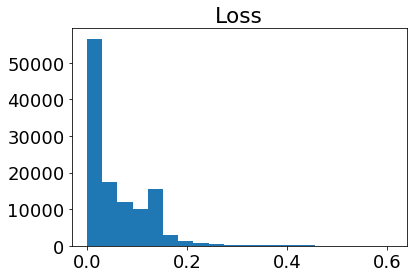

In [7]:
r = 0
f = 0
list_initial_coding = [] 
list_R0s = []
list_output_data = []
runtime = []
final_loss = []
iteration = []
runs = sorted(glob.glob(rundir+'*'))
for run in runs:
    if os.path.exists(run+'/output_data.pkl') and os.path.exists(run+'/run.log') :
        f += 1
        with open(run+'/run.log') as file:
            lines = file.readlines()
            c = 0
            for l, line in enumerate(reversed(lines)):
                if line.strip() == '':
                    continue
                elif 'loss:' in line:
                    final_loss_ = float(line.split()[-1].replace('s',''))
                    c+=1
                elif 'Iterations:' in line:
                    iteration_ = int(line.split()[-1].replace('s',''))   
                    c+=1
                elif 'Runtime:' in line:
                    runtime_ = int(line.split()[-1].replace('s',''))
                    c+=1
                elif l>10:    
                    break
            if c<3:
                print(run+'/run.log ERROR!')
                continue
            else:
                runtime.append(runtime_)
                final_loss.append(final_loss_)
                iteration.append(iteration_)
        list_initial_coding.append(joblib.load(run+'/input_data.pkl')[0])  
        list_R0s.append(scaler.inverse_transform(list_initial_coding[-1])[0,-2:])
        list_output_data.append(joblib.load(run+'/output_data.pkl'))                     
        print('{:25s}'.format(run+':')+
              '{:15s}'.format('runtime='+str(runtime[-1]))+
              '{:15s}'.format('iterations='+str(iteration[-1]))+
              '{:15s}'.format('loss='+str(final_loss[-1]))+     
              '{:20s}'.format('R0s='+str(list_R0s[-1])))   
    else:
        r += 1
        print(run+'/output_data.pkl or run.log not found!')
list_initial_coding = np.array(list_initial_coding)  
list_R0s = np.array(list_R0s)
list_output_data = np.array(list_output_data) 
print('\nFinished: ', f)
print('Not finished: ', r)

# Plot forward and backward march   
mpl.rcParams.update({'font.size': 18})
mpl.rc('xtick', labelsize=18) 
mpl.rc('ytick', labelsize=18) 
mpl.rc('axes', labelsize=18)
fig, ax = plt.subplots(1,1, figsize=[6,4])
ax.hist(final_loss, bins=20)
ax.set_title('Loss')

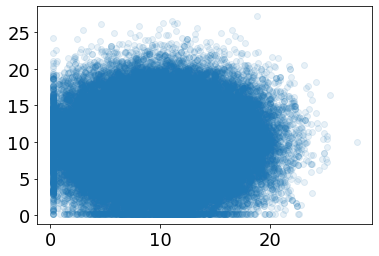

In [8]:
mpl.rcParams.update({'font.size': 18})
mpl.rc('xtick', labelsize=18) 
mpl.rc('ytick', labelsize=18) 
mpl.rc('axes', labelsize=18)

plt.scatter(list_R0s[:,0],list_R0s[:,1], alpha=0.1)

In [9]:
updated_output_data = list_output_data[np.array(final_loss) < 0.02]
print(list_output_data.shape, '->', updated_output_data.shape)

(117975, 2) -> (47604, 2)


In [10]:
def obsdata_mismatch(X_predict, X_obs, obs_points, std_obs=0.05, mim_std_error=10.0):
    X_generated = scaler.inverse_transform(X_predict)
    #R0_generated = X_generated[:,pca_size:]
    X_generated = pca_compress.inverse_transform(X_generated[:,:pca_size])
    X_generated = X_generated.reshape(len(X_predict), len(groups), nl, nc)
    
    # Get simulated and observed data
    sim_data = tf.gather_nd(X_generated, obs_points).numpy()
    obs_data = tf.gather_nd(X_obs, obs_points).numpy()  
    
    # Mesurement error standard deviation
    std_error = std_obs*obs_data+1e-15
    std_error[std_error<mim_std_error] = mim_std_error
    
    #Calculate the objetive function
    return (1/2)*np.sum( ((sim_data-obs_data)/std_error)**2 )     


def prior_mismatch(R0s, mean_m=np.array([10.0, 10.0]), std_m=np.array([4.0, 4.0])):   
    #Calculate the objetive function
    return (1/2)*np.sum( ((R0s-mean_m)/std_m)**2 )  

def find_nearest(array,values):
    idx = np.sum(np.abs(array-values), axis=1).argmin()
    return idx, array[idx]

In [11]:
prior_mismatch(list_R0s[0])

0.32443962763072437

In [12]:
obsdata_mismatch(list_output_data[0][0], X_obs, obs_points)

4.88455375445909

# MCMC random walk

The target (posterior) PDF is


  $
     \pi(\textbf{m}) = \textrm{const} \times \exp \left(-O_m(\textbf{m}) - O_d(\textbf{m}) \right)
  $

where $\textbf{m}$ represents the model parameters (here the two R0s), $O_m(\textbf{m})$ is the prior mismatch and $O_d(\textbf{m})$ the observed data mismatch. 


The probability of accepting a proposal in the chain becomes

  $
     A\left(\textbf{m}^{\ell}, \widehat{\textbf{m}}^{\ell+1}\right)  =  \min \left\{1, \frac{q(\widehat{\textbf{m}}^{\ell+1},\textbf{m}^{\ell}) \pi(\widehat{\textbf{m}}^{\ell+1})}{q(\textbf{m}^{\ell}, \widehat{\textbf{m}}^{\ell+1}) \pi(\textbf{m}^{\ell})}\right\}\\
  $
  
since we chose 
  $
     q(\widehat{\textbf{m}}^{\ell+1},\textbf{m}^{\ell})   =  q(\textbf{m}^{\ell}, \widehat{\textbf{m}}^{\ell+1})\\
  $

then    
  $
     A\left(\textbf{m}^{\ell}, \widehat{\textbf{m}}^{\ell+1}\right)  =  \min \left\{1, \frac{\pi(\widehat{\textbf{m}}^{\ell+1})}{\pi(\textbf{m}^{\ell})}\right\}\\
  $

In [13]:
amostras = len(list_output_data)-1
mcmc_obj = []
mcmc_output_data = []
mcmc_R0 = []
count = 0 

# 1. Generate the initial posterior sample
mcmc_R0.append(list_R0s[0])
mcmc_output_data.append(list_output_data[0])
mcmc_obj.append(obsdata_mismatch(list_output_data[0][0], X_obs, obs_points) + prior_mismatch(list_R0s[0]))
#print('actual',list_R0s[0])
#print('obj',mcmc_obj[-1])

for i in range(amostras):
    
    # 2. Propose a new sample and calculate the objetive function. Posterior ~ exp(-obj)
    std = 1.0
    mean = mcmc_R0[-1]; cut_off = 0.2 
    random_variables = np.random.normal(mean, std, 2)
    random_variables[random_variables<cut_off] = cut_off
    idx, _ = find_nearest(list_R0s,random_variables)
    #print('\nproposed',list_R0s[idx])
    
    # Calculate the objetive function
    mcmc_obj_proposed = obsdata_mismatch(list_output_data[idx][0],X_obs,obs_points)+prior_mismatch(list_R0s[idx])
    #print('obj',mcmc_obj_proposed)
    
    # 3. calculate the acceptance probability
    A = min(1,np.exp(-mcmc_obj_proposed + mcmc_obj[-1]))
    #print('\nA', A)
    
    # 4. Generate a uniform random number    
    u = np.random.rand()
    #print('u', u)
    
    # 5. Accept/reject the sample
    if u < A:
        #print('Accepted!')
        count += 1 
        mcmc_obj.append(mcmc_obj_proposed)
        mcmc_output_data.append(list_output_data[idx])
        mcmc_R0.append(list_R0s[idx])
    else:
        mcmc_obj.append(mcmc_obj[-1])
        mcmc_output_data.append(mcmc_output_data[-1])
        mcmc_R0.append(mcmc_R0[-1])
    
    # Print acceptance rate
    if i%100 == 0: 
        print(f'{i+1}: Taxa de aceitacao: {count/(i+1)}')

mcmc_obj = np.array(mcmc_obj)
mcmc_output_data = np.array(mcmc_output_data)    
print(f'\n\nTaxa de aceitacao: {count/(i+1)}')

1: Taxa de aceitacao: 0.0
101: Taxa de aceitacao: 0.0297029702970297
201: Taxa de aceitacao: 0.029850746268656716
301: Taxa de aceitacao: 0.036544850498338874
401: Taxa de aceitacao: 0.05486284289276808
501: Taxa de aceitacao: 0.04790419161676647
601: Taxa de aceitacao: 0.048252911813643926
701: Taxa de aceitacao: 0.047075606276747506
801: Taxa de aceitacao: 0.052434456928838954
901: Taxa de aceitacao: 0.05216426193118757
1001: Taxa de aceitacao: 0.054945054945054944
1101: Taxa de aceitacao: 0.05449591280653951
1201: Taxa de aceitacao: 0.05578684429641965
1301: Taxa de aceitacao: 0.054573405073020755
1401: Taxa de aceitacao: 0.052105638829407566
1501: Taxa de aceitacao: 0.0519653564290473
1601: Taxa de aceitacao: 0.05309181761399125
1701: Taxa de aceitacao: 0.05291005291005291
1801: Taxa de aceitacao: 0.05274847307051638
1901: Taxa de aceitacao: 0.051551814834297736
2001: Taxa de aceitacao: 0.050474762618690654
2101: Taxa de aceitacao: 0.05188005711565921
2201: Taxa de aceitacao: 0.052

18001: Taxa de aceitacao: 0.04794178101216599
18101: Taxa de aceitacao: 0.04806364289265786
18201: Taxa de aceitacao: 0.04834899181363661
18301: Taxa de aceitacao: 0.04824872957761871
18401: Taxa de aceitacao: 0.04825824683441118
18501: Taxa de aceitacao: 0.048267661207502296
18601: Taxa de aceitacao: 0.04854577710875759
18701: Taxa de aceitacao: 0.04855355328592054
18801: Taxa de aceitacao: 0.04845486942183926
18901: Taxa de aceitacao: 0.04856885879054018
19001: Taxa de aceitacao: 0.04873427714330825
19101: Taxa de aceitacao: 0.04884561017747762
19201: Taxa de aceitacao: 0.048955783552939953
19301: Taxa de aceitacao: 0.04880576135951505
19401: Taxa de aceitacao: 0.04865728570692232
19501: Taxa de aceitacao: 0.04845905338187785
19601: Taxa de aceitacao: 0.04836487934289067
19701: Taxa de aceitacao: 0.04817014364753058
19801: Taxa de aceitacao: 0.048179384879551534
19901: Taxa de aceitacao: 0.04808803577709663
20001: Taxa de aceitacao: 0.04794760261986901
20101: Taxa de aceitacao: 0.048

35801: Taxa de aceitacao: 0.04930029887433312
35901: Taxa de aceitacao: 0.04941366535751093
36001: Taxa de aceitacao: 0.04952640204438766
36101: Taxa de aceitacao: 0.049527713913742
36201: Taxa de aceitacao: 0.04947377144277782
36301: Taxa de aceitacao: 0.04942012616732321
36401: Taxa de aceitacao: 0.049339303865278426
36501: Taxa de aceitacao: 0.049368510451768446
36601: Taxa de aceitacao: 0.04942487910166389
36701: Taxa de aceitacao: 0.04945369335985395
36801: Taxa de aceitacao: 0.049482351023070026
36901: Taxa de aceitacao: 0.04948375382780954
37001: Taxa de aceitacao: 0.049674333126131724
37101: Taxa de aceitacao: 0.04964825745936767
37201: Taxa de aceitacao: 0.04972984597188248
37301: Taxa de aceitacao: 0.04962333449505375
37401: Taxa de aceitacao: 0.04957086708911526
37501: Taxa de aceitacao: 0.04949201354630543
37601: Taxa de aceitacao: 0.049413579426079095
37701: Taxa de aceitacao: 0.04938861038168749
37801: Taxa de aceitacao: 0.04939022777175207
37901: Taxa de aceitacao: 0.049

53601: Taxa de aceitacao: 0.04766702113766534
53701: Taxa de aceitacao: 0.04768998715107726
53801: Taxa de aceitacao: 0.04778721585100649
53901: Taxa de aceitacao: 0.04777276859427469
54001: Taxa de aceitacao: 0.047776893020499624
54101: Taxa de aceitacao: 0.04778100219958965
54201: Taxa de aceitacao: 0.04774819652773934
54301: Taxa de aceitacao: 0.04788125448886761
54401: Taxa de aceitacao: 0.04786676715501553
54501: Taxa de aceitacao: 0.047852332984715876
54601: Taxa de aceitacao: 0.04783795168586656
54701: Taxa de aceitacao: 0.04782362296850149
54801: Taxa de aceitacao: 0.0478458422291564
54901: Taxa de aceitacao: 0.04788619515127229
55001: Taxa de aceitacao: 0.04785367538772022
55101: Taxa de aceitacao: 0.047857570643001036
55201: Taxa de aceitacao: 0.047861451785293746
55301: Taxa de aceitacao: 0.04790148460244842
55401: Taxa de aceitacao: 0.047959423115106224
55501: Taxa de aceitacao: 0.04808922361759248
55601: Taxa de aceitacao: 0.04805668962788439
55701: Taxa de aceitacao: 0.04

71401: Taxa de aceitacao: 0.04792649962885674
71501: Taxa de aceitacao: 0.04792939958881694
71601: Taxa de aceitacao: 0.04798815658999176
71701: Taxa de aceitacao: 0.04806069650353552
71801: Taxa de aceitacao: 0.04803554268046406
71901: Taxa de aceitacao: 0.048038274850141165
72001: Taxa de aceitacao: 0.0480548881265538
72101: Taxa de aceitacao: 0.04805758588646482
72201: Taxa de aceitacao: 0.048060276173460204
72301: Taxa de aceitacao: 0.048062959018547464
72401: Taxa de aceitacao: 0.04806563445256281
72501: Taxa de aceitacao: 0.04808209541937353
72601: Taxa de aceitacao: 0.04811228495475269
72701: Taxa de aceitacao: 0.04807361659399458
72801: Taxa de aceitacao: 0.04813120698891499
72901: Taxa de aceitacao: 0.04814748768878342
73001: Taxa de aceitacao: 0.04817742222709278
73101: Taxa de aceitacao: 0.048207274866280896
73201: Taxa de aceitacao: 0.04814141883307605
73301: Taxa de aceitacao: 0.04811666962251538
73401: Taxa de aceitacao: 0.04811923543275977
73501: Taxa de aceitacao: 0.048

89201: Taxa de aceitacao: 0.04925953744913174
89301: Taxa de aceitacao: 0.049305158956786596
89401: Taxa de aceitacao: 0.04936186396125323
89501: Taxa de aceitacao: 0.04935140389492855
89601: Taxa de aceitacao: 0.049340967176705615
89701: Taxa de aceitacao: 0.04929710928529225
89801: Taxa de aceitacao: 0.049286756272201866
89901: Taxa de aceitacao: 0.04928754963793506
90001: Taxa de aceitacao: 0.04933278519127565
90101: Taxa de aceitacao: 0.04934462436598928
90201: Taxa de aceitacao: 0.049422955399607546
90301: Taxa de aceitacao: 0.04942359442309609
90401: Taxa de aceitacao: 0.049435293857368834
90501: Taxa de aceitacao: 0.04945801703848576
90601: Taxa de aceitacao: 0.049425503029767885
90701: Taxa de aceitacao: 0.04942613642627976
90801: Taxa de aceitacao: 0.04938271604938271
90901: Taxa de aceitacao: 0.049328390226730176
91001: Taxa de aceitacao: 0.04935110603180185
91101: Taxa de aceitacao: 0.0493957256232094
91201: Taxa de aceitacao: 0.04939638819749784
91301: Taxa de aceitacao: 0.

106801: Taxa de aceitacao: 0.048988305352946133
106901: Taxa de aceitacao: 0.04899860618703286
107001: Taxa de aceitacao: 0.04901823347445351
107101: Taxa de aceitacao: 0.04903782410995229
107201: Taxa de aceitacao: 0.049066706467290416
107301: Taxa de aceitacao: 0.04906757625744401
107401: Taxa de aceitacao: 0.04906844442789173
107501: Taxa de aceitacao: 0.04907861322220258
107601: Taxa de aceitacao: 0.04906088233380731
107701: Taxa de aceitacao: 0.049071039266116376
107801: Taxa de aceitacao: 0.04909045370636636
107901: Taxa de aceitacao: 0.04909129665156023
108001: Taxa de aceitacao: 0.04911991555633744
108101: Taxa de aceitacao: 0.04909297786329451
108201: Taxa de aceitacao: 0.04911230025600503
108301: Taxa de aceitacao: 0.049131586965955994
108401: Taxa de aceitacao: 0.049113938063302
108501: Taxa de aceitacao: 0.04916083722730666
108601: Taxa de aceitacao: 0.04918002596661172
108701: Taxa de aceitacao: 0.04926357623204938
108801: Taxa de aceitacao: 0.049264253085909135
108901: Ta

Text(0.5, 1.0, 'Obj')

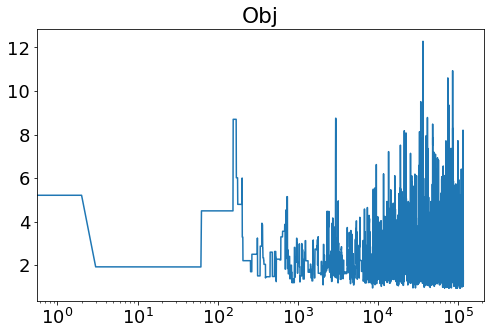

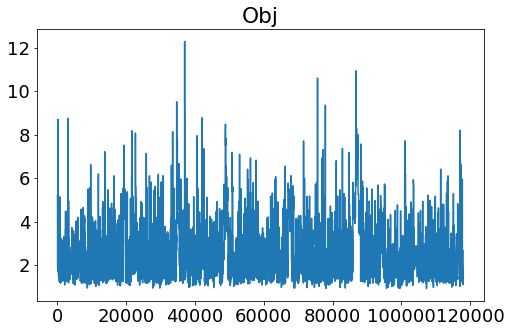

In [14]:
# Plot forward and backward march   
mpl.rcParams.update({'font.size': 18})
mpl.rc('xtick', labelsize=18) 
mpl.rc('ytick', labelsize=18) 
mpl.rc('axes', labelsize=18)
fig, ax = plt.subplots(1,1, figsize=[8,5])
ax.plot(mcmc_obj)
ax.set_xscale('log')
#ax.set_yscale('log')
ax.set_title('Obj')
fig, ax = plt.subplots(1,1, figsize=[8,5])
ax.plot(mcmc_obj)
#ax.set_xscale('log')
#ax.set_yscale('log')
ax.set_title('Obj')

# Plot data

In [15]:
def plot_data(X_predict, nx, ny, obs_times=[], X_obs=[], grid_points=[], R0s_obs=[], R0_ax='', X_ax='', label='', color='b'):
    X_generated = scaler.inverse_transform(X_predict)
    R0_generated = X_generated[:,pca_size:]
    X_generated = pca_compress.inverse_transform(X_generated[:,:pca_size])
    X_generated = X_generated.reshape(len(X_predict), len(groups), nl, nc)
    X_generated[X_generated<0] = 0 
    
    # Plot R
    xp = len(R0_generated)
    if R0_ax:
        R0_ax.plot(np.linspace(0,(xp-1)*8000/86400,xp), R0_generated[:,0], 'b', label='Home '+label)
        R0_ax.plot(np.linspace(0,(xp-1)*8000/86400,xp), R0_generated[:,1], 'r', label='Mobile '+label)
        if len(R0s_obs):
            R0_ax.plot(np.linspace(0,(xp-1)*8000/86400,xp), [R0s_obs[0]]*len(R0_generated), 'bo', markevery=2, fillstyle='none', markersize = 10, label='Home truth')
            R0_ax.plot(np.linspace(0,(xp-1)*8000/86400,xp), [R0s_obs[1]]*len(R0_generated), 'ro', markevery=2, fillstyle='none', markersize = 10, label='Mobile truth')    
        if len(label):
        #    R0_ax.legend()
            R0_ax.set_xlabel('Time (days)')
            R0_ax.set_ylabel('Reproduction number')
        #plt.tight_layout()
        #plt.grid()
        #plt.show()

    
    # Plot groups 
    if len(X_ax): 
        for i, group in enumerate(groups):
            X_ax.flatten()[i].plot(np.linspace(0,(xp-1)*8000/86400,xp), X_generated[:,i, nx, ny], color=color, label=label)
            if len(X_obs):
                if [i, nx, ny] in grid_points:
                    X_ax.flatten()[i].plot(np.array(obs_times)*8000/86400, X_obs[:, i, nx, ny], 'ro', markevery=1, fillstyle='full', markersize = 12, label='Observed data')
                else:
                    X_ax.flatten()[i].plot([],[])
            X_ax.flatten()[i].set_title(group)
            if len(label):
            #    X_ax.flatten()[i].legend()
                X_ax.flatten()[i].set_xlabel('Time (days)')
                X_ax.flatten()[i].set_ylabel('Number of People')
            #X_ax.flatten()[i].set_xlim(8,12)    
        #plt.tight_layout()
        #plt.grid()
        #plt.show()

In [23]:
time = 130
R0_hist_prior = []
for output_data in list_output_data[1000:,0]: 
    X_generated = scaler.inverse_transform(output_data)
    R0_generated = X_generated[:,pca_size:]
    X_generated = pca_compress.inverse_transform(X_generated[:,:pca_size])
    X_generated = X_generated.reshape(-1, len(groups), nl, nc)
    X_generated[X_generated<0] = 0 

    R0_hist_prior.append(R0_generated[time,:])
R0_hist_prior = np.array(R0_hist_prior)

R0_hist_post = []
for output_data in mcmc_output_data[1000:,0]: 
    X_generated = scaler.inverse_transform(output_data)
    R0_generated = X_generated[:,pca_size:]
    X_generated = pca_compress.inverse_transform(X_generated[:,:pca_size])
    X_generated = X_generated.reshape(-1, len(groups), nl, nc)
    X_generated[X_generated<0] = 0 

    R0_hist_post.append(R0_generated[time,:])
R0_hist_post = np.array(R0_hist_post)

<function matplotlib.pyplot.show(*args, **kw)>

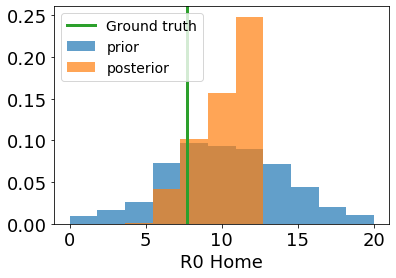

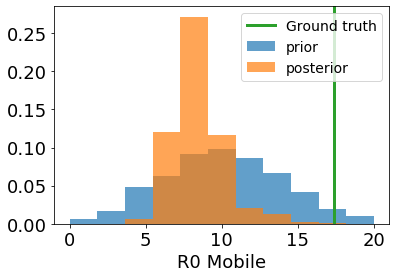

In [24]:
mpl.rcParams.update({'font.size': 14})
mpl.rc('xtick', labelsize=18) 
mpl.rc('ytick', labelsize=18) 
mpl.rc('axes', labelsize=18)

#fig, R0_ax0 = plt.subplots(1,2, figsize=[12,4])
fig, R0_ax0 = plt.subplots(1,1, figsize=[6,4])
fig, R0_ax1 = plt.subplots(1,1, figsize=[6,4])
R0_ax = [R0_ax0, R0_ax1]

# Plot R0 histograms
#xrange = (min(R0_hist.min(),R0s_obs[0],R0s_obs[1]),max(R0_hist.max(),R0s_obs[0],R0s_obs[1])) 
R0_ax[0].hist(R0_hist_prior[:,0], density=True, label='prior', alpha=0.7, range=(0,20), bins=11)#, range=xrange)
R0_ax[0].hist(R0_hist_post[:,0], density=True, label='posterior', alpha=0.7, range=(0,20), bins=11)#, range=xrange)
R0_ax[0].set_xlabel('R0 Home')
R0_ax[1].hist(R0_hist_prior[:,1], density=True, label='prior', alpha=0.7, range=(0,20), bins=11)#, range=xrange)
R0_ax[1].hist(R0_hist_post[:,1], density=True, label='posterior', alpha=0.7, range=(0,20), bins=11)#, range=xrange)
R0_ax[1].set_xlabel('R0 Mobile')

yrange = R0_ax[0].get_ybound()
R0_ax[0].plot([R0s_obs[0]]*2,yrange, linewidth=3, label='Ground truth')
R0_ax[0].set_ylim(yrange)
yrange = R0_ax[1].get_ybound()
R0_ax[1].plot([R0s_obs[1]]*2,yrange, linewidth=3, label='Ground truth')
R0_ax[1].set_ylim(yrange)     

R0_ax[0].legend(loc='upper left')
#plt.tight_layout()
plt.show
R0_ax[1].legend()
#plt.tight_layout()
plt.show

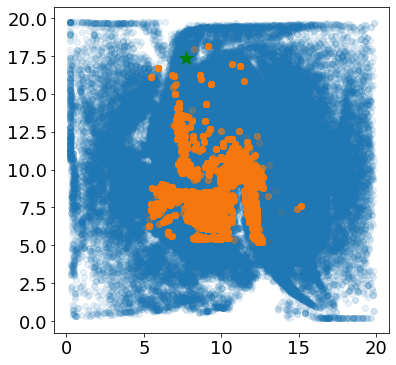

In [25]:
fig, R0_ax = plt.subplots(1,1, figsize=[6,6])

R0_ax.scatter(R0_hist_prior[:,0],R0_hist_prior[:,1], alpha=0.1)
R0_ax.scatter(R0_hist_post[:,0],R0_hist_post[:,1], alpha=0.1)
R0_ax.scatter(R0s_obs[0],R0s_obs[1], s=200, marker='*', c='green')

In [30]:
compartments = ['Susceptible','Exposed','Infecitous','Recovered']

In [41]:
time = 130
R0e_hist_prior = []
R0e_hist_post = []

for output_data in list_output_data[100:,0]: 
    X_generated = scaler.inverse_transform(output_data)
    R0_generated = X_generated[:,pca_size:]
    X_generated = pca_compress.inverse_transform(X_generated[:,:pca_size])
    X_generated = X_generated.reshape(-1, len(groups), nl, nc)
    X_generated[X_generated<0] = 0 
    
    aux_prior = 0
    for time in range(time,time+1):#range(n_ts)
        s = X_generated[time,0,:,:].sum()/(X_generated[time,0,:,:].sum()+X_generated[time,4,:,:].sum())
        aux_prior += R0_generated[time,0]*s+R0_generated[time,1]*(1-s)
        #R0e_hist_prior.append(R0_generated[time,0]*s+R0_generated[time,1]*(1-s))  
    R0e_hist_prior.append(aux_prior)#/n_ts)
        
for output_data in mcmc_output_data[1000:,0]: 
    X_generated = scaler.inverse_transform(output_data)
    R0_generated = X_generated[:,pca_size:]
    X_generated = pca_compress.inverse_transform(X_generated[:,:pca_size])
    X_generated = X_generated.reshape(-1, len(groups), nl, nc)
    X_generated[X_generated<0] = 0 
    
    aux_post = 0
    for time in range(time,time+1):#range(n_ts)
        s = X_generated[time,0,:,:].sum()/(X_generated[time,0,:,:].sum()+X_generated[time,4,:,:].sum())
        aux_post += R0_generated[time,0]*s+R0_generated[time,1]*(1-s)
        #R0e_hist_post.append(R0_generated[time,0]*s+R0_generated[time,1]*(1-s))  
    R0e_hist_post.append(aux_post)#/n_ts)
    
R0e_hist_prior = np.array(R0e_hist_prior)
R0e_hist_post = np.array(R0e_hist_post)

Prior mean  10.05412905266821 std:  3.123882172907197
Post mode  11.0
Post mean  9.841091413029858 std:  1.3764139418412975
Effective observed R0 9.518357964230677


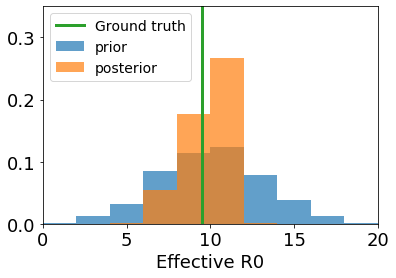

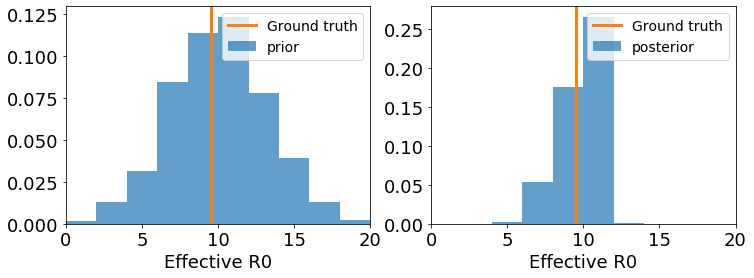

In [42]:
# Plot forward and backward march   
mpl.rcParams.update({'font.size': 14})
mpl.rc('xtick', labelsize=18) 
mpl.rc('ytick', labelsize=18) 
mpl.rc('axes', labelsize=18)

fig, R0_ax = plt.subplots(1,1, figsize=[6,4])

# Plot R0 histograms
R0_ax.hist(R0e_hist_prior, density=True, label='prior', alpha=0.7, range=(0,20))#, bins=20)
print('Prior mean ',R0e_hist_prior.mean(),'std: ', R0e_hist_prior.std())
n, bins, patches = R0_ax.hist(R0e_hist_post, density=True, label='posterior', alpha=0.7, range=(0,20))#, bins=20)
print('Post mode ', (bins[n.argmax()]+bins[n.argmax()+1])/2) # n, bins, patches = 
R0_ax.set_xlabel('Effective R0')
print('Post mean ',R0e_hist_post.mean(),'std: ', R0e_hist_post.std())

yrange = (R0_ax.get_ybound())
aux_obs = 0
for time in range(time,time+1):#range(n_ts)
    s_obs = X_obs[time,0,:,:].sum()/(X_obs[time,0,:,:].sum()+X_obs[time,4,:,:].sum())
    aux_obs += R0s_obs[0]*s_obs+R0s_obs[1]*(1-s_obs)
R0e_obs = aux_obs#/n_ts
print('Effective observed R0', R0e_obs)

yrange = (0.0,0.35)
R0_ax.plot([R0e_obs]*2,yrange, linewidth=3, label='Ground truth')
R0_ax.set_ylim(yrange)    

R0_ax.set_xlim(0,20) 
R0_ax.legend()
#plt.tight_layout()
plt.show()

fig, R0_ax = plt.subplots(1,2, figsize=[12,4])

# Plot R0 histograms
R0_ax[0].hist(R0e_hist_prior, density=True, label='prior', alpha=0.7, range=(0,20))
R0_ax[0].set_xlabel('Effective R0')
yrange = (R0_ax[0].get_ybound())
s_obs = X_obs[time,0,:,:].sum()/(X_obs[time,0,:,:].sum()+X_obs[time,4,:,:].sum())
R0_ax[0].plot([R0s_obs[0]*s_obs+R0s_obs[1]*(1-s_obs)]*2,yrange, linewidth=3, label='Ground truth')
R0_ax[0].set_ylim(yrange)  
R0_ax[0].set_xlim(0,20) 
R0_ax[0].legend()

R0_ax[1].hist(R0e_hist_post, density=True, label='posterior', alpha=0.7, range=(0,20))
R0_ax[1].set_xlabel('Effective R0')
yrange = (R0_ax[1].get_ybound())
s_obs = X_obs[time,0,:,:].sum()/(X_obs[time,0,:,:].sum()+X_obs[time,4,:,:].sum())
R0_ax[1].plot([R0s_obs[0]*s_obs+R0s_obs[1]*(1-s_obs)]*2,yrange, linewidth=3, label='Ground truth')
R0_ax[1].set_ylim(yrange)  
R0_ax[1].set_xlim(0,20) 
R0_ax[1].legend()
  

#plt.tight_layout()
plt.show()


In [43]:
time = 173
R0e_hist_prior = []
R0e_hist_post = []

for output_data in list_output_data[1000:,0]: 
    X_generated = scaler.inverse_transform(output_data)
    R0_generated = X_generated[:,pca_size:]
    X_generated = pca_compress.inverse_transform(X_generated[:,:pca_size])
    X_generated = X_generated.reshape(-1, len(groups), nl, nc)
    X_generated[X_generated<0] = 0 
    
    aux_prior = 0
    for time in range(time,time+1):#range(n_ts)
        s = X_generated[time,0,:,:].sum()/(X_generated[time,0,:,:].sum()+X_generated[time,4,:,:].sum())
        aux_prior += R0_generated[time,0]*s+R0_generated[time,1]*(1-s)
        #R0e_hist_prior.append(R0_generated[time,0]*s+R0_generated[time,1]*(1-s))  
    R0e_hist_prior.append(aux_prior)#/n_ts)
        
for output_data in mcmc_output_data[1000:,0]: 
    X_generated = scaler.inverse_transform(output_data)
    R0_generated = X_generated[:,pca_size:]
    X_generated = pca_compress.inverse_transform(X_generated[:,:pca_size])
    X_generated = X_generated.reshape(-1, len(groups), nl, nc)
    X_generated[X_generated<0] = 0 
    
    aux_post = 0
    for time in range(time,time+1):#range(n_ts)
        s = X_generated[time,0,:,:].sum()/(X_generated[time,0,:,:].sum()+X_generated[time,4,:,:].sum())
        aux_post += R0_generated[time,0]*s+R0_generated[time,1]*(1-s)
        #R0e_hist_post.append(R0_generated[time,0]*s+R0_generated[time,1]*(1-s))  
    R0e_hist_post.append(aux_post)#/n_ts)
    
R0e_hist_prior = np.array(R0e_hist_prior)
R0e_hist_post = np.array(R0e_hist_post)

Prior mean  10.077697556845067 std:  3.450800434585545
Post mode  11.0
Post mean  9.649345546417516 std:  1.384127946611561
Effective observed R0 9.224410413280742


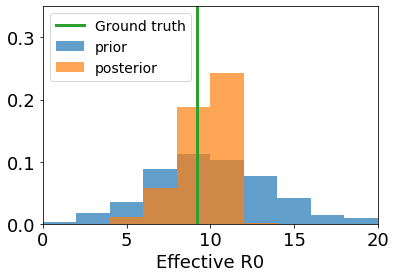

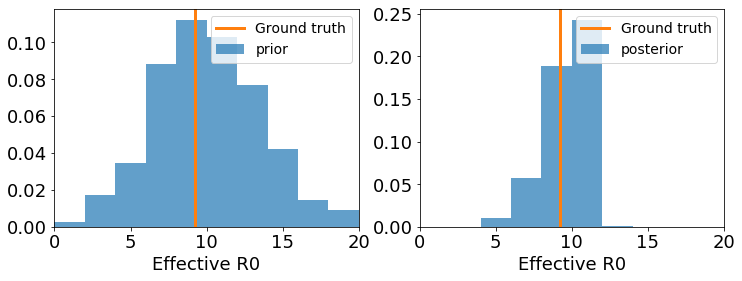

In [44]:
# Plot forward and backward march   
mpl.rcParams.update({'font.size': 14})
mpl.rc('xtick', labelsize=18) 
mpl.rc('ytick', labelsize=18) 
mpl.rc('axes', labelsize=18)

fig, R0_ax = plt.subplots(1,1, figsize=[6,4])

# Plot R0 histograms
R0_ax.hist(R0e_hist_prior, density=True, label='prior', alpha=0.7, range=(0,20))#, bins=20)
print('Prior mean ',R0e_hist_prior.mean(),'std: ', R0e_hist_prior.std())
n, bins, patches = R0_ax.hist(R0e_hist_post, density=True, label='posterior', alpha=0.7, range=(0,20))#, bins=20)
print('Post mode ', (bins[n.argmax()]+bins[n.argmax()+1])/2) # n, bins, patches = 
R0_ax.set_xlabel('Effective R0')
print('Post mean ',R0e_hist_post.mean(),'std: ', R0e_hist_post.std())

yrange = (R0_ax.get_ybound())
aux_obs = 0
for time in range(time,time+1):#range(n_ts)
    s_obs = X_obs[time,0,:,:].sum()/(X_obs[time,0,:,:].sum()+X_obs[time,4,:,:].sum())
    aux_obs += R0s_obs[0]*s_obs+R0s_obs[1]*(1-s_obs)
R0e_obs = aux_obs#/n_ts
print('Effective observed R0', R0e_obs)

yrange = (0.0,0.35)
R0_ax.plot([R0e_obs]*2,yrange, linewidth=3, label='Ground truth')
R0_ax.set_ylim(yrange)    

R0_ax.set_xlim(0,20) 
R0_ax.legend()
#plt.tight_layout()
plt.show()

fig, R0_ax = plt.subplots(1,2, figsize=[12,4])

# Plot R0 histograms
R0_ax[0].hist(R0e_hist_prior, density=True, label='prior', alpha=0.7, range=(0,20))
R0_ax[0].set_xlabel('Effective R0')
yrange = (R0_ax[0].get_ybound())
s_obs = X_obs[time,0,:,:].sum()/(X_obs[time,0,:,:].sum()+X_obs[time,4,:,:].sum())
R0_ax[0].plot([R0s_obs[0]*s_obs+R0s_obs[1]*(1-s_obs)]*2,yrange, linewidth=3, label='Ground truth')
R0_ax[0].set_ylim(yrange)  
R0_ax[0].set_xlim(0,20) 
R0_ax[0].legend()

R0_ax[1].hist(R0e_hist_post, density=True, label='posterior', alpha=0.7, range=(0,20))
R0_ax[1].set_xlabel('Effective R0')
yrange = (R0_ax[1].get_ybound())
s_obs = X_obs[time,0,:,:].sum()/(X_obs[time,0,:,:].sum()+X_obs[time,4,:,:].sum())
R0_ax[1].plot([R0s_obs[0]*s_obs+R0s_obs[1]*(1-s_obs)]*2,yrange, linewidth=3, label='Ground truth')
R0_ax[1].set_ylim(yrange)  
R0_ax[1].set_xlim(0,20) 
R0_ax[1].legend()
  

#plt.tight_layout()
plt.show()


In [47]:
time = 238
R0e_hist_prior = []
R0e_hist_post = []

for output_data in list_output_data[1000:,0]: 
    X_generated = scaler.inverse_transform(output_data)
    R0_generated = X_generated[:,pca_size:]
    X_generated = pca_compress.inverse_transform(X_generated[:,:pca_size])
    X_generated = X_generated.reshape(-1, len(groups), nl, nc)
    X_generated[X_generated<0] = 0 
    
    aux_prior = 0
    for time in range(time,time+1):#range(n_ts)
        s = X_generated[time,0,:,:].sum()/(X_generated[time,0,:,:].sum()+X_generated[time,4,:,:].sum())
        aux_prior += R0_generated[time,0]*s+R0_generated[time,1]*(1-s)
        #R0e_hist_prior.append(R0_generated[time,0]*s+R0_generated[time,1]*(1-s))  
    R0e_hist_prior.append(aux_prior)#/n_ts)
        
for output_data in mcmc_output_data[1000:,0]: 
    X_generated = scaler.inverse_transform(output_data)
    R0_generated = X_generated[:,pca_size:]
    X_generated = pca_compress.inverse_transform(X_generated[:,:pca_size])
    X_generated = X_generated.reshape(-1, len(groups), nl, nc)
    X_generated[X_generated<0] = 0 
    
    aux_post = 0
    for time in range(time,time+1):#range(n_ts)
        s = X_generated[time,0,:,:].sum()/(X_generated[time,0,:,:].sum()+X_generated[time,4,:,:].sum())
        aux_post += R0_generated[time,0]*s+R0_generated[time,1]*(1-s)
        #R0e_hist_post.append(R0_generated[time,0]*s+R0_generated[time,1]*(1-s))  
    R0e_hist_post.append(aux_post)#/n_ts)
    
R0e_hist_prior = np.array(R0e_hist_prior)
R0e_hist_post = np.array(R0e_hist_post)

Prior mean  9.847449265121643 std:  3.6117374162067915
Post mode  11.0
Post mean  9.893175724795745 std:  1.4810887450959753
Effective observed R0 9.480121343691406


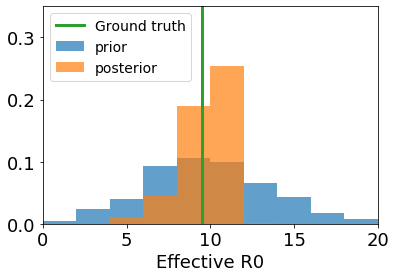

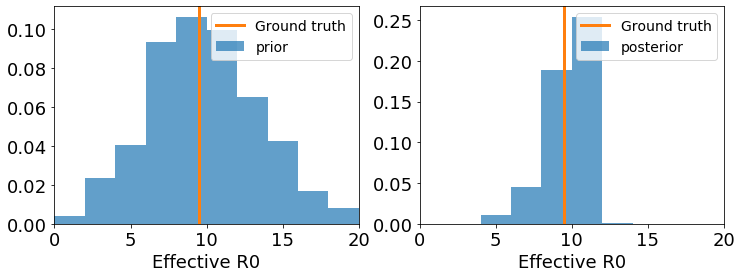

In [48]:
# Plot forward and backward march   
mpl.rcParams.update({'font.size': 14})
mpl.rc('xtick', labelsize=18) 
mpl.rc('ytick', labelsize=18) 
mpl.rc('axes', labelsize=18)

fig, R0_ax = plt.subplots(1,1, figsize=[6,4])

# Plot R0 histograms
R0_ax.hist(R0e_hist_prior, density=True, label='prior', alpha=0.7, range=(0,20))#, bins=20)
print('Prior mean ',R0e_hist_prior.mean(),'std: ', R0e_hist_prior.std())
n, bins, patches = R0_ax.hist(R0e_hist_post, density=True, label='posterior', alpha=0.7, range=(0,20))#, bins=20)
print('Post mode ', (bins[n.argmax()]+bins[n.argmax()+1])/2) # n, bins, patches = 
R0_ax.set_xlabel('Effective R0')
print('Post mean ',R0e_hist_post.mean(),'std: ', R0e_hist_post.std())

yrange = (R0_ax.get_ybound())
aux_obs = 0
for time in range(time,time+1):#range(n_ts)
    s_obs = X_obs[time,0,:,:].sum()/(X_obs[time,0,:,:].sum()+X_obs[time,4,:,:].sum())
    aux_obs += R0s_obs[0]*s_obs+R0s_obs[1]*(1-s_obs)
R0e_obs = aux_obs#/n_ts
print('Effective observed R0', R0e_obs)

yrange = (0.0,0.35)
R0_ax.plot([R0e_obs]*2,yrange, linewidth=3, label='Ground truth')
R0_ax.set_ylim(yrange)    

R0_ax.set_xlim(0,20) 
R0_ax.legend()
#plt.tight_layout()
plt.show()

fig, R0_ax = plt.subplots(1,2, figsize=[12,4])

# Plot R0 histograms
R0_ax[0].hist(R0e_hist_prior, density=True, label='prior', alpha=0.7, range=(0,20))
R0_ax[0].set_xlabel('Effective R0')
yrange = (R0_ax[0].get_ybound())
s_obs = X_obs[time,0,:,:].sum()/(X_obs[time,0,:,:].sum()+X_obs[time,4,:,:].sum())
R0_ax[0].plot([R0s_obs[0]*s_obs+R0s_obs[1]*(1-s_obs)]*2,yrange, linewidth=3, label='Ground truth')
R0_ax[0].set_ylim(yrange)  
R0_ax[0].set_xlim(0,20) 
R0_ax[0].legend()

R0_ax[1].hist(R0e_hist_post, density=True, label='posterior', alpha=0.7, range=(0,20))
R0_ax[1].set_xlabel('Effective R0')
yrange = (R0_ax[1].get_ybound())
s_obs = X_obs[time,0,:,:].sum()/(X_obs[time,0,:,:].sum()+X_obs[time,4,:,:].sum())
R0_ax[1].plot([R0s_obs[0]*s_obs+R0s_obs[1]*(1-s_obs)]*2,yrange, linewidth=3, label='Ground truth')
R0_ax[1].set_ylim(yrange)  
R0_ax[1].set_xlim(0,20) 
R0_ax[1].legend()
  

#plt.tight_layout()
plt.show()
